In [ ]:
import pandas as pd
import tensorflow as tf
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
DATA_FOLDER  = 'dataset'
DATASET = os.path.join(DATA_FOLDER,'bodyfat.csv')

df = pd.read_csv(DATASET)
df.head()

,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,1.0708,12.3,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,1.0853,6.1,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,1.0414,25.3,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,1.0751,10.4,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,1.0340,28.7,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Density  252 non-null    float64
 1   BodyFat  252 non-null    float64
 2   Age      252 non-null    int64  
 3   Weight   252 non-null    float64
 4   Height   252 non-null    float64
 5   Neck     252 non-null    float64
 6   Chest    252 non-null    float64
 7   Abdomen  252 non-null    float64
 8   Hip      252 non-null    float64
 9   Thigh    252 non-null    float64
 10  Knee     252 non-null    float64
 11  Ankle    252 non-null    float64
 12  Biceps   252 non-null    float64
 13  Forearm  252 non-null    float64
 14  Wrist    252 non-null    float64
dtypes: float64(14), int64(1)
memory usage: 29.7 KB


In [ ]:
df.columns = df.columns.str.lower()

In [ ]:
X = df.drop(columns=['bodyfat'], axis = 1)
y = df['bodyfat']

X.head()

,density,age,weight,height,neck,chest,abdomen,hip,thigh,knee,ankle,biceps,forearm,wrist
0,1.0708,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,1.0853,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,1.0414,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,1.0751,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,1.0340,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


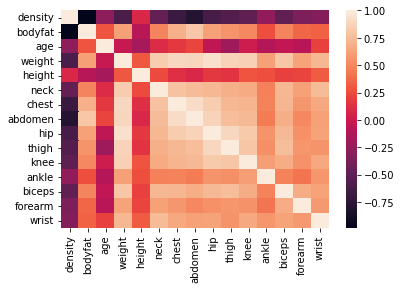

In [ ]:
sns.heatmap(df.corr())

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.15, random_state = 42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train,y_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_train_tensor = tf.convert_to_tensor(X_train)
y_train_tensor = tf.convert_to_tensor(y_train)

In [ ]:
def model_architecture_128(INPUT_SHAPE,L1 = 1e-5, L2 = 1e-5, alpha = 1e-3, activation = 'relu'):
    
    model = keras.models.Sequential([
        
                keras.layers.InputLayer(input_shape = INPUT_SHAPE),
                keras.layers.Normalization(),
                            
                keras.layers.Dense(units = 128,
                                            activation = activation,
                                            kernel_regularizer=keras.regularizers.L1L2(l1=L1,l2=L2)),
                keras.layers.Dense(units = 1)
            ])
    
    model.compile(optimizer = keras.optimizers.Adam(learning_rate=alpha),
                loss='mse',
                metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

In [ ]:
def model_architecture_128_64(INPUT_SHAPE,L1 = 1e-5, L2 = 1e-5, alpha = 1e-3, activation= 'relu'):
    
    model = keras.models.Sequential([
        
                keras.layers.InputLayer(input_shape = INPUT_SHAPE),
                keras.layers.Normalization(),
                            
                keras.layers.Dense(units = 128,
                                            activation = activation,
                                            kernel_regularizer=keras.regularizers.L1L2(l1=L1,l2=L2)),
                keras.layers.Dense(units = 64,
                                            activation = activation,
                                            kernel_regularizer=keras.regularizers.L1L2(l1=L1,l2=L2)),
                keras.layers.Dense(units = 1)
            ])
    
    model.compile(optimizer = keras.optimizers.Adam(learning_rate=alpha),
                  loss='mse',
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

In [ ]:
def model_architecture_128_64_32(INPUT_SHAPE,L1 = 1e-5, L2 = 1e-5, alpha = 1e-3, activation='relu'):
    
    model = keras.models.Sequential([
        
                keras.layers.InputLayer(input_shape = INPUT_SHAPE),
                keras.layers.Normalization(),
                            
                keras.layers.Dense(units = 128,
                                            activation = activation,
                                            kernel_regularizer=keras.regularizers.L1L2(l1=L1,l2=L2)),
                keras.layers.Dense(units = 64,
                                            activation = activation,
                                            kernel_regularizer=keras.regularizers.L1L2(l1=L1,l2=L2)),
                keras.layers.Dense(units = 32,
                                            activation = activation,
                                            kernel_regularizer=keras.regularizers.L1L2(l1=L1,l2=L2)),
                keras.layers.Dense(units = 1)
            ])
    
    model.compile(optimizer = keras.optimizers.Adam(learning_rate=alpha),
                  loss='mse',
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])

    return model

In [ ]:
model_128 = model_architecture_128(X_train.shape[1])
model_128.summary()

Model: "sequential_958"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_958 (Normaliz  (None, 14)               29        
 ation)                                                          
                                                                 
 dense_2952 (Dense)          (None, 128)               1920      
                                                                 
 dense_2953 (Dense)          (None, 1)                 129       
                                                                 
Total params: 2,078
Trainable params: 2,049
Non-trainable params: 29
_________________________________________________________________


In [ ]:
model_128_64 = model_architecture_128_64(X_train.shape[1])
model_128_64.summary()

Model: "sequential_959"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_959 (Normaliz  (None, 14)               29        
 ation)                                                          
                                                                 
 dense_2954 (Dense)          (None, 128)               1920      
                                                                 
 dense_2955 (Dense)          (None, 64)                8256      
                                                                 
 dense_2956 (Dense)          (None, 1)                 65        
                                                                 
Total params: 10,270
Trainable params: 10,241
Non-trainable params: 29
_________________________________________________________________


In [ ]:
model_128_64_32 = model_architecture_128_64_32(X_train.shape[1])
model_128_64_32.summary()

Model: "sequential_960"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_960 (Normaliz  (None, 14)               29        
 ation)                                                          
                                                                 
 dense_2957 (Dense)          (None, 128)               1920      
                                                                 
 dense_2958 (Dense)          (None, 64)                8256      
                                                                 
 dense_2959 (Dense)          (None, 32)                2080      
                                                                 
 dense_2960 (Dense)          (None, 1)                 33        
                                                                 
Total params: 12,318
Trainable params: 12,289
Non-trainable params: 29
_______________________________________________

In [ ]:
def get_model_summaries():
    model_summaries = pd.DataFrame(columns = ['model_name','epochs','activation','learning_rate','l1','l2', 'loss','root_mean_squared_error', 'val_loss','val_root_mean_squared_error'])
    return model_summaries

In [ ]:
model_summaries = get_model_summaries()

Epoch 1/20
6/6 [==============================] - 1s 29ms/step - loss: 276612576.0000 - root_mean_squared_error: 16631.6738 - val_loss: 1260225.7500 - val_root_mean_squared_error: 1122.5457
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 356601.1562 - root_mean_squared_error: 597.0170 - val_loss: 726.4165 - val_root_mean_squared_error: 21.8206
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 793.0551 - root_mean_squared_error: 22.4264 - val_loss: 832.3367 - val_root_mean_squared_error: 22.1090
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 881.7348 - root_mean_squared_error: 22.6543 - val_loss: 896.7911 - val_root_mean_squared_error: 22.2639
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 934.4646 - root_mean_squared_error: 22.7769 - val_loss: 933.5865 - val_root_mean_squared_error: 22.3447
Epoch 6/20
6/6 [==============================] - 0s 6ms/step - loss: 963.8412 - root_mean_squared_error: 22.8

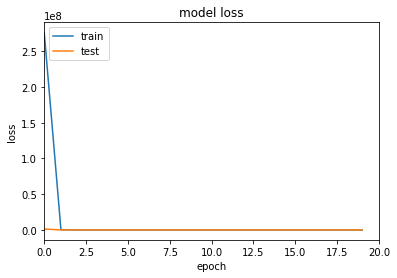

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 944.8744 - root_mean_squared_error: 22.5471 - val_loss: 921.1285 - val_root_mean_squared_error: 22.0481
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 940.9204 - root_mean_squared_error: 22.5134 - val_loss: 917.1934 - val_root_mean_squared_error: 22.0133
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 936.9850 - root_mean_squared_error: 22.4790 - val_loss: 913.2646 - val_root_mean_squared_error: 21.9778
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 933.0216 - root_mean_squared_error: 22.4431 - val_loss: 909.3682 - val_root_mean_squared_error: 21.9419
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 929.1152 - root_mean_squared_error: 22.4073 - val_loss: 905.4682 - val_root_mean_squared_error: 21.9049
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 925.1889 - root_mean_squared_error: 22.3702 - val_los

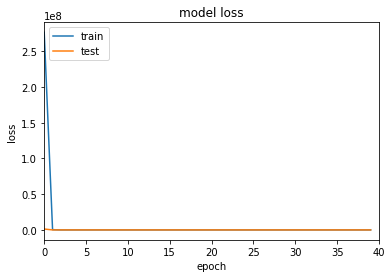

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 867.9952 - root_mean_squared_error: 21.7417 - val_loss: 844.8464 - val_root_mean_squared_error: 21.2271
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 864.3124 - root_mean_squared_error: 21.6960 - val_loss: 841.1609 - val_root_mean_squared_error: 21.1798
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 860.5958 - root_mean_squared_error: 21.6487 - val_loss: 837.5038 - val_root_mean_squared_error: 21.1323
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 856.9144 - root_mean_squared_error: 21.6014 - val_loss: 833.8591 - val_root_mean_squared_error: 21.0844
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 853.2229 - root_mean_squared_error: 21.5532 - val_loss: 830.2352 - val_root_mean_squared_error: 21.0361
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 849.5768 - root_mean_squared_error: 21.5052 - val_los

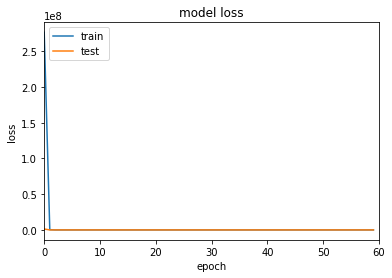

Epoch 1/20
6/6 [==============================] - 1s 29ms/step - loss: 235846640.0000 - root_mean_squared_error: 15357.2988 - val_loss: 134827.6562 - val_root_mean_squared_error: 367.1333
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 24876.7812 - root_mean_squared_error: 157.5485 - val_loss: 516.7388 - val_root_mean_squared_error: 21.0333
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 546.0762 - root_mean_squared_error: 21.5177 - val_loss: 536.3733 - val_root_mean_squared_error: 21.0221
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 562.0790 - root_mean_squared_error: 21.5058 - val_loss: 547.5712 - val_root_mean_squared_error: 21.0082
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 571.0590 - root_mean_squared_error: 21.4914 - val_loss: 553.6431 - val_root_mean_squared_error: 20.9925
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 575.7606 - root_mean_squared_error: 21.4750

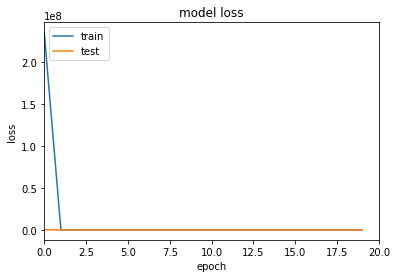

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 561.4159 - root_mean_squared_error: 21.0854 - val_loss: 539.8474 - val_root_mean_squared_error: 20.5715
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 559.7206 - root_mean_squared_error: 21.0514 - val_loss: 538.1891 - val_root_mean_squared_error: 20.5374
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 558.0462 - root_mean_squared_error: 21.0177 - val_loss: 536.4962 - val_root_mean_squared_error: 20.5023
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 556.3218 - root_mean_squared_error: 20.9826 - val_loss: 534.7769 - val_root_mean_squared_error: 20.4665
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 554.5839 - root_mean_squared_error: 20.9471 - val_loss: 533.0344 - val_root_mean_squared_error: 20.4298
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 552.8034 - root_mean_squared_error: 20.9103 - val_los

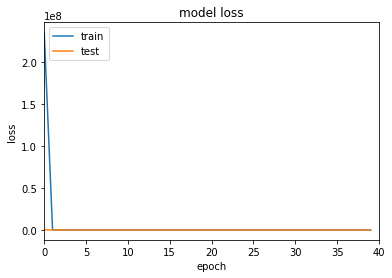

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 528.1243 - root_mean_squared_error: 20.2727 - val_loss: 507.8063 - val_root_mean_squared_error: 19.7426
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 527.6747 - root_mean_squared_error: 20.2273 - val_loss: 507.1185 - val_root_mean_squared_error: 19.6959
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 526.7410 - root_mean_squared_error: 20.1806 - val_loss: 505.9337 - val_root_mean_squared_error: 19.6490
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 525.3879 - root_mean_squared_error: 20.1344 - val_loss: 504.3706 - val_root_mean_squared_error: 19.6014
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 523.6956 - root_mean_squared_error: 20.0872 - val_loss: 502.5847 - val_root_mean_squared_error: 19.5537
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 521.8339 - root_mean_squared_error: 20.0400 - val_los

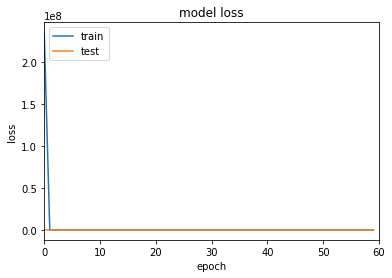

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 319563584.0000 - root_mean_squared_error: 17876.3398 - val_loss: 261408.9375 - val_root_mean_squared_error: 511.2445
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 53857.0156 - root_mean_squared_error: 231.9666 - val_loss: 3167.0784 - val_root_mean_squared_error: 55.7232
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 1012.9558 - root_mean_squared_error: 30.7420 - val_loss: 571.7625 - val_root_mean_squared_error: 22.2787
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 599.3941 - root_mean_squared_error: 22.8179 - val_loss: 585.6360 - val_root_mean_squared_error: 22.4196
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 610.5407 - root_mean_squared_error: 22.9275 - val_loss: 593.1819 - val_root_mean_squared_error: 22.4926
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 616.5132 - root_mean_squared_error: 22.98

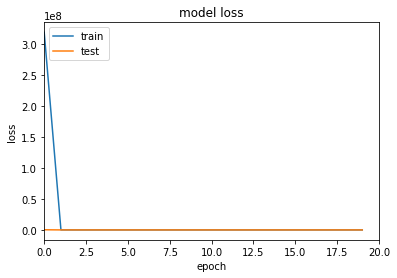

Epoch 21/40
6/6 [==============================] - 0s 11ms/step - loss: 606.1550 - root_mean_squared_error: 22.7065 - val_loss: 583.7595 - val_root_mean_squared_error: 22.2101
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 604.5475 - root_mean_squared_error: 22.6747 - val_loss: 582.1664 - val_root_mean_squared_error: 22.1778
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 602.9191 - root_mean_squared_error: 22.6422 - val_loss: 580.5390 - val_root_mean_squared_error: 22.1446
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 601.2801 - root_mean_squared_error: 22.6094 - val_loss: 578.8713 - val_root_mean_squared_error: 22.1104
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 599.5897 - root_mean_squared_error: 22.5754 - val_loss: 577.1808 - val_root_mean_squared_error: 22.0756
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 597.8627 - root_mean_squared_error: 22.5406 - val_los

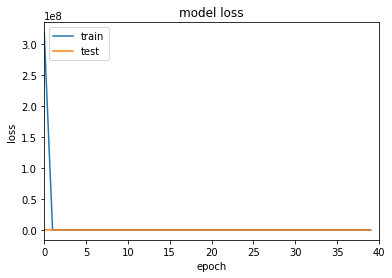

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 569.5391 - root_mean_squared_error: 21.9499 - val_loss: 547.2839 - val_root_mean_squared_error: 21.4386
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 567.4925 - root_mean_squared_error: 21.9060 - val_loss: 545.2561 - val_root_mean_squared_error: 21.3942
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 565.4356 - root_mean_squared_error: 21.8618 - val_loss: 543.2124 - val_root_mean_squared_error: 21.3492
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 563.3414 - root_mean_squared_error: 21.8167 - val_loss: 541.1547 - val_root_mean_squared_error: 21.3039
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 561.2509 - root_mean_squared_error: 21.7715 - val_loss: 539.0788 - val_root_mean_squared_error: 21.2580
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 559.1605 - root_mean_squared_error: 21.7262 - val_los

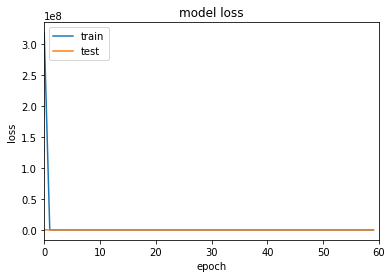

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 267030848.0000 - root_mean_squared_error: 16341.0781 - val_loss: 453.9152 - val_root_mean_squared_error: 20.4459
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 477.2414 - root_mean_squared_error: 20.7501 - val_loss: 461.2717 - val_root_mean_squared_error: 20.0308
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 483.1227 - root_mean_squared_error: 20.4318 - val_loss: 465.0803 - val_root_mean_squared_error: 19.8056
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 485.9690 - root_mean_squared_error: 20.2495 - val_loss: 466.9337 - val_root_mean_squared_error: 19.6731
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 487.3898 - root_mean_squared_error: 20.1434 - val_loss: 467.6473 - val_root_mean_squared_error: 19.5907
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 487.6788 - root_mean_squared_error: 20.0715 - val

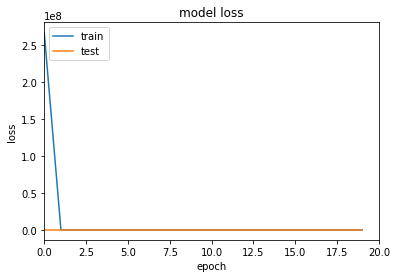

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 472.8842 - root_mean_squared_error: 19.6682 - val_loss: 452.3149 - val_root_mean_squared_error: 19.1411
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 471.5662 - root_mean_squared_error: 19.6394 - val_loss: 451.0125 - val_root_mean_squared_error: 19.1119
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 470.2346 - root_mean_squared_error: 19.6101 - val_loss: 449.6995 - val_root_mean_squared_error: 19.0822
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 468.9012 - root_mean_squared_error: 19.5807 - val_loss: 448.3559 - val_root_mean_squared_error: 19.0516
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 467.5360 - root_mean_squared_error: 19.5503 - val_loss: 446.9986 - val_root_mean_squared_error: 19.0205
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 466.1414 - root_mean_squared_error: 19.5190 - val_los

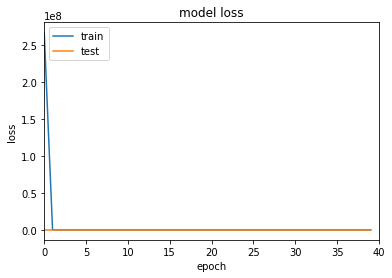

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 443.7989 - root_mean_squared_error: 18.9917 - val_loss: 423.4182 - val_root_mean_squared_error: 18.4494
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 837.3021 - root_mean_squared_error: 27.4643 - val_loss: 422.1430 - val_root_mean_squared_error: 18.4074
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 441.1623 - root_mean_squared_error: 18.9089 - val_loss: 421.1558 - val_root_mean_squared_error: 18.3621
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 440.0272 - root_mean_squared_error: 18.8651 - val_loss: 419.8880 - val_root_mean_squared_error: 18.3188
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 438.6498 - root_mean_squared_error: 18.8225 - val_loss: 418.4618 - val_root_mean_squared_error: 18.2768
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 437.1369 - root_mean_squared_error: 18.7806 - val_los

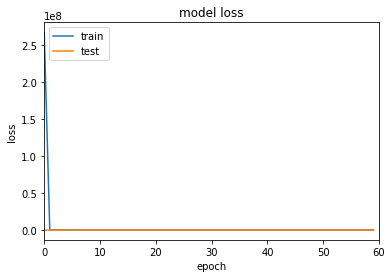

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 185084832.0000 - root_mean_squared_error: 13604.5869 - val_loss: 163866.9531 - val_root_mean_squared_error: 404.6755
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 33146.3633 - root_mean_squared_error: 181.6342 - val_loss: 637.0260 - val_root_mean_squared_error: 20.2308
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 689.9343 - root_mean_squared_error: 20.6353 - val_loss: 713.3490 - val_root_mean_squared_error: 20.0208
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 753.7617 - root_mean_squared_error: 20.4691 - val_loss: 759.3545 - val_root_mean_squared_error: 19.8952
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 790.6829 - root_mean_squared_error: 20.3624 - val_loss: 784.4417 - val_root_mean_squared_error: 19.8156
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 810.0963 - root_mean_squared_error: 20.295

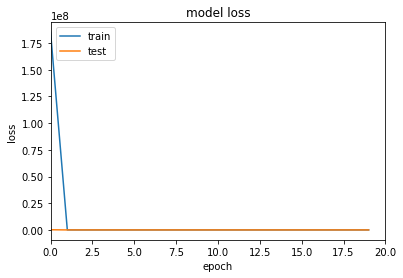

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 762.9492 - root_mean_squared_error: 19.8246 - val_loss: 739.9502 - val_root_mean_squared_error: 19.2961
Epoch 22/40
6/6 [==============================] - 0s 14ms/step - loss: 757.7865 - root_mean_squared_error: 19.7898 - val_loss: 734.8777 - val_root_mean_squared_error: 19.2607
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 752.7451 - root_mean_squared_error: 19.7549 - val_loss: 729.8953 - val_root_mean_squared_error: 19.2243
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 747.7869 - root_mean_squared_error: 19.7188 - val_loss: 725.0168 - val_root_mean_squared_error: 19.1874
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 742.9186 - root_mean_squared_error: 19.6819 - val_loss: 720.2368 - val_root_mean_squared_error: 19.1499
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 738.1664 - root_mean_squared_error: 19.6449 - va

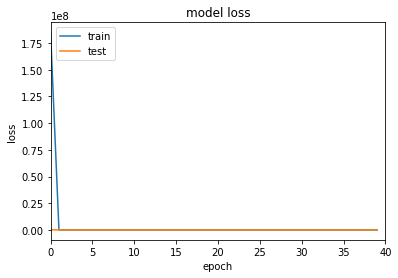

Epoch 41/60
6/6 [==============================] - 0s 40ms/step - loss: 675.7187 - root_mean_squared_error: 19.0090 - val_loss: 654.0830 - val_root_mean_squared_error: 18.4627
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 672.0481 - root_mean_squared_error: 18.9623 - val_loss: 650.4855 - val_root_mean_squared_error: 18.4155
Epoch 43/60
6/6 [==============================] - 0s 18ms/step - loss: 668.4575 - root_mean_squared_error: 18.9159 - val_loss: 646.9249 - val_root_mean_squared_error: 18.3675
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 664.8908 - root_mean_squared_error: 18.8684 - val_loss: 643.4102 - val_root_mean_squared_error: 18.3191
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 661.3878 - root_mean_squared_error: 18.8209 - val_loss: 639.9274 - val_root_mean_squared_error: 18.2698
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 657.8525 - root_mean_squared_error: 18.7710 - val_l

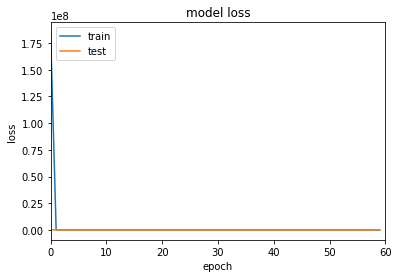

Epoch 1/20
6/6 [==============================] - 1s 67ms/step - loss: 277640608.0000 - root_mean_squared_error: 16662.5508 - val_loss: 5618658.0000 - val_root_mean_squared_error: 2370.3682
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 986587.5625 - root_mean_squared_error: 993.2618 - val_loss: 519.9882 - val_root_mean_squared_error: 22.1991
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 554.4659 - root_mean_squared_error: 22.8663 - val_loss: 549.2915 - val_root_mean_squared_error: 22.6216
Epoch 4/20
6/6 [==============================] - 0s 15ms/step - loss: 578.4848 - root_mean_squared_error: 23.1967 - val_loss: 566.3539 - val_root_mean_squared_error: 22.8518
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 592.2968 - root_mean_squared_error: 23.3756 - val_loss: 575.9852 - val_root_mean_squared_error: 22.9751
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 600.1809 - root_mean_squared_error:

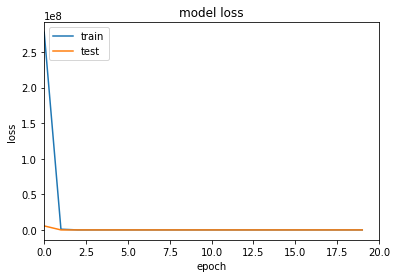

Epoch 21/40
6/6 [==============================] - 0s 21ms/step - loss: 591.3102 - root_mean_squared_error: 23.2153 - val_loss: 568.5944 - val_root_mean_squared_error: 22.7220
Epoch 22/40
6/6 [==============================] - 0s 15ms/step - loss: 589.6204 - root_mean_squared_error: 23.1808 - val_loss: 566.8797 - val_root_mean_squared_error: 22.6862
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 587.8694 - root_mean_squared_error: 23.1449 - val_loss: 565.1343 - val_root_mean_squared_error: 22.6496
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 586.0938 - root_mean_squared_error: 23.1084 - val_loss: 563.3552 - val_root_mean_squared_error: 22.6122
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 584.2717 - root_mean_squared_error: 23.0708 - val_loss: 561.5468 - val_root_mean_squared_error: 22.5741
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 582.4347 - root_mean_squared_error: 23.0329 - va

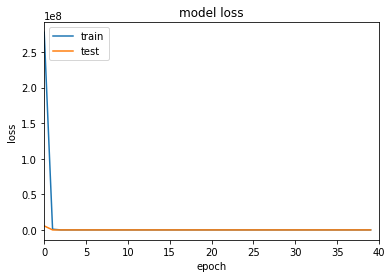

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 551.6179 - root_mean_squared_error: 22.3817 - val_loss: 529.0219 - val_root_mean_squared_error: 21.8722
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 549.3907 - root_mean_squared_error: 22.3336 - val_loss: 526.8104 - val_root_mean_squared_error: 21.8234
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 547.1393 - root_mean_squared_error: 22.2849 - val_loss: 524.5804 - val_root_mean_squared_error: 21.7740
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 544.8802 - root_mean_squared_error: 22.2359 - val_loss: 522.3318 - val_root_mean_squared_error: 21.7241
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 542.6049 - root_mean_squared_error: 22.1865 - val_loss: 520.0721 - val_root_mean_squared_error: 21.6738
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 540.3020 - root_mean_squared_error: 22.1362 - val_los

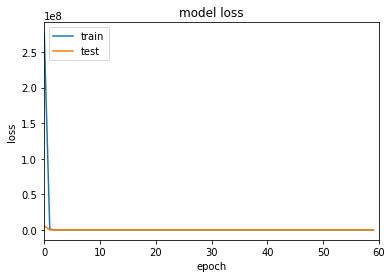

Epoch 1/20
6/6 [==============================] - 0s 29ms/step - loss: 172479536.0000 - root_mean_squared_error: 13133.1465 - val_loss: 2131.4673 - val_root_mean_squared_error: 46.1178
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 756.6038 - root_mean_squared_error: 27.3947 - val_loss: 453.4968 - val_root_mean_squared_error: 21.1039
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 475.3378 - root_mean_squared_error: 21.5941 - val_loss: 455.7281 - val_root_mean_squared_error: 21.1071
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 477.0172 - root_mean_squared_error: 21.5930 - val_loss: 456.6756 - val_root_mean_squared_error: 21.1003
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 477.6180 - root_mean_squared_error: 21.5836 - val_loss: 456.8441 - val_root_mean_squared_error: 21.0874
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 477.5778 - root_mean_squared_error: 21.5694 - val

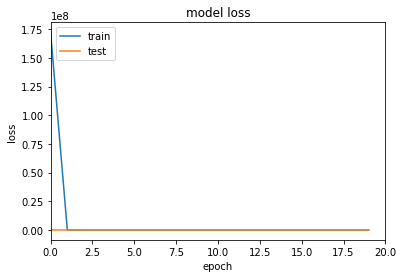

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 458.6719 - root_mean_squared_error: 21.1183 - val_loss: 437.0742 - val_root_mean_squared_error: 20.6010
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 456.9707 - root_mean_squared_error: 21.0786 - val_loss: 435.3992 - val_root_mean_squared_error: 20.5609
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 455.2587 - root_mean_squared_error: 21.0386 - val_loss: 433.6890 - val_root_mean_squared_error: 20.5200
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 453.5126 - root_mean_squared_error: 20.9977 - val_loss: 431.9474 - val_root_mean_squared_error: 20.4781
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 451.7143 - root_mean_squared_error: 20.9554 - val_loss: 430.1849 - val_root_mean_squared_error: 20.4356
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 449.9414 - root_mean_squared_error: 20.9137 - val_los

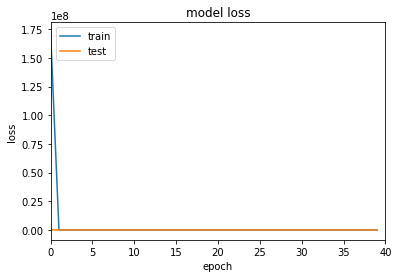

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 419.8478 - root_mean_squared_error: 20.1898 - val_loss: 398.5099 - val_root_mean_squared_error: 19.6546
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 417.7201 - root_mean_squared_error: 20.1376 - val_loss: 396.3637 - val_root_mean_squared_error: 19.6005
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 415.5456 - root_mean_squared_error: 20.0840 - val_loss: 394.2034 - val_root_mean_squared_error: 19.5458
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 413.3354 - root_mean_squared_error: 20.0295 - val_loss: 392.0548 - val_root_mean_squared_error: 19.4913
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 411.1213 - root_mean_squared_error: 19.9746 - val_loss: 389.8962 - val_root_mean_squared_error: 19.4364
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 408.9843 - root_mean_squared_error: 19.9216 - val_los

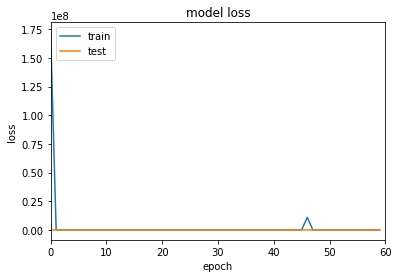

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 215367888.0000 - root_mean_squared_error: 14675.4180 - val_loss: 1872470.2500 - val_root_mean_squared_error: 1368.3810
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1233788.5000 - root_mean_squared_error: 1110.7581 - val_loss: 1094600.7500 - val_root_mean_squared_error: 1046.2288
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 498818.1562 - root_mean_squared_error: 706.2659 - val_loss: 57196.8242 - val_root_mean_squared_error: 239.1431
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 104668.0625 - root_mean_squared_error: 323.5125 - val_loss: 109865.0469 - val_root_mean_squared_error: 331.4467
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 36514.8516 - root_mean_squared_error: 191.0668 - val_loss: 1394.4309 - val_root_mean_squared_error: 37.2274
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 5169.1611 - r

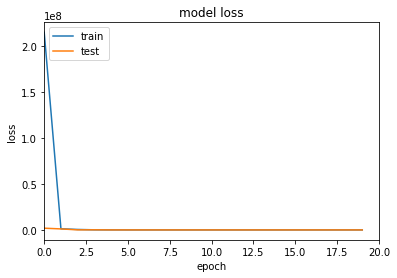

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 505.0478 - root_mean_squared_error: 22.2704 - val_loss: 482.8506 - val_root_mean_squared_error: 21.7664
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 503.3914 - root_mean_squared_error: 22.2332 - val_loss: 481.1768 - val_root_mean_squared_error: 21.7280
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 501.6813 - root_mean_squared_error: 22.1948 - val_loss: 479.4765 - val_root_mean_squared_error: 21.6889
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 499.9425 - root_mean_squared_error: 22.1557 - val_loss: 477.7433 - val_root_mean_squared_error: 21.6489
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 498.1557 - root_mean_squared_error: 22.1154 - val_loss: 475.9846 - val_root_mean_squared_error: 21.6083
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 496.3573 - root_mean_squared_error: 22.0747 - val_los

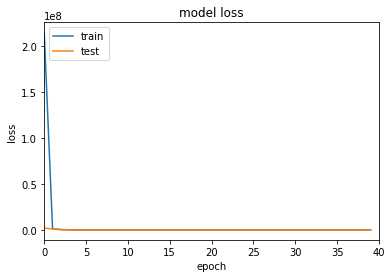

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 466.0949 - root_mean_squared_error: 21.3791 - val_loss: 444.0825 - val_root_mean_squared_error: 20.8580
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 463.9012 - root_mean_squared_error: 21.3278 - val_loss: 441.9126 - val_root_mean_squared_error: 20.8060
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 461.7134 - root_mean_squared_error: 21.2765 - val_loss: 439.7156 - val_root_mean_squared_error: 20.7532
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 459.4599 - root_mean_squared_error: 21.2236 - val_loss: 437.5151 - val_root_mean_squared_error: 20.7002
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 457.2643 - root_mean_squared_error: 21.1719 - val_loss: 435.2706 - val_root_mean_squared_error: 20.6460
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 454.9518 - root_mean_squared_error: 21.1172 - val_los

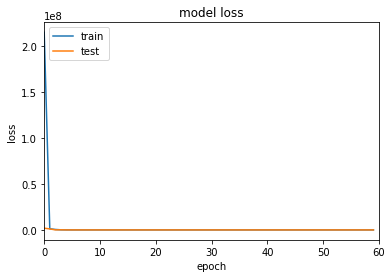

Epoch 1/20
6/6 [==============================] - 0s 30ms/step - loss: 239019856.0000 - root_mean_squared_error: 15460.2666 - val_loss: 6526708.5000 - val_root_mean_squared_error: 2554.7246
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 1139451.0000 - root_mean_squared_error: 1067.3854 - val_loss: 702.2183 - val_root_mean_squared_error: 22.1312
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 770.3214 - root_mean_squared_error: 22.7891 - val_loss: 811.9131 - val_root_mean_squared_error: 22.5512
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 863.2828 - root_mean_squared_error: 23.1262 - val_loss: 880.5065 - val_root_mean_squared_error: 22.7797
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 919.9086 - root_mean_squared_error: 23.3059 - val_loss: 920.8345 - val_root_mean_squared_error: 22.9016
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 952.5862 - root_mean_squared_error: 2

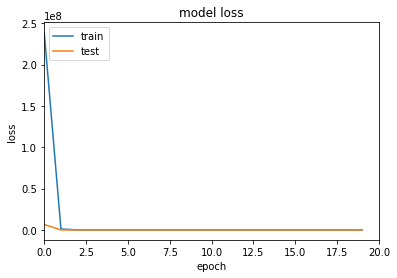

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 953.9733 - root_mean_squared_error: 23.1125 - val_loss: 930.3833 - val_root_mean_squared_error: 22.6161
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 950.7733 - root_mean_squared_error: 23.0748 - val_loss: 927.2085 - val_root_mean_squared_error: 22.5780
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 947.5867 - root_mean_squared_error: 23.0371 - val_loss: 923.9930 - val_root_mean_squared_error: 22.5387
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 944.3400 - root_mean_squared_error: 22.9978 - val_loss: 920.7613 - val_root_mean_squared_error: 22.4987
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 941.0679 - root_mean_squared_error: 22.9577 - val_loss: 917.5148 - val_root_mean_squared_error: 22.4581
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 937.7937 - root_mean_squared_error: 22.9172 - val_los

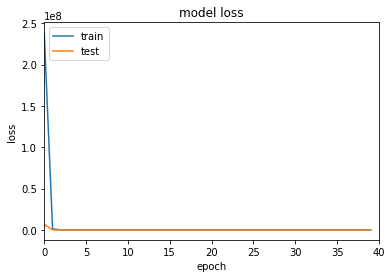

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 886.4440 - root_mean_squared_error: 22.2237 - val_loss: 863.1523 - val_root_mean_squared_error: 21.7109
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 882.9218 - root_mean_squared_error: 22.1725 - val_loss: 859.6671 - val_root_mean_squared_error: 21.6591
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 879.4438 - root_mean_squared_error: 22.1219 - val_loss: 856.1471 - val_root_mean_squared_error: 21.6062
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 875.8587 - root_mean_squared_error: 22.0684 - val_loss: 852.6572 - val_root_mean_squared_error: 21.5535
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 872.3264 - root_mean_squared_error: 22.0158 - val_loss: 849.1608 - val_root_mean_squared_error: 21.5002
Epoch 46/60
6/6 [==============================] - 0s 21ms/step - loss: 868.8341 - root_mean_squared_error: 21.9636 - val_

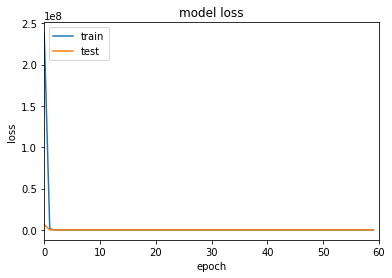

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 216487200.0000 - root_mean_squared_error: 14713.5039 - val_loss: 726991.4375 - val_root_mean_squared_error: 852.6322
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 129172.0859 - root_mean_squared_error: 359.3846 - val_loss: 483.9371 - val_root_mean_squared_error: 21.4874
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 512.5071 - root_mean_squared_error: 22.0550 - val_loss: 501.2856 - val_root_mean_squared_error: 21.6788
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 526.8360 - root_mean_squared_error: 22.2041 - val_loss: 511.4246 - val_root_mean_squared_error: 21.7785
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 535.1442 - root_mean_squared_error: 22.2823 - val_loss: 517.0361 - val_root_mean_squared_error: 21.8269
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 539.5414 - root_mean_squared_error: 22.31

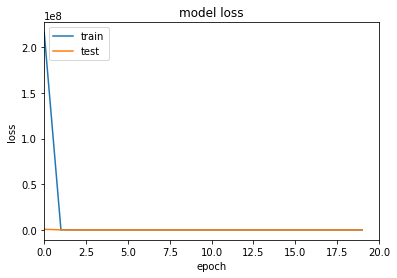

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 525.9911 - root_mean_squared_error: 21.9578 - val_loss: 503.9209 - val_root_mean_squared_error: 21.4509
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 524.2604 - root_mean_squared_error: 21.9208 - val_loss: 502.1978 - val_root_mean_squared_error: 21.4132
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 522.4911 - root_mean_squared_error: 21.8828 - val_loss: 500.4489 - val_root_mean_squared_error: 21.3748
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 520.7098 - root_mean_squared_error: 21.8445 - val_loss: 498.6620 - val_root_mean_squared_error: 21.3354
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 518.9081 - root_mean_squared_error: 21.8057 - val_loss: 496.8326 - val_root_mean_squared_error: 21.2949
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 517.0319 - root_mean_squared_error: 21.7650 - val_los

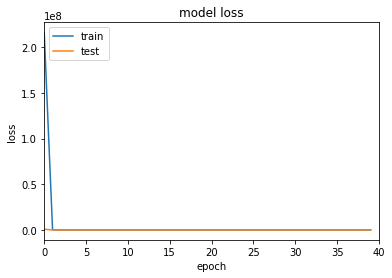

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 486.3352 - root_mean_squared_error: 21.0814 - val_loss: 464.4698 - val_root_mean_squared_error: 20.5575
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 484.1530 - root_mean_squared_error: 21.0316 - val_loss: 462.2630 - val_root_mean_squared_error: 20.5059
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 481.9025 - root_mean_squared_error: 20.9800 - val_loss: 460.0608 - val_root_mean_squared_error: 20.4541
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 479.6420 - root_mean_squared_error: 20.9281 - val_loss: 457.8530 - val_root_mean_squared_error: 20.4021
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 477.3822 - root_mean_squared_error: 20.8760 - val_loss: 455.6306 - val_root_mean_squared_error: 20.3496
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 475.1458 - root_mean_squared_error: 20.8244 - val_lo

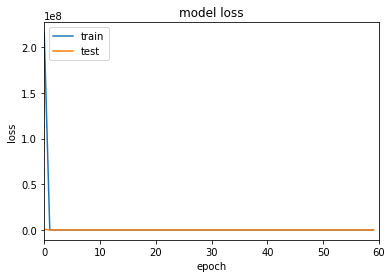

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 268600480.0000 - root_mean_squared_error: 16389.0352 - val_loss: 6073494.0000 - val_root_mean_squared_error: 2464.4456
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1421810.2500 - root_mean_squared_error: 1192.3960 - val_loss: 496.1349 - val_root_mean_squared_error: 22.2136
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 527.2831 - root_mean_squared_error: 22.8944 - val_loss: 517.6228 - val_root_mean_squared_error: 22.6695
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 544.5536 - root_mean_squared_error: 23.2499 - val_loss: 529.6218 - val_root_mean_squared_error: 22.9184
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 554.3375 - root_mean_squared_error: 23.4478 - val_loss: 536.1769 - val_root_mean_squared_error: 23.0524
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 559.5677 - root_mean_squared_error: 23

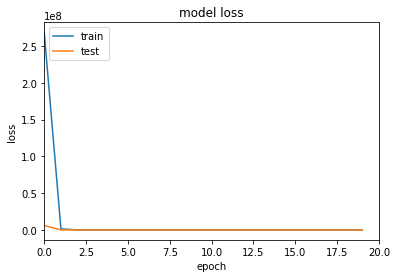

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 548.0386 - root_mean_squared_error: 23.2975 - val_loss: 525.3074 - val_root_mean_squared_error: 22.8045
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 546.3984 - root_mean_squared_error: 23.2623 - val_loss: 523.6376 - val_root_mean_squared_error: 22.7679
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 544.6868 - root_mean_squared_error: 23.2255 - val_loss: 521.9418 - val_root_mean_squared_error: 22.7306
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 542.9562 - root_mean_squared_error: 23.1883 - val_loss: 520.2022 - val_root_mean_squared_error: 22.6924
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 541.1902 - root_mean_squared_error: 23.1502 - val_loss: 518.4240 - val_root_mean_squared_error: 22.6532
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 539.3655 - root_mean_squared_error: 23.1108 - val_los

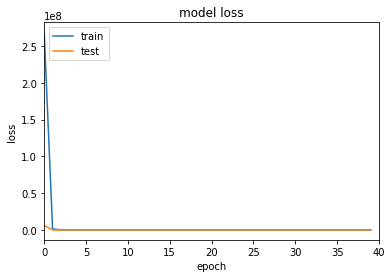

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 509.0765 - root_mean_squared_error: 22.4466 - val_loss: 486.4107 - val_root_mean_squared_error: 21.9359
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 506.8357 - root_mean_squared_error: 22.3966 - val_loss: 484.2287 - val_root_mean_squared_error: 21.8861
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 504.6087 - root_mean_squared_error: 22.3469 - val_loss: 482.0322 - val_root_mean_squared_error: 21.8359
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 502.3618 - root_mean_squared_error: 22.2966 - val_loss: 479.8133 - val_root_mean_squared_error: 21.7851
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 500.0968 - root_mean_squared_error: 22.2458 - val_loss: 477.5764 - val_root_mean_squared_error: 21.7337
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 497.8620 - root_mean_squared_error: 22.1955 - val_los

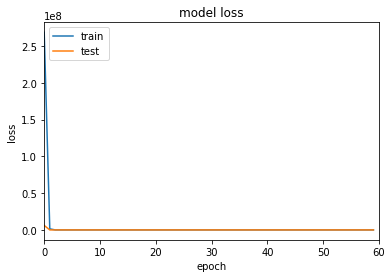

Epoch 1/20
6/6 [==============================] - 1s 35ms/step - loss: 247181792.0000 - root_mean_squared_error: 15722.0156 - val_loss: 158927.8750 - val_root_mean_squared_error: 398.6571
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 61965.8633 - root_mean_squared_error: 248.9283 - val_loss: 368.8795 - val_root_mean_squared_error: 19.1872
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 382.0681 - root_mean_squared_error: 19.5256 - val_loss: 354.1772 - val_root_mean_squared_error: 18.7948
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 370.0523 - root_mean_squared_error: 19.2111 - val_loss: 345.8674 - val_root_mean_squared_error: 18.5691
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 363.1168 - root_mean_squared_error: 19.0271 - val_loss: 340.9491 - val_root_mean_squared_error: 18.4343
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 358.9667 - root_mean_squared_error: 18.9162

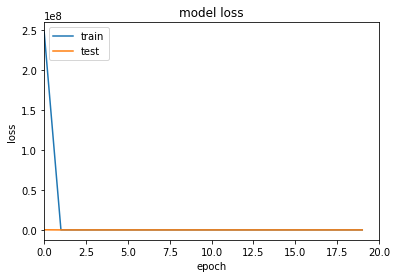

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 342.5387 - root_mean_squared_error: 18.4753 - val_loss: 322.8397 - val_root_mean_squared_error: 17.9342
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 341.5465 - root_mean_squared_error: 18.4484 - val_loss: 321.8485 - val_root_mean_squared_error: 17.9066
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 340.5257 - root_mean_squared_error: 18.4208 - val_loss: 320.8391 - val_root_mean_squared_error: 17.8784
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 339.5022 - root_mean_squared_error: 18.3930 - val_loss: 319.8044 - val_root_mean_squared_error: 17.8495
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 338.4364 - root_mean_squared_error: 18.3640 - val_loss: 318.7600 - val_root_mean_squared_error: 17.8203
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 337.3911 - root_mean_squared_error: 18.3356 - val_lo

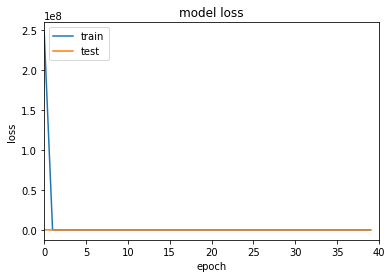

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 319.4089 - root_mean_squared_error: 17.8389 - val_loss: 299.8807 - val_root_mean_squared_error: 17.2829
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 318.1031 - root_mean_squared_error: 17.8023 - val_loss: 298.5878 - val_root_mean_squared_error: 17.2455
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 316.8056 - root_mean_squared_error: 17.7659 - val_loss: 297.2779 - val_root_mean_squared_error: 17.2075
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 315.4494 - root_mean_squared_error: 17.7277 - val_loss: 295.9827 - val_root_mean_squared_error: 17.1699
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 314.1415 - root_mean_squared_error: 17.6908 - val_loss: 294.6674 - val_root_mean_squared_error: 17.1315
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 312.7890 - root_mean_squared_error: 17.6525 - val_

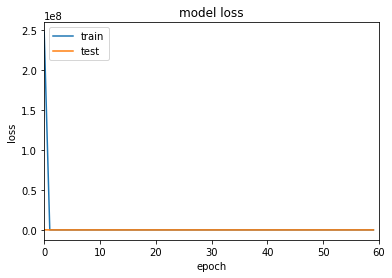

Epoch 1/20
6/6 [==============================] - 1s 31ms/step - loss: 205397696.0000 - root_mean_squared_error: 14331.7002 - val_loss: 4731151.5000 - val_root_mean_squared_error: 2175.0989
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1261134.2500 - root_mean_squared_error: 1122.9379 - val_loss: 625.6570 - val_root_mean_squared_error: 20.2915
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 675.3962 - root_mean_squared_error: 20.6506 - val_loss: 694.7064 - val_root_mean_squared_error: 19.9797
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 733.0413 - root_mean_squared_error: 20.4026 - val_loss: 735.9799 - val_root_mean_squared_error: 19.7977
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 765.8123 - root_mean_squared_error: 20.2523 - val_loss: 757.5999 - val_root_mean_squared_error: 19.6864
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 782.0733 - root_mean_squared_error: 20

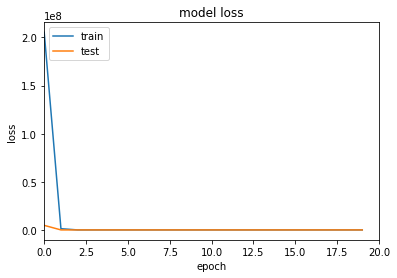

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 714.0549 - root_mean_squared_error: 19.6814 - val_loss: 691.2461 - val_root_mean_squared_error: 19.1526
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 709.1224 - root_mean_squared_error: 19.6496 - val_loss: 686.4053 - val_root_mean_squared_error: 19.1192
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 704.3121 - root_mean_squared_error: 19.6160 - val_loss: 681.7449 - val_root_mean_squared_error: 19.0856
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 699.6979 - root_mean_squared_error: 19.5826 - val_loss: 677.2327 - val_root_mean_squared_error: 19.0511
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 695.2283 - root_mean_squared_error: 19.5484 - val_loss: 672.8563 - val_root_mean_squared_error: 19.0157
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 690.8808 - root_mean_squared_error: 19.5130 - val_lo

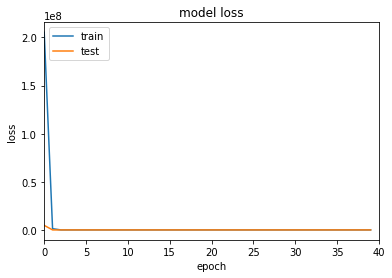

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 638.3508 - root_mean_squared_error: 18.9176 - val_loss: 617.2228 - val_root_mean_squared_error: 18.3718
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 635.4406 - root_mean_squared_error: 18.8739 - val_loss: 614.3572 - val_root_mean_squared_error: 18.3270
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 632.5620 - root_mean_squared_error: 18.8293 - val_loss: 611.5422 - val_root_mean_squared_error: 18.2819
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 629.7383 - root_mean_squared_error: 18.7845 - val_loss: 608.7782 - val_root_mean_squared_error: 18.2364
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 626.9815 - root_mean_squared_error: 18.7399 - val_loss: 606.0409 - val_root_mean_squared_error: 18.1901
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 624.2130 - root_mean_squared_error: 18.6935 - val_lo

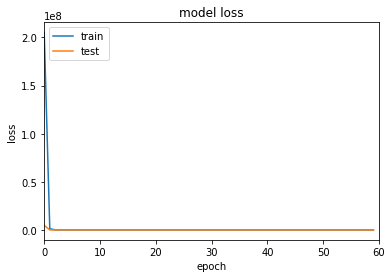

Epoch 1/20
6/6 [==============================] - 0s 30ms/step - loss: 208808144.0000 - root_mean_squared_error: 14450.1943 - val_loss: 2385223.2500 - val_root_mean_squared_error: 1544.4139
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 436410.0000 - root_mean_squared_error: 660.6030 - val_loss: 482.1006 - val_root_mean_squared_error: 21.4825
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 511.6310 - root_mean_squared_error: 22.0782 - val_loss: 501.6965 - val_root_mean_squared_error: 21.7407
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 527.8713 - root_mean_squared_error: 22.2823 - val_loss: 513.0908 - val_root_mean_squared_error: 21.8778
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 537.1732 - root_mean_squared_error: 22.3896 - val_loss: 519.4150 - val_root_mean_squared_error: 21.9473
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 542.1813 - root_mean_squared_error: 22.

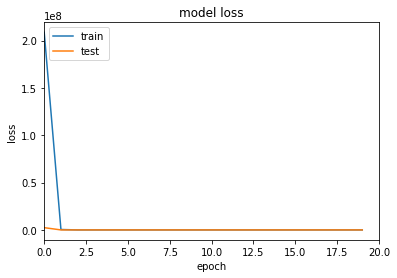

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 529.1172 - root_mean_squared_error: 22.0935 - val_loss: 506.9418 - val_root_mean_squared_error: 21.5870
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 527.3599 - root_mean_squared_error: 22.0557 - val_loss: 505.1706 - val_root_mean_squared_error: 21.5481
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 525.5306 - root_mean_squared_error: 22.0162 - val_loss: 503.3877 - val_root_mean_squared_error: 21.5087
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 523.7104 - root_mean_squared_error: 21.9768 - val_loss: 501.5660 - val_root_mean_squared_error: 21.4684
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 521.8467 - root_mean_squared_error: 21.9364 - val_loss: 499.7189 - val_root_mean_squared_error: 21.4273
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 519.9851 - root_mean_squared_error: 21.8959 - val_los

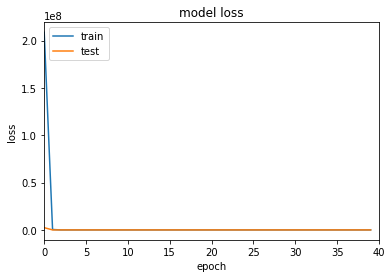

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 488.6805 - root_mean_squared_error: 21.1966 - val_loss: 466.7456 - val_root_mean_squared_error: 20.6737
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 486.4460 - root_mean_squared_error: 21.1455 - val_loss: 464.5256 - val_root_mean_squared_error: 20.6216
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 484.1884 - root_mean_squared_error: 21.0936 - val_loss: 462.2890 - val_root_mean_squared_error: 20.5690
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 481.9252 - root_mean_squared_error: 21.0415 - val_loss: 460.0252 - val_root_mean_squared_error: 20.5155
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 479.6350 - root_mean_squared_error: 20.9886 - val_loss: 457.7365 - val_root_mean_squared_error: 20.4613
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 477.3100 - root_mean_squared_error: 20.9347 - val_los

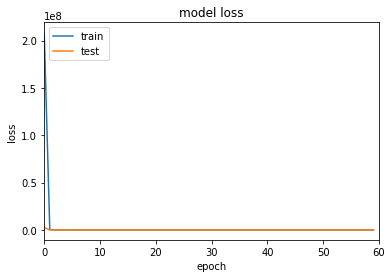

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 166529744.0000 - root_mean_squared_error: 12904.6406 - val_loss: 3293241.0000 - val_root_mean_squared_error: 1814.7286
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 789518.4375 - root_mean_squared_error: 888.5475 - val_loss: 373.3614 - val_root_mean_squared_error: 19.2591
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 384.3578 - root_mean_squared_error: 19.5320 - val_loss: 354.0990 - val_root_mean_squared_error: 18.7265
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 368.9711 - root_mean_squared_error: 19.1125 - val_loss: 343.3948 - val_root_mean_squared_error: 18.4216
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 359.9957 - root_mean_squared_error: 18.8624 - val_loss: 337.1348 - val_root_mean_squared_error: 18.2405
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 354.7203 - root_mean_squared_error: 18.

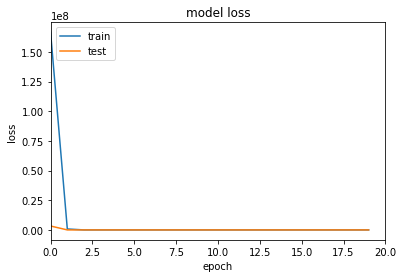

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 335.0732 - root_mean_squared_error: 18.1697 - val_loss: 315.4474 - val_root_mean_squared_error: 17.6214
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 333.9374 - root_mean_squared_error: 18.1384 - val_loss: 314.2889 - val_root_mean_squared_error: 17.5885
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 332.7584 - root_mean_squared_error: 18.1059 - val_loss: 313.1189 - val_root_mean_squared_error: 17.5552
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 331.5611 - root_mean_squared_error: 18.0729 - val_loss: 311.9350 - val_root_mean_squared_error: 17.5215
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 330.3466 - root_mean_squared_error: 18.0393 - val_loss: 310.7346 - val_root_mean_squared_error: 17.4873
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 329.1184 - root_mean_squared_error: 18.0052 - val_lo

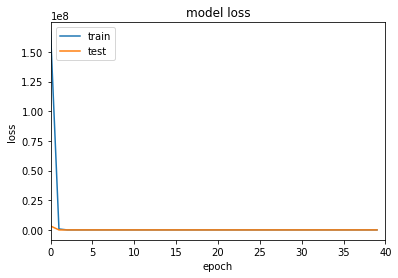

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 308.4741 - root_mean_squared_error: 17.4230 - val_loss: 289.1266 - val_root_mean_squared_error: 16.8587
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 307.0009 - root_mean_squared_error: 17.3807 - val_loss: 287.6631 - val_root_mean_squared_error: 16.8152
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 305.5338 - root_mean_squared_error: 17.3385 - val_loss: 286.1552 - val_root_mean_squared_error: 16.7704
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 304.0119 - root_mean_squared_error: 17.2946 - val_loss: 284.6499 - val_root_mean_squared_error: 16.7255
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 302.4804 - root_mean_squared_error: 17.2503 - val_loss: 283.1404 - val_root_mean_squared_error: 16.6803
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 300.9402 - root_mean_squared_error: 17.2056 - val_lo

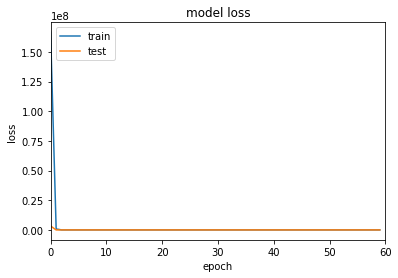

Epoch 1/20
6/6 [==============================] - 1s 30ms/step - loss: 222294624.0000 - root_mean_squared_error: 14909.5479 - val_loss: 403125.1250 - val_root_mean_squared_error: 634.9213
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 71039.0547 - root_mean_squared_error: 266.5312 - val_loss: 483.5478 - val_root_mean_squared_error: 21.9834
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 510.9137 - root_mean_squared_error: 22.5962 - val_loss: 497.1699 - val_root_mean_squared_error: 22.2887
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 521.7352 - root_mean_squared_error: 22.8325 - val_loss: 504.5451 - val_root_mean_squared_error: 22.4521
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 527.8156 - root_mean_squared_error: 22.9641 - val_loss: 508.3962 - val_root_mean_squared_error: 22.5368
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 530.8326 - root_mean_squared_error: 23.0289

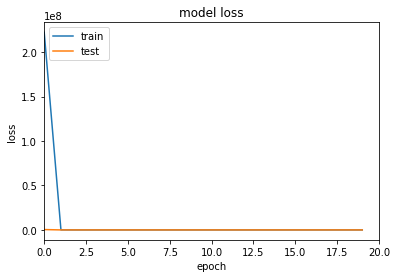

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 515.6034 - root_mean_squared_error: 22.6949 - val_loss: 493.1398 - val_root_mean_squared_error: 22.1945
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 513.8649 - root_mean_squared_error: 22.6566 - val_loss: 491.4168 - val_root_mean_squared_error: 22.1556
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 512.1172 - root_mean_squared_error: 22.6180 - val_loss: 489.6509 - val_root_mean_squared_error: 22.1157
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 510.3163 - root_mean_squared_error: 22.5781 - val_loss: 487.8475 - val_root_mean_squared_error: 22.0749
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 508.4651 - root_mean_squared_error: 22.5371 - val_loss: 486.0253 - val_root_mean_squared_error: 22.0336
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 506.6066 - root_mean_squared_error: 22.4958 - val_los

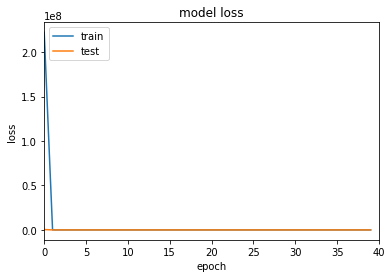

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 475.3804 - root_mean_squared_error: 21.7907 - val_loss: 453.0665 - val_root_mean_squared_error: 21.2726
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 473.0912 - root_mean_squared_error: 21.7381 - val_loss: 450.8365 - val_root_mean_squared_error: 21.2201
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 470.8196 - root_mean_squared_error: 21.6858 - val_loss: 448.5829 - val_root_mean_squared_error: 21.1669
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 468.5459 - root_mean_squared_error: 21.6333 - val_loss: 446.2980 - val_root_mean_squared_error: 21.1129
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 466.1910 - root_mean_squared_error: 21.5788 - val_loss: 444.0086 - val_root_mean_squared_error: 21.0586
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 463.8795 - root_mean_squared_error: 21.5252 - val_lo

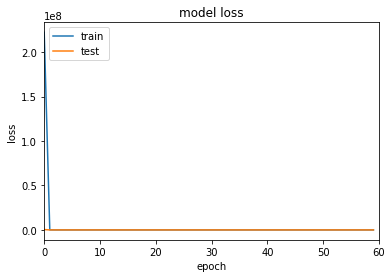

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 3265.3784 - root_mean_squared_error: 56.9021 - val_loss: 127.7050 - val_root_mean_squared_error: 8.8179
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1307.2645 - root_mean_squared_error: 35.2473 - val_loss: 8444.0645 - val_root_mean_squared_error: 91.4253
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 4278.0229 - root_mean_squared_error: 64.6698 - val_loss: 317.6477 - val_root_mean_squared_error: 14.3681
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 1244.0085 - root_mean_squared_error: 33.4542 - val_loss: 6191.4995 - val_root_mean_squared_error: 77.7340
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 3195.6709 - root_mean_squared_error: 55.0425 - val_loss: 2539.9412 - val_root_mean_squared_error: 48.4411
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 1087.0157 - root_mean_squared_error: 29.5822 - val_l

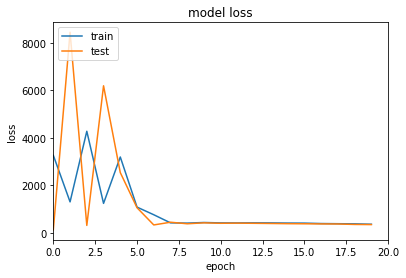

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 360.6445 - root_mean_squared_error: 9.0314 - val_loss: 342.2819 - val_root_mean_squared_error: 8.3473
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 350.0876 - root_mean_squared_error: 8.9728 - val_loss: 336.7524 - val_root_mean_squared_error: 8.4162
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 341.5559 - root_mean_squared_error: 8.8381 - val_loss: 332.1134 - val_root_mean_squared_error: 8.5255
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 345.6445 - root_mean_squared_error: 9.3950 - val_loss: 327.6657 - val_root_mean_squared_error: 8.5677
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 333.1540 - root_mean_squared_error: 9.0615 - val_loss: 312.3315 - val_root_mean_squared_error: 8.1611
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 345.6525 - root_mean_squared_error: 10.1308 - val_loss: 358.91

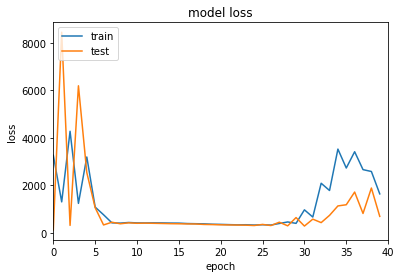

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 991.5359 - root_mean_squared_error: 26.7731 - val_loss: 1168.8159 - val_root_mean_squared_error: 29.8257
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 683.4282 - root_mean_squared_error: 20.0312 - val_loss: 404.7783 - val_root_mean_squared_error: 10.9133
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 424.7092 - root_mean_squared_error: 11.7206 - val_loss: 454.3381 - val_root_mean_squared_error: 12.8404
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 393.7998 - root_mean_squared_error: 10.1777 - val_loss: 359.2263 - val_root_mean_squared_error: 8.3008
Epoch 45/60
6/6 [==============================] - 0s 14ms/step - loss: 367.2829 - root_mean_squared_error: 8.8605 - val_loss: 350.8758 - val_root_mean_squared_error: 8.0830
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 361.0096 - root_mean_squared_error: 8.7994 - val_loss:

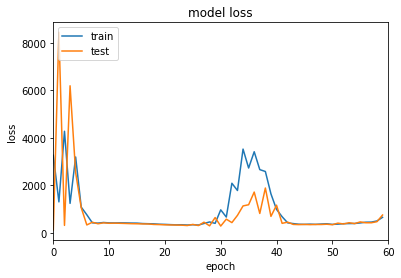

Epoch 1/20
6/6 [==============================] - 0s 30ms/step - loss: 2977.6152 - root_mean_squared_error: 54.4050 - val_loss: 1335.3702 - val_root_mean_squared_error: 36.1156
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1438.9775 - root_mean_squared_error: 37.4730 - val_loss: 1934.6254 - val_root_mean_squared_error: 43.4878
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1663.8457 - root_mean_squared_error: 40.1736 - val_loss: 1085.9211 - val_root_mean_squared_error: 32.0429
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 1335.1434 - root_mean_squared_error: 35.6555 - val_loss: 1213.7010 - val_root_mean_squared_error: 33.8074
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 579.8156 - root_mean_squared_error: 22.4688 - val_loss: 204.4182 - val_root_mean_squared_error: 11.0961
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 180.7139 - root_mean_squared_error: 9.7892 - val_l

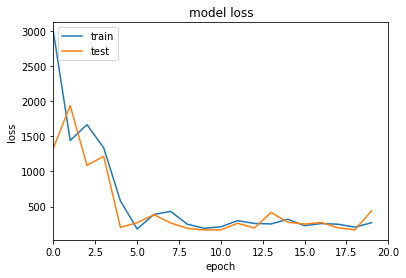

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 318.1484 - root_mean_squared_error: 14.7266 - val_loss: 192.9730 - val_root_mean_squared_error: 9.5245
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 197.8726 - root_mean_squared_error: 9.7464 - val_loss: 418.6913 - val_root_mean_squared_error: 17.7487
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 408.1226 - root_mean_squared_error: 17.4364 - val_loss: 265.5528 - val_root_mean_squared_error: 12.6743
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 381.6997 - root_mean_squared_error: 16.6283 - val_loss: 194.6510 - val_root_mean_squared_error: 9.4437
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 260.7810 - root_mean_squared_error: 12.4440 - val_loss: 196.6719 - val_root_mean_squared_error: 9.4493
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 397.8651 - root_mean_squared_error: 17.0148 - val_loss: 2

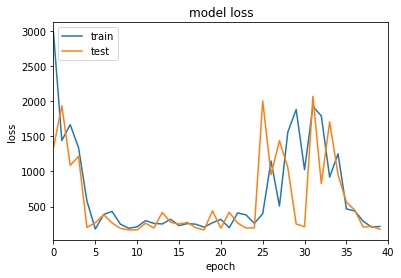

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 188.9024 - root_mean_squared_error: 8.7979 - val_loss: 177.8211 - val_root_mean_squared_error: 8.2049
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 186.2353 - root_mean_squared_error: 8.7444 - val_loss: 174.4982 - val_root_mean_squared_error: 8.1098
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 186.8932 - root_mean_squared_error: 8.8752 - val_loss: 173.3149 - val_root_mean_squared_error: 8.1330
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 184.8282 - root_mean_squared_error: 8.8522 - val_loss: 171.3292 - val_root_mean_squared_error: 8.1169
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 182.8293 - root_mean_squared_error: 8.8264 - val_loss: 170.3499 - val_root_mean_squared_error: 8.1112
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 187.7657 - root_mean_squared_error: 9.1151 - val_loss: 315.2737

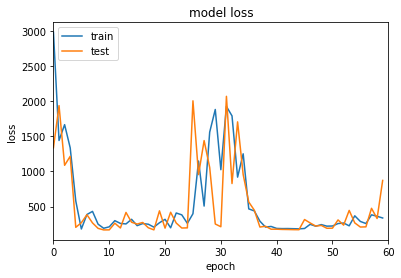

Epoch 1/20
6/6 [==============================] - 1s 30ms/step - loss: 3118.8123 - root_mean_squared_error: 55.7048 - val_loss: 2344.8242 - val_root_mean_squared_error: 48.1740
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 739.0554 - root_mean_squared_error: 26.6753 - val_loss: 5232.0220 - val_root_mean_squared_error: 72.1174
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1420.7284 - root_mean_squared_error: 37.2071 - val_loss: 448.3916 - val_root_mean_squared_error: 20.1079
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 541.1450 - root_mean_squared_error: 22.1904 - val_loss: 218.3527 - val_root_mean_squared_error: 12.7891
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 398.6838 - root_mean_squared_error: 18.4580 - val_loss: 176.0163 - val_root_mean_squared_error: 10.6492
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 298.4434 - root_mean_squared_error: 15.2737 - val_loss:

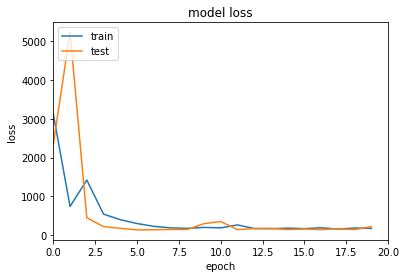

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 190.5587 - root_mean_squared_error: 10.8474 - val_loss: 141.4068 - val_root_mean_squared_error: 8.3176
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 167.6764 - root_mean_squared_error: 9.7945 - val_loss: 136.8920 - val_root_mean_squared_error: 8.1204
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 157.7651 - root_mean_squared_error: 9.3479 - val_loss: 156.4491 - val_root_mean_squared_error: 9.3250
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 153.7060 - root_mean_squared_error: 9.2093 - val_loss: 165.5798 - val_root_mean_squared_error: 9.8701
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 158.4372 - root_mean_squared_error: 9.5120 - val_loss: 142.4436 - val_root_mean_squared_error: 8.6568
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 146.8491 - root_mean_squared_error: 8.9298 - val_loss: 134.1

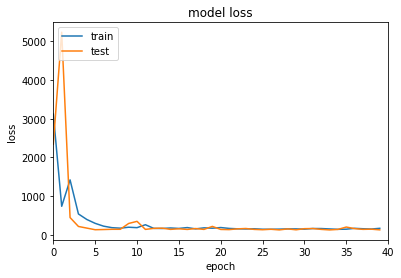

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 152.9096 - root_mean_squared_error: 9.3509 - val_loss: 131.0345 - val_root_mean_squared_error: 8.1105
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 165.7946 - root_mean_squared_error: 10.0276 - val_loss: 155.2558 - val_root_mean_squared_error: 9.4852
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 176.5813 - root_mean_squared_error: 10.5539 - val_loss: 158.0506 - val_root_mean_squared_error: 9.6442
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 157.2735 - root_mean_squared_error: 9.6059 - val_loss: 136.4726 - val_root_mean_squared_error: 8.4637
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 170.5238 - root_mean_squared_error: 10.2916 - val_loss: 131.7093 - val_root_mean_squared_error: 8.2167
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 157.4396 - root_mean_squared_error: 9.6725 - val_loss: 131.

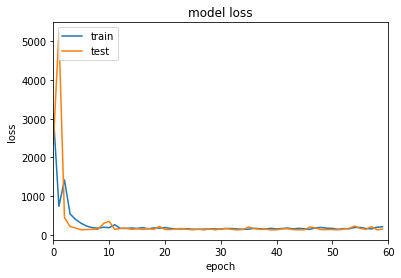

Epoch 1/20
6/6 [==============================] - 1s 97ms/step - loss: 2928.9919 - root_mean_squared_error: 53.9816 - val_loss: 2035.2225 - val_root_mean_squared_error: 44.8710
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 944.7562 - root_mean_squared_error: 30.3097 - val_loss: 927.4555 - val_root_mean_squared_error: 29.9110
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 514.1271 - root_mean_squared_error: 21.8145 - val_loss: 412.8279 - val_root_mean_squared_error: 19.1463
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 206.8185 - root_mean_squared_error: 12.5087 - val_loss: 116.6732 - val_root_mean_squared_error: 7.7974
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 204.8713 - root_mean_squared_error: 12.0976 - val_loss: 188.9195 - val_root_mean_squared_error: 11.2626
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 185.1493 - root_mean_squared_error: 11.0062 - val_loss: 4

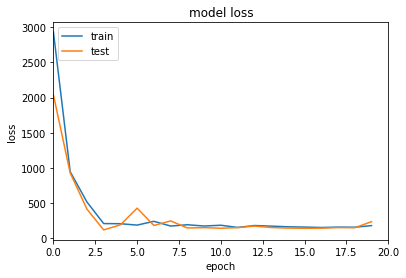

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 202.0316 - root_mean_squared_error: 11.3932 - val_loss: 182.7104 - val_root_mean_squared_error: 10.5121
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 170.4545 - root_mean_squared_error: 9.9217 - val_loss: 175.4472 - val_root_mean_squared_error: 10.1816
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 163.0579 - root_mean_squared_error: 9.5381 - val_loss: 147.8174 - val_root_mean_squared_error: 8.6866
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 156.3838 - root_mean_squared_error: 9.1677 - val_loss: 138.8868 - val_root_mean_squared_error: 8.1661
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 166.6024 - root_mean_squared_error: 9.7061 - val_loss: 147.7737 - val_root_mean_squared_error: 8.6287
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 166.0239 - root_mean_squared_error: 9.5832 - val_loss: 141.

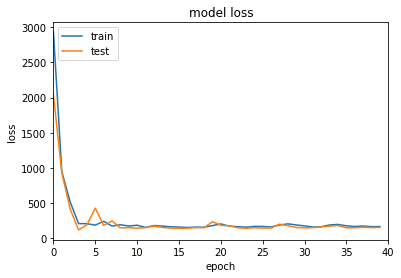

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 164.6448 - root_mean_squared_error: 9.1518 - val_loss: 166.7657 - val_root_mean_squared_error: 9.2661
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 162.5080 - root_mean_squared_error: 9.0409 - val_loss: 154.1849 - val_root_mean_squared_error: 8.5848
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 162.0539 - root_mean_squared_error: 9.0313 - val_loss: 152.9582 - val_root_mean_squared_error: 8.5085
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 166.6915 - root_mean_squared_error: 9.2832 - val_loss: 163.7203 - val_root_mean_squared_error: 9.1326
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 169.1923 - root_mean_squared_error: 9.4380 - val_loss: 149.6287 - val_root_mean_squared_error: 8.3591
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 164.8945 - root_mean_squared_error: 9.2420 - val_loss: 151.3553

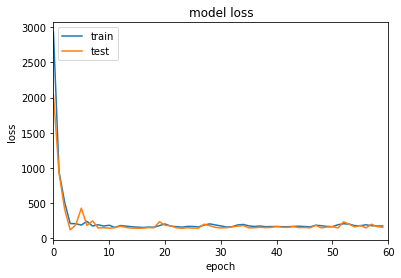

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 2200.7708 - root_mean_squared_error: 46.6484 - val_loss: 635.2190 - val_root_mean_squared_error: 24.0829
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 1846.3741 - root_mean_squared_error: 42.1098 - val_loss: 2880.7891 - val_root_mean_squared_error: 52.7675
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1277.8401 - root_mean_squared_error: 34.1198 - val_loss: 1212.8810 - val_root_mean_squared_error: 32.7478
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 843.1793 - root_mean_squared_error: 26.1719 - val_loss: 605.6670 - val_root_mean_squared_error: 20.4856
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 396.3930 - root_mean_squared_error: 13.8779 - val_loss: 317.4096 - val_root_mean_squared_error: 9.3316
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 345.0160 - root_mean_squared_error: 9.9999 - val_loss:

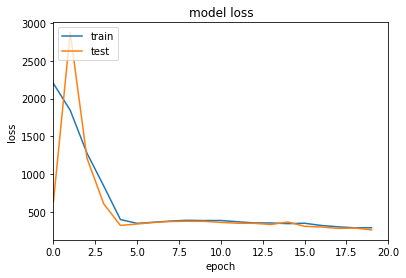

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 270.9172 - root_mean_squared_error: 9.0844 - val_loss: 248.1195 - val_root_mean_squared_error: 8.1505
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 261.5887 - root_mean_squared_error: 9.1467 - val_loss: 244.0677 - val_root_mean_squared_error: 8.4313
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 250.8786 - root_mean_squared_error: 8.9377 - val_loss: 233.1812 - val_root_mean_squared_error: 8.0810
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 243.7935 - root_mean_squared_error: 8.8456 - val_loss: 228.0276 - val_root_mean_squared_error: 8.0816
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 243.6366 - root_mean_squared_error: 9.0431 - val_loss: 243.7609 - val_root_mean_squared_error: 9.1109
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 254.1807 - root_mean_squared_error: 9.7236 - val_loss: 249.4

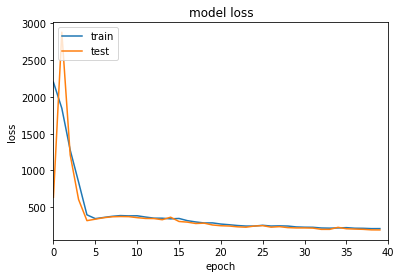

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 209.9035 - root_mean_squared_error: 9.0396 - val_loss: 210.7579 - val_root_mean_squared_error: 8.8796
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 221.6326 - root_mean_squared_error: 9.3984 - val_loss: 221.3589 - val_root_mean_squared_error: 9.3340
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 218.0746 - root_mean_squared_error: 9.2022 - val_loss: 199.3340 - val_root_mean_squared_error: 8.2567
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 220.0947 - root_mean_squared_error: 9.5238 - val_loss: 197.0276 - val_root_mean_squared_error: 8.3005
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 212.8150 - root_mean_squared_error: 9.1631 - val_loss: 201.8788 - val_root_mean_squared_error: 8.4931
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 207.4986 - root_mean_squared_error: 8.8047 - val_loss: 197.29

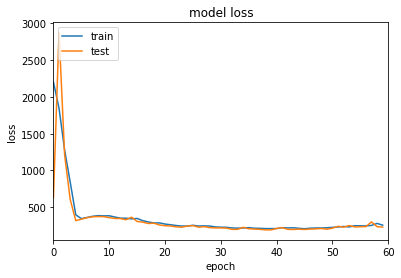

Epoch 1/20
6/6 [==============================] - 1s 31ms/step - loss: 2375.0557 - root_mean_squared_error: 48.6968 - val_loss: 165.5759 - val_root_mean_squared_error: 12.5636
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 1491.6854 - root_mean_squared_error: 38.4881 - val_loss: 7480.2246 - val_root_mean_squared_error: 86.4069
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 5570.9819 - root_mean_squared_error: 74.5322 - val_loss: 1037.8105 - val_root_mean_squared_error: 31.9270
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 1666.9817 - root_mean_squared_error: 40.5858 - val_loss: 9526.5723 - val_root_mean_squared_error: 97.4932
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 4652.0386 - root_mean_squared_error: 68.0381 - val_loss: 2955.4275 - val_root_mean_squared_error: 54.1339
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 749.0468 - root_mean_squared_error: 26.8804 - va

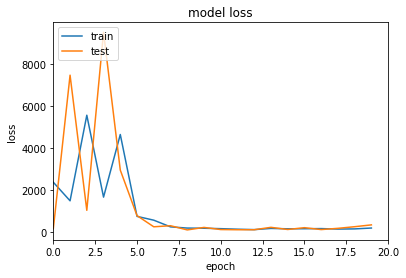

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 225.1001 - root_mean_squared_error: 13.8471 - val_loss: 172.4028 - val_root_mean_squared_error: 11.7948
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 201.5777 - root_mean_squared_error: 12.9740 - val_loss: 471.9358 - val_root_mean_squared_error: 20.9477
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 279.3767 - root_mean_squared_error: 15.6986 - val_loss: 181.8670 - val_root_mean_squared_error: 12.2190
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 233.0044 - root_mean_squared_error: 14.1652 - val_loss: 593.2960 - val_root_mean_squared_error: 23.6918
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 368.7594 - root_mean_squared_error: 18.3587 - val_loss: 98.6324 - val_root_mean_squared_error: 8.1991
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 153.9388 - root_mean_squared_error: 11.0702 - val_loss

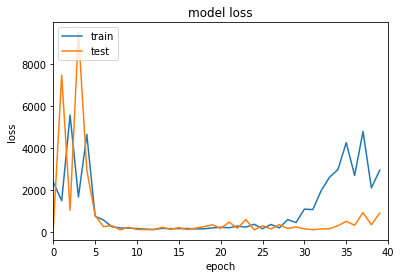

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 855.1610 - root_mean_squared_error: 28.6186 - val_loss: 125.9737 - val_root_mean_squared_error: 9.4107
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 1271.5414 - root_mean_squared_error: 35.1202 - val_loss: 704.9426 - val_root_mean_squared_error: 25.8069
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 470.2054 - root_mean_squared_error: 20.7621 - val_loss: 133.9158 - val_root_mean_squared_error: 9.7308
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 454.8276 - root_mean_squared_error: 20.3881 - val_loss: 596.5413 - val_root_mean_squared_error: 23.6139
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 337.4452 - root_mean_squared_error: 17.2865 - val_loss: 152.3341 - val_root_mean_squared_error: 10.6884
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 215.8671 - root_mean_squared_error: 13.3411 - val_l

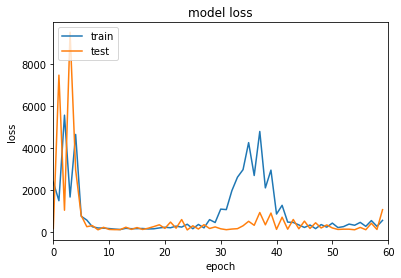

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 2789.4084 - root_mean_squared_error: 52.7979 - val_loss: 1124.0663 - val_root_mean_squared_error: 33.4803
Epoch 2/20
6/6 [==============================] - 0s 16ms/step - loss: 956.6096 - root_mean_squared_error: 30.8713 - val_loss: 4314.9883 - val_root_mean_squared_error: 65.6535
Epoch 3/20
6/6 [==============================] - 0s 18ms/step - loss: 2823.4109 - root_mean_squared_error: 53.0863 - val_loss: 7258.5146 - val_root_mean_squared_error: 85.1611
Epoch 4/20
6/6 [==============================] - 0s 14ms/step - loss: 2395.6987 - root_mean_squared_error: 48.8787 - val_loss: 1353.7056 - val_root_mean_squared_error: 36.6933
Epoch 5/20
6/6 [==============================] - 0s 17ms/step - loss: 589.6535 - root_mean_squared_error: 24.1216 - val_loss: 310.5791 - val_root_mean_squared_error: 17.3789
Epoch 6/20
6/6 [==============================] - 0s 13ms/step - loss: 198.8318 - root_mean_squared_error: 13.7773 - v

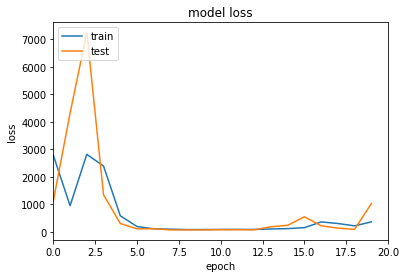

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 673.1104 - root_mean_squared_error: 25.6980 - val_loss: 672.8960 - val_root_mean_squared_error: 25.6910
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 290.6571 - root_mean_squared_error: 16.6644 - val_loss: 691.6407 - val_root_mean_squared_error: 26.0489
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 581.3286 - root_mean_squared_error: 23.8360 - val_loss: 562.9762 - val_root_mean_squared_error: 23.4459
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 676.2936 - root_mean_squared_error: 25.7489 - val_loss: 95.6874 - val_root_mean_squared_error: 9.0768
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 365.0134 - root_mean_squared_error: 18.7536 - val_loss: 78.7377 - val_root_mean_squared_error: 8.0793
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 538.7445 - root_mean_squared_error: 22.9164 - val_loss:

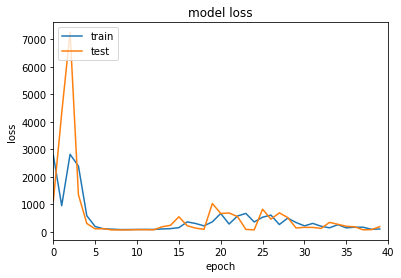

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 186.8230 - root_mean_squared_error: 13.1784 - val_loss: 123.9674 - val_root_mean_squared_error: 10.5276
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 122.2997 - root_mean_squared_error: 10.4463 - val_loss: 83.0677 - val_root_mean_squared_error: 8.3557
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 103.3562 - root_mean_squared_error: 9.4892 - val_loss: 78.9519 - val_root_mean_squared_error: 8.0973
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 154.0632 - root_mean_squared_error: 11.8600 - val_loss: 367.5640 - val_root_mean_squared_error: 18.8187
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 237.0612 - root_mean_squared_error: 14.9547 - val_loss: 231.6836 - val_root_mean_squared_error: 14.7743
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 129.9989 - root_mean_squared_error: 10.7992 - val_loss:

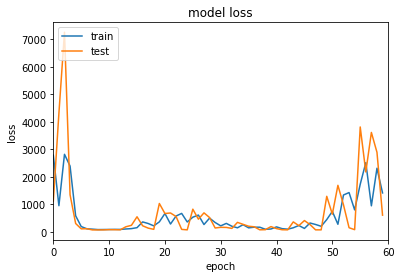

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 3422.0686 - root_mean_squared_error: 58.4848 - val_loss: 2219.5845 - val_root_mean_squared_error: 47.0866
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 1135.4415 - root_mean_squared_error: 33.6533 - val_loss: 4301.5107 - val_root_mean_squared_error: 65.5588
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 1203.0455 - root_mean_squared_error: 34.6238 - val_loss: 784.8326 - val_root_mean_squared_error: 27.9218
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 385.9328 - root_mean_squared_error: 19.4990 - val_loss: 498.3715 - val_root_mean_squared_error: 22.1789
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 232.0938 - root_mean_squared_error: 15.0075 - val_loss: 273.2121 - val_root_mean_squared_error: 16.3044
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 147.0181 - root_mean_squared_error: 11.8074 - val_lo

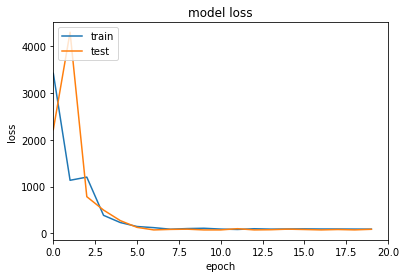

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 102.3506 - root_mean_squared_error: 9.6724 - val_loss: 118.4070 - val_root_mean_squared_error: 10.4697
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 101.3887 - root_mean_squared_error: 9.6230 - val_loss: 74.0567 - val_root_mean_squared_error: 8.0800
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 89.7753 - root_mean_squared_error: 9.0009 - val_loss: 76.5671 - val_root_mean_squared_error: 8.2349
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 91.6486 - root_mean_squared_error: 9.1040 - val_loss: 89.2647 - val_root_mean_squared_error: 8.9704
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 126.7288 - root_mean_squared_error: 10.8591 - val_loss: 107.5770 - val_root_mean_squared_error: 9.9364
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 104.3526 - root_mean_squared_error: 9.7716 - val_loss: 79.3153 -

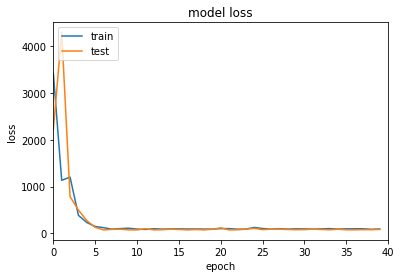

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 93.1307 - root_mean_squared_error: 9.1731 - val_loss: 85.0939 - val_root_mean_squared_error: 8.7233
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 94.2492 - root_mean_squared_error: 9.2334 - val_loss: 81.4373 - val_root_mean_squared_error: 8.5121
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 94.7488 - root_mean_squared_error: 9.2619 - val_loss: 96.5280 - val_root_mean_squared_error: 9.3591
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 102.1583 - root_mean_squared_error: 9.6545 - val_loss: 85.1162 - val_root_mean_squared_error: 8.7253
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 91.0236 - root_mean_squared_error: 9.0569 - val_loss: 74.3613 - val_root_mean_squared_error: 8.0837
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 86.6176 - root_mean_squared_error: 8.8088 - val_loss: 74.3704 - val

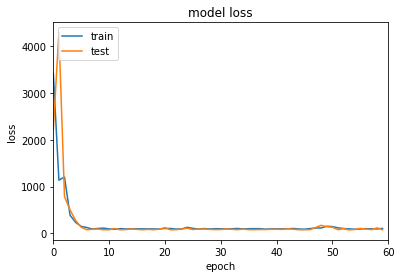

Epoch 1/20
6/6 [==============================] - 0s 30ms/step - loss: 1497.8420 - root_mean_squared_error: 38.3955 - val_loss: 934.0767 - val_root_mean_squared_error: 29.6634
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1448.0906 - root_mean_squared_error: 37.1062 - val_loss: 215.9248 - val_root_mean_squared_error: 11.1303
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 347.8891 - root_mean_squared_error: 15.6087 - val_loss: 479.2154 - val_root_mean_squared_error: 18.8878
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 464.4453 - root_mean_squared_error: 18.1119 - val_loss: 250.0680 - val_root_mean_squared_error: 9.6013
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 343.0511 - root_mean_squared_error: 13.1111 - val_loss: 400.6605 - val_root_mean_squared_error: 14.4789
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 359.5547 - root_mean_squared_error: 12.5321 - val_loss: 2

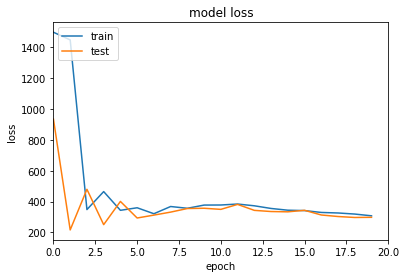

Epoch 21/40
6/6 [==============================] - 0s 47ms/step - loss: 299.4347 - root_mean_squared_error: 9.0688 - val_loss: 280.0700 - val_root_mean_squared_error: 8.3010
Epoch 22/40
6/6 [==============================] - 0s 24ms/step - loss: 291.7039 - root_mean_squared_error: 9.1417 - val_loss: 294.6854 - val_root_mean_squared_error: 9.5216
Epoch 23/40
6/6 [==============================] - 0s 19ms/step - loss: 285.1431 - root_mean_squared_error: 9.1423 - val_loss: 263.0606 - val_root_mean_squared_error: 8.0901
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 276.5596 - root_mean_squared_error: 9.0381 - val_loss: 260.1835 - val_root_mean_squared_error: 8.3493
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 271.4931 - root_mean_squared_error: 9.1615 - val_loss: 254.8951 - val_root_mean_squared_error: 8.4720
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 260.6298 - root_mean_squared_error: 8.9563 - val_loss: 246.

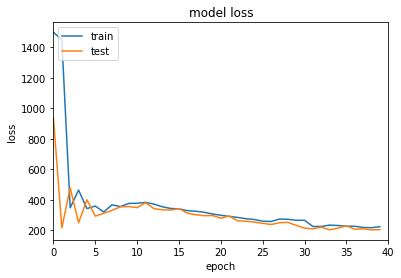

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 224.2793 - root_mean_squared_error: 9.1818 - val_loss: 248.0981 - val_root_mean_squared_error: 10.4261
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 254.1904 - root_mean_squared_error: 10.7479 - val_loss: 264.5255 - val_root_mean_squared_error: 11.2052
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 243.5104 - root_mean_squared_error: 10.1314 - val_loss: 358.0525 - val_root_mean_squared_error: 14.6390
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 272.6763 - root_mean_squared_error: 11.2705 - val_loss: 223.8160 - val_root_mean_squared_error: 8.7055
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 230.4125 - root_mean_squared_error: 9.0576 - val_loss: 213.9745 - val_root_mean_squared_error: 8.1366
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 224.8860 - root_mean_squared_error: 8.8592 - val_loss

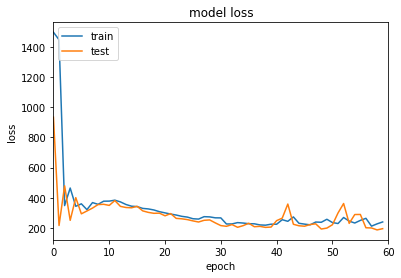

Epoch 1/20
6/6 [==============================] - 1s 30ms/step - loss: 1368.9854 - root_mean_squared_error: 36.9605 - val_loss: 1288.3810 - val_root_mean_squared_error: 35.7948
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 4279.9468 - root_mean_squared_error: 65.3478 - val_loss: 933.8206 - val_root_mean_squared_error: 30.3469
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 862.5398 - root_mean_squared_error: 29.1148 - val_loss: 135.4610 - val_root_mean_squared_error: 10.8481
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 414.5285 - root_mean_squared_error: 19.8648 - val_loss: 133.2592 - val_root_mean_squared_error: 10.4915
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 203.7857 - root_mean_squared_error: 13.3695 - val_loss: 91.8401 - val_root_mean_squared_error: 8.0004
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 122.5701 - root_mean_squared_error: 9.6496 - val_loss: 

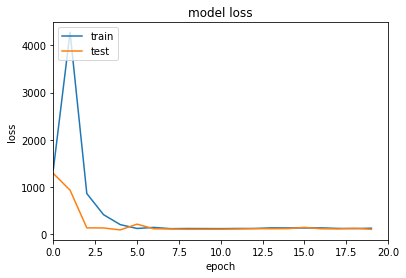

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 129.7502 - root_mean_squared_error: 9.6412 - val_loss: 141.1344 - val_root_mean_squared_error: 10.2325
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 133.8257 - root_mean_squared_error: 9.8781 - val_loss: 137.5277 - val_root_mean_squared_error: 10.0772
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 130.2718 - root_mean_squared_error: 9.7140 - val_loss: 103.3699 - val_root_mean_squared_error: 8.2178
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 128.9323 - root_mean_squared_error: 9.6486 - val_loss: 103.0498 - val_root_mean_squared_error: 8.1920
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 117.6390 - root_mean_squared_error: 9.0344 - val_loss: 114.5862 - val_root_mean_squared_error: 8.8601
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 115.2924 - root_mean_squared_error: 8.9020 - val_loss: 101.3

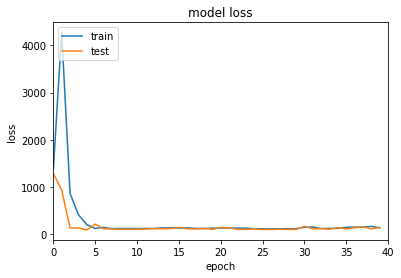

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 125.5363 - root_mean_squared_error: 9.5650 - val_loss: 99.1830 - val_root_mean_squared_error: 8.0807
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 115.8422 - root_mean_squared_error: 9.0606 - val_loss: 119.4167 - val_root_mean_squared_error: 9.2679
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 134.8580 - root_mean_squared_error: 10.0742 - val_loss: 106.0298 - val_root_mean_squared_error: 8.5384
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 123.7654 - root_mean_squared_error: 9.5260 - val_loss: 101.3481 - val_root_mean_squared_error: 8.2614
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 118.0001 - root_mean_squared_error: 9.2034 - val_loss: 98.9638 - val_root_mean_squared_error: 8.0863
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 119.3102 - root_mean_squared_error: 9.2537 - val_loss: 120.3107

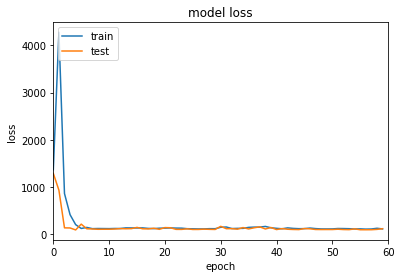

Epoch 1/20
6/6 [==============================] - 1s 31ms/step - loss: 2173.9563 - root_mean_squared_error: 46.6217 - val_loss: 146.6538 - val_root_mean_squared_error: 12.0781
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1118.3955 - root_mean_squared_error: 33.4275 - val_loss: 6420.8135 - val_root_mean_squared_error: 80.1219
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 4937.2896 - root_mean_squared_error: 70.2556 - val_loss: 850.3265 - val_root_mean_squared_error: 29.1320
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 1414.6600 - root_mean_squared_error: 37.5881 - val_loss: 9777.1963 - val_root_mean_squared_error: 98.8694
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 3882.0208 - root_mean_squared_error: 62.2881 - val_loss: 2571.0659 - val_root_mean_squared_error: 50.6811
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 808.4311 - root_mean_squared_error: 28.3862 - val

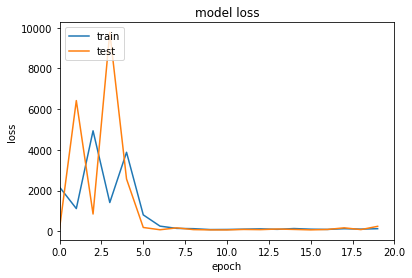

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 169.6113 - root_mean_squared_error: 12.8373 - val_loss: 75.1995 - val_root_mean_squared_error: 8.3874
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 115.1104 - root_mean_squared_error: 10.4982 - val_loss: 71.2457 - val_root_mean_squared_error: 8.1400
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 103.3603 - root_mean_squared_error: 9.9159 - val_loss: 70.9668 - val_root_mean_squared_error: 8.1158
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 193.7738 - root_mean_squared_error: 13.7337 - val_loss: 369.2788 - val_root_mean_squared_error: 19.0797
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 294.3670 - root_mean_squared_error: 17.0026 - val_loss: 83.9261 - val_root_mean_squared_error: 8.8660
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 155.1840 - root_mean_squared_error: 12.2414 - val_loss: 193

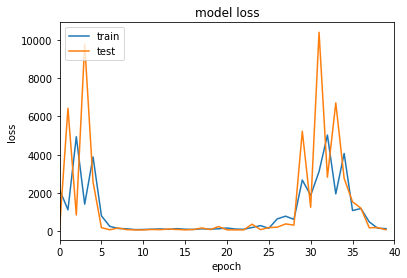

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 84.3632 - root_mean_squared_error: 8.8429 - val_loss: 74.2570 - val_root_mean_squared_error: 8.2532
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 87.7782 - root_mean_squared_error: 9.0359 - val_loss: 73.4471 - val_root_mean_squared_error: 8.2059
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 110.1711 - root_mean_squared_error: 10.2007 - val_loss: 105.1944 - val_root_mean_squared_error: 9.9524
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 105.8714 - root_mean_squared_error: 9.9851 - val_loss: 71.7372 - val_root_mean_squared_error: 8.0956
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 112.2363 - root_mean_squared_error: 10.2971 - val_loss: 119.7784 - val_root_mean_squared_error: 10.6568
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 136.7407 - root_mean_squared_error: 11.4249 - val_loss: 134.689

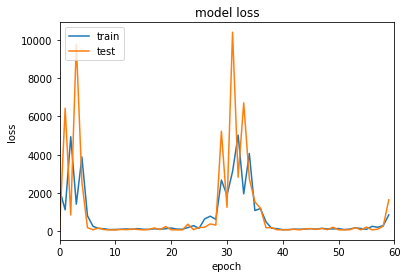

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 2079.9255 - root_mean_squared_error: 45.6038 - val_loss: 919.5359 - val_root_mean_squared_error: 30.3171
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 948.6691 - root_mean_squared_error: 30.7929 - val_loss: 1735.7272 - val_root_mean_squared_error: 41.6552
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 3147.4075 - root_mean_squared_error: 56.0961 - val_loss: 2657.1646 - val_root_mean_squared_error: 51.5406
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 2624.6550 - root_mean_squared_error: 51.2238 - val_loss: 244.0476 - val_root_mean_squared_error: 15.5951
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 481.9304 - root_mean_squared_error: 21.9329 - val_loss: 783.6869 - val_root_mean_squared_error: 27.9777
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 425.5741 - root_mean_squared_error: 20.6060 - val_lo

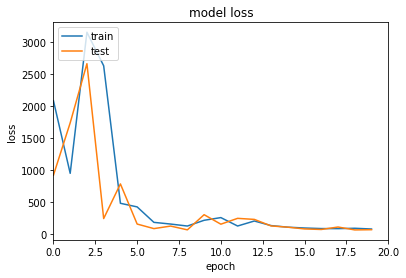

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 91.2702 - root_mean_squared_error: 9.4844 - val_loss: 66.5791 - val_root_mean_squared_error: 8.0785
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 122.9022 - root_mean_squared_error: 11.0267 - val_loss: 106.6367 - val_root_mean_squared_error: 10.2627
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 97.9537 - root_mean_squared_error: 9.8305 - val_loss: 79.0266 - val_root_mean_squared_error: 8.8156
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 145.4923 - root_mean_squared_error: 12.0076 - val_loss: 439.6191 - val_root_mean_squared_error: 20.9360
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 268.1906 - root_mean_squared_error: 16.3368 - val_loss: 179.2486 - val_root_mean_squared_error: 13.3400
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 112.9021 - root_mean_squared_error: 10.5648 - val_loss: 588.4

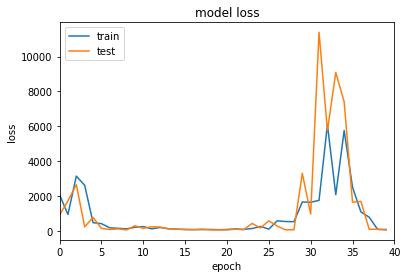

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 82.3896 - root_mean_squared_error: 9.0113 - val_loss: 82.0332 - val_root_mean_squared_error: 8.9914
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 102.3444 - root_mean_squared_error: 10.0575 - val_loss: 86.4688 - val_root_mean_squared_error: 9.2342
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 94.8507 - root_mean_squared_error: 9.6772 - val_loss: 68.2403 - val_root_mean_squared_error: 8.1873
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 79.2157 - root_mean_squared_error: 8.8321 - val_loss: 97.5601 - val_root_mean_squared_error: 9.8158
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 107.3919 - root_mean_squared_error: 10.3045 - val_loss: 92.8854 - val_root_mean_squared_error: 9.5748
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 106.6550 - root_mean_squared_error: 10.2688 - val_loss: 71.8399 - va

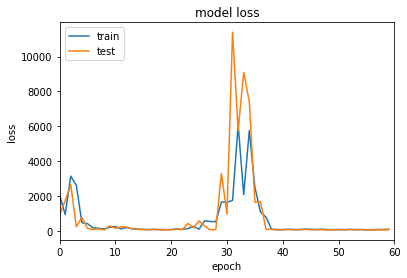

Epoch 1/20
6/6 [==============================] - 1s 31ms/step - loss: 1585.4214 - root_mean_squared_error: 39.5435 - val_loss: 503.4503 - val_root_mean_squared_error: 21.2727
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 843.8548 - root_mean_squared_error: 27.8341 - val_loss: 2716.4873 - val_root_mean_squared_error: 51.2240
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1008.6360 - root_mean_squared_error: 29.9481 - val_loss: 1125.7914 - val_root_mean_squared_error: 31.3276
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 721.5955 - root_mean_squared_error: 23.5404 - val_loss: 700.6279 - val_root_mean_squared_error: 22.3473
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 465.6449 - root_mean_squared_error: 15.7162 - val_loss: 684.3869 - val_root_mean_squared_error: 21.0440
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 462.9279 - root_mean_squared_error: 14.5214 - val_loss

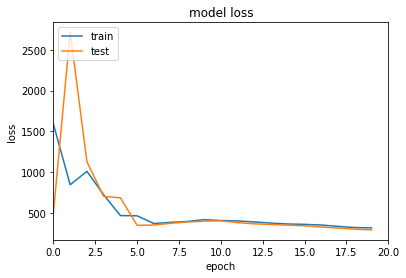

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 298.0479 - root_mean_squared_error: 8.9306 - val_loss: 282.6683 - val_root_mean_squared_error: 8.3334
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 292.9075 - root_mean_squared_error: 9.1259 - val_loss: 271.1380 - val_root_mean_squared_error: 8.1961
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 279.5292 - root_mean_squared_error: 8.8890 - val_loss: 260.8202 - val_root_mean_squared_error: 8.0868
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 274.6655 - root_mean_squared_error: 9.0674 - val_loss: 267.5402 - val_root_mean_squared_error: 8.9145
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 284.6971 - root_mean_squared_error: 9.9451 - val_loss: 251.8228 - val_root_mean_squared_error: 8.3302
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 284.4441 - root_mean_squared_error: 10.2025 - val_loss: 282

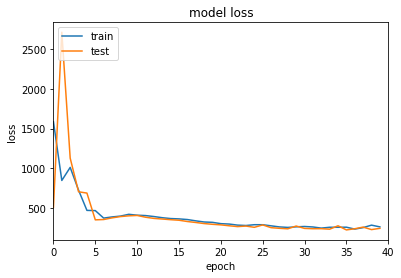

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 264.6555 - root_mean_squared_error: 10.3945 - val_loss: 260.7148 - val_root_mean_squared_error: 10.3117
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 254.1439 - root_mean_squared_error: 10.0705 - val_loss: 270.4622 - val_root_mean_squared_error: 10.9704
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 259.4395 - root_mean_squared_error: 10.5367 - val_loss: 239.8611 - val_root_mean_squared_error: 9.6987
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 238.0856 - root_mean_squared_error: 9.6924 - val_loss: 208.3401 - val_root_mean_squared_error: 8.1693
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 225.5920 - root_mean_squared_error: 9.2502 - val_loss: 214.9331 - val_root_mean_squared_error: 8.7926
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 213.1610 - root_mean_squared_error: 8.7759 - val_loss: 19

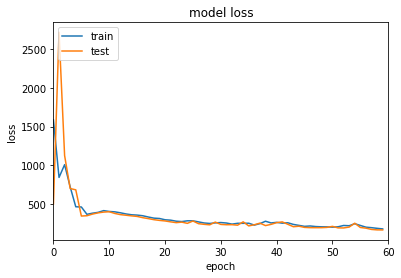

Epoch 1/20
6/6 [==============================] - 1s 30ms/step - loss: 1663.0024 - root_mean_squared_error: 40.7545 - val_loss: 464.5034 - val_root_mean_squared_error: 21.4455
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 833.2482 - root_mean_squared_error: 28.7592 - val_loss: 4182.3848 - val_root_mean_squared_error: 64.6069
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1106.1487 - root_mean_squared_error: 33.1058 - val_loss: 981.1865 - val_root_mean_squared_error: 31.1114
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 393.6478 - root_mean_squared_error: 19.4423 - val_loss: 248.8220 - val_root_mean_squared_error: 15.1505
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 185.9108 - root_mean_squared_error: 12.8249 - val_loss: 201.5190 - val_root_mean_squared_error: 13.2992
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 216.8414 - root_mean_squared_error: 13.7973 - val_los

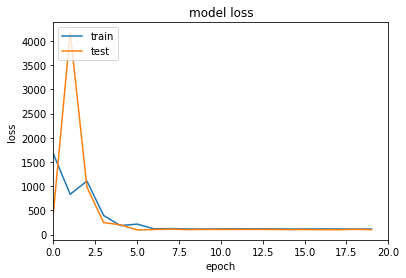

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 112.2875 - root_mean_squared_error: 8.8964 - val_loss: 101.1440 - val_root_mean_squared_error: 8.2836
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 114.1906 - root_mean_squared_error: 9.0580 - val_loss: 108.9483 - val_root_mean_squared_error: 8.7971
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 113.0081 - root_mean_squared_error: 9.0448 - val_loss: 96.8566 - val_root_mean_squared_error: 8.1366
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 122.5042 - root_mean_squared_error: 9.6014 - val_loss: 97.4219 - val_root_mean_squared_error: 8.2227
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 115.7610 - root_mean_squared_error: 9.2879 - val_loss: 96.2158 - val_root_mean_squared_error: 8.1973
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 113.8958 - root_mean_squared_error: 9.2285 - val_loss: 103.1273 

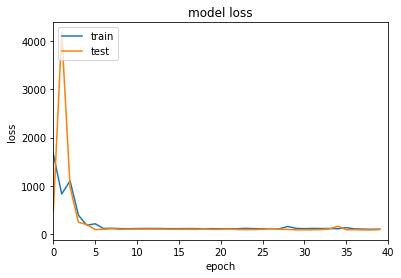

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 104.7686 - root_mean_squared_error: 8.9904 - val_loss: 90.8171 - val_root_mean_squared_error: 8.1740
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 103.9754 - root_mean_squared_error: 8.9270 - val_loss: 94.7396 - val_root_mean_squared_error: 8.3667
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 104.6793 - root_mean_squared_error: 8.9317 - val_loss: 100.2652 - val_root_mean_squared_error: 8.6751
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 102.6311 - root_mean_squared_error: 8.8168 - val_loss: 90.2316 - val_root_mean_squared_error: 8.1012
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 114.3677 - root_mean_squared_error: 9.4895 - val_loss: 89.3825 - val_root_mean_squared_error: 8.0965
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 118.9697 - root_mean_squared_error: 9.7714 - val_loss: 88.4665 - 

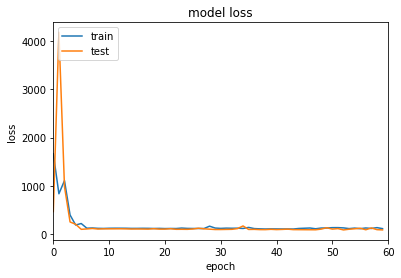

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 1746.7733 - root_mean_squared_error: 41.7910 - val_loss: 545.8613 - val_root_mean_squared_error: 23.3480
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 660.7244 - root_mean_squared_error: 25.6845 - val_loss: 3734.2581 - val_root_mean_squared_error: 61.0968
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1888.9188 - root_mean_squared_error: 43.4416 - val_loss: 3564.6672 - val_root_mean_squared_error: 59.6865
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 1321.4825 - root_mean_squared_error: 36.3187 - val_loss: 214.6239 - val_root_mean_squared_error: 14.5552
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 366.0685 - root_mean_squared_error: 19.0555 - val_loss: 79.4403 - val_root_mean_squared_error: 8.7291
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 123.3705 - root_mean_squared_error: 10.9522 - val_los

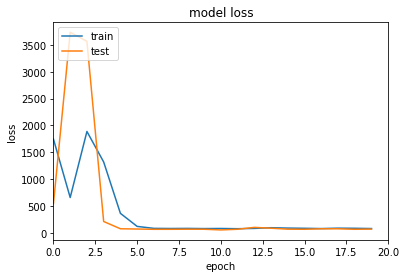

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 84.9607 - root_mean_squared_error: 8.9710 - val_loss: 79.7008 - val_root_mean_squared_error: 8.6747
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 88.9846 - root_mean_squared_error: 9.1952 - val_loss: 72.2486 - val_root_mean_squared_error: 8.2361
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 85.2567 - root_mean_squared_error: 8.9911 - val_loss: 72.2245 - val_root_mean_squared_error: 8.2342
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 81.8098 - root_mean_squared_error: 8.7969 - val_loss: 71.5926 - val_root_mean_squared_error: 8.1956
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 81.6796 - root_mean_squared_error: 8.7897 - val_loss: 87.4451 - val_root_mean_squared_error: 9.1122
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 90.3835 - root_mean_squared_error: 9.2724 - val_loss: 76.5040 - val_root

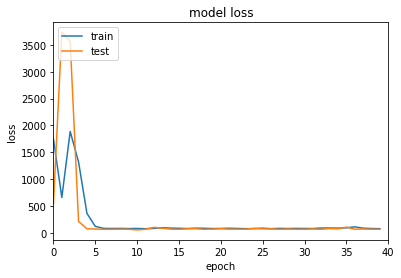

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 86.2470 - root_mean_squared_error: 9.0716 - val_loss: 69.7973 - val_root_mean_squared_error: 8.1154
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 93.3341 - root_mean_squared_error: 9.4555 - val_loss: 69.9270 - val_root_mean_squared_error: 8.1250
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 79.6771 - root_mean_squared_error: 8.7049 - val_loss: 71.8630 - val_root_mean_squared_error: 8.2448
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 84.4125 - root_mean_squared_error: 8.9742 - val_loss: 69.1203 - val_root_mean_squared_error: 8.0784
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 85.2248 - root_mean_squared_error: 9.0208 - val_loss: 76.1417 - val_root_mean_squared_error: 8.5033
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 103.0568 - root_mean_squared_error: 9.9615 - val_loss: 73.2686 - val_r

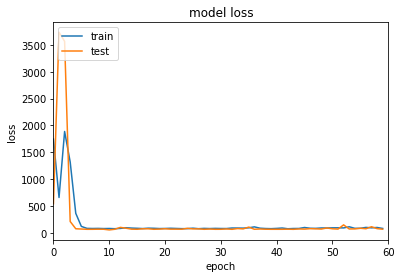

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 1356.9779 - root_mean_squared_error: 36.8365 - val_loss: 1846.1698 - val_root_mean_squared_error: 42.9658
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1283.1486 - root_mean_squared_error: 35.8189 - val_loss: 439.6551 - val_root_mean_squared_error: 20.9626
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 855.9188 - root_mean_squared_error: 29.2517 - val_loss: 616.7914 - val_root_mean_squared_error: 24.8291
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 1843.5161 - root_mean_squared_error: 42.9323 - val_loss: 2470.3726 - val_root_mean_squared_error: 49.6991
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 1214.3143 - root_mean_squared_error: 34.8414 - val_loss: 1170.9720 - val_root_mean_squared_error: 34.2133
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 700.8041 - root_mean_squared_error: 26.4644 - val

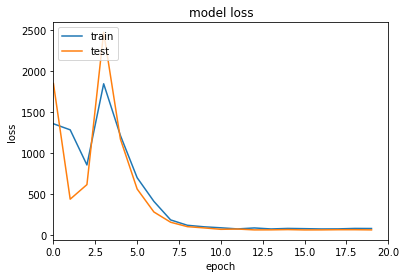

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 88.3680 - root_mean_squared_error: 9.3741 - val_loss: 72.1595 - val_root_mean_squared_error: 8.4655
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 97.6686 - root_mean_squared_error: 9.8577 - val_loss: 106.0455 - val_root_mean_squared_error: 10.2737
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 93.4964 - root_mean_squared_error: 9.6436 - val_loss: 76.4242 - val_root_mean_squared_error: 8.7135
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 84.8315 - root_mean_squared_error: 9.1832 - val_loss: 66.3768 - val_root_mean_squared_error: 8.1164
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 83.6772 - root_mean_squared_error: 9.1200 - val_loss: 73.8002 - val_root_mean_squared_error: 8.5612
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 85.7472 - root_mean_squared_error: 9.2326 - val_loss: 66.4329 - val_

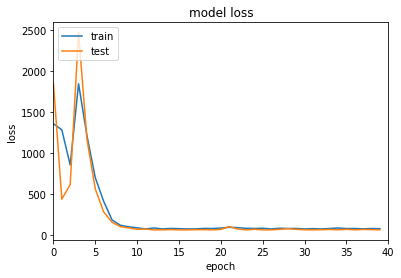

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 76.8938 - root_mean_squared_error: 8.7404 - val_loss: 100.7120 - val_root_mean_squared_error: 10.0108
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 111.3585 - root_mean_squared_error: 10.5292 - val_loss: 72.2071 - val_root_mean_squared_error: 8.4686
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 89.9447 - root_mean_squared_error: 9.4581 - val_loss: 82.2882 - val_root_mean_squared_error: 9.0444
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 80.5895 - root_mean_squared_error: 8.9500 - val_loss: 65.8959 - val_root_mean_squared_error: 8.0877
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 82.8918 - root_mean_squared_error: 9.0777 - val_loss: 95.0065 - val_root_mean_squared_error: 9.7220
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 89.0678 - root_mean_squared_error: 9.4115 - val_loss: 67.5642 - 

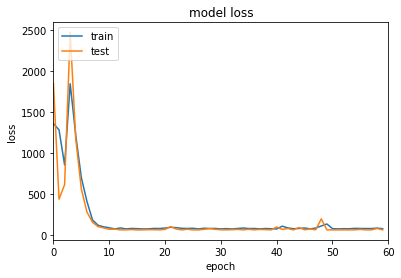

Epoch 1/20
6/6 [==============================] - 1s 97ms/step - loss: 114983.2266 - root_mean_squared_error: 339.0881 - val_loss: 2825.4724 - val_root_mean_squared_error: 53.1130
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 4380.5679 - root_mean_squared_error: 66.1402 - val_loss: 884.8059 - val_root_mean_squared_error: 29.6089
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 1842.8265 - root_mean_squared_error: 42.8221 - val_loss: 1050.6034 - val_root_mean_squared_error: 32.2526
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 353.6241 - root_mean_squared_error: 18.5111 - val_loss: 166.3686 - val_root_mean_squared_error: 12.4354
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 329.3256 - root_mean_squared_error: 17.8116 - val_loss: 325.2577 - val_root_mean_squared_error: 17.6847
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 222.3654 - root_mean_squared_error: 14.4798 - va

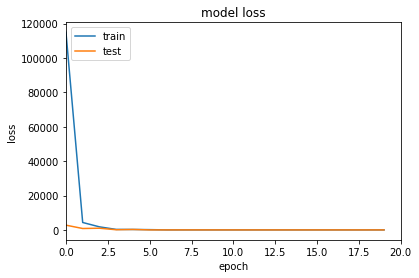

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 68.1594 - root_mean_squared_error: 7.4318 - val_loss: 60.7397 - val_root_mean_squared_error: 6.9165
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 68.0504 - root_mean_squared_error: 7.4273 - val_loss: 60.4852 - val_root_mean_squared_error: 6.9010
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 67.9179 - root_mean_squared_error: 7.4210 - val_loss: 60.0722 - val_root_mean_squared_error: 6.8739
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 67.8686 - root_mean_squared_error: 7.4204 - val_loss: 59.7710 - val_root_mean_squared_error: 6.8548
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 67.8308 - root_mean_squared_error: 7.4205 - val_loss: 60.1558 - val_root_mean_squared_error: 6.8856
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 67.6608 - root_mean_squared_error: 7.4116 - val_loss: 60.1106 - val_r

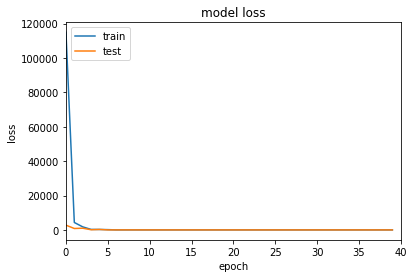

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 65.6317 - root_mean_squared_error: 7.3087 - val_loss: 58.5951 - val_root_mean_squared_error: 6.8117
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 65.5296 - root_mean_squared_error: 7.3038 - val_loss: 58.0296 - val_root_mean_squared_error: 6.7724
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 65.4177 - root_mean_squared_error: 7.2983 - val_loss: 58.0963 - val_root_mean_squared_error: 6.7795
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 65.2808 - root_mean_squared_error: 7.2910 - val_loss: 57.8623 - val_root_mean_squared_error: 6.7645
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 65.3629 - root_mean_squared_error: 7.2987 - val_loss: 57.0409 - val_root_mean_squared_error: 6.7058
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 65.2029 - root_mean_squared_error: 7.2898 - val_loss: 57.6646 - val_roo

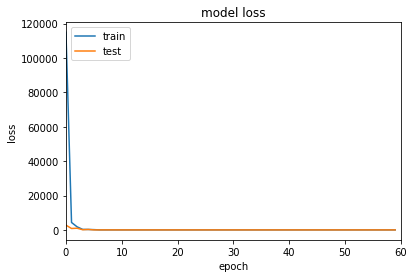

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 124302.0781 - root_mean_squared_error: 352.5620 - val_loss: 28993.6738 - val_root_mean_squared_error: 170.2652
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 9375.3672 - root_mean_squared_error: 96.8037 - val_loss: 379.3624 - val_root_mean_squared_error: 19.3298
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 854.8577 - root_mean_squared_error: 29.1293 - val_loss: 921.1050 - val_root_mean_squared_error: 30.2319
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 651.2536 - root_mean_squared_error: 25.3726 - val_loss: 261.6230 - val_root_mean_squared_error: 15.9274
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 234.8189 - root_mean_squared_error: 15.0556 - val_loss: 141.6991 - val_root_mean_squared_error: 11.5450
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 120.4773 - root_mean_squared_error: 10.5804 - va

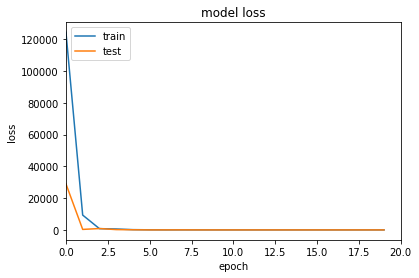

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 66.8769 - root_mean_squared_error: 7.6113 - val_loss: 57.3939 - val_root_mean_squared_error: 6.9608
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 66.2365 - root_mean_squared_error: 7.5696 - val_loss: 57.4283 - val_root_mean_squared_error: 6.9638
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 66.3248 - root_mean_squared_error: 7.5759 - val_loss: 56.9562 - val_root_mean_squared_error: 6.9304
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 65.6002 - root_mean_squared_error: 7.5285 - val_loss: 58.1337 - val_root_mean_squared_error: 7.0154
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 65.5236 - root_mean_squared_error: 7.5239 - val_loss: 57.3088 - val_root_mean_squared_error: 6.9569
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 65.0192 - root_mean_squared_error: 7.4908 - val_loss: 56.2376 - val_r

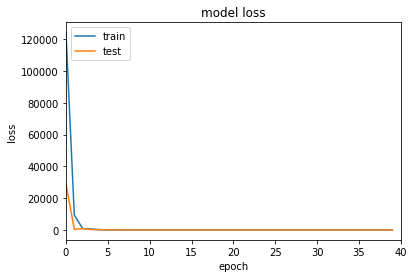

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 59.9855 - root_mean_squared_error: 7.1553 - val_loss: 52.1258 - val_root_mean_squared_error: 6.5837
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 59.6705 - root_mean_squared_error: 7.1339 - val_loss: 51.9068 - val_root_mean_squared_error: 6.5677
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 59.3705 - root_mean_squared_error: 7.1135 - val_loss: 52.0613 - val_root_mean_squared_error: 6.5801
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 59.1726 - root_mean_squared_error: 7.1002 - val_loss: 50.9427 - val_root_mean_squared_error: 6.4952
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 58.4947 - root_mean_squared_error: 7.0529 - val_loss: 51.3671 - val_root_mean_squared_error: 6.5284
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 58.1923 - root_mean_squared_error: 7.0320 - val_loss: 51.5814 - val_ro

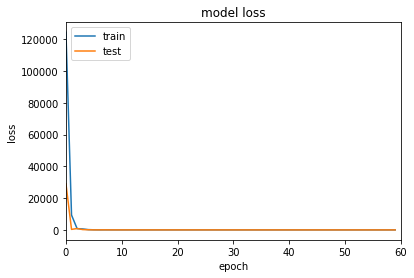

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 101970.4531 - root_mean_squared_error: 319.3246 - val_loss: 41641.0234 - val_root_mean_squared_error: 204.0523
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 12965.3428 - root_mean_squared_error: 113.8455 - val_loss: 1357.9073 - val_root_mean_squared_error: 36.7730
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 1014.5246 - root_mean_squared_error: 31.7541 - val_loss: 702.0755 - val_root_mean_squared_error: 26.3654
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 584.4113 - root_mean_squared_error: 24.0237 - val_loss: 398.3536 - val_root_mean_squared_error: 19.7650
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 356.5980 - root_mean_squared_error: 18.6738 - val_loss: 245.9785 - val_root_mean_squared_error: 15.4223
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 219.4152 - root_mean_squared_error: 14.5319

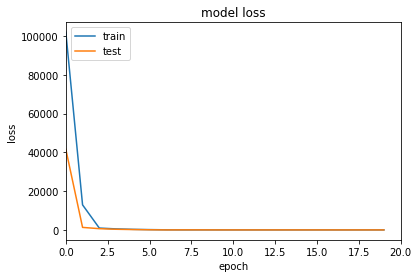

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 65.5991 - root_mean_squared_error: 7.5513 - val_loss: 58.1592 - val_root_mean_squared_error: 7.0419
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 65.2146 - root_mean_squared_error: 7.5265 - val_loss: 57.2560 - val_root_mean_squared_error: 6.9782
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 65.0213 - root_mean_squared_error: 7.5143 - val_loss: 57.2384 - val_root_mean_squared_error: 6.9776
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 64.8840 - root_mean_squared_error: 7.5058 - val_loss: 57.1389 - val_root_mean_squared_error: 6.9712
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 64.4033 - root_mean_squared_error: 7.4743 - val_loss: 57.7400 - val_root_mean_squared_error: 7.0148
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 64.2011 - root_mean_squared_error: 7.4614 - val_loss: 57.3441 - val_roo

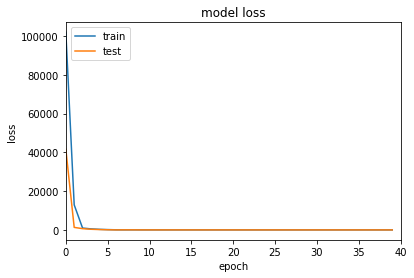

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 59.5787 - root_mean_squared_error: 7.1547 - val_loss: 51.8788 - val_root_mean_squared_error: 6.5951
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 59.2236 - root_mean_squared_error: 7.1304 - val_loss: 53.1510 - val_root_mean_squared_error: 6.6915
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 58.6100 - root_mean_squared_error: 7.0879 - val_loss: 52.1651 - val_root_mean_squared_error: 6.6181
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 58.4121 - root_mean_squared_error: 7.0746 - val_loss: 51.2966 - val_root_mean_squared_error: 6.5529
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 58.0739 - root_mean_squared_error: 7.0513 - val_loss: 52.7250 - val_root_mean_squared_error: 6.6617
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 57.3911 - root_mean_squared_error: 7.0034 - val_loss: 50.7810 - val_ro

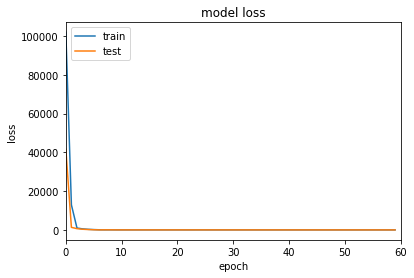

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 161544.6719 - root_mean_squared_error: 401.9235 - val_loss: 14135.6748 - val_root_mean_squared_error: 118.8788
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 6377.4062 - root_mean_squared_error: 79.8306 - val_loss: 1068.7347 - val_root_mean_squared_error: 32.6040
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 806.6758 - root_mean_squared_error: 28.2921 - val_loss: 1235.3054 - val_root_mean_squared_error: 35.0486
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 713.3463 - root_mean_squared_error: 26.5734 - val_loss: 84.6052 - val_root_mean_squared_error: 8.7762
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 101.5117 - root_mean_squared_error: 9.6829 - val_loss: 157.9661 - val_root_mean_squared_error: 12.2472
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 103.6983 - root_mean_squared_error: 9.7794 - val_

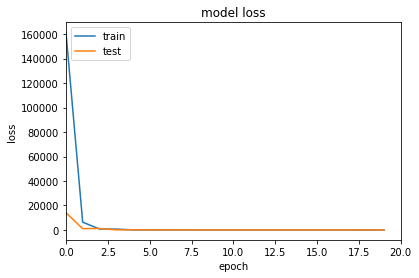

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 56.8437 - root_mean_squared_error: 6.9750 - val_loss: 49.1654 - val_root_mean_squared_error: 6.4017
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 330.4370 - root_mean_squared_error: 17.9515 - val_loss: 232.1119 - val_root_mean_squared_error: 14.9647
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 262.5375 - root_mean_squared_error: 15.9483 - val_loss: 74.0512 - val_root_mean_squared_error: 8.1141
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 158.1920 - root_mean_squared_error: 12.2463 - val_loss: 104.9832 - val_root_mean_squared_error: 9.8362
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 77.5223 - root_mean_squared_error: 8.3239 - val_loss: 106.6419 - val_root_mean_squared_error: 9.9198
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 87.3981 - root_mean_squared_error: 8.8972 - val_loss: 52.275

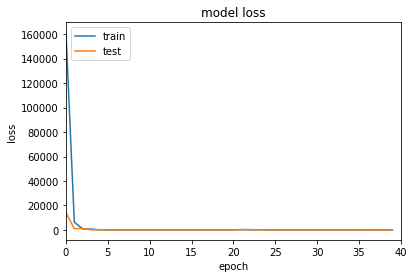

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 49.5410 - root_mean_squared_error: 6.4290 - val_loss: 43.1446 - val_root_mean_squared_error: 5.9113
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 49.1974 - root_mean_squared_error: 6.4032 - val_loss: 41.8026 - val_root_mean_squared_error: 5.7977
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 48.0604 - root_mean_squared_error: 6.3148 - val_loss: 43.3488 - val_root_mean_squared_error: 5.9306
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 47.0470 - root_mean_squared_error: 6.2350 - val_loss: 41.4441 - val_root_mean_squared_error: 5.7689
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 45.7777 - root_mean_squared_error: 6.1334 - val_loss: 39.4953 - val_root_mean_squared_error: 5.5986
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 45.3502 - root_mean_squared_error: 6.0995 - val_loss: 39.3135 - val_root_

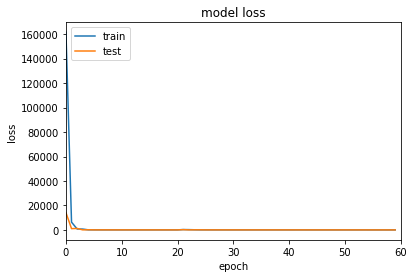

Epoch 1/20
6/6 [==============================] - 1s 32ms/step - loss: 194138.4531 - root_mean_squared_error: 440.6108 - val_loss: 18834.2383 - val_root_mean_squared_error: 137.2335
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 18084.6348 - root_mean_squared_error: 134.4725 - val_loss: 137.5506 - val_root_mean_squared_error: 11.6186
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 869.5956 - root_mean_squared_error: 29.4383 - val_loss: 1006.0132 - val_root_mean_squared_error: 31.6616
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 816.7869 - root_mean_squared_error: 28.5123 - val_loss: 388.0583 - val_root_mean_squared_error: 19.5921
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 393.2061 - root_mean_squared_error: 19.7186 - val_loss: 338.9544 - val_root_mean_squared_error: 18.2852
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 327.1393 - root_mean_squared_error: 17.9564 -

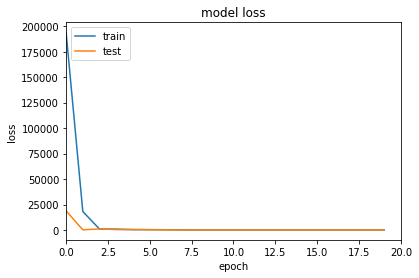

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 62.1481 - root_mean_squared_error: 7.5585 - val_loss: 53.5369 - val_root_mean_squared_error: 6.9660
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 61.7778 - root_mean_squared_error: 7.5345 - val_loss: 53.1077 - val_root_mean_squared_error: 6.9357
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 61.6936 - root_mean_squared_error: 7.5295 - val_loss: 52.7591 - val_root_mean_squared_error: 6.9112
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 61.5027 - root_mean_squared_error: 7.5174 - val_loss: 52.6734 - val_root_mean_squared_error: 6.9056
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 61.3111 - root_mean_squared_error: 7.5052 - val_loss: 52.6671 - val_root_mean_squared_error: 6.9058
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 61.1757 - root_mean_squared_error: 7.4968 - val_loss: 52.7378 - val_roo

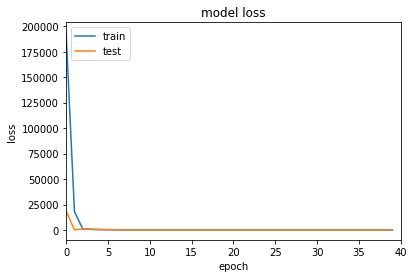

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 59.0428 - root_mean_squared_error: 7.3614 - val_loss: 51.1603 - val_root_mean_squared_error: 6.8054
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 1003.2192 - root_mean_squared_error: 31.5970 - val_loss: 130.4605 - val_root_mean_squared_error: 11.2065
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 164.0660 - root_mean_squared_error: 12.6159 - val_loss: 129.1833 - val_root_mean_squared_error: 11.1460
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 112.8477 - root_mean_squared_error: 10.3862 - val_loss: 53.9985 - val_root_mean_squared_error: 6.9993
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 63.0846 - root_mean_squared_error: 7.6198 - val_loss: 75.8227 - val_root_mean_squared_error: 8.4131
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 78.0460 - root_mean_squared_error: 8.5438 - val_loss: 66.69

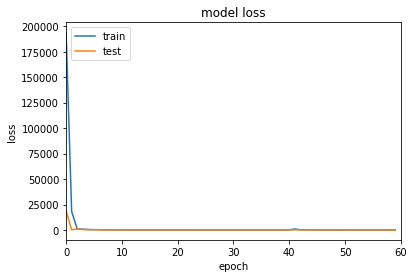

Epoch 1/20
6/6 [==============================] - 1s 30ms/step - loss: 89294.6641 - root_mean_squared_error: 298.8217 - val_loss: 11062.9766 - val_root_mean_squared_error: 105.1787
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 4917.7671 - root_mean_squared_error: 70.1227 - val_loss: 1559.7900 - val_root_mean_squared_error: 39.4845
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 693.6039 - root_mean_squared_error: 26.3200 - val_loss: 1066.2860 - val_root_mean_squared_error: 32.6389
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 393.3484 - root_mean_squared_error: 19.8066 - val_loss: 153.4617 - val_root_mean_squared_error: 12.3426
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 335.8167 - root_mean_squared_error: 18.2937 - val_loss: 284.9662 - val_root_mean_squared_error: 16.8453
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 166.8739 - root_mean_squared_error: 12.8706 - 

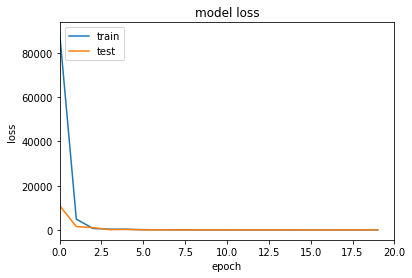

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 57.0220 - root_mean_squared_error: 7.4647 - val_loss: 48.2421 - val_root_mean_squared_error: 6.8514
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 57.0543 - root_mean_squared_error: 7.4669 - val_loss: 48.2316 - val_root_mean_squared_error: 6.8507
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 643.8993 - root_mean_squared_error: 25.3495 - val_loss: 161.1258 - val_root_mean_squared_error: 12.6421
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 172.4214 - root_mean_squared_error: 13.0811 - val_loss: 79.3632 - val_root_mean_squared_error: 8.8347
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 71.5252 - root_mean_squared_error: 8.3793 - val_loss: 86.0759 - val_root_mean_squared_error: 9.2065
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 80.7686 - root_mean_squared_error: 8.9135 - val_loss: 53.6528 

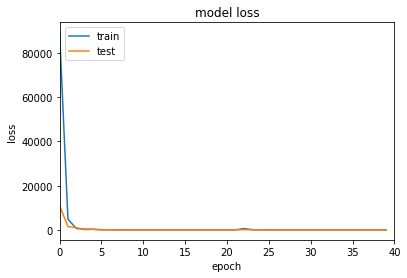

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 51.4998 - root_mean_squared_error: 7.0842 - val_loss: 44.9759 - val_root_mean_squared_error: 6.6077
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 51.5371 - root_mean_squared_error: 7.0868 - val_loss: 44.9346 - val_root_mean_squared_error: 6.6046
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 51.3698 - root_mean_squared_error: 7.0750 - val_loss: 42.9312 - val_root_mean_squared_error: 6.4512
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 50.5816 - root_mean_squared_error: 7.0192 - val_loss: 42.6344 - val_root_mean_squared_error: 6.4282
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 50.2196 - root_mean_squared_error: 6.9934 - val_loss: 42.7697 - val_root_mean_squared_error: 6.4388
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 49.7070 - root_mean_squared_error: 6.9567 - val_loss: 42.8497 - val_ro

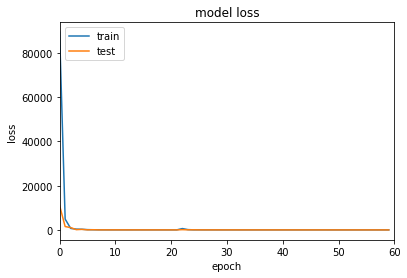

Epoch 1/20
6/6 [==============================] - 1s 37ms/step - loss: 129002.6875 - root_mean_squared_error: 359.1691 - val_loss: 18522.8223 - val_root_mean_squared_error: 136.0972
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 8081.6948 - root_mean_squared_error: 89.8956 - val_loss: 2163.5571 - val_root_mean_squared_error: 46.5075
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 840.9409 - root_mean_squared_error: 28.9875 - val_loss: 1072.6379 - val_root_mean_squared_error: 32.7399
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 631.0437 - root_mean_squared_error: 25.1052 - val_loss: 53.9478 - val_root_mean_squared_error: 7.2891
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 117.9726 - root_mean_squared_error: 10.8229 - val_loss: 260.4186 - val_root_mean_squared_error: 16.1107
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 157.6511 - root_mean_squared_error: 12.5211 - va

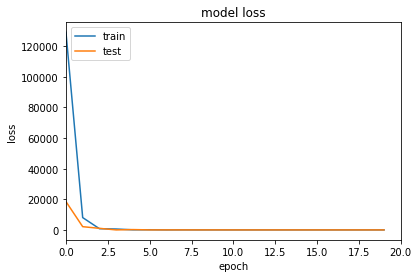

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 53.8175 - root_mean_squared_error: 7.2732 - val_loss: 47.6705 - val_root_mean_squared_error: 6.8376
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 54.0799 - root_mean_squared_error: 7.2912 - val_loss: 47.3135 - val_root_mean_squared_error: 6.8115
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 53.5240 - root_mean_squared_error: 7.2530 - val_loss: 44.9684 - val_root_mean_squared_error: 6.6371
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 53.3733 - root_mean_squared_error: 7.2427 - val_loss: 45.8571 - val_root_mean_squared_error: 6.7038
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 52.7735 - root_mean_squared_error: 7.2012 - val_loss: 45.7101 - val_root_mean_squared_error: 6.6928
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 52.5177 - root_mean_squared_error: 7.1834 - val_loss: 45.0202 - val_ro

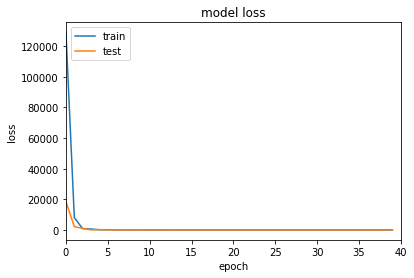

Epoch 41/60
6/6 [==============================] - 0s 24ms/step - loss: 47.3646 - root_mean_squared_error: 6.8156 - val_loss: 39.5523 - val_root_mean_squared_error: 6.2161
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 47.5668 - root_mean_squared_error: 6.8304 - val_loss: 40.9027 - val_root_mean_squared_error: 6.3238
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 47.4107 - root_mean_squared_error: 6.8190 - val_loss: 38.4729 - val_root_mean_squared_error: 6.1287
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 46.7770 - root_mean_squared_error: 6.7724 - val_loss: 41.9669 - val_root_mean_squared_error: 6.4075
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 46.4490 - root_mean_squared_error: 6.7482 - val_loss: 37.5933 - val_root_mean_squared_error: 6.0566
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 44.8877 - root_mean_squared_error: 6.6315 - val_loss: 41.0592 - val_

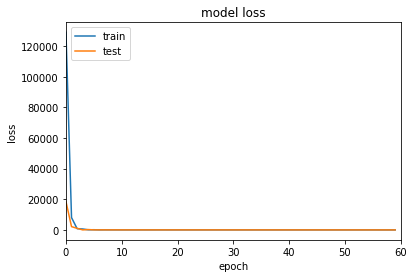

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 126802.7422 - root_mean_squared_error: 356.0934 - val_loss: 22835.5469 - val_root_mean_squared_error: 151.1133
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 7089.8130 - root_mean_squared_error: 84.1986 - val_loss: 464.3723 - val_root_mean_squared_error: 21.5368
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 681.8881 - root_mean_squared_error: 26.1016 - val_loss: 696.7651 - val_root_mean_squared_error: 26.3837
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 611.1488 - root_mean_squared_error: 24.7073 - val_loss: 378.2134 - val_root_mean_squared_error: 19.4286
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 281.9871 - root_mean_squared_error: 16.7698 - val_loss: 115.2766 - val_root_mean_squared_error: 10.7000
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 88.8748 - root_mean_squared_error: 9.3850 - val_

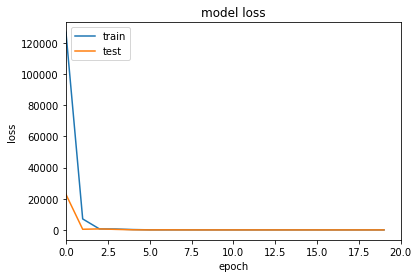

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 50.6157 - root_mean_squared_error: 7.0551 - val_loss: 44.1045 - val_root_mean_squared_error: 6.5774
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 50.2396 - root_mean_squared_error: 7.0284 - val_loss: 43.6873 - val_root_mean_squared_error: 6.5457
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 50.0924 - root_mean_squared_error: 7.0179 - val_loss: 43.5425 - val_root_mean_squared_error: 6.5346
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 49.5216 - root_mean_squared_error: 6.9771 - val_loss: 42.7662 - val_root_mean_squared_error: 6.4749
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 49.6193 - root_mean_squared_error: 6.9841 - val_loss: 43.8450 - val_root_mean_squared_error: 6.5577
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 49.1448 - root_mean_squared_error: 6.9501 - val_loss: 41.8694 - val_r

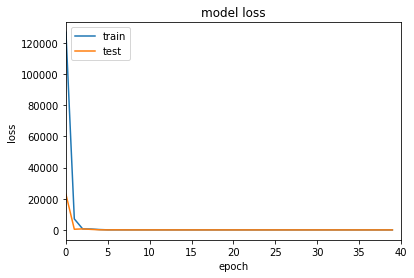

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 42.4801 - root_mean_squared_error: 6.4529 - val_loss: 35.2070 - val_root_mean_squared_error: 5.8624
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 41.5639 - root_mean_squared_error: 6.3815 - val_loss: 38.1133 - val_root_mean_squared_error: 6.1052
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 41.4442 - root_mean_squared_error: 6.3722 - val_loss: 34.7460 - val_root_mean_squared_error: 5.8229
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 41.9026 - root_mean_squared_error: 6.4080 - val_loss: 34.9985 - val_root_mean_squared_error: 5.8446
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 40.2950 - root_mean_squared_error: 6.2814 - val_loss: 34.5966 - val_root_mean_squared_error: 5.8101
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 39.6181 - root_mean_squared_error: 6.2273 - val_loss: 34.9067 - val_ro

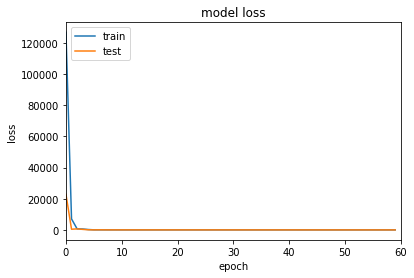

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 137715.1562 - root_mean_squared_error: 371.0993 - val_loss: 25936.6465 - val_root_mean_squared_error: 161.0452
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 12343.3525 - root_mean_squared_error: 111.0936 - val_loss: 3994.1748 - val_root_mean_squared_error: 63.1814
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 3906.4827 - root_mean_squared_error: 62.4804 - val_loss: 594.5040 - val_root_mean_squared_error: 24.3165
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 385.7415 - root_mean_squared_error: 19.5518 - val_loss: 1039.1589 - val_root_mean_squared_error: 32.1768
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 1148.3345 - root_mean_squared_error: 33.8285 - val_loss: 921.9075 - val_root_mean_squared_error: 30.2941
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 666.1549 - root_mean_squared_error: 25.7271 

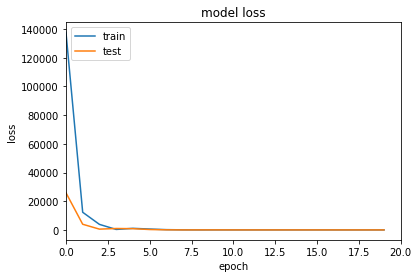

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 58.0467 - root_mean_squared_error: 7.3116 - val_loss: 50.8442 - val_root_mean_squared_error: 6.8016
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 57.4712 - root_mean_squared_error: 7.2727 - val_loss: 49.9443 - val_root_mean_squared_error: 6.7357
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 57.6180 - root_mean_squared_error: 7.2833 - val_loss: 50.0353 - val_root_mean_squared_error: 6.7430
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 57.2707 - root_mean_squared_error: 7.2599 - val_loss: 49.4850 - val_root_mean_squared_error: 6.7026
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 56.7503 - root_mean_squared_error: 7.2245 - val_loss: 50.2624 - val_root_mean_squared_error: 6.7609
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 56.6709 - root_mean_squared_error: 7.2195 - val_loss: 50.5398 - val_roo

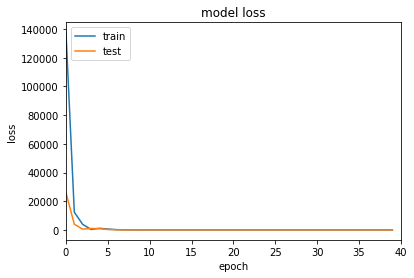

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 52.2888 - root_mean_squared_error: 6.9168 - val_loss: 46.5397 - val_root_mean_squared_error: 6.4882
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 51.8739 - root_mean_squared_error: 6.8872 - val_loss: 46.8315 - val_root_mean_squared_error: 6.5111
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 51.6187 - root_mean_squared_error: 6.8691 - val_loss: 45.9189 - val_root_mean_squared_error: 6.4412
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 51.3857 - root_mean_squared_error: 6.8526 - val_loss: 44.0495 - val_root_mean_squared_error: 6.2949
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 50.9339 - root_mean_squared_error: 6.8200 - val_loss: 45.3212 - val_root_mean_squared_error: 6.3956
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 50.5827 - root_mean_squared_error: 6.7947 - val_loss: 45.2306 - val_ro

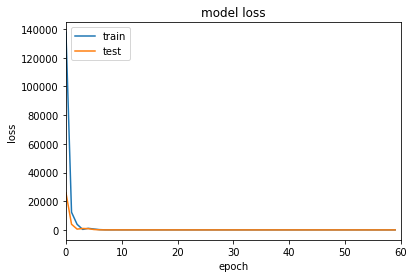

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 136169.4219 - root_mean_squared_error: 369.0113 - val_loss: 17846.4746 - val_root_mean_squared_error: 133.5902
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 9662.5869 - root_mean_squared_error: 98.2975 - val_loss: 1127.4717 - val_root_mean_squared_error: 33.5738
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1655.8038 - root_mean_squared_error: 40.6877 - val_loss: 914.3831 - val_root_mean_squared_error: 30.2325
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 601.9702 - root_mean_squared_error: 24.5267 - val_loss: 367.2978 - val_root_mean_squared_error: 19.1533
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 327.6433 - root_mean_squared_error: 18.0880 - val_loss: 211.0202 - val_root_mean_squared_error: 14.5095
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 178.3092 - root_mean_squared_error: 13.3343 - va

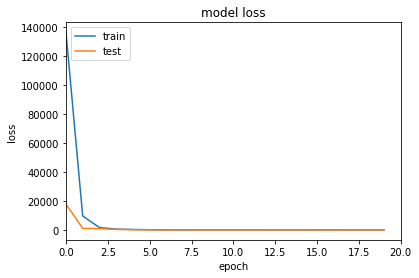

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 54.0417 - root_mean_squared_error: 7.3136 - val_loss: 46.2211 - val_root_mean_squared_error: 6.7579
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 53.8801 - root_mean_squared_error: 7.3026 - val_loss: 46.0059 - val_root_mean_squared_error: 6.7419
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 53.7336 - root_mean_squared_error: 7.2926 - val_loss: 46.5976 - val_root_mean_squared_error: 6.7857
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 53.6679 - root_mean_squared_error: 7.2881 - val_loss: 46.2763 - val_root_mean_squared_error: 6.7620
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 53.3583 - root_mean_squared_error: 7.2668 - val_loss: 45.6569 - val_root_mean_squared_error: 6.7160
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 53.2610 - root_mean_squared_error: 7.2601 - val_loss: 45.8471 - val_roo

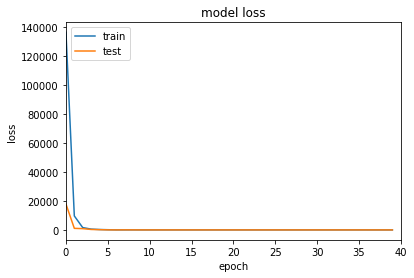

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 49.3588 - root_mean_squared_error: 6.9864 - val_loss: 42.5565 - val_root_mean_squared_error: 6.4813
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 49.1656 - root_mean_squared_error: 6.9725 - val_loss: 42.4796 - val_root_mean_squared_error: 6.4754
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 48.8448 - root_mean_squared_error: 6.9495 - val_loss: 41.3040 - val_root_mean_squared_error: 6.3840
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 48.4936 - root_mean_squared_error: 6.9242 - val_loss: 42.1620 - val_root_mean_squared_error: 6.4508
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 48.1024 - root_mean_squared_error: 6.8959 - val_loss: 41.4111 - val_root_mean_squared_error: 6.3924
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 47.7751 - root_mean_squared_error: 6.8722 - val_loss: 40.9104 - val_roo

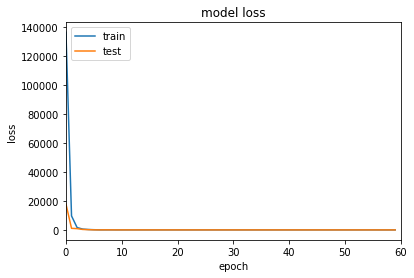

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 152531.1562 - root_mean_squared_error: 390.5523 - val_loss: 29776.8926 - val_root_mean_squared_error: 172.5597
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 10078.8457 - root_mean_squared_error: 100.3932 - val_loss: 7421.4590 - val_root_mean_squared_error: 86.1474
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 2547.7375 - root_mean_squared_error: 50.4742 - val_loss: 1620.0948 - val_root_mean_squared_error: 40.2491
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 1784.7372 - root_mean_squared_error: 42.2449 - val_loss: 329.6624 - val_root_mean_squared_error: 18.1535
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 234.5821 - root_mean_squared_error: 15.3122 - val_loss: 465.0912 - val_root_mean_squared_error: 21.5632
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 298.5697 - root_mean_squared_error: 17.2756

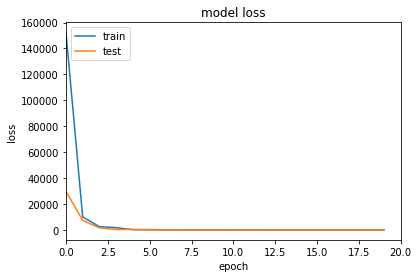

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 56.9335 - root_mean_squared_error: 7.5367 - val_loss: 47.2548 - val_root_mean_squared_error: 6.8646
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 57.0537 - root_mean_squared_error: 7.5447 - val_loss: 49.8007 - val_root_mean_squared_error: 7.0476
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 56.2036 - root_mean_squared_error: 7.4881 - val_loss: 47.1382 - val_root_mean_squared_error: 6.8561
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 55.7660 - root_mean_squared_error: 7.4588 - val_loss: 47.1837 - val_root_mean_squared_error: 6.8594
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 55.4347 - root_mean_squared_error: 7.4366 - val_loss: 48.0607 - val_root_mean_squared_error: 6.9231
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 55.2737 - root_mean_squared_error: 7.4258 - val_loss: 46.7605 - val_roo

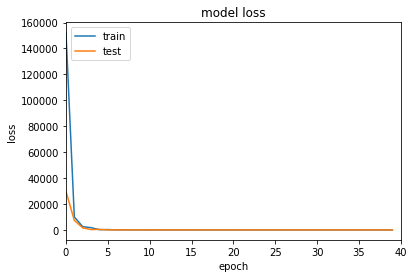

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 50.8799 - root_mean_squared_error: 7.1238 - val_loss: 43.0400 - val_root_mean_squared_error: 6.5505
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 50.6957 - root_mean_squared_error: 7.1109 - val_loss: 43.9944 - val_root_mean_squared_error: 6.6229
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 50.2693 - root_mean_squared_error: 7.0808 - val_loss: 43.0847 - val_root_mean_squared_error: 6.5539
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 49.7325 - root_mean_squared_error: 7.0428 - val_loss: 42.9310 - val_root_mean_squared_error: 6.5422
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 49.9724 - root_mean_squared_error: 7.0598 - val_loss: 42.2665 - val_root_mean_squared_error: 6.4912
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 49.9908 - root_mean_squared_error: 7.0611 - val_loss: 43.8887 - val_ro

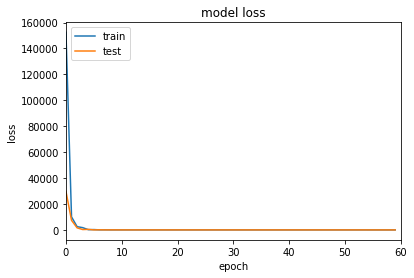

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 161946.8438 - root_mean_squared_error: 402.4262 - val_loss: 14110.8496 - val_root_mean_squared_error: 118.7889
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 12216.9229 - root_mean_squared_error: 110.5300 - val_loss: 6966.3823 - val_root_mean_squared_error: 83.4645
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1943.8966 - root_mean_squared_error: 44.0889 - val_loss: 998.9443 - val_root_mean_squared_error: 31.6049
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 561.7327 - root_mean_squared_error: 23.6993 - val_loss: 47.2320 - val_root_mean_squared_error: 6.8667
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 182.3742 - root_mean_squared_error: 13.5016 - val_loss: 335.7043 - val_root_mean_squared_error: 18.3199
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 267.6544 - root_mean_squared_error: 16.3575 - va

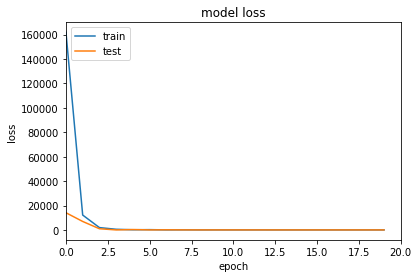

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 51.0155 - root_mean_squared_error: 7.1361 - val_loss: 42.3519 - val_root_mean_squared_error: 6.5008
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 51.0201 - root_mean_squared_error: 7.1365 - val_loss: 46.3678 - val_root_mean_squared_error: 6.8027
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 49.9591 - root_mean_squared_error: 7.0617 - val_loss: 42.4360 - val_root_mean_squared_error: 6.5073
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 49.9286 - root_mean_squared_error: 7.0596 - val_loss: 41.8316 - val_root_mean_squared_error: 6.4607
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 49.2449 - root_mean_squared_error: 7.0110 - val_loss: 43.7626 - val_root_mean_squared_error: 6.6085
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 49.5817 - root_mean_squared_error: 7.0350 - val_loss: 43.5037 - val_roo

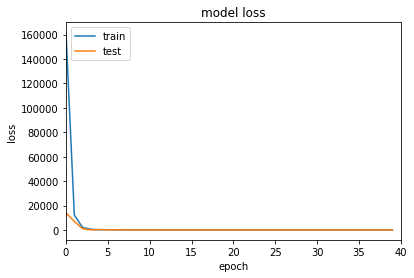

Epoch 41/60
6/6 [==============================] - 0s 22ms/step - loss: 45.3308 - root_mean_squared_error: 6.7261 - val_loss: 38.7833 - val_root_mean_squared_error: 6.2203
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 44.2496 - root_mean_squared_error: 6.6452 - val_loss: 39.0047 - val_root_mean_squared_error: 6.2381
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 43.9855 - root_mean_squared_error: 6.6253 - val_loss: 37.6523 - val_root_mean_squared_error: 6.1287
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 43.8973 - root_mean_squared_error: 6.6186 - val_loss: 37.7641 - val_root_mean_squared_error: 6.1379
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 43.6019 - root_mean_squared_error: 6.5963 - val_loss: 36.7618 - val_root_mean_squared_error: 6.0557
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 42.9576 - root_mean_squared_error: 6.5473 - val_loss: 36.1349 - val_roo

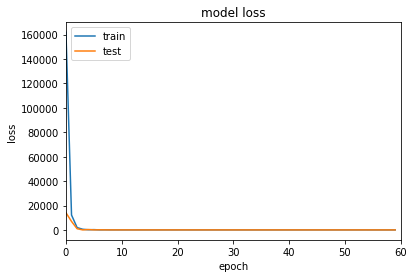

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 99505.7344 - root_mean_squared_error: 315.4446 - val_loss: 31457.5488 - val_root_mean_squared_error: 177.3601
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 10571.0215 - root_mean_squared_error: 102.8086 - val_loss: 1419.5305 - val_root_mean_squared_error: 37.6483
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1254.5570 - root_mean_squared_error: 35.3841 - val_loss: 339.8399 - val_root_mean_squared_error: 18.3515
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 150.0637 - root_mean_squared_error: 12.1137 - val_loss: 277.7563 - val_root_mean_squared_error: 16.5556
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 402.4979 - root_mean_squared_error: 19.9667 - val_loss: 364.0783 - val_root_mean_squared_error: 18.9748
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 254.7118 - root_mean_squared_error: 15.8298 -

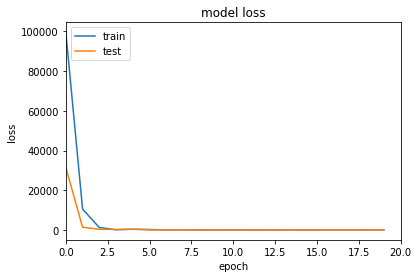

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 58.1388 - root_mean_squared_error: 7.3366 - val_loss: 50.1944 - val_root_mean_squared_error: 6.7742
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 58.4724 - root_mean_squared_error: 7.3603 - val_loss: 50.8843 - val_root_mean_squared_error: 6.8260
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 57.9061 - root_mean_squared_error: 7.3227 - val_loss: 49.4362 - val_root_mean_squared_error: 6.7202
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 57.5637 - root_mean_squared_error: 7.3003 - val_loss: 49.6540 - val_root_mean_squared_error: 6.7375
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 57.7307 - root_mean_squared_error: 7.3127 - val_loss: 49.3842 - val_root_mean_squared_error: 6.7185
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 57.4784 - root_mean_squared_error: 7.2964 - val_loss: 50.9058 - val_roo

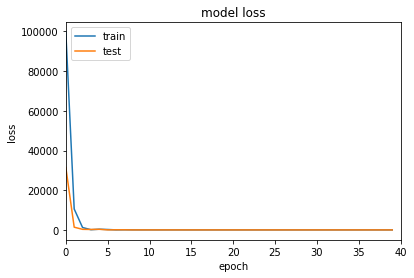

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 53.1281 - root_mean_squared_error: 7.0053 - val_loss: 45.6396 - val_root_mean_squared_error: 6.4492
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 53.1861 - root_mean_squared_error: 7.0102 - val_loss: 45.9529 - val_root_mean_squared_error: 6.4743
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 52.6984 - root_mean_squared_error: 6.9762 - val_loss: 44.9037 - val_root_mean_squared_error: 6.3937
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 52.0664 - root_mean_squared_error: 6.9315 - val_loss: 45.0611 - val_root_mean_squared_error: 6.4068
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 51.9128 - root_mean_squared_error: 6.9212 - val_loss: 46.0938 - val_root_mean_squared_error: 6.4878
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 51.6334 - root_mean_squared_error: 6.9018 - val_loss: 43.5751 - val_ro

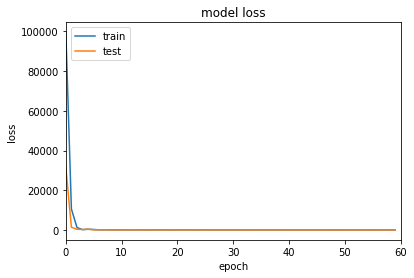

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 123204.8516 - root_mean_squared_error: 351.0054 - val_loss: 8312.0449 - val_root_mean_squared_error: 91.1698
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 8232.9658 - root_mean_squared_error: 90.7348 - val_loss: 277.7028 - val_root_mean_squared_error: 16.6572
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 799.1392 - root_mean_squared_error: 28.2641 - val_loss: 471.1459 - val_root_mean_squared_error: 21.6982
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 426.4631 - root_mean_squared_error: 20.6422 - val_loss: 368.5788 - val_root_mean_squared_error: 19.1880
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 367.2598 - root_mean_squared_error: 19.1532 - val_loss: 296.7312 - val_root_mean_squared_error: 17.2132
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 271.8935 - root_mean_squared_error: 16.4756 - val_l

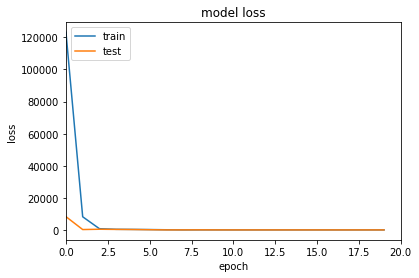

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 54.6634 - root_mean_squared_error: 7.3603 - val_loss: 46.3763 - val_root_mean_squared_error: 6.7740
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 54.5386 - root_mean_squared_error: 7.3518 - val_loss: 46.6201 - val_root_mean_squared_error: 6.7920
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 54.4273 - root_mean_squared_error: 7.3443 - val_loss: 46.1344 - val_root_mean_squared_error: 6.7562
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 54.0885 - root_mean_squared_error: 7.3212 - val_loss: 46.5631 - val_root_mean_squared_error: 6.7878
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 54.0005 - root_mean_squared_error: 7.3152 - val_loss: 46.6659 - val_root_mean_squared_error: 6.7954
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 53.9752 - root_mean_squared_error: 7.3135 - val_loss: 46.1910 - val_r

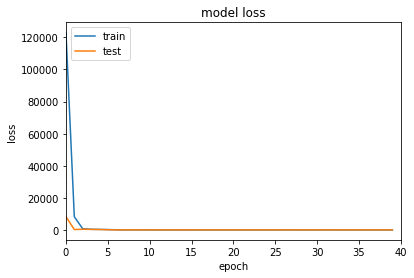

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 50.6379 - root_mean_squared_error: 7.0819 - val_loss: 43.8130 - val_root_mean_squared_error: 6.5824
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 50.3833 - root_mean_squared_error: 7.0639 - val_loss: 43.1333 - val_root_mean_squared_error: 6.5306
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 50.1735 - root_mean_squared_error: 7.0490 - val_loss: 42.7181 - val_root_mean_squared_error: 6.4987
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 49.9648 - root_mean_squared_error: 7.0342 - val_loss: 42.4075 - val_root_mean_squared_error: 6.4748
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 49.8011 - root_mean_squared_error: 7.0226 - val_loss: 42.5060 - val_root_mean_squared_error: 6.4824
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 49.3453 - root_mean_squared_error: 6.9901 - val_loss: 42.7518 - val_ro

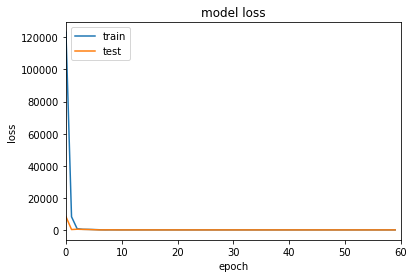

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 137862.4844 - root_mean_squared_error: 371.2984 - val_loss: 24727.1699 - val_root_mean_squared_error: 157.2487
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 15136.0771 - root_mean_squared_error: 123.0287 - val_loss: 2250.2585 - val_root_mean_squared_error: 47.4366
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 2563.8701 - root_mean_squared_error: 50.6343 - val_loss: 666.8097 - val_root_mean_squared_error: 25.8219
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 241.7992 - root_mean_squared_error: 15.5485 - val_loss: 371.4729 - val_root_mean_squared_error: 19.2724
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 590.9692 - root_mean_squared_error: 24.3089 - val_loss: 610.9503 - val_root_mean_squared_error: 24.7164
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 462.2491 - root_mean_squared_error: 21.4988

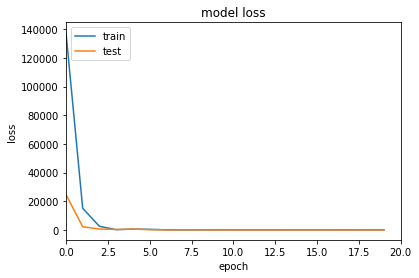

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 57.4191 - root_mean_squared_error: 7.5738 - val_loss: 48.8995 - val_root_mean_squared_error: 6.9888
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 57.3975 - root_mean_squared_error: 7.5724 - val_loss: 48.7436 - val_root_mean_squared_error: 6.9776
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 57.4661 - root_mean_squared_error: 7.5769 - val_loss: 49.7718 - val_root_mean_squared_error: 7.0509
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 57.4638 - root_mean_squared_error: 7.5767 - val_loss: 49.5561 - val_root_mean_squared_error: 7.0356
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 56.8845 - root_mean_squared_error: 7.5384 - val_loss: 48.2189 - val_root_mean_squared_error: 6.9399
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 56.9949 - root_mean_squared_error: 7.5457 - val_loss: 48.1201 - val_roo

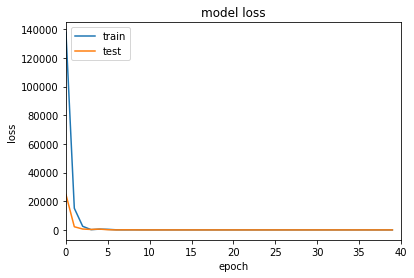

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 54.6705 - root_mean_squared_error: 7.3901 - val_loss: 46.8568 - val_root_mean_squared_error: 6.8411
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 54.5845 - root_mean_squared_error: 7.3843 - val_loss: 47.2799 - val_root_mean_squared_error: 6.8719
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 54.6720 - root_mean_squared_error: 7.3902 - val_loss: 47.3628 - val_root_mean_squared_error: 6.8780
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 54.0945 - root_mean_squared_error: 7.3511 - val_loss: 45.8537 - val_root_mean_squared_error: 6.7674
Epoch 45/60
6/6 [==============================] - 0s 14ms/step - loss: 54.2098 - root_mean_squared_error: 7.3589 - val_loss: 45.8620 - val_root_mean_squared_error: 6.7680
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 53.9299 - root_mean_squared_error: 7.3399 - val_loss: 46.1175 - val_

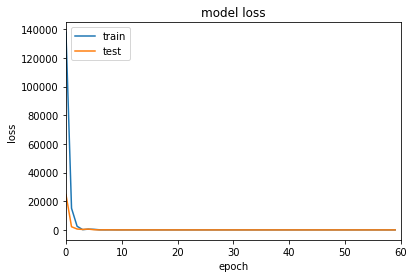

Epoch 1/20
6/6 [==============================] - 1s 38ms/step - loss: 92357.5000 - root_mean_squared_error: 303.9037 - val_loss: 29761.6113 - val_root_mean_squared_error: 172.5155
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 8346.2910 - root_mean_squared_error: 91.3580 - val_loss: 3268.6145 - val_root_mean_squared_error: 57.1717
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 2303.7336 - root_mean_squared_error: 47.9971 - val_loss: 618.1099 - val_root_mean_squared_error: 24.8616
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 442.1022 - root_mean_squared_error: 21.0260 - val_loss: 266.7906 - val_root_mean_squared_error: 16.3334
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 244.7166 - root_mean_squared_error: 15.6431 - val_loss: 155.7927 - val_root_mean_squared_error: 12.4812
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 134.2829 - root_mean_squared_error: 11.5875 - 

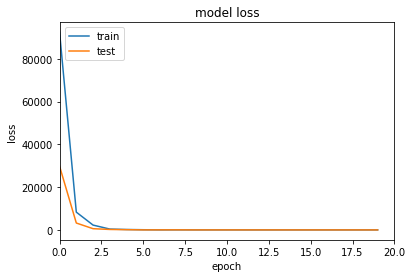

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 56.1422 - root_mean_squared_error: 7.4919 - val_loss: 47.9960 - val_root_mean_squared_error: 6.9270
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 55.5726 - root_mean_squared_error: 7.4538 - val_loss: 46.8012 - val_root_mean_squared_error: 6.8402
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 55.1059 - root_mean_squared_error: 7.4225 - val_loss: 45.6961 - val_root_mean_squared_error: 6.7589
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 55.3297 - root_mean_squared_error: 7.4375 - val_loss: 46.1928 - val_root_mean_squared_error: 6.7956
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 55.1241 - root_mean_squared_error: 7.4237 - val_loss: 45.2970 - val_root_mean_squared_error: 6.7293
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 54.2591 - root_mean_squared_error: 7.3652 - val_loss: 47.2858 - val_roo

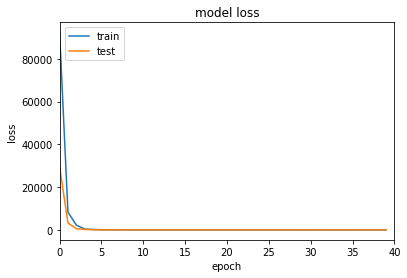

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 48.9377 - root_mean_squared_error: 6.9946 - val_loss: 40.7372 - val_root_mean_squared_error: 6.3815
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 48.7600 - root_mean_squared_error: 6.9819 - val_loss: 38.8696 - val_root_mean_squared_error: 6.2335
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 48.1332 - root_mean_squared_error: 6.9369 - val_loss: 41.1993 - val_root_mean_squared_error: 6.4177
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 47.2679 - root_mean_squared_error: 6.8742 - val_loss: 38.5102 - val_root_mean_squared_error: 6.2046
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 45.9536 - root_mean_squared_error: 6.7779 - val_loss: 40.4411 - val_root_mean_squared_error: 6.3583
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 46.2791 - root_mean_squared_error: 6.8019 - val_loss: 38.7957 - val_roo

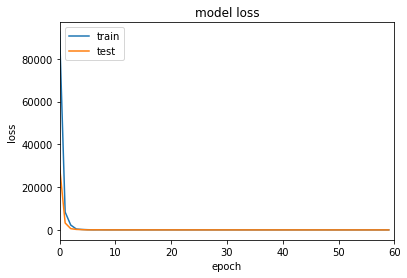

Epoch 1/20
6/6 [==============================] - 1s 43ms/step - loss: 187.6880 - root_mean_squared_error: 13.6126 - val_loss: 105.6574 - val_root_mean_squared_error: 10.0641
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 98.5056 - root_mean_squared_error: 9.6458 - val_loss: 77.9019 - val_root_mean_squared_error: 8.4313
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 89.2949 - root_mean_squared_error: 9.0533 - val_loss: 74.3972 - val_root_mean_squared_error: 8.1524
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 91.5277 - root_mean_squared_error: 9.1325 - val_loss: 74.9490 - val_root_mean_squared_error: 8.1643
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 83.4465 - root_mean_squared_error: 8.6694 - val_loss: 75.9879 - val_root_mean_squared_error: 8.2319
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 87.1644 - root_mean_squared_error: 8.8893 - val_loss: 72.9799 - val_root_

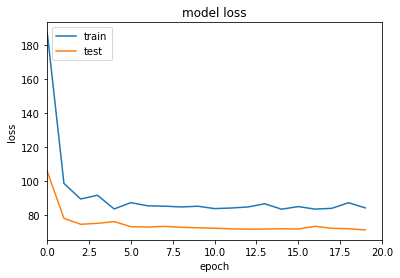

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 82.6825 - root_mean_squared_error: 8.7696 - val_loss: 71.9597 - val_root_mean_squared_error: 8.1286
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 82.3047 - root_mean_squared_error: 8.7408 - val_loss: 71.6000 - val_root_mean_squared_error: 8.1051
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 83.3703 - root_mean_squared_error: 8.8032 - val_loss: 72.4558 - val_root_mean_squared_error: 8.1654
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 82.9102 - root_mean_squared_error: 8.7879 - val_loss: 70.7979 - val_root_mean_squared_error: 8.0799
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 83.4841 - root_mean_squared_error: 8.8341 - val_loss: 71.0568 - val_root_mean_squared_error: 8.1038
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 85.2829 - root_mean_squared_error: 8.9414 - val_loss: 70.5084 - val_roo

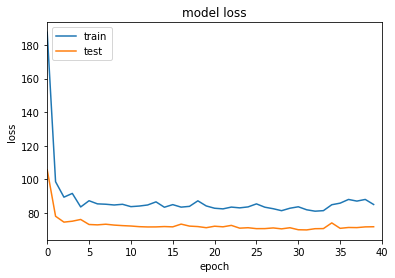

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 83.4654 - root_mean_squared_error: 8.8300 - val_loss: 71.7824 - val_root_mean_squared_error: 8.1475
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 83.7253 - root_mean_squared_error: 8.8547 - val_loss: 70.4687 - val_root_mean_squared_error: 8.0804
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 89.7299 - root_mean_squared_error: 9.1975 - val_loss: 70.4015 - val_root_mean_squared_error: 8.0794
Epoch 44/60
6/6 [==============================] - 0s 13ms/step - loss: 83.8396 - root_mean_squared_error: 8.8714 - val_loss: 72.5074 - val_root_mean_squared_error: 8.2050
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 84.5062 - root_mean_squared_error: 8.9046 - val_loss: 74.7036 - val_root_mean_squared_error: 8.3352
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 82.9976 - root_mean_squared_error: 8.8209 - val_loss: 72.0847 - val_roo

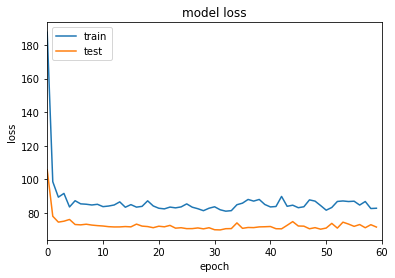

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 181.8521 - root_mean_squared_error: 13.4103 - val_loss: 88.9709 - val_root_mean_squared_error: 9.2449
Epoch 2/20
6/6 [==============================] - 0s 14ms/step - loss: 86.6113 - root_mean_squared_error: 9.0732 - val_loss: 75.5381 - val_root_mean_squared_error: 8.3867
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 85.9388 - root_mean_squared_error: 8.9628 - val_loss: 75.7755 - val_root_mean_squared_error: 8.3455
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 84.9113 - root_mean_squared_error: 8.8648 - val_loss: 72.2694 - val_root_mean_squared_error: 8.1045
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 84.8726 - root_mean_squared_error: 8.8440 - val_loss: 71.9027 - val_root_mean_squared_error: 8.0731
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 84.0325 - root_mean_squared_error: 8.7920 - val_loss: 71.3780 - val_root_me

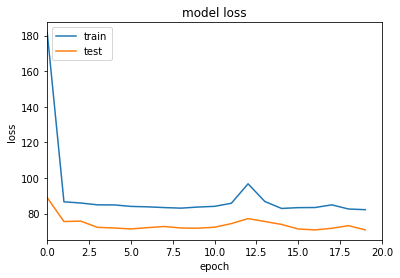

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 83.2733 - root_mean_squared_error: 8.8352 - val_loss: 70.5131 - val_root_mean_squared_error: 8.0839
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 82.9938 - root_mean_squared_error: 8.8237 - val_loss: 70.9156 - val_root_mean_squared_error: 8.1124
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 82.6163 - root_mean_squared_error: 8.8051 - val_loss: 71.2415 - val_root_mean_squared_error: 8.1349
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 83.3570 - root_mean_squared_error: 8.8492 - val_loss: 70.4342 - val_root_mean_squared_error: 8.0874
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 82.7413 - root_mean_squared_error: 8.8164 - val_loss: 70.2440 - val_root_mean_squared_error: 8.0785
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 83.3823 - root_mean_squared_error: 8.8549 - val_loss: 70.9277 - val_r

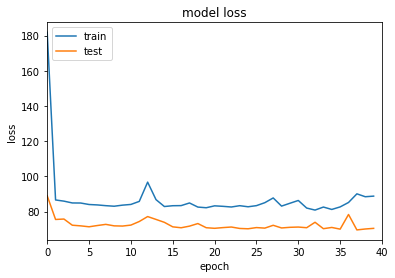

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 84.5325 - root_mean_squared_error: 8.9568 - val_loss: 70.4328 - val_root_mean_squared_error: 8.1251
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 82.7345 - root_mean_squared_error: 8.8479 - val_loss: 69.8250 - val_root_mean_squared_error: 8.0813
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 83.6188 - root_mean_squared_error: 8.8923 - val_loss: 72.1527 - val_root_mean_squared_error: 8.2194
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 85.7787 - root_mean_squared_error: 9.0095 - val_loss: 72.7930 - val_root_mean_squared_error: 8.2541
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 81.8885 - root_mean_squared_error: 8.7838 - val_loss: 70.5527 - val_root_mean_squared_error: 8.1081
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 82.8411 - root_mean_squared_error: 8.8312 - val_loss: 70.1937 - val_root

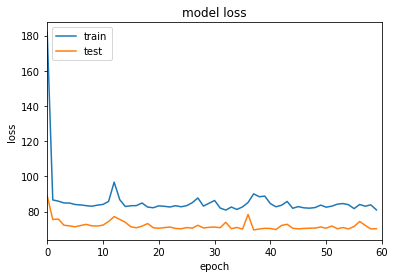

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 203.4727 - root_mean_squared_error: 14.1957 - val_loss: 93.3030 - val_root_mean_squared_error: 9.4929
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 92.8919 - root_mean_squared_error: 9.4358 - val_loss: 71.4496 - val_root_mean_squared_error: 8.1705
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 86.6646 - root_mean_squared_error: 9.0342 - val_loss: 72.6130 - val_root_mean_squared_error: 8.1909
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 83.8687 - root_mean_squared_error: 8.8400 - val_loss: 75.6099 - val_root_mean_squared_error: 8.3447
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 84.5016 - root_mean_squared_error: 8.8568 - val_loss: 71.4615 - val_root_mean_squared_error: 8.0815
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 84.1102 - root_mean_squared_error: 8.8292 - val_loss: 71.6469 - val_root_me

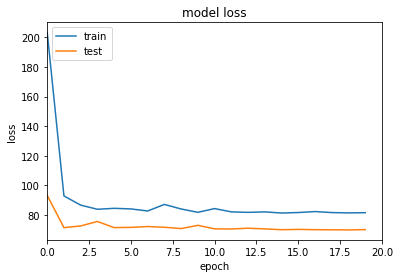

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 82.0719 - root_mean_squared_error: 8.8088 - val_loss: 69.1516 - val_root_mean_squared_error: 8.0471
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 82.5749 - root_mean_squared_error: 8.8415 - val_loss: 73.1558 - val_root_mean_squared_error: 8.2908
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 81.2635 - root_mean_squared_error: 8.7669 - val_loss: 70.1994 - val_root_mean_squared_error: 8.1130
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 81.7700 - root_mean_squared_error: 8.7979 - val_loss: 69.6577 - val_root_mean_squared_error: 8.0810
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 82.0029 - root_mean_squared_error: 8.8117 - val_loss: 70.6455 - val_root_mean_squared_error: 8.1399
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 83.7891 - root_mean_squared_error: 8.9088 - val_loss: 69.7694 - val_roo

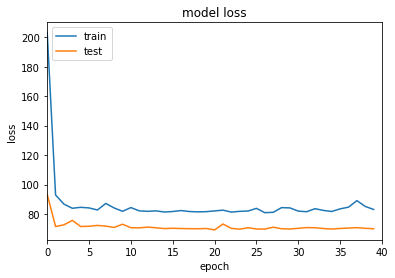

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 83.3823 - root_mean_squared_error: 8.8742 - val_loss: 69.9421 - val_root_mean_squared_error: 8.0850
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 82.6999 - root_mean_squared_error: 8.8404 - val_loss: 70.0187 - val_root_mean_squared_error: 8.0939
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 81.0091 - root_mean_squared_error: 8.7485 - val_loss: 70.1076 - val_root_mean_squared_error: 8.1036
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 81.5529 - root_mean_squared_error: 8.7830 - val_loss: 69.7422 - val_root_mean_squared_error: 8.0854
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 82.5785 - root_mean_squared_error: 8.8459 - val_loss: 72.5856 - val_root_mean_squared_error: 8.2622
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 87.1047 - root_mean_squared_error: 9.0961 - val_loss: 72.6995 - val_root

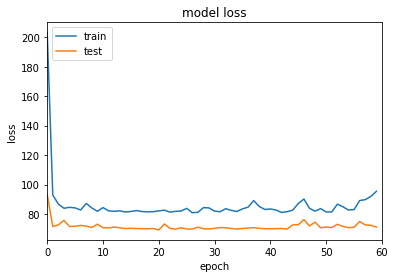

Epoch 1/20
6/6 [==============================] - 1s 124ms/step - loss: 164.0846 - root_mean_squared_error: 12.7324 - val_loss: 95.2443 - val_root_mean_squared_error: 9.5880
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 86.2239 - root_mean_squared_error: 9.0675 - val_loss: 71.9531 - val_root_mean_squared_error: 8.1908
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 82.5924 - root_mean_squared_error: 8.7939 - val_loss: 70.9843 - val_root_mean_squared_error: 8.0784
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 82.7649 - root_mean_squared_error: 8.7664 - val_loss: 75.1551 - val_root_mean_squared_error: 8.3070
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 84.8010 - root_mean_squared_error: 8.8637 - val_loss: 71.6043 - val_root_mean_squared_error: 8.0796
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 84.5105 - root_mean_squared_error: 8.8421 - val_loss: 73.4681 - val_root_

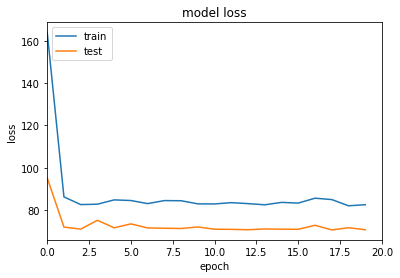

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 82.1414 - root_mean_squared_error: 8.7773 - val_loss: 71.2246 - val_root_mean_squared_error: 8.1319
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 82.7448 - root_mean_squared_error: 8.8121 - val_loss: 70.9425 - val_root_mean_squared_error: 8.1139
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 83.4212 - root_mean_squared_error: 8.8484 - val_loss: 71.1185 - val_root_mean_squared_error: 8.1220
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 81.9566 - root_mean_squared_error: 8.7646 - val_loss: 71.2937 - val_root_mean_squared_error: 8.1349
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 84.6076 - root_mean_squared_error: 8.9165 - val_loss: 74.7219 - val_root_mean_squared_error: 8.3456
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 83.7085 - root_mean_squared_error: 8.8695 - val_loss: 70.5277 - val_root

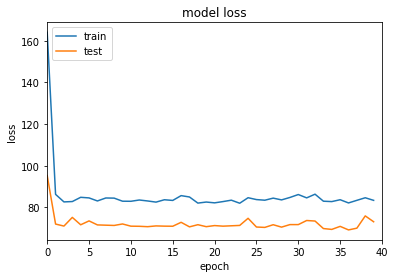

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 81.8092 - root_mean_squared_error: 8.8251 - val_loss: 71.2676 - val_root_mean_squared_error: 8.2032
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 80.2598 - root_mean_squared_error: 8.7339 - val_loss: 70.1376 - val_root_mean_squared_error: 8.1347
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 82.7862 - root_mean_squared_error: 8.8795 - val_loss: 70.6110 - val_root_mean_squared_error: 8.1679
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 81.5884 - root_mean_squared_error: 8.8165 - val_loss: 69.0960 - val_root_mean_squared_error: 8.0792
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 80.9306 - root_mean_squared_error: 8.7796 - val_loss: 69.2071 - val_root_mean_squared_error: 8.0832
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 81.3840 - root_mean_squared_error: 8.8037 - val_loss: 69.3856 - val_ro

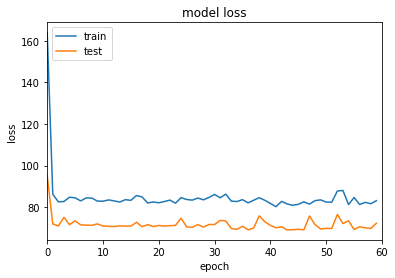

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 190.9671 - root_mean_squared_error: 13.7960 - val_loss: 114.2425 - val_root_mean_squared_error: 10.6231
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 91.7171 - root_mean_squared_error: 9.4790 - val_loss: 72.7648 - val_root_mean_squared_error: 8.3815
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 87.3279 - root_mean_squared_error: 9.1927 - val_loss: 68.5466 - val_root_mean_squared_error: 8.0828
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 81.1523 - root_mean_squared_error: 8.8196 - val_loss: 72.8979 - val_root_mean_squared_error: 8.3277
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 82.3394 - root_mean_squared_error: 8.8733 - val_loss: 70.1441 - val_root_mean_squared_error: 8.1544
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 82.8146 - root_mean_squared_error: 8.8979 - val_loss: 69.4791 - val_ro

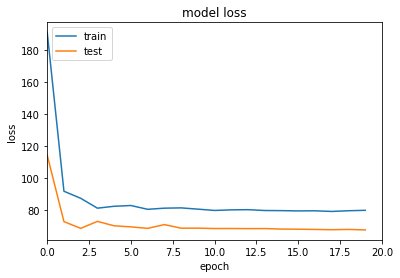

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 79.9436 - root_mean_squared_error: 8.8110 - val_loss: 67.5995 - val_root_mean_squared_error: 8.0801
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 81.0006 - root_mean_squared_error: 8.8713 - val_loss: 68.0461 - val_root_mean_squared_error: 8.1100
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 79.7256 - root_mean_squared_error: 8.8021 - val_loss: 67.5181 - val_root_mean_squared_error: 8.0813
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 80.1230 - root_mean_squared_error: 8.8283 - val_loss: 67.5374 - val_root_mean_squared_error: 8.0862
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 79.3019 - root_mean_squared_error: 8.7840 - val_loss: 67.4696 - val_root_mean_squared_error: 8.0833
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 78.5942 - root_mean_squared_error: 8.7450 - val_loss: 67.3884 - val_

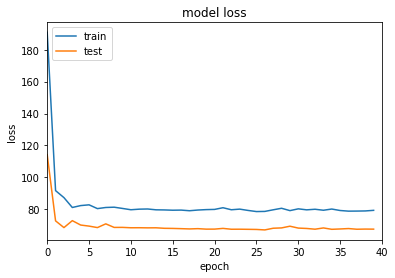

Epoch 41/60
6/6 [==============================] - 0s 22ms/step - loss: 79.5654 - root_mean_squared_error: 8.7952 - val_loss: 67.4760 - val_root_mean_squared_error: 8.0808
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 80.8782 - root_mean_squared_error: 8.8728 - val_loss: 69.2200 - val_root_mean_squared_error: 8.1921
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 79.1528 - root_mean_squared_error: 8.7790 - val_loss: 68.1948 - val_root_mean_squared_error: 8.1335
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 78.9988 - root_mean_squared_error: 8.7739 - val_loss: 68.1880 - val_root_mean_squared_error: 8.1366
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 79.1177 - root_mean_squared_error: 8.7841 - val_loss: 67.4909 - val_root_mean_squared_error: 8.0978
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 79.0483 - root_mean_squared_error: 8.7840 - val_loss: 67.5731 - val_roo

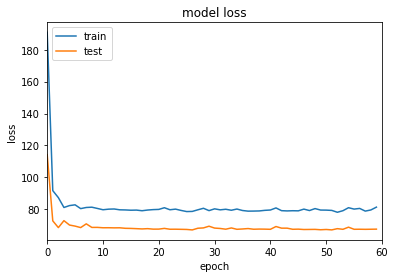

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 151.4369 - root_mean_squared_error: 12.2957 - val_loss: 103.0916 - val_root_mean_squared_error: 10.1311
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 85.2094 - root_mean_squared_error: 9.2005 - val_loss: 71.9097 - val_root_mean_squared_error: 8.4386
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 78.1228 - root_mean_squared_error: 8.7955 - val_loss: 72.3351 - val_root_mean_squared_error: 8.4554
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 81.1557 - root_mean_squared_error: 8.9597 - val_loss: 67.3786 - val_root_mean_squared_error: 8.1517
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 79.0028 - root_mean_squared_error: 8.8349 - val_loss: 67.1249 - val_root_mean_squared_error: 8.1336
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 78.9595 - root_mean_squared_error: 8.8308 - val_loss: 66.6150 - val_root_

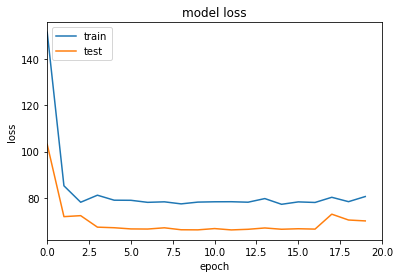

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 81.2749 - root_mean_squared_error: 8.9700 - val_loss: 68.1216 - val_root_mean_squared_error: 8.2042
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 84.5137 - root_mean_squared_error: 9.1488 - val_loss: 73.4864 - val_root_mean_squared_error: 8.5248
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 81.1827 - root_mean_squared_error: 8.9650 - val_loss: 66.4362 - val_root_mean_squared_error: 8.1011
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.8145 - root_mean_squared_error: 8.7756 - val_loss: 66.6305 - val_root_mean_squared_error: 8.1138
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 80.6278 - root_mean_squared_error: 8.9350 - val_loss: 66.0504 - val_root_mean_squared_error: 8.0786
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 85.3913 - root_mean_squared_error: 9.1983 - val_loss: 66.4820 - val_ro

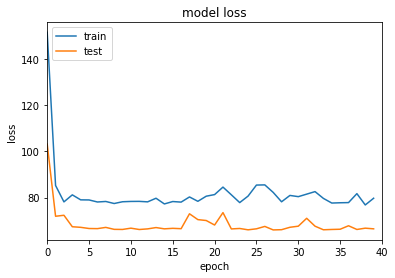

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 79.5279 - root_mean_squared_error: 8.8723 - val_loss: 66.5152 - val_root_mean_squared_error: 8.1057
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 79.6266 - root_mean_squared_error: 8.8776 - val_loss: 66.2091 - val_root_mean_squared_error: 8.0865
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 79.0245 - root_mean_squared_error: 8.8433 - val_loss: 66.0857 - val_root_mean_squared_error: 8.0784
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 78.7876 - root_mean_squared_error: 8.8296 - val_loss: 66.1081 - val_root_mean_squared_error: 8.0795
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 78.2416 - root_mean_squared_error: 8.7983 - val_loss: 66.3290 - val_root_mean_squared_error: 8.0931
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 78.1583 - root_mean_squared_error: 8.7935 - val_loss: 68.0144 - val_r

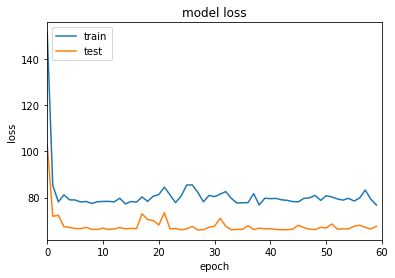

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 172.6239 - root_mean_squared_error: 13.1303 - val_loss: 78.2574 - val_root_mean_squared_error: 8.8245
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 84.1455 - root_mean_squared_error: 9.1474 - val_loss: 66.0788 - val_root_mean_squared_error: 8.0936
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 78.2893 - root_mean_squared_error: 8.8133 - val_loss: 66.1414 - val_root_mean_squared_error: 8.0917
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 77.9859 - root_mean_squared_error: 8.7920 - val_loss: 66.0100 - val_root_mean_squared_error: 8.0805
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 77.7611 - root_mean_squared_error: 8.7767 - val_loss: 66.0201 - val_root_mean_squared_error: 8.0792
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 78.4333 - root_mean_squared_error: 8.8135 - val_loss: 66.7575 - val_root_mea

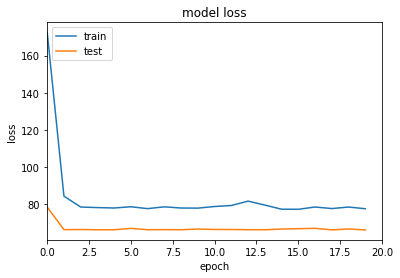

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 78.7628 - root_mean_squared_error: 8.8373 - val_loss: 66.0797 - val_root_mean_squared_error: 8.0885
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 79.1178 - root_mean_squared_error: 8.8582 - val_loss: 65.9910 - val_root_mean_squared_error: 8.0839
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 81.3105 - root_mean_squared_error: 8.9818 - val_loss: 66.5280 - val_root_mean_squared_error: 8.1175
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 77.8466 - root_mean_squared_error: 8.7872 - val_loss: 66.0167 - val_root_mean_squared_error: 8.0865
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 77.3635 - root_mean_squared_error: 8.7602 - val_loss: 66.1016 - val_root_mean_squared_error: 8.0921
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 77.5440 - root_mean_squared_error: 8.7707 - val_loss: 66.7797 - val_root

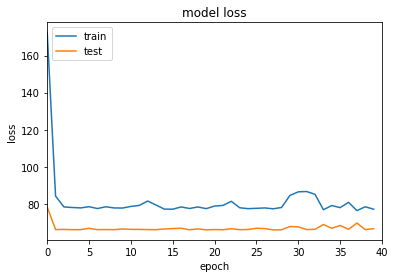

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 77.9451 - root_mean_squared_error: 8.7938 - val_loss: 65.9951 - val_root_mean_squared_error: 8.0858
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 78.8963 - root_mean_squared_error: 8.8476 - val_loss: 65.2724 - val_root_mean_squared_error: 8.0407
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 78.8341 - root_mean_squared_error: 8.8435 - val_loss: 65.8992 - val_root_mean_squared_error: 8.0786
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 78.4863 - root_mean_squared_error: 8.8231 - val_loss: 67.1659 - val_root_mean_squared_error: 8.1563
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 78.4568 - root_mean_squared_error: 8.8213 - val_loss: 65.8988 - val_root_mean_squared_error: 8.0784
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.5585 - root_mean_squared_error: 8.7705 - val_loss: 65.9957 - val_roo

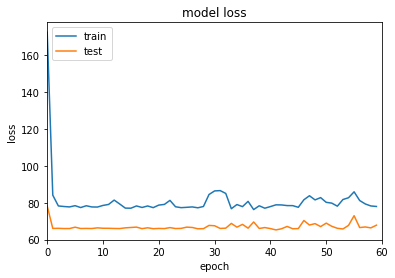

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 160.8615 - root_mean_squared_error: 12.6743 - val_loss: 90.2482 - val_root_mean_squared_error: 9.4794
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 83.1999 - root_mean_squared_error: 9.0955 - val_loss: 78.5631 - val_root_mean_squared_error: 8.8313
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 82.3801 - root_mean_squared_error: 9.0423 - val_loss: 73.8697 - val_root_mean_squared_error: 8.5557
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 81.4506 - root_mean_squared_error: 8.9866 - val_loss: 66.0639 - val_root_mean_squared_error: 8.0836
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 79.1149 - root_mean_squared_error: 8.8538 - val_loss: 65.9991 - val_root_mean_squared_error: 8.0788
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 78.0858 - root_mean_squared_error: 8.7950 - val_loss: 66.5928 - val_root_me

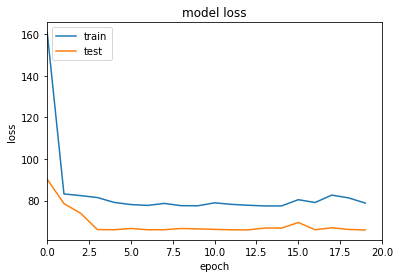

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 80.2170 - root_mean_squared_error: 8.9210 - val_loss: 66.9454 - val_root_mean_squared_error: 8.1436
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 79.0068 - root_mean_squared_error: 8.8533 - val_loss: 65.9230 - val_root_mean_squared_error: 8.0807
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 77.8019 - root_mean_squared_error: 8.7851 - val_loss: 66.1188 - val_root_mean_squared_error: 8.0930
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.5972 - root_mean_squared_error: 8.7737 - val_loss: 65.9720 - val_root_mean_squared_error: 8.0845
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 77.7121 - root_mean_squared_error: 8.7809 - val_loss: 66.3583 - val_root_mean_squared_error: 8.1090
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 77.6414 - root_mean_squared_error: 8.7774 - val_loss: 66.9057 - val_roo

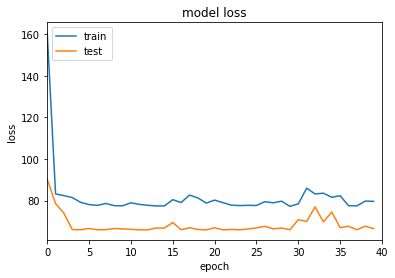

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 79.6105 - root_mean_squared_error: 8.8908 - val_loss: 66.5153 - val_root_mean_squared_error: 8.1210
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 78.9635 - root_mean_squared_error: 8.8544 - val_loss: 67.1473 - val_root_mean_squared_error: 8.1599
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 84.4176 - root_mean_squared_error: 9.1572 - val_loss: 79.4198 - val_root_mean_squared_error: 8.8800
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 85.6486 - root_mean_squared_error: 9.2239 - val_loss: 71.1776 - val_root_mean_squared_error: 8.4028
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 83.9971 - root_mean_squared_error: 9.1338 - val_loss: 75.2434 - val_root_mean_squared_error: 8.6414
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 80.7710 - root_mean_squared_error: 8.9556 - val_loss: 69.2090 - val_r

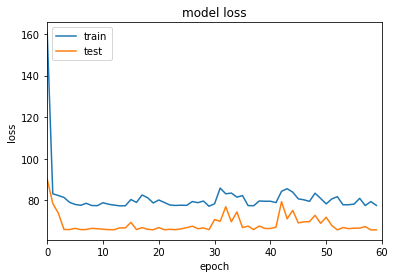

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 174.8186 - root_mean_squared_error: 13.2047 - val_loss: 82.8409 - val_root_mean_squared_error: 9.0441
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 84.4788 - root_mean_squared_error: 9.1134 - val_loss: 70.2906 - val_root_mean_squared_error: 8.2663
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 81.8544 - root_mean_squared_error: 8.9240 - val_loss: 68.7810 - val_root_mean_squared_error: 8.1380
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 79.2139 - root_mean_squared_error: 8.7464 - val_loss: 68.3605 - val_root_mean_squared_error: 8.0886
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 80.3478 - root_mean_squared_error: 8.7925 - val_loss: 69.1455 - val_root_mean_squared_error: 8.1229
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 80.7674 - root_mean_squared_error: 8.8074 - val_loss: 68.9520 - val_root_me

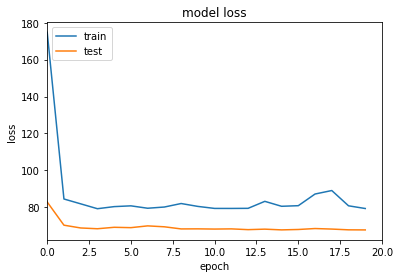

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 78.8898 - root_mean_squared_error: 8.7486 - val_loss: 68.4648 - val_root_mean_squared_error: 8.1333
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 80.6712 - root_mean_squared_error: 8.8522 - val_loss: 68.1910 - val_root_mean_squared_error: 8.1155
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 82.1392 - root_mean_squared_error: 8.9325 - val_loss: 68.0760 - val_root_mean_squared_error: 8.1057
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 81.1190 - root_mean_squared_error: 8.8733 - val_loss: 67.7561 - val_root_mean_squared_error: 8.0851
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 79.0503 - root_mean_squared_error: 8.7565 - val_loss: 68.6364 - val_root_mean_squared_error: 8.1423
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 78.9940 - root_mean_squared_error: 8.7573 - val_loss: 68.3731 - val_ro

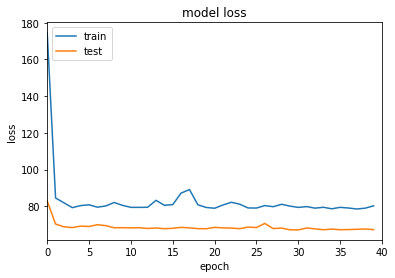

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 85.4268 - root_mean_squared_error: 9.1353 - val_loss: 68.2400 - val_root_mean_squared_error: 8.1406
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 84.7381 - root_mean_squared_error: 9.0975 - val_loss: 67.2383 - val_root_mean_squared_error: 8.0786
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 86.8695 - root_mean_squared_error: 9.2142 - val_loss: 68.1408 - val_root_mean_squared_error: 8.1357
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 82.5207 - root_mean_squared_error: 8.9769 - val_loss: 70.2298 - val_root_mean_squared_error: 8.2656
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 81.4113 - root_mean_squared_error: 8.9173 - val_loss: 68.0178 - val_root_mean_squared_error: 8.1331
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 79.9698 - root_mean_squared_error: 8.8382 - val_loss: 69.1165 - val_roo

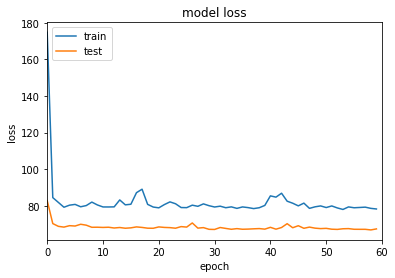

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 182.5092 - root_mean_squared_error: 13.5070 - val_loss: 98.2845 - val_root_mean_squared_error: 9.9058
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 87.2469 - root_mean_squared_error: 9.3291 - val_loss: 75.1128 - val_root_mean_squared_error: 8.6501
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 83.1510 - root_mean_squared_error: 9.1010 - val_loss: 66.6130 - val_root_mean_squared_error: 8.1391
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 81.0930 - root_mean_squared_error: 8.9836 - val_loss: 69.6453 - val_root_mean_squared_error: 8.3206
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 83.3536 - root_mean_squared_error: 9.1066 - val_loss: 68.0169 - val_root_mean_squared_error: 8.2209
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 79.0629 - root_mean_squared_error: 8.8671 - val_loss: 68.2776 - val_root_mea

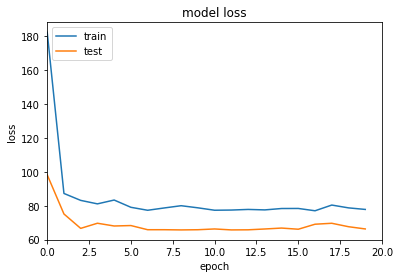

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 77.1900 - root_mean_squared_error: 8.7633 - val_loss: 66.1789 - val_root_mean_squared_error: 8.1108
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 77.4500 - root_mean_squared_error: 8.7782 - val_loss: 65.7864 - val_root_mean_squared_error: 8.0866
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 78.2883 - root_mean_squared_error: 8.8257 - val_loss: 65.8307 - val_root_mean_squared_error: 8.0891
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 80.1323 - root_mean_squared_error: 8.9294 - val_loss: 65.9963 - val_root_mean_squared_error: 8.0992
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 78.0745 - root_mean_squared_error: 8.8133 - val_loss: 65.8385 - val_root_mean_squared_error: 8.0892
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 78.9224 - root_mean_squared_error: 8.8610 - val_loss: 66.2161 - val_roo

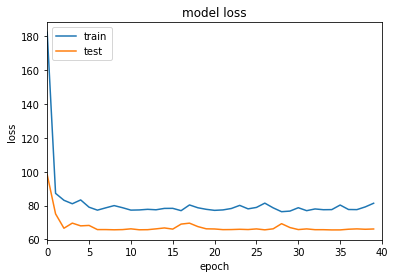

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 77.3514 - root_mean_squared_error: 8.7717 - val_loss: 67.3770 - val_root_mean_squared_error: 8.1835
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 78.2144 - root_mean_squared_error: 8.8208 - val_loss: 70.0076 - val_root_mean_squared_error: 8.3423
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 79.6150 - root_mean_squared_error: 8.8993 - val_loss: 66.7299 - val_root_mean_squared_error: 8.1429
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 80.2818 - root_mean_squared_error: 8.9362 - val_loss: 66.7531 - val_root_mean_squared_error: 8.1441
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 80.8134 - root_mean_squared_error: 8.9659 - val_loss: 65.9595 - val_root_mean_squared_error: 8.0955
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 81.1416 - root_mean_squared_error: 8.9846 - val_loss: 65.9672 - val_ro

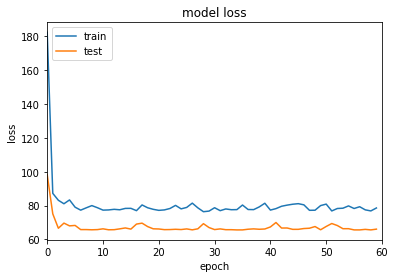

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 189.8407 - root_mean_squared_error: 13.7773 - val_loss: 104.5204 - val_root_mean_squared_error: 10.2210
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 86.4554 - root_mean_squared_error: 9.2946 - val_loss: 75.0851 - val_root_mean_squared_error: 8.6604
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 82.8754 - root_mean_squared_error: 9.0986 - val_loss: 67.0461 - val_root_mean_squared_error: 8.1821
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 85.0185 - root_mean_squared_error: 9.2149 - val_loss: 65.6259 - val_root_mean_squared_error: 8.0942
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 82.3601 - root_mean_squared_error: 9.0691 - val_loss: 67.6758 - val_root_mean_squared_error: 8.2195
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 82.1002 - root_mean_squared_error: 9.0545 - val_loss: 69.3494 - val_roo

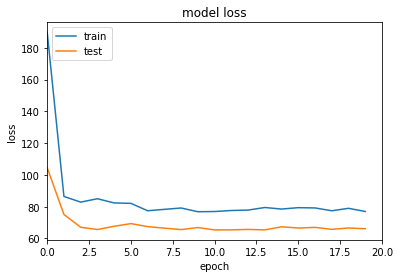

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 76.6571 - root_mean_squared_error: 8.7492 - val_loss: 66.7984 - val_root_mean_squared_error: 8.1664
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 77.4145 - root_mean_squared_error: 8.7924 - val_loss: 65.4847 - val_root_mean_squared_error: 8.0856
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.8671 - root_mean_squared_error: 8.7612 - val_loss: 65.8221 - val_root_mean_squared_error: 8.1064
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 78.7651 - root_mean_squared_error: 8.8689 - val_loss: 65.6757 - val_root_mean_squared_error: 8.0974
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 77.8394 - root_mean_squared_error: 8.8166 - val_loss: 66.5001 - val_root_mean_squared_error: 8.1482
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 78.3429 - root_mean_squared_error: 8.8451 - val_loss: 65.5035 - val_roo

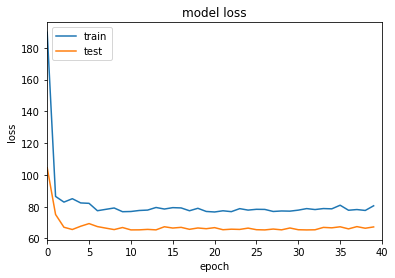

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 78.2190 - root_mean_squared_error: 8.8384 - val_loss: 65.3777 - val_root_mean_squared_error: 8.0794
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 76.7454 - root_mean_squared_error: 8.7546 - val_loss: 66.3388 - val_root_mean_squared_error: 8.1386
Epoch 43/60
6/6 [==============================] - 0s 13ms/step - loss: 78.7106 - root_mean_squared_error: 8.8661 - val_loss: 66.5152 - val_root_mean_squared_error: 8.1494
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 79.1047 - root_mean_squared_error: 8.8883 - val_loss: 65.4663 - val_root_mean_squared_error: 8.0848
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 80.4367 - root_mean_squared_error: 8.9630 - val_loss: 65.6945 - val_root_mean_squared_error: 8.0990
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 78.5613 - root_mean_squared_error: 8.8578 - val_loss: 65.3806 - val_

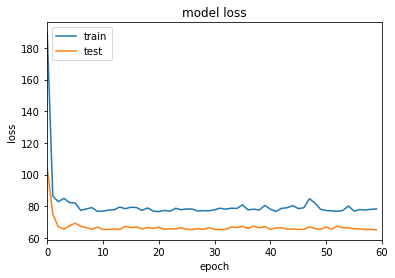

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 218.1193 - root_mean_squared_error: 14.7681 - val_loss: 93.9465 - val_root_mean_squared_error: 9.6904
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 85.5633 - root_mean_squared_error: 9.2472 - val_loss: 72.4523 - val_root_mean_squared_error: 8.5082
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 79.9752 - root_mean_squared_error: 8.9392 - val_loss: 68.0497 - val_root_mean_squared_error: 8.2449
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 78.0893 - root_mean_squared_error: 8.8327 - val_loss: 65.9056 - val_root_mean_squared_error: 8.1136
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 77.8128 - root_mean_squared_error: 8.8168 - val_loss: 65.4086 - val_root_mean_squared_error: 8.0827
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 76.9919 - root_mean_squared_error: 8.7699 - val_loss: 65.4868 - val_root_mean

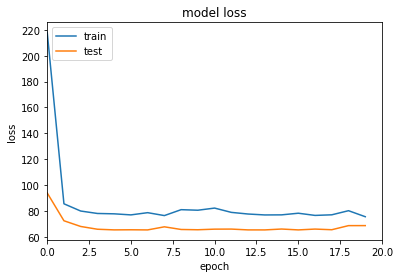

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 79.3407 - root_mean_squared_error: 8.9030 - val_loss: 69.6634 - val_root_mean_squared_error: 8.3419
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 78.0028 - root_mean_squared_error: 8.8276 - val_loss: 66.4539 - val_root_mean_squared_error: 8.1472
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 78.7438 - root_mean_squared_error: 8.8694 - val_loss: 67.9806 - val_root_mean_squared_error: 8.2404
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 78.9316 - root_mean_squared_error: 8.8800 - val_loss: 68.0483 - val_root_mean_squared_error: 8.2445
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 87.7797 - root_mean_squared_error: 9.3650 - val_loss: 75.9758 - val_root_mean_squared_error: 8.7120
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 88.7862 - root_mean_squared_error: 9.4185 - val_loss: 65.5491 - val_roo

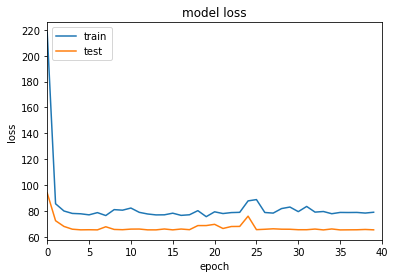

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 81.0928 - root_mean_squared_error: 9.0011 - val_loss: 66.0746 - val_root_mean_squared_error: 8.1241
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 74.9393 - root_mean_squared_error: 8.6525 - val_loss: 68.0331 - val_root_mean_squared_error: 8.2438
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 80.6518 - root_mean_squared_error: 8.9766 - val_loss: 67.7598 - val_root_mean_squared_error: 8.2272
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 78.9344 - root_mean_squared_error: 8.8804 - val_loss: 65.3467 - val_root_mean_squared_error: 8.0793
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 78.6798 - root_mean_squared_error: 8.8661 - val_loss: 65.3325 - val_root_mean_squared_error: 8.0784
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 77.3389 - root_mean_squared_error: 8.7902 - val_loss: 67.1473 - val_ro

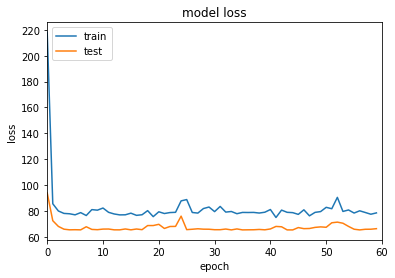

Epoch 1/20
6/6 [==============================] - 1s 40ms/step - loss: 173.2876 - root_mean_squared_error: 13.1482 - val_loss: 100.0006 - val_root_mean_squared_error: 9.9509
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 92.0639 - root_mean_squared_error: 9.5252 - val_loss: 67.7045 - val_root_mean_squared_error: 8.1169
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 80.4820 - root_mean_squared_error: 8.8557 - val_loss: 68.3654 - val_root_mean_squared_error: 8.1229
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 79.9646 - root_mean_squared_error: 8.7990 - val_loss: 68.0273 - val_root_mean_squared_error: 8.0794
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 80.9635 - root_mean_squared_error: 8.8391 - val_loss: 68.2036 - val_root_mean_squared_error: 8.0791
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 82.1214 - root_mean_squared_error: 8.8967 - val_loss: 68.4362 - val_root_me

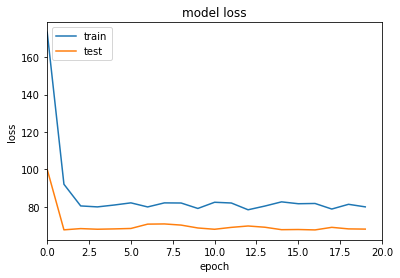

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 79.3825 - root_mean_squared_error: 8.7889 - val_loss: 67.3657 - val_root_mean_squared_error: 8.0784
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 79.2981 - root_mean_squared_error: 8.7874 - val_loss: 69.0793 - val_root_mean_squared_error: 8.1880
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 78.4133 - root_mean_squared_error: 8.7412 - val_loss: 67.7683 - val_root_mean_squared_error: 8.1123
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 79.8495 - root_mean_squared_error: 8.8271 - val_loss: 68.7350 - val_root_mean_squared_error: 8.1760
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 80.4649 - root_mean_squared_error: 8.8659 - val_loss: 64.6638 - val_root_mean_squared_error: 7.9276
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 78.4822 - root_mean_squared_error: 8.7567 - val_loss: 67.2105 - val_r

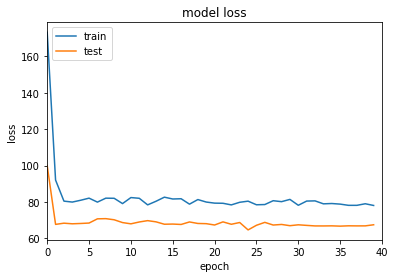

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 78.3876 - root_mean_squared_error: 8.7674 - val_loss: 66.8256 - val_root_mean_squared_error: 8.0819
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 78.1621 - root_mean_squared_error: 8.7557 - val_loss: 66.7621 - val_root_mean_squared_error: 8.0785
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 78.2682 - root_mean_squared_error: 8.7614 - val_loss: 66.7478 - val_root_mean_squared_error: 8.0771
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 78.9096 - root_mean_squared_error: 8.7968 - val_loss: 68.0827 - val_root_mean_squared_error: 8.1543
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 77.6638 - root_mean_squared_error: 8.7190 - val_loss: 67.8853 - val_root_mean_squared_error: 8.1344
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 80.5000 - root_mean_squared_error: 8.8741 - val_loss: 68.3903 - val_root

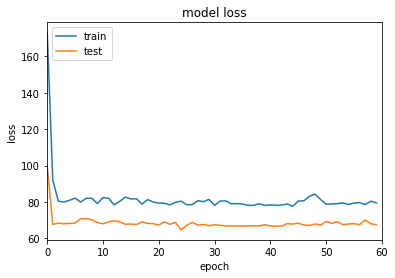

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 173.8032 - root_mean_squared_error: 13.1817 - val_loss: 98.3722 - val_root_mean_squared_error: 9.9125
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 92.7857 - root_mean_squared_error: 9.6244 - val_loss: 79.7852 - val_root_mean_squared_error: 8.9202
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 84.7955 - root_mean_squared_error: 9.1952 - val_loss: 73.4993 - val_root_mean_squared_error: 8.5567
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 81.7849 - root_mean_squared_error: 9.0270 - val_loss: 68.0953 - val_root_mean_squared_error: 8.2325
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 79.4427 - root_mean_squared_error: 8.8946 - val_loss: 66.4401 - val_root_mean_squared_error: 8.1303
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 81.7684 - root_mean_squared_error: 9.0237 - val_loss: 67.5218 - val_root_mean

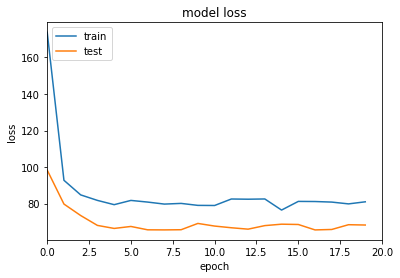

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 77.2435 - root_mean_squared_error: 8.7721 - val_loss: 66.1890 - val_root_mean_squared_error: 8.1178
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 78.6448 - root_mean_squared_error: 8.8519 - val_loss: 66.5950 - val_root_mean_squared_error: 8.1431
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 78.6859 - root_mean_squared_error: 8.8544 - val_loss: 65.9078 - val_root_mean_squared_error: 8.1008
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 78.8923 - root_mean_squared_error: 8.8661 - val_loss: 65.8100 - val_root_mean_squared_error: 8.0946
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 78.2896 - root_mean_squared_error: 8.8317 - val_loss: 65.8153 - val_root_mean_squared_error: 8.0944
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 78.7733 - root_mean_squared_error: 8.8586 - val_loss: 65.6542 - val_ro

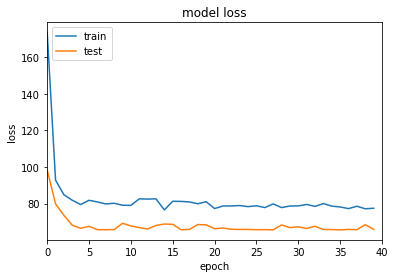

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 76.8881 - root_mean_squared_error: 8.7533 - val_loss: 66.4771 - val_root_mean_squared_error: 8.1367
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 79.2114 - root_mean_squared_error: 8.8847 - val_loss: 65.6222 - val_root_mean_squared_error: 8.0835
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 81.2051 - root_mean_squared_error: 8.9956 - val_loss: 65.6971 - val_root_mean_squared_error: 8.0874
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 84.5007 - root_mean_squared_error: 9.1764 - val_loss: 66.0449 - val_root_mean_squared_error: 8.1085
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 78.1566 - root_mean_squared_error: 8.8237 - val_loss: 66.3088 - val_root_mean_squared_error: 8.1246
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.0886 - root_mean_squared_error: 8.7630 - val_loss: 65.9012 - val_ro

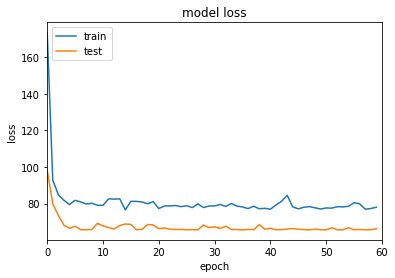

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 160.4773 - root_mean_squared_error: 12.6677 - val_loss: 109.2418 - val_root_mean_squared_error: 10.4511
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 88.1596 - root_mean_squared_error: 9.3882 - val_loss: 72.7521 - val_root_mean_squared_error: 8.5278
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 80.3806 - root_mean_squared_error: 8.9637 - val_loss: 66.8213 - val_root_mean_squared_error: 8.1721
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 79.3900 - root_mean_squared_error: 8.9079 - val_loss: 65.9054 - val_root_mean_squared_error: 8.1156
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 77.2366 - root_mean_squared_error: 8.7859 - val_loss: 65.6225 - val_root_mean_squared_error: 8.0980
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 82.0639 - root_mean_squared_error: 9.0564 - val_loss: 66.5654 - val_root_

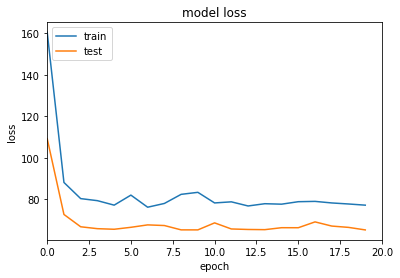

Epoch 21/40
6/6 [==============================] - 0s 21ms/step - loss: 77.0566 - root_mean_squared_error: 8.7757 - val_loss: 65.3392 - val_root_mean_squared_error: 8.0806
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 76.8180 - root_mean_squared_error: 8.7622 - val_loss: 65.6913 - val_root_mean_squared_error: 8.1024
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 77.4030 - root_mean_squared_error: 8.7955 - val_loss: 66.3595 - val_root_mean_squared_error: 8.1436
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 77.6577 - root_mean_squared_error: 8.8100 - val_loss: 68.3818 - val_root_mean_squared_error: 8.2668
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 83.8650 - root_mean_squared_error: 9.1555 - val_loss: 67.0007 - val_root_mean_squared_error: 8.1828
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 79.8741 - root_mean_squared_error: 8.9348 - val_loss: 68.1821 - val_ro

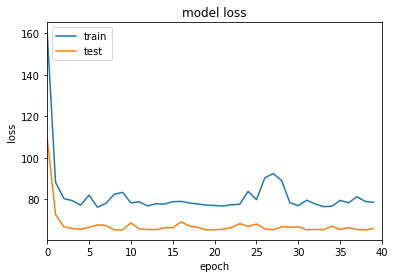

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 83.7501 - root_mean_squared_error: 9.1493 - val_loss: 65.3219 - val_root_mean_squared_error: 8.0798
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 82.3764 - root_mean_squared_error: 9.0740 - val_loss: 65.7038 - val_root_mean_squared_error: 8.1034
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 81.0946 - root_mean_squared_error: 9.0031 - val_loss: 65.3293 - val_root_mean_squared_error: 8.0803
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 77.9967 - root_mean_squared_error: 8.8294 - val_loss: 66.9827 - val_root_mean_squared_error: 8.1820
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 77.7999 - root_mean_squared_error: 8.8183 - val_loss: 65.3276 - val_root_mean_squared_error: 8.0802
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.9337 - root_mean_squared_error: 8.7690 - val_loss: 65.9197 - val_roo

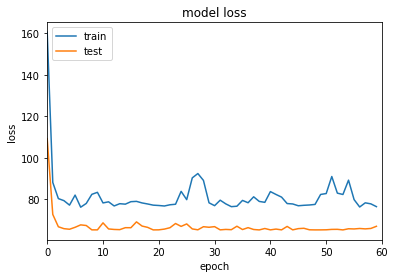

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 198.5318 - root_mean_squared_error: 14.0900 - val_loss: 88.9261 - val_root_mean_squared_error: 9.4298
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 84.0973 - root_mean_squared_error: 9.1701 - val_loss: 85.9180 - val_root_mean_squared_error: 9.2687
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 86.5242 - root_mean_squared_error: 9.3013 - val_loss: 72.5166 - val_root_mean_squared_error: 8.5151
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 86.7082 - root_mean_squared_error: 9.3111 - val_loss: 65.4055 - val_root_mean_squared_error: 8.0867
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 77.8634 - root_mean_squared_error: 8.8234 - val_loss: 67.5401 - val_root_mean_squared_error: 8.2175
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 79.5603 - root_mean_squared_error: 8.9190 - val_loss: 67.7574 - val_root_mean

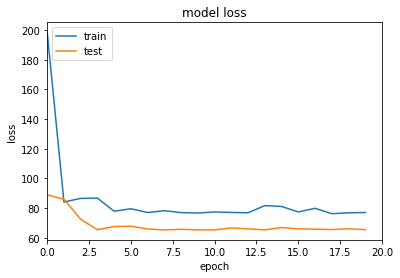

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 76.7015 - root_mean_squared_error: 8.7573 - val_loss: 65.3122 - val_root_mean_squared_error: 8.0809
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 77.1197 - root_mean_squared_error: 8.7811 - val_loss: 65.7979 - val_root_mean_squared_error: 8.1109
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 77.1880 - root_mean_squared_error: 8.7850 - val_loss: 65.2764 - val_root_mean_squared_error: 8.0787
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 78.1279 - root_mean_squared_error: 8.8383 - val_loss: 65.6434 - val_root_mean_squared_error: 8.1013
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 79.4474 - root_mean_squared_error: 8.9127 - val_loss: 66.0908 - val_root_mean_squared_error: 8.1289
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 80.1202 - root_mean_squared_error: 8.9504 - val_loss: 65.3002 - val_root_

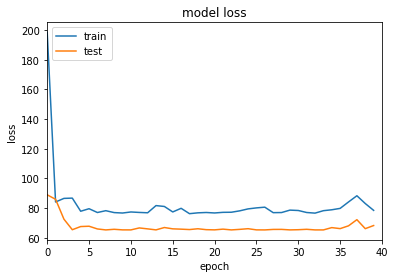

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 80.6741 - root_mean_squared_error: 8.9813 - val_loss: 65.9316 - val_root_mean_squared_error: 8.1192
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 80.4482 - root_mean_squared_error: 8.9687 - val_loss: 65.4336 - val_root_mean_squared_error: 8.0884
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 81.2227 - root_mean_squared_error: 9.0118 - val_loss: 65.5079 - val_root_mean_squared_error: 8.0930
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 76.7633 - root_mean_squared_error: 8.7608 - val_loss: 65.5077 - val_root_mean_squared_error: 8.0930
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 77.9542 - root_mean_squared_error: 8.8285 - val_loss: 65.2852 - val_root_mean_squared_error: 8.0792
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.1838 - root_mean_squared_error: 8.7848 - val_loss: 65.3294 - val_root_

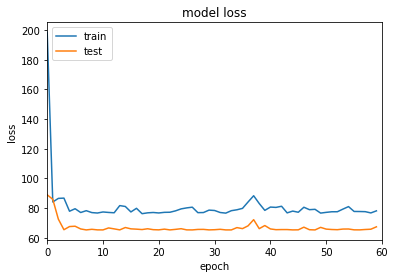

Epoch 1/20
6/6 [==============================] - 1s 130ms/step - loss: 602.5282 - root_mean_squared_error: 24.5094 - val_loss: 358.8585 - val_root_mean_squared_error: 18.9039
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 238.5769 - root_mean_squared_error: 15.4012 - val_loss: 160.4944 - val_root_mean_squared_error: 12.6195
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 106.6587 - root_mean_squared_error: 10.2690 - val_loss: 82.1459 - val_root_mean_squared_error: 8.9977
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 90.2914 - root_mean_squared_error: 9.4382 - val_loss: 50.2763 - val_root_mean_squared_error: 7.0014
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 78.9877 - root_mean_squared_error: 8.8148 - val_loss: 57.1293 - val_root_mean_squared_error: 7.4702
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 92.6256 - root_mean_squared_error: 9.5542 - val_loss: 40.8792 - v

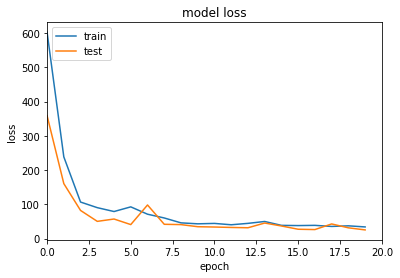

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 36.0632 - root_mean_squared_error: 5.8886 - val_loss: 23.6251 - val_root_mean_squared_error: 4.7159
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 34.1067 - root_mean_squared_error: 5.7204 - val_loss: 25.8750 - val_root_mean_squared_error: 4.9490
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 39.1011 - root_mean_squared_error: 6.1417 - val_loss: 23.0542 - val_root_mean_squared_error: 4.6558
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 37.7924 - root_mean_squared_error: 6.0346 - val_loss: 23.9965 - val_root_mean_squared_error: 4.7562
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 36.7135 - root_mean_squared_error: 5.9448 - val_loss: 27.5528 - val_root_mean_squared_error: 5.1169
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 33.9245 - root_mean_squared_error: 5.7057 - val_loss: 25.7570 - val_root_

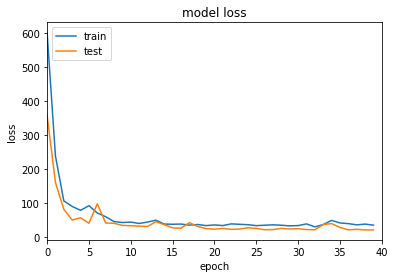

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 34.7632 - root_mean_squared_error: 5.7829 - val_loss: 21.3257 - val_root_mean_squared_error: 4.4728
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 39.6196 - root_mean_squared_error: 6.1888 - val_loss: 29.0781 - val_root_mean_squared_error: 5.2689
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 30.8796 - root_mean_squared_error: 5.4373 - val_loss: 21.1926 - val_root_mean_squared_error: 4.4585
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 28.7274 - root_mean_squared_error: 5.2359 - val_loss: 27.1413 - val_root_mean_squared_error: 5.0823
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 28.9761 - root_mean_squared_error: 5.2598 - val_loss: 29.4204 - val_root_mean_squared_error: 5.3021
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 37.9006 - root_mean_squared_error: 6.0492 - val_loss: 69.0312 - val_ro

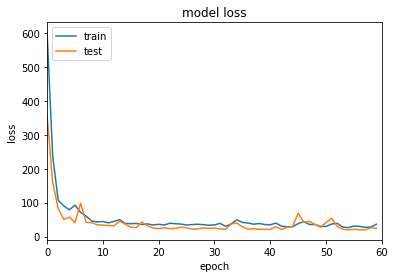

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 430.7514 - root_mean_squared_error: 20.7153 - val_loss: 363.4236 - val_root_mean_squared_error: 19.0279
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 200.8967 - root_mean_squared_error: 14.1295 - val_loss: 117.7156 - val_root_mean_squared_error: 10.7977
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 85.2984 - root_mean_squared_error: 9.1763 - val_loss: 53.8392 - val_root_mean_squared_error: 7.2634
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 75.5351 - root_mean_squared_error: 8.6272 - val_loss: 55.3779 - val_root_mean_squared_error: 7.3641
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 57.6902 - root_mean_squared_error: 7.5179 - val_loss: 44.5216 - val_root_mean_squared_error: 6.5817
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 52.0048 - root_mean_squared_error: 7.1265 - val_loss: 39.8439 - val_ro

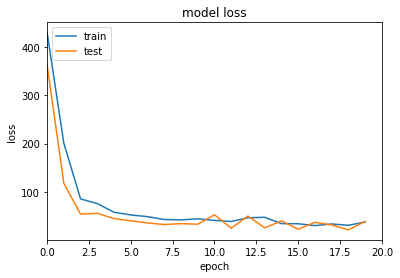

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 33.2945 - root_mean_squared_error: 5.6619 - val_loss: 67.5025 - val_root_mean_squared_error: 8.1405
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 38.3278 - root_mean_squared_error: 6.0904 - val_loss: 54.6136 - val_root_mean_squared_error: 7.3063
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 36.0446 - root_mean_squared_error: 5.9004 - val_loss: 52.3559 - val_root_mean_squared_error: 7.1504
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 44.2822 - root_mean_squared_error: 6.5614 - val_loss: 24.0438 - val_root_mean_squared_error: 4.7759
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 35.0917 - root_mean_squared_error: 5.8186 - val_loss: 21.8961 - val_root_mean_squared_error: 4.5451
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 43.3305 - root_mean_squared_error: 6.4878 - val_loss: 25.7196 - val_roo

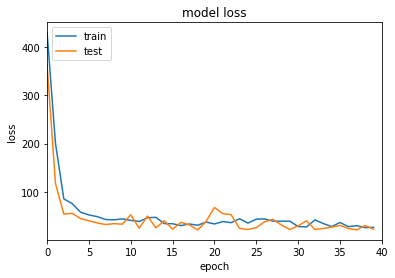

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 25.6560 - root_mean_squared_error: 4.9436 - val_loss: 19.3939 - val_root_mean_squared_error: 4.2637
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 28.7599 - root_mean_squared_error: 5.2486 - val_loss: 29.3985 - val_root_mean_squared_error: 5.3094
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 25.6701 - root_mean_squared_error: 4.9460 - val_loss: 22.1969 - val_root_mean_squared_error: 4.5817
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 30.4752 - root_mean_squared_error: 5.4104 - val_loss: 45.8518 - val_root_mean_squared_error: 6.6822
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 37.8240 - root_mean_squared_error: 6.0519 - val_loss: 56.1096 - val_root_mean_squared_error: 7.4104
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 36.7955 - root_mean_squared_error: 5.9668 - val_loss: 21.0255 - val_roo

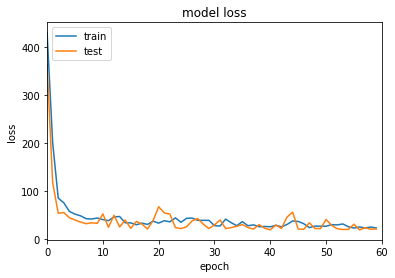

Epoch 1/20
6/6 [==============================] - 1s 43ms/step - loss: 1075.7220 - root_mean_squared_error: 32.7718 - val_loss: 550.3704 - val_root_mean_squared_error: 23.4271
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 339.3637 - root_mean_squared_error: 18.3821 - val_loss: 368.5315 - val_root_mean_squared_error: 19.1615
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 187.0144 - root_mean_squared_error: 13.6261 - val_loss: 58.6064 - val_root_mean_squared_error: 7.5677
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 72.7450 - root_mean_squared_error: 8.4493 - val_loss: 50.1283 - val_root_mean_squared_error: 6.9814
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 64.2170 - root_mean_squared_error: 7.9252 - val_loss: 70.5352 - val_root_mean_squared_error: 8.3128
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 65.4268 - root_mean_squared_error: 7.9990 - val_loss: 73.3718 - va

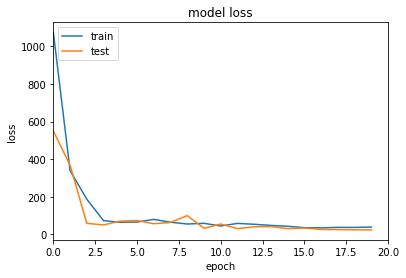

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 38.1911 - root_mean_squared_error: 6.0601 - val_loss: 27.6136 - val_root_mean_squared_error: 5.1134
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 38.7075 - root_mean_squared_error: 6.1027 - val_loss: 22.6510 - val_root_mean_squared_error: 4.6029
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 34.8168 - root_mean_squared_error: 5.7753 - val_loss: 23.5963 - val_root_mean_squared_error: 4.7048
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 35.5079 - root_mean_squared_error: 5.8350 - val_loss: 26.7120 - val_root_mean_squared_error: 5.0252
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 37.6460 - root_mean_squared_error: 6.0156 - val_loss: 64.0328 - val_root_mean_squared_error: 7.9106
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 39.9523 - root_mean_squared_error: 6.2046 - val_loss: 53.7825 - val_r

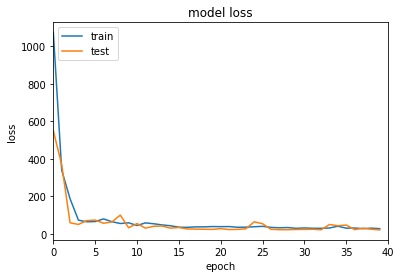

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 30.1915 - root_mean_squared_error: 5.3644 - val_loss: 20.3977 - val_root_mean_squared_error: 4.3570
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 39.0715 - root_mean_squared_error: 6.1366 - val_loss: 28.2223 - val_root_mean_squared_error: 5.1780
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 31.3954 - root_mean_squared_error: 5.4759 - val_loss: 32.5205 - val_root_mean_squared_error: 5.5778
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 32.0291 - root_mean_squared_error: 5.5336 - val_loss: 21.4459 - val_root_mean_squared_error: 4.4764
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 28.0770 - root_mean_squared_error: 5.1644 - val_loss: 20.4256 - val_root_mean_squared_error: 4.3613
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 29.4176 - root_mean_squared_error: 5.2928 - val_loss: 23.1684 - val_roo

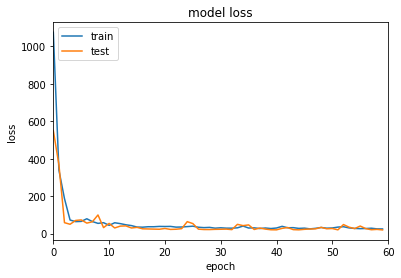

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 1148.0297 - root_mean_squared_error: 33.8575 - val_loss: 310.5355 - val_root_mean_squared_error: 17.5789
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 347.8112 - root_mean_squared_error: 18.6110 - val_loss: 68.0981 - val_root_mean_squared_error: 8.1694
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 113.9126 - root_mean_squared_error: 10.6099 - val_loss: 115.5092 - val_root_mean_squared_error: 10.6846
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 81.2272 - root_mean_squared_error: 8.9363 - val_loss: 71.2595 - val_root_mean_squared_error: 8.3579
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 65.5029 - root_mean_squared_error: 8.0049 - val_loss: 58.6816 - val_root_mean_squared_error: 7.5652
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 58.8602 - root_mean_squared_error: 7.5763 - val_loss: 76.7720 - 

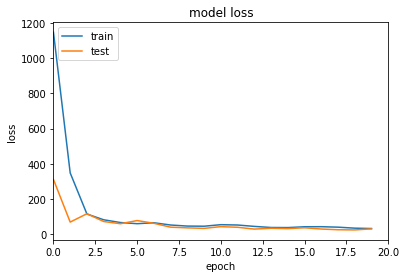

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 31.5224 - root_mean_squared_error: 5.4810 - val_loss: 31.4927 - val_root_mean_squared_error: 5.4785
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 32.2915 - root_mean_squared_error: 5.5510 - val_loss: 24.9825 - val_root_mean_squared_error: 4.8484
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 31.4822 - root_mean_squared_error: 5.4779 - val_loss: 35.1096 - val_root_mean_squared_error: 5.7997
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 33.6597 - root_mean_squared_error: 5.6735 - val_loss: 21.0648 - val_root_mean_squared_error: 4.4266
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 31.7310 - root_mean_squared_error: 5.5012 - val_loss: 24.8419 - val_root_mean_squared_error: 4.8349
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 28.6642 - root_mean_squared_error: 5.2153 - val_loss: 20.5743 - val_root

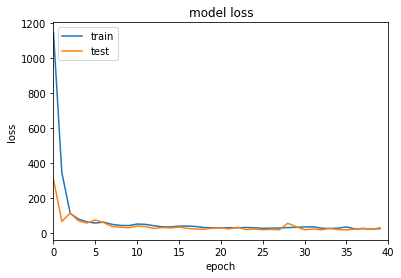

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 40.0920 - root_mean_squared_error: 6.2180 - val_loss: 41.7923 - val_root_mean_squared_error: 6.3534
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 36.8613 - root_mean_squared_error: 5.9528 - val_loss: 39.2476 - val_root_mean_squared_error: 6.1502
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 30.9838 - root_mean_squared_error: 5.4371 - val_loss: 25.0909 - val_root_mean_squared_error: 4.8652
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 25.1355 - root_mean_squared_error: 4.8699 - val_loss: 21.9138 - val_root_mean_squared_error: 4.5272
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 27.7314 - root_mean_squared_error: 5.1297 - val_loss: 28.6302 - val_root_mean_squared_error: 5.2166
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 42.6314 - root_mean_squared_error: 6.4200 - val_loss: 19.3090 - val_ro

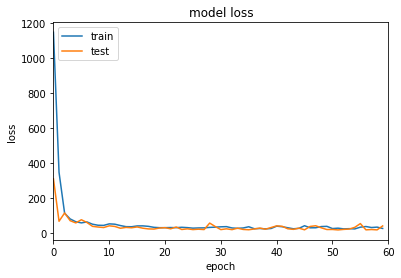

Epoch 1/20
6/6 [==============================] - 1s 42ms/step - loss: 2031.8429 - root_mean_squared_error: 45.0716 - val_loss: 157.6569 - val_root_mean_squared_error: 12.5424
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 489.3923 - root_mean_squared_error: 22.1148 - val_loss: 100.4397 - val_root_mean_squared_error: 10.0065
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 208.8997 - root_mean_squared_error: 14.4428 - val_loss: 122.1082 - val_root_mean_squared_error: 11.0365
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 102.0932 - root_mean_squared_error: 10.0889 - val_loss: 70.1409 - val_root_mean_squared_error: 8.3563
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 67.1355 - root_mean_squared_error: 8.1742 - val_loss: 64.1044 - val_root_mean_squared_error: 7.9863
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 60.0918 - root_mean_squared_error: 7.7308 - val_loss: 50.2580

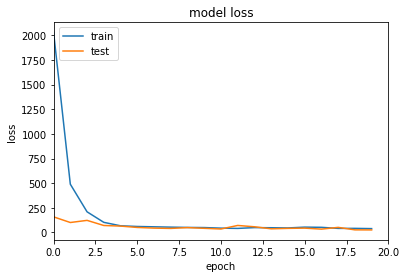

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 35.3762 - root_mean_squared_error: 5.9189 - val_loss: 25.0813 - val_root_mean_squared_error: 4.9738
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 33.7147 - root_mean_squared_error: 5.7768 - val_loss: 30.3679 - val_root_mean_squared_error: 5.4795
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 34.5825 - root_mean_squared_error: 5.8515 - val_loss: 34.3917 - val_root_mean_squared_error: 5.8352
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 32.2431 - root_mean_squared_error: 5.6480 - val_loss: 25.6888 - val_root_mean_squared_error: 5.0345
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 33.9195 - root_mean_squared_error: 5.7945 - val_loss: 22.5593 - val_root_mean_squared_error: 4.7134
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 33.3242 - root_mean_squared_error: 5.7429 - val_loss: 35.0163 - val_

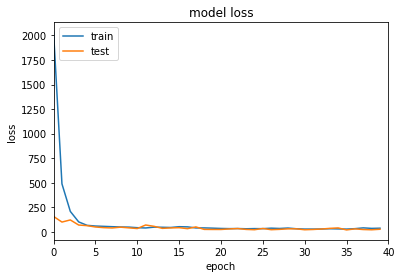

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 35.4245 - root_mean_squared_error: 5.9229 - val_loss: 42.7680 - val_root_mean_squared_error: 6.5134
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 36.7571 - root_mean_squared_error: 6.0343 - val_loss: 53.6688 - val_root_mean_squared_error: 7.3024
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 37.5488 - root_mean_squared_error: 6.0996 - val_loss: 40.4227 - val_root_mean_squared_error: 6.3308
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 29.4959 - root_mean_squared_error: 5.3992 - val_loss: 21.1030 - val_root_mean_squared_error: 4.5562
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 27.9198 - root_mean_squared_error: 5.2513 - val_loss: 19.7000 - val_root_mean_squared_error: 4.3995
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 28.9850 - root_mean_squared_error: 5.3517 - val_loss: 19.5062 - val_ro

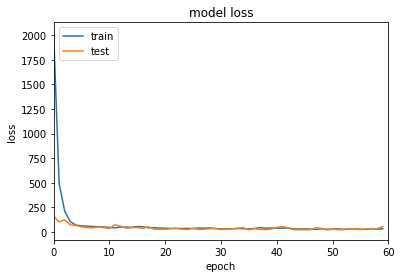

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 1002.3754 - root_mean_squared_error: 31.6573 - val_loss: 231.6813 - val_root_mean_squared_error: 15.2157
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 285.6753 - root_mean_squared_error: 16.8973 - val_loss: 60.9887 - val_root_mean_squared_error: 7.8003
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 118.7380 - root_mean_squared_error: 10.8902 - val_loss: 63.3876 - val_root_mean_squared_error: 7.9528
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 85.6150 - root_mean_squared_error: 9.2451 - val_loss: 56.7223 - val_root_mean_squared_error: 7.5217
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 66.9170 - root_mean_squared_error: 8.1711 - val_loss: 50.7988 - val_root_mean_squared_error: 7.1166
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 57.4642 - root_mean_squared_error: 7.5703 - val_loss: 44.2636 - val_r

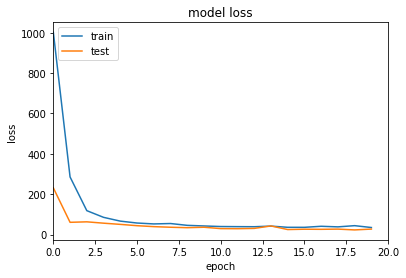

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 34.9594 - root_mean_squared_error: 5.8988 - val_loss: 62.8100 - val_root_mean_squared_error: 7.9150
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 43.2215 - root_mean_squared_error: 6.5619 - val_loss: 64.6026 - val_root_mean_squared_error: 8.0274
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 40.9391 - root_mean_squared_error: 6.3856 - val_loss: 63.0151 - val_root_mean_squared_error: 7.9279
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 39.2248 - root_mean_squared_error: 6.2499 - val_loss: 54.1697 - val_root_mean_squared_error: 7.3489
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 32.5082 - root_mean_squared_error: 5.6873 - val_loss: 30.7236 - val_root_mean_squared_error: 5.5282
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 32.4276 - root_mean_squared_error: 5.6802 - val_loss: 35.9031 - val_r

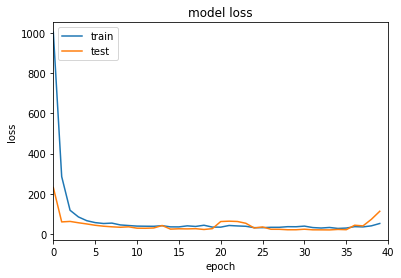

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 61.2924 - root_mean_squared_error: 7.8185 - val_loss: 75.2129 - val_root_mean_squared_error: 8.6631
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 44.6276 - root_mean_squared_error: 6.6681 - val_loss: 51.8187 - val_root_mean_squared_error: 7.1872
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 33.7260 - root_mean_squared_error: 5.7933 - val_loss: 53.4519 - val_root_mean_squared_error: 7.2999
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 34.2013 - root_mean_squared_error: 5.8342 - val_loss: 45.2074 - val_root_mean_squared_error: 6.7115
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 39.5074 - root_mean_squared_error: 6.2724 - val_loss: 57.2061 - val_root_mean_squared_error: 7.5526
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 36.4904 - root_mean_squared_error: 6.0271 - val_loss: 40.2864 - val_ro

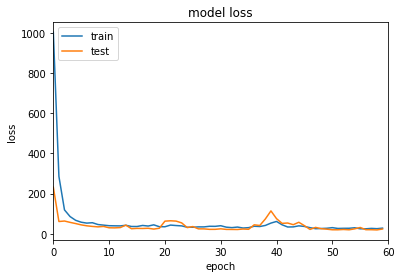

Epoch 1/20
6/6 [==============================] - 1s 43ms/step - loss: 2090.8376 - root_mean_squared_error: 45.7238 - val_loss: 817.3513 - val_root_mean_squared_error: 28.5867
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 712.3190 - root_mean_squared_error: 26.6867 - val_loss: 378.2893 - val_root_mean_squared_error: 19.4464
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 234.1417 - root_mean_squared_error: 15.2976 - val_loss: 74.5312 - val_root_mean_squared_error: 8.6260
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 102.6368 - root_mean_squared_error: 10.1248 - val_loss: 57.2721 - val_root_mean_squared_error: 7.5592
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 73.5605 - root_mean_squared_error: 8.5690 - val_loss: 54.3305 - val_root_mean_squared_error: 7.3616
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 69.9064 - root_mean_squared_error: 8.3527 - val_loss: 62.6568 - 

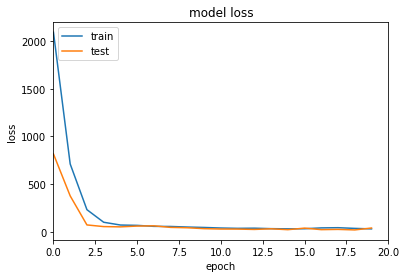

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 48.4289 - root_mean_squared_error: 6.9485 - val_loss: 55.3346 - val_root_mean_squared_error: 7.4288
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 41.4490 - root_mean_squared_error: 6.4266 - val_loss: 21.4950 - val_root_mean_squared_error: 4.6203
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 32.4931 - root_mean_squared_error: 5.6873 - val_loss: 22.7099 - val_root_mean_squared_error: 4.7499
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 34.3131 - root_mean_squared_error: 5.8451 - val_loss: 21.4930 - val_root_mean_squared_error: 4.6201
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 29.7175 - root_mean_squared_error: 5.4378 - val_loss: 29.9735 - val_root_mean_squared_error: 5.4613
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 31.7176 - root_mean_squared_error: 5.6187 - val_loss: 23.9196 - val_root

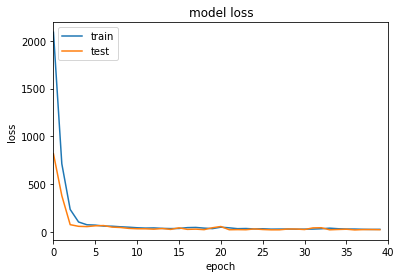

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 27.4061 - root_mean_squared_error: 5.2209 - val_loss: 33.6339 - val_root_mean_squared_error: 5.7867
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 25.8403 - root_mean_squared_error: 5.0687 - val_loss: 56.1829 - val_root_mean_squared_error: 7.4856
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 34.9107 - root_mean_squared_error: 5.8960 - val_loss: 19.0611 - val_root_mean_squared_error: 4.3489
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 25.6152 - root_mean_squared_error: 5.0465 - val_loss: 19.5910 - val_root_mean_squared_error: 4.4094
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 33.1261 - root_mean_squared_error: 5.7426 - val_loss: 23.0302 - val_root_mean_squared_error: 4.7835
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 29.0347 - root_mean_squared_error: 5.3746 - val_loss: 27.5259 - val_root_

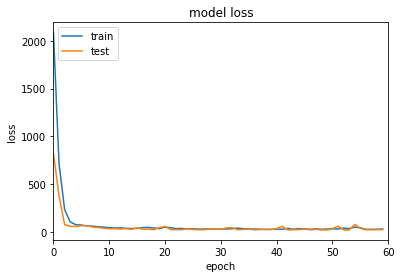

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 823.8196 - root_mean_squared_error: 28.6994 - val_loss: 365.4106 - val_root_mean_squared_error: 19.1120
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 231.8550 - root_mean_squared_error: 15.2224 - val_loss: 98.6528 - val_root_mean_squared_error: 9.9261
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 103.5934 - root_mean_squared_error: 10.1720 - val_loss: 89.7959 - val_root_mean_squared_error: 9.4696
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 85.8030 - root_mean_squared_error: 9.2562 - val_loss: 51.8376 - val_root_mean_squared_error: 7.1909
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 60.9133 - root_mean_squared_error: 7.7963 - val_loss: 57.0760 - val_root_mean_squared_error: 7.5460
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 57.1267 - root_mean_squared_error: 7.5492 - val_loss: 77.2701 - val_r

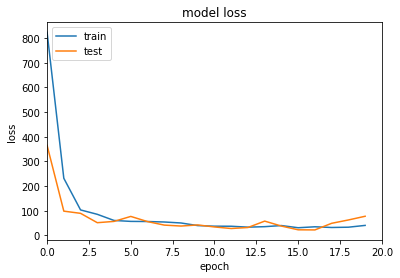

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 50.2986 - root_mean_squared_error: 7.0820 - val_loss: 45.5786 - val_root_mean_squared_error: 6.7405
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 38.5787 - root_mean_squared_error: 6.1996 - val_loss: 22.3356 - val_root_mean_squared_error: 4.7108
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 30.3510 - root_mean_squared_error: 5.4961 - val_loss: 24.8560 - val_root_mean_squared_error: 4.9711
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 34.8061 - root_mean_squared_error: 5.8874 - val_loss: 23.2424 - val_root_mean_squared_error: 4.8061
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 32.6454 - root_mean_squared_error: 5.7010 - val_loss: 21.0016 - val_root_mean_squared_error: 4.5670
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 28.1334 - root_mean_squared_error: 5.2905 - val_loss: 24.4787 - val_r

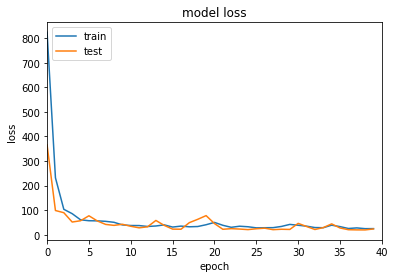

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 29.1924 - root_mean_squared_error: 5.3897 - val_loss: 23.9173 - val_root_mean_squared_error: 4.8758
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 24.5450 - root_mean_squared_error: 4.9397 - val_loss: 19.4649 - val_root_mean_squared_error: 4.3956
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 24.5035 - root_mean_squared_error: 4.9355 - val_loss: 21.6352 - val_root_mean_squared_error: 4.6359
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 23.4695 - root_mean_squared_error: 4.8297 - val_loss: 18.8035 - val_root_mean_squared_error: 4.3197
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 24.0690 - root_mean_squared_error: 4.8913 - val_loss: 20.9169 - val_root_mean_squared_error: 4.5577
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 26.0297 - root_mean_squared_error: 5.0878 - val_loss: 20.6310 - val_root

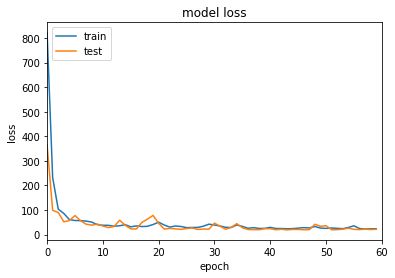

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 1443.4862 - root_mean_squared_error: 37.9900 - val_loss: 209.0405 - val_root_mean_squared_error: 14.4512
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 375.3510 - root_mean_squared_error: 19.3691 - val_loss: 72.4954 - val_root_mean_squared_error: 8.5041
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 192.9530 - root_mean_squared_error: 13.8845 - val_loss: 191.5014 - val_root_mean_squared_error: 13.8322
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 112.2654 - root_mean_squared_error: 10.5874 - val_loss: 66.7029 - val_root_mean_squared_error: 8.1564
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 72.2176 - root_mean_squared_error: 8.4876 - val_loss: 44.4798 - val_root_mean_squared_error: 6.6557
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 54.0124 - root_mean_squared_error: 7.3368 - val_loss: 42.7842 -

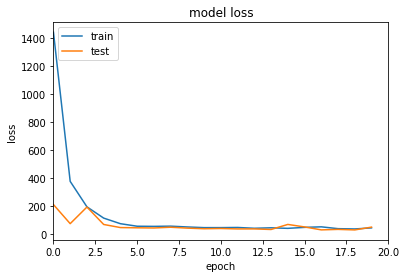

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 50.7621 - root_mean_squared_error: 7.1111 - val_loss: 26.1237 - val_root_mean_squared_error: 5.0921
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 35.3307 - root_mean_squared_error: 5.9276 - val_loss: 37.6870 - val_root_mean_squared_error: 6.1231
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 34.3590 - root_mean_squared_error: 5.8451 - val_loss: 27.3914 - val_root_mean_squared_error: 5.2151
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 32.4291 - root_mean_squared_error: 5.6776 - val_loss: 25.1337 - val_root_mean_squared_error: 4.9939
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 36.4750 - root_mean_squared_error: 6.0234 - val_loss: 40.2075 - val_root_mean_squared_error: 6.3256
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 45.4910 - root_mean_squared_error: 6.7303 - val_loss: 24.5592 - val_r

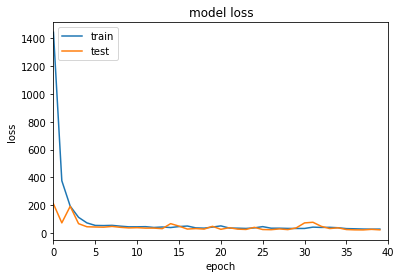

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 28.3189 - root_mean_squared_error: 5.3034 - val_loss: 25.0554 - val_root_mean_squared_error: 4.9862
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 26.8158 - root_mean_squared_error: 5.1597 - val_loss: 22.1519 - val_root_mean_squared_error: 4.6861
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 29.4652 - root_mean_squared_error: 5.4104 - val_loss: 26.2068 - val_root_mean_squared_error: 5.1004
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 38.2466 - root_mean_squared_error: 6.1688 - val_loss: 26.7934 - val_root_mean_squared_error: 5.1576
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 33.0750 - root_mean_squared_error: 5.7343 - val_loss: 23.1750 - val_root_mean_squared_error: 4.7940
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 34.1770 - root_mean_squared_error: 5.8296 - val_loss: 44.8824 - val_roo

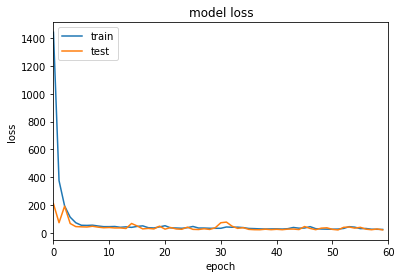

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 1301.8762 - root_mean_squared_error: 36.0810 - val_loss: 445.0474 - val_root_mean_squared_error: 21.0953
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 423.3245 - root_mean_squared_error: 20.5741 - val_loss: 76.1634 - val_root_mean_squared_error: 8.7254
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 202.4255 - root_mean_squared_error: 14.2266 - val_loss: 172.2556 - val_root_mean_squared_error: 13.1235
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 115.3430 - root_mean_squared_error: 10.7383 - val_loss: 119.7386 - val_root_mean_squared_error: 10.9411
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 100.9675 - root_mean_squared_error: 10.0467 - val_loss: 70.4258 - val_root_mean_squared_error: 8.3901
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 68.1674 - root_mean_squared_error: 8.2544 - val_loss: 53.05

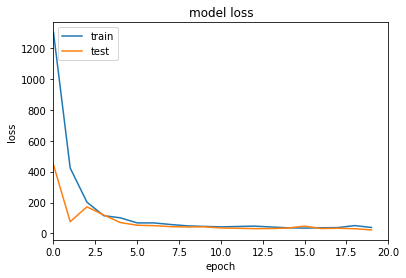

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 35.4382 - root_mean_squared_error: 5.9501 - val_loss: 22.6062 - val_root_mean_squared_error: 4.7509
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 39.1460 - root_mean_squared_error: 6.2539 - val_loss: 26.6691 - val_root_mean_squared_error: 5.1608
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 37.6869 - root_mean_squared_error: 6.1361 - val_loss: 22.4649 - val_root_mean_squared_error: 4.7360
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 39.4273 - root_mean_squared_error: 6.2763 - val_loss: 35.2882 - val_root_mean_squared_error: 5.9374
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 44.2199 - root_mean_squared_error: 6.6472 - val_loss: 41.9581 - val_root_mean_squared_error: 6.4748
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 46.6271 - root_mean_squared_error: 6.8258 - val_loss: 43.2236 - val_r

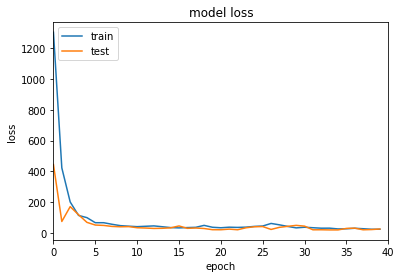

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 26.9563 - root_mean_squared_error: 5.1885 - val_loss: 38.1365 - val_root_mean_squared_error: 6.1726
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 37.2321 - root_mean_squared_error: 6.0989 - val_loss: 39.3095 - val_root_mean_squared_error: 6.2669
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 41.5212 - root_mean_squared_error: 6.4409 - val_loss: 31.7991 - val_root_mean_squared_error: 5.6359
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 32.0766 - root_mean_squared_error: 5.6605 - val_loss: 20.9671 - val_root_mean_squared_error: 4.5751
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 26.3537 - root_mean_squared_error: 5.1301 - val_loss: 19.9498 - val_root_mean_squared_error: 4.4625
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 25.7406 - root_mean_squared_error: 5.0700 - val_loss: 22.2144 - val_ro

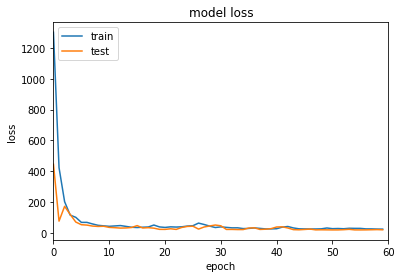

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 958.8286 - root_mean_squared_error: 30.9646 - val_loss: 725.7502 - val_root_mean_squared_error: 26.9394
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 308.7544 - root_mean_squared_error: 17.5709 - val_loss: 225.0979 - val_root_mean_squared_error: 15.0028
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 100.3588 - root_mean_squared_error: 10.0172 - val_loss: 53.4000 - val_root_mean_squared_error: 7.3065
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 59.9669 - root_mean_squared_error: 7.7429 - val_loss: 44.1959 - val_root_mean_squared_error: 6.6468
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 44.7615 - root_mean_squared_error: 6.6892 - val_loss: 40.2285 - val_root_mean_squared_error: 6.3413
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 44.7527 - root_mean_squared_error: 6.6885 - val_loss: 35.4844 - val

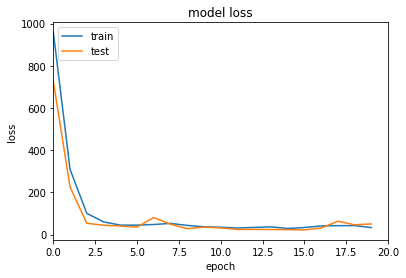

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 35.0064 - root_mean_squared_error: 5.9152 - val_loss: 35.0690 - val_root_mean_squared_error: 5.9205
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 31.9718 - root_mean_squared_error: 5.6529 - val_loss: 29.7513 - val_root_mean_squared_error: 5.4529
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 29.6883 - root_mean_squared_error: 5.4471 - val_loss: 21.3982 - val_root_mean_squared_error: 4.6240
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 27.0837 - root_mean_squared_error: 5.2026 - val_loss: 20.9960 - val_root_mean_squared_error: 4.5803
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 26.3955 - root_mean_squared_error: 5.1360 - val_loss: 20.4993 - val_root_mean_squared_error: 4.5257
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 29.4873 - root_mean_squared_error: 5.4286 - val_loss: 20.8989 - val_ro

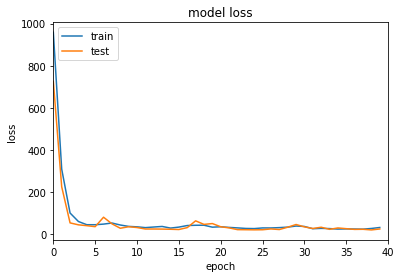

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 40.7061 - root_mean_squared_error: 6.3788 - val_loss: 46.0620 - val_root_mean_squared_error: 6.7856
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 33.5778 - root_mean_squared_error: 5.7931 - val_loss: 37.8112 - val_root_mean_squared_error: 6.1477
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 30.5360 - root_mean_squared_error: 5.5244 - val_loss: 20.4514 - val_root_mean_squared_error: 4.5204
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 25.9817 - root_mean_squared_error: 5.0955 - val_loss: 20.3560 - val_root_mean_squared_error: 4.5098
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 25.0708 - root_mean_squared_error: 5.0053 - val_loss: 20.1304 - val_root_mean_squared_error: 4.4847
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 24.2202 - root_mean_squared_error: 4.9196 - val_loss: 20.6878 - val_ro

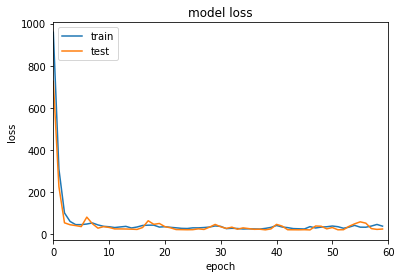

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 1081.6650 - root_mean_squared_error: 32.8884 - val_loss: 930.3215 - val_root_mean_squared_error: 30.5009
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 407.5721 - root_mean_squared_error: 20.1881 - val_loss: 147.3126 - val_root_mean_squared_error: 12.1367
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 178.2357 - root_mean_squared_error: 13.3500 - val_loss: 222.9591 - val_root_mean_squared_error: 14.9314
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 121.2245 - root_mean_squared_error: 11.0096 - val_loss: 54.6050 - val_root_mean_squared_error: 7.3886
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 80.8359 - root_mean_squared_error: 8.9901 - val_loss: 65.1826 - val_root_mean_squared_error: 8.0727
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 84.1740 - root_mean_squared_error: 9.1738 - val_loss: 117.5929

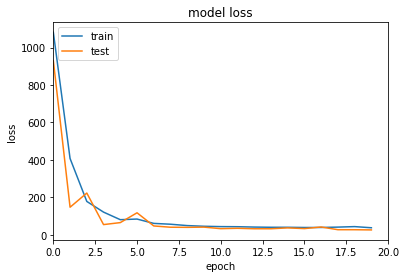

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 39.5860 - root_mean_squared_error: 6.2905 - val_loss: 27.6356 - val_root_mean_squared_error: 5.2555
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 39.2707 - root_mean_squared_error: 6.2654 - val_loss: 39.0833 - val_root_mean_squared_error: 6.2504
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 42.0429 - root_mean_squared_error: 6.4829 - val_loss: 60.4049 - val_root_mean_squared_error: 7.7711
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 45.4714 - root_mean_squared_error: 6.7421 - val_loss: 58.0511 - val_root_mean_squared_error: 7.6181
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 41.5806 - root_mean_squared_error: 6.4471 - val_loss: 24.8389 - val_root_mean_squared_error: 4.9823
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 41.3328 - root_mean_squared_error: 6.4279 - val_loss: 25.2800 - val_roo

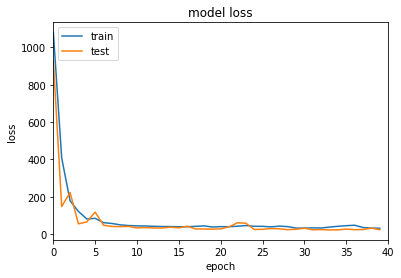

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 29.5958 - root_mean_squared_error: 5.4388 - val_loss: 37.7886 - val_root_mean_squared_error: 6.1460
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 29.8807 - root_mean_squared_error: 5.4649 - val_loss: 23.3797 - val_root_mean_squared_error: 4.8337
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 29.0912 - root_mean_squared_error: 5.3922 - val_loss: 21.1574 - val_root_mean_squared_error: 4.5980
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 30.1839 - root_mean_squared_error: 5.4926 - val_loss: 28.8611 - val_root_mean_squared_error: 5.3708
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 29.4058 - root_mean_squared_error: 5.4213 - val_loss: 23.9372 - val_root_mean_squared_error: 4.8910
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 31.9749 - root_mean_squared_error: 5.6533 - val_loss: 25.5253 - val_roo

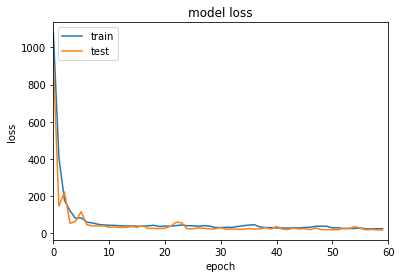

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 993.8941 - root_mean_squared_error: 31.5224 - val_loss: 358.0012 - val_root_mean_squared_error: 18.9158
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 373.5428 - root_mean_squared_error: 19.3226 - val_loss: 157.8700 - val_root_mean_squared_error: 12.5579
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 192.7109 - root_mean_squared_error: 13.8760 - val_loss: 123.8162 - val_root_mean_squared_error: 11.1198
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 104.4337 - root_mean_squared_error: 10.2111 - val_loss: 43.1200 - val_root_mean_squared_error: 6.5536
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 58.2245 - root_mean_squared_error: 7.6192 - val_loss: 40.4151 - val_root_mean_squared_error: 6.3435
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 47.3916 - root_mean_squared_error: 6.8713 - val_loss: 75.7055 -

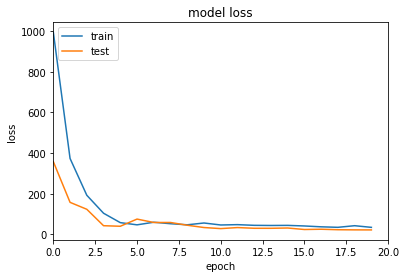

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 31.9311 - root_mean_squared_error: 5.6344 - val_loss: 24.0298 - val_root_mean_squared_error: 4.8832
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 30.6784 - root_mean_squared_error: 5.5221 - val_loss: 34.2858 - val_root_mean_squared_error: 5.8397
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 31.0038 - root_mean_squared_error: 5.5515 - val_loss: 25.2731 - val_root_mean_squared_error: 5.0089
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 32.9142 - root_mean_squared_error: 5.7210 - val_loss: 29.2360 - val_root_mean_squared_error: 5.3900
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 32.4198 - root_mean_squared_error: 5.6776 - val_loss: 25.6633 - val_root_mean_squared_error: 5.0477
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 31.6002 - root_mean_squared_error: 5.6050 - val_loss: 27.0131 - val_root

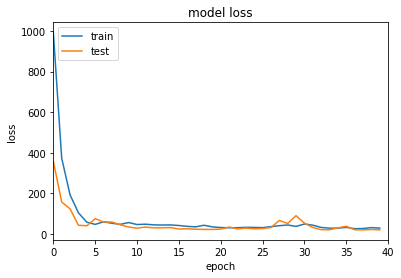

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 27.5394 - root_mean_squared_error: 5.2303 - val_loss: 21.9087 - val_root_mean_squared_error: 4.6610
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 32.3441 - root_mean_squared_error: 5.6710 - val_loss: 20.8135 - val_root_mean_squared_error: 4.5420
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 38.9894 - root_mean_squared_error: 6.2294 - val_loss: 19.6841 - val_root_mean_squared_error: 4.4159
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 36.8588 - root_mean_squared_error: 6.0560 - val_loss: 29.4372 - val_root_mean_squared_error: 5.4087
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 29.0568 - root_mean_squared_error: 5.3734 - val_loss: 31.0109 - val_root_mean_squared_error: 5.5523
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 26.4634 - root_mean_squared_error: 5.1264 - val_loss: 22.4980 - val_roo

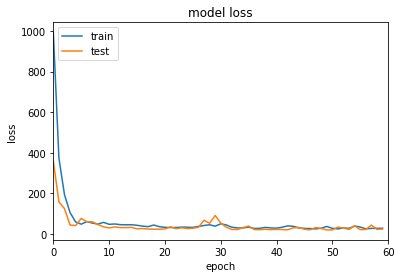

Epoch 1/20
6/6 [==============================] - 1s 130ms/step - loss: 1830.7607 - root_mean_squared_error: 42.7871 - val_loss: 577.1742 - val_root_mean_squared_error: 24.0240
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 601.0496 - root_mean_squared_error: 24.5159 - val_loss: 215.5787 - val_root_mean_squared_error: 14.6820
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 200.1951 - root_mean_squared_error: 14.1484 - val_loss: 55.1410 - val_root_mean_squared_error: 7.4245
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 101.7302 - root_mean_squared_error: 10.0853 - val_loss: 68.8263 - val_root_mean_squared_error: 8.2951
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 67.1626 - root_mean_squared_error: 8.1942 - val_loss: 67.0905 - val_root_mean_squared_error: 8.1898
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 78.4969 - root_mean_squared_error: 8.8588 - val_loss: 52.9789 - 

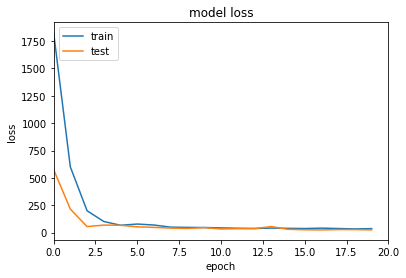

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 41.3922 - root_mean_squared_error: 6.4321 - val_loss: 24.5075 - val_root_mean_squared_error: 4.9485
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 34.7106 - root_mean_squared_error: 5.8899 - val_loss: 45.5916 - val_root_mean_squared_error: 6.7507
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 42.1331 - root_mean_squared_error: 6.4895 - val_loss: 22.1970 - val_root_mean_squared_error: 4.7093
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 35.5531 - root_mean_squared_error: 5.9610 - val_loss: 23.3679 - val_root_mean_squared_error: 4.8320
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 33.4676 - root_mean_squared_error: 5.7834 - val_loss: 21.7477 - val_root_mean_squared_error: 4.6613
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 33.9201 - root_mean_squared_error: 5.8224 - val_loss: 21.6648 - val_roo

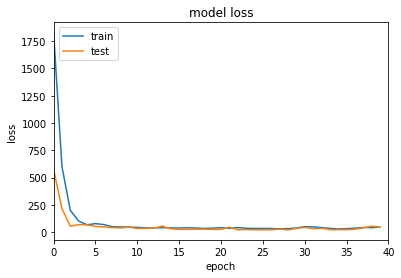

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 30.7367 - root_mean_squared_error: 5.5423 - val_loss: 35.2466 - val_root_mean_squared_error: 5.9352
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 29.2264 - root_mean_squared_error: 5.4043 - val_loss: 25.0371 - val_root_mean_squared_error: 5.0017
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 27.6416 - root_mean_squared_error: 5.2556 - val_loss: 21.0408 - val_root_mean_squared_error: 4.5848
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 29.8680 - root_mean_squared_error: 5.4633 - val_loss: 26.7694 - val_root_mean_squared_error: 5.1720
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 34.6400 - root_mean_squared_error: 5.8839 - val_loss: 20.6471 - val_root_mean_squared_error: 4.5417
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 38.2715 - root_mean_squared_error: 6.1848 - val_loss: 22.7299 - val_root

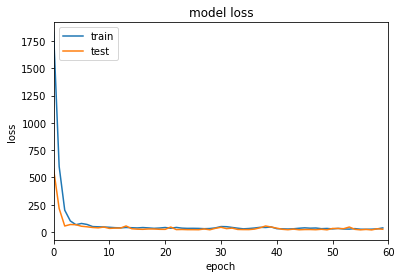

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 8291.1758 - root_mean_squared_error: 91.0559 - val_loss: 4357.7617 - val_root_mean_squared_error: 66.0133
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 1353.1505 - root_mean_squared_error: 36.7851 - val_loss: 1404.1810 - val_root_mean_squared_error: 37.4724
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 710.8849 - root_mean_squared_error: 26.6624 - val_loss: 471.4537 - val_root_mean_squared_error: 21.7129
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 223.0114 - root_mean_squared_error: 14.9335 - val_loss: 64.8606 - val_root_mean_squared_error: 8.0534
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 88.8999 - root_mean_squared_error: 9.4285 - val_loss: 59.9905 - val_root_mean_squared_error: 7.7451
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 80.1802 - root_mean_squared_error: 8.9542 - val_loss: 81.383

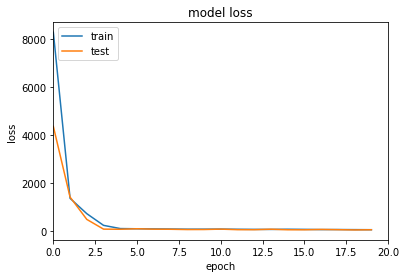

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 40.8457 - root_mean_squared_error: 6.3908 - val_loss: 37.9660 - val_root_mean_squared_error: 6.1614
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 42.4875 - root_mean_squared_error: 6.5180 - val_loss: 28.6999 - val_root_mean_squared_error: 5.3569
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 41.3267 - root_mean_squared_error: 6.4283 - val_loss: 34.2508 - val_root_mean_squared_error: 5.8521
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 46.6251 - root_mean_squared_error: 6.8280 - val_loss: 28.3984 - val_root_mean_squared_error: 5.3287
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 49.6489 - root_mean_squared_error: 7.0459 - val_loss: 39.6102 - val_root_mean_squared_error: 6.2934
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 41.4670 - root_mean_squared_error: 6.4392 - val_loss: 38.5932 - val_roo

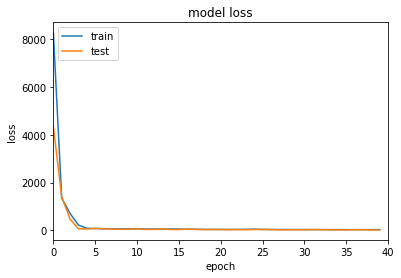

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 35.7262 - root_mean_squared_error: 5.9768 - val_loss: 20.3879 - val_root_mean_squared_error: 4.5149
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 32.3895 - root_mean_squared_error: 5.6909 - val_loss: 30.1444 - val_root_mean_squared_error: 5.4901
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 29.5706 - root_mean_squared_error: 5.4375 - val_loss: 28.9612 - val_root_mean_squared_error: 5.3812
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 28.8169 - root_mean_squared_error: 5.3678 - val_loss: 20.3349 - val_root_mean_squared_error: 4.5090
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 28.5338 - root_mean_squared_error: 5.3414 - val_loss: 34.6909 - val_root_mean_squared_error: 5.8896
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 29.7485 - root_mean_squared_error: 5.4539 - val_loss: 30.5341 - val_ro

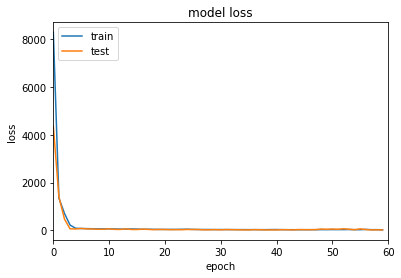

Epoch 1/20
6/6 [==============================] - 1s 42ms/step - loss: 1433.3088 - root_mean_squared_error: 37.8590 - val_loss: 223.8323 - val_root_mean_squared_error: 14.9610
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 422.2364 - root_mean_squared_error: 20.5484 - val_loss: 50.3218 - val_root_mean_squared_error: 7.0937
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 164.5156 - root_mean_squared_error: 12.8263 - val_loss: 142.4257 - val_root_mean_squared_error: 11.9342
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 96.3531 - root_mean_squared_error: 9.8159 - val_loss: 62.4569 - val_root_mean_squared_error: 7.9029
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 63.9121 - root_mean_squared_error: 7.9944 - val_loss: 43.0271 - val_root_mean_squared_error: 6.5594
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 56.1723 - root_mean_squared_error: 7.4947 - val_loss: 49.3840 - v

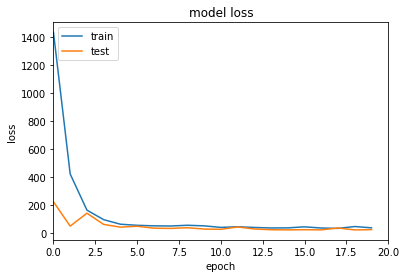

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 37.4419 - root_mean_squared_error: 6.1188 - val_loss: 58.0311 - val_root_mean_squared_error: 7.6177
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 44.5717 - root_mean_squared_error: 6.6761 - val_loss: 54.3218 - val_root_mean_squared_error: 7.3702
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 43.6808 - root_mean_squared_error: 6.6090 - val_loss: 40.2828 - val_root_mean_squared_error: 6.3467
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 33.1700 - root_mean_squared_error: 5.7592 - val_loss: 30.1838 - val_root_mean_squared_error: 5.4938
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 33.6828 - root_mean_squared_error: 5.8035 - val_loss: 45.2234 - val_root_mean_squared_error: 6.7247
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 36.5268 - root_mean_squared_error: 6.0436 - val_loss: 23.9110 - val_r

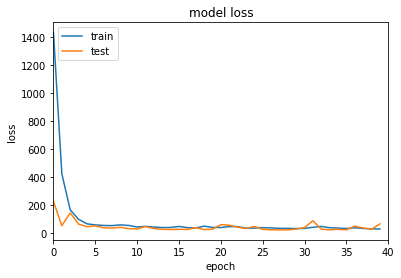

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 34.1585 - root_mean_squared_error: 5.8444 - val_loss: 21.2641 - val_root_mean_squared_error: 4.6111
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 28.0090 - root_mean_squared_error: 5.2922 - val_loss: 19.0379 - val_root_mean_squared_error: 4.3631
Epoch 43/60
6/6 [==============================] - 0s 14ms/step - loss: 26.4154 - root_mean_squared_error: 5.1394 - val_loss: 28.0537 - val_root_mean_squared_error: 5.2964
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 36.1176 - root_mean_squared_error: 6.0096 - val_loss: 72.8681 - val_root_mean_squared_error: 8.5362
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 47.8430 - root_mean_squared_error: 6.9167 - val_loss: 22.7438 - val_root_mean_squared_error: 4.7689
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 34.0984 - root_mean_squared_error: 5.8392 - val_loss: 22.1553 - val_r

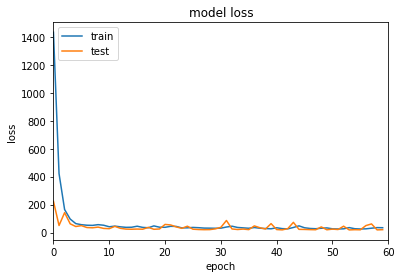

Epoch 1/20
6/6 [==============================] - 1s 43ms/step - loss: 372.4052 - root_mean_squared_error: 19.2510 - val_loss: 237.7547 - val_root_mean_squared_error: 15.3742
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 208.8209 - root_mean_squared_error: 14.4083 - val_loss: 140.3988 - val_root_mean_squared_error: 11.8053
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 126.6696 - root_mean_squared_error: 11.2111 - val_loss: 77.5188 - val_root_mean_squared_error: 8.7504
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 84.0572 - root_mean_squared_error: 9.1156 - val_loss: 70.4656 - val_root_mean_squared_error: 8.3349
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 79.3066 - root_mean_squared_error: 8.8478 - val_loss: 66.1614 - val_root_mean_squared_error: 8.0686
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 77.5606 - root_mean_squared_error: 8.7454 - val_loss: 66.3269 - val_

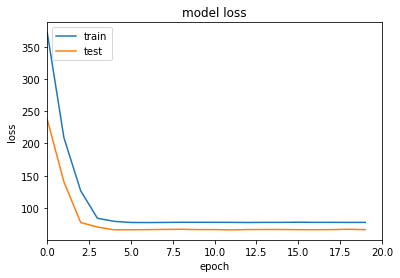

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 77.6518 - root_mean_squared_error: 8.7475 - val_loss: 66.4915 - val_root_mean_squared_error: 8.0846
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 77.8813 - root_mean_squared_error: 8.7609 - val_loss: 66.3949 - val_root_mean_squared_error: 8.0792
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 77.7606 - root_mean_squared_error: 8.7547 - val_loss: 66.8404 - val_root_mean_squared_error: 8.1074
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.6534 - root_mean_squared_error: 8.7491 - val_loss: 66.6723 - val_root_mean_squared_error: 8.0974
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 77.5924 - root_mean_squared_error: 8.7460 - val_loss: 66.5032 - val_root_mean_squared_error: 8.0876
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 77.4732 - root_mean_squared_error: 8.7399 - val_loss: 66.3386 - val_ro

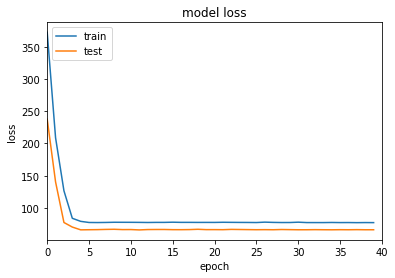

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 77.2139 - root_mean_squared_error: 8.7359 - val_loss: 66.1637 - val_root_mean_squared_error: 8.0788
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.5616 - root_mean_squared_error: 8.7559 - val_loss: 66.2446 - val_root_mean_squared_error: 8.0841
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 77.4129 - root_mean_squared_error: 8.7478 - val_loss: 66.1460 - val_root_mean_squared_error: 8.0785
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 77.1527 - root_mean_squared_error: 8.7333 - val_loss: 66.2549 - val_root_mean_squared_error: 8.0856
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 77.1604 - root_mean_squared_error: 8.7342 - val_loss: 66.4523 - val_root_mean_squared_error: 8.0984
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.4954 - root_mean_squared_error: 8.7540 - val_loss: 66.6794 - val_root

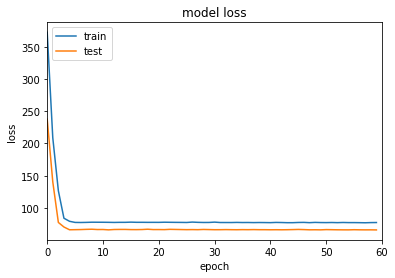

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 332.8364 - root_mean_squared_error: 18.1991 - val_loss: 221.6964 - val_root_mean_squared_error: 14.8471
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 200.1846 - root_mean_squared_error: 14.1099 - val_loss: 122.3685 - val_root_mean_squared_error: 11.0211
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 111.3730 - root_mean_squared_error: 10.5128 - val_loss: 70.3993 - val_root_mean_squared_error: 8.3412
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 79.3134 - root_mean_squared_error: 8.8584 - val_loss: 63.8883 - val_root_mean_squared_error: 7.9375
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 77.6244 - root_mean_squared_error: 8.7586 - val_loss: 65.2494 - val_root_mean_squared_error: 8.0184
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 77.5170 - root_mean_squared_error: 8.7484 - val_loss: 65.7832 - val

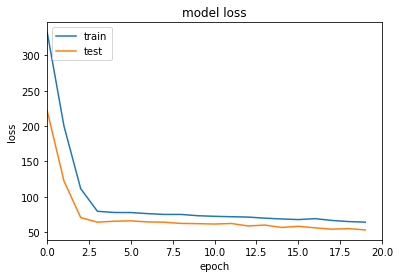

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 63.3157 - root_mean_squared_error: 7.8945 - val_loss: 52.6340 - val_root_mean_squared_error: 7.1869
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 63.1927 - root_mean_squared_error: 7.8877 - val_loss: 60.9300 - val_root_mean_squared_error: 7.7437
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 65.8685 - root_mean_squared_error: 8.0565 - val_loss: 54.2394 - val_root_mean_squared_error: 7.2996
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 63.9860 - root_mean_squared_error: 7.9390 - val_loss: 50.5746 - val_root_mean_squared_error: 7.0437
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 60.5303 - root_mean_squared_error: 7.7181 - val_loss: 49.5932 - val_root_mean_squared_error: 6.9737
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 60.7728 - root_mean_squared_error: 7.7340 - val_loss: 48.3615 - val_ro

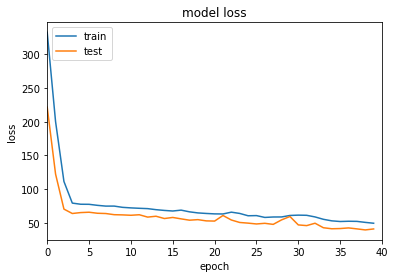

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 49.7207 - root_mean_squared_error: 6.9916 - val_loss: 42.5886 - val_root_mean_squared_error: 6.4613
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 48.9454 - root_mean_squared_error: 6.9358 - val_loss: 41.5663 - val_root_mean_squared_error: 6.3818
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 50.6895 - root_mean_squared_error: 7.0607 - val_loss: 39.7675 - val_root_mean_squared_error: 6.2397
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 47.9554 - root_mean_squared_error: 6.8647 - val_loss: 36.1600 - val_root_mean_squared_error: 5.9438
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 47.8785 - root_mean_squared_error: 6.8587 - val_loss: 41.2590 - val_root_mean_squared_error: 6.3573
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 48.6503 - root_mean_squared_error: 6.9141 - val_loss: 35.2879 - val_ro

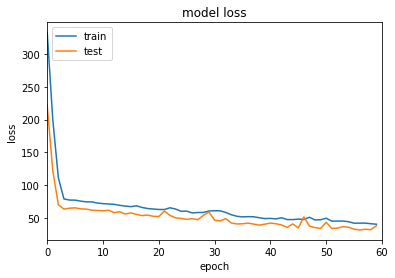

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 377.6386 - root_mean_squared_error: 19.3926 - val_loss: 246.0665 - val_root_mean_squared_error: 15.6476
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 213.8691 - root_mean_squared_error: 14.5875 - val_loss: 119.6280 - val_root_mean_squared_error: 10.8951
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 111.4081 - root_mean_squared_error: 10.5126 - val_loss: 71.9731 - val_root_mean_squared_error: 8.4319
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 80.5201 - root_mean_squared_error: 8.9234 - val_loss: 65.9932 - val_root_mean_squared_error: 8.0665
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 77.5922 - root_mean_squared_error: 8.7544 - val_loss: 66.7188 - val_root_mean_squared_error: 8.1074
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 77.7404 - root_mean_squared_error: 8.7597 - val_loss: 67.6899 - val_

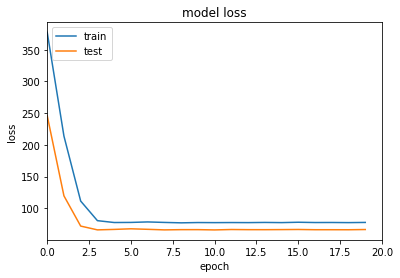

Epoch 21/40
6/6 [==============================] - 0s 27ms/step - loss: 77.0377 - root_mean_squared_error: 8.7228 - val_loss: 66.2125 - val_root_mean_squared_error: 8.0788
Epoch 22/40
6/6 [==============================] - 0s 17ms/step - loss: 77.8898 - root_mean_squared_error: 8.7720 - val_loss: 66.3041 - val_root_mean_squared_error: 8.0851
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 77.4562 - root_mean_squared_error: 8.7480 - val_loss: 66.2004 - val_root_mean_squared_error: 8.0796
Epoch 24/40
6/6 [==============================] - 0s 15ms/step - loss: 77.2664 - root_mean_squared_error: 8.7380 - val_loss: 66.2784 - val_root_mean_squared_error: 8.0854
Epoch 25/40
6/6 [==============================] - 0s 15ms/step - loss: 77.7494 - root_mean_squared_error: 8.7664 - val_loss: 66.2763 - val_root_mean_squared_error: 8.0858
Epoch 26/40
6/6 [==============================] - 0s 14ms/step - loss: 77.2534 - root_mean_squared_error: 8.7384 - val_loss: 66.2732 - val_

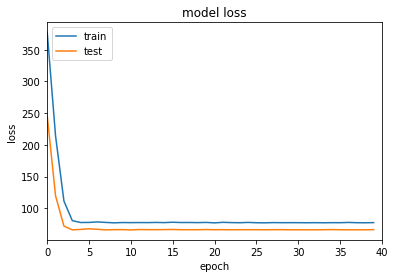

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 77.4400 - root_mean_squared_error: 8.7545 - val_loss: 66.3930 - val_root_mean_squared_error: 8.0991
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.5048 - root_mean_squared_error: 8.7582 - val_loss: 66.0673 - val_root_mean_squared_error: 8.0790
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 77.7052 - root_mean_squared_error: 8.7696 - val_loss: 66.1042 - val_root_mean_squared_error: 8.0812
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 77.0902 - root_mean_squared_error: 8.7346 - val_loss: 66.5582 - val_root_mean_squared_error: 8.1096
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 77.4674 - root_mean_squared_error: 8.7566 - val_loss: 66.5763 - val_root_mean_squared_error: 8.1111
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.4801 - root_mean_squared_error: 8.7576 - val_loss: 66.3646 - val_ro

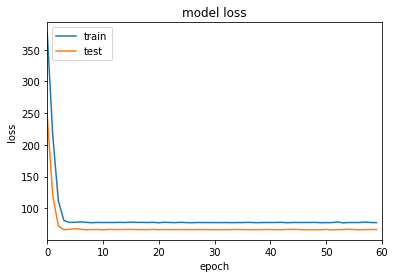

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 339.2441 - root_mean_squared_error: 18.3761 - val_loss: 218.6816 - val_root_mean_squared_error: 14.7474
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 189.6776 - root_mean_squared_error: 13.7346 - val_loss: 114.9120 - val_root_mean_squared_error: 10.6798
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 107.2351 - root_mean_squared_error: 10.3166 - val_loss: 69.9441 - val_root_mean_squared_error: 8.3173
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 78.0600 - root_mean_squared_error: 8.7910 - val_loss: 64.0836 - val_root_mean_squared_error: 7.9545
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.4873 - root_mean_squared_error: 8.6974 - val_loss: 64.9030 - val_root_mean_squared_error: 8.0008
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 75.3966 - root_mean_squared_error: 8.6302 - val_loss: 64.5919 - va

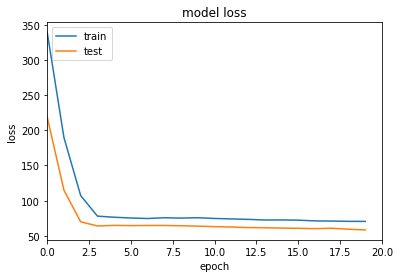

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 69.0869 - root_mean_squared_error: 8.2569 - val_loss: 59.1108 - val_root_mean_squared_error: 7.6293
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 68.8369 - root_mean_squared_error: 8.2423 - val_loss: 60.1948 - val_root_mean_squared_error: 7.7007
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 68.4921 - root_mean_squared_error: 8.2221 - val_loss: 56.8539 - val_root_mean_squared_error: 7.4813
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 67.8108 - root_mean_squared_error: 8.1811 - val_loss: 56.5398 - val_root_mean_squared_error: 7.4609
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 66.8506 - root_mean_squared_error: 8.1227 - val_loss: 56.5320 - val_root_mean_squared_error: 7.4606
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 67.3203 - root_mean_squared_error: 8.1516 - val_loss: 55.1845 - val_roo

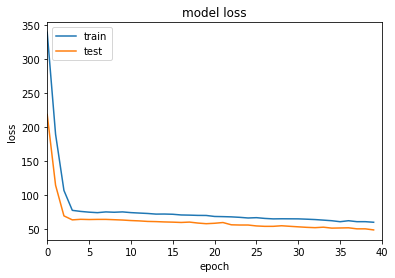

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 62.5056 - root_mean_squared_error: 7.8563 - val_loss: 49.7786 - val_root_mean_squared_error: 7.0000
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 60.4480 - root_mean_squared_error: 7.7249 - val_loss: 49.7776 - val_root_mean_squared_error: 7.0007
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 59.8454 - root_mean_squared_error: 7.6863 - val_loss: 49.1808 - val_root_mean_squared_error: 6.9583
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 59.4681 - root_mean_squared_error: 7.6619 - val_loss: 49.1147 - val_root_mean_squared_error: 6.9536
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 59.5969 - root_mean_squared_error: 7.6705 - val_loss: 48.0692 - val_root_mean_squared_error: 6.8784
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 58.1864 - root_mean_squared_error: 7.5785 - val_loss: 49.7709 - val_

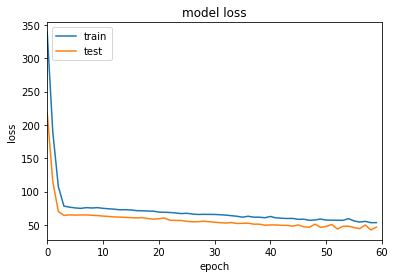

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 329.8796 - root_mean_squared_error: 18.1527 - val_loss: 205.3584 - val_root_mean_squared_error: 14.3211
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 176.7200 - root_mean_squared_error: 13.2849 - val_loss: 99.0204 - val_root_mean_squared_error: 9.9410
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 97.2661 - root_mean_squared_error: 9.8527 - val_loss: 68.3964 - val_root_mean_squared_error: 8.2589
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 77.9218 - root_mean_squared_error: 8.8165 - val_loss: 64.1124 - val_root_mean_squared_error: 7.9946
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.2911 - root_mean_squared_error: 8.7228 - val_loss: 65.3899 - val_root_mean_squared_error: 8.0733
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 75.4411 - root_mean_squared_error: 8.6732 - val_loss: 63.2567 - val_root

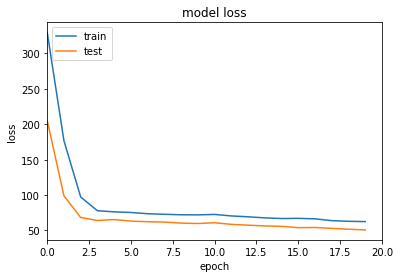

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 60.5053 - root_mean_squared_error: 7.7634 - val_loss: 49.8102 - val_root_mean_squared_error: 7.0410
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 60.1158 - root_mean_squared_error: 7.7383 - val_loss: 50.6891 - val_root_mean_squared_error: 7.1031
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 59.1283 - root_mean_squared_error: 7.6742 - val_loss: 48.6810 - val_root_mean_squared_error: 6.9603
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 57.8496 - root_mean_squared_error: 7.5904 - val_loss: 48.6836 - val_root_mean_squared_error: 6.9605
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 56.8672 - root_mean_squared_error: 7.5254 - val_loss: 45.7913 - val_root_mean_squared_error: 6.7496
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 55.9855 - root_mean_squared_error: 7.4667 - val_loss: 53.2932 - val_

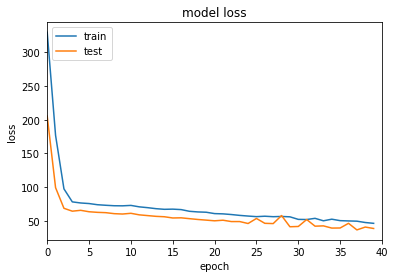

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 45.9012 - root_mean_squared_error: 6.7573 - val_loss: 35.2347 - val_root_mean_squared_error: 5.9156
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 45.6458 - root_mean_squared_error: 6.7384 - val_loss: 34.4210 - val_root_mean_squared_error: 5.8465
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 45.6239 - root_mean_squared_error: 6.7369 - val_loss: 32.9689 - val_root_mean_squared_error: 5.7211
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 44.0300 - root_mean_squared_error: 6.6175 - val_loss: 34.0316 - val_root_mean_squared_error: 5.8132
Epoch 45/60
6/6 [==============================] - 0s 14ms/step - loss: 41.8960 - root_mean_squared_error: 6.4543 - val_loss: 32.0250 - val_root_mean_squared_error: 5.6380
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 43.5449 - root_mean_squared_error: 6.5808 - val_loss: 33.3038 - val_r

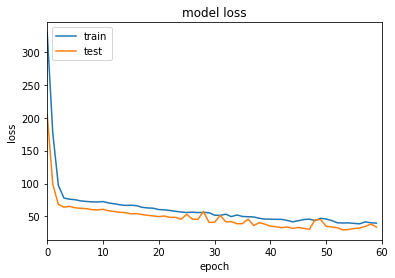

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 346.0936 - root_mean_squared_error: 18.5988 - val_loss: 228.5219 - val_root_mean_squared_error: 15.1123
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 196.6428 - root_mean_squared_error: 14.0185 - val_loss: 117.2723 - val_root_mean_squared_error: 10.8242
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 103.7684 - root_mean_squared_error: 10.1815 - val_loss: 70.6053 - val_root_mean_squared_error: 8.3964
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 77.7002 - root_mean_squared_error: 8.8087 - val_loss: 64.5836 - val_root_mean_squared_error: 8.0294
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 74.0584 - root_mean_squared_error: 8.5990 - val_loss: 65.9188 - val_root_mean_squared_error: 8.1116
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 77.0691 - root_mean_squared_error: 8.7719 - val_loss: 68.3728 - val_

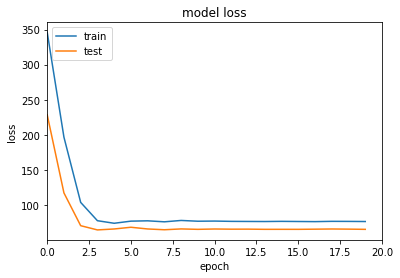

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 76.4754 - root_mean_squared_error: 8.7372 - val_loss: 65.5254 - val_root_mean_squared_error: 8.0863
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 77.5130 - root_mean_squared_error: 8.7964 - val_loss: 65.6129 - val_root_mean_squared_error: 8.0917
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 77.2894 - root_mean_squared_error: 8.7836 - val_loss: 65.4055 - val_root_mean_squared_error: 8.0788
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 76.7138 - root_mean_squared_error: 8.7507 - val_loss: 65.5712 - val_root_mean_squared_error: 8.0890
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5656 - root_mean_squared_error: 8.7422 - val_loss: 65.5187 - val_root_mean_squared_error: 8.0857
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 76.6898 - root_mean_squared_error: 8.7493 - val_loss: 65.6160 - val_ro

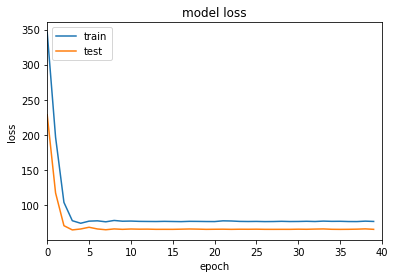

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 77.1811 - root_mean_squared_error: 8.7776 - val_loss: 65.4833 - val_root_mean_squared_error: 8.0838
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 76.6973 - root_mean_squared_error: 8.7500 - val_loss: 65.3950 - val_root_mean_squared_error: 8.0784
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 76.3914 - root_mean_squared_error: 8.7325 - val_loss: 65.6239 - val_root_mean_squared_error: 8.0926
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 76.6580 - root_mean_squared_error: 8.7478 - val_loss: 65.5495 - val_root_mean_squared_error: 8.0880
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 76.4921 - root_mean_squared_error: 8.7383 - val_loss: 65.4731 - val_root_mean_squared_error: 8.0832
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.0027 - root_mean_squared_error: 8.7674 - val_loss: 65.4191 - val_root_

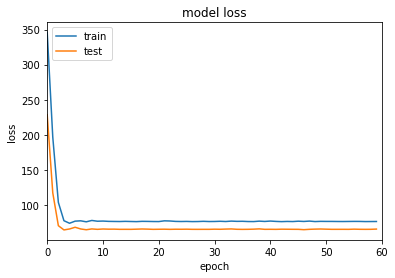

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 397.3310 - root_mean_squared_error: 19.9291 - val_loss: 271.3181 - val_root_mean_squared_error: 16.4679
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 234.3359 - root_mean_squared_error: 15.3043 - val_loss: 149.6377 - val_root_mean_squared_error: 12.2285
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 137.7395 - root_mean_squared_error: 11.7320 - val_loss: 85.5172 - val_root_mean_squared_error: 9.2422
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 88.2599 - root_mean_squared_error: 9.3893 - val_loss: 66.9561 - val_root_mean_squared_error: 8.1762
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 78.5051 - root_mean_squared_error: 8.8542 - val_loss: 65.1346 - val_root_mean_squared_error: 8.0636
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 75.7992 - root_mean_squared_error: 8.6997 - val_loss: 65.5495 - val

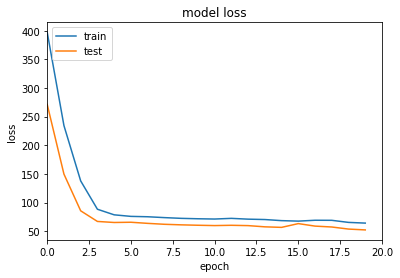

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 63.1817 - root_mean_squared_error: 7.9406 - val_loss: 54.0844 - val_root_mean_squared_error: 7.3454
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 61.8796 - root_mean_squared_error: 7.8582 - val_loss: 54.7003 - val_root_mean_squared_error: 7.3873
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 61.6952 - root_mean_squared_error: 7.8464 - val_loss: 49.6248 - val_root_mean_squared_error: 7.0354
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 60.1407 - root_mean_squared_error: 7.7468 - val_loss: 49.1514 - val_root_mean_squared_error: 7.0017
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 60.0052 - root_mean_squared_error: 7.7380 - val_loss: 53.9398 - val_root_mean_squared_error: 7.3357
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 59.2105 - root_mean_squared_error: 7.6865 - val_loss: 47.9043 - val_roo

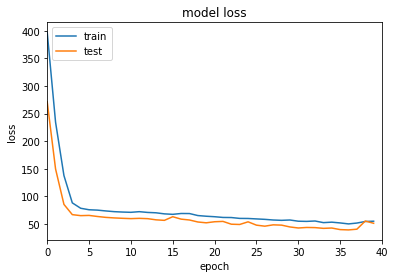

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 59.6799 - root_mean_squared_error: 7.7170 - val_loss: 51.2627 - val_root_mean_squared_error: 7.1509
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 62.4121 - root_mean_squared_error: 7.8920 - val_loss: 57.0482 - val_root_mean_squared_error: 7.5446
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 53.5513 - root_mean_squared_error: 7.3091 - val_loss: 39.1385 - val_root_mean_squared_error: 6.2459
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 51.8997 - root_mean_squared_error: 7.1953 - val_loss: 39.6891 - val_root_mean_squared_error: 6.2898
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 50.6416 - root_mean_squared_error: 7.1073 - val_loss: 36.4376 - val_root_mean_squared_error: 6.0257
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 47.8509 - root_mean_squared_error: 6.9082 - val_loss: 47.2804 - val_

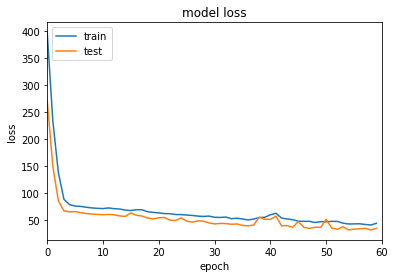

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 344.3357 - root_mean_squared_error: 18.5520 - val_loss: 236.1619 - val_root_mean_squared_error: 15.3634
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 212.6862 - root_mean_squared_error: 14.5799 - val_loss: 132.4037 - val_root_mean_squared_error: 11.5024
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 122.0686 - root_mean_squared_error: 11.0442 - val_loss: 78.3644 - val_root_mean_squared_error: 8.8471
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 84.1221 - root_mean_squared_error: 9.1666 - val_loss: 63.6040 - val_root_mean_squared_error: 7.9691
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 77.5866 - root_mean_squared_error: 8.8026 - val_loss: 65.9450 - val_root_mean_squared_error: 8.1142
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 76.2974 - root_mean_squared_error: 8.7287 - val_loss: 65.5203 - va

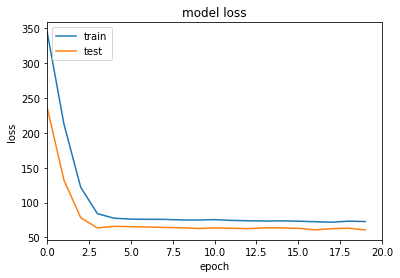

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 71.1341 - root_mean_squared_error: 8.4267 - val_loss: 60.0226 - val_root_mean_squared_error: 7.7394
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 70.5758 - root_mean_squared_error: 8.3935 - val_loss: 59.0878 - val_root_mean_squared_error: 7.6787
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 70.6170 - root_mean_squared_error: 8.3960 - val_loss: 61.4062 - val_root_mean_squared_error: 7.8283
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 70.9428 - root_mean_squared_error: 8.4154 - val_loss: 60.6722 - val_root_mean_squared_error: 7.7812
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 71.5758 - root_mean_squared_error: 8.4529 - val_loss: 58.7302 - val_root_mean_squared_error: 7.6554
Epoch 26/40
6/6 [==============================] - 0s 14ms/step - loss: 69.7429 - root_mean_squared_error: 8.3438 - val_loss: 61.2110 - val_ro

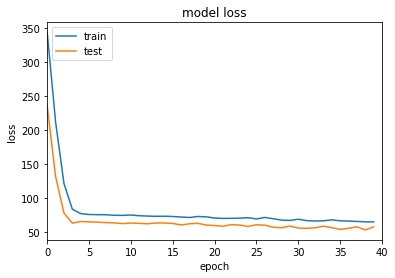

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 65.8507 - root_mean_squared_error: 8.1072 - val_loss: 55.1752 - val_root_mean_squared_error: 7.4197
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 66.7531 - root_mean_squared_error: 8.1627 - val_loss: 53.6629 - val_root_mean_squared_error: 7.3170
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 67.8878 - root_mean_squared_error: 8.2318 - val_loss: 56.3376 - val_root_mean_squared_error: 7.4975
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 67.1909 - root_mean_squared_error: 8.1894 - val_loss: 53.5469 - val_root_mean_squared_error: 7.3090
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 64.6345 - root_mean_squared_error: 8.0318 - val_loss: 53.9502 - val_root_mean_squared_error: 7.3366
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 62.9397 - root_mean_squared_error: 7.9256 - val_loss: 51.6409 - val_root_

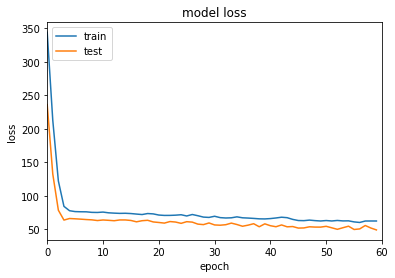

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 316.9775 - root_mean_squared_error: 17.7978 - val_loss: 208.7115 - val_root_mean_squared_error: 14.4414
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 183.8844 - root_mean_squared_error: 13.5553 - val_loss: 113.2213 - val_root_mean_squared_error: 10.6351
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 104.8481 - root_mean_squared_error: 10.2340 - val_loss: 70.9730 - val_root_mean_squared_error: 8.4179
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 79.0645 - root_mean_squared_error: 8.8855 - val_loss: 65.3956 - val_root_mean_squared_error: 8.0796
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.3187 - root_mean_squared_error: 8.7293 - val_loss: 65.3245 - val_root_mean_squared_error: 8.0748
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 76.2508 - root_mean_squared_error: 8.7251 - val_loss: 64.8015 - val_r

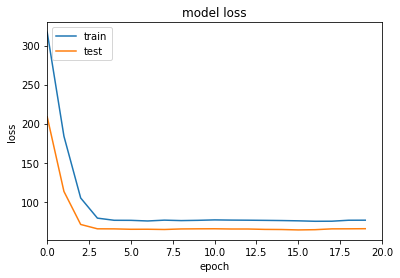

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 76.4506 - root_mean_squared_error: 8.7359 - val_loss: 65.6119 - val_root_mean_squared_error: 8.0919
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 76.8472 - root_mean_squared_error: 8.7586 - val_loss: 65.1897 - val_root_mean_squared_error: 8.0658
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 75.5732 - root_mean_squared_error: 8.6857 - val_loss: 64.9972 - val_root_mean_squared_error: 8.0539
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 75.7918 - root_mean_squared_error: 8.6983 - val_loss: 63.6422 - val_root_mean_squared_error: 7.9694
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 73.9118 - root_mean_squared_error: 8.5896 - val_loss: 62.5932 - val_root_mean_squared_error: 7.9033
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 73.2948 - root_mean_squared_error: 8.5536 - val_loss: 61.4465 - val_root

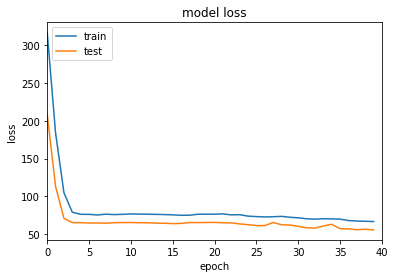

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 66.3730 - root_mean_squared_error: 8.1390 - val_loss: 55.5280 - val_root_mean_squared_error: 7.4430
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 66.8771 - root_mean_squared_error: 8.1700 - val_loss: 55.3128 - val_root_mean_squared_error: 7.4286
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 67.3155 - root_mean_squared_error: 8.1968 - val_loss: 53.9219 - val_root_mean_squared_error: 7.3344
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 65.8997 - root_mean_squared_error: 8.1100 - val_loss: 54.1978 - val_root_mean_squared_error: 7.3533
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 64.8621 - root_mean_squared_error: 8.0458 - val_loss: 53.6703 - val_root_mean_squared_error: 7.3174
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 64.3176 - root_mean_squared_error: 8.0120 - val_loss: 54.2593 - val_root

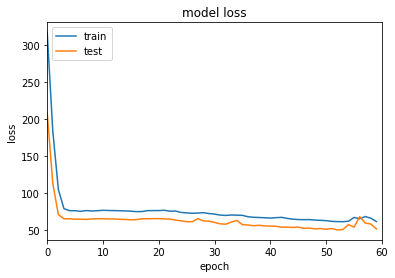

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 328.5999 - root_mean_squared_error: 18.1263 - val_loss: 211.9426 - val_root_mean_squared_error: 14.5572
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 185.4187 - root_mean_squared_error: 13.6159 - val_loss: 112.4875 - val_root_mean_squared_error: 10.6048
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 106.6700 - root_mean_squared_error: 10.3269 - val_loss: 72.9425 - val_root_mean_squared_error: 8.5392
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 81.6690 - root_mean_squared_error: 9.0357 - val_loss: 63.9321 - val_root_mean_squared_error: 7.9941
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 75.2537 - root_mean_squared_error: 8.6734 - val_loss: 64.1868 - val_root_mean_squared_error: 8.0100
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 76.8613 - root_mean_squared_error: 8.7655 - val_loss: 66.6579 - val_

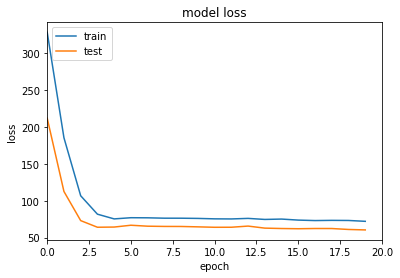

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 71.7538 - root_mean_squared_error: 8.4690 - val_loss: 64.4054 - val_root_mean_squared_error: 8.0235
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 72.9434 - root_mean_squared_error: 8.5390 - val_loss: 64.8058 - val_root_mean_squared_error: 8.0484
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 74.0476 - root_mean_squared_error: 8.6034 - val_loss: 62.3367 - val_root_mean_squared_error: 7.8935
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 70.2351 - root_mean_squared_error: 8.3788 - val_loss: 58.8651 - val_root_mean_squared_error: 7.6704
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 69.8447 - root_mean_squared_error: 8.3555 - val_loss: 58.7389 - val_root_mean_squared_error: 7.6621
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 69.9256 - root_mean_squared_error: 8.3603 - val_loss: 61.6675 - val_ro

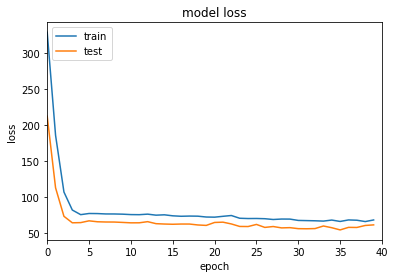

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 66.2678 - root_mean_squared_error: 8.1386 - val_loss: 52.9170 - val_root_mean_squared_error: 7.2723
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 65.6503 - root_mean_squared_error: 8.1006 - val_loss: 56.5630 - val_root_mean_squared_error: 7.5188
Epoch 43/60
6/6 [==============================] - 0s 14ms/step - loss: 66.4669 - root_mean_squared_error: 8.1508 - val_loss: 57.5181 - val_root_mean_squared_error: 7.5821
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 64.2437 - root_mean_squared_error: 8.0133 - val_loss: 53.3008 - val_root_mean_squared_error: 7.2987
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 63.5452 - root_mean_squared_error: 7.9696 - val_loss: 51.8969 - val_root_mean_squared_error: 7.2018
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 62.1935 - root_mean_squared_error: 7.8844 - val_loss: 51.1336 - val_roo

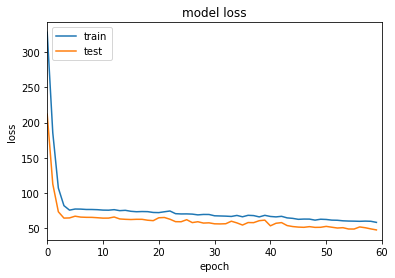

Epoch 1/20
6/6 [==============================] - 1s 129ms/step - loss: 302.4793 - root_mean_squared_error: 17.3914 - val_loss: 192.6933 - val_root_mean_squared_error: 13.8809
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 169.1084 - root_mean_squared_error: 13.0036 - val_loss: 101.1692 - val_root_mean_squared_error: 10.0577
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 99.4340 - root_mean_squared_error: 9.9710 - val_loss: 66.6016 - val_root_mean_squared_error: 8.1602
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 75.7100 - root_mean_squared_error: 8.7004 - val_loss: 65.2436 - val_root_mean_squared_error: 8.0766
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.1450 - root_mean_squared_error: 8.7254 - val_loss: 65.6906 - val_root_mean_squared_error: 8.1042
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 75.1926 - root_mean_squared_error: 8.6706 - val_loss: 63.9659 - val_

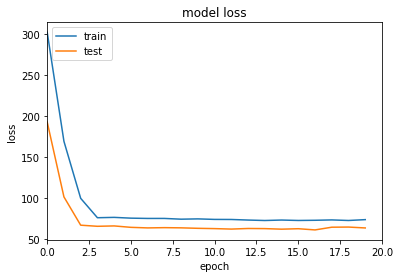

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 72.0000 - root_mean_squared_error: 8.4844 - val_loss: 60.0526 - val_root_mean_squared_error: 7.7484
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 71.6950 - root_mean_squared_error: 8.4664 - val_loss: 59.8310 - val_root_mean_squared_error: 7.7341
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 71.0672 - root_mean_squared_error: 8.4292 - val_loss: 63.6738 - val_root_mean_squared_error: 7.9786
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 71.4570 - root_mean_squared_error: 8.4523 - val_loss: 58.5593 - val_root_mean_squared_error: 7.6514
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 71.0020 - root_mean_squared_error: 8.4254 - val_loss: 59.9254 - val_root_mean_squared_error: 7.7402
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 69.8702 - root_mean_squared_error: 8.3579 - val_loss: 62.4455 - val_root_

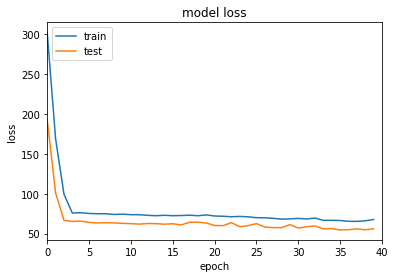

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 66.5353 - root_mean_squared_error: 8.1560 - val_loss: 60.2093 - val_root_mean_squared_error: 7.7585
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 66.0281 - root_mean_squared_error: 8.1248 - val_loss: 55.8551 - val_root_mean_squared_error: 7.4726
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 65.4644 - root_mean_squared_error: 8.0900 - val_loss: 53.0942 - val_root_mean_squared_error: 7.2855
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 63.4914 - root_mean_squared_error: 7.9672 - val_loss: 52.4603 - val_root_mean_squared_error: 7.2419
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 62.8887 - root_mean_squared_error: 7.9293 - val_loss: 54.0542 - val_root_mean_squared_error: 7.3511
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 62.6319 - root_mean_squared_error: 7.9130 - val_loss: 54.0912 - val_ro

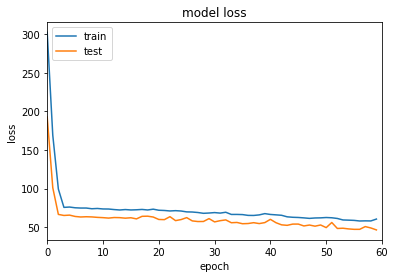

Epoch 1/20
6/6 [==============================] - 1s 43ms/step - loss: 368.3652 - root_mean_squared_error: 19.1924 - val_loss: 248.1790 - val_root_mean_squared_error: 15.7533
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 217.9192 - root_mean_squared_error: 14.7617 - val_loss: 137.5250 - val_root_mean_squared_error: 11.7266
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 122.0689 - root_mean_squared_error: 11.0480 - val_loss: 80.5966 - val_root_mean_squared_error: 8.9770
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 85.1219 - root_mean_squared_error: 9.2256 - val_loss: 65.2537 - val_root_mean_squared_error: 8.0773
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.4361 - root_mean_squared_error: 8.7422 - val_loss: 63.4006 - val_root_mean_squared_error: 7.9617
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 75.5939 - root_mean_squared_error: 8.6938 - val_loss: 63.7756 - val

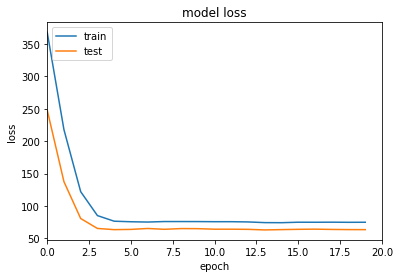

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 74.4275 - root_mean_squared_error: 8.6264 - val_loss: 64.2121 - val_root_mean_squared_error: 8.0124
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 75.3819 - root_mean_squared_error: 8.6815 - val_loss: 64.4719 - val_root_mean_squared_error: 8.0286
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 75.0113 - root_mean_squared_error: 8.6601 - val_loss: 64.2826 - val_root_mean_squared_error: 8.0168
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 74.2567 - root_mean_squared_error: 8.6164 - val_loss: 62.6746 - val_root_mean_squared_error: 7.9159
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 73.0244 - root_mean_squared_error: 8.5446 - val_loss: 61.7197 - val_root_mean_squared_error: 7.8553
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 72.3823 - root_mean_squared_error: 8.5070 - val_loss: 60.7665 - val_roo

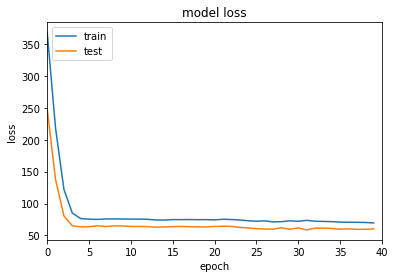

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 71.5465 - root_mean_squared_error: 8.4577 - val_loss: 64.5963 - val_root_mean_squared_error: 8.0363
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 74.1352 - root_mean_squared_error: 8.6093 - val_loss: 57.9063 - val_root_mean_squared_error: 7.6087
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 70.3716 - root_mean_squared_error: 8.3879 - val_loss: 58.0236 - val_root_mean_squared_error: 7.6164
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 68.4019 - root_mean_squared_error: 8.2697 - val_loss: 56.9386 - val_root_mean_squared_error: 7.5448
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 68.4162 - root_mean_squared_error: 8.2705 - val_loss: 58.1038 - val_root_mean_squared_error: 7.6216
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 66.9572 - root_mean_squared_error: 8.1819 - val_loss: 56.0012 - val_root

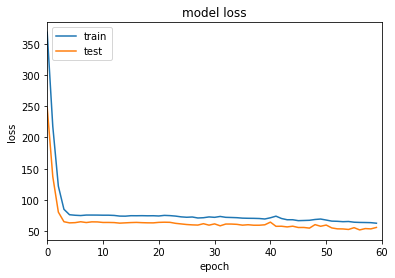

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 321.9548 - root_mean_squared_error: 17.9371 - val_loss: 197.7749 - val_root_mean_squared_error: 14.0575
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 176.7285 - root_mean_squared_error: 13.2884 - val_loss: 108.2502 - val_root_mean_squared_error: 10.3981
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 103.8915 - root_mean_squared_error: 10.1865 - val_loss: 72.6758 - val_root_mean_squared_error: 8.5175
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 80.8879 - root_mean_squared_error: 8.9865 - val_loss: 65.0790 - val_root_mean_squared_error: 8.0588
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.4227 - root_mean_squared_error: 8.7342 - val_loss: 64.7659 - val_root_mean_squared_error: 8.0390
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 75.9413 - root_mean_squared_error: 8.7063 - val_loss: 65.2377 - val_

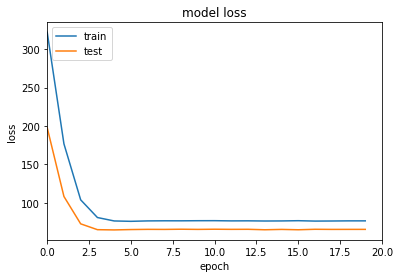

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 76.6424 - root_mean_squared_error: 8.7458 - val_loss: 65.4789 - val_root_mean_squared_error: 8.0824
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 76.5155 - root_mean_squared_error: 8.7386 - val_loss: 65.6935 - val_root_mean_squared_error: 8.0958
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6516 - root_mean_squared_error: 8.7464 - val_loss: 65.5937 - val_root_mean_squared_error: 8.0897
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5704 - root_mean_squared_error: 8.7418 - val_loss: 65.5699 - val_root_mean_squared_error: 8.0883
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 76.6132 - root_mean_squared_error: 8.7444 - val_loss: 65.4210 - val_root_mean_squared_error: 8.0791
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 76.6111 - root_mean_squared_error: 8.7443 - val_loss: 65.4034 - val_

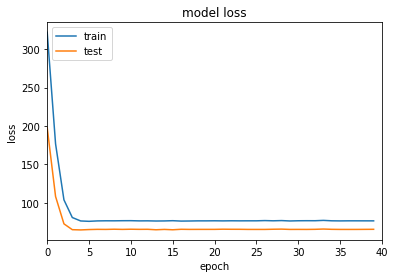

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 76.6274 - root_mean_squared_error: 8.7458 - val_loss: 65.5230 - val_root_mean_squared_error: 8.0861
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5248 - root_mean_squared_error: 8.7400 - val_loss: 65.3977 - val_root_mean_squared_error: 8.0784
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 76.7430 - root_mean_squared_error: 8.7525 - val_loss: 65.4045 - val_root_mean_squared_error: 8.0789
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 76.7881 - root_mean_squared_error: 8.7551 - val_loss: 65.4067 - val_root_mean_squared_error: 8.0791
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5007 - root_mean_squared_error: 8.7388 - val_loss: 65.5436 - val_root_mean_squared_error: 8.0876
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 76.9629 - root_mean_squared_error: 8.7652 - val_loss: 65.9536 - val_roo

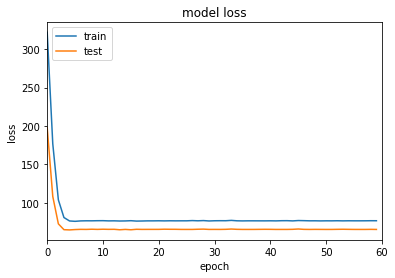

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 291.5005 - root_mean_squared_error: 17.0728 - val_loss: 188.0094 - val_root_mean_squared_error: 13.7111
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 167.7939 - root_mean_squared_error: 12.9530 - val_loss: 106.7592 - val_root_mean_squared_error: 10.3318
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 104.1802 - root_mean_squared_error: 10.2062 - val_loss: 73.1930 - val_root_mean_squared_error: 8.5545
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 81.1753 - root_mean_squared_error: 9.0090 - val_loss: 64.7395 - val_root_mean_squared_error: 8.0452
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 76.0944 - root_mean_squared_error: 8.7224 - val_loss: 64.2063 - val_root_mean_squared_error: 8.0120
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 75.3862 - root_mean_squared_error: 8.6817 - val_loss: 64.3198 - val_r

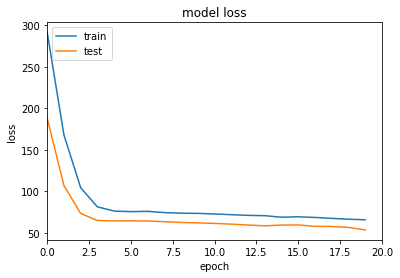

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 63.9770 - root_mean_squared_error: 7.9975 - val_loss: 53.1857 - val_root_mean_squared_error: 7.2917
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 65.5254 - root_mean_squared_error: 8.0938 - val_loss: 58.1794 - val_root_mean_squared_error: 7.6265
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 67.3238 - root_mean_squared_error: 8.2041 - val_loss: 58.4871 - val_root_mean_squared_error: 7.6466
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 64.3459 - root_mean_squared_error: 8.0206 - val_loss: 52.5341 - val_root_mean_squared_error: 7.2469
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 61.8473 - root_mean_squared_error: 7.8633 - val_loss: 50.1443 - val_root_mean_squared_error: 7.0801
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 60.4020 - root_mean_squared_error: 7.7708 - val_loss: 48.8047 - val_r

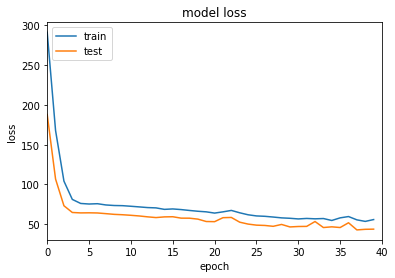

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 55.0072 - root_mean_squared_error: 7.4155 - val_loss: 40.6113 - val_root_mean_squared_error: 6.3713
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 52.3827 - root_mean_squared_error: 7.2364 - val_loss: 40.3391 - val_root_mean_squared_error: 6.3499
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 52.1068 - root_mean_squared_error: 7.2173 - val_loss: 45.8463 - val_root_mean_squared_error: 6.7697
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 52.4523 - root_mean_squared_error: 7.2412 - val_loss: 38.5521 - val_root_mean_squared_error: 6.2076
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 49.2132 - root_mean_squared_error: 7.0139 - val_loss: 41.6888 - val_root_mean_squared_error: 6.4553
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 48.5373 - root_mean_squared_error: 6.9656 - val_loss: 43.2515 - val_roo

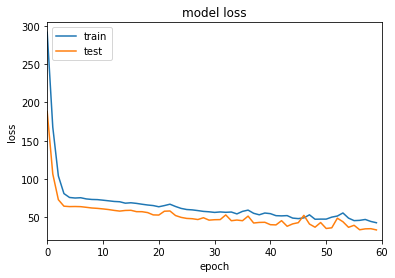

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 339.5894 - root_mean_squared_error: 18.4278 - val_loss: 202.4263 - val_root_mean_squared_error: 14.2275
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 181.8748 - root_mean_squared_error: 13.4860 - val_loss: 114.0005 - val_root_mean_squared_error: 10.6770
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 108.9523 - root_mean_squared_error: 10.4379 - val_loss: 71.0549 - val_root_mean_squared_error: 8.4292
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 78.9582 - root_mean_squared_error: 8.8857 - val_loss: 64.0970 - val_root_mean_squared_error: 8.0059
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 75.1827 - root_mean_squared_error: 8.6706 - val_loss: 64.0098 - val_root_mean_squared_error: 8.0004
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 74.9057 - root_mean_squared_error: 8.6546 - val_loss: 63.4189 - v

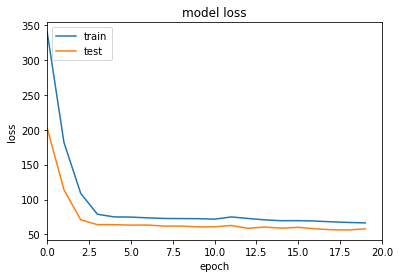

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 67.0599 - root_mean_squared_error: 8.1888 - val_loss: 54.5317 - val_root_mean_squared_error: 7.3843
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 67.8708 - root_mean_squared_error: 8.2382 - val_loss: 54.7062 - val_root_mean_squared_error: 7.3961
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 65.0690 - root_mean_squared_error: 8.0663 - val_loss: 55.9207 - val_root_mean_squared_error: 7.4778
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 64.8714 - root_mean_squared_error: 8.0541 - val_loss: 56.8527 - val_root_mean_squared_error: 7.5398
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 65.9922 - root_mean_squared_error: 8.1233 - val_loss: 57.2517 - val_root_mean_squared_error: 7.5663
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 66.0601 - root_mean_squared_error: 8.1275 - val_loss: 57.6713 - val_roo

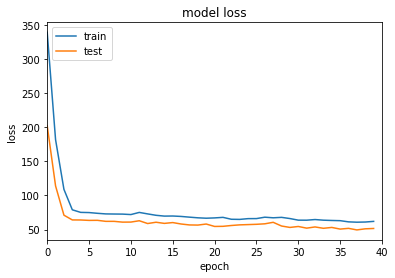

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 62.9990 - root_mean_squared_error: 7.9370 - val_loss: 49.2060 - val_root_mean_squared_error: 7.0144
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 60.2151 - root_mean_squared_error: 7.7596 - val_loss: 50.6051 - val_root_mean_squared_error: 7.1135
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 61.5363 - root_mean_squared_error: 7.8443 - val_loss: 47.7396 - val_root_mean_squared_error: 6.9091
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 58.8355 - root_mean_squared_error: 7.6702 - val_loss: 50.3580 - val_root_mean_squared_error: 7.0961
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 58.5164 - root_mean_squared_error: 7.6494 - val_loss: 46.4800 - val_root_mean_squared_error: 6.8173
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 59.3052 - root_mean_squared_error: 7.7007 - val_loss: 48.8873 - val_roo

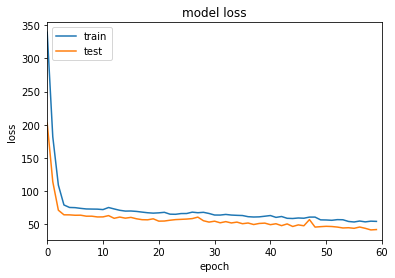

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 350.6511 - root_mean_squared_error: 18.7256 - val_loss: 223.3383 - val_root_mean_squared_error: 14.9445
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 193.3278 - root_mean_squared_error: 13.9042 - val_loss: 121.2457 - val_root_mean_squared_error: 11.0111
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 112.3884 - root_mean_squared_error: 10.6013 - val_loss: 74.3464 - val_root_mean_squared_error: 8.6224
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 80.8254 - root_mean_squared_error: 8.9902 - val_loss: 64.7593 - val_root_mean_squared_error: 8.0472
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 75.3371 - root_mean_squared_error: 8.6796 - val_loss: 64.5856 - val_root_mean_squared_error: 8.0364
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 75.6266 - root_mean_squared_error: 8.6963 - val_loss: 66.4413 - val

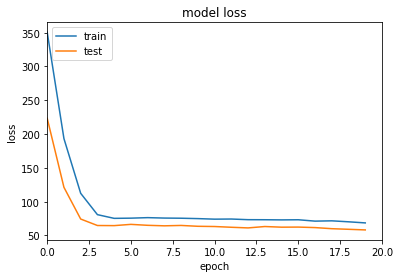

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 67.8427 - root_mean_squared_error: 8.2366 - val_loss: 56.2388 - val_root_mean_squared_error: 7.4992
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 67.6595 - root_mean_squared_error: 8.2254 - val_loss: 56.3254 - val_root_mean_squared_error: 7.5049
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 65.9712 - root_mean_squared_error: 8.1222 - val_loss: 55.5164 - val_root_mean_squared_error: 7.4508
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 65.6171 - root_mean_squared_error: 8.1003 - val_loss: 53.8809 - val_root_mean_squared_error: 7.3403
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 66.3074 - root_mean_squared_error: 8.1428 - val_loss: 53.3962 - val_root_mean_squared_error: 7.3072
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 65.4194 - root_mean_squared_error: 8.0881 - val_loss: 53.5988 - val_ro

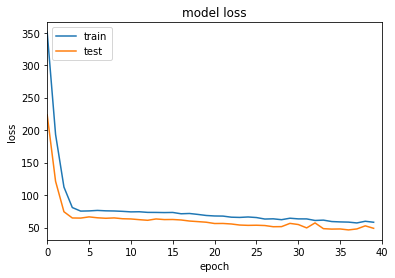

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 57.2252 - root_mean_squared_error: 7.5646 - val_loss: 52.3359 - val_root_mean_squared_error: 7.2342
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 57.9246 - root_mean_squared_error: 7.6107 - val_loss: 44.9005 - val_root_mean_squared_error: 6.7007
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 54.6606 - root_mean_squared_error: 7.3932 - val_loss: 43.8294 - val_root_mean_squared_error: 6.6203
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 55.8731 - root_mean_squared_error: 7.4747 - val_loss: 45.7849 - val_root_mean_squared_error: 6.7663
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 58.1780 - root_mean_squared_error: 7.6273 - val_loss: 42.8295 - val_root_mean_squared_error: 6.5443
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 54.0431 - root_mean_squared_error: 7.3513 - val_loss: 50.4886 - val_roo

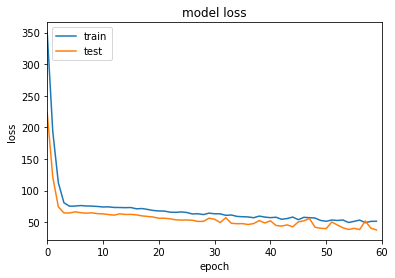

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 1900.4768 - root_mean_squared_error: 43.5715 - val_loss: 372.4528 - val_root_mean_squared_error: 19.2479
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 155.1512 - root_mean_squared_error: 12.3773 - val_loss: 192.7811 - val_root_mean_squared_error: 13.8149
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 281.1923 - root_mean_squared_error: 16.7116 - val_loss: 327.5139 - val_root_mean_squared_error: 18.0450
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 228.8740 - root_mean_squared_error: 15.0664 - val_loss: 106.5627 - val_root_mean_squared_error: 10.2327
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 82.8180 - root_mean_squared_error: 8.9988 - val_loss: 66.8038 - val_root_mean_squared_error: 8.0614
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 91.9522 - root_mean_squared_error: 9.4946 - val_loss: 88.11

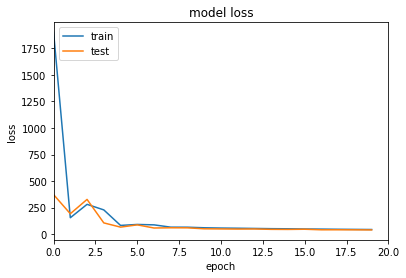

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 43.4267 - root_mean_squared_error: 6.4772 - val_loss: 39.5444 - val_root_mean_squared_error: 6.1709
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 42.8784 - root_mean_squared_error: 6.4357 - val_loss: 38.6839 - val_root_mean_squared_error: 6.1017
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 41.9244 - root_mean_squared_error: 6.3620 - val_loss: 37.8863 - val_root_mean_squared_error: 6.0368
Epoch 24/40
6/6 [==============================] - 0s 14ms/step - loss: 41.3037 - root_mean_squared_error: 6.3137 - val_loss: 37.4958 - val_root_mean_squared_error: 6.0050
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 40.5641 - root_mean_squared_error: 6.2555 - val_loss: 36.8191 - val_root_mean_squared_error: 5.9489
Epoch 26/40
6/6 [==============================] - 0s 14ms/step - loss: 40.3388 - root_mean_squared_error: 6.2378 - val_loss: 35.9435 - val_ro

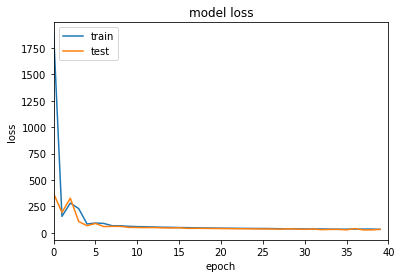

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 31.1164 - root_mean_squared_error: 5.4484 - val_loss: 25.9793 - val_root_mean_squared_error: 4.9546
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 30.5210 - root_mean_squared_error: 5.3935 - val_loss: 30.2328 - val_root_mean_squared_error: 5.3667
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 30.4658 - root_mean_squared_error: 5.3884 - val_loss: 25.1257 - val_root_mean_squared_error: 4.8677
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 30.1542 - root_mean_squared_error: 5.3595 - val_loss: 28.6006 - val_root_mean_squared_error: 5.2125
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 29.6193 - root_mean_squared_error: 5.3094 - val_loss: 24.6529 - val_root_mean_squared_error: 4.8191
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 29.6132 - root_mean_squared_error: 5.3089 - val_loss: 31.1963 - val_r

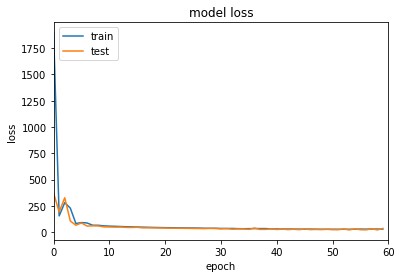

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 499.5714 - root_mean_squared_error: 22.3080 - val_loss: 152.9612 - val_root_mean_squared_error: 12.2907
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 266.6539 - root_mean_squared_error: 16.2717 - val_loss: 218.5081 - val_root_mean_squared_error: 14.7189
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 108.9853 - root_mean_squared_error: 10.3507 - val_loss: 80.0684 - val_root_mean_squared_error: 8.8455
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 113.1466 - root_mean_squared_error: 10.5515 - val_loss: 93.3009 - val_root_mean_squared_error: 9.5661
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 75.4368 - root_mean_squared_error: 8.5825 - val_loss: 68.5365 - val_root_mean_squared_error: 8.1719
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 72.6622 - root_mean_squared_error: 8.4213 - val_loss: 66.1418 - 

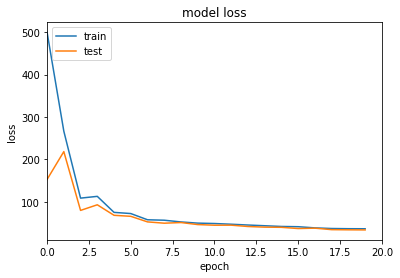

Epoch 21/40
6/6 [==============================] - 0s 31ms/step - loss: 36.0884 - root_mean_squared_error: 5.8879 - val_loss: 32.8267 - val_root_mean_squared_error: 5.6048
Epoch 22/40
6/6 [==============================] - 0s 17ms/step - loss: 34.2634 - root_mean_squared_error: 5.7320 - val_loss: 33.5726 - val_root_mean_squared_error: 5.6720
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 33.3072 - root_mean_squared_error: 5.6489 - val_loss: 30.5824 - val_root_mean_squared_error: 5.4029
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 33.0903 - root_mean_squared_error: 5.6305 - val_loss: 31.2053 - val_root_mean_squared_error: 5.4610
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 32.1377 - root_mean_squared_error: 5.5460 - val_loss: 31.2508 - val_root_mean_squared_error: 5.4658
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 32.4619 - root_mean_squared_error: 5.5758 - val_loss: 28.4297 - val_r

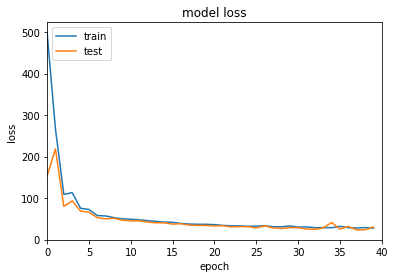

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 29.1612 - root_mean_squared_error: 5.2723 - val_loss: 24.1368 - val_root_mean_squared_error: 4.7720
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 33.3811 - root_mean_squared_error: 5.6583 - val_loss: 39.8375 - val_root_mean_squared_error: 6.2027
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 28.9568 - root_mean_squared_error: 5.2529 - val_loss: 22.3921 - val_root_mean_squared_error: 4.5856
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 28.3032 - root_mean_squared_error: 5.1903 - val_loss: 24.6717 - val_root_mean_squared_error: 4.8279
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 26.5725 - root_mean_squared_error: 5.0209 - val_loss: 25.1262 - val_root_mean_squared_error: 4.8748
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 26.5555 - root_mean_squared_error: 5.0193 - val_loss: 22.5002 - val_r

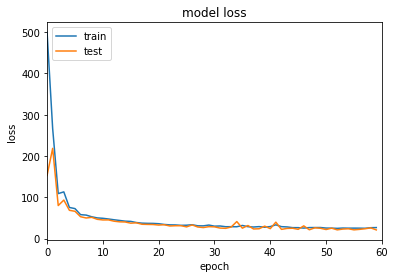

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 228.6247 - root_mean_squared_error: 15.0601 - val_loss: 168.0618 - val_root_mean_squared_error: 12.8947
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 143.2031 - root_mean_squared_error: 11.8925 - val_loss: 57.0604 - val_root_mean_squared_error: 7.4375
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 83.4104 - root_mean_squared_error: 9.0378 - val_loss: 78.3559 - val_root_mean_squared_error: 8.7552
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 73.1862 - root_mean_squared_error: 8.4558 - val_loss: 57.0005 - val_root_mean_squared_error: 7.4391
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 66.9467 - root_mean_squared_error: 8.0809 - val_loss: 51.9493 - val_root_mean_squared_error: 7.0943
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 57.3759 - root_mean_squared_error: 7.4679 - val_loss: 46.6278 - val_ro

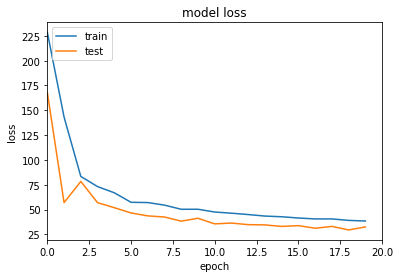

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 39.9071 - root_mean_squared_error: 6.2205 - val_loss: 31.4154 - val_root_mean_squared_error: 5.4965
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 38.5361 - root_mean_squared_error: 6.1105 - val_loss: 28.3898 - val_root_mean_squared_error: 5.2153
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 40.4071 - root_mean_squared_error: 6.2627 - val_loss: 29.6312 - val_root_mean_squared_error: 5.3341
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 37.4934 - root_mean_squared_error: 6.0266 - val_loss: 30.6345 - val_root_mean_squared_error: 5.4284
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 36.7944 - root_mean_squared_error: 5.9692 - val_loss: 26.7013 - val_root_mean_squared_error: 5.0541
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 38.6863 - root_mean_squared_error: 6.1263 - val_loss: 25.2839 - val_roo

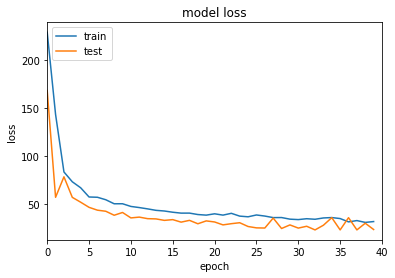

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 31.0134 - root_mean_squared_error: 5.4639 - val_loss: 23.1020 - val_root_mean_squared_error: 4.6844
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 30.8188 - root_mean_squared_error: 5.4461 - val_loss: 27.4075 - val_root_mean_squared_error: 5.1235
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 31.3041 - root_mean_squared_error: 5.4906 - val_loss: 29.7980 - val_root_mean_squared_error: 5.3518
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 32.1577 - root_mean_squared_error: 5.5679 - val_loss: 21.8382 - val_root_mean_squared_error: 4.5477
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 32.1156 - root_mean_squared_error: 5.5641 - val_loss: 26.7873 - val_root_mean_squared_error: 5.0628
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 30.8490 - root_mean_squared_error: 5.4492 - val_loss: 27.2139 - val_root_

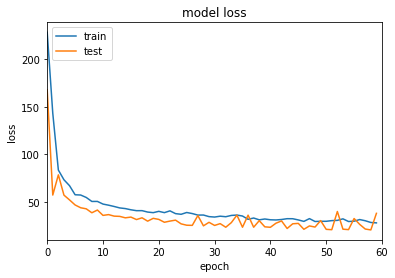

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 4459.0786 - root_mean_squared_error: 66.7628 - val_loss: 1700.9747 - val_root_mean_squared_error: 41.2213
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 659.5652 - root_mean_squared_error: 25.6476 - val_loss: 59.3021 - val_root_mean_squared_error: 7.5869
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 147.8045 - root_mean_squared_error: 12.0863 - val_loss: 323.4491 - val_root_mean_squared_error: 17.9373
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 427.0167 - root_mean_squared_error: 20.6235 - val_loss: 328.5814 - val_root_mean_squared_error: 18.0808
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 273.7101 - root_mean_squared_error: 16.4942 - val_loss: 89.0163 - val_root_mean_squared_error: 9.3481
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 77.4619 - root_mean_squared_error: 8.7090 - val_loss: 65.

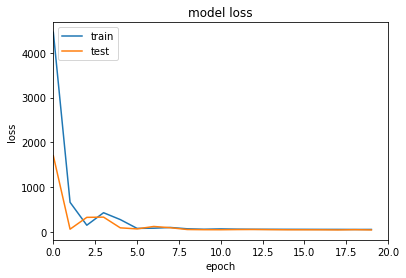

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 52.6293 - root_mean_squared_error: 7.1658 - val_loss: 43.1262 - val_root_mean_squared_error: 6.4694
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 51.8675 - root_mean_squared_error: 7.1133 - val_loss: 44.1526 - val_root_mean_squared_error: 6.5490
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 51.1704 - root_mean_squared_error: 7.0648 - val_loss: 40.9074 - val_root_mean_squared_error: 6.2972
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 51.0034 - root_mean_squared_error: 7.0536 - val_loss: 40.5014 - val_root_mean_squared_error: 6.2655
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 49.8613 - root_mean_squared_error: 6.9728 - val_loss: 45.1690 - val_root_mean_squared_error: 6.6281
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 49.3294 - root_mean_squared_error: 6.9350 - val_loss: 38.7876 - val_roo

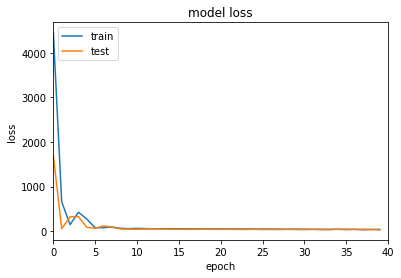

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 41.3884 - root_mean_squared_error: 6.3359 - val_loss: 35.7098 - val_root_mean_squared_error: 5.8707
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 41.9824 - root_mean_squared_error: 6.3826 - val_loss: 28.9463 - val_root_mean_squared_error: 5.2631
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 41.4525 - root_mean_squared_error: 6.3409 - val_loss: 34.4484 - val_root_mean_squared_error: 5.7622
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 40.7920 - root_mean_squared_error: 6.2886 - val_loss: 33.4578 - val_root_mean_squared_error: 5.6756
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 39.5954 - root_mean_squared_error: 6.1928 - val_loss: 30.2362 - val_root_mean_squared_error: 5.3843
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 39.4093 - root_mean_squared_error: 6.1777 - val_loss: 32.0314 - val_r

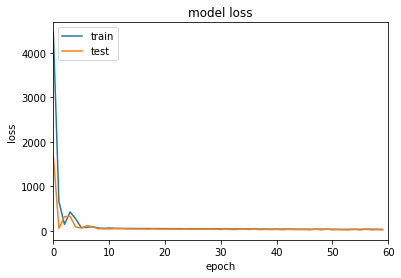

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 827.9897 - root_mean_squared_error: 28.7673 - val_loss: 42.3456 - val_root_mean_squared_error: 6.4748
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 164.7748 - root_mean_squared_error: 12.8202 - val_loss: 364.2055 - val_root_mean_squared_error: 19.0734
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 230.4033 - root_mean_squared_error: 15.1657 - val_loss: 86.3039 - val_root_mean_squared_error: 9.2686
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 66.5810 - root_mean_squared_error: 8.1356 - val_loss: 72.9248 - val_root_mean_squared_error: 8.5169
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 99.4151 - root_mean_squared_error: 9.9515 - val_loss: 58.0786 - val_root_mean_squared_error: 7.5962
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 61.0486 - root_mean_squared_error: 7.7895 - val_loss: 49.8379 - val_r

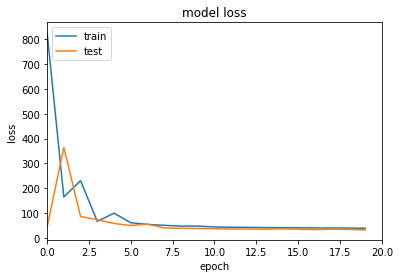

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 38.0113 - root_mean_squared_error: 6.1416 - val_loss: 33.7297 - val_root_mean_squared_error: 5.7826
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 37.8743 - root_mean_squared_error: 6.1306 - val_loss: 30.9046 - val_root_mean_squared_error: 5.5332
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 36.7152 - root_mean_squared_error: 6.0355 - val_loss: 30.7471 - val_root_mean_squared_error: 5.5191
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 36.4253 - root_mean_squared_error: 6.0116 - val_loss: 32.3039 - val_root_mean_squared_error: 5.6585
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 35.9131 - root_mean_squared_error: 5.9690 - val_loss: 30.0232 - val_root_mean_squared_error: 5.4534
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 35.6380 - root_mean_squared_error: 5.9460 - val_loss: 29.8537 - val_roo

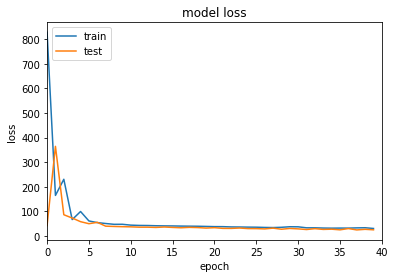

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 30.5955 - root_mean_squared_error: 5.5065 - val_loss: 27.3040 - val_root_mean_squared_error: 5.1990
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 30.9657 - root_mean_squared_error: 5.5400 - val_loss: 24.1789 - val_root_mean_squared_error: 4.8892
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 30.2420 - root_mean_squared_error: 5.4743 - val_loss: 24.8585 - val_root_mean_squared_error: 4.9582
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 29.2308 - root_mean_squared_error: 5.3811 - val_loss: 27.9656 - val_root_mean_squared_error: 5.2622
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 29.2203 - root_mean_squared_error: 5.3800 - val_loss: 24.6154 - val_root_mean_squared_error: 4.9335
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 30.1955 - root_mean_squared_error: 5.4699 - val_loss: 24.4657 - val_ro

In [ ]:
epochs = [20,40,60]
alphas = [1,1e-1,1e-2,1e-3,1e-4]
activations = ['relu','sigmoid']
L1_params = [1e-2,1e-3,1e-4,1e-5]
L2_params = [1e-2,1e-3,1e-4,1e-5]
model_name = "model_128"


for alpha in alphas:
    for activation in activations:
        for l1 in L1_params:
            for l2 in L2_params:

                model_metrics = pd.DataFrame(columns=['loss','root_mean_squared_error','val_loss','val_root_mean_squared_error'])
                model_128 = model_architecture_128(X_train.shape[1],L1 = l1, L2 = l2, alpha = alpha, activation=activation)
                last_epoch = 0
                            
                for epoch in epochs:

                    temp_model_history = model_128.fit(X_train_tensor,
                                y_train_tensor,
                                validation_split=0.15, 
                                epochs = epoch, 
                                initial_epoch = last_epoch
                                )

                    temp_metrics = pd.DataFrame(temp_model_history.history)
                    model_metrics = pd.concat([model_metrics,temp_metrics])
                    model_metrics = model_metrics.reset_index(drop=True)

                    plt.plot(model_metrics['loss'])
                    plt.plot(model_metrics['val_loss'])
                    plt.title('model loss')
                    plt.xlim(0,epoch)
                    plt.ylabel('loss')
                    plt.xlabel('epoch')
                    plt.legend(['train', 'test'], loc='upper left')
                    plt.show()

                    temp_metrics = temp_metrics[temp_metrics['val_root_mean_squared_error'] == temp_metrics['val_root_mean_squared_error'].min()]

                    new_row = [model_name,
                        epoch,
                        activation,
                        alpha,
                        l1,
                        l2,
                        temp_metrics['loss'].values[0],
                        temp_metrics['root_mean_squared_error'].values[0],
                        temp_metrics['val_loss'].values[0],
                        temp_metrics['val_root_mean_squared_error'].values[0]
                    ]

                    last_epoch = epoch

                    model_summaries.loc[model_summaries.shape[0]] = new_row

In [ ]:
model_128_summaries = model_summaries

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 76366520320.0000 - root_mean_squared_error: 276344.9375 - val_loss: 873665.5625 - val_root_mean_squared_error: 934.3693
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 1063517.0000 - root_mean_squared_error: 1030.8431 - val_loss: 1738.3907 - val_root_mean_squared_error: 22.2031
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 1968.9104 - root_mean_squared_error: 23.3646 - val_loss: 2225.2708 - val_root_mean_squared_error: 23.8777
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 2622.6270 - root_mean_squared_error: 29.3151 - val_loss: 2476.5884 - val_root_mean_squared_error: 23.9953
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 2556.3086 - root_mean_squared_error: 24.4867 - val_loss: 2603.5315 - val_root_mean_squared_error: 24.0631
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 2655.8630 - root_mean_squared_

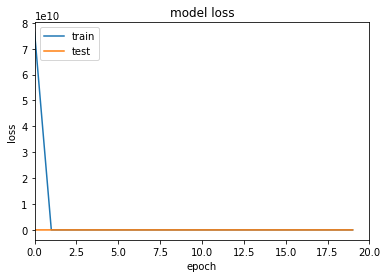

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 1958.7070 - root_mean_squared_error: 9.1709 - val_loss: 1937.0511 - val_root_mean_squared_error: 8.6316
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 1942.8621 - root_mean_squared_error: 9.1453 - val_loss: 1926.0997 - val_root_mean_squared_error: 8.5208
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 1928.3491 - root_mean_squared_error: 9.0394 - val_loss: 1905.5784 - val_root_mean_squared_error: 8.3746
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 1911.9841 - root_mean_squared_error: 8.9080 - val_loss: 1895.9247 - val_root_mean_squared_error: 8.2537
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 1899.2358 - root_mean_squared_error: 8.8200 - val_loss: 1877.7906 - val_root_mean_squared_error: 8.1699
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 1885.7991 - root_mean_squared_error: 8.7776 - val_los

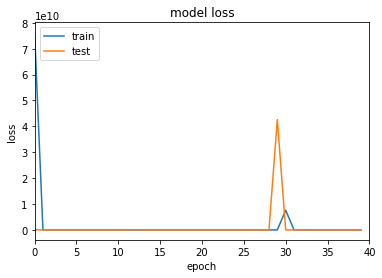

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 202798.7188 - root_mean_squared_error: 448.3193 - val_loss: 186261.5781 - val_root_mean_squared_error: 429.4874
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 175980.2812 - root_mean_squared_error: 417.3463 - val_loss: 161090.6094 - val_root_mean_squared_error: 399.1098
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 151924.8594 - root_mean_squared_error: 387.4616 - val_loss: 138710.8750 - val_root_mean_squared_error: 370.0254
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 130630.5859 - root_mean_squared_error: 358.9405 - val_loss: 119044.0000 - val_root_mean_squared_error: 342.4206
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 111982.0547 - root_mean_squared_error: 331.9540 - val_loss: 101867.4141 - val_root_mean_squared_error: 316.3619
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 95723.5938 - 

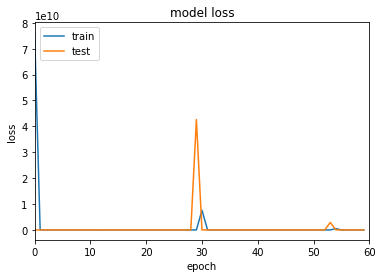

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 55744229376.0000 - root_mean_squared_error: 236102.1562 - val_loss: 2011350272.0000 - val_root_mean_squared_error: 44848.0781
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 338424160.0000 - root_mean_squared_error: 18396.2988 - val_loss: 866.0574 - val_root_mean_squared_error: 22.0899
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 929.9415 - root_mean_squared_error: 22.6307 - val_loss: 963.6189 - val_root_mean_squared_error: 22.2335
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 1009.0739 - root_mean_squared_error: 22.7447 - val_loss: 1019.7423 - val_root_mean_squared_error: 22.3136
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 1055.9144 - root_mean_squared_error: 22.8093 - val_loss: 1052.5690 - val_root_mean_squared_error: 22.3588
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 1081.5448 - root_mean_sq

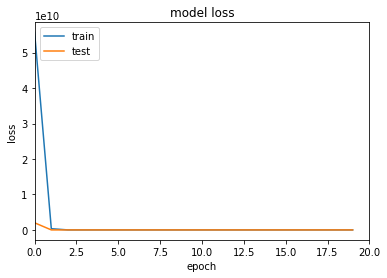

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 1087.5820 - root_mean_squared_error: 22.8673 - val_loss: 1065.9945 - val_root_mean_squared_error: 22.3903
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 1085.9055 - root_mean_squared_error: 22.8649 - val_loss: 1062.9496 - val_root_mean_squared_error: 22.3878
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 1084.4994 - root_mean_squared_error: 22.8624 - val_loss: 1062.9290 - val_root_mean_squared_error: 22.3853
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 1082.8605 - root_mean_squared_error: 22.8599 - val_loss: 1059.8992 - val_root_mean_squared_error: 22.3828
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 1081.5005 - root_mean_squared_error: 22.8574 - val_loss: 1059.9917 - val_root_mean_squared_error: 22.3801
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 1079.9447 - root_mean_squared_error: 22.854

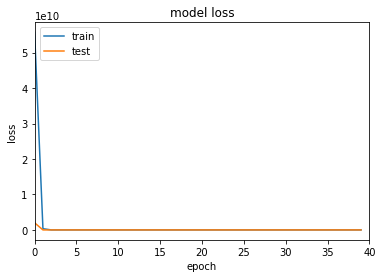

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 1061.2324 - root_mean_squared_error: 22.8093 - val_loss: 1039.9656 - val_root_mean_squared_error: 22.3311
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 1059.9928 - root_mean_squared_error: 22.8059 - val_loss: 1037.3247 - val_root_mean_squared_error: 22.3276
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 1059.0090 - root_mean_squared_error: 22.8024 - val_loss: 1037.7386 - val_root_mean_squared_error: 22.3241
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 1057.7914 - root_mean_squared_error: 22.7989 - val_loss: 1035.0980 - val_root_mean_squared_error: 22.3206
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 1056.8180 - root_mean_squared_error: 22.7953 - val_loss: 1035.5601 - val_root_mean_squared_error: 22.3169
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 1055.6102 - root_mean_squared_error: 22.791

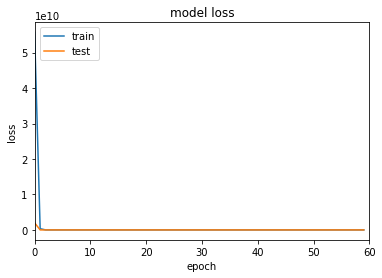

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 66909392896.0000 - root_mean_squared_error: 258668.5000 - val_loss: 1516755968.0000 - val_root_mean_squared_error: 38945.5469
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 374488672.0000 - root_mean_squared_error: 19351.7051 - val_loss: 8007839.0000 - val_root_mean_squared_error: 2829.7632
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 9085199.0000 - root_mean_squared_error: 3014.1160 - val_loss: 596875.5625 - val_root_mean_squared_error: 772.3624
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 1297628.8750 - root_mean_squared_error: 1138.9833 - val_loss: 696.7253 - val_root_mean_squared_error: 18.3008
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 720.5710 - root_mean_squared_error: 18.7481 - val_loss: 705.7289 - val_root_mean_squared_error: 18.1263
Epoch 6/20
6/6 [==============================] - 0s 7ms/step - loss: 727.42

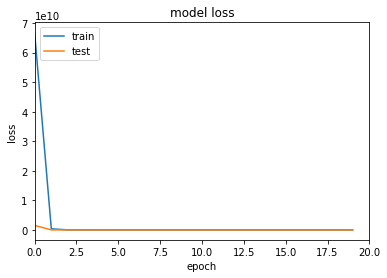

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 719.8620 - root_mean_squared_error: 18.4044 - val_loss: 700.3025 - val_root_mean_squared_error: 17.8778
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 719.1425 - root_mean_squared_error: 18.4028 - val_loss: 699.5876 - val_root_mean_squared_error: 17.8761
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 718.2937 - root_mean_squared_error: 18.4011 - val_loss: 699.2635 - val_root_mean_squared_error: 17.8744
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 717.2631 - root_mean_squared_error: 18.3995 - val_loss: 697.1196 - val_root_mean_squared_error: 17.8727
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 715.9641 - root_mean_squared_error: 18.3977 - val_loss: 696.6152 - val_root_mean_squared_error: 17.8709
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 715.4352 - root_mean_squared_error: 18.3959 - val_lo

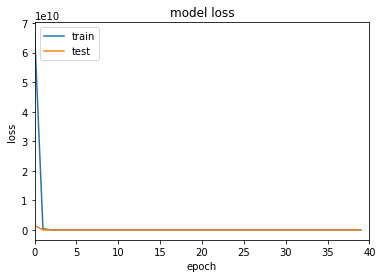

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 703.4184 - root_mean_squared_error: 18.3653 - val_loss: 684.0428 - val_root_mean_squared_error: 17.8376
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 702.5709 - root_mean_squared_error: 18.3629 - val_loss: 682.8441 - val_root_mean_squared_error: 17.8353
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 701.6036 - root_mean_squared_error: 18.3606 - val_loss: 682.2084 - val_root_mean_squared_error: 17.8329
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 700.9626 - root_mean_squared_error: 18.3582 - val_loss: 681.6798 - val_root_mean_squared_error: 17.8305
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 700.3207 - root_mean_squared_error: 18.3558 - val_loss: 680.9176 - val_root_mean_squared_error: 17.8280
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 699.3190 - root_mean_squared_error: 18.3534 - val_los

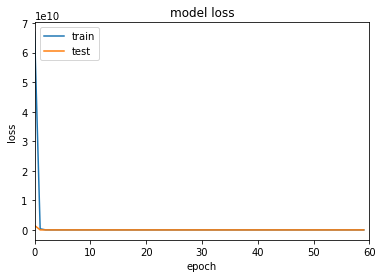

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 39913082880.0000 - root_mean_squared_error: 199782.5781 - val_loss: 160667184.0000 - val_root_mean_squared_error: 12675.4492
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 58765204.0000 - root_mean_squared_error: 7665.8320 - val_loss: 750.8350 - val_root_mean_squared_error: 22.0523
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 805.1848 - root_mean_squared_error: 22.7018 - val_loss: 819.1731 - val_root_mean_squared_error: 22.4451
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 860.3925 - root_mean_squared_error: 23.0162 - val_loss: 858.4008 - val_root_mean_squared_error: 22.6655
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 889.3157 - root_mean_squared_error: 23.1931 - val_loss: 877.8560 - val_root_mean_squared_error: 22.7906
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 905.0573 - root_mean_squared_er

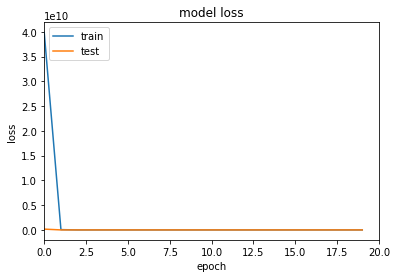

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 909.5366 - root_mean_squared_error: 23.3935 - val_loss: 887.6439 - val_root_mean_squared_error: 22.9210
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 908.9412 - root_mean_squared_error: 23.3906 - val_loss: 885.7667 - val_root_mean_squared_error: 22.9180
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 907.1640 - root_mean_squared_error: 23.3876 - val_loss: 884.9443 - val_root_mean_squared_error: 22.9149
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 906.6459 - root_mean_squared_error: 23.3845 - val_loss: 884.4296 - val_root_mean_squared_error: 22.9117
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 905.8312 - root_mean_squared_error: 23.3813 - val_loss: 882.7732 - val_root_mean_squared_error: 22.9085
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 904.2113 - root_mean_squared_error: 23.3781 - val_lo

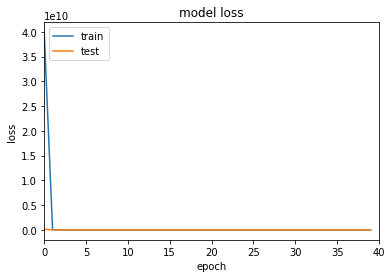

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 889.6896 - root_mean_squared_error: 23.3219 - val_loss: 867.5214 - val_root_mean_squared_error: 22.8478
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 889.3261 - root_mean_squared_error: 23.3176 - val_loss: 867.6157 - val_root_mean_squared_error: 22.8435
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 888.9827 - root_mean_squared_error: 23.3133 - val_loss: 866.2302 - val_root_mean_squared_error: 22.8392
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 887.2652 - root_mean_squared_error: 23.3090 - val_loss: 864.8175 - val_root_mean_squared_error: 22.8348
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 886.5946 - root_mean_squared_error: 23.3046 - val_loss: 864.4764 - val_root_mean_squared_error: 22.8303
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 886.0283 - root_mean_squared_error: 23.3001 - val_los

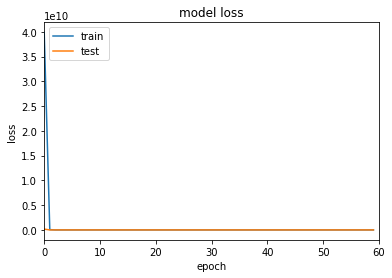

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 47789293568.0000 - root_mean_squared_error: 218607.6250 - val_loss: 15639978.0000 - val_root_mean_squared_error: 3954.6821
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 117974240.0000 - root_mean_squared_error: 10861.5625 - val_loss: 239492768.0000 - val_root_mean_squared_error: 15475.5215
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 107675328.0000 - root_mean_squared_error: 10376.6172 - val_loss: 5539960.0000 - val_root_mean_squared_error: 2353.4224
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 35143184.0000 - root_mean_squared_error: 5928.0454 - val_loss: 2401740.5000 - val_root_mean_squared_error: 1549.2410
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 16285559.0000 - root_mean_squared_error: 4035.3325 - val_loss: 2381482.7500 - val_root_mean_squared_error: 1542.6467
Epoch 6/20
6/6 [==============================] - 0

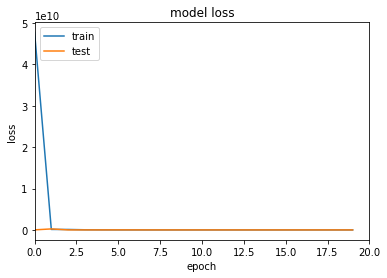

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 3558.3350 - root_mean_squared_error: 43.4813 - val_loss: 2544.3975 - val_root_mean_squared_error: 29.7485
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 3321.6323 - root_mean_squared_error: 40.8339 - val_loss: 2541.4968 - val_root_mean_squared_error: 29.9224
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 3461.8867 - root_mean_squared_error: 42.6710 - val_loss: 3017.7444 - val_root_mean_squared_error: 37.2095
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 3111.3240 - root_mean_squared_error: 38.5107 - val_loss: 2497.5449 - val_root_mean_squared_error: 29.6139
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 3176.2278 - root_mean_squared_error: 39.5030 - val_loss: 2751.5012 - val_root_mean_squared_error: 33.8121
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 3135.8977 - root_mean_squared_error: 39.145

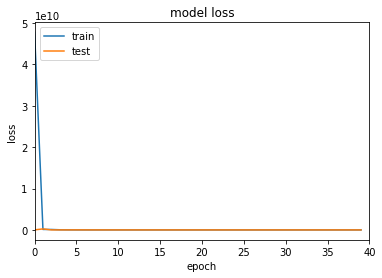

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 2826.9731 - root_mean_squared_error: 37.0776 - val_loss: 2353.2195 - val_root_mean_squared_error: 30.1015
Epoch 42/60
6/6 [==============================] - 0s 7ms/step - loss: 2775.9507 - root_mean_squared_error: 36.4967 - val_loss: 2366.9663 - val_root_mean_squared_error: 30.4633
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 2765.3694 - root_mean_squared_error: 36.4625 - val_loss: 2324.4658 - val_root_mean_squared_error: 29.8912
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 2747.4197 - root_mean_squared_error: 36.3244 - val_loss: 2189.7527 - val_root_mean_squared_error: 27.6867
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 2740.3718 - root_mean_squared_error: 36.3336 - val_loss: 2318.7029 - val_root_mean_squared_error: 30.0518
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 2708.5764 - root_mean_squared_error: 35.998

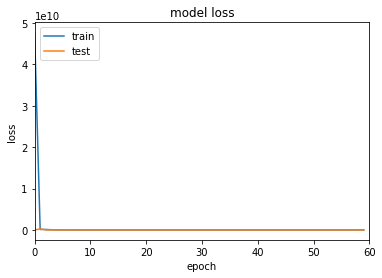

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 41063604224.0000 - root_mean_squared_error: 202641.5625 - val_loss: 1235630.0000 - val_root_mean_squared_error: 1111.5612
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 2705765.0000 - root_mean_squared_error: 1644.8940 - val_loss: 4375023.5000 - val_root_mean_squared_error: 2091.6255
Epoch 3/20
6/6 [==============================] - 0s 7ms/step - loss: 3251576.5000 - root_mean_squared_error: 1803.1725 - val_loss: 3243478.2500 - val_root_mean_squared_error: 1800.9187
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 1350574.0000 - root_mean_squared_error: 1162.0636 - val_loss: 1002410.5000 - val_root_mean_squared_error: 1001.1056
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 512395.8438 - root_mean_squared_error: 715.6750 - val_loss: 532753.5625 - val_root_mean_squared_error: 729.7534
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - los

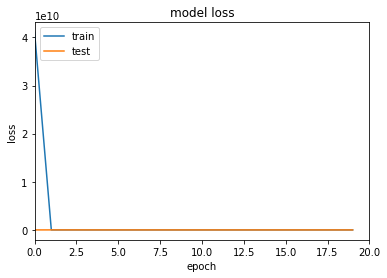

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 562.4305 - root_mean_squared_error: 18.4454 - val_loss: 511.1261 - val_root_mean_squared_error: 17.0221
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 535.9616 - root_mean_squared_error: 17.7381 - val_loss: 454.4673 - val_root_mean_squared_error: 15.2740
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 515.4739 - root_mean_squared_error: 17.1690 - val_loss: 482.9349 - val_root_mean_squared_error: 16.2187
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 508.1247 - root_mean_squared_error: 16.9786 - val_loss: 446.8879 - val_root_mean_squared_error: 15.0721
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 495.3211 - root_mean_squared_error: 16.6152 - val_loss: 441.2098 - val_root_mean_squared_error: 14.9247
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 486.0485 - root_mean_squared_error: 16.3589 - val_los

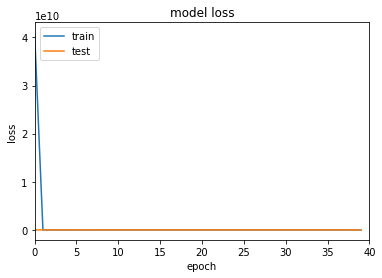

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 378.0106 - root_mean_squared_error: 12.9910 - val_loss: 351.7268 - val_root_mean_squared_error: 11.9662
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 372.0109 - root_mean_squared_error: 12.7845 - val_loss: 328.6021 - val_root_mean_squared_error: 10.9571
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 377.8962 - root_mean_squared_error: 13.0290 - val_loss: 385.3737 - val_root_mean_squared_error: 13.3391
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 386.1058 - root_mean_squared_error: 13.3652 - val_loss: 333.5749 - val_root_mean_squared_error: 11.2300
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 367.1895 - root_mean_squared_error: 12.6540 - val_loss: 408.9098 - val_root_mean_squared_error: 14.2315
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 396.2950 - root_mean_squared_error: 13.7797 - val_los

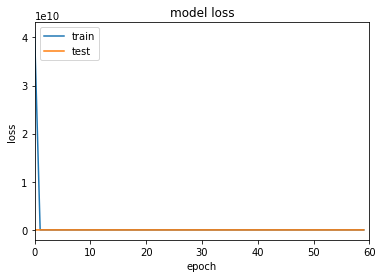

Epoch 1/20
6/6 [==============================] - 1s 33ms/step - loss: 90412474368.0000 - root_mean_squared_error: 300686.6562 - val_loss: 1882119680.0000 - val_root_mean_squared_error: 43383.4023
Epoch 2/20
6/6 [==============================] - 0s 7ms/step - loss: 692662656.0000 - root_mean_squared_error: 26318.4844 - val_loss: 65293288.0000 - val_root_mean_squared_error: 8080.4238
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 100148288.0000 - root_mean_squared_error: 10007.4092 - val_loss: 70767480.0000 - val_root_mean_squared_error: 8412.3379
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 52569076.0000 - root_mean_squared_error: 7250.4497 - val_loss: 25556758.0000 - val_root_mean_squared_error: 5055.3643
Epoch 5/20
6/6 [==============================] - 0s 7ms/step - loss: 9919702.0000 - root_mean_squared_error: 3149.5474 - val_loss: 535853.8750 - val_root_mean_squared_error: 731.9827
Epoch 6/20
6/6 [==============================] - 0

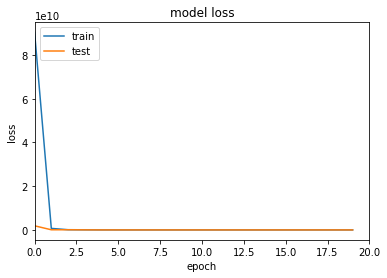

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 566.3659 - root_mean_squared_error: 22.5469 - val_loss: 545.0379 - val_root_mean_squared_error: 22.0672
Epoch 22/40
6/6 [==============================] - 0s 7ms/step - loss: 566.2394 - root_mean_squared_error: 22.5451 - val_loss: 544.7574 - val_root_mean_squared_error: 22.0653
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 566.1105 - root_mean_squared_error: 22.5431 - val_loss: 544.7602 - val_root_mean_squared_error: 22.0634
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 565.9453 - root_mean_squared_error: 22.5412 - val_loss: 544.4476 - val_root_mean_squared_error: 22.0614
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 565.7925 - root_mean_squared_error: 22.5393 - val_loss: 544.4305 - val_root_mean_squared_error: 22.0594
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 565.6077 - root_mean_squared_error: 22.5372 - val_lo

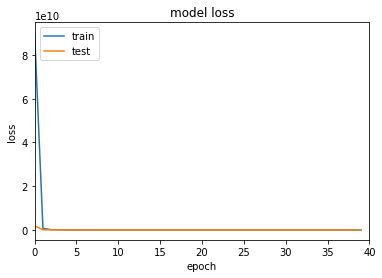

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 562.8774 - root_mean_squared_error: 22.5018 - val_loss: 541.5257 - val_root_mean_squared_error: 22.0212
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 562.6749 - root_mean_squared_error: 22.4991 - val_loss: 541.1858 - val_root_mean_squared_error: 22.0185
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 562.4965 - root_mean_squared_error: 22.4964 - val_loss: 541.1468 - val_root_mean_squared_error: 22.0157
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 562.2944 - root_mean_squared_error: 22.4937 - val_loss: 540.8052 - val_root_mean_squared_error: 22.0129
Epoch 45/60
6/6 [==============================] - 0s 7ms/step - loss: 562.1125 - root_mean_squared_error: 22.4908 - val_loss: 540.7664 - val_root_mean_squared_error: 22.0101
Epoch 46/60
6/6 [==============================] - 0s 7ms/step - loss: 561.9091 - root_mean_squared_error: 22.4880 - val_los

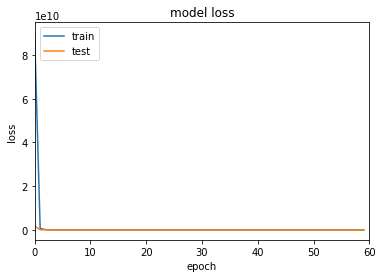

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 39046221824.0000 - root_mean_squared_error: 197601.1719 - val_loss: 2026552.3750 - val_root_mean_squared_error: 1423.5641
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 577876.6250 - root_mean_squared_error: 760.1674 - val_loss: 18141.1484 - val_root_mean_squared_error: 134.5872
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 5387.7944 - root_mean_squared_error: 73.1960 - val_loss: 493.5277 - val_root_mean_squared_error: 21.4566
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 527.2110 - root_mean_squared_error: 22.1930 - val_loss: 523.3801 - val_root_mean_squared_error: 22.0670
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 552.9595 - root_mean_squared_error: 22.7095 - val_loss: 542.5779 - val_root_mean_squared_error: 22.4595
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 569.2538 - root_mean_squared_erro

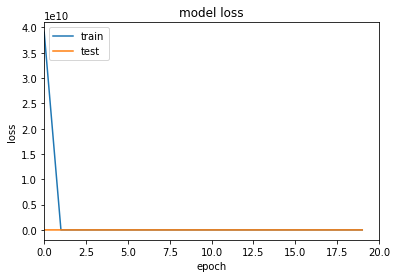

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 588.4603 - root_mean_squared_error: 23.4175 - val_loss: 566.4397 - val_root_mean_squared_error: 22.9424
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 588.1218 - root_mean_squared_error: 23.4101 - val_loss: 566.0967 - val_root_mean_squared_error: 22.9350
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 587.7493 - root_mean_squared_error: 23.4026 - val_loss: 565.7739 - val_root_mean_squared_error: 22.9273
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 587.3558 - root_mean_squared_error: 23.3951 - val_loss: 565.2582 - val_root_mean_squared_error: 22.9194
Epoch 25/40
6/6 [==============================] - 0s 7ms/step - loss: 586.9172 - root_mean_squared_error: 23.3871 - val_loss: 564.9027 - val_root_mean_squared_error: 22.9114
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 586.5534 - root_mean_squared_error: 23.3791 - val_los

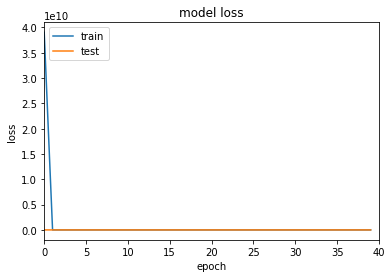

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 579.7303 - root_mean_squared_error: 23.2397 - val_loss: 557.7161 - val_root_mean_squared_error: 22.7612
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 579.2074 - root_mean_squared_error: 23.2292 - val_loss: 557.1652 - val_root_mean_squared_error: 22.7507
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 578.6818 - root_mean_squared_error: 23.2188 - val_loss: 556.6830 - val_root_mean_squared_error: 22.7399
Epoch 44/60
6/6 [==============================] - 0s 7ms/step - loss: 578.1842 - root_mean_squared_error: 23.2081 - val_loss: 556.1859 - val_root_mean_squared_error: 22.7290
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 577.6771 - root_mean_squared_error: 23.1973 - val_loss: 555.6578 - val_root_mean_squared_error: 22.7178
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 577.1061 - root_mean_squared_error: 23.1861 - val_los

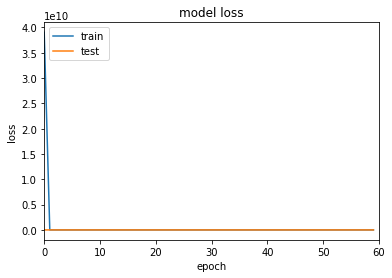

Epoch 1/20
6/6 [==============================] - 1s 35ms/step - loss: 52769046528.0000 - root_mean_squared_error: 229715.1406 - val_loss: 1432712064.0000 - val_root_mean_squared_error: 37851.1758
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 307126400.0000 - root_mean_squared_error: 17525.0039 - val_loss: 1834.9583 - val_root_mean_squared_error: 28.8856
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 2033.9729 - root_mean_squared_error: 29.3767 - val_loss: 2230.7954 - val_root_mean_squared_error: 28.8762
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 2353.4321 - root_mean_squared_error: 29.1315 - val_loss: 2450.2529 - val_root_mean_squared_error: 28.3805
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 2525.1724 - root_mean_squared_error: 28.5798 - val_loss: 2559.1121 - val_root_mean_squared_error: 27.7365
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 2603.8174 - root_mean

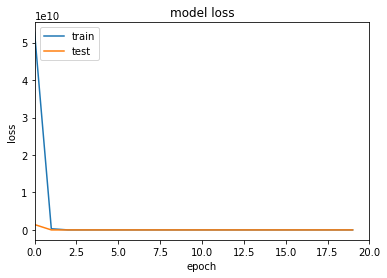

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 2140.7583 - root_mean_squared_error: 16.7258 - val_loss: 2105.3528 - val_root_mean_squared_error: 15.7731
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 2112.5264 - root_mean_squared_error: 16.0895 - val_loss: 2079.3052 - val_root_mean_squared_error: 15.1722
Epoch 23/40
6/6 [==============================] - 0s 7ms/step - loss: 2090.0381 - root_mean_squared_error: 15.6160 - val_loss: 2062.7573 - val_root_mean_squared_error: 14.8706
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 2073.6990 - root_mean_squared_error: 15.3295 - val_loss: 2046.4716 - val_root_mean_squared_error: 14.5701
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 2057.3770 - root_mean_squared_error: 15.0358 - val_loss: 2030.7299 - val_root_mean_squared_error: 14.2790
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 2041.7704 - root_mean_squared_error: 14.75

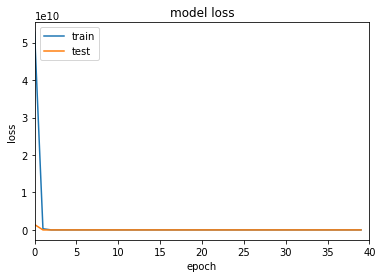

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 1914.4672 - root_mean_squared_error: 13.5980 - val_loss: 1894.6859 - val_root_mean_squared_error: 12.9774
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 1908.6013 - root_mean_squared_error: 13.5800 - val_loss: 1888.8977 - val_root_mean_squared_error: 12.9591
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 1902.8339 - root_mean_squared_error: 13.5618 - val_loss: 1883.2073 - val_root_mean_squared_error: 12.9406
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 1897.1682 - root_mean_squared_error: 13.5436 - val_loss: 1877.6078 - val_root_mean_squared_error: 12.9218
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 1891.6089 - root_mean_squared_error: 13.5257 - val_loss: 1872.0938 - val_root_mean_squared_error: 12.9025
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 1886.1183 - root_mean_squared_error: 13.50

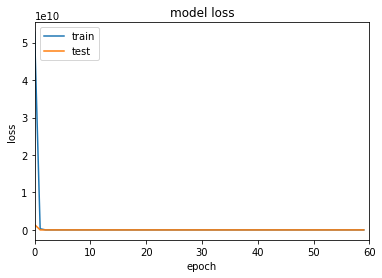

Epoch 1/20
6/6 [==============================] - 1s 38ms/step - loss: 28836341760.0000 - root_mean_squared_error: 169812.6719 - val_loss: 204182816.0000 - val_root_mean_squared_error: 14289.2539
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 9119702016.0000 - root_mean_squared_error: 95497.1328 - val_loss: 1229677056.0000 - val_root_mean_squared_error: 35066.7461
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 323509696.0000 - root_mean_squared_error: 17986.3711 - val_loss: 307927.1562 - val_root_mean_squared_error: 554.7800
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 44607.3945 - root_mean_squared_error: 210.8318 - val_loss: 545.8279 - val_root_mean_squared_error: 19.3377
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 573.0273 - root_mean_squared_error: 19.8627 - val_loss: 562.6865 - val_root_mean_squared_error: 19.3796
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 58

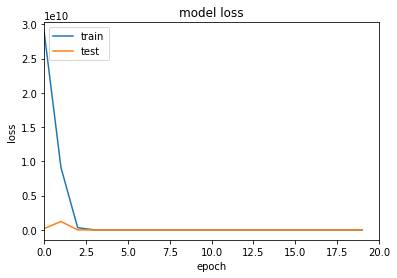

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 593.4440 - root_mean_squared_error: 19.9143 - val_loss: 573.0803 - val_root_mean_squared_error: 19.4064
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 592.7119 - root_mean_squared_error: 19.9119 - val_loss: 572.3594 - val_root_mean_squared_error: 19.4039
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 591.9947 - root_mean_squared_error: 19.9095 - val_loss: 571.6517 - val_root_mean_squared_error: 19.4014
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 591.2893 - root_mean_squared_error: 19.9069 - val_loss: 570.9564 - val_root_mean_squared_error: 19.3989
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 590.5970 - root_mean_squared_error: 19.9044 - val_loss: 570.2723 - val_root_mean_squared_error: 19.3962
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 589.9156 - root_mean_squared_error: 19.9017 - val_los

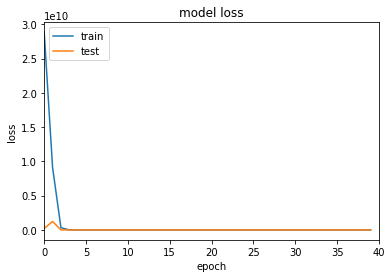

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 580.6666 - root_mean_squared_error: 19.8560 - val_loss: 560.4357 - val_root_mean_squared_error: 19.3468
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 580.0952 - root_mean_squared_error: 19.8526 - val_loss: 559.8681 - val_root_mean_squared_error: 19.3432
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 579.5265 - root_mean_squared_error: 19.8490 - val_loss: 559.3050 - val_root_mean_squared_error: 19.3397
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 578.9640 - root_mean_squared_error: 19.8455 - val_loss: 558.7443 - val_root_mean_squared_error: 19.3360
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 578.4023 - root_mean_squared_error: 19.8419 - val_loss: 558.1873 - val_root_mean_squared_error: 19.3323
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 577.8458 - root_mean_squared_error: 19.8383 - val_los

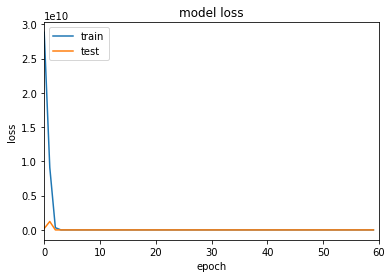

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 82860367872.0000 - root_mean_squared_error: 287854.7500 - val_loss: 115328432.0000 - val_root_mean_squared_error: 10739.1074
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 939768704.0000 - root_mean_squared_error: 30655.6465 - val_loss: 132765232.0000 - val_root_mean_squared_error: 11522.3789
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 362282784.0000 - root_mean_squared_error: 19033.7266 - val_loss: 18382426.0000 - val_root_mean_squared_error: 4287.4707
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 7816098.5000 - root_mean_squared_error: 2795.7251 - val_loss: 11275101.0000 - val_root_mean_squared_error: 3357.8386
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 19852536.0000 - root_mean_squared_error: 4455.6157 - val_loss: 4299043.0000 - val_root_mean_squared_error: 2073.4077
Epoch 6/20
6/6 [==============================] 

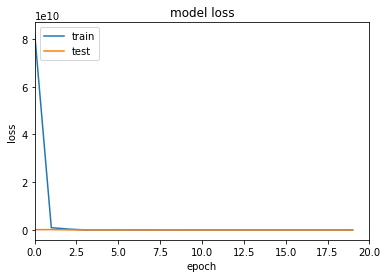

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 643.6785 - root_mean_squared_error: 24.8637 - val_loss: 620.9766 - val_root_mean_squared_error: 24.4039
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 643.5261 - root_mean_squared_error: 24.8615 - val_loss: 620.8761 - val_root_mean_squared_error: 24.4017
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 643.3886 - root_mean_squared_error: 24.8593 - val_loss: 620.6857 - val_root_mean_squared_error: 24.3994
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 643.2311 - root_mean_squared_error: 24.8570 - val_loss: 620.5804 - val_root_mean_squared_error: 24.3971
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 643.0894 - root_mean_squared_error: 24.8547 - val_loss: 620.3853 - val_root_mean_squared_error: 24.3947
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 642.9273 - root_mean_squared_error: 24.8523 - val_lo

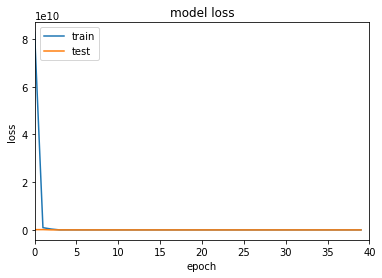

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 640.4096 - root_mean_squared_error: 24.8103 - val_loss: 617.7134 - val_root_mean_squared_error: 24.3496
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 640.2205 - root_mean_squared_error: 24.8072 - val_loss: 617.5730 - val_root_mean_squared_error: 24.3463
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 640.0402 - root_mean_squared_error: 24.8039 - val_loss: 617.3444 - val_root_mean_squared_error: 24.3431
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 639.8458 - root_mean_squared_error: 24.8007 - val_loss: 617.2017 - val_root_mean_squared_error: 24.3397
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 639.6654 - root_mean_squared_error: 24.7974 - val_loss: 616.9688 - val_root_mean_squared_error: 24.3364
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 639.4642 - root_mean_squared_error: 24.7941 - val_l

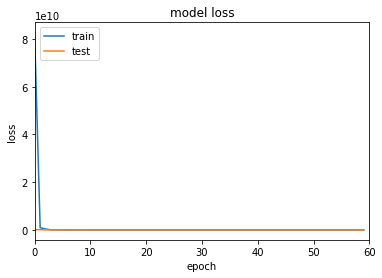

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 63478865920.0000 - root_mean_squared_error: 251950.1250 - val_loss: 588613184.0000 - val_root_mean_squared_error: 24261.3516
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 98256248.0000 - root_mean_squared_error: 9912.4287 - val_loss: 517.7505 - val_root_mean_squared_error: 22.6644
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 547.7053 - root_mean_squared_error: 23.3068 - val_loss: 536.6640 - val_root_mean_squared_error: 23.0568
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 563.3776 - root_mean_squared_error: 23.6238 - val_loss: 547.4374 - val_root_mean_squared_error: 23.2769
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 572.1652 - root_mean_squared_error: 23.7989 - val_loss: 553.6300 - val_root_mean_squared_error: 23.4021
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 577.2441 - root_mean_squared_e

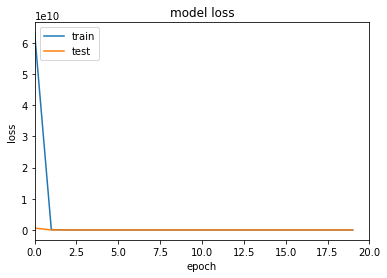

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 582.6810 - root_mean_squared_error: 24.0057 - val_loss: 560.4877 - val_root_mean_squared_error: 23.5388
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 582.5632 - root_mean_squared_error: 24.0033 - val_loss: 560.3546 - val_root_mean_squared_error: 23.5363
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 582.4413 - root_mean_squared_error: 24.0008 - val_loss: 560.2481 - val_root_mean_squared_error: 23.5338
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 582.3178 - root_mean_squared_error: 23.9983 - val_loss: 560.1099 - val_root_mean_squared_error: 23.5312
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 582.1925 - root_mean_squared_error: 23.9957 - val_loss: 559.9969 - val_root_mean_squared_error: 23.5285
Epoch 26/40
6/6 [==============================] - 0s 7ms/step - loss: 582.0626 - root_mean_squared_error: 23.9931 - val_lo

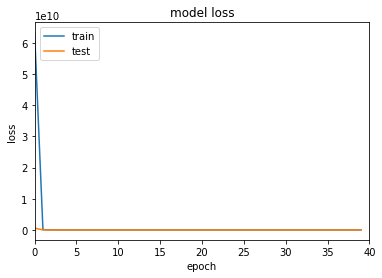

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 579.8260 - root_mean_squared_error: 23.9470 - val_loss: 557.6331 - val_root_mean_squared_error: 23.4789
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 579.6553 - root_mean_squared_error: 23.9435 - val_loss: 557.4507 - val_root_mean_squared_error: 23.4753
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 579.4847 - root_mean_squared_error: 23.9399 - val_loss: 557.2945 - val_root_mean_squared_error: 23.4717
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 579.3121 - root_mean_squared_error: 23.9364 - val_loss: 557.1070 - val_root_mean_squared_error: 23.4681
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 579.1366 - root_mean_squared_error: 23.9327 - val_loss: 556.9466 - val_root_mean_squared_error: 23.4644
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 578.9573 - root_mean_squared_error: 23.9290 - val_los

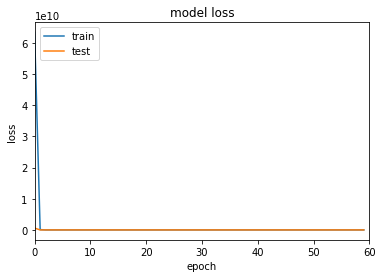

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 69510807552.0000 - root_mean_squared_error: 263649.0312 - val_loss: 983.2378 - val_root_mean_squared_error: 21.7343
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 35111556.0000 - root_mean_squared_error: 5925.4365 - val_loss: 1612.9636 - val_root_mean_squared_error: 22.6314
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1818.3871 - root_mean_squared_error: 23.3101 - val_loss: 2037.5214 - val_root_mean_squared_error: 23.0953
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 2170.8477 - root_mean_squared_error: 23.6814 - val_loss: 2290.8872 - val_root_mean_squared_error: 23.3558
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 2374.7356 - root_mean_squared_error: 23.8880 - val_loss: 2429.5540 - val_root_mean_squared_error: 23.5041
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 2482.7087 - root_mean_squared_er

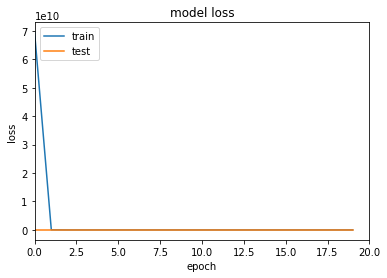

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 2344.6077 - root_mean_squared_error: 24.1381 - val_loss: 2314.1357 - val_root_mean_squared_error: 23.6724
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 2331.1729 - root_mean_squared_error: 24.1358 - val_loss: 2301.0603 - val_root_mean_squared_error: 23.6700
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 2318.3167 - root_mean_squared_error: 24.1334 - val_loss: 2288.5447 - val_root_mean_squared_error: 23.6675
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 2306.0073 - root_mean_squared_error: 24.1310 - val_loss: 2276.5491 - val_root_mean_squared_error: 23.6650
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 2294.2031 - root_mean_squared_error: 24.1285 - val_loss: 2265.0393 - val_root_mean_squared_error: 23.6625
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 2282.8735 - root_mean_squared_error: 24.126

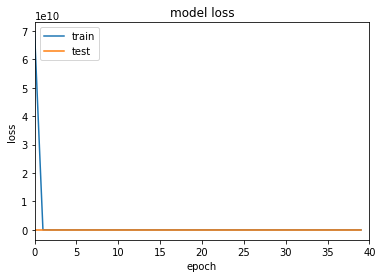

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 2154.6453 - root_mean_squared_error: 24.0815 - val_loss: 2128.5149 - val_root_mean_squared_error: 23.6146
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 2148.1919 - root_mean_squared_error: 24.0781 - val_loss: 2122.1912 - val_root_mean_squared_error: 23.6112
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 2141.9456 - root_mean_squared_error: 24.0747 - val_loss: 2116.0637 - val_root_mean_squared_error: 23.6077
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 2135.8911 - root_mean_squared_error: 24.0713 - val_loss: 2110.1267 - val_root_mean_squared_error: 23.6042
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 2130.0259 - root_mean_squared_error: 24.0678 - val_loss: 2104.3726 - val_root_mean_squared_error: 23.6007
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 2124.3386 - root_mean_squared_error: 24.06

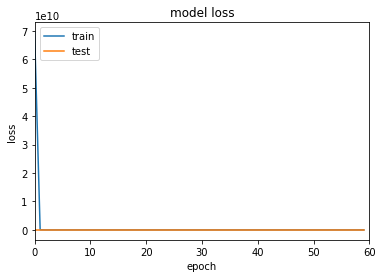

Epoch 1/20
6/6 [==============================] - 1s 38ms/step - loss: 47098003456.0000 - root_mean_squared_error: 217020.7500 - val_loss: 131913496.0000 - val_root_mean_squared_error: 11485.3574
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 303435392.0000 - root_mean_squared_error: 17419.3945 - val_loss: 1232994.3750 - val_root_mean_squared_error: 1110.3539
Epoch 3/20
6/6 [==============================] - 0s 14ms/step - loss: 198389.8594 - root_mean_squared_error: 445.2675 - val_loss: 505.2950 - val_root_mean_squared_error: 18.8274
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 532.6519 - root_mean_squared_error: 19.2406 - val_loss: 523.7864 - val_root_mean_squared_error: 18.6031
Epoch 5/20
6/6 [==============================] - 0s 16ms/step - loss: 548.1489 - root_mean_squared_error: 19.0632 - val_loss: 535.2006 - val_root_mean_squared_error: 18.4749
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 557.4718 - root

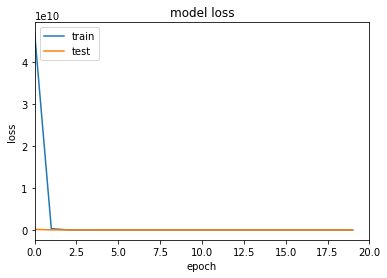

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 561.5073 - root_mean_squared_error: 18.8043 - val_loss: 541.8408 - val_root_mean_squared_error: 18.2828
Epoch 22/40
6/6 [==============================] - 0s 16ms/step - loss: 560.9022 - root_mean_squared_error: 18.8024 - val_loss: 541.2394 - val_root_mean_squared_error: 18.2807
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 560.3009 - root_mean_squared_error: 18.8003 - val_loss: 540.6453 - val_root_mean_squared_error: 18.2787
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 559.7083 - root_mean_squared_error: 18.7982 - val_loss: 540.0571 - val_root_mean_squared_error: 18.2765
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 559.1214 - root_mean_squared_error: 18.7961 - val_loss: 539.4753 - val_root_mean_squared_error: 18.2744
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 558.5408 - root_mean_squared_error: 18.7939 - val

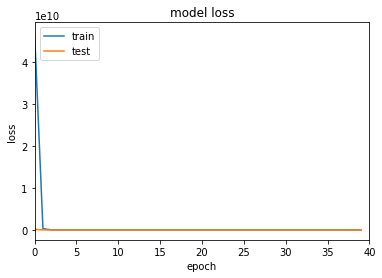

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 550.4582 - root_mean_squared_error: 18.7563 - val_loss: 530.8802 - val_root_mean_squared_error: 18.2336
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 549.9518 - root_mean_squared_error: 18.7535 - val_loss: 530.3792 - val_root_mean_squared_error: 18.2308
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 549.4495 - root_mean_squared_error: 18.7506 - val_loss: 529.8816 - val_root_mean_squared_error: 18.2278
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 548.9535 - root_mean_squared_error: 18.7478 - val_loss: 529.3854 - val_root_mean_squared_error: 18.2249
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 548.4559 - root_mean_squared_error: 18.7448 - val_loss: 528.8931 - val_root_mean_squared_error: 18.2218
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 547.9646 - root_mean_squared_error: 18.7418 - val_los

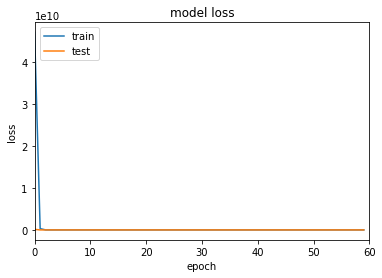

Epoch 1/20
6/6 [==============================] - 1s 38ms/step - loss: 48694992896.0000 - root_mean_squared_error: 220669.4219 - val_loss: 216133.0000 - val_root_mean_squared_error: 464.8959
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 25532538.0000 - root_mean_squared_error: 5052.9722 - val_loss: 14295.0781 - val_root_mean_squared_error: 119.5175
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 6690158.5000 - root_mean_squared_error: 2586.5317 - val_loss: 2015299.0000 - val_root_mean_squared_error: 1419.6071
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 3933061.7500 - root_mean_squared_error: 1983.1907 - val_loss: 1751085.8750 - val_root_mean_squared_error: 1323.2794
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 537722.3125 - root_mean_squared_error: 733.2831 - val_loss: 32219.0684 - val_root_mean_squared_error: 179.4433
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 10

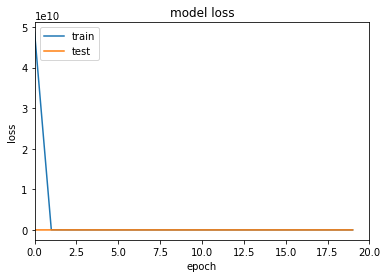

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 984.3525 - root_mean_squared_error: 31.0385 - val_loss: 486.0298 - val_root_mean_squared_error: 21.5657
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 937.4513 - root_mean_squared_error: 30.2740 - val_loss: 463.3194 - val_root_mean_squared_error: 21.0333
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 899.5173 - root_mean_squared_error: 29.6413 - val_loss: 444.2632 - val_root_mean_squared_error: 20.5759
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 862.8500 - root_mean_squared_error: 29.0166 - val_loss: 426.9804 - val_root_mean_squared_error: 20.1522
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 826.4454 - root_mean_squared_error: 28.3829 - val_loss: 410.6254 - val_root_mean_squared_error: 19.7429
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 794.0482 - root_mean_squared_error: 27.8067 - val_lo

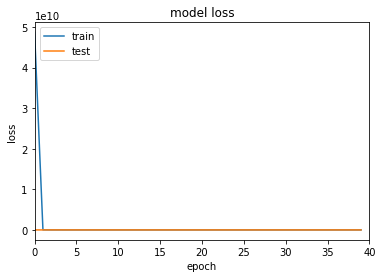

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 477.7018 - root_mean_squared_error: 21.3823 - val_loss: 215.0114 - val_root_mean_squared_error: 13.9473
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 466.3037 - root_mean_squared_error: 21.1146 - val_loss: 207.3217 - val_root_mean_squared_error: 13.6695
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 453.8143 - root_mean_squared_error: 20.8172 - val_loss: 199.9376 - val_root_mean_squared_error: 13.3975
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 441.2730 - root_mean_squared_error: 20.5142 - val_loss: 193.0244 - val_root_mean_squared_error: 13.1377
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 429.1999 - root_mean_squared_error: 20.2183 - val_loss: 186.4521 - val_root_mean_squared_error: 12.8859
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 415.8279 - root_mean_squared_error: 19.8854 - val_los

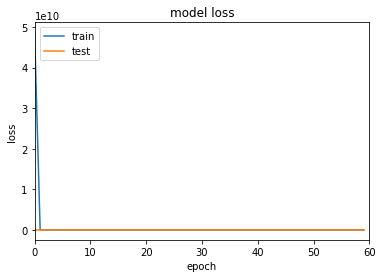

Epoch 1/20
6/6 [==============================] - 1s 99ms/step - loss: 67513548800.0000 - root_mean_squared_error: 259833.6875 - val_loss: 427141184.0000 - val_root_mean_squared_error: 20667.3945
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 254375904.0000 - root_mean_squared_error: 15949.1660 - val_loss: 31348.8926 - val_root_mean_squared_error: 177.0525
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 69226912.0000 - root_mean_squared_error: 8320.2705 - val_loss: 18399428.0000 - val_root_mean_squared_error: 4289.4551
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 16303211.0000 - root_mean_squared_error: 4037.7231 - val_loss: 351725.5938 - val_root_mean_squared_error: 593.0628
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 7868004.5000 - root_mean_squared_error: 2804.9961 - val_loss: 6181118.0000 - val_root_mean_squared_error: 2486.1848
Epoch 6/20
6/6 [==============================] - 0s 8ms/st

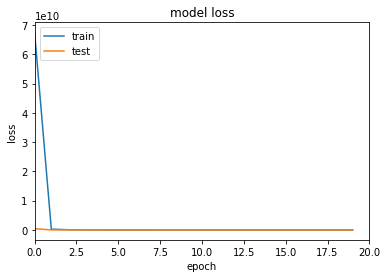

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 2092.4692 - root_mean_squared_error: 45.7166 - val_loss: 1392.8423 - val_root_mean_squared_error: 37.2879
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 1844.1797 - root_mean_squared_error: 42.9153 - val_loss: 1386.7781 - val_root_mean_squared_error: 37.2065
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 1650.0549 - root_mean_squared_error: 40.5906 - val_loss: 1809.0282 - val_root_mean_squared_error: 42.5038
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 1681.3766 - root_mean_squared_error: 40.9747 - val_loss: 1378.2950 - val_root_mean_squared_error: 37.0923
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 1625.6571 - root_mean_squared_error: 40.2890 - val_loss: 1556.1759 - val_root_mean_squared_error: 39.4174
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 1674.6143 - root_mean_squared_error: 40.8

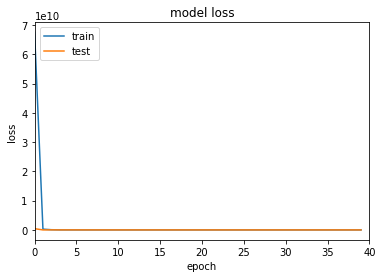

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 1523.0984 - root_mean_squared_error: 38.9959 - val_loss: 1451.4224 - val_root_mean_squared_error: 38.0659
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 1509.6804 - root_mean_squared_error: 38.8235 - val_loss: 1284.1898 - val_root_mean_squared_error: 35.8019
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 1501.6975 - root_mean_squared_error: 38.7206 - val_loss: 1399.5258 - val_root_mean_squared_error: 37.3780
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 1473.3232 - root_mean_squared_error: 38.3525 - val_loss: 1291.0265 - val_root_mean_squared_error: 35.8973
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 1510.3629 - root_mean_squared_error: 38.8324 - val_loss: 1343.3772 - val_root_mean_squared_error: 36.6193
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 1468.3933 - root_mean_squared_error: 38.288

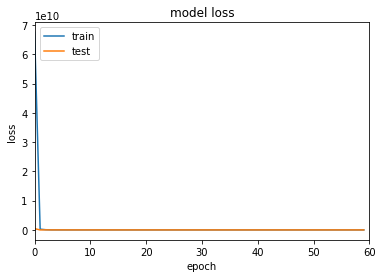

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 545.8823 - root_mean_squared_error: 17.0793 - val_loss: 556.7186 - val_root_mean_squared_error: 8.1878
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 646.2958 - root_mean_squared_error: 10.0175 - val_loss: 647.4003 - val_root_mean_squared_error: 8.6343
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 647.6605 - root_mean_squared_error: 10.3119 - val_loss: 550.9315 - val_root_mean_squared_error: 8.0784
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 546.4165 - root_mean_squared_error: 9.7775 - val_loss: 470.9764 - val_root_mean_squared_error: 8.8224
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 455.1772 - root_mean_squared_error: 9.6450 - val_loss: 404.1670 - val_root_mean_squared_error: 8.2758
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 423.4944 - root_mean_squared_error: 9.2166 - val_loss: 413.3458 

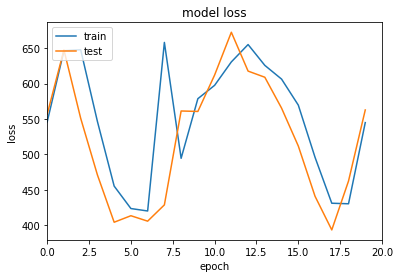

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 605.9021 - root_mean_squared_error: 9.4396 - val_loss: 621.8741 - val_root_mean_squared_error: 8.7852
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 626.5801 - root_mean_squared_error: 9.0220 - val_loss: 603.1592 - val_root_mean_squared_error: 8.6758
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 589.7114 - root_mean_squared_error: 9.1488 - val_loss: 540.6330 - val_root_mean_squared_error: 8.1909
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 542.8786 - root_mean_squared_error: 9.3029 - val_loss: 506.7182 - val_root_mean_squared_error: 8.1448
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 518.3439 - root_mean_squared_error: 8.9814 - val_loss: 490.1050 - val_root_mean_squared_error: 8.2833
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 491.1937 - root_mean_squared_error: 9.7178 - val_loss: 458.773

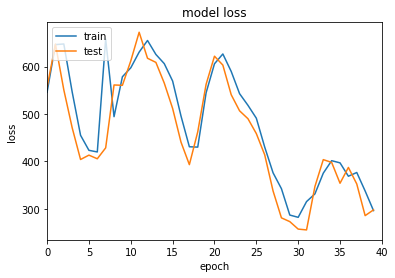

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 316.1935 - root_mean_squared_error: 8.7692 - val_loss: 317.6550 - val_root_mean_squared_error: 8.2122
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 338.3194 - root_mean_squared_error: 9.3235 - val_loss: 360.4896 - val_root_mean_squared_error: 10.4609
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 352.9034 - root_mean_squared_error: 10.0228 - val_loss: 320.1176 - val_root_mean_squared_error: 8.2377
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 329.1562 - root_mean_squared_error: 8.9412 - val_loss: 354.9243 - val_root_mean_squared_error: 10.7574
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 339.3803 - root_mean_squared_error: 10.2937 - val_loss: 292.1335 - val_root_mean_squared_error: 8.4071
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 301.0880 - root_mean_squared_error: 9.0098 - val_loss: 33

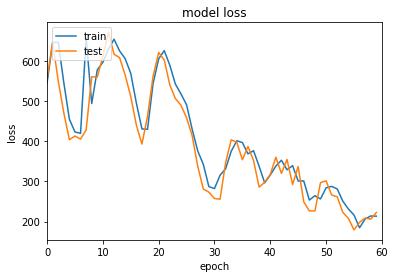

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 364.1110 - root_mean_squared_error: 15.3932 - val_loss: 296.8340 - val_root_mean_squared_error: 8.1495
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 338.6026 - root_mean_squared_error: 9.2497 - val_loss: 354.7037 - val_root_mean_squared_error: 8.0928
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 389.9008 - root_mean_squared_error: 9.4990 - val_loss: 415.8398 - val_root_mean_squared_error: 10.3935
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 404.6195 - root_mean_squared_error: 9.9384 - val_loss: 378.5482 - val_root_mean_squared_error: 8.8334
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 389.2371 - root_mean_squared_error: 9.6331 - val_loss: 427.4005 - val_root_mean_squared_error: 11.8378
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 387.8759 - root_mean_squared_error: 10.2599 - val_loss: 379.9544 -

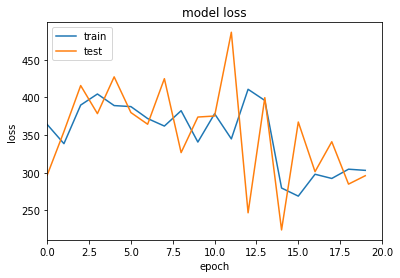

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 317.0555 - root_mean_squared_error: 8.9258 - val_loss: 315.8013 - val_root_mean_squared_error: 8.0952
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 384.5569 - root_mean_squared_error: 11.4524 - val_loss: 470.8622 - val_root_mean_squared_error: 14.6339
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 397.0562 - root_mean_squared_error: 11.8126 - val_loss: 329.3437 - val_root_mean_squared_error: 8.4236
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 341.4612 - root_mean_squared_error: 9.2820 - val_loss: 325.7558 - val_root_mean_squared_error: 8.6631
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 346.3103 - root_mean_squared_error: 9.7911 - val_loss: 355.1698 - val_root_mean_squared_error: 10.2037
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 339.2635 - root_mean_squared_error: 9.3450 - val_loss: 319

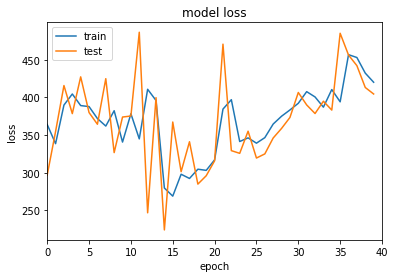

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 414.2023 - root_mean_squared_error: 9.6220 - val_loss: 377.7018 - val_root_mean_squared_error: 8.2018
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 379.4977 - root_mean_squared_error: 8.7986 - val_loss: 356.8165 - val_root_mean_squared_error: 8.1754
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 362.0512 - root_mean_squared_error: 8.9523 - val_loss: 342.5653 - val_root_mean_squared_error: 8.4863
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 342.8234 - root_mean_squared_error: 8.9193 - val_loss: 383.8639 - val_root_mean_squared_error: 11.4330
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 340.6515 - root_mean_squared_error: 9.4107 - val_loss: 317.4995 - val_root_mean_squared_error: 8.1601
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 334.9925 - root_mean_squared_error: 9.2866 - val_loss: 321.

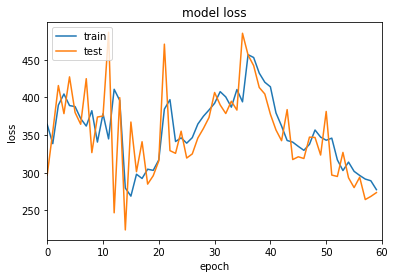

Epoch 1/20
6/6 [==============================] - 1s 37ms/step - loss: 320.6345 - root_mean_squared_error: 14.6292 - val_loss: 238.5745 - val_root_mean_squared_error: 8.2570
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 271.6780 - root_mean_squared_error: 9.1606 - val_loss: 264.3354 - val_root_mean_squared_error: 8.0914
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 284.2815 - root_mean_squared_error: 8.7771 - val_loss: 276.3328 - val_root_mean_squared_error: 8.1076
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 320.3072 - root_mean_squared_error: 10.2689 - val_loss: 286.2034 - val_root_mean_squared_error: 8.4984
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 304.2405 - root_mean_squared_error: 9.6797 - val_loss: 270.4026 - val_root_mean_squared_error: 8.2225
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 283.9425 - root_mean_squared_error: 9.1166 - val_loss: 268.8455 -

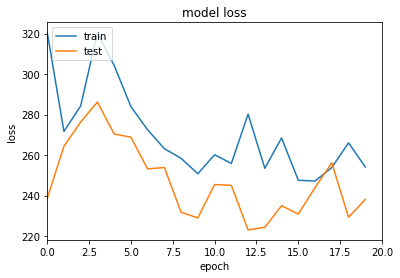

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 248.2893 - root_mean_squared_error: 9.3111 - val_loss: 293.5784 - val_root_mean_squared_error: 11.4751
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 300.6248 - root_mean_squared_error: 11.6926 - val_loss: 309.5271 - val_root_mean_squared_error: 11.8134
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 280.7175 - root_mean_squared_error: 10.2191 - val_loss: 421.8287 - val_root_mean_squared_error: 15.3811
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 327.1098 - root_mean_squared_error: 11.7548 - val_loss: 386.5361 - val_root_mean_squared_error: 13.9841
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 316.3185 - root_mean_squared_error: 11.1322 - val_loss: 263.2083 - val_root_mean_squared_error: 8.1708
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 300.2641 - root_mean_squared_error: 10.0294 - val_los

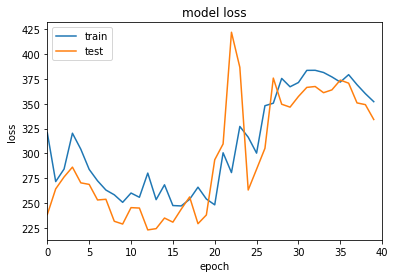

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 344.9164 - root_mean_squared_error: 9.3123 - val_loss: 430.5238 - val_root_mean_squared_error: 13.2636
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 391.3093 - root_mean_squared_error: 11.7739 - val_loss: 351.2172 - val_root_mean_squared_error: 10.1472
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 351.5754 - root_mean_squared_error: 10.2727 - val_loss: 308.6433 - val_root_mean_squared_error: 8.1718
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 321.6663 - root_mean_squared_error: 9.0271 - val_loss: 345.5002 - val_root_mean_squared_error: 10.2528
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 343.0995 - root_mean_squared_error: 9.8180 - val_loss: 325.2612 - val_root_mean_squared_error: 8.3802
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 339.7856 - root_mean_squared_error: 8.9863 - val_loss: 3

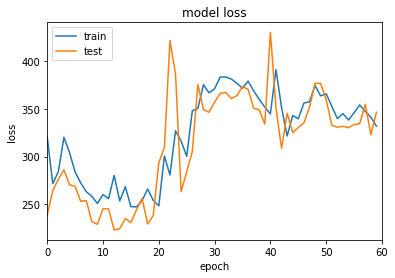

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 372.4095 - root_mean_squared_error: 16.3811 - val_loss: 230.6958 - val_root_mean_squared_error: 8.1420
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 293.4093 - root_mean_squared_error: 10.6443 - val_loss: 271.0626 - val_root_mean_squared_error: 8.6162
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 301.5648 - root_mean_squared_error: 9.5926 - val_loss: 281.4310 - val_root_mean_squared_error: 8.0858
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 305.2976 - root_mean_squared_error: 9.1926 - val_loss: 298.9428 - val_root_mean_squared_error: 8.9550
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 304.7698 - root_mean_squared_error: 9.3256 - val_loss: 305.2395 - val_root_mean_squared_error: 9.4808
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 300.7719 - root_mean_squared_error: 9.3378 - val_loss: 275.7794 -

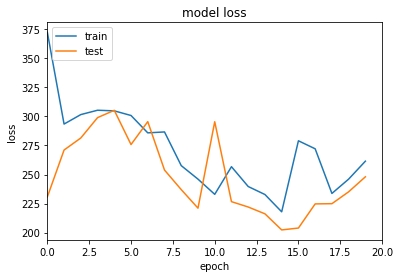

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 258.9691 - root_mean_squared_error: 8.7631 - val_loss: 248.0769 - val_root_mean_squared_error: 8.1500
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 266.6644 - root_mean_squared_error: 9.3109 - val_loss: 259.8772 - val_root_mean_squared_error: 9.0362
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 259.6736 - root_mean_squared_error: 9.1100 - val_loss: 238.9543 - val_root_mean_squared_error: 8.0868
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 264.7255 - root_mean_squared_error: 9.5886 - val_loss: 242.2725 - val_root_mean_squared_error: 8.1692
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 265.6288 - root_mean_squared_error: 9.3281 - val_loss: 255.7552 - val_root_mean_squared_error: 8.5387
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 267.5005 - root_mean_squared_error: 9.0745 - val_loss: 253.283

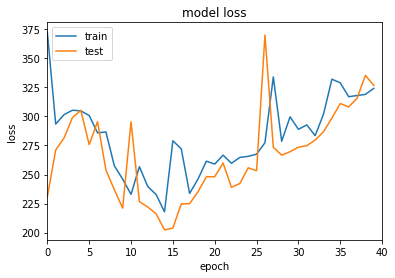

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 325.3062 - root_mean_squared_error: 9.7354 - val_loss: 313.7397 - val_root_mean_squared_error: 8.9153
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 312.6541 - root_mean_squared_error: 8.8523 - val_loss: 305.8951 - val_root_mean_squared_error: 8.5899
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 311.6447 - root_mean_squared_error: 9.0071 - val_loss: 294.8003 - val_root_mean_squared_error: 8.1162
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 306.6204 - root_mean_squared_error: 8.8693 - val_loss: 300.9559 - val_root_mean_squared_error: 8.6836
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 308.2439 - root_mean_squared_error: 9.1106 - val_loss: 297.3338 - val_root_mean_squared_error: 8.5641
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 307.7216 - root_mean_squared_error: 9.3104 - val_loss: 303.0653

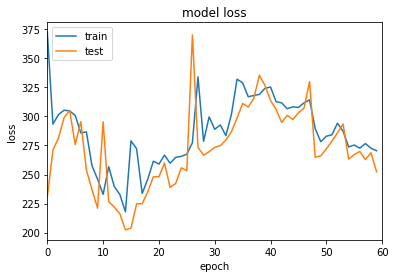

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 455.4806 - root_mean_squared_error: 16.5743 - val_loss: 509.2578 - val_root_mean_squared_error: 10.2621
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 588.0775 - root_mean_squared_error: 11.2885 - val_loss: 601.2383 - val_root_mean_squared_error: 11.3989
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 528.4315 - root_mean_squared_error: 10.0249 - val_loss: 403.1569 - val_root_mean_squared_error: 8.2237
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 413.0310 - root_mean_squared_error: 11.6680 - val_loss: 292.3507 - val_root_mean_squared_error: 9.6642
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 276.2280 - root_mean_squared_error: 10.2830 - val_loss: 223.2906 - val_root_mean_squared_error: 8.8587
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 274.7724 - root_mean_squared_error: 11.3797 - val_loss: 220.

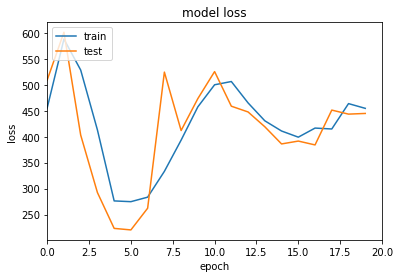

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 453.6894 - root_mean_squared_error: 9.2647 - val_loss: 425.8649 - val_root_mean_squared_error: 9.1304
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 421.6650 - root_mean_squared_error: 9.5139 - val_loss: 384.6680 - val_root_mean_squared_error: 8.4310
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 390.2221 - root_mean_squared_error: 9.2690 - val_loss: 385.7432 - val_root_mean_squared_error: 9.4370
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 384.2681 - root_mean_squared_error: 9.3038 - val_loss: 379.0411 - val_root_mean_squared_error: 9.0344
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 373.5111 - root_mean_squared_error: 9.0587 - val_loss: 347.0577 - val_root_mean_squared_error: 8.4848
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 347.1174 - root_mean_squared_error: 9.7100 - val_loss: 290.9

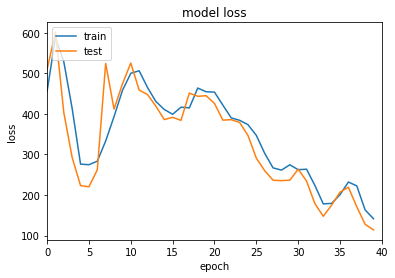

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 123.7881 - root_mean_squared_error: 9.0366 - val_loss: 110.7733 - val_root_mean_squared_error: 8.2859
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 122.4487 - root_mean_squared_error: 8.8777 - val_loss: 116.3376 - val_root_mean_squared_error: 8.0788
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 134.9747 - root_mean_squared_error: 8.8625 - val_loss: 123.4356 - val_root_mean_squared_error: 8.1480
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 131.7707 - root_mean_squared_error: 8.9774 - val_loss: 105.9056 - val_root_mean_squared_error: 8.1430
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 110.0319 - root_mean_squared_error: 8.8318 - val_loss: 94.4361 - val_root_mean_squared_error: 8.3749
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 102.8266 - root_mean_squared_error: 8.9311 - val_loss: 90.1355

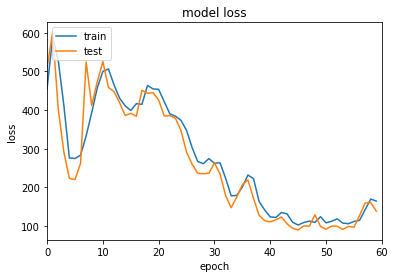

Epoch 1/20
6/6 [==============================] - 1s 40ms/step - loss: 279.1391 - root_mean_squared_error: 15.7484 - val_loss: 140.6012 - val_root_mean_squared_error: 8.3603
Epoch 2/20
6/6 [==============================] - 0s 14ms/step - loss: 198.6840 - root_mean_squared_error: 10.4579 - val_loss: 201.4841 - val_root_mean_squared_error: 9.4645
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 230.0026 - root_mean_squared_error: 10.5159 - val_loss: 247.7235 - val_root_mean_squared_error: 10.9976
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 297.5803 - root_mean_squared_error: 13.0033 - val_loss: 308.2325 - val_root_mean_squared_error: 13.4030
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 294.2537 - root_mean_squared_error: 12.9612 - val_loss: 188.6686 - val_root_mean_squared_error: 8.1815
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 267.9274 - root_mean_squared_error: 12.2266 - val_loss: 2

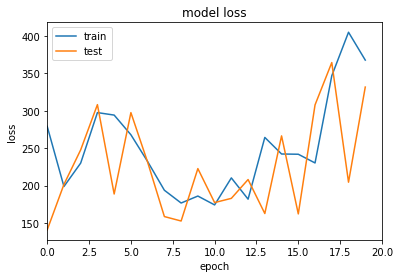

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 226.4886 - root_mean_squared_error: 11.8065 - val_loss: 165.6167 - val_root_mean_squared_error: 8.7662
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 173.6490 - root_mean_squared_error: 9.0977 - val_loss: 158.6719 - val_root_mean_squared_error: 8.0930
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 206.7925 - root_mean_squared_error: 10.6774 - val_loss: 215.2840 - val_root_mean_squared_error: 11.0373
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 213.2830 - root_mean_squared_error: 10.8212 - val_loss: 172.6380 - val_root_mean_squared_error: 8.5258
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 206.9466 - root_mean_squared_error: 10.2503 - val_loss: 192.9966 - val_root_mean_squared_error: 9.4480
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 269.4680 - root_mean_squared_error: 12.7938 - val_loss:

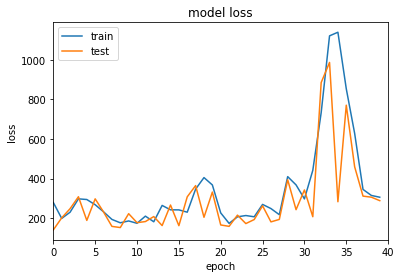

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 294.8898 - root_mean_squared_error: 8.9374 - val_loss: 285.4304 - val_root_mean_squared_error: 8.4800
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 292.1909 - root_mean_squared_error: 8.8612 - val_loss: 280.2282 - val_root_mean_squared_error: 8.1427
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 292.4185 - root_mean_squared_error: 8.8850 - val_loss: 285.5875 - val_root_mean_squared_error: 8.5492
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 297.6971 - root_mean_squared_error: 9.2630 - val_loss: 317.2472 - val_root_mean_squared_error: 10.2720
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 314.6492 - root_mean_squared_error: 10.0534 - val_loss: 288.3927 - val_root_mean_squared_error: 8.4832
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 298.0318 - root_mean_squared_error: 8.9628 - val_loss: 2

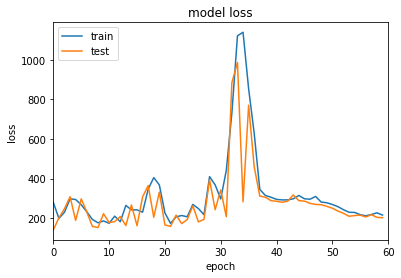

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 290.6674 - root_mean_squared_error: 16.6681 - val_loss: 90.2074 - val_root_mean_squared_error: 8.1491
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 154.5678 - root_mean_squared_error: 11.3010 - val_loss: 143.1340 - val_root_mean_squared_error: 10.5300
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 142.2546 - root_mean_squared_error: 10.3839 - val_loss: 108.3465 - val_root_mean_squared_error: 8.4421
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 119.8128 - root_mean_squared_error: 9.0478 - val_loss: 108.9119 - val_root_mean_squared_error: 8.3515
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 119.9985 - root_mean_squared_error: 8.9645 - val_loss: 105.9889 - val_root_mean_squared_error: 8.1237
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 118.0368 - root_mean_squared_error: 8.8375 - val_loss: 175.7895

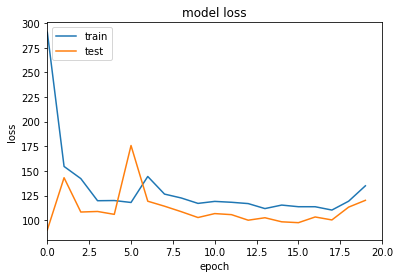

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 125.7976 - root_mean_squared_error: 9.7959 - val_loss: 152.9860 - val_root_mean_squared_error: 11.1073
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 115.5564 - root_mean_squared_error: 9.2803 - val_loss: 116.8120 - val_root_mean_squared_error: 9.3441
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 119.5998 - root_mean_squared_error: 9.4840 - val_loss: 95.0981 - val_root_mean_squared_error: 8.0859
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 108.6435 - root_mean_squared_error: 8.9069 - val_loss: 95.5502 - val_root_mean_squared_error: 8.1740
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 113.3965 - root_mean_squared_error: 9.2179 - val_loss: 115.4224 - val_root_mean_squared_error: 9.3576
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 117.4300 - root_mean_squared_error: 9.4965 - val_loss: 92.27

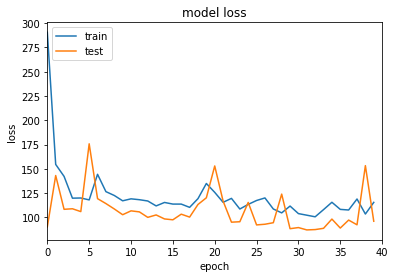

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 113.8526 - root_mean_squared_error: 9.2051 - val_loss: 94.9017 - val_root_mean_squared_error: 8.0795
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 116.8085 - root_mean_squared_error: 9.3500 - val_loss: 96.6566 - val_root_mean_squared_error: 8.1901
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 116.2588 - root_mean_squared_error: 9.2732 - val_loss: 96.4752 - val_root_mean_squared_error: 8.0821
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 108.2210 - root_mean_squared_error: 8.7776 - val_loss: 99.0585 - val_root_mean_squared_error: 8.2391
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 116.1014 - root_mean_squared_error: 9.1911 - val_loss: 128.2017 - val_root_mean_squared_error: 9.7873
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 136.1631 - root_mean_squared_error: 10.1809 - val_loss: 139.3938

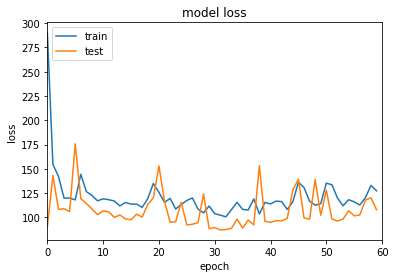

Epoch 1/20
6/6 [==============================] - 1s 37ms/step - loss: 252.6928 - root_mean_squared_error: 15.5214 - val_loss: 105.8334 - val_root_mean_squared_error: 9.2575
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 135.3428 - root_mean_squared_error: 10.6020 - val_loss: 182.9614 - val_root_mean_squared_error: 12.5392
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 138.7702 - root_mean_squared_error: 10.5491 - val_loss: 126.9725 - val_root_mean_squared_error: 9.8946
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 125.5754 - root_mean_squared_error: 9.7790 - val_loss: 96.6108 - val_root_mean_squared_error: 8.1175
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 115.0464 - root_mean_squared_error: 9.1647 - val_loss: 104.0995 - val_root_mean_squared_error: 8.5367
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 111.0566 - root_mean_squared_error: 8.9271 - val_loss: 99.9342 - 

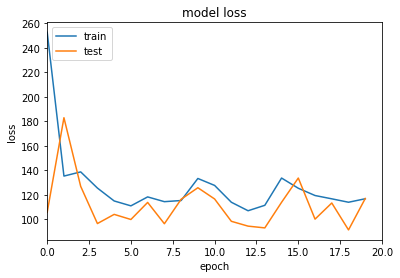

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 115.4737 - root_mean_squared_error: 9.4750 - val_loss: 105.3457 - val_root_mean_squared_error: 8.9392
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 119.5299 - root_mean_squared_error: 9.7105 - val_loss: 93.6561 - val_root_mean_squared_error: 8.2717
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 105.1971 - root_mean_squared_error: 8.9247 - val_loss: 127.6976 - val_root_mean_squared_error: 10.0915
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 128.3967 - root_mean_squared_error: 10.1324 - val_loss: 91.7840 - val_root_mean_squared_error: 8.1358
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 113.0411 - root_mean_squared_error: 9.3556 - val_loss: 107.5295 - val_root_mean_squared_error: 9.0642
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 125.5429 - root_mean_squared_error: 10.0168 - val_loss: 114.

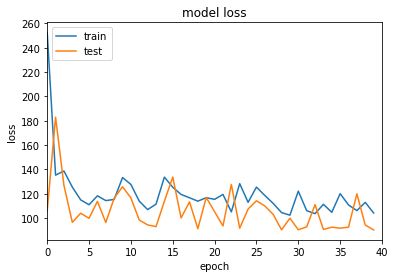

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 103.8563 - root_mean_squared_error: 8.8898 - val_loss: 106.7313 - val_root_mean_squared_error: 9.0438
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 105.3959 - root_mean_squared_error: 8.9462 - val_loss: 108.9436 - val_root_mean_squared_error: 9.1195
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 110.0016 - root_mean_squared_error: 9.1772 - val_loss: 104.9240 - val_root_mean_squared_error: 8.9031
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 107.3988 - root_mean_squared_error: 9.0530 - val_loss: 93.2847 - val_root_mean_squared_error: 8.2597
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 104.4475 - root_mean_squared_error: 8.9288 - val_loss: 93.4838 - val_root_mean_squared_error: 8.3226
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 108.0275 - root_mean_squared_error: 9.1738 - val_loss: 95.137

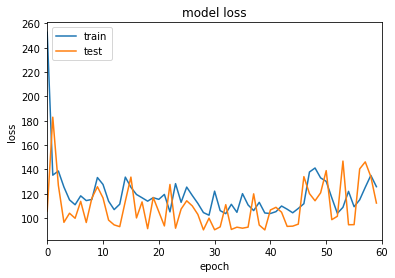

Epoch 1/20
6/6 [==============================] - 1s 37ms/step - loss: 416.8543 - root_mean_squared_error: 15.5791 - val_loss: 475.9753 - val_root_mean_squared_error: 9.1448
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 564.2351 - root_mean_squared_error: 10.5800 - val_loss: 551.5401 - val_root_mean_squared_error: 8.6297
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 540.6417 - root_mean_squared_error: 9.3396 - val_loss: 458.9433 - val_root_mean_squared_error: 8.0996
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 428.5590 - root_mean_squared_error: 9.2373 - val_loss: 333.6438 - val_root_mean_squared_error: 8.4003
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 300.3265 - root_mean_squared_error: 8.7313 - val_loss: 268.8972 - val_root_mean_squared_error: 9.5085
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 269.8080 - root_mean_squared_error: 10.2269 - val_loss: 379.927

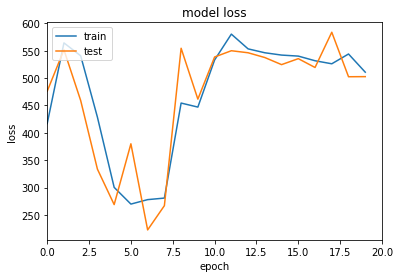

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 488.5693 - root_mean_squared_error: 9.1905 - val_loss: 452.7874 - val_root_mean_squared_error: 8.8706
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 440.7715 - root_mean_squared_error: 9.5877 - val_loss: 446.5380 - val_root_mean_squared_error: 11.6679
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 395.0820 - root_mean_squared_error: 10.0635 - val_loss: 366.2816 - val_root_mean_squared_error: 9.8680
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 368.7932 - root_mean_squared_error: 10.3108 - val_loss: 357.1020 - val_root_mean_squared_error: 9.2123
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 401.9741 - root_mean_squared_error: 10.6733 - val_loss: 379.9252 - val_root_mean_squared_error: 8.1698
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 397.5261 - root_mean_squared_error: 8.8668 - val_loss:

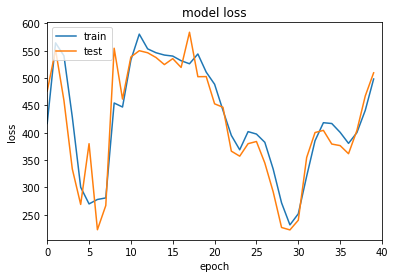

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 527.4149 - root_mean_squared_error: 9.0134 - val_loss: 512.0458 - val_root_mean_squared_error: 8.2412
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 506.4868 - root_mean_squared_error: 8.9340 - val_loss: 455.1167 - val_root_mean_squared_error: 8.0840
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 447.2487 - root_mean_squared_error: 9.2475 - val_loss: 396.4023 - val_root_mean_squared_error: 8.8199
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 384.1470 - root_mean_squared_error: 9.5014 - val_loss: 323.2075 - val_root_mean_squared_error: 8.3269
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 316.3019 - root_mean_squared_error: 9.1904 - val_loss: 271.9123 - val_root_mean_squared_error: 8.2387
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 268.2396 - root_mean_squared_error: 8.9503 - val_loss: 238

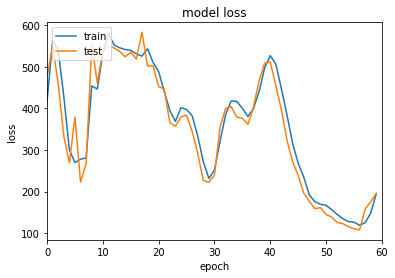

Epoch 1/20
6/6 [==============================] - 1s 35ms/step - loss: 212.4192 - root_mean_squared_error: 13.8766 - val_loss: 114.3529 - val_root_mean_squared_error: 8.0844
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 150.3090 - root_mean_squared_error: 9.3132 - val_loss: 197.9514 - val_root_mean_squared_error: 10.8401
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 186.6216 - root_mean_squared_error: 9.9765 - val_loss: 187.3199 - val_root_mean_squared_error: 9.6603
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 196.2309 - root_mean_squared_error: 9.9843 - val_loss: 227.1458 - val_root_mean_squared_error: 11.3227
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 196.8297 - root_mean_squared_error: 9.8941 - val_loss: 163.7140 - val_root_mean_squared_error: 8.0921
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 193.9682 - root_mean_squared_error: 9.8757 - val_loss: 177.3734

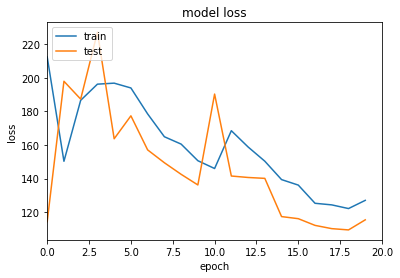

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 129.2801 - root_mean_squared_error: 9.2286 - val_loss: 110.8359 - val_root_mean_squared_error: 8.1761
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 121.5299 - root_mean_squared_error: 8.8621 - val_loss: 107.2329 - val_root_mean_squared_error: 8.1270
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 122.0401 - root_mean_squared_error: 9.0293 - val_loss: 106.8429 - val_root_mean_squared_error: 8.1814
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 121.4186 - root_mean_squared_error: 9.0410 - val_loss: 106.6344 - val_root_mean_squared_error: 8.1929
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 156.1005 - root_mean_squared_error: 10.8038 - val_loss: 130.7946 - val_root_mean_squared_error: 9.5677
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 204.7884 - root_mean_squared_error: 12.8557 - val_loss: 1

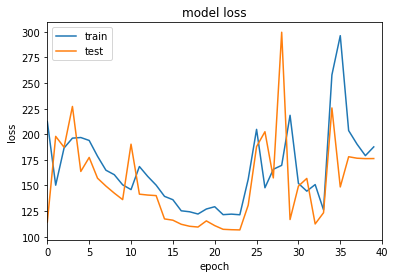

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 208.0655 - root_mean_squared_error: 9.8526 - val_loss: 176.2899 - val_root_mean_squared_error: 8.1680
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 189.9443 - root_mean_squared_error: 9.0938 - val_loss: 180.5720 - val_root_mean_squared_error: 8.7795
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 183.0423 - root_mean_squared_error: 8.9972 - val_loss: 167.7441 - val_root_mean_squared_error: 8.1207
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 183.0325 - root_mean_squared_error: 9.0419 - val_loss: 166.7865 - val_root_mean_squared_error: 8.2457
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 220.3430 - root_mean_squared_error: 11.1516 - val_loss: 238.5191 - val_root_mean_squared_error: 12.0525
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 201.6284 - root_mean_squared_error: 10.1923 - val_loss: 

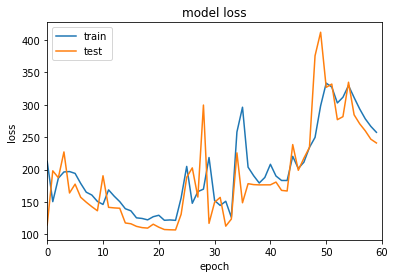

Epoch 1/20
6/6 [==============================] - 1s 35ms/step - loss: 221.9884 - root_mean_squared_error: 14.7845 - val_loss: 73.5783 - val_root_mean_squared_error: 8.0953
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 94.9619 - root_mean_squared_error: 9.1927 - val_loss: 101.4991 - val_root_mean_squared_error: 9.3751
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 103.2604 - root_mean_squared_error: 9.3969 - val_loss: 107.5497 - val_root_mean_squared_error: 9.5341
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 118.0519 - root_mean_squared_error: 10.0322 - val_loss: 96.4805 - val_root_mean_squared_error: 8.8408
Epoch 5/20
6/6 [==============================] - 0s 13ms/step - loss: 128.2201 - root_mean_squared_error: 10.4696 - val_loss: 116.0462 - val_root_mean_squared_error: 9.8562
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 96.0286 - root_mean_squared_error: 8.7761 - val_loss: 114.0972 - 

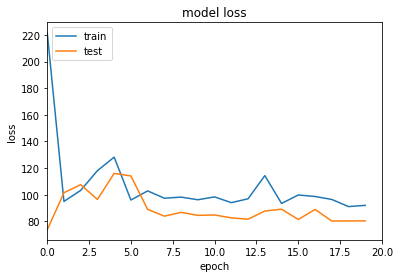

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 94.1267 - root_mean_squared_error: 8.9776 - val_loss: 80.4723 - val_root_mean_squared_error: 8.2012
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 92.3829 - root_mean_squared_error: 8.9049 - val_loss: 86.1257 - val_root_mean_squared_error: 8.5583
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 93.1582 - root_mean_squared_error: 8.9690 - val_loss: 84.2901 - val_root_mean_squared_error: 8.4694
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 96.3069 - root_mean_squared_error: 9.1413 - val_loss: 78.5249 - val_root_mean_squared_error: 8.0919
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 106.9227 - root_mean_squared_error: 9.6851 - val_loss: 78.4208 - val_root_mean_squared_error: 8.0795
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 92.1564 - root_mean_squared_error: 8.8879 - val_loss: 82.6825 - val

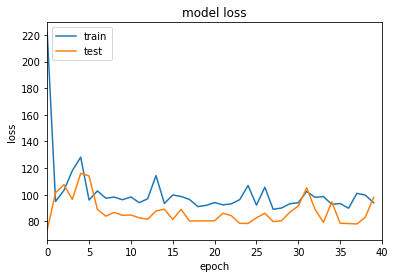

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 93.8395 - root_mean_squared_error: 8.9743 - val_loss: 78.7924 - val_root_mean_squared_error: 8.0989
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 95.3995 - root_mean_squared_error: 9.0704 - val_loss: 91.1688 - val_root_mean_squared_error: 8.8427
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 98.6959 - root_mean_squared_error: 9.2661 - val_loss: 82.1888 - val_root_mean_squared_error: 8.3395
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 92.8553 - root_mean_squared_error: 8.9609 - val_loss: 106.4359 - val_root_mean_squared_error: 9.6967
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 113.4047 - root_mean_squared_error: 10.0466 - val_loss: 115.4846 - val_root_mean_squared_error: 10.1373
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 118.4510 - root_mean_squared_error: 10.2735 - val_loss: 118.390

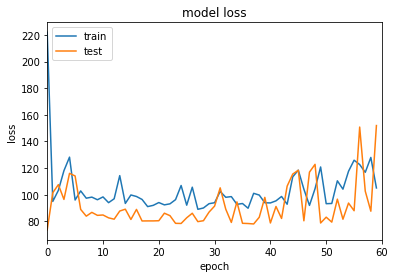

Epoch 1/20
6/6 [==============================] - 1s 38ms/step - loss: 213.1666 - root_mean_squared_error: 14.5550 - val_loss: 99.8286 - val_root_mean_squared_error: 9.8667
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 104.9192 - root_mean_squared_error: 10.1048 - val_loss: 70.6028 - val_root_mean_squared_error: 8.1994
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 84.3272 - root_mean_squared_error: 8.9844 - val_loss: 76.5431 - val_root_mean_squared_error: 8.5226
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 85.2254 - root_mean_squared_error: 9.0117 - val_loss: 70.3519 - val_root_mean_squared_error: 8.1349
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 81.8832 - root_mean_squared_error: 8.8110 - val_loss: 69.8049 - val_root_mean_squared_error: 8.0915
Epoch 6/20
6/6 [==============================] - 0s 13ms/step - loss: 82.6019 - root_mean_squared_error: 8.8455 - val_loss: 100.6312 - val_r

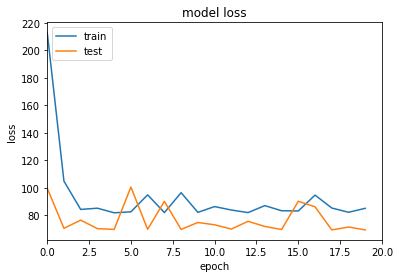

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 84.7986 - root_mean_squared_error: 8.9793 - val_loss: 71.6521 - val_root_mean_squared_error: 8.2148
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 83.7347 - root_mean_squared_error: 8.9218 - val_loss: 69.8180 - val_root_mean_squared_error: 8.1063
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 85.3300 - root_mean_squared_error: 9.0128 - val_loss: 70.2369 - val_root_mean_squared_error: 8.1333
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 85.4999 - root_mean_squared_error: 9.0248 - val_loss: 91.5602 - val_root_mean_squared_error: 9.3565
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 101.1773 - root_mean_squared_error: 9.8573 - val_loss: 69.2930 - val_root_mean_squared_error: 8.0804
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 87.1044 - root_mean_squared_error: 9.1180 - val_loss: 76.3450 - val_

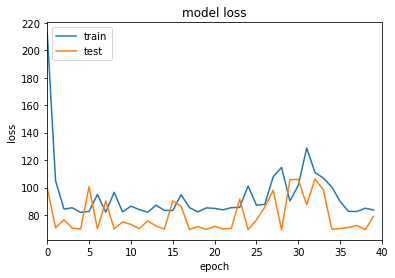

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 84.7116 - root_mean_squared_error: 8.9874 - val_loss: 69.2776 - val_root_mean_squared_error: 8.0836
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 80.6248 - root_mean_squared_error: 8.7591 - val_loss: 69.4834 - val_root_mean_squared_error: 8.0999
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 83.0438 - root_mean_squared_error: 8.8979 - val_loss: 69.2493 - val_root_mean_squared_error: 8.0859
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 82.1584 - root_mean_squared_error: 8.8498 - val_loss: 73.0086 - val_root_mean_squared_error: 8.3187
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 108.3298 - root_mean_squared_error: 10.2200 - val_loss: 69.3035 - val_root_mean_squared_error: 8.0812
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 105.4482 - root_mean_squared_error: 10.0707 - val_loss: 98.7325 - 

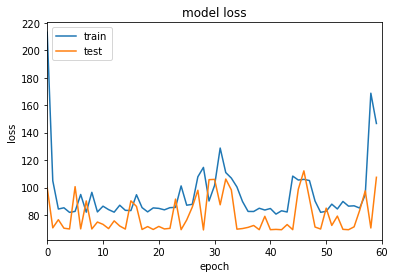

Epoch 1/20
6/6 [==============================] - 1s 60ms/step - loss: 455.8363 - root_mean_squared_error: 16.5939 - val_loss: 484.3481 - val_root_mean_squared_error: 8.2463
Epoch 2/20
6/6 [==============================] - 0s 17ms/step - loss: 606.0247 - root_mean_squared_error: 10.4861 - val_loss: 690.0389 - val_root_mean_squared_error: 11.6948
Epoch 3/20
6/6 [==============================] - 0s 14ms/step - loss: 670.9241 - root_mean_squared_error: 11.2877 - val_loss: 569.7103 - val_root_mean_squared_error: 8.5260
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 556.0665 - root_mean_squared_error: 10.3100 - val_loss: 435.4344 - val_root_mean_squared_error: 8.0834
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 414.7452 - root_mean_squared_error: 9.4433 - val_loss: 361.5485 - val_root_mean_squared_error: 9.6965
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 332.1683 - root_mean_squared_error: 9.3679 - val_loss: 285.80

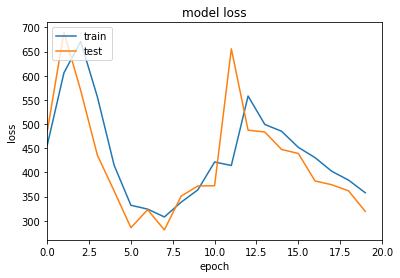

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 309.3372 - root_mean_squared_error: 9.0942 - val_loss: 357.6683 - val_root_mean_squared_error: 12.7413
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 342.4639 - root_mean_squared_error: 12.1951 - val_loss: 278.0143 - val_root_mean_squared_error: 8.0786
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 340.2301 - root_mean_squared_error: 9.9155 - val_loss: 351.5144 - val_root_mean_squared_error: 8.1351
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 395.9825 - root_mean_squared_error: 9.8505 - val_loss: 371.8370 - val_root_mean_squared_error: 8.0833
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 381.2601 - root_mean_squared_error: 8.8021 - val_loss: 360.1505 - val_root_mean_squared_error: 8.1450
Epoch 26/40
6/6 [==============================] - 0s 13ms/step - loss: 363.5058 - root_mean_squared_error: 8.8787 - val_loss: 350

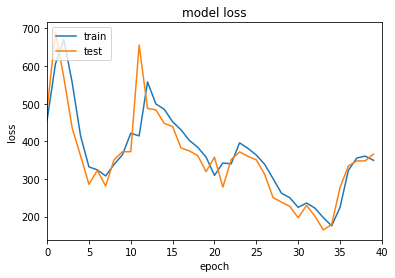

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 370.7456 - root_mean_squared_error: 9.6118 - val_loss: 341.3023 - val_root_mean_squared_error: 8.1434
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 356.6043 - root_mean_squared_error: 9.3484 - val_loss: 332.4877 - val_root_mean_squared_error: 8.4844
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 333.3943 - root_mean_squared_error: 9.1702 - val_loss: 298.6108 - val_root_mean_squared_error: 8.9572
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 269.5240 - root_mean_squared_error: 8.8882 - val_loss: 226.6089 - val_root_mean_squared_error: 8.5308
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 231.8108 - root_mean_squared_error: 9.2148 - val_loss: 223.0932 - val_root_mean_squared_error: 8.4610
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 237.9795 - root_mean_squared_error: 9.1497 - val_loss: 224

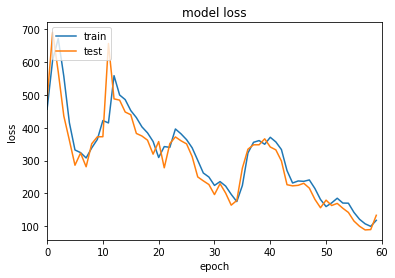

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 261.8054 - root_mean_squared_error: 15.5503 - val_loss: 118.9292 - val_root_mean_squared_error: 8.1881
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 162.2299 - root_mean_squared_error: 9.6689 - val_loss: 169.1742 - val_root_mean_squared_error: 8.9594
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 210.0184 - root_mean_squared_error: 10.6414 - val_loss: 171.5601 - val_root_mean_squared_error: 8.1602
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 197.0222 - root_mean_squared_error: 9.4923 - val_loss: 175.4987 - val_root_mean_squared_error: 8.2091
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 198.8139 - root_mean_squared_error: 9.5210 - val_loss: 198.0007 - val_root_mean_squared_error: 9.5225
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 196.4150 - root_mean_squared_error: 9.5352 - val_loss: 222.5799 - v

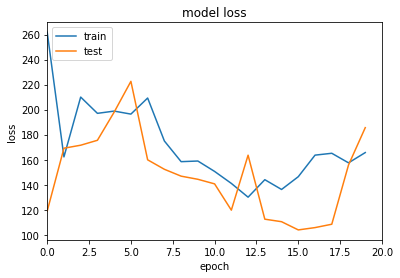

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 150.3848 - root_mean_squared_error: 10.4183 - val_loss: 107.8832 - val_root_mean_squared_error: 8.0789
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 136.8701 - root_mean_squared_error: 9.7199 - val_loss: 108.8632 - val_root_mean_squared_error: 8.1312
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 122.3885 - root_mean_squared_error: 8.7965 - val_loss: 118.9298 - val_root_mean_squared_error: 8.3463
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 149.2289 - root_mean_squared_error: 9.8696 - val_loss: 245.8178 - val_root_mean_squared_error: 13.8070
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 164.7250 - root_mean_squared_error: 10.3999 - val_loss: 195.9822 - val_root_mean_squared_error: 11.7230
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 151.6807 - root_mean_squared_error: 9.5377 - val_loss: 13

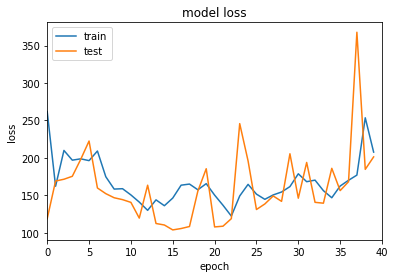

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 228.8701 - root_mean_squared_error: 10.3277 - val_loss: 192.2675 - val_root_mean_squared_error: 8.0885
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 211.0762 - root_mean_squared_error: 9.1316 - val_loss: 243.9666 - val_root_mean_squared_error: 10.7615
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 222.2409 - root_mean_squared_error: 9.6459 - val_loss: 199.2737 - val_root_mean_squared_error: 8.1781
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 215.6926 - root_mean_squared_error: 8.9686 - val_loss: 204.3982 - val_root_mean_squared_error: 8.0792
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 226.2005 - root_mean_squared_error: 9.2478 - val_loss: 207.6685 - val_root_mean_squared_error: 8.0974
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 296.4833 - root_mean_squared_error: 12.3667 - val_loss: 26

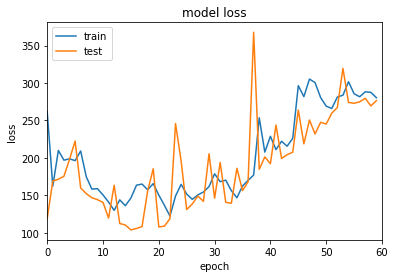

Epoch 1/20
6/6 [==============================] - 1s 38ms/step - loss: 420.9246 - root_mean_squared_error: 20.4592 - val_loss: 80.5496 - val_root_mean_squared_error: 8.6238
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 164.2620 - root_mean_squared_error: 12.4871 - val_loss: 143.0138 - val_root_mean_squared_error: 11.4829
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 171.2020 - root_mean_squared_error: 12.5937 - val_loss: 115.5869 - val_root_mean_squared_error: 10.0526
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 102.4658 - root_mean_squared_error: 9.3298 - val_loss: 88.6774 - val_root_mean_squared_error: 8.4917
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 104.6160 - root_mean_squared_error: 9.3583 - val_loss: 95.0918 - val_root_mean_squared_error: 8.8013
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 94.7945 - root_mean_squared_error: 8.7717 - val_loss: 91.6754 -

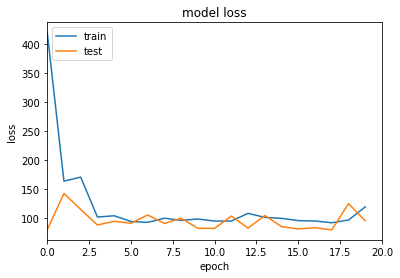

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 101.8486 - root_mean_squared_error: 9.3738 - val_loss: 94.0385 - val_root_mean_squared_error: 8.9538
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 97.4126 - root_mean_squared_error: 9.1337 - val_loss: 93.7654 - val_root_mean_squared_error: 8.9209
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 101.5751 - root_mean_squared_error: 9.3446 - val_loss: 84.8258 - val_root_mean_squared_error: 8.3984
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 112.5478 - root_mean_squared_error: 9.9147 - val_loss: 92.1855 - val_root_mean_squared_error: 8.8350
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 97.6256 - root_mean_squared_error: 9.1439 - val_loss: 85.2763 - val_root_mean_squared_error: 8.4534
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 100.2607 - root_mean_squared_error: 9.3052 - val_loss: 83.0940 - 

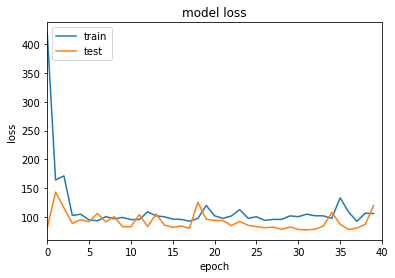

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 131.9454 - root_mean_squared_error: 11.0346 - val_loss: 184.1570 - val_root_mean_squared_error: 13.2010
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 129.4100 - root_mean_squared_error: 10.9397 - val_loss: 96.0963 - val_root_mean_squared_error: 9.3051
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 97.0139 - root_mean_squared_error: 9.3471 - val_loss: 77.5390 - val_root_mean_squared_error: 8.2172
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 88.4655 - root_mean_squared_error: 8.8423 - val_loss: 76.4018 - val_root_mean_squared_error: 8.1065
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 91.6442 - root_mean_squared_error: 8.9884 - val_loss: 81.6900 - val_root_mean_squared_error: 8.4089
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 91.7170 - root_mean_squared_error: 8.9850 - val_loss: 76.1951 

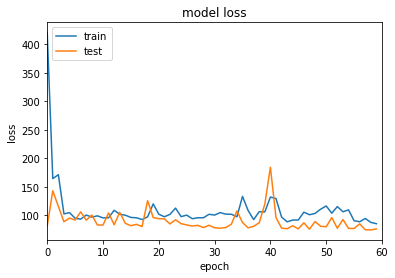

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 322.2552 - root_mean_squared_error: 17.9419 - val_loss: 73.4955 - val_root_mean_squared_error: 8.5246
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 138.5025 - root_mean_squared_error: 11.7225 - val_loss: 160.8131 - val_root_mean_squared_error: 12.6250
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 126.0204 - root_mean_squared_error: 11.1557 - val_loss: 100.8368 - val_root_mean_squared_error: 9.9537
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 123.9043 - root_mean_squared_error: 11.0478 - val_loss: 84.8136 - val_root_mean_squared_error: 9.1022
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 100.3650 - root_mean_squared_error: 9.9175 - val_loss: 98.5811 - val_root_mean_squared_error: 9.8243
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 95.0232 - root_mean_squared_error: 9.6404 - val_loss: 70.3849 -

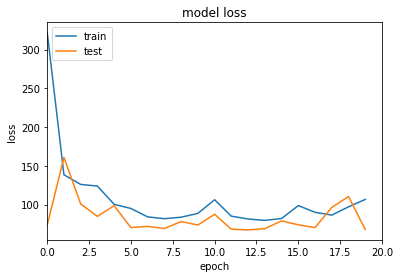

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 97.7866 - root_mean_squared_error: 9.7910 - val_loss: 70.5385 - val_root_mean_squared_error: 8.2842
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 101.5112 - root_mean_squared_error: 9.9802 - val_loss: 121.4076 - val_root_mean_squared_error: 10.9320
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 94.5572 - root_mean_squared_error: 9.6263 - val_loss: 70.1432 - val_root_mean_squared_error: 8.2622
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 83.1464 - root_mean_squared_error: 9.0150 - val_loss: 100.3125 - val_root_mean_squared_error: 9.9219
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 94.2295 - root_mean_squared_error: 9.6108 - val_loss: 74.9544 - val_root_mean_squared_error: 8.5501
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 92.3355 - root_mean_squared_error: 9.5126 - val_loss: 68.6081 - 

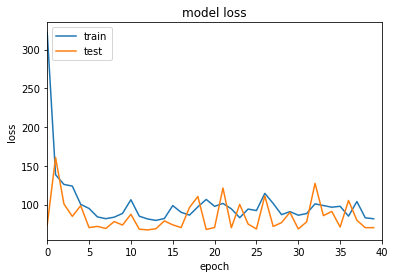

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 82.7747 - root_mean_squared_error: 9.0071 - val_loss: 68.5808 - val_root_mean_squared_error: 8.1819
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 78.5305 - root_mean_squared_error: 8.7690 - val_loss: 97.4495 - val_root_mean_squared_error: 9.7888
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 110.1663 - root_mean_squared_error: 10.4184 - val_loss: 95.7228 - val_root_mean_squared_error: 9.7010
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 91.7689 - root_mean_squared_error: 9.4952 - val_loss: 67.5838 - val_root_mean_squared_error: 8.1227
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 79.5802 - root_mean_squared_error: 8.8307 - val_loss: 66.9639 - val_root_mean_squared_error: 8.0854
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 78.7300 - root_mean_squared_error: 8.7831 - val_loss: 70.4502 - val_

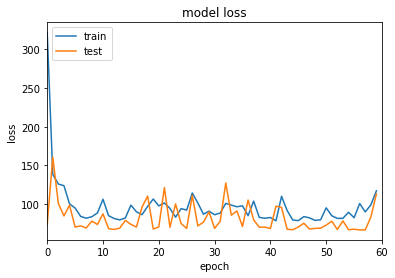

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 473684.6562 - root_mean_squared_error: 688.2383 - val_loss: 1017.4836 - val_root_mean_squared_error: 31.5572
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 832.6420 - root_mean_squared_error: 28.3681 - val_loss: 896.6573 - val_root_mean_squared_error: 29.3421
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 407.0312 - root_mean_squared_error: 19.1702 - val_loss: 118.4641 - val_root_mean_squared_error: 8.6205
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 291.1502 - root_mean_squared_error: 15.6434 - val_loss: 115.4003 - val_root_mean_squared_error: 8.1449
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 158.8700 - root_mean_squared_error: 10.4127 - val_loss: 102.2043 - val_root_mean_squared_error: 7.0936
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 140.6874 - root_mean_squared_error: 9.3811 - val_loss

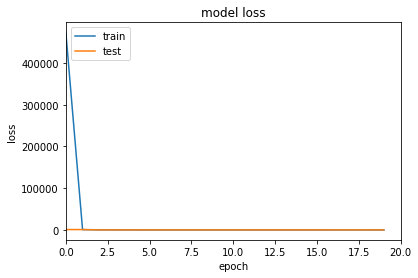

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 105.6012 - root_mean_squared_error: 7.2783 - val_loss: 97.8806 - val_root_mean_squared_error: 6.7446
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 104.7271 - root_mean_squared_error: 7.2312 - val_loss: 96.2451 - val_root_mean_squared_error: 6.6379
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 106.9527 - root_mean_squared_error: 7.3963 - val_loss: 97.4208 - val_root_mean_squared_error: 6.7384
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 108.3685 - root_mean_squared_error: 7.5038 - val_loss: 94.9316 - val_root_mean_squared_error: 6.5669
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 110.0790 - root_mean_squared_error: 7.6292 - val_loss: 100.8448 - val_root_mean_squared_error: 7.0144
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 110.9352 - root_mean_squared_error: 7.6971 - val_loss: 100.8679

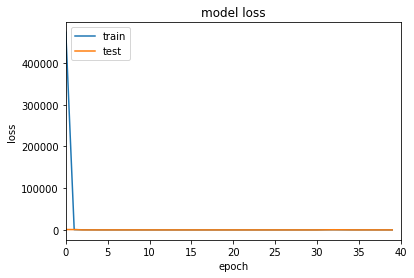

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 110.1040 - root_mean_squared_error: 7.7943 - val_loss: 97.9406 - val_root_mean_squared_error: 6.9862
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 109.3741 - root_mean_squared_error: 7.7579 - val_loss: 101.5114 - val_root_mean_squared_error: 7.2496
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 107.5610 - root_mean_squared_error: 7.6504 - val_loss: 101.1284 - val_root_mean_squared_error: 7.2328
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 111.6326 - root_mean_squared_error: 7.9221 - val_loss: 101.0244 - val_root_mean_squared_error: 7.2377
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 109.4213 - root_mean_squared_error: 7.7913 - val_loss: 97.3624 - val_root_mean_squared_error: 6.9901
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 117.8800 - root_mean_squared_error: 8.3258 - val_loss: 100.7

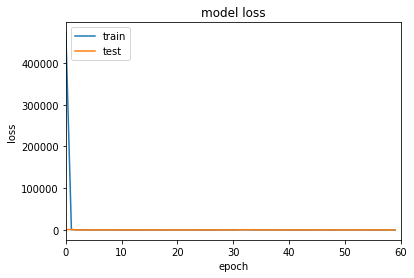

Epoch 1/20
6/6 [==============================] - 1s 98ms/step - loss: 213336.1719 - root_mean_squared_error: 461.8723 - val_loss: 4606.3042 - val_root_mean_squared_error: 67.7535
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 1604.5739 - root_mean_squared_error: 39.8075 - val_loss: 431.0656 - val_root_mean_squared_error: 20.1520
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 259.9035 - root_mean_squared_error: 15.2477 - val_loss: 108.0022 - val_root_mean_squared_error: 8.8215
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 169.2362 - root_mean_squared_error: 11.7319 - val_loss: 111.5261 - val_root_mean_squared_error: 8.8533
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 164.7308 - root_mean_squared_error: 11.4369 - val_loss: 167.1650 - val_root_mean_squared_error: 11.5075
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 121.6826 - root_mean_squared_error: 9.2997 - val_loss:

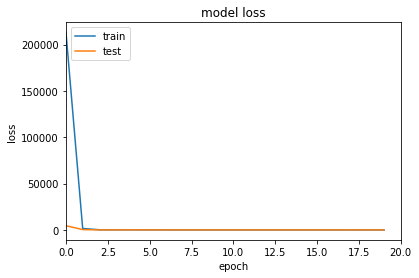

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 88.7769 - root_mean_squared_error: 7.3275 - val_loss: 80.3571 - val_root_mean_squared_error: 6.7393
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 88.8577 - root_mean_squared_error: 7.3404 - val_loss: 93.7343 - val_root_mean_squared_error: 7.6736
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 89.3770 - root_mean_squared_error: 7.3823 - val_loss: 78.5034 - val_root_mean_squared_error: 6.6139
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 91.6288 - root_mean_squared_error: 7.5397 - val_loss: 77.4491 - val_root_mean_squared_error: 6.5420
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 93.9672 - root_mean_squared_error: 7.6998 - val_loss: 85.6972 - val_root_mean_squared_error: 7.1528
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 88.1152 - root_mean_squared_error: 7.3171 - val_loss: 76.5238 - val_

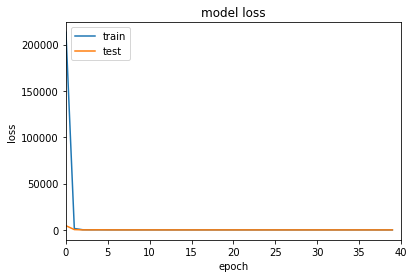

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 77.4051 - root_mean_squared_error: 6.6336 - val_loss: 62.6923 - val_root_mean_squared_error: 5.4231
Epoch 42/60
6/6 [==============================] - 0s 13ms/step - loss: 72.4030 - root_mean_squared_error: 6.2511 - val_loss: 63.6922 - val_root_mean_squared_error: 5.5209
Epoch 43/60
6/6 [==============================] - 0s 13ms/step - loss: 69.8424 - root_mean_squared_error: 6.0493 - val_loss: 63.6434 - val_root_mean_squared_error: 5.5247
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 68.5523 - root_mean_squared_error: 5.9489 - val_loss: 60.9374 - val_root_mean_squared_error: 5.2814
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 68.0931 - root_mean_squared_error: 5.9173 - val_loss: 60.2812 - val_root_mean_squared_error: 5.2268
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 68.0362 - root_mean_squared_error: 5.9184 - val_loss: 57.4732 - val_

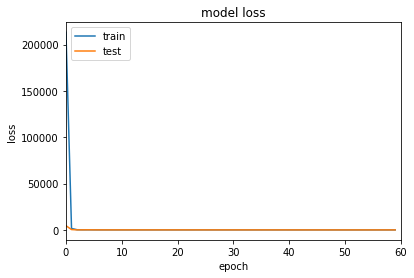

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 1170679.6250 - root_mean_squared_error: 1081.9750 - val_loss: 245.3016 - val_root_mean_squared_error: 15.1570
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 728.7008 - root_mean_squared_error: 26.6267 - val_loss: 737.5442 - val_root_mean_squared_error: 26.7000
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1103.3606 - root_mean_squared_error: 32.8094 - val_loss: 148.7017 - val_root_mean_squared_error: 10.9154
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 988.9653 - root_mean_squared_error: 30.9539 - val_loss: 405.0404 - val_root_mean_squared_error: 19.3076
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 443.2863 - root_mean_squared_error: 20.2569 - val_loss: 111.0366 - val_root_mean_squared_error: 8.7928
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 238.5401 - root_mean_squared_error: 14.2984 - val_

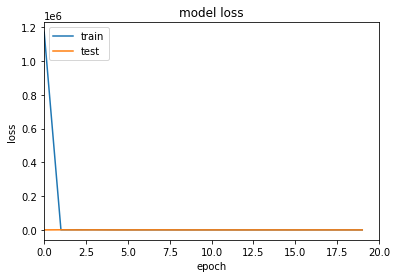

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 144.1415 - root_mean_squared_error: 10.5019 - val_loss: 88.8746 - val_root_mean_squared_error: 7.4244
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 107.1843 - root_mean_squared_error: 8.5699 - val_loss: 105.5487 - val_root_mean_squared_error: 8.4794
Epoch 23/40
6/6 [==============================] - 0s 14ms/step - loss: 113.9421 - root_mean_squared_error: 8.9623 - val_loss: 167.1331 - val_root_mean_squared_error: 11.5583
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 136.0434 - root_mean_squared_error: 10.1253 - val_loss: 95.9572 - val_root_mean_squared_error: 7.9070
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 126.2209 - root_mean_squared_error: 9.6330 - val_loss: 177.1531 - val_root_mean_squared_error: 11.9928
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 190.0815 - root_mean_squared_error: 12.5208 - val_loss: 

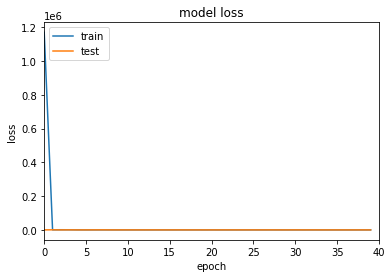

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 154.1828 - root_mean_squared_error: 11.0603 - val_loss: 137.7269 - val_root_mean_squared_error: 10.2936
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 115.7719 - root_mean_squared_error: 9.1658 - val_loss: 82.3291 - val_root_mean_squared_error: 7.1145
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 97.0098 - root_mean_squared_error: 8.0768 - val_loss: 134.9586 - val_root_mean_squared_error: 10.1569
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 93.9386 - root_mean_squared_error: 7.8817 - val_loss: 78.2248 - val_root_mean_squared_error: 6.8146
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 130.6110 - root_mean_squared_error: 9.9406 - val_loss: 184.0243 - val_root_mean_squared_error: 12.3404
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 1434.4833 - root_mean_squared_error: 37.4531 - val_loss: 81

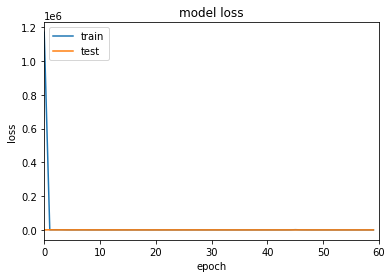

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 284448.1875 - root_mean_squared_error: 533.3275 - val_loss: 197.3892 - val_root_mean_squared_error: 13.4698
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 3570.6577 - root_mean_squared_error: 59.5879 - val_loss: 875.9630 - val_root_mean_squared_error: 29.1766
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 674.5813 - root_mean_squared_error: 25.4486 - val_loss: 492.2318 - val_root_mean_squared_error: 21.5096
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 254.2708 - root_mean_squared_error: 14.9467 - val_loss: 80.6973 - val_root_mean_squared_error: 6.9578
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 133.8845 - root_mean_squared_error: 10.0440 - val_loss: 107.8255 - val_root_mean_squared_error: 8.6037
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 123.6227 - root_mean_squared_error: 9.4559 - val_loss

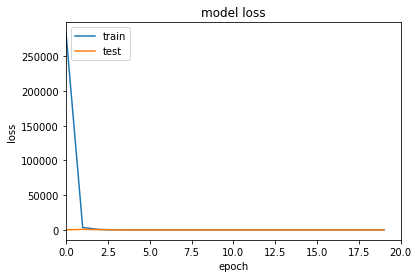

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 84.0335 - root_mean_squared_error: 7.0344 - val_loss: 78.9196 - val_root_mean_squared_error: 6.6674
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 82.8534 - root_mean_squared_error: 6.9553 - val_loss: 73.2285 - val_root_mean_squared_error: 6.2319
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 82.5320 - root_mean_squared_error: 6.9388 - val_loss: 72.4127 - val_root_mean_squared_error: 6.1741
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 82.9206 - root_mean_squared_error: 6.9731 - val_loss: 70.9415 - val_root_mean_squared_error: 6.0604
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 81.4804 - root_mean_squared_error: 6.8745 - val_loss: 78.6367 - val_root_mean_squared_error: 6.6716
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 78.3514 - root_mean_squared_error: 6.6496 - val_loss: 71.1235 - val_ro

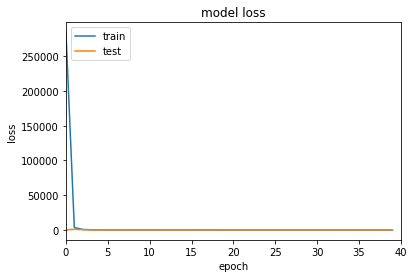

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 87.5658 - root_mean_squared_error: 7.3899 - val_loss: 101.5138 - val_root_mean_squared_error: 8.2850
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 90.6010 - root_mean_squared_error: 7.5974 - val_loss: 105.4537 - val_root_mean_squared_error: 8.5228
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 74.7032 - root_mean_squared_error: 6.4721 - val_loss: 78.0427 - val_root_mean_squared_error: 6.7311
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 73.5727 - root_mean_squared_error: 6.3899 - val_loss: 63.9560 - val_root_mean_squared_error: 5.5950
Epoch 45/60
6/6 [==============================] - 0s 14ms/step - loss: 67.8792 - root_mean_squared_error: 5.9343 - val_loss: 76.2462 - val_root_mean_squared_error: 6.6078
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 67.7649 - root_mean_squared_error: 5.9301 - val_loss: 58.6952 - va

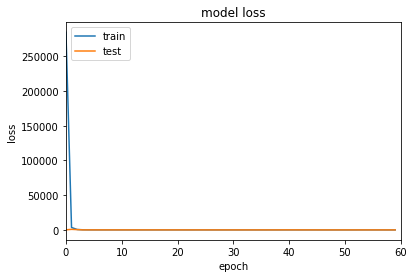

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 276426.0625 - root_mean_squared_error: 525.7598 - val_loss: 342.1838 - val_root_mean_squared_error: 18.3470
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 351.0233 - root_mean_squared_error: 18.5200 - val_loss: 144.1639 - val_root_mean_squared_error: 11.5217
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 163.6189 - root_mean_squared_error: 12.2655 - val_loss: 146.6057 - val_root_mean_squared_error: 11.4524
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 124.4019 - root_mean_squared_error: 10.3849 - val_loss: 77.6676 - val_root_mean_squared_error: 7.7259
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 86.1998 - root_mean_squared_error: 8.2206 - val_loss: 71.0949 - val_root_mean_squared_error: 7.1873
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 86.0185 - root_mean_squared_error: 8.1370 - val_loss: 80

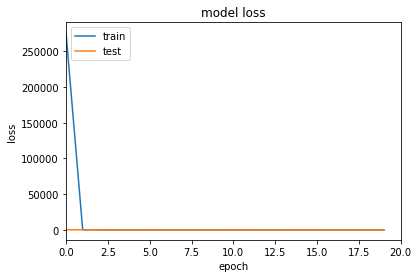

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 74.1920 - root_mean_squared_error: 7.3344 - val_loss: 65.6177 - val_root_mean_squared_error: 6.7283
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 74.8946 - root_mean_squared_error: 7.3866 - val_loss: 68.8518 - val_root_mean_squared_error: 6.9675
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 74.7781 - root_mean_squared_error: 7.3824 - val_loss: 64.8947 - val_root_mean_squared_error: 6.6832
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 73.5768 - root_mean_squared_error: 7.3049 - val_loss: 65.0808 - val_root_mean_squared_error: 6.6998
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 71.9590 - root_mean_squared_error: 7.1969 - val_loss: 63.6390 - val_root_mean_squared_error: 6.5971
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 71.1544 - root_mean_squared_error: 7.1450 - val_loss: 62.1068 - val_r

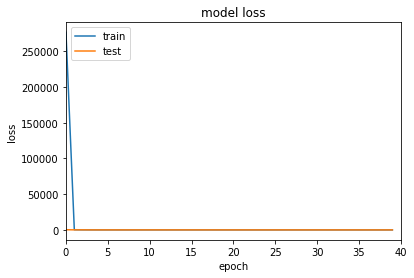

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 68.9928 - root_mean_squared_error: 7.0449 - val_loss: 60.2637 - val_root_mean_squared_error: 6.3986
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 61.5922 - root_mean_squared_error: 6.5022 - val_loss: 60.2952 - val_root_mean_squared_error: 6.4031
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 57.3309 - root_mean_squared_error: 6.1691 - val_loss: 48.9774 - val_root_mean_squared_error: 5.4538
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 56.8309 - root_mean_squared_error: 6.1323 - val_loss: 45.7152 - val_root_mean_squared_error: 5.1480
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 59.4399 - root_mean_squared_error: 6.3445 - val_loss: 46.1735 - val_root_mean_squared_error: 5.1984
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 56.3178 - root_mean_squared_error: 6.0973 - val_loss: 47.1038 - val_roo

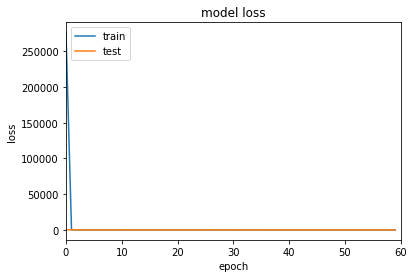

Epoch 1/20
6/6 [==============================] - 1s 35ms/step - loss: 841913.4375 - root_mean_squared_error: 917.5577 - val_loss: 264.4457 - val_root_mean_squared_error: 16.2000
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 3146.0144 - root_mean_squared_error: 56.0660 - val_loss: 1324.4812 - val_root_mean_squared_error: 36.3467
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 1350.4780 - root_mean_squared_error: 36.6972 - val_loss: 911.3589 - val_root_mean_squared_error: 30.1178
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 507.4836 - root_mean_squared_error: 22.4269 - val_loss: 235.9046 - val_root_mean_squared_error: 15.2022
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 190.4785 - root_mean_squared_error: 13.6211 - val_loss: 270.4480 - val_root_mean_squared_error: 16.2894
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 149.1811 - root_mean_squared_error: 11.9996 - val_

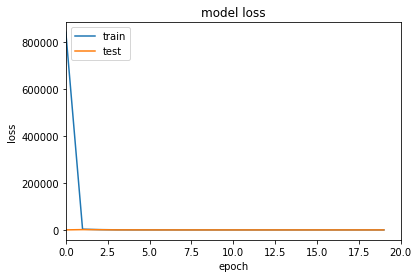

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 63.3935 - root_mean_squared_error: 7.6181 - val_loss: 54.0743 - val_root_mean_squared_error: 6.9810
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 63.9571 - root_mean_squared_error: 7.6557 - val_loss: 53.5499 - val_root_mean_squared_error: 6.9443
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 62.3019 - root_mean_squared_error: 7.5476 - val_loss: 53.8095 - val_root_mean_squared_error: 6.9636
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 62.2292 - root_mean_squared_error: 7.5435 - val_loss: 53.6932 - val_root_mean_squared_error: 6.9561
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 61.9392 - root_mean_squared_error: 7.5249 - val_loss: 52.9673 - val_root_mean_squared_error: 6.9044
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 62.4124 - root_mean_squared_error: 7.5570 - val_loss: 54.4366 - val_r

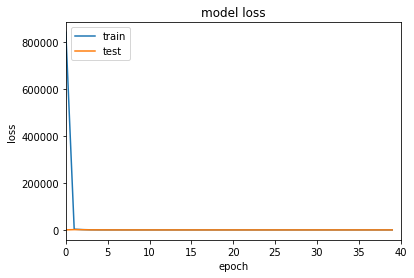

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 60.9205 - root_mean_squared_error: 7.4678 - val_loss: 49.6432 - val_root_mean_squared_error: 6.6714
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 59.0200 - root_mean_squared_error: 7.3401 - val_loss: 48.9028 - val_root_mean_squared_error: 6.6166
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 57.3566 - root_mean_squared_error: 7.2266 - val_loss: 51.5102 - val_root_mean_squared_error: 6.8113
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 57.0004 - root_mean_squared_error: 7.2026 - val_loss: 48.2578 - val_root_mean_squared_error: 6.5691
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 58.4970 - root_mean_squared_error: 7.3064 - val_loss: 48.4596 - val_root_mean_squared_error: 6.5850
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 56.9008 - root_mean_squared_error: 7.1970 - val_loss: 50.7965 - val_

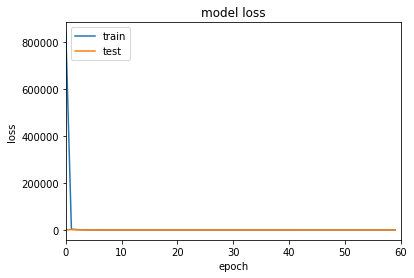

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 472118.7188 - root_mean_squared_error: 687.1082 - val_loss: 2257.7939 - val_root_mean_squared_error: 47.4985
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1604.3179 - root_mean_squared_error: 40.0276 - val_loss: 72.5217 - val_root_mean_squared_error: 8.3610
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 153.2647 - root_mean_squared_error: 12.2642 - val_loss: 186.4593 - val_root_mean_squared_error: 13.5398
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 140.2809 - root_mean_squared_error: 11.7050 - val_loss: 180.6401 - val_root_mean_squared_error: 13.3120
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 98.9992 - root_mean_squared_error: 9.7719 - val_loss: 73.7461 - val_root_mean_squared_error: 8.3757
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 75.4048 - root_mean_squared_error: 8.4714 - val_loss: 55.5

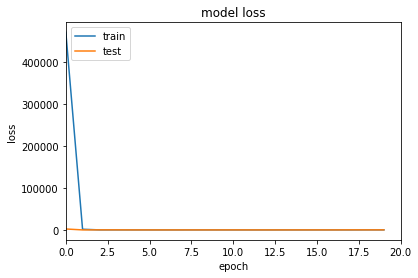

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 126.5554 - root_mean_squared_error: 11.0822 - val_loss: 51.5659 - val_root_mean_squared_error: 6.9164
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 60.9783 - root_mean_squared_error: 7.5659 - val_loss: 65.2454 - val_root_mean_squared_error: 7.8435
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 61.6534 - root_mean_squared_error: 7.6107 - val_loss: 51.7299 - val_root_mean_squared_error: 6.9287
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 69.5932 - root_mean_squared_error: 8.1158 - val_loss: 63.7211 - val_root_mean_squared_error: 7.7462
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 75.1734 - root_mean_squared_error: 8.4528 - val_loss: 63.1929 - val_root_mean_squared_error: 7.7124
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 66.5317 - root_mean_squared_error: 7.9255 - val_loss: 51.5518 - val

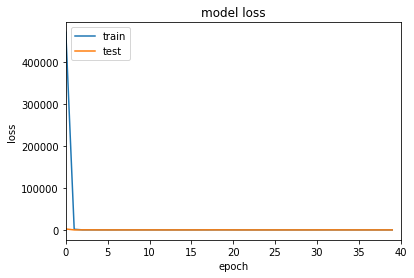

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 60.7766 - root_mean_squared_error: 7.5570 - val_loss: 58.0445 - val_root_mean_squared_error: 7.3746
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 60.6661 - root_mean_squared_error: 7.5498 - val_loss: 56.9672 - val_root_mean_squared_error: 7.3013
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 62.0627 - root_mean_squared_error: 7.6419 - val_loss: 59.8939 - val_root_mean_squared_error: 7.4993
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 66.2760 - root_mean_squared_error: 7.9130 - val_loss: 71.0276 - val_root_mean_squared_error: 8.2083
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 68.2119 - root_mean_squared_error: 8.0346 - val_loss: 56.9626 - val_root_mean_squared_error: 7.3017
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 63.5325 - root_mean_squared_error: 7.7381 - val_loss: 49.8049 - val_

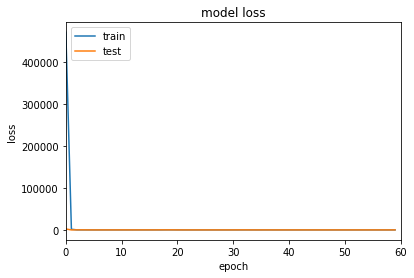

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 1128240.5000 - root_mean_squared_error: 1062.1862 - val_loss: 6697.6113 - val_root_mean_squared_error: 81.8288
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 1626.6396 - root_mean_squared_error: 40.3055 - val_loss: 115.4979 - val_root_mean_squared_error: 10.6242
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 163.7464 - root_mean_squared_error: 12.6839 - val_loss: 68.0042 - val_root_mean_squared_error: 8.0532
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 85.8658 - root_mean_squared_error: 9.0872 - val_loss: 58.9033 - val_root_mean_squared_error: 7.4470
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 67.7818 - root_mean_squared_error: 8.0162 - val_loss: 51.6843 - val_root_mean_squared_error: 6.9334
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 91.8253 - root_mean_squared_error: 9.3898 - val_loss: 51

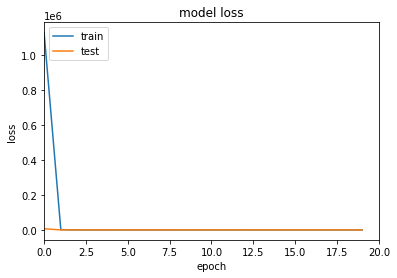

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 64.3856 - root_mean_squared_error: 7.7839 - val_loss: 51.1984 - val_root_mean_squared_error: 6.8853
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 63.1790 - root_mean_squared_error: 7.7061 - val_loss: 56.4283 - val_root_mean_squared_error: 7.2552
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 74.2358 - root_mean_squared_error: 8.3931 - val_loss: 58.4269 - val_root_mean_squared_error: 7.3919
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 68.4345 - root_mean_squared_error: 8.0402 - val_loss: 72.9826 - val_root_mean_squared_error: 8.3185
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 75.8941 - root_mean_squared_error: 8.4915 - val_loss: 77.7306 - val_root_mean_squared_error: 8.5993
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 75.6183 - root_mean_squared_error: 8.4755 - val_loss: 50.8860 - val_

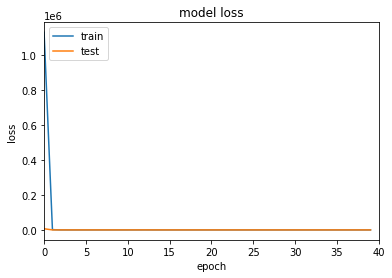

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 72.5009 - root_mean_squared_error: 8.2913 - val_loss: 69.9703 - val_root_mean_squared_error: 8.1375
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 75.3828 - root_mean_squared_error: 8.4634 - val_loss: 50.2279 - val_root_mean_squared_error: 6.8174
Epoch 43/60
6/6 [==============================] - 0s 15ms/step - loss: 77.9027 - root_mean_squared_error: 8.6110 - val_loss: 51.1414 - val_root_mean_squared_error: 6.8843
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 67.2475 - root_mean_squared_error: 7.9685 - val_loss: 86.7845 - val_root_mean_squared_error: 9.1125
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 68.2780 - root_mean_squared_error: 8.0330 - val_loss: 47.7284 - val_root_mean_squared_error: 6.6321
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 60.1727 - root_mean_squared_error: 7.5117 - val_loss: 69.7168 - val_

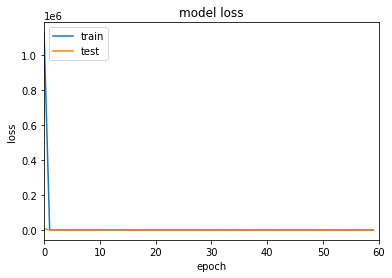

Epoch 1/20
6/6 [==============================] - 1s 34ms/step - loss: 451926.6875 - root_mean_squared_error: 672.2534 - val_loss: 6444.2310 - val_root_mean_squared_error: 80.2463
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 1650.5829 - root_mean_squared_error: 40.5412 - val_loss: 526.9183 - val_root_mean_squared_error: 22.7313
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 256.3018 - root_mean_squared_error: 15.6342 - val_loss: 203.1922 - val_root_mean_squared_error: 13.7499
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 131.4612 - root_mean_squared_error: 10.7826 - val_loss: 165.1461 - val_root_mean_squared_error: 12.1879
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 146.3816 - root_mean_squared_error: 11.3641 - val_loss: 71.4954 - val_root_mean_squared_error: 7.3096
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 94.7724 - root_mean_squared_error: 8.7376 - val_loss

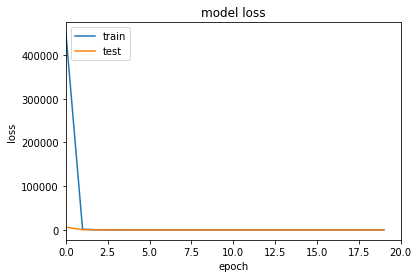

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 75.0449 - root_mean_squared_error: 7.4932 - val_loss: 63.6990 - val_root_mean_squared_error: 6.6966
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 74.8924 - root_mean_squared_error: 7.4877 - val_loss: 65.6405 - val_root_mean_squared_error: 6.8450
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 74.0198 - root_mean_squared_error: 7.4337 - val_loss: 62.4042 - val_root_mean_squared_error: 6.6095
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 73.0832 - root_mean_squared_error: 7.3749 - val_loss: 65.9306 - val_root_mean_squared_error: 6.8758
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 72.9821 - root_mean_squared_error: 7.3725 - val_loss: 60.6569 - val_root_mean_squared_error: 6.4860
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 70.3767 - root_mean_squared_error: 7.1981 - val_loss: 65.0685 - val_

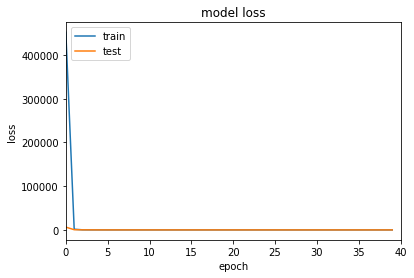

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 57.1981 - root_mean_squared_error: 6.2839 - val_loss: 71.5338 - val_root_mean_squared_error: 7.3386
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 56.6734 - root_mean_squared_error: 6.2462 - val_loss: 53.7596 - val_root_mean_squared_error: 6.0110
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 52.6275 - root_mean_squared_error: 5.9178 - val_loss: 41.8725 - val_root_mean_squared_error: 4.9291
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 48.8658 - root_mean_squared_error: 5.5955 - val_loss: 45.2185 - val_root_mean_squared_error: 5.2624
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 48.7383 - root_mean_squared_error: 5.5886 - val_loss: 39.3439 - val_root_mean_squared_error: 4.6763
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 48.0937 - root_mean_squared_error: 5.5351 - val_loss: 41.8455 - val_

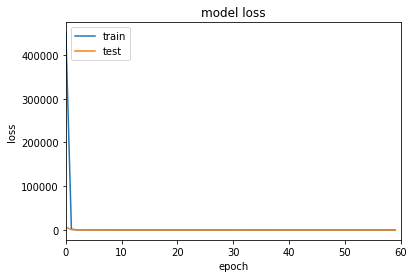

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 569446.2500 - root_mean_squared_error: 754.6164 - val_loss: 597.7236 - val_root_mean_squared_error: 24.4359
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 1153.5443 - root_mean_squared_error: 33.9511 - val_loss: 679.6390 - val_root_mean_squared_error: 26.0464
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 484.4027 - root_mean_squared_error: 21.9771 - val_loss: 224.2606 - val_root_mean_squared_error: 14.9201
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 206.6293 - root_mean_squared_error: 14.3129 - val_loss: 108.4560 - val_root_mean_squared_error: 10.3214
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 90.4589 - root_mean_squared_error: 9.4055 - val_loss: 136.3663 - val_root_mean_squared_error: 11.5880
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 89.5905 - root_mean_squared_error: 9.3523 - val_loss

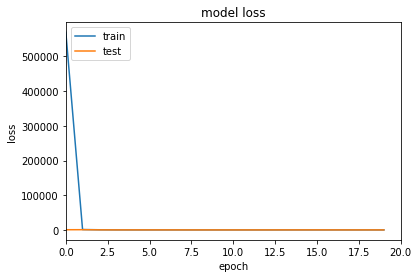

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 78.4595 - root_mean_squared_error: 8.7308 - val_loss: 51.0586 - val_root_mean_squared_error: 6.9878
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 71.1447 - root_mean_squared_error: 8.3016 - val_loss: 51.6711 - val_root_mean_squared_error: 7.0317
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 59.6944 - root_mean_squared_error: 7.5809 - val_loss: 48.7377 - val_root_mean_squared_error: 6.8204
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 57.8128 - root_mean_squared_error: 7.4561 - val_loss: 48.4913 - val_root_mean_squared_error: 6.8025
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 57.8180 - root_mean_squared_error: 7.4567 - val_loss: 54.4101 - val_root_mean_squared_error: 7.2249
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 57.2287 - root_mean_squared_error: 7.4174 - val_loss: 61.6589 - val_r

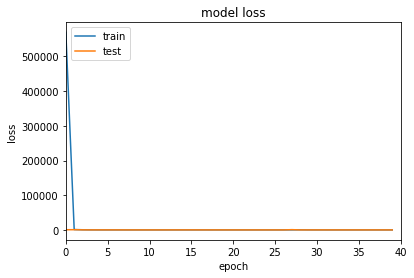

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 58.8285 - root_mean_squared_error: 7.5285 - val_loss: 49.4941 - val_root_mean_squared_error: 6.8809
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 60.6286 - root_mean_squared_error: 7.6474 - val_loss: 52.0607 - val_root_mean_squared_error: 7.0652
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 63.1806 - root_mean_squared_error: 7.8127 - val_loss: 50.9564 - val_root_mean_squared_error: 6.9869
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 61.7117 - root_mean_squared_error: 7.7184 - val_loss: 49.1323 - val_root_mean_squared_error: 6.8553
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 60.7421 - root_mean_squared_error: 7.6555 - val_loss: 49.4289 - val_root_mean_squared_error: 6.8773
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 58.2309 - root_mean_squared_error: 7.4900 - val_loss: 50.7604 - val_ro

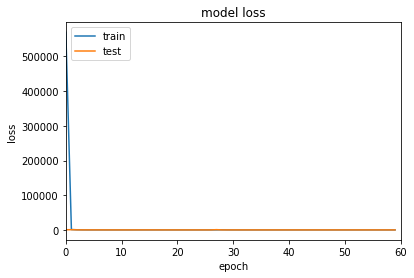

Epoch 1/20
6/6 [==============================] - 1s 35ms/step - loss: 1289204.8750 - root_mean_squared_error: 1135.4314 - val_loss: 6817.6562 - val_root_mean_squared_error: 82.5678
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 4509.4888 - root_mean_squared_error: 67.1507 - val_loss: 237.0790 - val_root_mean_squared_error: 15.3856
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 562.9484 - root_mean_squared_error: 23.7181 - val_loss: 343.0221 - val_root_mean_squared_error: 18.5086
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 208.8389 - root_mean_squared_error: 14.4347 - val_loss: 92.9743 - val_root_mean_squared_error: 9.6160
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 118.5935 - root_mean_squared_error: 10.8660 - val_loss: 130.3026 - val_root_mean_squared_error: 11.3913
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 124.4261 - root_mean_squared_error: 11.1300 - val

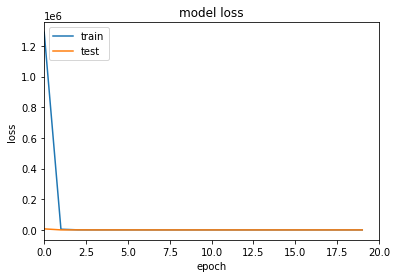

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 63.1673 - root_mean_squared_error: 7.9112 - val_loss: 59.0675 - val_root_mean_squared_error: 7.6478
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 62.0161 - root_mean_squared_error: 7.8381 - val_loss: 48.4882 - val_root_mean_squared_error: 6.9217
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 60.4178 - root_mean_squared_error: 7.7355 - val_loss: 55.0189 - val_root_mean_squared_error: 7.3784
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 61.0294 - root_mean_squared_error: 7.7750 - val_loss: 49.1750 - val_root_mean_squared_error: 6.9712
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 63.2378 - root_mean_squared_error: 7.9158 - val_loss: 49.0963 - val_root_mean_squared_error: 6.9656
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 55.5164 - root_mean_squared_error: 7.4120 - val_loss: 66.2855 - val_

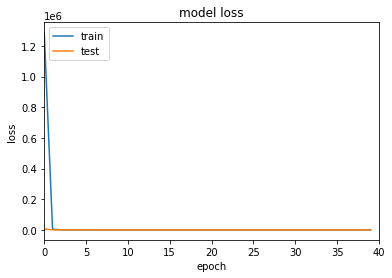

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 56.8866 - root_mean_squared_error: 7.5043 - val_loss: 46.7947 - val_root_mean_squared_error: 6.7988
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 54.8474 - root_mean_squared_error: 7.3672 - val_loss: 45.3554 - val_root_mean_squared_error: 6.6922
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 54.3960 - root_mean_squared_error: 7.3365 - val_loss: 56.4882 - val_root_mean_squared_error: 7.4779
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 56.2242 - root_mean_squared_error: 7.4601 - val_loss: 46.4369 - val_root_mean_squared_error: 6.7726
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 54.2635 - root_mean_squared_error: 7.3276 - val_loss: 61.2788 - val_root_mean_squared_error: 7.7917
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 55.9222 - root_mean_squared_error: 7.4399 - val_loss: 44.7712 - val_

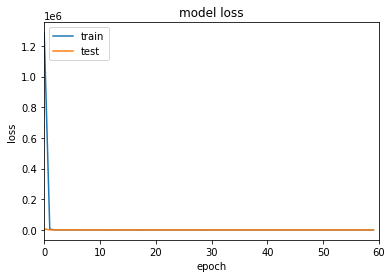

Epoch 1/20
6/6 [==============================] - 1s 67ms/step - loss: 995147.0625 - root_mean_squared_error: 997.5706 - val_loss: 61.6336 - val_root_mean_squared_error: 7.8397
Epoch 2/20
6/6 [==============================] - 0s 16ms/step - loss: 6269.8438 - root_mean_squared_error: 79.1810 - val_loss: 438.2411 - val_root_mean_squared_error: 20.9278
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 318.0507 - root_mean_squared_error: 17.8257 - val_loss: 52.7483 - val_root_mean_squared_error: 7.2403
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 79.2865 - root_mean_squared_error: 8.8851 - val_loss: 50.9983 - val_root_mean_squared_error: 7.1161
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 72.7075 - root_mean_squared_error: 8.5052 - val_loss: 48.0026 - val_root_mean_squared_error: 6.9010
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 62.2641 - root_mean_squared_error: 7.8664 - val_loss: 90.2819 

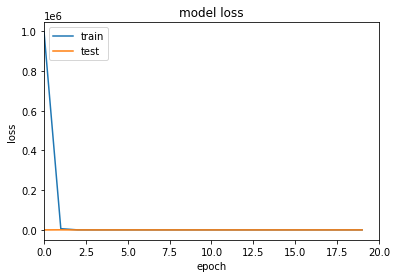

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 71.3374 - root_mean_squared_error: 8.4222 - val_loss: 176.9418 - val_root_mean_squared_error: 13.2868
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 124.6820 - root_mean_squared_error: 11.1480 - val_loss: 79.1644 - val_root_mean_squared_error: 8.8748
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 79.2378 - root_mean_squared_error: 8.8789 - val_loss: 48.3318 - val_root_mean_squared_error: 6.9231
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 83.2571 - root_mean_squared_error: 9.1024 - val_loss: 106.7473 - val_root_mean_squared_error: 10.3124
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 107.6330 - root_mean_squared_error: 10.3552 - val_loss: 62.5495 - val_root_mean_squared_error: 7.8833
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 77.3446 - root_mean_squared_error: 8.7716 - val_loss: 47.0995

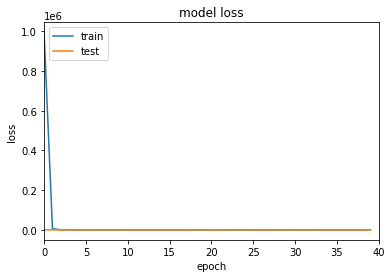

Epoch 41/60
6/6 [==============================] - 0s 15ms/step - loss: 48.6519 - root_mean_squared_error: 6.9462 - val_loss: 67.7629 - val_root_mean_squared_error: 8.2074
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 50.7850 - root_mean_squared_error: 7.0981 - val_loss: 58.9227 - val_root_mean_squared_error: 7.6499
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 47.3778 - root_mean_squared_error: 6.8539 - val_loss: 41.0234 - val_root_mean_squared_error: 6.3735
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 42.2447 - root_mean_squared_error: 6.4686 - val_loss: 33.5072 - val_root_mean_squared_error: 5.7537
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 40.9584 - root_mean_squared_error: 6.3684 - val_loss: 31.2424 - val_root_mean_squared_error: 5.5534
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 41.2956 - root_mean_squared_error: 6.3948 - val_loss: 31.7806 - val_

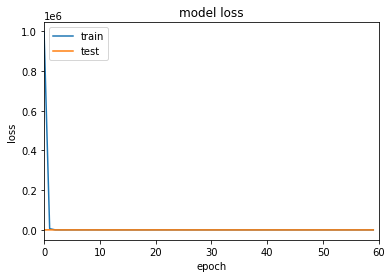

Epoch 1/20
6/6 [==============================] - 1s 36ms/step - loss: 1085813.8750 - root_mean_squared_error: 1042.0229 - val_loss: 2792.8037 - val_root_mean_squared_error: 52.8012
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 4681.5063 - root_mean_squared_error: 68.3698 - val_loss: 2747.3896 - val_root_mean_squared_error: 52.3170
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1336.0806 - root_mean_squared_error: 36.3881 - val_loss: 1441.7152 - val_root_mean_squared_error: 37.7818
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 598.5309 - root_mean_squared_error: 24.1499 - val_loss: 821.2009 - val_root_mean_squared_error: 28.3635
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 403.0613 - root_mean_squared_error: 19.6396 - val_loss: 576.2877 - val_root_mean_squared_error: 23.6248
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 301.9132 - root_mean_squared_error: 16.8346 -

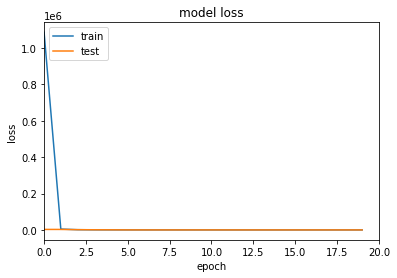

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 75.7440 - root_mean_squared_error: 7.5624 - val_loss: 67.4206 - val_root_mean_squared_error: 6.9946
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 74.1153 - root_mean_squared_error: 7.4602 - val_loss: 72.3449 - val_root_mean_squared_error: 7.3444
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.8294 - root_mean_squared_error: 7.6459 - val_loss: 77.4927 - val_root_mean_squared_error: 7.6928
Epoch 24/40
6/6 [==============================] - 0s 15ms/step - loss: 79.7394 - root_mean_squared_error: 7.8397 - val_loss: 84.5443 - val_root_mean_squared_error: 8.1437
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 89.3883 - root_mean_squared_error: 8.4379 - val_loss: 84.0561 - val_root_mean_squared_error: 8.1190
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 81.4627 - root_mean_squared_error: 7.9598 - val_loss: 72.2269 - val_ro

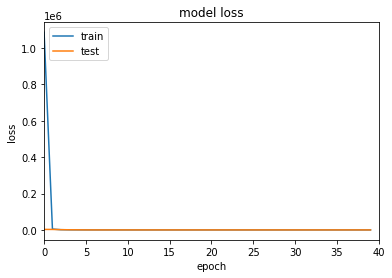

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 69.1882 - root_mean_squared_error: 7.2291 - val_loss: 60.1327 - val_root_mean_squared_error: 6.5764
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 68.8211 - root_mean_squared_error: 7.2087 - val_loss: 102.9500 - val_root_mean_squared_error: 9.2810
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 99.9408 - root_mean_squared_error: 9.1190 - val_loss: 100.6194 - val_root_mean_squared_error: 9.1585
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 101.6146 - root_mean_squared_error: 9.2142 - val_loss: 89.2915 - val_root_mean_squared_error: 8.5218
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 99.4597 - root_mean_squared_error: 9.1003 - val_loss: 62.6614 - val_root_mean_squared_error: 6.7868
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 88.7868 - root_mean_squared_error: 8.4978 - val_loss: 87.1056 - val_

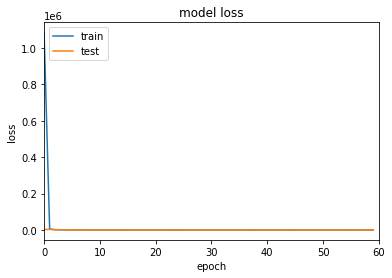

Epoch 1/20
6/6 [==============================] - 1s 130ms/step - loss: 350397.4688 - root_mean_squared_error: 591.9437 - val_loss: 10915.5693 - val_root_mean_squared_error: 104.4754
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 2898.0469 - root_mean_squared_error: 53.8272 - val_loss: 725.2930 - val_root_mean_squared_error: 26.9127
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 741.7878 - root_mean_squared_error: 27.2144 - val_loss: 468.0044 - val_root_mean_squared_error: 21.6012
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 320.5774 - root_mean_squared_error: 17.8627 - val_loss: 387.0200 - val_root_mean_squared_error: 19.6310
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 202.6672 - root_mean_squared_error: 14.1759 - val_loss: 69.4140 - val_root_mean_squared_error: 8.2229
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 113.7216 - root_mean_squared_error: 10.5775 - va

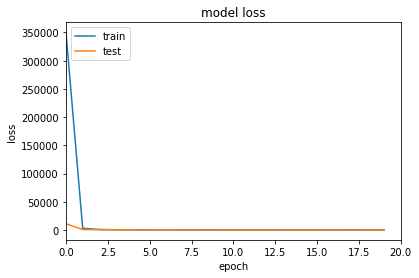

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 59.3105 - root_mean_squared_error: 7.5721 - val_loss: 57.8960 - val_root_mean_squared_error: 7.4782
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 57.9371 - root_mean_squared_error: 7.4810 - val_loss: 49.8750 - val_root_mean_squared_error: 6.9214
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 59.1978 - root_mean_squared_error: 7.5650 - val_loss: 43.7909 - val_root_mean_squared_error: 6.4671
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 56.2764 - root_mean_squared_error: 7.3695 - val_loss: 43.7621 - val_root_mean_squared_error: 6.4651
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 56.7979 - root_mean_squared_error: 7.4050 - val_loss: 42.9381 - val_root_mean_squared_error: 6.4012
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 54.3658 - root_mean_squared_error: 7.2390 - val_loss: 44.2245 - val_r

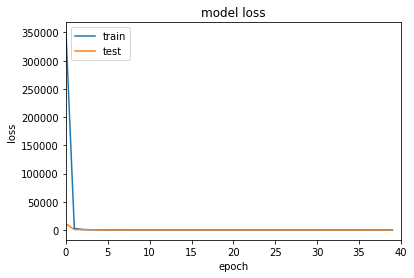

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 39.5457 - root_mean_squared_error: 6.1329 - val_loss: 31.8109 - val_root_mean_squared_error: 5.4662
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 41.0125 - root_mean_squared_error: 6.2515 - val_loss: 29.5099 - val_root_mean_squared_error: 5.2517
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 37.4038 - root_mean_squared_error: 5.9561 - val_loss: 37.9526 - val_root_mean_squared_error: 6.0021
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 38.6796 - root_mean_squared_error: 6.0624 - val_loss: 46.1864 - val_root_mean_squared_error: 6.6528
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 40.4484 - root_mean_squared_error: 6.2067 - val_loss: 33.8488 - val_root_mean_squared_error: 5.6502
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 36.7470 - root_mean_squared_error: 5.9011 - val_loss: 30.6972 - val_root

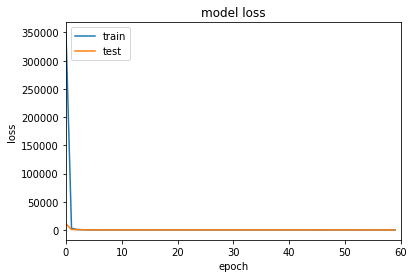

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 959460.2500 - root_mean_squared_error: 979.5204 - val_loss: 6196.1030 - val_root_mean_squared_error: 78.7150
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 2688.0281 - root_mean_squared_error: 51.8454 - val_loss: 61.5016 - val_root_mean_squared_error: 7.8349
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 619.5601 - root_mean_squared_error: 24.8883 - val_loss: 47.6221 - val_root_mean_squared_error: 6.8895
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 286.6362 - root_mean_squared_error: 16.9254 - val_loss: 176.8970 - val_root_mean_squared_error: 13.2934
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 149.2470 - root_mean_squared_error: 12.2089 - val_loss: 56.5987 - val_root_mean_squared_error: 7.5100
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 85.7743 - root_mean_squared_error: 9.2505 - val_loss: 

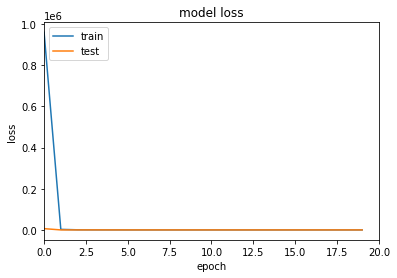

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 58.4710 - root_mean_squared_error: 7.6322 - val_loss: 49.1656 - val_root_mean_squared_error: 6.9961
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 57.6724 - root_mean_squared_error: 7.5797 - val_loss: 49.2842 - val_root_mean_squared_error: 7.0045
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 57.3419 - root_mean_squared_error: 7.5579 - val_loss: 48.3768 - val_root_mean_squared_error: 6.9395
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 57.4133 - root_mean_squared_error: 7.5626 - val_loss: 50.6941 - val_root_mean_squared_error: 7.1045
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 58.4764 - root_mean_squared_error: 7.6326 - val_loss: 48.5494 - val_root_mean_squared_error: 6.9519
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 61.1228 - root_mean_squared_error: 7.8040 - val_loss: 52.7252 - val_ro

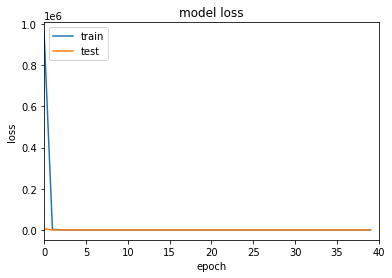

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 57.6896 - root_mean_squared_error: 7.5809 - val_loss: 47.7803 - val_root_mean_squared_error: 6.8964
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 57.8481 - root_mean_squared_error: 7.5914 - val_loss: 51.4642 - val_root_mean_squared_error: 7.1585
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 57.9869 - root_mean_squared_error: 7.6005 - val_loss: 48.3615 - val_root_mean_squared_error: 6.9385
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 58.7335 - root_mean_squared_error: 7.6495 - val_loss: 50.2852 - val_root_mean_squared_error: 7.0757
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 56.3417 - root_mean_squared_error: 7.4915 - val_loss: 47.7267 - val_root_mean_squared_error: 6.8926
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 60.1285 - root_mean_squared_error: 7.7401 - val_loss: 48.8644 - val_root

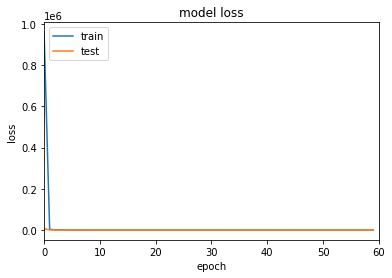

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 401935.8125 - root_mean_squared_error: 633.9840 - val_loss: 6864.0947 - val_root_mean_squared_error: 82.8497
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 1511.5817 - root_mean_squared_error: 38.8787 - val_loss: 55.4503 - val_root_mean_squared_error: 7.4442
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 71.3108 - root_mean_squared_error: 8.4424 - val_loss: 58.1528 - val_root_mean_squared_error: 7.6230
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 66.5149 - root_mean_squared_error: 8.1529 - val_loss: 50.0329 - val_root_mean_squared_error: 7.0700
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 63.1527 - root_mean_squared_error: 7.9437 - val_loss: 55.7494 - val_root_mean_squared_error: 7.4631
Epoch 6/20
6/6 [==============================] - 0s 13ms/step - loss: 59.3062 - root_mean_squared_error: 7.6977 - val_loss: 52.6357 - 

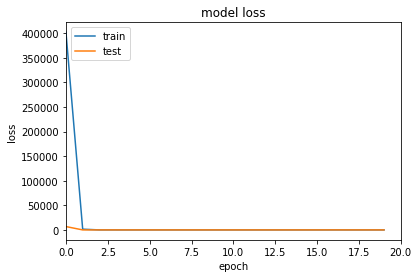

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 59.0286 - root_mean_squared_error: 7.6794 - val_loss: 49.5332 - val_root_mean_squared_error: 7.0340
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 58.5110 - root_mean_squared_error: 7.6456 - val_loss: 46.4778 - val_root_mean_squared_error: 6.8134
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 56.5611 - root_mean_squared_error: 7.5170 - val_loss: 48.1124 - val_root_mean_squared_error: 6.9323
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 55.7539 - root_mean_squared_error: 7.4631 - val_loss: 51.6628 - val_root_mean_squared_error: 7.1838
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 58.2577 - root_mean_squared_error: 7.6290 - val_loss: 51.8999 - val_root_mean_squared_error: 7.2003
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 60.4855 - root_mean_squared_error: 7.7737 - val_loss: 50.6811 - val_roo

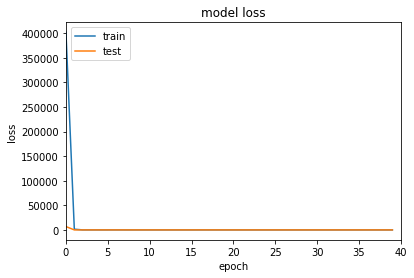

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 51.0734 - root_mean_squared_error: 7.1427 - val_loss: 40.7782 - val_root_mean_squared_error: 6.3814
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 55.9799 - root_mean_squared_error: 7.4782 - val_loss: 46.9646 - val_root_mean_squared_error: 6.8490
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 54.1882 - root_mean_squared_error: 7.3575 - val_loss: 42.6739 - val_root_mean_squared_error: 6.5283
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 51.0597 - root_mean_squared_error: 7.1417 - val_loss: 43.7032 - val_root_mean_squared_error: 6.6066
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 49.0934 - root_mean_squared_error: 7.0027 - val_loss: 43.7048 - val_root_mean_squared_error: 6.6068
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 49.5232 - root_mean_squared_error: 7.0333 - val_loss: 45.6937 - val_

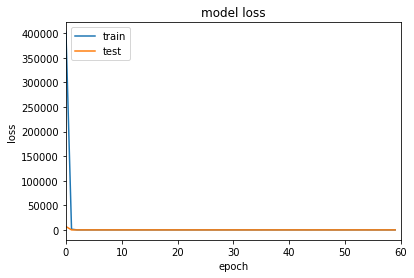

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 203.1906 - root_mean_squared_error: 13.6942 - val_loss: 105.2978 - val_root_mean_squared_error: 8.9426
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 130.0642 - root_mean_squared_error: 10.0691 - val_loss: 109.7971 - val_root_mean_squared_error: 8.7988
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 112.8119 - root_mean_squared_error: 8.8995 - val_loss: 104.6855 - val_root_mean_squared_error: 8.3751
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 116.7531 - root_mean_squared_error: 9.0807 - val_loss: 99.0878 - val_root_mean_squared_error: 8.1100
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 112.5424 - root_mean_squared_error: 8.9356 - val_loss: 100.7680 - val_root_mean_squared_error: 8.3250
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 109.8121 - root_mean_squared_error: 8.9076 - val_loss: 93.9348 -

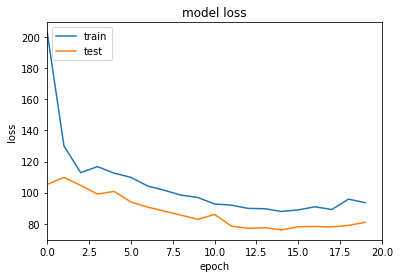

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 93.1983 - root_mean_squared_error: 8.8036 - val_loss: 87.9193 - val_root_mean_squared_error: 8.5104
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 96.0647 - root_mean_squared_error: 8.9875 - val_loss: 80.4281 - val_root_mean_squared_error: 8.1102
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 93.6287 - root_mean_squared_error: 8.9156 - val_loss: 88.8337 - val_root_mean_squared_error: 8.6192
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 94.5403 - root_mean_squared_error: 8.9028 - val_loss: 86.6100 - val_root_mean_squared_error: 8.4054
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 101.2747 - root_mean_squared_error: 9.2207 - val_loss: 82.5246 - val_root_mean_squared_error: 8.1042
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 100.8295 - root_mean_squared_error: 9.1361 - val_loss: 83.3540 - val

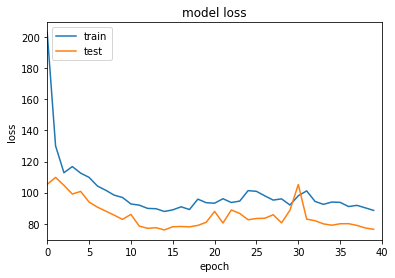

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 88.3272 - root_mean_squared_error: 8.7964 - val_loss: 77.8103 - val_root_mean_squared_error: 8.1750
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 90.2121 - root_mean_squared_error: 8.9101 - val_loss: 75.9736 - val_root_mean_squared_error: 8.0847
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 88.1847 - root_mean_squared_error: 8.8012 - val_loss: 76.1669 - val_root_mean_squared_error: 8.0867
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 89.7754 - root_mean_squared_error: 8.8932 - val_loss: 76.2831 - val_root_mean_squared_error: 8.1056
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 90.5452 - root_mean_squared_error: 8.9441 - val_loss: 75.5589 - val_root_mean_squared_error: 8.0778
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 87.3078 - root_mean_squared_error: 8.8102 - val_loss: 73.9382 - val_roo

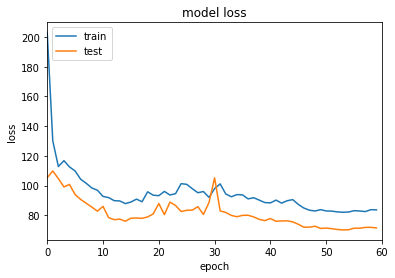

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 160.1961 - root_mean_squared_error: 12.1260 - val_loss: 135.1131 - val_root_mean_squared_error: 10.7446
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 131.3319 - root_mean_squared_error: 10.4645 - val_loss: 89.0526 - val_root_mean_squared_error: 8.0823
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 110.9132 - root_mean_squared_error: 9.3098 - val_loss: 101.3305 - val_root_mean_squared_error: 8.7663
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 105.0675 - root_mean_squared_error: 8.9863 - val_loss: 93.2621 - val_root_mean_squared_error: 8.3410
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 102.5505 - root_mean_squared_error: 8.9004 - val_loss: 89.1774 - val_root_mean_squared_error: 8.1619
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 99.2406 - root_mean_squared_error: 8.7892 - val_loss: 86.2830 - val_

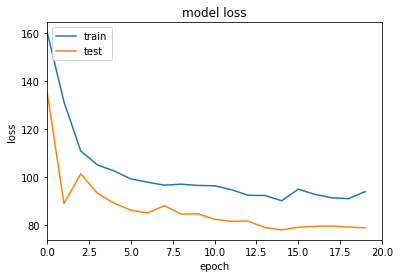

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 94.6410 - root_mean_squared_error: 9.0173 - val_loss: 82.9719 - val_root_mean_squared_error: 8.3075
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 93.1823 - root_mean_squared_error: 8.8835 - val_loss: 79.7854 - val_root_mean_squared_error: 8.0796
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 91.0724 - root_mean_squared_error: 8.7471 - val_loss: 83.9981 - val_root_mean_squared_error: 8.3336
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 93.3650 - root_mean_squared_error: 8.8861 - val_loss: 79.7313 - val_root_mean_squared_error: 8.1099
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 90.4339 - root_mean_squared_error: 8.7570 - val_loss: 78.7790 - val_root_mean_squared_error: 8.0873
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 90.9114 - root_mean_squared_error: 8.8181 - val_loss: 80.1483 - val_r

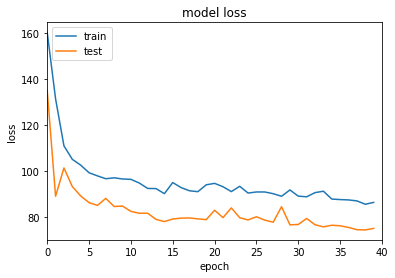

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 89.3493 - root_mean_squared_error: 8.9763 - val_loss: 76.0699 - val_root_mean_squared_error: 8.1845
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 88.0045 - root_mean_squared_error: 8.8928 - val_loss: 74.9899 - val_root_mean_squared_error: 8.1425
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 87.3759 - root_mean_squared_error: 8.8802 - val_loss: 74.1286 - val_root_mean_squared_error: 8.0936
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 85.4148 - root_mean_squared_error: 8.7511 - val_loss: 75.5550 - val_root_mean_squared_error: 8.1615
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 88.2134 - root_mean_squared_error: 8.9022 - val_loss: 79.2809 - val_root_mean_squared_error: 8.3762
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 88.0933 - root_mean_squared_error: 8.8766 - val_loss: 77.6704 - val_ro

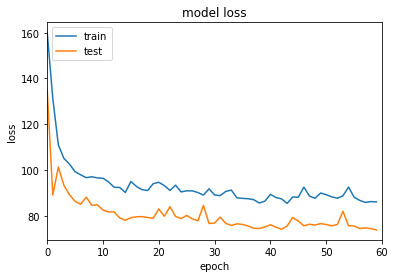

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 199.4634 - root_mean_squared_error: 13.6622 - val_loss: 109.4622 - val_root_mean_squared_error: 9.4490
Epoch 2/20
6/6 [==============================] - 0s 15ms/step - loss: 121.1561 - root_mean_squared_error: 9.9287 - val_loss: 97.9505 - val_root_mean_squared_error: 8.5293
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 99.9422 - root_mean_squared_error: 8.6028 - val_loss: 94.9413 - val_root_mean_squared_error: 8.2714
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 109.1669 - root_mean_squared_error: 9.0920 - val_loss: 93.0767 - val_root_mean_squared_error: 8.1801
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 102.4741 - root_mean_squared_error: 8.7608 - val_loss: 92.3129 - val_root_mean_squared_error: 8.2152
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 102.4166 - root_mean_squared_error: 8.8465 - val_loss: 88.7537 - val_

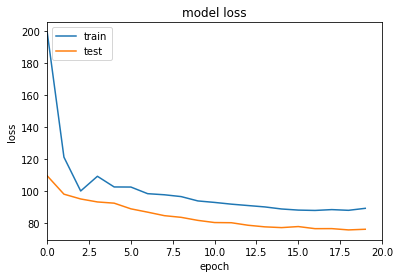

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 87.3117 - root_mean_squared_error: 8.7577 - val_loss: 75.8878 - val_root_mean_squared_error: 8.0828
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 86.7644 - root_mean_squared_error: 8.7512 - val_loss: 76.8775 - val_root_mean_squared_error: 8.2010
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 87.0463 - root_mean_squared_error: 8.8202 - val_loss: 74.1039 - val_root_mean_squared_error: 8.0834
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 85.9152 - root_mean_squared_error: 8.7907 - val_loss: 74.7187 - val_root_mean_squared_error: 8.1353
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 85.0894 - root_mean_squared_error: 8.7555 - val_loss: 76.5105 - val_root_mean_squared_error: 8.2510
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 90.6052 - root_mean_squared_error: 9.0408 - val_loss: 75.3664 - val_

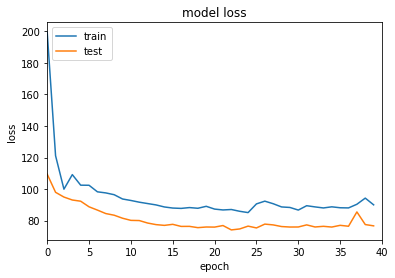

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 88.0289 - root_mean_squared_error: 8.7991 - val_loss: 78.5522 - val_root_mean_squared_error: 8.2435
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 90.1978 - root_mean_squared_error: 8.9127 - val_loss: 80.8894 - val_root_mean_squared_error: 8.3394
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 91.9618 - root_mean_squared_error: 8.9422 - val_loss: 79.8983 - val_root_mean_squared_error: 8.1810
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 94.8389 - root_mean_squared_error: 9.0385 - val_loss: 79.8105 - val_root_mean_squared_error: 8.1376
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 92.9454 - root_mean_squared_error: 8.8998 - val_loss: 79.1615 - val_root_mean_squared_error: 8.0883
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 92.3516 - root_mean_squared_error: 8.8684 - val_loss: 80.1144 - val_r

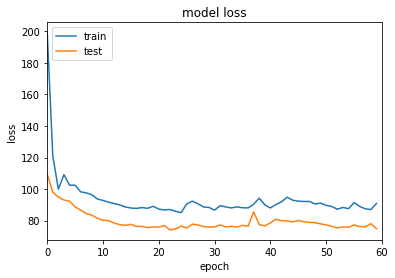

Epoch 1/20
6/6 [==============================] - 1s 98ms/step - loss: 194.7963 - root_mean_squared_error: 13.5140 - val_loss: 108.7709 - val_root_mean_squared_error: 9.5224
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 122.2548 - root_mean_squared_error: 10.1077 - val_loss: 93.3816 - val_root_mean_squared_error: 8.4486
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 97.9258 - root_mean_squared_error: 8.6836 - val_loss: 96.3100 - val_root_mean_squared_error: 8.5732
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 106.9765 - root_mean_squared_error: 9.1722 - val_loss: 87.8773 - val_root_mean_squared_error: 8.0783
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 99.5528 - root_mean_squared_error: 8.7765 - val_loss: 88.7082 - val_root_mean_squared_error: 8.1532
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 98.8108 - root_mean_squared_error: 8.7647 - val_loss: 86.6249 - val_root

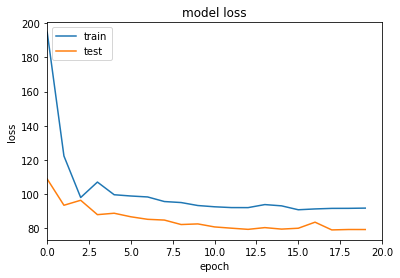

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 92.2070 - root_mean_squared_error: 8.8548 - val_loss: 81.9935 - val_root_mean_squared_error: 8.2370
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 93.7767 - root_mean_squared_error: 8.9125 - val_loss: 79.8014 - val_root_mean_squared_error: 8.0846
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 91.2555 - root_mean_squared_error: 8.7791 - val_loss: 79.7473 - val_root_mean_squared_error: 8.1228
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 92.3232 - root_mean_squared_error: 8.8738 - val_loss: 79.8727 - val_root_mean_squared_error: 8.1559
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 90.4872 - root_mean_squared_error: 8.7780 - val_loss: 78.9847 - val_root_mean_squared_error: 8.0970
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 90.6338 - root_mean_squared_error: 8.7869 - val_loss: 80.9455 - val_ro

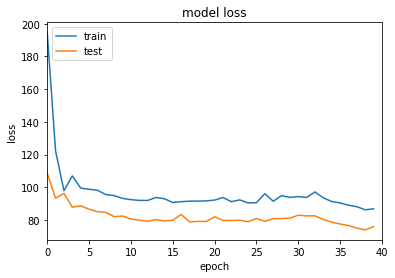

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 86.7431 - root_mean_squared_error: 8.8425 - val_loss: 73.7900 - val_root_mean_squared_error: 8.0785
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 85.0788 - root_mean_squared_error: 8.7657 - val_loss: 74.6282 - val_root_mean_squared_error: 8.1694
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 87.3916 - root_mean_squared_error: 8.9254 - val_loss: 73.2797 - val_root_mean_squared_error: 8.0894
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 85.9475 - root_mean_squared_error: 8.8015 - val_loss: 74.6976 - val_root_mean_squared_error: 8.1031
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 86.7121 - root_mean_squared_error: 8.8040 - val_loss: 75.2650 - val_root_mean_squared_error: 8.1160
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 89.8484 - root_mean_squared_error: 8.9567 - val_loss: 75.5743 - val_roo

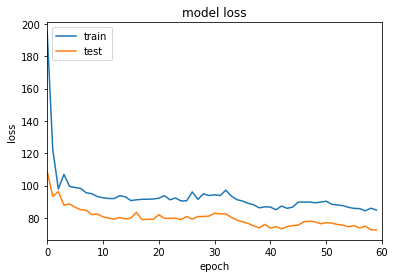

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 153.3407 - root_mean_squared_error: 12.2077 - val_loss: 115.9330 - val_root_mean_squared_error: 10.3504
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 116.4271 - root_mean_squared_error: 10.2780 - val_loss: 78.5419 - val_root_mean_squared_error: 8.0874
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 100.4783 - root_mean_squared_error: 9.3021 - val_loss: 92.7538 - val_root_mean_squared_error: 8.8343
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 98.4756 - root_mean_squared_error: 9.1492 - val_loss: 84.3545 - val_root_mean_squared_error: 8.3524
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 93.5848 - root_mean_squared_error: 8.9029 - val_loss: 79.8067 - val_root_mean_squared_error: 8.1220
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 90.9846 - root_mean_squared_error: 8.8066 - val_loss: 78.7017 - val_r

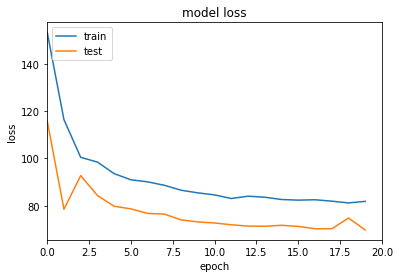

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 81.8675 - root_mean_squared_error: 8.7814 - val_loss: 70.6551 - val_root_mean_squared_error: 8.0840
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 81.9925 - root_mean_squared_error: 8.7543 - val_loss: 71.1302 - val_root_mean_squared_error: 8.1224
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 81.9555 - root_mean_squared_error: 8.7783 - val_loss: 69.9821 - val_root_mean_squared_error: 8.0873
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 81.0877 - root_mean_squared_error: 8.7544 - val_loss: 69.4623 - val_root_mean_squared_error: 8.0798
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 81.2875 - root_mean_squared_error: 8.7907 - val_loss: 69.0748 - val_root_mean_squared_error: 8.0793
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 81.9648 - root_mean_squared_error: 8.8505 - val_loss: 69.9615 - val_

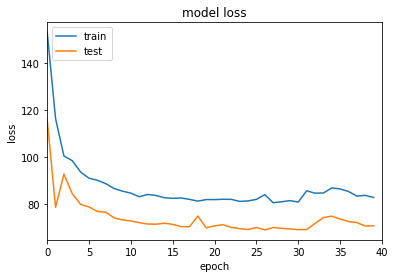

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 84.5222 - root_mean_squared_error: 8.8857 - val_loss: 71.3438 - val_root_mean_squared_error: 8.0846
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 84.5017 - root_mean_squared_error: 8.8500 - val_loss: 71.9041 - val_root_mean_squared_error: 8.0920
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 83.7583 - root_mean_squared_error: 8.7960 - val_loss: 71.5263 - val_root_mean_squared_error: 8.0790
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 84.1588 - root_mean_squared_error: 8.8345 - val_loss: 71.1949 - val_root_mean_squared_error: 8.0826
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 83.9790 - root_mean_squared_error: 8.8500 - val_loss: 70.7163 - val_root_mean_squared_error: 8.0872
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 83.5724 - root_mean_squared_error: 8.8607 - val_loss: 72.1052 - val_roo

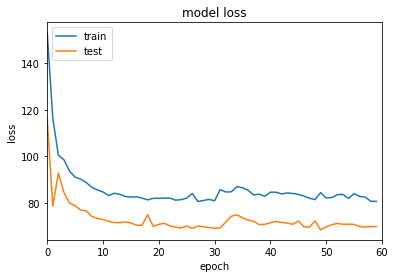

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 186.6660 - root_mean_squared_error: 13.6003 - val_loss: 78.8302 - val_root_mean_squared_error: 8.7090
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 109.1597 - root_mean_squared_error: 10.2787 - val_loss: 96.2399 - val_root_mean_squared_error: 9.5969
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 94.6860 - root_mean_squared_error: 9.5025 - val_loss: 72.9901 - val_root_mean_squared_error: 8.2660
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 89.4664 - root_mean_squared_error: 9.2042 - val_loss: 73.8563 - val_root_mean_squared_error: 8.3088
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 82.8047 - root_mean_squared_error: 8.8307 - val_loss: 72.0530 - val_root_mean_squared_error: 8.2013
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 83.1326 - root_mean_squared_error: 8.8526 - val_loss: 71.5657 - val_roo

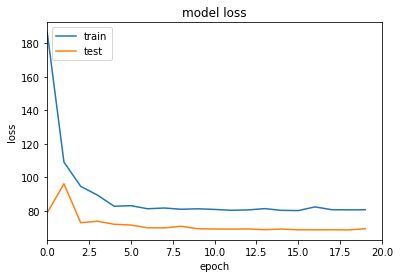

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 80.6066 - root_mean_squared_error: 8.7934 - val_loss: 68.5613 - val_root_mean_squared_error: 8.0819
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 80.3532 - root_mean_squared_error: 8.7825 - val_loss: 69.1890 - val_root_mean_squared_error: 8.1245
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 82.4160 - root_mean_squared_error: 8.9015 - val_loss: 68.5240 - val_root_mean_squared_error: 8.0842
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 79.1556 - root_mean_squared_error: 8.7183 - val_loss: 69.6843 - val_root_mean_squared_error: 8.1608
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 80.5980 - root_mean_squared_error: 8.8062 - val_loss: 68.4851 - val_root_mean_squared_error: 8.0934
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 79.6810 - root_mean_squared_error: 8.7606 - val_loss: 68.4120 - val_

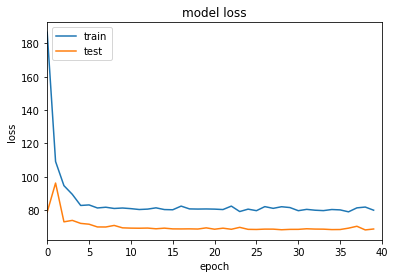

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 79.7518 - root_mean_squared_error: 8.7731 - val_loss: 68.0763 - val_root_mean_squared_error: 8.0802
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 79.8026 - root_mean_squared_error: 8.7766 - val_loss: 68.7278 - val_root_mean_squared_error: 8.1248
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 80.9924 - root_mean_squared_error: 8.8500 - val_loss: 67.8814 - val_root_mean_squared_error: 8.0787
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 79.2533 - root_mean_squared_error: 8.7554 - val_loss: 68.9903 - val_root_mean_squared_error: 8.1513
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 81.1381 - root_mean_squared_error: 8.8678 - val_loss: 67.7517 - val_root_mean_squared_error: 8.0818
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 82.3745 - root_mean_squared_error: 8.9398 - val_loss: 67.8327 - val_r

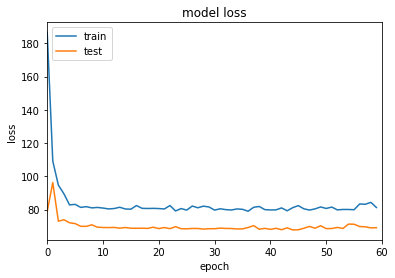

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 182.8083 - root_mean_squared_error: 13.4694 - val_loss: 88.2398 - val_root_mean_squared_error: 9.2730
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 109.6433 - root_mean_squared_error: 10.3471 - val_loss: 83.4727 - val_root_mean_squared_error: 8.9728
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 80.1023 - root_mean_squared_error: 8.7750 - val_loss: 75.7489 - val_root_mean_squared_error: 8.5139
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 89.7085 - root_mean_squared_error: 9.2946 - val_loss: 72.0380 - val_root_mean_squared_error: 8.2863
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 79.4152 - root_mean_squared_error: 8.7191 - val_loss: 72.6086 - val_root_mean_squared_error: 8.3194
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 84.5586 - root_mean_squared_error: 9.0094 - val_loss: 71.4223 - val_root

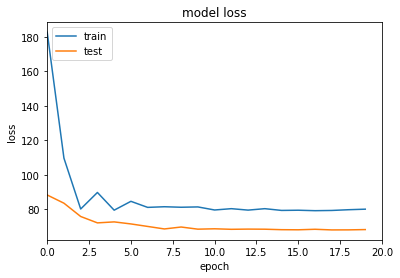

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 78.9157 - root_mean_squared_error: 8.7361 - val_loss: 68.8294 - val_root_mean_squared_error: 8.1410
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 79.8572 - root_mean_squared_error: 8.7931 - val_loss: 67.8370 - val_root_mean_squared_error: 8.0814
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 79.3209 - root_mean_squared_error: 8.7636 - val_loss: 67.7726 - val_root_mean_squared_error: 8.0792
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 78.9894 - root_mean_squared_error: 8.7470 - val_loss: 67.8823 - val_root_mean_squared_error: 8.0893
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 79.9194 - root_mean_squared_error: 8.8033 - val_loss: 67.7924 - val_root_mean_squared_error: 8.0868
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 78.7703 - root_mean_squared_error: 8.7383 - val_loss: 67.7377 - val_r

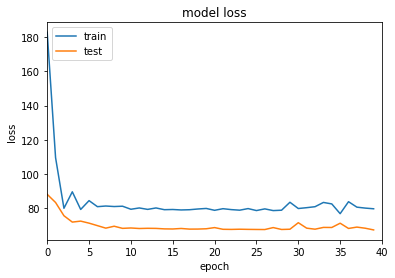

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 78.7546 - root_mean_squared_error: 8.7522 - val_loss: 67.4067 - val_root_mean_squared_error: 8.0785
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 79.0723 - root_mean_squared_error: 8.7717 - val_loss: 67.4222 - val_root_mean_squared_error: 8.0822
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 80.2327 - root_mean_squared_error: 8.8404 - val_loss: 68.1478 - val_root_mean_squared_error: 8.1305
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 78.8449 - root_mean_squared_error: 8.7648 - val_loss: 68.0188 - val_root_mean_squared_error: 8.1244
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 79.7090 - root_mean_squared_error: 8.8145 - val_loss: 67.5921 - val_root_mean_squared_error: 8.0988
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 79.9810 - root_mean_squared_error: 8.8316 - val_loss: 67.9417 - val_roo

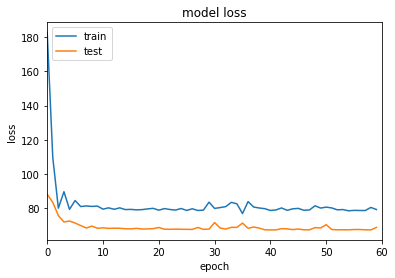

Epoch 1/20
6/6 [==============================] - 1s 37ms/step - loss: 193.2404 - root_mean_squared_error: 13.8539 - val_loss: 79.9946 - val_root_mean_squared_error: 8.8259
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 101.1717 - root_mean_squared_error: 9.9380 - val_loss: 83.4817 - val_root_mean_squared_error: 8.9844
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 83.8542 - root_mean_squared_error: 8.9979 - val_loss: 72.4588 - val_root_mean_squared_error: 8.3323
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 86.2609 - root_mean_squared_error: 9.1205 - val_loss: 69.5691 - val_root_mean_squared_error: 8.1520
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 79.3605 - root_mean_squared_error: 8.7317 - val_loss: 70.0248 - val_root_mean_squared_error: 8.1804
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 80.7308 - root_mean_squared_error: 8.8113 - val_loss: 69.2240 - val_root_

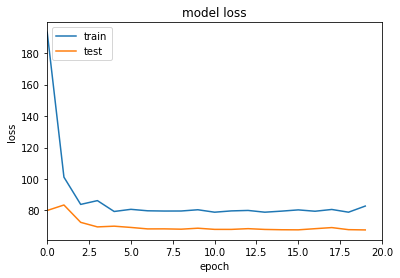

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 82.2743 - root_mean_squared_error: 8.9384 - val_loss: 68.7450 - val_root_mean_squared_error: 8.1481
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 81.3597 - root_mean_squared_error: 8.8896 - val_loss: 68.5006 - val_root_mean_squared_error: 8.1362
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 80.5513 - root_mean_squared_error: 8.8470 - val_loss: 68.1822 - val_root_mean_squared_error: 8.1198
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 78.8074 - root_mean_squared_error: 8.7508 - val_loss: 67.4694 - val_root_mean_squared_error: 8.0790
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 78.6310 - root_mean_squared_error: 8.7436 - val_loss: 67.4221 - val_root_mean_squared_error: 8.0792
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 79.0598 - root_mean_squared_error: 8.7708 - val_loss: 67.4397 - val_ro

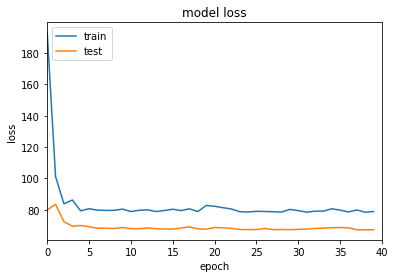

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 79.9982 - root_mean_squared_error: 8.8363 - val_loss: 67.6886 - val_root_mean_squared_error: 8.1096
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 79.1463 - root_mean_squared_error: 8.7876 - val_loss: 67.6044 - val_root_mean_squared_error: 8.1046
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 79.6570 - root_mean_squared_error: 8.8166 - val_loss: 67.6592 - val_root_mean_squared_error: 8.1059
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 78.8988 - root_mean_squared_error: 8.7709 - val_loss: 67.3825 - val_root_mean_squared_error: 8.0873
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 78.5564 - root_mean_squared_error: 8.7513 - val_loss: 67.7107 - val_root_mean_squared_error: 8.1094
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 79.1845 - root_mean_squared_error: 8.7889 - val_loss: 67.2263 - val_r

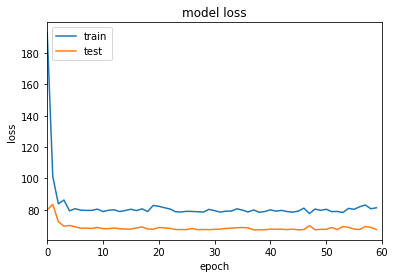

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 199.6792 - root_mean_squared_error: 14.0185 - val_loss: 80.8000 - val_root_mean_squared_error: 8.5846
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 115.9062 - root_mean_squared_error: 10.3374 - val_loss: 102.7553 - val_root_mean_squared_error: 9.5548
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 95.1744 - root_mean_squared_error: 9.0991 - val_loss: 82.0753 - val_root_mean_squared_error: 8.2858
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 99.9689 - root_mean_squared_error: 9.2892 - val_loss: 85.4800 - val_root_mean_squared_error: 8.4644
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 94.1291 - root_mean_squared_error: 8.9685 - val_loss: 80.9338 - val_root_mean_squared_error: 8.2208
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 91.6588 - root_mean_squared_error: 8.8684 - val_loss: 79.5602 - val_ro

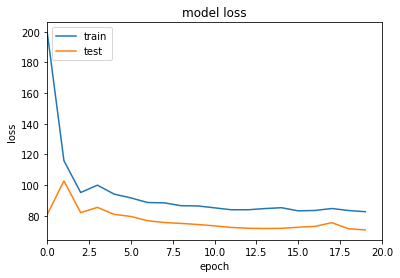

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 82.6484 - root_mean_squared_error: 8.8130 - val_loss: 69.9888 - val_root_mean_squared_error: 8.0910
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 86.0152 - root_mean_squared_error: 9.0246 - val_loss: 75.4512 - val_root_mean_squared_error: 8.3900
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 84.9091 - root_mean_squared_error: 8.9057 - val_loss: 71.7546 - val_root_mean_squared_error: 8.0845
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 83.6018 - root_mean_squared_error: 8.7704 - val_loss: 72.2624 - val_root_mean_squared_error: 8.0818
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 85.5518 - root_mean_squared_error: 8.8603 - val_loss: 72.4495 - val_root_mean_squared_error: 8.0784
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 85.3877 - root_mean_squared_error: 8.8447 - val_loss: 72.4545 - val_r

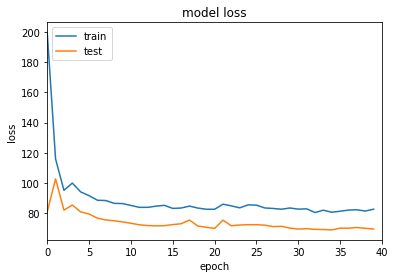

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 81.1960 - root_mean_squared_error: 8.7875 - val_loss: 69.4850 - val_root_mean_squared_error: 8.1128
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 79.0517 - root_mean_squared_error: 8.6972 - val_loss: 70.5488 - val_root_mean_squared_error: 8.2207
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 82.9998 - root_mean_squared_error: 8.9595 - val_loss: 80.3462 - val_root_mean_squared_error: 8.8124
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 87.3696 - root_mean_squared_error: 9.1715 - val_loss: 70.0976 - val_root_mean_squared_error: 8.0913
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 83.6946 - root_mean_squared_error: 8.8498 - val_loss: 71.6841 - val_root_mean_squared_error: 8.0945
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 83.4123 - root_mean_squared_error: 8.7854 - val_loss: 71.5378 - val_

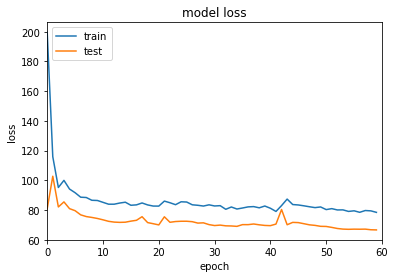

Epoch 1/20
6/6 [==============================] - 1s 52ms/step - loss: 163.7269 - root_mean_squared_error: 12.7773 - val_loss: 84.7626 - val_root_mean_squared_error: 9.1513
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 109.9862 - root_mean_squared_error: 10.4260 - val_loss: 84.8558 - val_root_mean_squared_error: 9.1235
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 81.9738 - root_mean_squared_error: 8.9568 - val_loss: 74.6812 - val_root_mean_squared_error: 8.5309
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 90.0279 - root_mean_squared_error: 9.3844 - val_loss: 70.7722 - val_root_mean_squared_error: 8.2915
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 83.9236 - root_mean_squared_error: 9.0490 - val_loss: 74.9144 - val_root_mean_squared_error: 8.5360
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 83.1149 - root_mean_squared_error: 9.0038 - val_loss: 67.8461 - val_roo

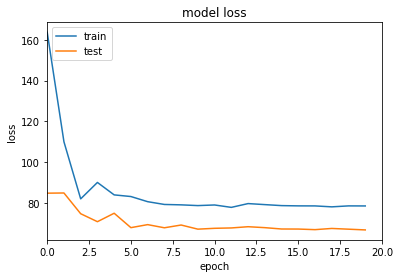

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 80.0760 - root_mean_squared_error: 8.8652 - val_loss: 66.7518 - val_root_mean_squared_error: 8.0781
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 77.5731 - root_mean_squared_error: 8.7217 - val_loss: 68.6160 - val_root_mean_squared_error: 8.1916
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 78.9507 - root_mean_squared_error: 8.8001 - val_loss: 66.7536 - val_root_mean_squared_error: 8.0785
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 77.8962 - root_mean_squared_error: 8.7419 - val_loss: 66.7621 - val_root_mean_squared_error: 8.0819
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 78.8067 - root_mean_squared_error: 8.7969 - val_loss: 66.8050 - val_root_mean_squared_error: 8.0885
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 79.5433 - root_mean_squared_error: 8.8424 - val_loss: 66.8901 - val_

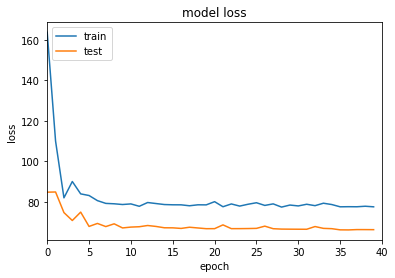

Epoch 41/60
6/6 [==============================] - 0s 24ms/step - loss: 77.5908 - root_mean_squared_error: 8.7618 - val_loss: 66.5560 - val_root_mean_squared_error: 8.1091
Epoch 42/60
6/6 [==============================] - 0s 17ms/step - loss: 78.3470 - root_mean_squared_error: 8.8070 - val_loss: 66.0610 - val_root_mean_squared_error: 8.0810
Epoch 43/60
6/6 [==============================] - 0s 16ms/step - loss: 78.3252 - root_mean_squared_error: 8.8081 - val_loss: 65.9888 - val_root_mean_squared_error: 8.0785
Epoch 44/60
6/6 [==============================] - 0s 16ms/step - loss: 78.3271 - root_mean_squared_error: 8.8069 - val_loss: 66.1463 - val_root_mean_squared_error: 8.0798
Epoch 45/60
6/6 [==============================] - 0s 18ms/step - loss: 77.8182 - root_mean_squared_error: 8.7688 - val_loss: 66.2782 - val_root_mean_squared_error: 8.0794
Epoch 46/60
6/6 [==============================] - 0s 13ms/step - loss: 78.0053 - root_mean_squared_error: 8.7735 - val_loss: 66.5044 - val_

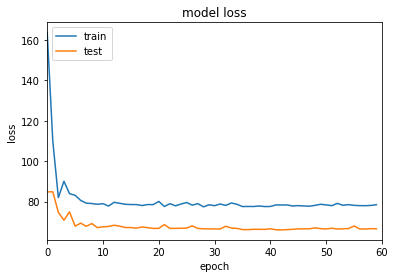

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 158.8869 - root_mean_squared_error: 12.5982 - val_loss: 97.7330 - val_root_mean_squared_error: 9.8700
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 111.1002 - root_mean_squared_error: 10.5224 - val_loss: 70.8834 - val_root_mean_squared_error: 8.3923
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 81.5531 - root_mean_squared_error: 9.0038 - val_loss: 79.0319 - val_root_mean_squared_error: 8.8607
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 85.9635 - root_mean_squared_error: 9.2427 - val_loss: 65.8851 - val_root_mean_squared_error: 8.0829
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 79.6711 - root_mean_squared_error: 8.8946 - val_loss: 72.9267 - val_root_mean_squared_error: 8.5066
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 79.0713 - root_mean_squared_error: 8.8604 - val_loss: 66.0395 - val_roo

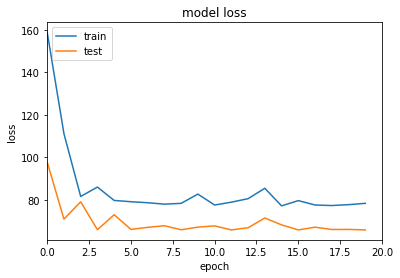

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 78.0530 - root_mean_squared_error: 8.8080 - val_loss: 65.9093 - val_root_mean_squared_error: 8.0896
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 78.2624 - root_mean_squared_error: 8.8202 - val_loss: 65.8212 - val_root_mean_squared_error: 8.0844
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 80.7475 - root_mean_squared_error: 8.9602 - val_loss: 68.0551 - val_root_mean_squared_error: 8.2217
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 80.2043 - root_mean_squared_error: 8.9301 - val_loss: 68.6589 - val_root_mean_squared_error: 8.2586
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 78.4350 - root_mean_squared_error: 8.8307 - val_loss: 68.2487 - val_root_mean_squared_error: 8.2339
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 79.2406 - root_mean_squared_error: 8.8763 - val_loss: 65.9430 - val_ro

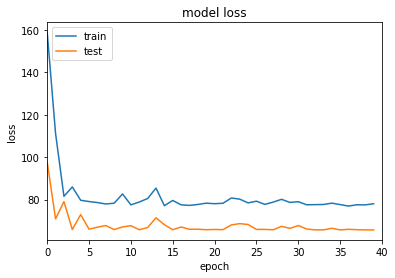

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 76.9424 - root_mean_squared_error: 8.7474 - val_loss: 66.1976 - val_root_mean_squared_error: 8.1102
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 77.0683 - root_mean_squared_error: 8.7548 - val_loss: 65.7627 - val_root_mean_squared_error: 8.0835
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 77.7200 - root_mean_squared_error: 8.7921 - val_loss: 65.6762 - val_root_mean_squared_error: 8.0784
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 80.5753 - root_mean_squared_error: 8.9532 - val_loss: 66.9530 - val_root_mean_squared_error: 8.1571
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 77.6113 - root_mean_squared_error: 8.7857 - val_loss: 66.8941 - val_root_mean_squared_error: 8.1521
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 79.8587 - root_mean_squared_error: 8.9114 - val_loss: 67.2339 - val_r

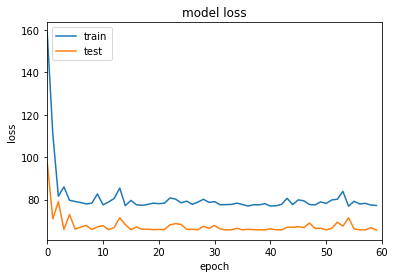

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 163.0717 - root_mean_squared_error: 12.7640 - val_loss: 95.0804 - val_root_mean_squared_error: 9.7377
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 102.5984 - root_mean_squared_error: 10.1143 - val_loss: 73.1567 - val_root_mean_squared_error: 8.5326
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 78.3211 - root_mean_squared_error: 8.8289 - val_loss: 71.5637 - val_root_mean_squared_error: 8.4361
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 82.8116 - root_mean_squared_error: 9.0778 - val_loss: 66.0955 - val_root_mean_squared_error: 8.1043
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 80.7701 - root_mean_squared_error: 8.9638 - val_loss: 71.0199 - val_root_mean_squared_error: 8.4021
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 77.8882 - root_mean_squared_error: 8.8013 - val_loss: 65.7514 - val_roo

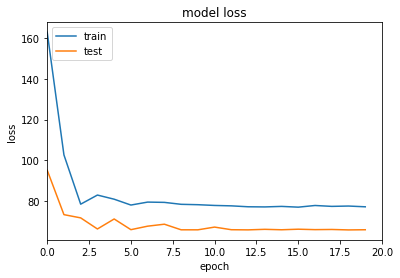

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 77.6602 - root_mean_squared_error: 8.7918 - val_loss: 65.7948 - val_root_mean_squared_error: 8.0890
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 78.7245 - root_mean_squared_error: 8.8523 - val_loss: 65.6366 - val_root_mean_squared_error: 8.0794
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 77.8311 - root_mean_squared_error: 8.8019 - val_loss: 66.8152 - val_root_mean_squared_error: 8.1522
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 77.8764 - root_mean_squared_error: 8.8045 - val_loss: 65.9832 - val_root_mean_squared_error: 8.1010
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 77.1375 - root_mean_squared_error: 8.7623 - val_loss: 66.3072 - val_root_mean_squared_error: 8.1206
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 77.8103 - root_mean_squared_error: 8.8002 - val_loss: 65.6745 - val_r

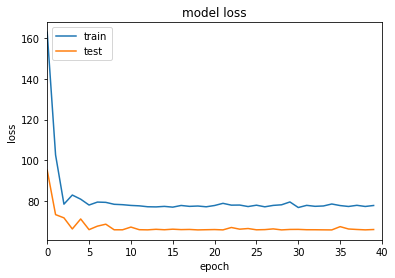

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 78.6847 - root_mean_squared_error: 8.8506 - val_loss: 65.9978 - val_root_mean_squared_error: 8.1023
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 80.1278 - root_mean_squared_error: 8.9319 - val_loss: 65.9386 - val_root_mean_squared_error: 8.0988
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 77.5907 - root_mean_squared_error: 8.7888 - val_loss: 65.8615 - val_root_mean_squared_error: 8.0942
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 77.3123 - root_mean_squared_error: 8.7731 - val_loss: 65.6217 - val_root_mean_squared_error: 8.0795
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 77.5636 - root_mean_squared_error: 8.7875 - val_loss: 65.9186 - val_root_mean_squared_error: 8.0980
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 79.2886 - root_mean_squared_error: 8.8853 - val_loss: 65.6691 - val_r

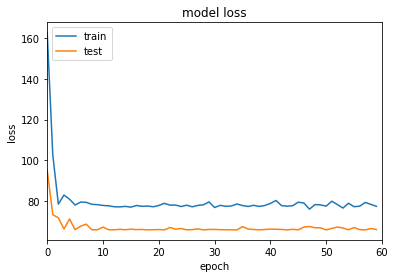

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 192.9647 - root_mean_squared_error: 13.7825 - val_loss: 91.1463 - val_root_mean_squared_error: 9.1815
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 104.5837 - root_mean_squared_error: 9.7883 - val_loss: 85.2436 - val_root_mean_squared_error: 8.5982
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 92.9318 - root_mean_squared_error: 8.9752 - val_loss: 81.8062 - val_root_mean_squared_error: 8.2577
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 93.7690 - root_mean_squared_error: 8.9342 - val_loss: 79.7710 - val_root_mean_squared_error: 8.1013
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 90.7557 - root_mean_squared_error: 8.7639 - val_loss: 80.3898 - val_root_mean_squared_error: 8.1798
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 90.3542 - root_mean_squared_error: 8.7936 - val_loss: 77.6528 - val_root_

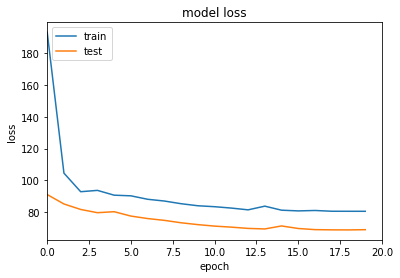

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 81.2718 - root_mean_squared_error: 8.8171 - val_loss: 69.1507 - val_root_mean_squared_error: 8.1146
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 79.9846 - root_mean_squared_error: 8.7672 - val_loss: 68.3261 - val_root_mean_squared_error: 8.0905
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 81.6423 - root_mean_squared_error: 8.8781 - val_loss: 68.1817 - val_root_mean_squared_error: 8.0819
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 79.6851 - root_mean_squared_error: 8.7535 - val_loss: 68.7889 - val_root_mean_squared_error: 8.0942
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 81.8069 - root_mean_squared_error: 8.8619 - val_loss: 68.7639 - val_root_mean_squared_error: 8.0927
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 80.9063 - root_mean_squared_error: 8.8003 - val_loss: 69.3468 - val_

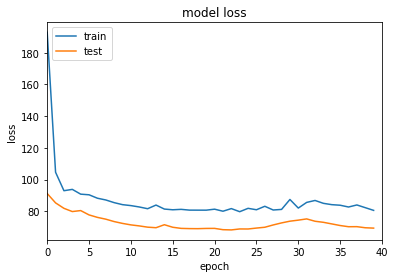

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 81.0924 - root_mean_squared_error: 8.7796 - val_loss: 69.4968 - val_root_mean_squared_error: 8.0989
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 81.4240 - root_mean_squared_error: 8.8107 - val_loss: 69.1251 - val_root_mean_squared_error: 8.0945
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 81.0481 - root_mean_squared_error: 8.8082 - val_loss: 70.0096 - val_root_mean_squared_error: 8.1661
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 81.4037 - root_mean_squared_error: 8.8399 - val_loss: 69.0360 - val_root_mean_squared_error: 8.1103
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 82.3969 - root_mean_squared_error: 8.8975 - val_loss: 68.6255 - val_root_mean_squared_error: 8.0922
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 83.0642 - root_mean_squared_error: 8.9424 - val_loss: 68.2783 - val_ro

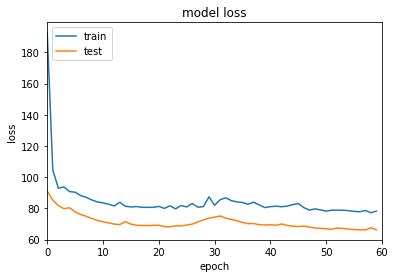

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 151.1461 - root_mean_squared_error: 12.2813 - val_loss: 100.4242 - val_root_mean_squared_error: 9.9836
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 107.4783 - root_mean_squared_error: 10.3195 - val_loss: 71.0842 - val_root_mean_squared_error: 8.3540
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 82.9961 - root_mean_squared_error: 9.0315 - val_loss: 78.4902 - val_root_mean_squared_error: 8.7690
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 85.5148 - root_mean_squared_error: 9.1573 - val_loss: 67.6713 - val_root_mean_squared_error: 8.1203
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 83.4904 - root_mean_squared_error: 9.0408 - val_loss: 70.6227 - val_root_mean_squared_error: 8.2974
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 78.2484 - root_mean_squared_error: 8.7449 - val_loss: 67.3803 - val_root

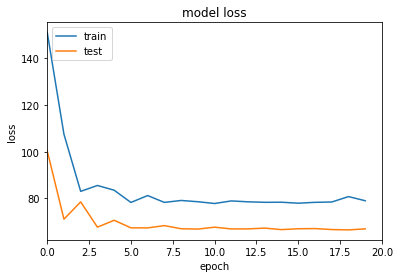

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 77.4171 - root_mean_squared_error: 8.7335 - val_loss: 66.5324 - val_root_mean_squared_error: 8.0878
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 78.8504 - root_mean_squared_error: 8.8173 - val_loss: 66.4315 - val_root_mean_squared_error: 8.0837
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 77.4356 - root_mean_squared_error: 8.7385 - val_loss: 66.3176 - val_root_mean_squared_error: 8.0784
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.8195 - root_mean_squared_error: 8.7618 - val_loss: 66.3347 - val_root_mean_squared_error: 8.0807
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 78.1624 - root_mean_squared_error: 8.7828 - val_loss: 66.2961 - val_root_mean_squared_error: 8.0797
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 79.4429 - root_mean_squared_error: 8.8549 - val_loss: 66.3499 - val_r

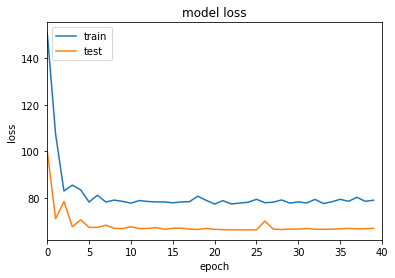

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 78.1144 - root_mean_squared_error: 8.7567 - val_loss: 67.2853 - val_root_mean_squared_error: 8.1163
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.9816 - root_mean_squared_error: 8.7520 - val_loss: 66.6094 - val_root_mean_squared_error: 8.0791
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 79.0288 - root_mean_squared_error: 8.8161 - val_loss: 66.5161 - val_root_mean_squared_error: 8.0785
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 78.7916 - root_mean_squared_error: 8.8073 - val_loss: 67.3428 - val_root_mean_squared_error: 8.1343
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 82.8102 - root_mean_squared_error: 9.0362 - val_loss: 66.4663 - val_root_mean_squared_error: 8.0813
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 80.5014 - root_mean_squared_error: 8.9058 - val_loss: 66.8275 - val_

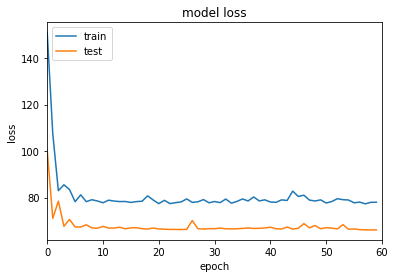

Epoch 1/20
6/6 [==============================] - 1s 55ms/step - loss: 181.4502 - root_mean_squared_error: 13.4686 - val_loss: 75.1822 - val_root_mean_squared_error: 8.6646
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 98.1177 - root_mean_squared_error: 9.8985 - val_loss: 86.9323 - val_root_mean_squared_error: 9.3142
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 83.0889 - root_mean_squared_error: 9.1045 - val_loss: 67.2225 - val_root_mean_squared_error: 8.1855
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 82.5020 - root_mean_squared_error: 9.0704 - val_loss: 70.9446 - val_root_mean_squared_error: 8.4085
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 77.8190 - root_mean_squared_error: 8.8075 - val_loss: 66.9718 - val_root_mean_squared_error: 8.1682
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 79.2195 - root_mean_squared_error: 8.8862 - val_loss: 68.9697 - val_root_m

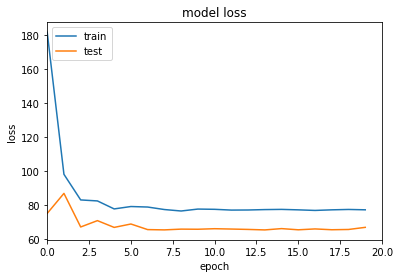

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 77.0590 - root_mean_squared_error: 8.7654 - val_loss: 65.4855 - val_root_mean_squared_error: 8.0784
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 78.9710 - root_mean_squared_error: 8.8739 - val_loss: 66.0107 - val_root_mean_squared_error: 8.1109
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.3372 - root_mean_squared_error: 8.7244 - val_loss: 67.3599 - val_root_mean_squared_error: 8.1938
Epoch 24/40
6/6 [==============================] - 0s 15ms/step - loss: 77.9755 - root_mean_squared_error: 8.8178 - val_loss: 65.7507 - val_root_mean_squared_error: 8.0951
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 77.5673 - root_mean_squared_error: 8.7948 - val_loss: 66.1113 - val_root_mean_squared_error: 8.1174
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 79.2184 - root_mean_squared_error: 8.8882 - val_loss: 66.5481 - val_

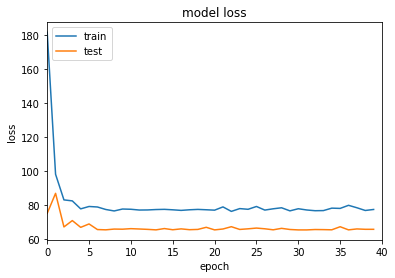

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 77.2787 - root_mean_squared_error: 8.7791 - val_loss: 65.5894 - val_root_mean_squared_error: 8.0861
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 78.3664 - root_mean_squared_error: 8.8410 - val_loss: 65.9141 - val_root_mean_squared_error: 8.1063
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.4575 - root_mean_squared_error: 8.7325 - val_loss: 66.1581 - val_root_mean_squared_error: 8.1215
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 77.9168 - root_mean_squared_error: 8.8158 - val_loss: 66.9087 - val_root_mean_squared_error: 8.1676
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 82.1067 - root_mean_squared_error: 9.0501 - val_loss: 66.4132 - val_root_mean_squared_error: 8.1367
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 84.5872 - root_mean_squared_error: 9.1858 - val_loss: 69.6777 - val_r

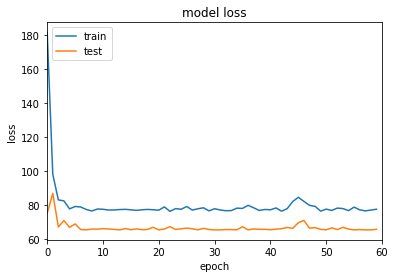

Epoch 1/20
6/6 [==============================] - 1s 141ms/step - loss: 189.4397 - root_mean_squared_error: 13.7631 - val_loss: 73.8399 - val_root_mean_squared_error: 8.5910
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 99.6156 - root_mean_squared_error: 9.9787 - val_loss: 87.7100 - val_root_mean_squared_error: 9.3627
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 83.3370 - root_mean_squared_error: 9.1260 - val_loss: 67.3016 - val_root_mean_squared_error: 8.2002
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 82.6544 - root_mean_squared_error: 9.0881 - val_loss: 69.4405 - val_root_mean_squared_error: 8.3293
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 78.6314 - root_mean_squared_error: 8.8638 - val_loss: 66.1987 - val_root_mean_squared_error: 8.1323
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 77.6380 - root_mean_squared_error: 8.8075 - val_loss: 66.9794 - val_root

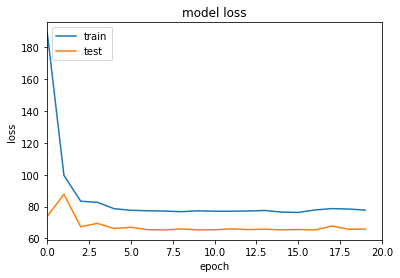

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 77.0910 - root_mean_squared_error: 8.7767 - val_loss: 65.3206 - val_root_mean_squared_error: 8.0784
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 76.9940 - root_mean_squared_error: 8.7712 - val_loss: 65.7211 - val_root_mean_squared_error: 8.1031
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 77.0347 - root_mean_squared_error: 8.7735 - val_loss: 65.3247 - val_root_mean_squared_error: 8.0787
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.9369 - root_mean_squared_error: 8.8248 - val_loss: 65.6516 - val_root_mean_squared_error: 8.0989
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 79.3719 - root_mean_squared_error: 8.9058 - val_loss: 65.9605 - val_root_mean_squared_error: 8.1180
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 76.2286 - root_mean_squared_error: 8.7275 - val_loss: 67.4650 - val_r

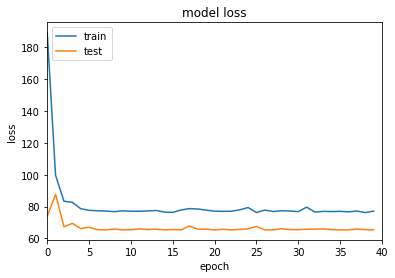

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 76.5875 - root_mean_squared_error: 8.7482 - val_loss: 65.3858 - val_root_mean_squared_error: 8.0827
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1478 - root_mean_squared_error: 8.7802 - val_loss: 65.5709 - val_root_mean_squared_error: 8.0942
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.8285 - root_mean_squared_error: 8.7620 - val_loss: 65.3911 - val_root_mean_squared_error: 8.0831
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 77.2925 - root_mean_squared_error: 8.7885 - val_loss: 65.7677 - val_root_mean_squared_error: 8.1063
Epoch 45/60
6/6 [==============================] - 0s 14ms/step - loss: 76.4040 - root_mean_squared_error: 8.7378 - val_loss: 65.8073 - val_root_mean_squared_error: 8.1088
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.8944 - root_mean_squared_error: 8.7658 - val_loss: 65.7040 - val_

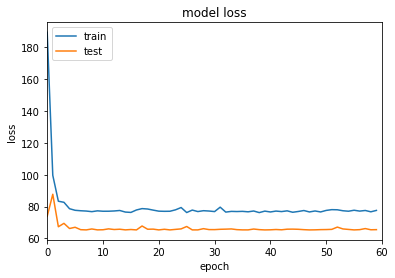

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 3581.6985 - root_mean_squared_error: 59.7743 - val_loss: 1474.9072 - val_root_mean_squared_error: 38.3158
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 455.2817 - root_mean_squared_error: 21.1949 - val_loss: 350.1689 - val_root_mean_squared_error: 18.5722
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 153.5172 - root_mean_squared_error: 12.1827 - val_loss: 73.3280 - val_root_mean_squared_error: 8.2603
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 63.6219 - root_mean_squared_error: 7.6454 - val_loss: 49.6001 - val_root_mean_squared_error: 6.6607
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 59.2302 - root_mean_squared_error: 7.3473 - val_loss: 54.2140 - val_root_mean_squared_error: 6.9971
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 62.5719 - root_mean_squared_error: 7.5693 - val_loss: 45.9145 -

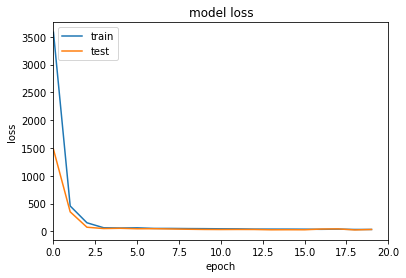

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 38.5928 - root_mean_squared_error: 5.7969 - val_loss: 25.5633 - val_root_mean_squared_error: 4.5359
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 34.1998 - root_mean_squared_error: 5.4052 - val_loss: 30.3175 - val_root_mean_squared_error: 5.0341
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 42.3662 - root_mean_squared_error: 6.1152 - val_loss: 29.9208 - val_root_mean_squared_error: 4.9962
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 37.4073 - root_mean_squared_error: 5.6968 - val_loss: 26.5750 - val_root_mean_squared_error: 4.6510
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 33.8089 - root_mean_squared_error: 5.3722 - val_loss: 22.5822 - val_root_mean_squared_error: 4.1994
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 32.5032 - root_mean_squared_error: 5.2490 - val_loss: 28.9812 - val_

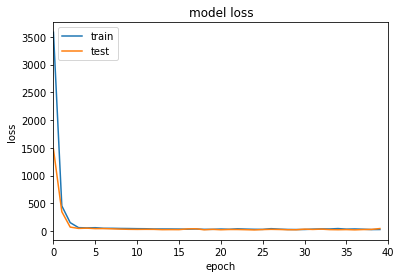

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 30.5495 - root_mean_squared_error: 5.0501 - val_loss: 42.1354 - val_root_mean_squared_error: 6.0904
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 28.5931 - root_mean_squared_error: 4.8534 - val_loss: 28.9253 - val_root_mean_squared_error: 4.8882
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 27.1007 - root_mean_squared_error: 4.6984 - val_loss: 22.6486 - val_root_mean_squared_error: 4.1989
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 25.7437 - root_mean_squared_error: 4.5530 - val_loss: 33.3712 - val_root_mean_squared_error: 5.3262
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 28.0586 - root_mean_squared_error: 4.8020 - val_loss: 35.7416 - val_root_mean_squared_error: 5.5456
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 37.4821 - root_mean_squared_error: 5.7010 - val_loss: 24.4734 - val_r

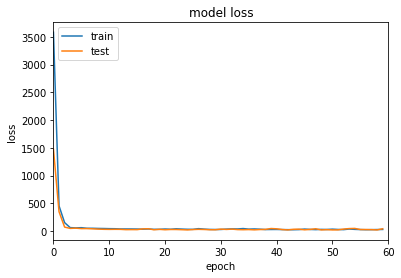

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 811.7138 - root_mean_squared_error: 28.3528 - val_loss: 275.1904 - val_root_mean_squared_error: 16.4052
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 128.3821 - root_mean_squared_error: 11.0916 - val_loss: 52.1081 - val_root_mean_squared_error: 6.8934
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 64.6191 - root_mean_squared_error: 7.7575 - val_loss: 48.7952 - val_root_mean_squared_error: 6.6610
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 59.1057 - root_mean_squared_error: 7.3919 - val_loss: 47.5013 - val_root_mean_squared_error: 6.5613
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 54.8912 - root_mean_squared_error: 7.1046 - val_loss: 40.2671 - val_root_mean_squared_error: 5.9898
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 51.5337 - root_mean_squared_error: 6.8661 - val_loss: 54.9726 - val_ro

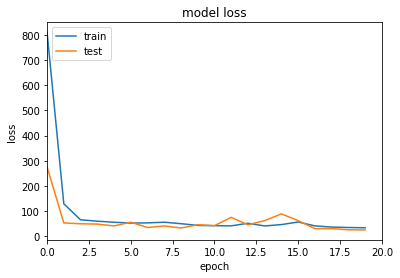

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 33.8781 - root_mean_squared_error: 5.4678 - val_loss: 40.8675 - val_root_mean_squared_error: 6.0741
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 32.7180 - root_mean_squared_error: 5.3623 - val_loss: 37.6786 - val_root_mean_squared_error: 5.8075
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 28.7615 - root_mean_squared_error: 4.9819 - val_loss: 26.8887 - val_root_mean_squared_error: 4.7914
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 47.4524 - root_mean_squared_error: 6.5980 - val_loss: 34.8048 - val_root_mean_squared_error: 5.5591
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 40.8922 - root_mean_squared_error: 6.0823 - val_loss: 44.2269 - val_root_mean_squared_error: 6.3519
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 38.9729 - root_mean_squared_error: 5.9248 - val_loss: 29.1523 - val_ro

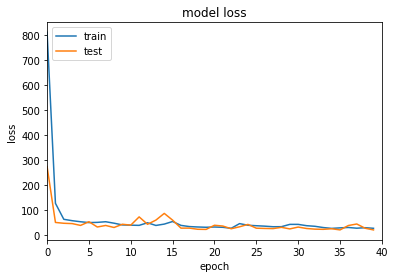

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 29.8558 - root_mean_squared_error: 5.1013 - val_loss: 22.3340 - val_root_mean_squared_error: 4.3026
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 28.4107 - root_mean_squared_error: 4.9589 - val_loss: 21.6079 - val_root_mean_squared_error: 4.2176
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 28.4782 - root_mean_squared_error: 4.9654 - val_loss: 28.2689 - val_root_mean_squared_error: 4.9443
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 25.3693 - root_mean_squared_error: 4.6420 - val_loss: 25.0610 - val_root_mean_squared_error: 4.6084
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 33.7012 - root_mean_squared_error: 5.4661 - val_loss: 41.3322 - val_root_mean_squared_error: 6.1248
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 29.7693 - root_mean_squared_error: 5.0946 - val_loss: 34.3606 - val_ro

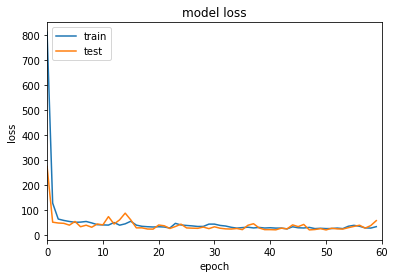

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 3515.0442 - root_mean_squared_error: 59.2209 - val_loss: 746.5662 - val_root_mean_squared_error: 27.2071
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 287.4969 - root_mean_squared_error: 16.7870 - val_loss: 171.6365 - val_root_mean_squared_error: 12.9113
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 132.6258 - root_mean_squared_error: 11.3070 - val_loss: 53.8043 - val_root_mean_squared_error: 7.0032
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 64.2500 - root_mean_squared_error: 7.7097 - val_loss: 48.2994 - val_root_mean_squared_error: 6.5935
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 61.5415 - root_mean_squared_error: 7.5322 - val_loss: 46.4734 - val_root_mean_squared_error: 6.4556
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 65.7747 - root_mean_squared_error: 7.8079 - val_loss: 51.9684 -

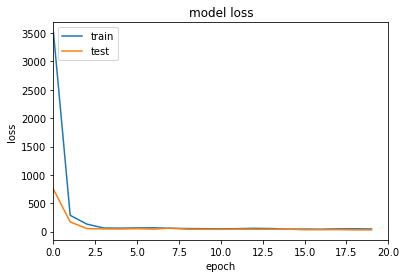

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 43.9436 - root_mean_squared_error: 6.2802 - val_loss: 30.1557 - val_root_mean_squared_error: 5.0644
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 41.6462 - root_mean_squared_error: 6.0939 - val_loss: 48.0350 - val_root_mean_squared_error: 6.5978
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 46.8866 - root_mean_squared_error: 6.5100 - val_loss: 29.5551 - val_root_mean_squared_error: 5.0042
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 38.2365 - root_mean_squared_error: 5.8077 - val_loss: 36.5565 - val_root_mean_squared_error: 5.6616
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 43.3585 - root_mean_squared_error: 6.2335 - val_loss: 30.4518 - val_root_mean_squared_error: 5.0939
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 40.5241 - root_mean_squared_error: 6.0018 - val_loss: 30.0830 - val_roo

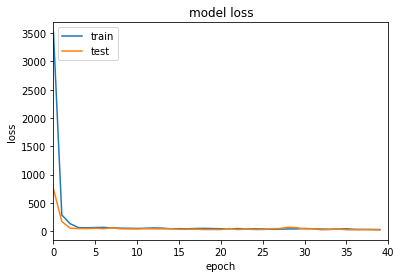

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 30.0314 - root_mean_squared_error: 5.0607 - val_loss: 27.6102 - val_root_mean_squared_error: 4.8161
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 45.4012 - root_mean_squared_error: 6.4022 - val_loss: 24.5254 - val_root_mean_squared_error: 4.4854
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 42.3365 - root_mean_squared_error: 6.1588 - val_loss: 32.5980 - val_root_mean_squared_error: 5.3100
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 38.7661 - root_mean_squared_error: 5.8622 - val_loss: 24.7160 - val_root_mean_squared_error: 4.5077
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 34.9658 - root_mean_squared_error: 5.5291 - val_loss: 25.2866 - val_root_mean_squared_error: 4.5705
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 33.7835 - root_mean_squared_error: 5.4212 - val_loss: 27.3042 - val_ro

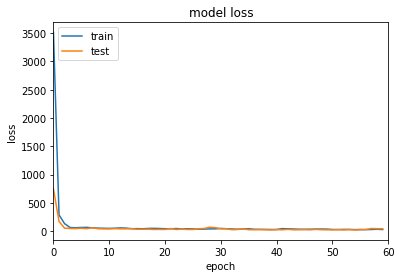

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 1796.0649 - root_mean_squared_error: 42.2864 - val_loss: 445.3075 - val_root_mean_squared_error: 20.9514
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 209.8966 - root_mean_squared_error: 14.2893 - val_loss: 145.4073 - val_root_mean_squared_error: 11.8502
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 84.1997 - root_mean_squared_error: 8.9091 - val_loss: 65.2714 - val_root_mean_squared_error: 7.7757
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 53.4541 - root_mean_squared_error: 6.9706 - val_loss: 65.8400 - val_root_mean_squared_error: 7.8075
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 53.1801 - root_mean_squared_error: 6.9509 - val_loss: 43.5277 - val_root_mean_squared_error: 6.2179
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 49.9658 - root_mean_squared_error: 6.7143 - val_loss: 40.1540 - va

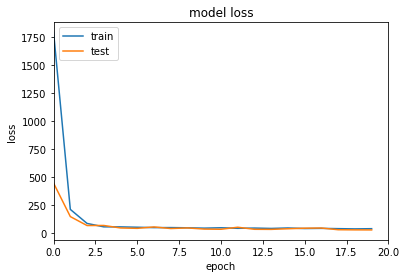

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 35.1954 - root_mean_squared_error: 5.5354 - val_loss: 25.5623 - val_root_mean_squared_error: 4.5846
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 32.6268 - root_mean_squared_error: 5.3001 - val_loss: 27.0427 - val_root_mean_squared_error: 4.7451
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 32.2272 - root_mean_squared_error: 5.2638 - val_loss: 25.1799 - val_root_mean_squared_error: 4.5464
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 32.1476 - root_mean_squared_error: 5.2575 - val_loss: 26.8057 - val_root_mean_squared_error: 4.7225
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 29.4581 - root_mean_squared_error: 4.9957 - val_loss: 29.7766 - val_root_mean_squared_error: 5.0281
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 33.4769 - root_mean_squared_error: 5.3841 - val_loss: 28.5810 - val_ro

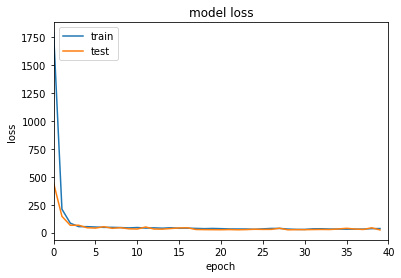

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 32.3724 - root_mean_squared_error: 5.2899 - val_loss: 36.8621 - val_root_mean_squared_error: 5.6985
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 31.7920 - root_mean_squared_error: 5.2355 - val_loss: 56.1001 - val_root_mean_squared_error: 7.1914
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 34.5000 - root_mean_squared_error: 5.4882 - val_loss: 27.9348 - val_root_mean_squared_error: 4.8538
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 30.2496 - root_mean_squared_error: 5.0873 - val_loss: 24.1039 - val_root_mean_squared_error: 4.4435
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 27.3909 - root_mean_squared_error: 4.7997 - val_loss: 26.3089 - val_root_mean_squared_error: 4.6864
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 32.3231 - root_mean_squared_error: 5.2898 - val_loss: 26.8781 - val_r

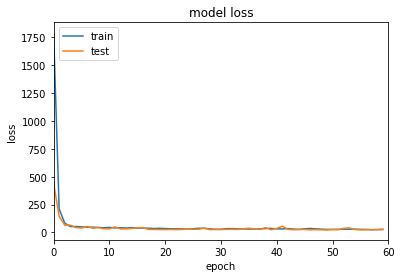

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 2681.7725 - root_mean_squared_error: 51.7695 - val_loss: 1080.4005 - val_root_mean_squared_error: 32.8496
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 426.3547 - root_mean_squared_error: 20.6198 - val_loss: 398.6788 - val_root_mean_squared_error: 19.9406
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 161.0277 - root_mean_squared_error: 12.6488 - val_loss: 50.3016 - val_root_mean_squared_error: 7.0189
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 68.8736 - root_mean_squared_error: 8.2352 - val_loss: 61.9611 - val_root_mean_squared_error: 7.8028
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 58.9637 - root_mean_squared_error: 7.6079 - val_loss: 46.6213 - val_root_mean_squared_error: 6.7475
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 53.5800 - root_mean_squared_error: 7.2446 - val_loss: 51.4896 - 

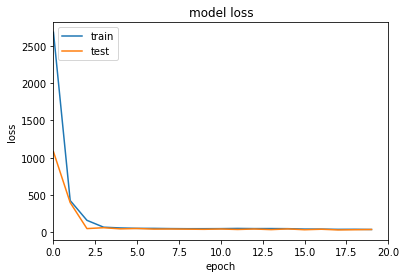

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 37.0661 - root_mean_squared_error: 5.9995 - val_loss: 29.1332 - val_root_mean_squared_error: 5.2973
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 41.9520 - root_mean_squared_error: 6.3938 - val_loss: 27.0834 - val_root_mean_squared_error: 5.1002
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 35.4685 - root_mean_squared_error: 5.8650 - val_loss: 50.3556 - val_root_mean_squared_error: 7.0204
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 42.2250 - root_mean_squared_error: 6.4153 - val_loss: 28.4046 - val_root_mean_squared_error: 5.2285
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 33.7797 - root_mean_squared_error: 5.7195 - val_loss: 24.7191 - val_root_mean_squared_error: 4.8634
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 32.5004 - root_mean_squared_error: 5.6067 - val_loss: 40.0272 - val_ro

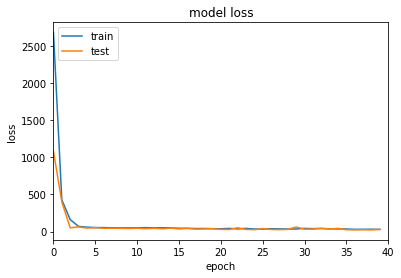

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 29.3712 - root_mean_squared_error: 5.3229 - val_loss: 32.3006 - val_root_mean_squared_error: 5.5913
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 29.8857 - root_mean_squared_error: 5.3709 - val_loss: 24.5003 - val_root_mean_squared_error: 4.8437
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 28.5427 - root_mean_squared_error: 5.2444 - val_loss: 22.7954 - val_root_mean_squared_error: 4.6644
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 29.3182 - root_mean_squared_error: 5.3179 - val_loss: 20.1795 - val_root_mean_squared_error: 4.3752
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 40.7299 - root_mean_squared_error: 6.3002 - val_loss: 26.8136 - val_root_mean_squared_error: 5.0772
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 35.4755 - root_mean_squared_error: 5.8685 - val_loss: 35.3016 - val_ro

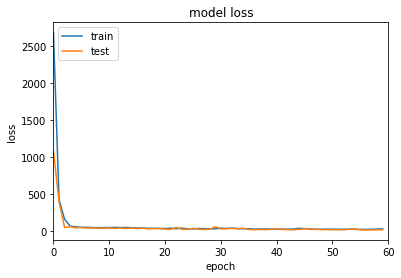

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 2468.7861 - root_mean_squared_error: 49.6780 - val_loss: 1373.6343 - val_root_mean_squared_error: 37.0533
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 515.7372 - root_mean_squared_error: 22.6964 - val_loss: 384.4730 - val_root_mean_squared_error: 19.5944
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 152.1562 - root_mean_squared_error: 12.3142 - val_loss: 64.6267 - val_root_mean_squared_error: 8.0069
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 71.3190 - root_mean_squared_error: 8.4139 - val_loss: 50.7305 - val_root_mean_squared_error: 7.0850
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 73.0198 - root_mean_squared_error: 8.5138 - val_loss: 51.2462 - val_root_mean_squared_error: 7.1208
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 58.3454 - root_mean_squared_error: 7.6027 - val_loss: 46.6673 

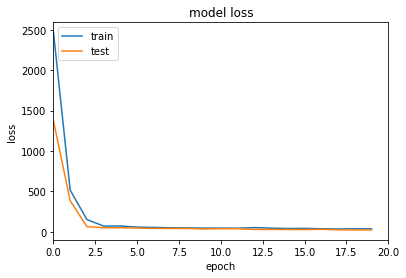

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 36.8833 - root_mean_squared_error: 6.0286 - val_loss: 26.9546 - val_root_mean_squared_error: 5.1396
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 44.2764 - root_mean_squared_error: 6.6134 - val_loss: 41.1634 - val_root_mean_squared_error: 6.3738
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 37.1673 - root_mean_squared_error: 6.0522 - val_loss: 31.7801 - val_root_mean_squared_error: 5.5896
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 35.8642 - root_mean_squared_error: 5.9437 - val_loss: 31.6978 - val_root_mean_squared_error: 5.5823
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 35.6107 - root_mean_squared_error: 5.9224 - val_loss: 40.9567 - val_root_mean_squared_error: 6.3578
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 36.9423 - root_mean_squared_error: 6.0339 - val_loss: 28.1006 - val_

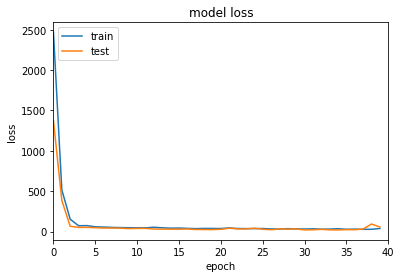

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 35.1537 - root_mean_squared_error: 5.8845 - val_loss: 53.5116 - val_root_mean_squared_error: 7.2791
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 34.9554 - root_mean_squared_error: 5.8676 - val_loss: 58.0517 - val_root_mean_squared_error: 7.5845
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 35.2200 - root_mean_squared_error: 5.8901 - val_loss: 24.5050 - val_root_mean_squared_error: 4.8968
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 26.3367 - root_mean_squared_error: 5.0804 - val_loss: 21.3916 - val_root_mean_squared_error: 4.5680
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 25.7385 - root_mean_squared_error: 5.0213 - val_loss: 23.5114 - val_root_mean_squared_error: 4.7944
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 28.0893 - root_mean_squared_error: 5.2502 - val_loss: 35.2645 - val_roo

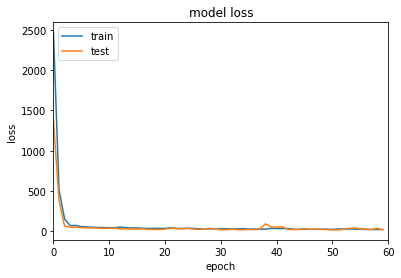

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 1255.7925 - root_mean_squared_error: 35.4259 - val_loss: 238.2848 - val_root_mean_squared_error: 15.4159
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 106.1606 - root_mean_squared_error: 10.2758 - val_loss: 47.7725 - val_root_mean_squared_error: 6.8760
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 68.3762 - root_mean_squared_error: 8.2400 - val_loss: 47.7688 - val_root_mean_squared_error: 6.8768
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 59.3250 - root_mean_squared_error: 7.6706 - val_loss: 37.9816 - val_root_mean_squared_error: 6.1227
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 53.4400 - root_mean_squared_error: 7.2763 - val_loss: 35.6799 - val_root_mean_squared_error: 5.9312
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 48.3000 - root_mean_squared_error: 6.9134 - val_loss: 32.4526 - val_roo

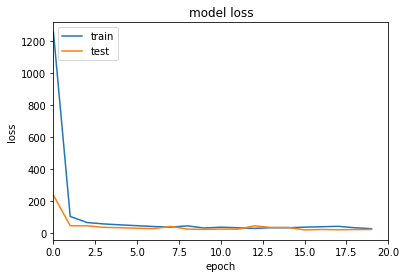

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 28.8639 - root_mean_squared_error: 5.3266 - val_loss: 22.2015 - val_root_mean_squared_error: 4.6594
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 28.1415 - root_mean_squared_error: 5.2584 - val_loss: 44.8898 - val_root_mean_squared_error: 6.6632
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 32.3430 - root_mean_squared_error: 5.6437 - val_loss: 52.4983 - val_root_mean_squared_error: 7.2116
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 30.6717 - root_mean_squared_error: 5.4937 - val_loss: 22.6482 - val_root_mean_squared_error: 4.7072
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 31.3701 - root_mean_squared_error: 5.5570 - val_loss: 23.5641 - val_root_mean_squared_error: 4.8036
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 26.6699 - root_mean_squared_error: 5.1167 - val_loss: 19.0116 - val_ro

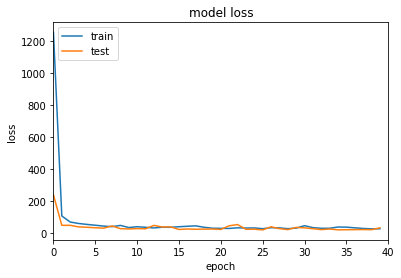

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 30.8979 - root_mean_squared_error: 5.5154 - val_loss: 21.1438 - val_root_mean_squared_error: 4.5459
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 36.9454 - root_mean_squared_error: 6.0389 - val_loss: 23.0585 - val_root_mean_squared_error: 4.7520
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 27.7408 - root_mean_squared_error: 5.2215 - val_loss: 26.8378 - val_root_mean_squared_error: 5.1343
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 26.5129 - root_mean_squared_error: 5.1026 - val_loss: 28.6378 - val_root_mean_squared_error: 5.3068
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 25.9848 - root_mean_squared_error: 5.0506 - val_loss: 18.3771 - val_root_mean_squared_error: 4.2307
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 26.2647 - root_mean_squared_error: 5.0780 - val_loss: 18.4649 - val_roo

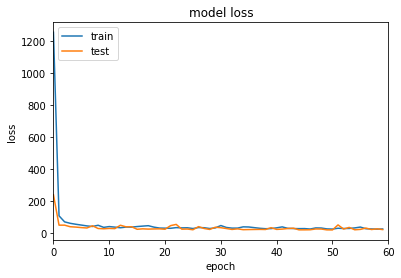

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 1043.9474 - root_mean_squared_error: 32.2980 - val_loss: 179.7681 - val_root_mean_squared_error: 13.3846
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 152.9965 - root_mean_squared_error: 12.3468 - val_loss: 77.7523 - val_root_mean_squared_error: 8.7907
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 66.6321 - root_mean_squared_error: 8.1346 - val_loss: 49.6706 - val_root_mean_squared_error: 7.0149
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 53.4564 - root_mean_squared_error: 7.2792 - val_loss: 63.7285 - val_root_mean_squared_error: 7.9531
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 49.3304 - root_mean_squared_error: 6.9894 - val_loss: 51.7072 - val_root_mean_squared_error: 7.1571
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 49.9917 - root_mean_squared_error: 7.0360 - val_loss: 39.9877 - val_

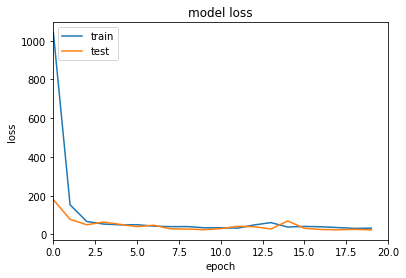

Epoch 21/40
6/6 [==============================] - 0s 30ms/step - loss: 30.0075 - root_mean_squared_error: 5.4343 - val_loss: 20.8304 - val_root_mean_squared_error: 4.5117
Epoch 22/40
6/6 [==============================] - 0s 14ms/step - loss: 29.4543 - root_mean_squared_error: 5.3833 - val_loss: 22.9253 - val_root_mean_squared_error: 4.7383
Epoch 23/40
6/6 [==============================] - 0s 15ms/step - loss: 34.0538 - root_mean_squared_error: 5.7949 - val_loss: 20.7161 - val_root_mean_squared_error: 4.4993
Epoch 24/40
6/6 [==============================] - 0s 14ms/step - loss: 29.5088 - root_mean_squared_error: 5.3886 - val_loss: 24.9622 - val_root_mean_squared_error: 4.9488
Epoch 25/40
6/6 [==============================] - 0s 16ms/step - loss: 28.1917 - root_mean_squared_error: 5.2651 - val_loss: 43.7139 - val_root_mean_squared_error: 6.5760
Epoch 26/40
6/6 [==============================] - 0s 15ms/step - loss: 33.5472 - root_mean_squared_error: 5.7513 - val_loss: 25.3312 - val_

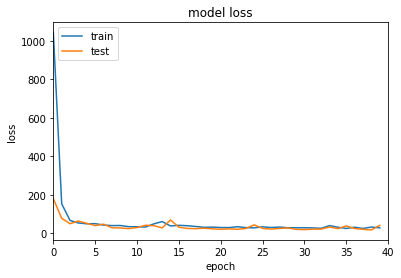

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 33.1018 - root_mean_squared_error: 5.7130 - val_loss: 18.3517 - val_root_mean_squared_error: 4.2294
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 27.9072 - root_mean_squared_error: 5.2386 - val_loss: 19.0594 - val_root_mean_squared_error: 4.3122
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 28.1185 - root_mean_squared_error: 5.2587 - val_loss: 18.6162 - val_root_mean_squared_error: 4.2606
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 24.8137 - root_mean_squared_error: 4.9346 - val_loss: 24.2485 - val_root_mean_squared_error: 4.8770
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 23.0732 - root_mean_squared_error: 4.7551 - val_loss: 19.6230 - val_root_mean_squared_error: 4.3773
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 23.1080 - root_mean_squared_error: 4.7588 - val_loss: 16.8085 - val_roo

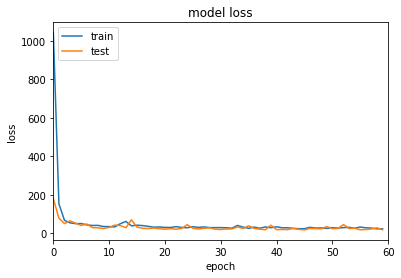

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 3588.9023 - root_mean_squared_error: 59.8993 - val_loss: 1217.9623 - val_root_mean_squared_error: 34.8887
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 462.7284 - root_mean_squared_error: 21.4956 - val_loss: 178.8098 - val_root_mean_squared_error: 13.3495
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 95.6051 - root_mean_squared_error: 9.7472 - val_loss: 66.0373 - val_root_mean_squared_error: 8.0893
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 62.3204 - root_mean_squared_error: 7.8556 - val_loss: 46.4979 - val_root_mean_squared_error: 6.7730
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 58.5167 - root_mean_squared_error: 7.6083 - val_loss: 47.5524 - val_root_mean_squared_error: 6.8493
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 50.1179 - root_mean_squared_error: 7.0338 - val_loss: 45.8933 - v

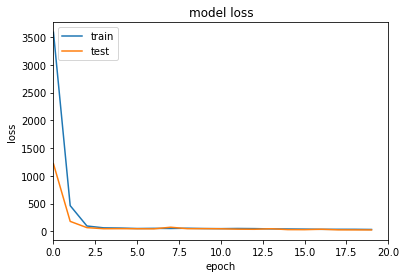

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 36.3526 - root_mean_squared_error: 5.9752 - val_loss: 25.5506 - val_root_mean_squared_error: 4.9901
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 36.7885 - root_mean_squared_error: 6.0116 - val_loss: 39.8257 - val_root_mean_squared_error: 6.2592
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 34.2429 - root_mean_squared_error: 5.7961 - val_loss: 25.1691 - val_root_mean_squared_error: 4.9519
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 30.5280 - root_mean_squared_error: 5.4662 - val_loss: 28.8368 - val_root_mean_squared_error: 5.3093
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 29.6267 - root_mean_squared_error: 5.3832 - val_loss: 22.7701 - val_root_mean_squared_error: 4.7034
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 28.3426 - root_mean_squared_error: 5.2626 - val_loss: 20.8289 - val_ro

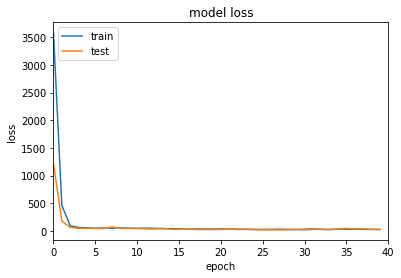

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 24.4864 - root_mean_squared_error: 4.8825 - val_loss: 19.6197 - val_root_mean_squared_error: 4.3557
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 25.9051 - root_mean_squared_error: 5.0257 - val_loss: 23.6107 - val_root_mean_squared_error: 4.7920
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 27.7188 - root_mean_squared_error: 5.2030 - val_loss: 33.3289 - val_root_mean_squared_error: 5.7168
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 28.7124 - root_mean_squared_error: 5.2977 - val_loss: 28.4841 - val_root_mean_squared_error: 5.2761
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 32.2456 - root_mean_squared_error: 5.6213 - val_loss: 27.1716 - val_root_mean_squared_error: 5.1502
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 26.0923 - root_mean_squared_error: 5.0444 - val_loss: 24.4803 - val_root

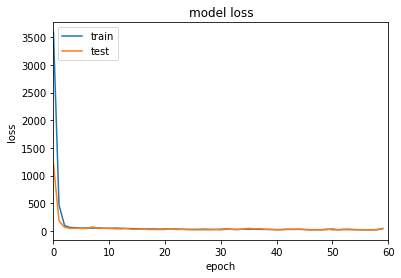

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 2263.8772 - root_mean_squared_error: 47.5784 - val_loss: 596.8243 - val_root_mean_squared_error: 24.4273
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 288.9647 - root_mean_squared_error: 16.9955 - val_loss: 71.2968 - val_root_mean_squared_error: 8.4376
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 81.3422 - root_mean_squared_error: 9.0134 - val_loss: 45.9812 - val_root_mean_squared_error: 6.7735
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 57.3514 - root_mean_squared_error: 7.5663 - val_loss: 46.9724 - val_root_mean_squared_error: 6.8459
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 55.2277 - root_mean_squared_error: 7.4244 - val_loss: 44.5040 - val_root_mean_squared_error: 6.6631
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 52.0667 - root_mean_squared_error: 7.2082 - val_loss: 40.0027 - val

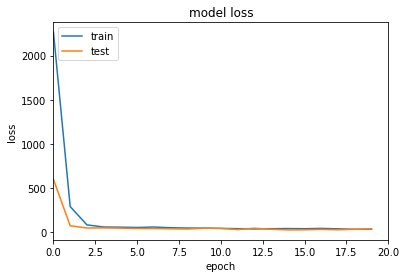

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 34.4536 - root_mean_squared_error: 5.8602 - val_loss: 50.9082 - val_root_mean_squared_error: 7.1272
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 43.3556 - root_mean_squared_error: 6.5761 - val_loss: 68.4015 - val_root_mean_squared_error: 8.2638
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 52.3430 - root_mean_squared_error: 7.2272 - val_loss: 94.6060 - val_root_mean_squared_error: 9.7209
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 53.1285 - root_mean_squared_error: 7.2813 - val_loss: 51.3523 - val_root_mean_squared_error: 7.1583
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 43.7755 - root_mean_squared_error: 6.6080 - val_loss: 25.0748 - val_root_mean_squared_error: 4.9965
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 44.9623 - root_mean_squared_error: 6.6972 - val_loss: 36.7014 - val_ro

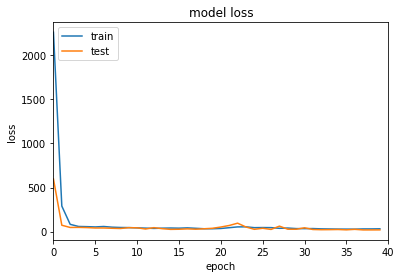

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 30.6468 - root_mean_squared_error: 5.5261 - val_loss: 20.3745 - val_root_mean_squared_error: 4.5017
Epoch 42/60
6/6 [==============================] - 0s 13ms/step - loss: 28.1430 - root_mean_squared_error: 5.2947 - val_loss: 20.3181 - val_root_mean_squared_error: 4.4954
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 26.4759 - root_mean_squared_error: 5.1348 - val_loss: 17.6968 - val_root_mean_squared_error: 4.1938
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 29.2683 - root_mean_squared_error: 5.3999 - val_loss: 17.5332 - val_root_mean_squared_error: 4.1742
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 30.0712 - root_mean_squared_error: 5.4738 - val_loss: 20.8191 - val_root_mean_squared_error: 4.5508
Epoch 46/60
6/6 [==============================] - 0s 14ms/step - loss: 31.8359 - root_mean_squared_error: 5.6327 - val_loss: 18.7041 - val_

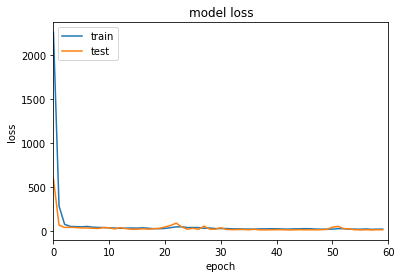

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 2418.1218 - root_mean_squared_error: 49.1735 - val_loss: 578.0632 - val_root_mean_squared_error: 24.0415
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 263.0690 - root_mean_squared_error: 16.2175 - val_loss: 166.7020 - val_root_mean_squared_error: 12.9093
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 101.9606 - root_mean_squared_error: 10.0950 - val_loss: 54.6028 - val_root_mean_squared_error: 7.3860
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 67.1191 - root_mean_squared_error: 8.1895 - val_loss: 46.0081 - val_root_mean_squared_error: 6.7791
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 54.0394 - root_mean_squared_error: 7.3476 - val_loss: 48.2185 - val_root_mean_squared_error: 6.9402
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 53.7016 - root_mean_squared_error: 7.3245 - val_loss: 43.2380 - 

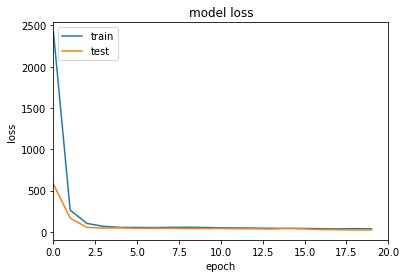

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 39.1574 - root_mean_squared_error: 6.2532 - val_loss: 29.8598 - val_root_mean_squared_error: 5.4594
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 45.2582 - root_mean_squared_error: 6.7233 - val_loss: 48.8495 - val_root_mean_squared_error: 6.9853
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 54.8795 - root_mean_squared_error: 7.4044 - val_loss: 28.6797 - val_root_mean_squared_error: 5.3502
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 34.2385 - root_mean_squared_error: 5.8467 - val_loss: 26.6625 - val_root_mean_squared_error: 5.1583
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 33.2567 - root_mean_squared_error: 5.7621 - val_loss: 38.4877 - val_root_mean_squared_error: 6.1994
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 34.1398 - root_mean_squared_error: 5.8382 - val_loss: 23.8961 - val_ro

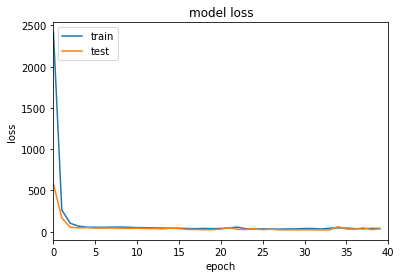

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 42.3022 - root_mean_squared_error: 6.4998 - val_loss: 22.9161 - val_root_mean_squared_error: 4.7814
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 32.6207 - root_mean_squared_error: 5.7067 - val_loss: 24.8126 - val_root_mean_squared_error: 4.9757
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 29.5563 - root_mean_squared_error: 5.4315 - val_loss: 22.2313 - val_root_mean_squared_error: 4.7092
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 30.0588 - root_mean_squared_error: 5.4776 - val_loss: 20.2777 - val_root_mean_squared_error: 4.4970
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 28.2644 - root_mean_squared_error: 5.3113 - val_loss: 23.5956 - val_root_mean_squared_error: 4.8519
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 28.3074 - root_mean_squared_error: 5.3153 - val_loss: 36.2505 - val_roo

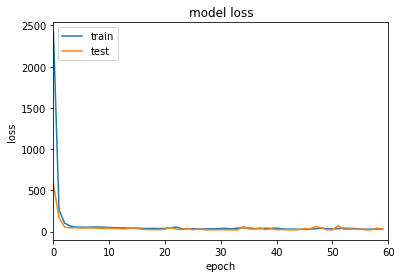

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 1442.9553 - root_mean_squared_error: 37.9852 - val_loss: 249.7050 - val_root_mean_squared_error: 15.8001
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 160.6211 - root_mean_squared_error: 12.6714 - val_loss: 81.6682 - val_root_mean_squared_error: 9.0343
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 58.7251 - root_mean_squared_error: 7.6601 - val_loss: 46.5325 - val_root_mean_squared_error: 6.8179
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 64.9521 - root_mean_squared_error: 8.0563 - val_loss: 50.8245 - val_root_mean_squared_error: 7.1257
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 49.9371 - root_mean_squared_error: 7.0631 - val_loss: 38.2798 - val_root_mean_squared_error: 6.1830
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 41.2461 - root_mean_squared_error: 6.4183 - val_loss: 38.2950 - val

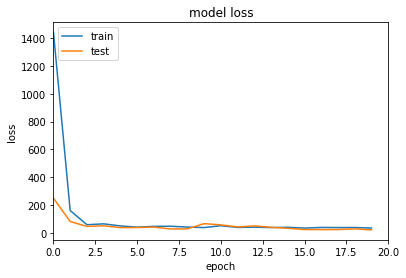

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 32.4632 - root_mean_squared_error: 5.6931 - val_loss: 20.3159 - val_root_mean_squared_error: 4.5015
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 33.3244 - root_mean_squared_error: 5.7682 - val_loss: 24.5105 - val_root_mean_squared_error: 4.9455
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 40.5700 - root_mean_squared_error: 6.3654 - val_loss: 19.1971 - val_root_mean_squared_error: 4.3755
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 36.2975 - root_mean_squared_error: 6.0204 - val_loss: 23.5518 - val_root_mean_squared_error: 4.8476
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 34.0097 - root_mean_squared_error: 5.8273 - val_loss: 37.7861 - val_root_mean_squared_error: 6.1428
Epoch 26/40
6/6 [==============================] - 0s 13ms/step - loss: 41.9754 - root_mean_squared_error: 6.4748 - val_loss: 28.4227 - val_

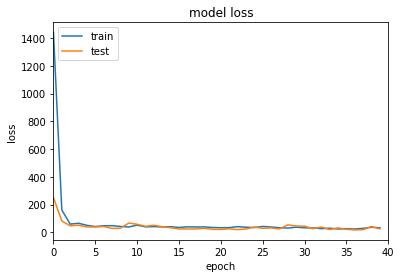

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 23.7710 - root_mean_squared_error: 4.8702 - val_loss: 29.0695 - val_root_mean_squared_error: 5.3868
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 24.5877 - root_mean_squared_error: 4.9534 - val_loss: 26.0710 - val_root_mean_squared_error: 5.1009
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 24.7374 - root_mean_squared_error: 4.9684 - val_loss: 27.3360 - val_root_mean_squared_error: 5.2234
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 21.8467 - root_mean_squared_error: 4.6685 - val_loss: 25.1972 - val_root_mean_squared_error: 5.0145
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 23.2656 - root_mean_squared_error: 4.8181 - val_loss: 17.4865 - val_root_mean_squared_error: 4.1755
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 21.6439 - root_mean_squared_error: 4.6467 - val_loss: 19.3168 - val_r

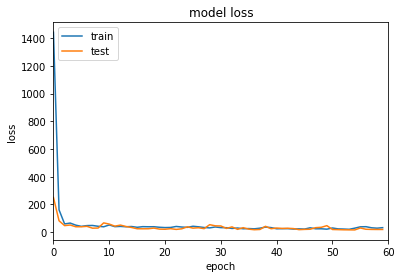

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 1203.9385 - root_mean_squared_error: 34.6851 - val_loss: 544.8117 - val_root_mean_squared_error: 23.3279
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 265.2573 - root_mean_squared_error: 16.2699 - val_loss: 171.5986 - val_root_mean_squared_error: 13.0814
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 87.1314 - root_mean_squared_error: 9.3094 - val_loss: 103.7727 - val_root_mean_squared_error: 10.1639
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 65.3224 - root_mean_squared_error: 8.0528 - val_loss: 80.2353 - val_root_mean_squared_error: 8.9302
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 55.9944 - root_mean_squared_error: 7.4499 - val_loss: 44.2299 - val_root_mean_squared_error: 6.6127
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 57.2132 - root_mean_squared_error: 7.5304 - val_loss: 40.7541 -

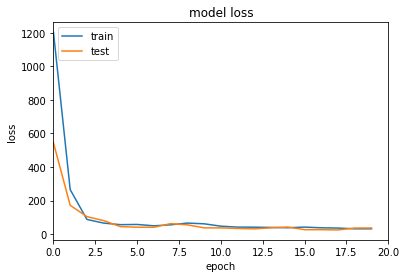

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 29.8481 - root_mean_squared_error: 5.4137 - val_loss: 39.1188 - val_root_mean_squared_error: 6.2111
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 31.9283 - root_mean_squared_error: 5.6023 - val_loss: 81.1628 - val_root_mean_squared_error: 8.9788
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 44.5601 - root_mean_squared_error: 6.6345 - val_loss: 52.4037 - val_root_mean_squared_error: 7.2014
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 32.2833 - root_mean_squared_error: 5.6338 - val_loss: 39.6570 - val_root_mean_squared_error: 6.2541
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 37.3065 - root_mean_squared_error: 6.0633 - val_loss: 26.3164 - val_root_mean_squared_error: 5.0767
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 29.9339 - root_mean_squared_error: 5.4212 - val_loss: 26.9208 - val_ro

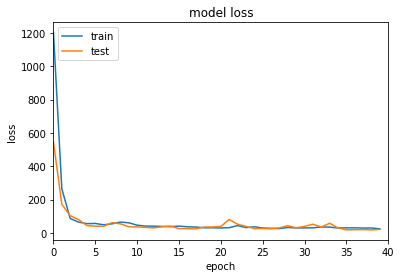

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 24.1631 - root_mean_squared_error: 4.8594 - val_loss: 19.9356 - val_root_mean_squared_error: 4.4029
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 25.2257 - root_mean_squared_error: 4.9675 - val_loss: 20.3276 - val_root_mean_squared_error: 4.4471
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 23.1608 - root_mean_squared_error: 4.7550 - val_loss: 27.6316 - val_root_mean_squared_error: 5.2039
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 28.4402 - root_mean_squared_error: 5.2810 - val_loss: 40.7083 - val_root_mean_squared_error: 6.3370
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 32.4144 - root_mean_squared_error: 5.6449 - val_loss: 25.5952 - val_root_mean_squared_error: 5.0047
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 28.0443 - root_mean_squared_error: 5.2438 - val_loss: 33.0466 - val_

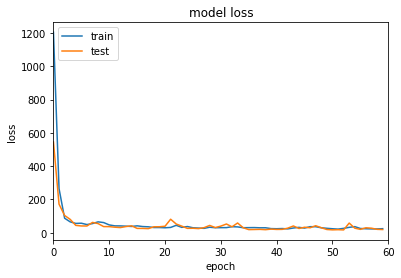

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 1264.4642 - root_mean_squared_error: 35.5579 - val_loss: 441.1372 - val_root_mean_squared_error: 21.0015
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 204.8998 - root_mean_squared_error: 14.3120 - val_loss: 163.9819 - val_root_mean_squared_error: 12.8032
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 83.9995 - root_mean_squared_error: 9.1618 - val_loss: 41.9710 - val_root_mean_squared_error: 6.4738
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 59.8460 - root_mean_squared_error: 7.7320 - val_loss: 41.7181 - val_root_mean_squared_error: 6.4541
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 49.9197 - root_mean_squared_error: 7.0609 - val_loss: 64.6371 - val_root_mean_squared_error: 8.0357
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 52.6890 - root_mean_squared_error: 7.2542 - val_loss: 38.3930 - v

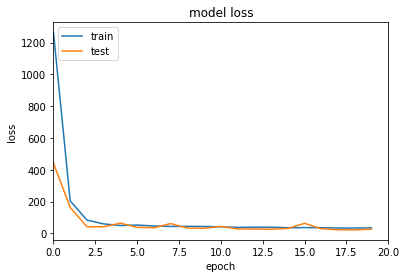

Epoch 21/40
6/6 [==============================] - 0s 22ms/step - loss: 35.1735 - root_mean_squared_error: 5.9248 - val_loss: 22.7425 - val_root_mean_squared_error: 4.7616
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 33.5107 - root_mean_squared_error: 5.7828 - val_loss: 31.4813 - val_root_mean_squared_error: 5.6046
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 39.2053 - root_mean_squared_error: 6.2558 - val_loss: 32.4500 - val_root_mean_squared_error: 5.6903
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 29.4916 - root_mean_squared_error: 5.4241 - val_loss: 41.7214 - val_root_mean_squared_error: 6.4537
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 33.5793 - root_mean_squared_error: 5.7887 - val_loss: 24.6691 - val_root_mean_squared_error: 4.9597
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 31.7315 - root_mean_squared_error: 5.6268 - val_loss: 20.9419 - val_ro

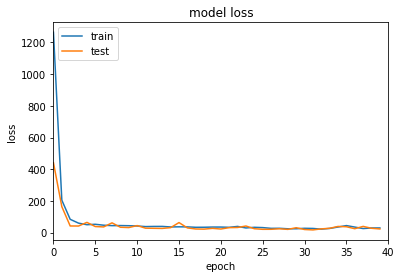

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 34.3455 - root_mean_squared_error: 5.8543 - val_loss: 19.4419 - val_root_mean_squared_error: 4.4010
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 32.2620 - root_mean_squared_error: 5.6735 - val_loss: 23.9576 - val_root_mean_squared_error: 4.8872
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 32.5849 - root_mean_squared_error: 5.7019 - val_loss: 19.7395 - val_root_mean_squared_error: 4.4347
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 38.0437 - root_mean_squared_error: 6.1620 - val_loss: 45.4851 - val_root_mean_squared_error: 6.7388
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 44.7062 - root_mean_squared_error: 6.6808 - val_loss: 51.3912 - val_root_mean_squared_error: 7.1637
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 39.3948 - root_mean_squared_error: 6.2707 - val_loss: 31.6148 - val_ro

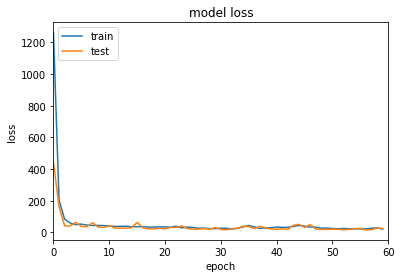

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 4558.7520 - root_mean_squared_error: 67.5184 - val_loss: 138.7602 - val_root_mean_squared_error: 11.7791
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 372.8656 - root_mean_squared_error: 19.3094 - val_loss: 88.7775 - val_root_mean_squared_error: 9.4216
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 173.1013 - root_mean_squared_error: 13.1564 - val_loss: 78.1662 - val_root_mean_squared_error: 8.8406
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 73.1206 - root_mean_squared_error: 8.5504 - val_loss: 54.0487 - val_root_mean_squared_error: 7.3510
Epoch 5/20
6/6 [==============================] - 0s 14ms/step - loss: 62.9810 - root_mean_squared_error: 7.9353 - val_loss: 52.0065 - val_root_mean_squared_error: 7.2108
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 60.3770 - root_mean_squared_error: 7.7695 - val_loss: 53.5294 - v

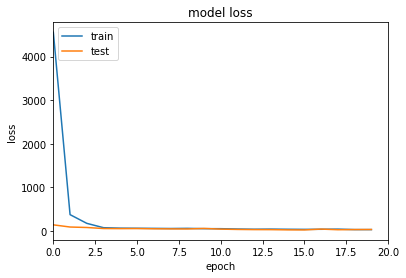

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 37.2910 - root_mean_squared_error: 6.1056 - val_loss: 23.3990 - val_root_mean_squared_error: 4.8360
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 31.2621 - root_mean_squared_error: 5.5902 - val_loss: 21.5926 - val_root_mean_squared_error: 4.6455
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 31.3209 - root_mean_squared_error: 5.5954 - val_loss: 31.2018 - val_root_mean_squared_error: 5.5848
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 29.6893 - root_mean_squared_error: 5.4477 - val_loss: 44.7228 - val_root_mean_squared_error: 6.6866
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 34.3885 - root_mean_squared_error: 5.8631 - val_loss: 25.5227 - val_root_mean_squared_error: 5.0508
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 33.0965 - root_mean_squared_error: 5.7519 - val_loss: 51.4365 - val_r

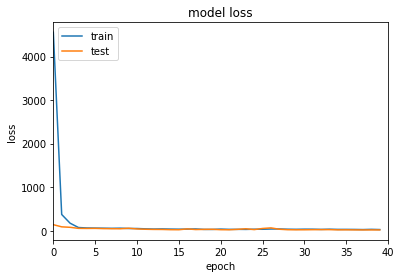

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 25.3865 - root_mean_squared_error: 5.0373 - val_loss: 17.6330 - val_root_mean_squared_error: 4.1977
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 26.4522 - root_mean_squared_error: 5.1420 - val_loss: 18.5314 - val_root_mean_squared_error: 4.3034
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 24.1235 - root_mean_squared_error: 4.9103 - val_loss: 21.9806 - val_root_mean_squared_error: 4.6870
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 28.0618 - root_mean_squared_error: 5.2962 - val_loss: 26.1555 - val_root_mean_squared_error: 5.1131
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 30.3457 - root_mean_squared_error: 5.5076 - val_loss: 25.3273 - val_root_mean_squared_error: 5.0314
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 35.7049 - root_mean_squared_error: 5.9743 - val_loss: 31.4086 - val_ro

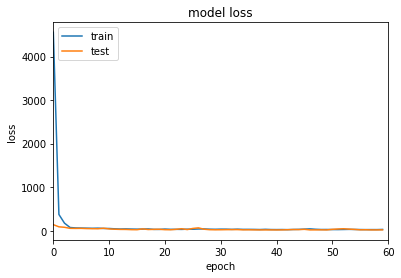

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 6114.8438 - root_mean_squared_error: 78.1974 - val_loss: 2393.2048 - val_root_mean_squared_error: 48.9203
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 857.3779 - root_mean_squared_error: 29.2809 - val_loss: 608.9778 - val_root_mean_squared_error: 24.6774
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 253.8720 - root_mean_squared_error: 15.9332 - val_loss: 55.2801 - val_root_mean_squared_error: 7.4347
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 86.7656 - root_mean_squared_error: 9.3145 - val_loss: 65.4454 - val_root_mean_squared_error: 8.0895
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 62.5160 - root_mean_squared_error: 7.9064 - val_loss: 43.4777 - val_root_mean_squared_error: 6.5934
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 52.1576 - root_mean_squared_error: 7.2216 - val_loss: 41.7425 - 

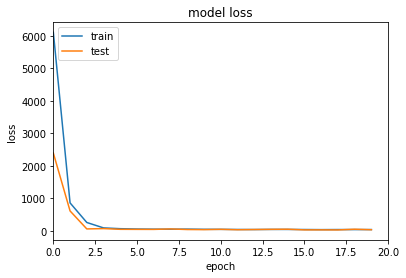

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 34.5362 - root_mean_squared_error: 5.8762 - val_loss: 24.6902 - val_root_mean_squared_error: 4.9683
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 33.7437 - root_mean_squared_error: 5.8084 - val_loss: 23.6585 - val_root_mean_squared_error: 4.8634
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 32.8515 - root_mean_squared_error: 5.7311 - val_loss: 25.6727 - val_root_mean_squared_error: 5.0662
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 30.9313 - root_mean_squared_error: 5.5611 - val_loss: 32.3393 - val_root_mean_squared_error: 5.6862
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 34.3244 - root_mean_squared_error: 5.8582 - val_loss: 23.6134 - val_root_mean_squared_error: 4.8588
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 31.0019 - root_mean_squared_error: 5.5674 - val_loss: 26.6328 - val_r

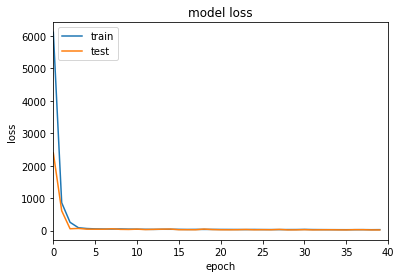

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 32.3682 - root_mean_squared_error: 5.6888 - val_loss: 22.6717 - val_root_mean_squared_error: 4.7609
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 31.0916 - root_mean_squared_error: 5.5755 - val_loss: 28.5454 - val_root_mean_squared_error: 5.3422
Epoch 43/60
6/6 [==============================] - 0s 14ms/step - loss: 37.9631 - root_mean_squared_error: 6.1609 - val_loss: 42.5785 - val_root_mean_squared_error: 6.5248
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 38.1748 - root_mean_squared_error: 6.1781 - val_loss: 24.9650 - val_root_mean_squared_error: 4.9959
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 29.8770 - root_mean_squared_error: 5.4654 - val_loss: 20.8481 - val_root_mean_squared_error: 4.5653
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 25.3943 - root_mean_squared_error: 5.0387 - val_loss: 40.5991 - val_ro

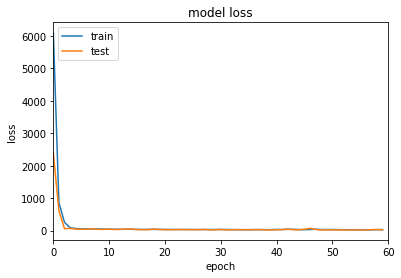

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 340.6592 - root_mean_squared_error: 18.2050 - val_loss: 227.5374 - val_root_mean_squared_error: 14.8117
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 220.0145 - root_mean_squared_error: 14.5662 - val_loss: 169.4048 - val_root_mean_squared_error: 12.7222
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 168.8145 - root_mean_squared_error: 12.6985 - val_loss: 129.7899 - val_root_mean_squared_error: 11.0499
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 132.8526 - root_mean_squared_error: 11.1834 - val_loss: 102.8420 - val_root_mean_squared_error: 9.7474
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 109.2861 - root_mean_squared_error: 10.0760 - val_loss: 86.2029 - val_root_mean_squared_error: 8.8640
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 94.8357 - root_mean_squared_error: 9.3421 - val_loss: 77.

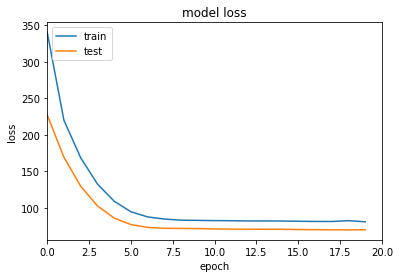

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 81.3812 - root_mean_squared_error: 8.7509 - val_loss: 70.2831 - val_root_mean_squared_error: 8.0957
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 81.0806 - root_mean_squared_error: 8.7422 - val_loss: 69.7096 - val_root_mean_squared_error: 8.0757
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 80.8292 - root_mean_squared_error: 8.7434 - val_loss: 69.5138 - val_root_mean_squared_error: 8.0795
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 80.8818 - root_mean_squared_error: 8.7569 - val_loss: 69.2683 - val_root_mean_squared_error: 8.0720
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 81.2889 - root_mean_squared_error: 8.7922 - val_loss: 68.9291 - val_root_mean_squared_error: 8.0596
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 80.1911 - root_mean_squared_error: 8.7269 - val_loss: 69.1870 - val_

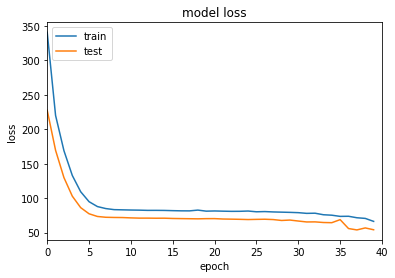

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 63.0444 - root_mean_squared_error: 7.7415 - val_loss: 48.3895 - val_root_mean_squared_error: 6.7259
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 57.9781 - root_mean_squared_error: 7.4029 - val_loss: 50.9116 - val_root_mean_squared_error: 6.9079
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 63.2522 - root_mean_squared_error: 7.7490 - val_loss: 75.5030 - val_root_mean_squared_error: 8.5003
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 75.9698 - root_mean_squared_error: 8.5296 - val_loss: 68.5382 - val_root_mean_squared_error: 8.0788
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 87.7129 - root_mean_squared_error: 9.1805 - val_loss: 71.3157 - val_root_mean_squared_error: 8.2379
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 83.5080 - root_mean_squared_error: 8.9467 - val_loss: 69.6473 - val_

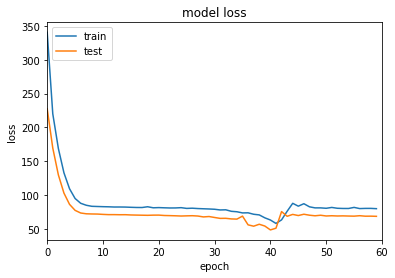

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 328.0180 - root_mean_squared_error: 17.8815 - val_loss: 216.9394 - val_root_mean_squared_error: 14.4783
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 210.0463 - root_mean_squared_error: 14.2489 - val_loss: 162.5030 - val_root_mean_squared_error: 12.4820
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 160.9410 - root_mean_squared_error: 12.4205 - val_loss: 124.4390 - val_root_mean_squared_error: 10.8483
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 127.2391 - root_mean_squared_error: 10.9731 - val_loss: 98.7965 - val_root_mean_squared_error: 9.5883
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 104.9011 - root_mean_squared_error: 9.9040 - val_loss: 82.9828 - val_root_mean_squared_error: 8.7324
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 91.5883 - root_mean_squared_error: 9.2144 - val_loss: 74.8792

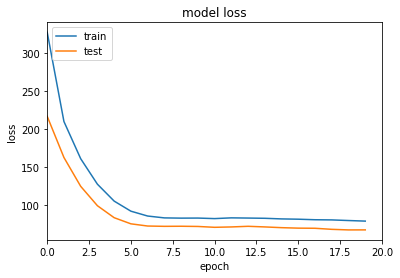

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 79.4119 - root_mean_squared_error: 8.6618 - val_loss: 68.4858 - val_root_mean_squared_error: 8.0110
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 77.3462 - root_mean_squared_error: 8.5508 - val_loss: 64.7235 - val_root_mean_squared_error: 7.7832
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 76.1262 - root_mean_squared_error: 8.4862 - val_loss: 62.9298 - val_root_mean_squared_error: 7.6726
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 74.3196 - root_mean_squared_error: 8.3848 - val_loss: 61.2905 - val_root_mean_squared_error: 7.5716
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 72.6465 - root_mean_squared_error: 8.2903 - val_loss: 60.0521 - val_root_mean_squared_error: 7.4956
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 71.5457 - root_mean_squared_error: 8.2284 - val_loss: 59.5641 - val_root

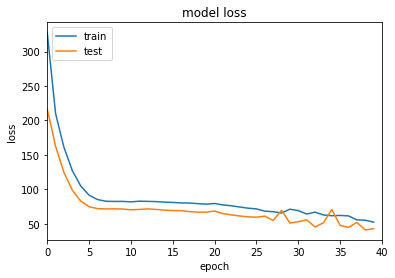

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 49.9733 - root_mean_squared_error: 6.8493 - val_loss: 37.5299 - val_root_mean_squared_error: 5.8706
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 53.7463 - root_mean_squared_error: 7.1226 - val_loss: 35.9836 - val_root_mean_squared_error: 5.7423
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 56.2118 - root_mean_squared_error: 7.2921 - val_loss: 72.1573 - val_root_mean_squared_error: 8.3166
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 52.7631 - root_mean_squared_error: 7.0531 - val_loss: 37.9120 - val_root_mean_squared_error: 5.9079
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 49.4908 - root_mean_squared_error: 6.8195 - val_loss: 32.4830 - val_root_mean_squared_error: 5.4255
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 43.9764 - root_mean_squared_error: 6.3989 - val_loss: 41.3762 - val_ro

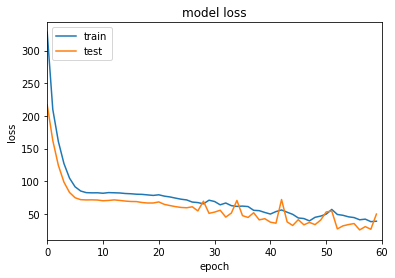

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 397.0006 - root_mean_squared_error: 19.7195 - val_loss: 273.3233 - val_root_mean_squared_error: 16.3196
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 267.0496 - root_mean_squared_error: 16.1386 - val_loss: 216.5171 - val_root_mean_squared_error: 14.5022
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 216.3977 - root_mean_squared_error: 14.4988 - val_loss: 175.0420 - val_root_mean_squared_error: 12.9903
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 176.7521 - root_mean_squared_error: 13.0517 - val_loss: 140.4391 - val_root_mean_squared_error: 11.5720
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 143.2116 - root_mean_squared_error: 11.6880 - val_loss: 112.2029 - val_root_mean_squared_error: 10.2688
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 116.5754 - root_mean_squared_error: 10.4710 - val_loss: 9

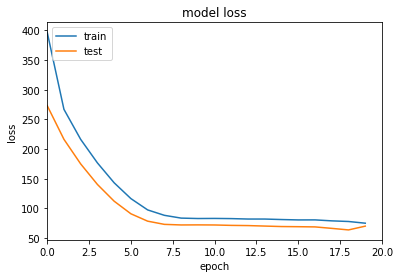

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 77.6575 - root_mean_squared_error: 8.5324 - val_loss: 70.0916 - val_root_mean_squared_error: 8.0822
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 82.2835 - root_mean_squared_error: 8.8071 - val_loss: 70.3254 - val_root_mean_squared_error: 8.1002
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 80.3735 - root_mean_squared_error: 8.6980 - val_loss: 64.3181 - val_root_mean_squared_error: 7.7216
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 79.4549 - root_mean_squared_error: 8.6463 - val_loss: 58.1002 - val_root_mean_squared_error: 7.3043
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 76.0574 - root_mean_squared_error: 8.4468 - val_loss: 62.6133 - val_root_mean_squared_error: 7.6073
Epoch 26/40
6/6 [==============================] - 0s 13ms/step - loss: 71.7362 - root_mean_squared_error: 8.1888 - val_loss: 60.4171 - val_roo

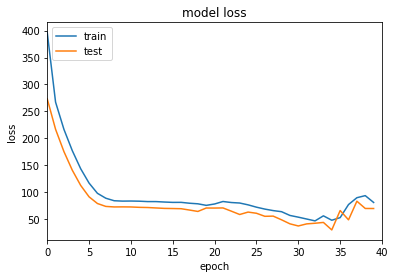

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 79.5583 - root_mean_squared_error: 8.6935 - val_loss: 69.4525 - val_root_mean_squared_error: 8.0925
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 79.6905 - root_mean_squared_error: 8.7042 - val_loss: 69.1256 - val_root_mean_squared_error: 8.0783
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 78.8789 - root_mean_squared_error: 8.6623 - val_loss: 68.8670 - val_root_mean_squared_error: 8.0664
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 73.7108 - root_mean_squared_error: 8.3629 - val_loss: 45.2177 - val_root_mean_squared_error: 6.4423
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 54.1641 - root_mean_squared_error: 7.1032 - val_loss: 42.8531 - val_root_mean_squared_error: 6.2501
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 51.2519 - root_mean_squared_error: 6.8939 - val_loss: 39.2293 - val_

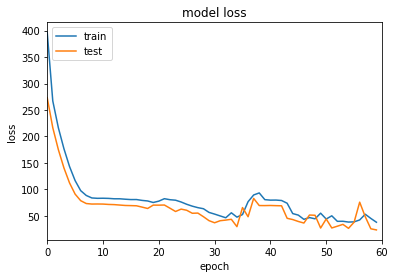

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 376.8671 - root_mean_squared_error: 19.1982 - val_loss: 254.5245 - val_root_mean_squared_error: 15.7171
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 249.2837 - root_mean_squared_error: 15.5571 - val_loss: 202.3145 - val_root_mean_squared_error: 13.9747
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 203.2307 - root_mean_squared_error: 14.0080 - val_loss: 164.1049 - val_root_mean_squared_error: 12.5311
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 166.2046 - root_mean_squared_error: 12.6127 - val_loss: 134.5354 - val_root_mean_squared_error: 11.2875
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 139.7375 - root_mean_squared_error: 11.5183 - val_loss: 111.7054 - val_root_mean_squared_error: 10.2343
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 119.2868 - root_mean_squared_error: 10.6006 - val_loss: 9

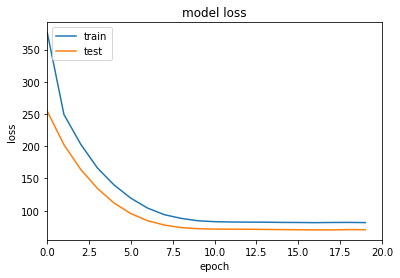

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 81.4877 - root_mean_squared_error: 8.7529 - val_loss: 70.0847 - val_root_mean_squared_error: 8.0803
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 81.2354 - root_mean_squared_error: 8.7452 - val_loss: 70.0029 - val_root_mean_squared_error: 8.0812
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 81.0081 - root_mean_squared_error: 8.7387 - val_loss: 69.8390 - val_root_mean_squared_error: 8.0815
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 80.8785 - root_mean_squared_error: 8.7427 - val_loss: 69.5827 - val_root_mean_squared_error: 8.0786
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 80.7729 - root_mean_squared_error: 8.7485 - val_loss: 69.4207 - val_root_mean_squared_error: 8.0805
Epoch 26/40
6/6 [==============================] - 0s 13ms/step - loss: 80.7564 - root_mean_squared_error: 8.7538 - val_loss: 69.4049 - val_r

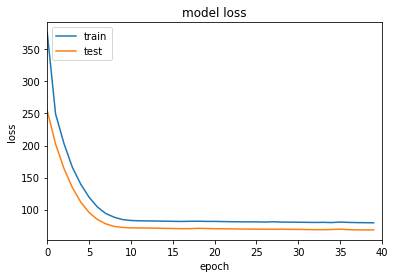

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 79.4794 - root_mean_squared_error: 8.7539 - val_loss: 68.2299 - val_root_mean_squared_error: 8.0866
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 79.3287 - root_mean_squared_error: 8.7454 - val_loss: 68.2198 - val_root_mean_squared_error: 8.0888
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 79.4741 - root_mean_squared_error: 8.7613 - val_loss: 67.8864 - val_root_mean_squared_error: 8.0788
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 79.0915 - root_mean_squared_error: 8.7446 - val_loss: 68.0684 - val_root_mean_squared_error: 8.0895
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 79.1032 - root_mean_squared_error: 8.7459 - val_loss: 67.9493 - val_root_mean_squared_error: 8.0880
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 78.8176 - root_mean_squared_error: 8.7367 - val_loss: 67.6520 - val_r

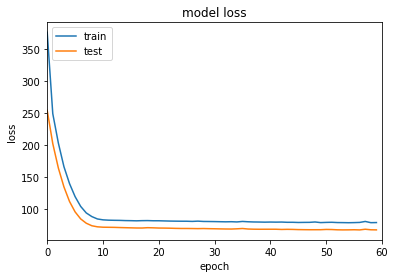

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 285.1565 - root_mean_squared_error: 16.8336 - val_loss: 173.2744 - val_root_mean_squared_error: 13.1029
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 169.2763 - root_mean_squared_error: 12.9502 - val_loss: 126.8520 - val_root_mean_squared_error: 11.1921
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 127.8702 - root_mean_squared_error: 11.2352 - val_loss: 99.2128 - val_root_mean_squared_error: 9.8731
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 105.3409 - root_mean_squared_error: 10.1756 - val_loss: 80.7312 - val_root_mean_squared_error: 8.8797
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 89.3272 - root_mean_squared_error: 9.3493 - val_loss: 70.9368 - val_root_mean_squared_error: 8.3051
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 80.7024 - root_mean_squared_error: 8.8731 - val_loss: 67.6383 - 

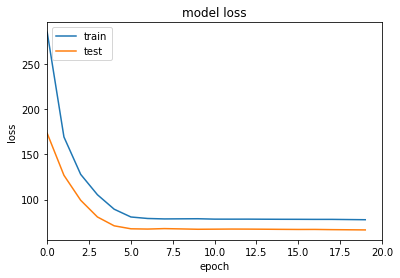

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 77.5677 - root_mean_squared_error: 8.7189 - val_loss: 66.2394 - val_root_mean_squared_error: 8.0437
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 77.4268 - root_mean_squared_error: 8.7117 - val_loss: 66.0921 - val_root_mean_squared_error: 8.0354
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 78.2200 - root_mean_squared_error: 8.7578 - val_loss: 66.8036 - val_root_mean_squared_error: 8.0801
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.7967 - root_mean_squared_error: 8.7334 - val_loss: 67.8782 - val_root_mean_squared_error: 8.1446
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 78.5122 - root_mean_squared_error: 8.7735 - val_loss: 67.5764 - val_root_mean_squared_error: 8.1271
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 78.2211 - root_mean_squared_error: 8.7582 - val_loss: 66.9089 - val_ro

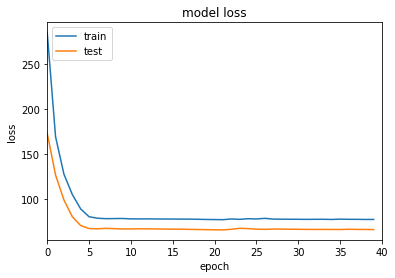

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 77.6166 - root_mean_squared_error: 8.7418 - val_loss: 66.4613 - val_root_mean_squared_error: 8.0798
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.5736 - root_mean_squared_error: 8.7413 - val_loss: 66.4369 - val_root_mean_squared_error: 8.0802
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 77.6784 - root_mean_squared_error: 8.7480 - val_loss: 66.5658 - val_root_mean_squared_error: 8.0882
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 77.5518 - root_mean_squared_error: 8.7417 - val_loss: 66.4538 - val_root_mean_squared_error: 8.0831
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 77.4924 - root_mean_squared_error: 8.7398 - val_loss: 66.4401 - val_root_mean_squared_error: 8.0838
Epoch 46/60
6/6 [==============================] - 0s 13ms/step - loss: 77.5861 - root_mean_squared_error: 8.7470 - val_loss: 66.3237 - val_

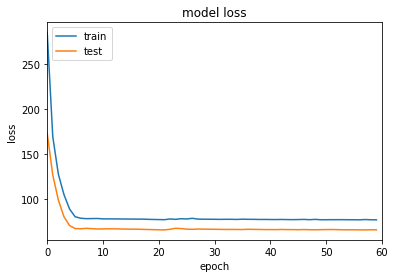

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 367.5738 - root_mean_squared_error: 19.1484 - val_loss: 255.9665 - val_root_mean_squared_error: 15.9743
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 251.0992 - root_mean_squared_error: 15.8224 - val_loss: 203.3743 - val_root_mean_squared_error: 14.2357
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 202.3222 - root_mean_squared_error: 14.1984 - val_loss: 162.5584 - val_root_mean_squared_error: 12.7198
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 164.5383 - root_mean_squared_error: 12.7957 - val_loss: 127.5100 - val_root_mean_squared_error: 11.2527
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 130.1951 - root_mean_squared_error: 11.3689 - val_loss: 99.0728 - val_root_mean_squared_error: 9.9014
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 104.0133 - root_mean_squared_error: 10.1454 - val_loss: 8

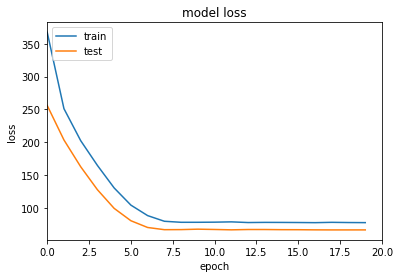

Epoch 21/40
6/6 [==============================] - 0s 27ms/step - loss: 77.3217 - root_mean_squared_error: 8.7398 - val_loss: 66.2306 - val_root_mean_squared_error: 8.0810
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 77.4039 - root_mean_squared_error: 8.7452 - val_loss: 66.3070 - val_root_mean_squared_error: 8.0863
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 77.3260 - root_mean_squared_error: 8.7414 - val_loss: 66.2936 - val_root_mean_squared_error: 8.0864
Epoch 24/40
6/6 [==============================] - 0s 15ms/step - loss: 77.3100 - root_mean_squared_error: 8.7414 - val_loss: 66.1655 - val_root_mean_squared_error: 8.0793
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 77.2317 - root_mean_squared_error: 8.7376 - val_loss: 66.1404 - val_root_mean_squared_error: 8.0782
Epoch 26/40
6/6 [==============================] - 0s 16ms/step - loss: 77.5995 - root_mean_squared_error: 8.7585 - val_loss: 66.1605 - val_

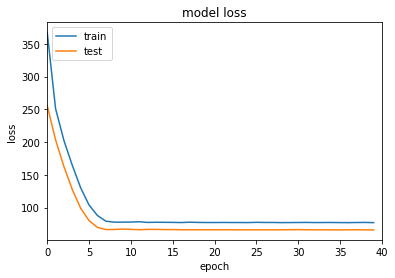

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 77.1680 - root_mean_squared_error: 8.7401 - val_loss: 66.1350 - val_root_mean_squared_error: 8.0845
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 77.2092 - root_mean_squared_error: 8.7430 - val_loss: 66.0542 - val_root_mean_squared_error: 8.0803
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1840 - root_mean_squared_error: 8.7419 - val_loss: 66.0863 - val_root_mean_squared_error: 8.0824
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 77.2214 - root_mean_squared_error: 8.7443 - val_loss: 66.0814 - val_root_mean_squared_error: 8.0825
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 77.1387 - root_mean_squared_error: 8.7400 - val_loss: 66.0322 - val_root_mean_squared_error: 8.0800
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 77.3019 - root_mean_squared_error: 8.7496 - val_loss: 66.0669 - val_

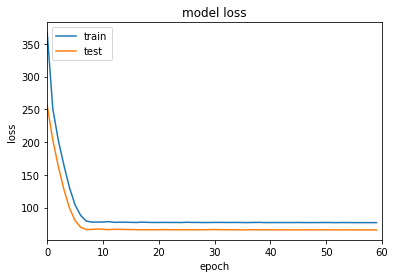

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 386.1591 - root_mean_squared_error: 19.6297 - val_loss: 264.6693 - val_root_mean_squared_error: 16.2464
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 257.4714 - root_mean_squared_error: 16.0245 - val_loss: 205.2163 - val_root_mean_squared_error: 14.3024
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 204.3557 - root_mean_squared_error: 14.2722 - val_loss: 162.5354 - val_root_mean_squared_error: 12.7219
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 164.9270 - root_mean_squared_error: 12.8143 - val_loss: 129.9889 - val_root_mean_squared_error: 11.3677
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 133.6120 - root_mean_squared_error: 11.5251 - val_loss: 104.9309 - val_root_mean_squared_error: 10.2038
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 110.3322 - root_mean_squared_error: 10.4639 - val_loss: 

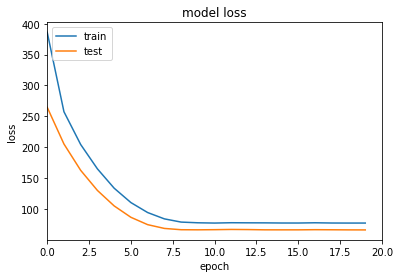

Epoch 21/40
6/6 [==============================] - 0s 21ms/step - loss: 77.2229 - root_mean_squared_error: 8.7421 - val_loss: 66.0533 - val_root_mean_squared_error: 8.0784
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 77.4440 - root_mean_squared_error: 8.7554 - val_loss: 66.0442 - val_root_mean_squared_error: 8.0786
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 77.2343 - root_mean_squared_error: 8.7433 - val_loss: 66.1138 - val_root_mean_squared_error: 8.0818
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.1873 - root_mean_squared_error: 8.7400 - val_loss: 66.1833 - val_root_mean_squared_error: 8.0860
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 77.1611 - root_mean_squared_error: 8.7388 - val_loss: 66.1549 - val_root_mean_squared_error: 8.0850
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 77.1882 - root_mean_squared_error: 8.7409 - val_loss: 66.1413 - val_root

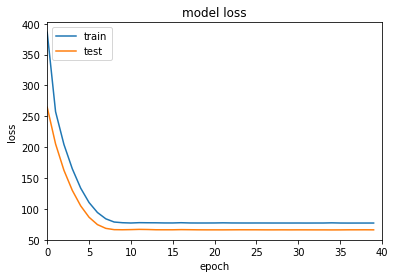

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 77.0741 - root_mean_squared_error: 8.7400 - val_loss: 66.0169 - val_root_mean_squared_error: 8.0831
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.0616 - root_mean_squared_error: 8.7399 - val_loss: 65.9537 - val_root_mean_squared_error: 8.0798
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 77.2710 - root_mean_squared_error: 8.7524 - val_loss: 65.9405 - val_root_mean_squared_error: 8.0795
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 77.4677 - root_mean_squared_error: 8.7631 - val_loss: 66.2669 - val_root_mean_squared_error: 8.0981
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1711 - root_mean_squared_error: 8.7454 - val_loss: 66.2562 - val_root_mean_squared_error: 8.0976
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1942 - root_mean_squared_error: 8.7472 - val_loss: 66.0752 - val_ro

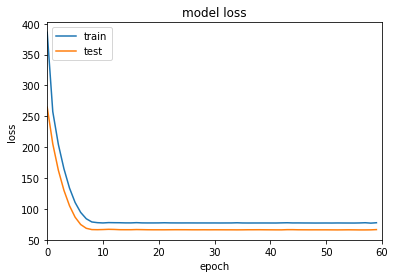

Epoch 1/20
6/6 [==============================] - 1s 56ms/step - loss: 307.0291 - root_mean_squared_error: 17.4989 - val_loss: 198.3580 - val_root_mean_squared_error: 14.0584
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 191.5140 - root_mean_squared_error: 13.8138 - val_loss: 143.5392 - val_root_mean_squared_error: 11.9527
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 143.4819 - root_mean_squared_error: 11.9498 - val_loss: 108.7364 - val_root_mean_squared_error: 10.3931
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 112.2901 - root_mean_squared_error: 10.5615 - val_loss: 86.0750 - val_root_mean_squared_error: 9.2355
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 91.5460 - root_mean_squared_error: 9.5263 - val_loss: 72.2186 - val_root_mean_squared_error: 8.4497
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 81.3195 - root_mean_squared_error: 8.9712 - val_loss: 66.8658 

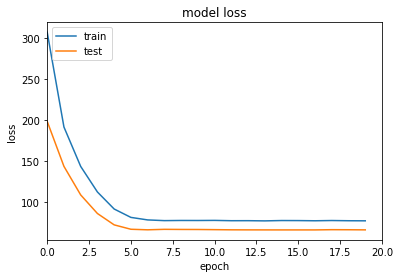

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 77.3264 - root_mean_squared_error: 8.7506 - val_loss: 66.1500 - val_root_mean_squared_error: 8.0872
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 77.0516 - root_mean_squared_error: 8.7355 - val_loss: 66.0377 - val_root_mean_squared_error: 8.0808
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 77.1173 - root_mean_squared_error: 8.7398 - val_loss: 66.0032 - val_root_mean_squared_error: 8.0792
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 77.1058 - root_mean_squared_error: 8.7395 - val_loss: 65.9882 - val_root_mean_squared_error: 8.0788
Epoch 25/40
6/6 [==============================] - 0s 12ms/step - loss: 77.2458 - root_mean_squared_error: 8.7480 - val_loss: 65.9995 - val_root_mean_squared_error: 8.0797
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 77.2425 - root_mean_squared_error: 8.7479 - val_loss: 66.0034 - val_

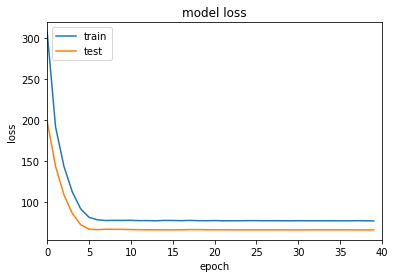

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 77.0897 - root_mean_squared_error: 8.7424 - val_loss: 66.1540 - val_root_mean_squared_error: 8.0929
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.0991 - root_mean_squared_error: 8.7432 - val_loss: 66.0984 - val_root_mean_squared_error: 8.0901
Epoch 43/60
6/6 [==============================] - 0s 14ms/step - loss: 77.1692 - root_mean_squared_error: 8.7479 - val_loss: 65.9571 - val_root_mean_squared_error: 8.0820
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 77.0175 - root_mean_squared_error: 8.7397 - val_loss: 65.9348 - val_root_mean_squared_error: 8.0812
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 77.0777 - root_mean_squared_error: 8.7436 - val_loss: 65.9467 - val_root_mean_squared_error: 8.0823
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 77.0152 - root_mean_squared_error: 8.7403 - val_loss: 65.9441 - val_r

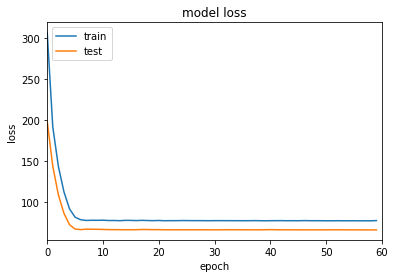

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 331.8343 - root_mean_squared_error: 18.1868 - val_loss: 218.7984 - val_root_mean_squared_error: 14.7579
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 211.7857 - root_mean_squared_error: 14.5176 - val_loss: 165.7037 - val_root_mean_squared_error: 12.8303
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 164.9033 - root_mean_squared_error: 12.7969 - val_loss: 127.5234 - val_root_mean_squared_error: 11.2380
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 130.1358 - root_mean_squared_error: 11.3512 - val_loss: 98.2975 - val_root_mean_squared_error: 9.8451
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 102.6229 - root_mean_squared_error: 10.0592 - val_loss: 79.6930 - val_root_mean_squared_error: 8.8402
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 87.0793 - root_mean_squared_error: 9.2455 - val_loss: 70.3173 

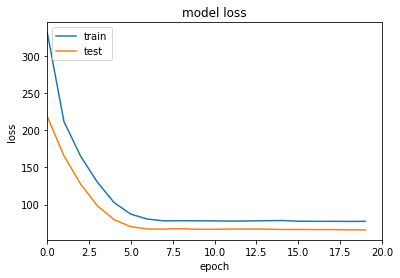

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 76.7854 - root_mean_squared_error: 8.6942 - val_loss: 65.7761 - val_root_mean_squared_error: 8.0365
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 76.8200 - root_mean_squared_error: 8.6969 - val_loss: 65.4562 - val_root_mean_squared_error: 8.0176
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 76.6731 - root_mean_squared_error: 8.6893 - val_loss: 65.3689 - val_root_mean_squared_error: 8.0130
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 76.7640 - root_mean_squared_error: 8.6954 - val_loss: 66.4240 - val_root_mean_squared_error: 8.0795
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 77.6812 - root_mean_squared_error: 8.7486 - val_loss: 67.3616 - val_root_mean_squared_error: 8.1377
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 78.0393 - root_mean_squared_error: 8.7698 - val_loss: 67.1089 - val_roo

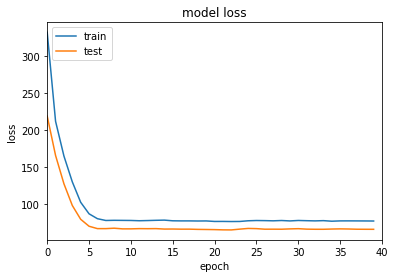

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 77.2257 - root_mean_squared_error: 8.7359 - val_loss: 66.2176 - val_root_mean_squared_error: 8.0819
Epoch 42/60
6/6 [==============================] - 0s 14ms/step - loss: 77.2011 - root_mean_squared_error: 8.7353 - val_loss: 66.2305 - val_root_mean_squared_error: 8.0834
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 77.2726 - root_mean_squared_error: 8.7401 - val_loss: 66.2750 - val_root_mean_squared_error: 8.0871
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 77.2092 - root_mean_squared_error: 8.7376 - val_loss: 66.1348 - val_root_mean_squared_error: 8.0800
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 77.2615 - root_mean_squared_error: 8.7418 - val_loss: 66.1013 - val_root_mean_squared_error: 8.0792
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 77.4949 - root_mean_squared_error: 8.7567 - val_loss: 66.1149 - val_roo

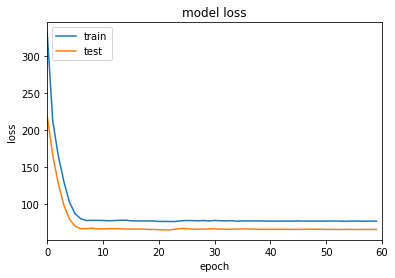

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 312.6175 - root_mean_squared_error: 17.6757 - val_loss: 207.9989 - val_root_mean_squared_error: 14.4161
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 199.5251 - root_mean_squared_error: 14.1191 - val_loss: 153.1414 - val_root_mean_squared_error: 12.3676
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 151.4097 - root_mean_squared_error: 12.2971 - val_loss: 115.4338 - val_root_mean_squared_error: 10.7345
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 118.3360 - root_mean_squared_error: 10.8684 - val_loss: 88.9855 - val_root_mean_squared_error: 9.4211
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 95.6562 - root_mean_squared_error: 9.7681 - val_loss: 72.8731 - val_root_mean_squared_error: 8.5213
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 81.0645 - root_mean_squared_error: 8.9885 - val_loss: 66.5603 -

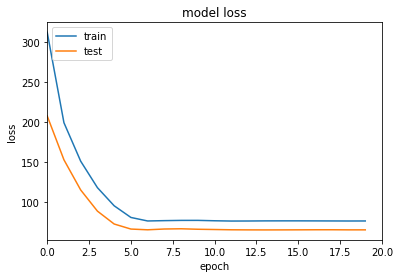

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 76.6481 - root_mean_squared_error: 8.7402 - val_loss: 65.5358 - val_root_mean_squared_error: 8.0796
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6374 - root_mean_squared_error: 8.7398 - val_loss: 65.5198 - val_root_mean_squared_error: 8.0788
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6276 - root_mean_squared_error: 8.7394 - val_loss: 65.5207 - val_root_mean_squared_error: 8.0791
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6360 - root_mean_squared_error: 8.7400 - val_loss: 65.5243 - val_root_mean_squared_error: 8.0794
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6059 - root_mean_squared_error: 8.7384 - val_loss: 65.5722 - val_root_mean_squared_error: 8.0824
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6046 - root_mean_squared_error: 8.7383 - val_loss: 65.6107 - val_

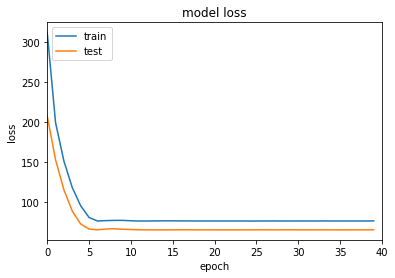

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 76.7532 - root_mean_squared_error: 8.7483 - val_loss: 65.5297 - val_root_mean_squared_error: 8.0815
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 76.6053 - root_mean_squared_error: 8.7400 - val_loss: 65.5355 - val_root_mean_squared_error: 8.0819
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.6270 - root_mean_squared_error: 8.7412 - val_loss: 65.5565 - val_root_mean_squared_error: 8.0833
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5549 - root_mean_squared_error: 8.7373 - val_loss: 65.4683 - val_root_mean_squared_error: 8.0780
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5915 - root_mean_squared_error: 8.7395 - val_loss: 65.4096 - val_root_mean_squared_error: 8.0746
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.6215 - root_mean_squared_error: 8.7414 - val_loss: 65.2635 - val_r

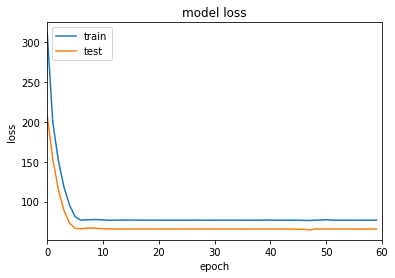

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 309.5244 - root_mean_squared_error: 17.5906 - val_loss: 201.1724 - val_root_mean_squared_error: 14.1805
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 195.0565 - root_mean_squared_error: 13.9632 - val_loss: 152.3165 - val_root_mean_squared_error: 12.3382
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 153.0729 - root_mean_squared_error: 12.3687 - val_loss: 116.2625 - val_root_mean_squared_error: 10.7783
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 120.1594 - root_mean_squared_error: 10.9574 - val_loss: 90.1605 - val_root_mean_squared_error: 9.4899
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 96.8638 - root_mean_squared_error: 9.8366 - val_loss: 73.9768 - val_root_mean_squared_error: 8.5945
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 82.4852 - root_mean_squared_error: 9.0758 - val_loss: 66.9873

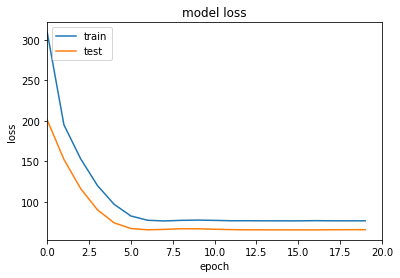

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 76.5702 - root_mean_squared_error: 8.7441 - val_loss: 65.4562 - val_root_mean_squared_error: 8.0837
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5381 - root_mean_squared_error: 8.7424 - val_loss: 65.4073 - val_root_mean_squared_error: 8.0808
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 76.4668 - root_mean_squared_error: 8.7383 - val_loss: 65.4523 - val_root_mean_squared_error: 8.0835
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4944 - root_mean_squared_error: 8.7399 - val_loss: 65.4898 - val_root_mean_squared_error: 8.0858
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5028 - root_mean_squared_error: 8.7404 - val_loss: 65.4777 - val_root_mean_squared_error: 8.0851
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4555 - root_mean_squared_error: 8.7377 - val_loss: 65.4275 - val_r

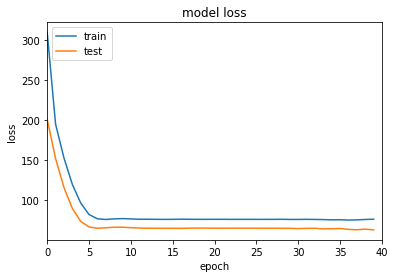

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 76.2196 - root_mean_squared_error: 8.7241 - val_loss: 65.6425 - val_root_mean_squared_error: 8.0952
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 76.5814 - root_mean_squared_error: 8.7447 - val_loss: 65.5799 - val_root_mean_squared_error: 8.0913
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5154 - root_mean_squared_error: 8.7410 - val_loss: 65.4295 - val_root_mean_squared_error: 8.0821
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 76.7585 - root_mean_squared_error: 8.7550 - val_loss: 65.3783 - val_root_mean_squared_error: 8.0790
Epoch 45/60
6/6 [==============================] - 0s 15ms/step - loss: 76.5307 - root_mean_squared_error: 8.7420 - val_loss: 65.2793 - val_root_mean_squared_error: 8.0729
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5062 - root_mean_squared_error: 8.7406 - val_loss: 65.4277 - val_

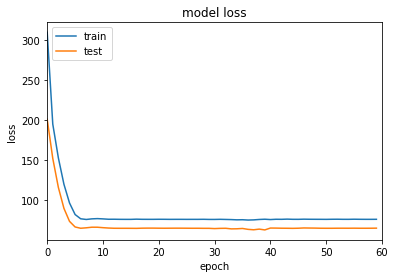

Epoch 1/20
6/6 [==============================] - 1s 52ms/step - loss: 347.0034 - root_mean_squared_error: 18.6258 - val_loss: 232.2988 - val_root_mean_squared_error: 15.2389
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 227.2416 - root_mean_squared_error: 15.0722 - val_loss: 181.3258 - val_root_mean_squared_error: 13.4631
Epoch 3/20
6/6 [==============================] - 0s 14ms/step - loss: 182.5972 - root_mean_squared_error: 13.5102 - val_loss: 144.2563 - val_root_mean_squared_error: 12.0076
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 148.5275 - root_mean_squared_error: 12.1839 - val_loss: 113.9733 - val_root_mean_squared_error: 10.6718
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 118.6934 - root_mean_squared_error: 10.8904 - val_loss: 92.5242 - val_root_mean_squared_error: 9.6138
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 99.3849 - root_mean_squared_error: 9.9640 - val_loss: 78

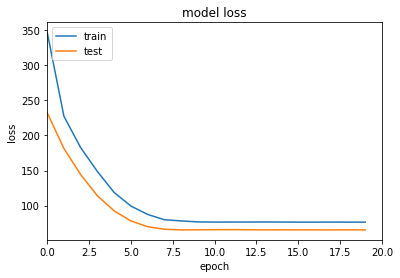

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 76.4578 - root_mean_squared_error: 8.7385 - val_loss: 65.4558 - val_root_mean_squared_error: 8.0845
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4872 - root_mean_squared_error: 8.7402 - val_loss: 65.5175 - val_root_mean_squared_error: 8.0883
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 76.4728 - root_mean_squared_error: 8.7394 - val_loss: 65.4726 - val_root_mean_squared_error: 8.0856
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 76.4967 - root_mean_squared_error: 8.7408 - val_loss: 65.4520 - val_root_mean_squared_error: 8.0844
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5214 - root_mean_squared_error: 8.7422 - val_loss: 65.4451 - val_root_mean_squared_error: 8.0839
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 76.4691 - root_mean_squared_error: 8.7392 - val_loss: 65.4076 - val_r

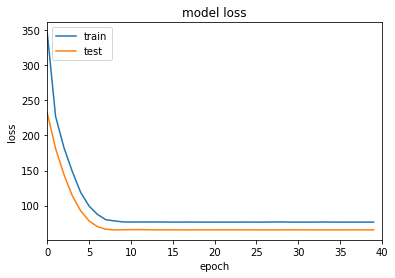

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 76.5190 - root_mean_squared_error: 8.7422 - val_loss: 65.4204 - val_root_mean_squared_error: 8.0825
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 76.4595 - root_mean_squared_error: 8.7388 - val_loss: 65.4040 - val_root_mean_squared_error: 8.0816
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.4759 - root_mean_squared_error: 8.7398 - val_loss: 65.3802 - val_root_mean_squared_error: 8.0801
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 76.5472 - root_mean_squared_error: 8.7439 - val_loss: 65.4310 - val_root_mean_squared_error: 8.0833
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 76.4942 - root_mean_squared_error: 8.7408 - val_loss: 65.4460 - val_root_mean_squared_error: 8.0842
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5305 - root_mean_squared_error: 8.7430 - val_loss: 65.3794 - val_r

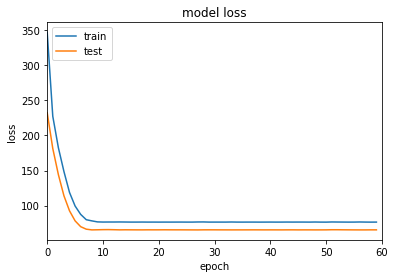

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 322.8165 - root_mean_squared_error: 17.9389 - val_loss: 213.6054 - val_root_mean_squared_error: 14.5836
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 205.2437 - root_mean_squared_error: 14.2934 - val_loss: 157.7944 - val_root_mean_squared_error: 12.5218
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 157.7736 - root_mean_squared_error: 12.5190 - val_loss: 119.5235 - val_root_mean_squared_error: 10.8809
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 122.7439 - root_mean_squared_error: 11.0258 - val_loss: 93.2895 - val_root_mean_squared_error: 9.5942
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 98.8265 - root_mean_squared_error: 9.8765 - val_loss: 77.0761 - val_root_mean_squared_error: 8.7019
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 87.3714 - root_mean_squared_error: 9.2716 - val_loss: 68.8787

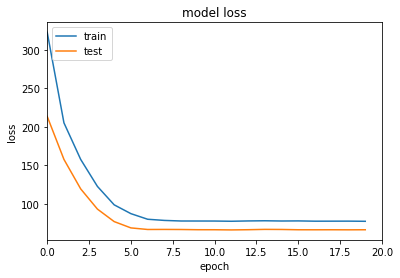

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 77.6522 - root_mean_squared_error: 8.7489 - val_loss: 66.5845 - val_root_mean_squared_error: 8.0924
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 77.4583 - root_mean_squared_error: 8.7391 - val_loss: 66.4260 - val_root_mean_squared_error: 8.0843
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 77.5852 - root_mean_squared_error: 8.7476 - val_loss: 66.4368 - val_root_mean_squared_error: 8.0862
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 77.6413 - root_mean_squared_error: 8.7526 - val_loss: 66.1186 - val_root_mean_squared_error: 8.0688
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 77.4207 - root_mean_squared_error: 8.7416 - val_loss: 66.2591 - val_root_mean_squared_error: 8.0786
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 77.3292 - root_mean_squared_error: 8.7374 - val_loss: 66.3225 - val_r

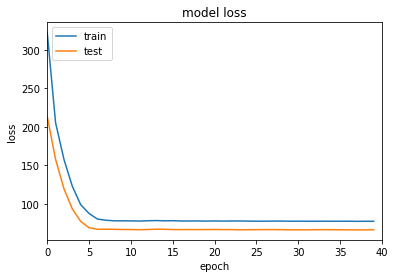

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 77.1633 - root_mean_squared_error: 8.7427 - val_loss: 66.1583 - val_root_mean_squared_error: 8.0894
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 77.2308 - root_mean_squared_error: 8.7477 - val_loss: 65.9546 - val_root_mean_squared_error: 8.0784
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1892 - root_mean_squared_error: 8.7463 - val_loss: 65.9715 - val_root_mean_squared_error: 8.0800
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 77.1086 - root_mean_squared_error: 8.7426 - val_loss: 65.9238 - val_root_mean_squared_error: 8.0784
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1392 - root_mean_squared_error: 8.7452 - val_loss: 65.9348 - val_root_mean_squared_error: 8.0796
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 77.1440 - root_mean_squared_error: 8.7456 - val_loss: 66.1486 - val_

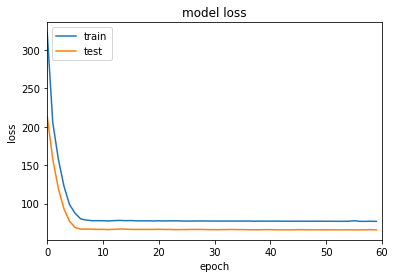

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 364.4808 - root_mean_squared_error: 19.0885 - val_loss: 247.7528 - val_root_mean_squared_error: 15.7369
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 242.4392 - root_mean_squared_error: 15.5670 - val_loss: 194.4204 - val_root_mean_squared_error: 13.9394
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 194.4562 - root_mean_squared_error: 13.9404 - val_loss: 152.1371 - val_root_mean_squared_error: 12.3291
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 154.2870 - root_mean_squared_error: 12.4157 - val_loss: 120.5290 - val_root_mean_squared_error: 10.9718
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 125.5233 - root_mean_squared_error: 11.1968 - val_loss: 96.8556 - val_root_mean_squared_error: 9.8331
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 101.8876 - root_mean_squared_error: 10.0854 - val_loss: 

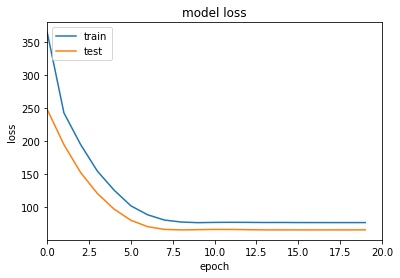

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 76.5251 - root_mean_squared_error: 8.7376 - val_loss: 65.5024 - val_root_mean_squared_error: 8.0823
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5540 - root_mean_squared_error: 8.7394 - val_loss: 65.4969 - val_root_mean_squared_error: 8.0821
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6345 - root_mean_squared_error: 8.7440 - val_loss: 65.4384 - val_root_mean_squared_error: 8.0785
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5990 - root_mean_squared_error: 8.7421 - val_loss: 65.4410 - val_root_mean_squared_error: 8.0788
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5460 - root_mean_squared_error: 8.7391 - val_loss: 65.4758 - val_root_mean_squared_error: 8.0810
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 76.6940 - root_mean_squared_error: 8.7476 - val_loss: 65.5749 - val_

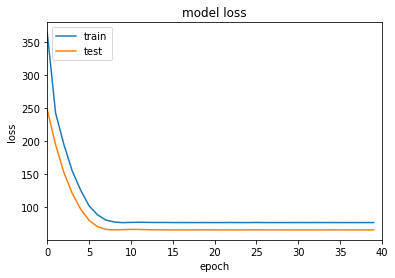

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 76.5172 - root_mean_squared_error: 8.7384 - val_loss: 65.5149 - val_root_mean_squared_error: 8.0845
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5410 - root_mean_squared_error: 8.7399 - val_loss: 65.5190 - val_root_mean_squared_error: 8.0848
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5269 - root_mean_squared_error: 8.7391 - val_loss: 65.4571 - val_root_mean_squared_error: 8.0810
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5068 - root_mean_squared_error: 8.7380 - val_loss: 65.4443 - val_root_mean_squared_error: 8.0803
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 76.7211 - root_mean_squared_error: 8.7503 - val_loss: 65.4982 - val_root_mean_squared_error: 8.0837
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5387 - root_mean_squared_error: 8.7400 - val_loss: 65.4698 - val_

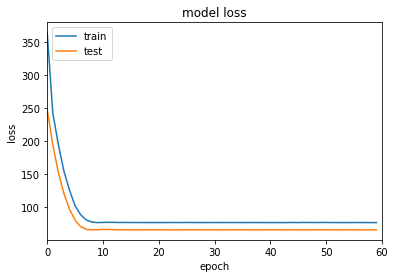

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 332.1516 - root_mean_squared_error: 18.2245 - val_loss: 223.9081 - val_root_mean_squared_error: 14.9630
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 218.8852 - root_mean_squared_error: 14.7942 - val_loss: 168.4744 - val_root_mean_squared_error: 12.9791
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 168.1236 - root_mean_squared_error: 12.9656 - val_loss: 128.3560 - val_root_mean_squared_error: 11.3286
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 132.5189 - root_mean_squared_error: 11.5108 - val_loss: 100.8739 - val_root_mean_squared_error: 10.0425
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 105.9811 - root_mean_squared_error: 10.2936 - val_loss: 82.0738 - val_root_mean_squared_error: 9.0581
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 90.1546 - root_mean_squared_error: 9.4936 - val_loss: 70.

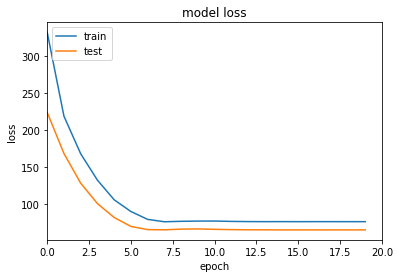

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 76.4286 - root_mean_squared_error: 8.7407 - val_loss: 65.3658 - val_root_mean_squared_error: 8.0831
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 76.4367 - root_mean_squared_error: 8.7411 - val_loss: 65.3394 - val_root_mean_squared_error: 8.0815
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4474 - root_mean_squared_error: 8.7418 - val_loss: 65.3282 - val_root_mean_squared_error: 8.0808
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4366 - root_mean_squared_error: 8.7411 - val_loss: 65.3782 - val_root_mean_squared_error: 8.0839
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.5021 - root_mean_squared_error: 8.7449 - val_loss: 65.4722 - val_root_mean_squared_error: 8.0897
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4665 - root_mean_squared_error: 8.7428 - val_loss: 65.4660 - val_

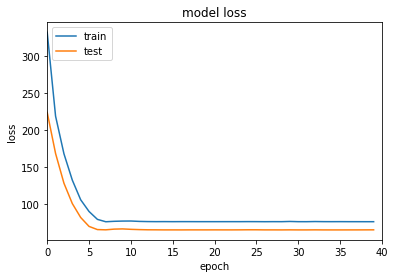

Epoch 41/60
6/6 [==============================] - 0s 23ms/step - loss: 76.4416 - root_mean_squared_error: 8.7415 - val_loss: 65.4997 - val_root_mean_squared_error: 8.0914
Epoch 42/60
6/6 [==============================] - 0s 13ms/step - loss: 76.5325 - root_mean_squared_error: 8.7467 - val_loss: 65.6350 - val_root_mean_squared_error: 8.0998
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.5521 - root_mean_squared_error: 8.7478 - val_loss: 65.4447 - val_root_mean_squared_error: 8.0881
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 76.4027 - root_mean_squared_error: 8.7393 - val_loss: 65.4033 - val_root_mean_squared_error: 8.0855
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 76.4093 - root_mean_squared_error: 8.7397 - val_loss: 65.3244 - val_root_mean_squared_error: 8.0806
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 76.4073 - root_mean_squared_error: 8.7395 - val_loss: 65.3394 - val_

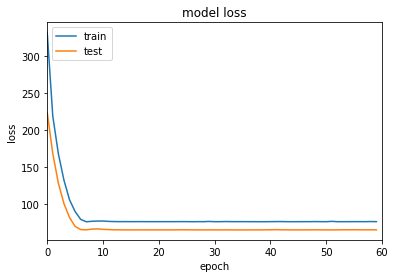

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 344.5265 - root_mean_squared_error: 18.5612 - val_loss: 228.9836 - val_root_mean_squared_error: 15.1319
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 223.1422 - root_mean_squared_error: 14.9376 - val_loss: 178.5032 - val_root_mean_squared_error: 13.3602
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 178.8760 - root_mean_squared_error: 13.3741 - val_loss: 139.9223 - val_root_mean_squared_error: 11.8285
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 142.2067 - root_mean_squared_error: 11.9246 - val_loss: 110.9486 - val_root_mean_squared_error: 10.5327
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 115.7403 - root_mean_squared_error: 10.7577 - val_loss: 90.1934 - val_root_mean_squared_error: 9.4964
Epoch 6/20
6/6 [==============================] - 0s 13ms/step - loss: 97.9442 - root_mean_squared_error: 9.8961 - val_loss: 75.8

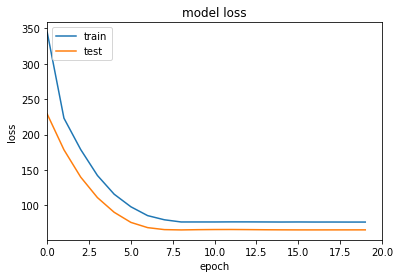

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 76.4235 - root_mean_squared_error: 8.7413 - val_loss: 65.3256 - val_root_mean_squared_error: 8.0816
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 76.4991 - root_mean_squared_error: 8.7456 - val_loss: 65.3949 - val_root_mean_squared_error: 8.0859
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 76.3855 - root_mean_squared_error: 8.7391 - val_loss: 65.3382 - val_root_mean_squared_error: 8.0824
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 76.3766 - root_mean_squared_error: 8.7386 - val_loss: 65.3097 - val_root_mean_squared_error: 8.0806
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 76.3984 - root_mean_squared_error: 8.7398 - val_loss: 65.3142 - val_root_mean_squared_error: 8.0809
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 76.4058 - root_mean_squared_error: 8.7403 - val_loss: 65.2894 - val_roo

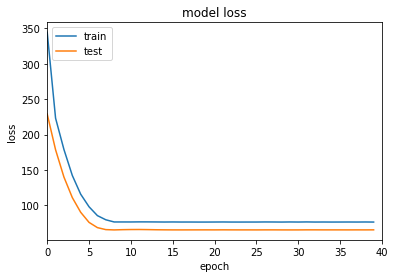

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 76.3798 - root_mean_squared_error: 8.7388 - val_loss: 65.4066 - val_root_mean_squared_error: 8.0866
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 76.4135 - root_mean_squared_error: 8.7408 - val_loss: 65.3916 - val_root_mean_squared_error: 8.0857
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 76.4277 - root_mean_squared_error: 8.7416 - val_loss: 65.3753 - val_root_mean_squared_error: 8.0847
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 76.4315 - root_mean_squared_error: 8.7418 - val_loss: 65.3098 - val_root_mean_squared_error: 8.0807
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 76.3753 - root_mean_squared_error: 8.7386 - val_loss: 65.3081 - val_root_mean_squared_error: 8.0806
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 76.3760 - root_mean_squared_error: 8.7386 - val_loss: 65.3007 - val_

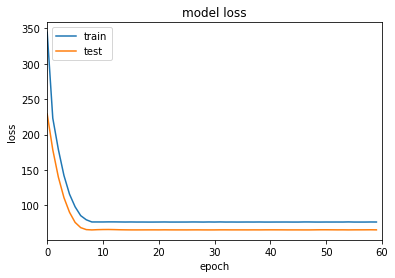

Epoch 1/20
6/6 [==============================] - 1s 55ms/step - loss: 109.9930 - root_mean_squared_error: 10.0018 - val_loss: 66.3243 - val_root_mean_squared_error: 7.5262
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 78.1399 - root_mean_squared_error: 8.2843 - val_loss: 61.9620 - val_root_mean_squared_error: 7.2603
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 70.7874 - root_mean_squared_error: 7.8549 - val_loss: 58.0963 - val_root_mean_squared_error: 7.0185
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 66.4232 - root_mean_squared_error: 7.5987 - val_loss: 57.8535 - val_root_mean_squared_error: 7.0288
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 64.0936 - root_mean_squared_error: 7.4692 - val_loss: 49.7891 - val_root_mean_squared_error: 6.4579
Epoch 6/20
6/6 [==============================] - 0s 13ms/step - loss: 58.4408 - root_mean_squared_error: 7.1059 - val_loss: 54.2057 - val_root_

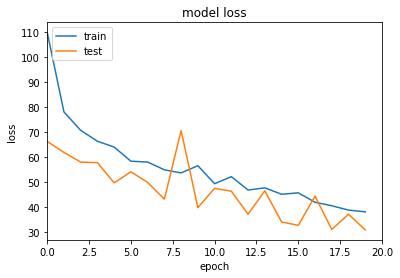

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 39.8966 - root_mean_squared_error: 5.9492 - val_loss: 29.2681 - val_root_mean_squared_error: 4.9835
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 37.8898 - root_mean_squared_error: 5.7879 - val_loss: 35.2250 - val_root_mean_squared_error: 5.5586
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 38.6226 - root_mean_squared_error: 5.8594 - val_loss: 41.8333 - val_root_mean_squared_error: 6.1316
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 41.3690 - root_mean_squared_error: 6.0963 - val_loss: 28.0254 - val_root_mean_squared_error: 4.8856
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 39.7128 - root_mean_squared_error: 5.9653 - val_loss: 28.3461 - val_root_mean_squared_error: 4.9253
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 40.0939 - root_mean_squared_error: 6.0023 - val_loss: 26.5885 - val_r

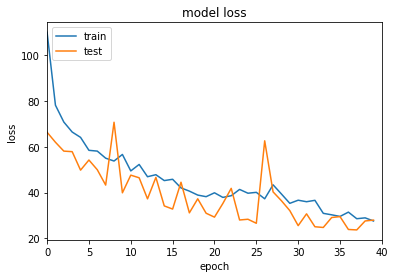

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 28.5307 - root_mean_squared_error: 4.9504 - val_loss: 25.5798 - val_root_mean_squared_error: 4.6432
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 27.1102 - root_mean_squared_error: 4.8054 - val_loss: 23.7662 - val_root_mean_squared_error: 4.4444
Epoch 43/60
6/6 [==============================] - 0s 14ms/step - loss: 27.9644 - root_mean_squared_error: 4.8943 - val_loss: 22.7961 - val_root_mean_squared_error: 4.3347
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 31.7753 - root_mean_squared_error: 5.2699 - val_loss: 22.9745 - val_root_mean_squared_error: 4.3561
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 26.4620 - root_mean_squared_error: 4.7398 - val_loss: 30.8855 - val_root_mean_squared_error: 5.1858
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 27.4135 - root_mean_squared_error: 4.8397 - val_loss: 32.6942 - val_r

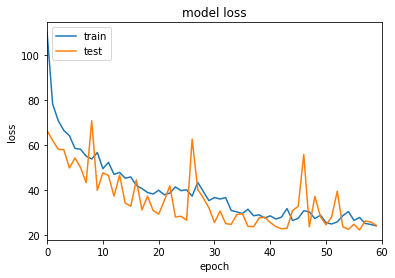

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 89.0574 - root_mean_squared_error: 8.9418 - val_loss: 56.0162 - val_root_mean_squared_error: 6.8676
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 70.2688 - root_mean_squared_error: 7.8468 - val_loss: 46.6091 - val_root_mean_squared_error: 6.1767
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 57.5238 - root_mean_squared_error: 7.0154 - val_loss: 50.7234 - val_root_mean_squared_error: 6.5303
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 54.1560 - root_mean_squared_error: 6.7984 - val_loss: 45.7679 - val_root_mean_squared_error: 6.1683
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 49.7700 - root_mean_squared_error: 6.4952 - val_loss: 39.9612 - val_root_mean_squared_error: 5.7088
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 46.5056 - root_mean_squared_error: 6.2662 - val_loss: 35.2834 - val_root_m

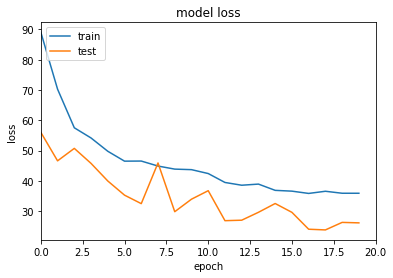

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 32.0442 - root_mean_squared_error: 5.3010 - val_loss: 31.6491 - val_root_mean_squared_error: 5.2702
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 33.3792 - root_mean_squared_error: 5.4358 - val_loss: 32.2662 - val_root_mean_squared_error: 5.3383
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 32.3983 - root_mean_squared_error: 5.3539 - val_loss: 22.6999 - val_root_mean_squared_error: 4.3609
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 31.0120 - root_mean_squared_error: 5.2306 - val_loss: 21.9360 - val_root_mean_squared_error: 4.2813
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 32.4453 - root_mean_squared_error: 5.3726 - val_loss: 21.6998 - val_root_mean_squared_error: 4.2611
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 31.8523 - root_mean_squared_error: 5.3227 - val_loss: 23.3797 - val_root

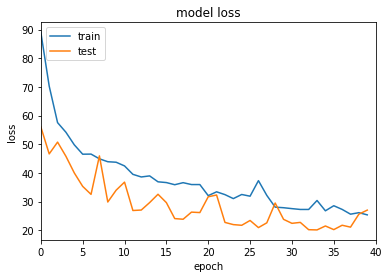

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 24.4314 - root_mean_squared_error: 4.5799 - val_loss: 31.5479 - val_root_mean_squared_error: 5.3006
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 26.2234 - root_mean_squared_error: 4.7724 - val_loss: 30.4552 - val_root_mean_squared_error: 5.1974
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 25.7029 - root_mean_squared_error: 4.7184 - val_loss: 19.9737 - val_root_mean_squared_error: 4.0669
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 24.8637 - root_mean_squared_error: 4.6295 - val_loss: 19.9029 - val_root_mean_squared_error: 4.0590
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 24.9337 - root_mean_squared_error: 4.6378 - val_loss: 20.4153 - val_root_mean_squared_error: 4.1226
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 24.4410 - root_mean_squared_error: 4.5853 - val_loss: 23.6985 - val_r

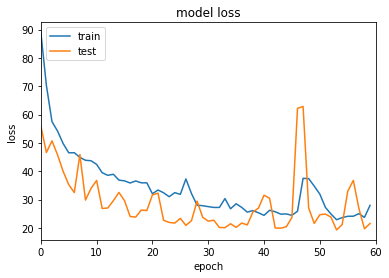

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 97.5746 - root_mean_squared_error: 9.4190 - val_loss: 89.2814 - val_root_mean_squared_error: 8.9805
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 70.4204 - root_mean_squared_error: 7.8694 - val_loss: 46.3369 - val_root_mean_squared_error: 6.1691
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 55.8801 - root_mean_squared_error: 6.9090 - val_loss: 40.6103 - val_root_mean_squared_error: 5.7157
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 53.2174 - root_mean_squared_error: 6.7383 - val_loss: 53.4559 - val_root_mean_squared_error: 6.7705
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 46.8628 - root_mean_squared_error: 6.2744 - val_loss: 37.3053 - val_root_mean_squared_error: 5.4768
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 41.6936 - root_mean_squared_error: 5.8736 - val_loss: 35.0304 - val_root_mean

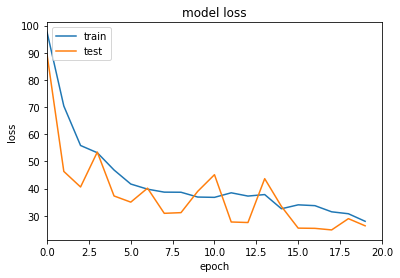

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 28.0816 - root_mean_squared_error: 4.8872 - val_loss: 29.2968 - val_root_mean_squared_error: 5.0164
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 27.3055 - root_mean_squared_error: 4.8178 - val_loss: 23.7713 - val_root_mean_squared_error: 4.4423
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 27.7760 - root_mean_squared_error: 4.8758 - val_loss: 23.1829 - val_root_mean_squared_error: 4.3855
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 29.6817 - root_mean_squared_error: 5.0756 - val_loss: 23.1706 - val_root_mean_squared_error: 4.3926
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 28.0194 - root_mean_squared_error: 4.9163 - val_loss: 22.5223 - val_root_mean_squared_error: 4.3257
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 26.7229 - root_mean_squared_error: 4.7889 - val_loss: 27.2420 - val_

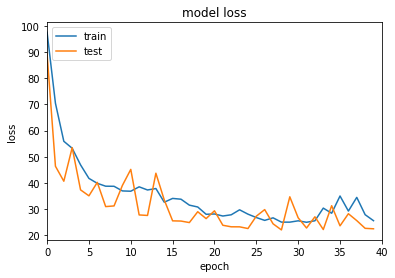

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 25.5258 - root_mean_squared_error: 4.6714 - val_loss: 22.6653 - val_root_mean_squared_error: 4.3551
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 23.2632 - root_mean_squared_error: 4.4234 - val_loss: 32.7940 - val_root_mean_squared_error: 5.3942
Epoch 43/60
6/6 [==============================] - 0s 13ms/step - loss: 26.3882 - root_mean_squared_error: 4.7640 - val_loss: 44.0201 - val_root_mean_squared_error: 6.3506
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 25.5924 - root_mean_squared_error: 4.6801 - val_loss: 22.5755 - val_root_mean_squared_error: 4.3458
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 25.3079 - root_mean_squared_error: 4.6497 - val_loss: 23.0943 - val_root_mean_squared_error: 4.4054
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 30.1005 - root_mean_squared_error: 5.1396 - val_loss: 23.4639 - val_r

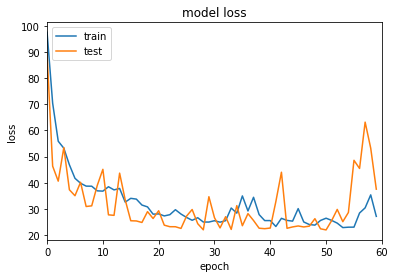

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 117.1743 - root_mean_squared_error: 10.4059 - val_loss: 67.3859 - val_root_mean_squared_error: 7.6632
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 71.1534 - root_mean_squared_error: 7.9142 - val_loss: 67.9876 - val_root_mean_squared_error: 7.7256
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 61.0783 - root_mean_squared_error: 7.2739 - val_loss: 44.2326 - val_root_mean_squared_error: 6.0225
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 49.3384 - root_mean_squared_error: 6.4425 - val_loss: 35.0236 - val_root_mean_squared_error: 5.2334
Epoch 5/20
6/6 [==============================] - 0s 13ms/step - loss: 45.9543 - root_mean_squared_error: 6.2003 - val_loss: 44.2825 - val_root_mean_squared_error: 6.0797
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 44.2171 - root_mean_squared_error: 6.0840 - val_loss: 33.8086 - val_root_

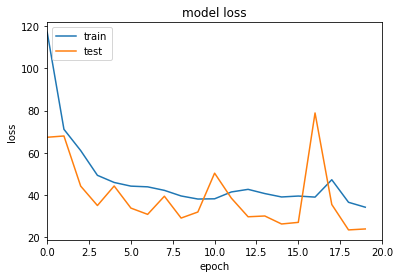

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 32.9446 - root_mean_squared_error: 5.3676 - val_loss: 31.0384 - val_root_mean_squared_error: 5.1935
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 30.7652 - root_mean_squared_error: 5.1709 - val_loss: 32.2643 - val_root_mean_squared_error: 5.3195
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 32.3422 - root_mean_squared_error: 5.3301 - val_loss: 23.6204 - val_root_mean_squared_error: 4.4429
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 34.2380 - root_mean_squared_error: 5.5125 - val_loss: 32.4298 - val_root_mean_squared_error: 5.3503
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 35.9976 - root_mean_squared_error: 5.6761 - val_loss: 26.7011 - val_root_mean_squared_error: 4.7914
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 31.0557 - root_mean_squared_error: 5.2280 - val_loss: 23.6296 - val_

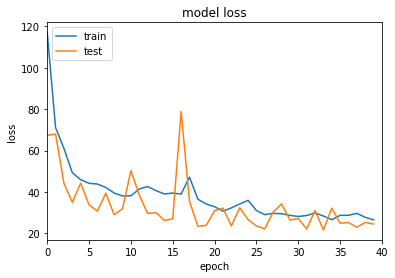

Epoch 41/60
6/6 [==============================] - 0s 23ms/step - loss: 25.9096 - root_mean_squared_error: 4.7162 - val_loss: 20.6871 - val_root_mean_squared_error: 4.1262
Epoch 42/60
6/6 [==============================] - 0s 12ms/step - loss: 27.4989 - root_mean_squared_error: 4.8827 - val_loss: 24.6226 - val_root_mean_squared_error: 4.5790
Epoch 43/60
6/6 [==============================] - 0s 16ms/step - loss: 32.3065 - root_mean_squared_error: 5.3533 - val_loss: 20.9204 - val_root_mean_squared_error: 4.1566
Epoch 44/60
6/6 [==============================] - 0s 16ms/step - loss: 27.4911 - root_mean_squared_error: 4.8838 - val_loss: 20.0361 - val_root_mean_squared_error: 4.0501
Epoch 45/60
6/6 [==============================] - 0s 14ms/step - loss: 28.5481 - root_mean_squared_error: 4.9919 - val_loss: 21.0388 - val_root_mean_squared_error: 4.1734
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 29.1287 - root_mean_squared_error: 5.0510 - val_loss: 27.9612 - val_

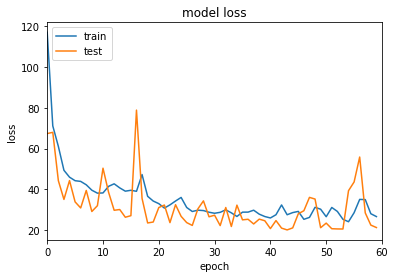

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 144.0993 - root_mean_squared_error: 11.9222 - val_loss: 150.2583 - val_root_mean_squared_error: 12.1803
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 117.8839 - root_mean_squared_error: 10.7714 - val_loss: 89.8589 - val_root_mean_squared_error: 9.3837
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 92.5434 - root_mean_squared_error: 9.5275 - val_loss: 78.3980 - val_root_mean_squared_error: 8.7568
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 68.5738 - root_mean_squared_error: 8.1787 - val_loss: 49.9581 - val_root_mean_squared_error: 6.9516
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 56.2915 - root_mean_squared_error: 7.3951 - val_loss: 58.3485 - val_root_mean_squared_error: 7.5359
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 53.9980 - root_mean_squared_error: 7.2434 - val_loss: 41.9192 - val_r

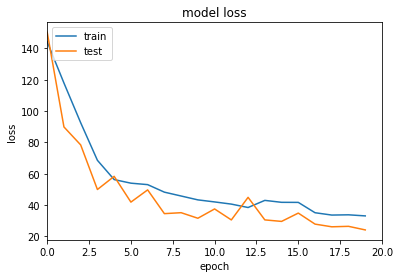

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 35.1096 - root_mean_squared_error: 5.8427 - val_loss: 22.7469 - val_root_mean_squared_error: 4.6673
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 38.8579 - root_mean_squared_error: 6.1563 - val_loss: 64.2431 - val_root_mean_squared_error: 7.9557
Epoch 23/40
6/6 [==============================] - 0s 15ms/step - loss: 40.7651 - root_mean_squared_error: 6.3103 - val_loss: 33.2585 - val_root_mean_squared_error: 5.6851
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 32.8599 - root_mean_squared_error: 5.6504 - val_loss: 22.1032 - val_root_mean_squared_error: 4.6018
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 28.2001 - root_mean_squared_error: 5.2227 - val_loss: 45.6056 - val_root_mean_squared_error: 6.6849
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 34.7846 - root_mean_squared_error: 5.8198 - val_loss: 32.4102 - val_

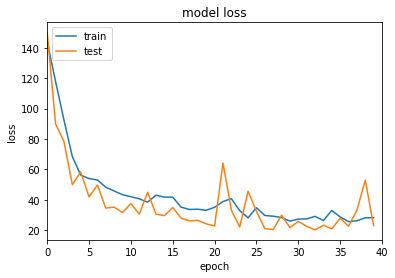

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 24.3385 - root_mean_squared_error: 4.8444 - val_loss: 23.9318 - val_root_mean_squared_error: 4.8020
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 25.8096 - root_mean_squared_error: 4.9936 - val_loss: 19.9303 - val_root_mean_squared_error: 4.3653
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 26.6578 - root_mean_squared_error: 5.0777 - val_loss: 23.0044 - val_root_mean_squared_error: 4.7041
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 27.6645 - root_mean_squared_error: 5.1758 - val_loss: 18.8091 - val_root_mean_squared_error: 4.2347
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 25.2271 - root_mean_squared_error: 4.9346 - val_loss: 19.2706 - val_root_mean_squared_error: 4.2887
Epoch 46/60
6/6 [==============================] - 0s 13ms/step - loss: 28.8984 - root_mean_squared_error: 5.2934 - val_loss: 29.7488 - val_r

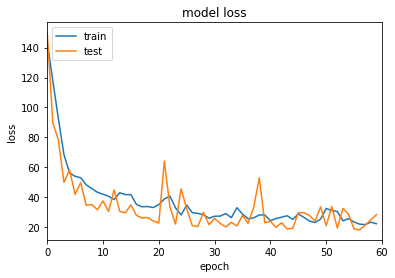

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 188.2114 - root_mean_squared_error: 13.6824 - val_loss: 208.7103 - val_root_mean_squared_error: 14.4130
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 100.8196 - root_mean_squared_error: 9.9930 - val_loss: 68.9081 - val_root_mean_squared_error: 8.2446
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 92.1720 - root_mean_squared_error: 9.5527 - val_loss: 46.5301 - val_root_mean_squared_error: 6.7555
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 67.0626 - root_mean_squared_error: 8.1354 - val_loss: 70.5565 - val_root_mean_squared_error: 8.3487
Epoch 5/20
6/6 [==============================] - 0s 13ms/step - loss: 58.0264 - root_mean_squared_error: 7.5621 - val_loss: 46.1254 - val_root_mean_squared_error: 6.7310
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 60.9474 - root_mean_squared_error: 7.7552 - val_loss: 44.4238 - val_r

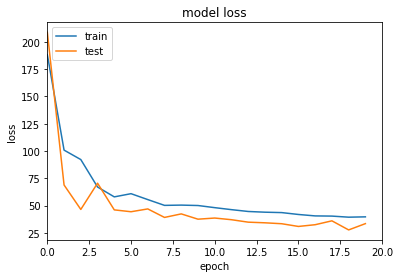

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 37.6124 - root_mean_squared_error: 6.0940 - val_loss: 28.4799 - val_root_mean_squared_error: 5.2925
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 36.6640 - root_mean_squared_error: 6.0166 - val_loss: 31.6247 - val_root_mean_squared_error: 5.5827
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 35.6199 - root_mean_squared_error: 5.9300 - val_loss: 25.9855 - val_root_mean_squared_error: 5.0533
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 36.6789 - root_mean_squared_error: 6.0193 - val_loss: 28.7341 - val_root_mean_squared_error: 5.3190
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 35.6667 - root_mean_squared_error: 5.9352 - val_loss: 35.2131 - val_root_mean_squared_error: 5.8972
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 35.6907 - root_mean_squared_error: 5.9377 - val_loss: 24.7244 - val_root

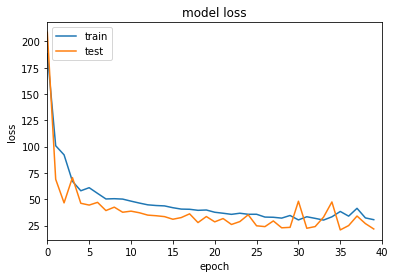

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 33.3328 - root_mean_squared_error: 5.7357 - val_loss: 22.7709 - val_root_mean_squared_error: 4.7262
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 27.5092 - root_mean_squared_error: 5.2034 - val_loss: 22.7324 - val_root_mean_squared_error: 4.7222
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 28.9918 - root_mean_squared_error: 5.3440 - val_loss: 20.2453 - val_root_mean_squared_error: 4.4511
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 27.9766 - root_mean_squared_error: 5.2482 - val_loss: 29.4685 - val_root_mean_squared_error: 5.3885
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 26.6220 - root_mean_squared_error: 5.1175 - val_loss: 19.4779 - val_root_mean_squared_error: 4.3641
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 29.2890 - root_mean_squared_error: 5.3718 - val_loss: 19.5895 - val_r

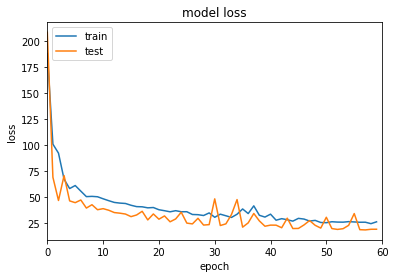

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 399.0653 - root_mean_squared_error: 19.9541 - val_loss: 367.9722 - val_root_mean_squared_error: 19.1598
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 187.7493 - root_mean_squared_error: 13.6707 - val_loss: 44.0553 - val_root_mean_squared_error: 6.5740
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 96.1268 - root_mean_squared_error: 9.7623 - val_loss: 72.3596 - val_root_mean_squared_error: 8.4591
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 63.0915 - root_mean_squared_error: 7.8932 - val_loss: 71.4509 - val_root_mean_squared_error: 8.4073
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 64.5876 - root_mean_squared_error: 7.9895 - val_loss: 40.9504 - val_root_mean_squared_error: 6.3416
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 47.2203 - root_mean_squared_error: 6.8190 - val_loss: 41.3236 - val_r

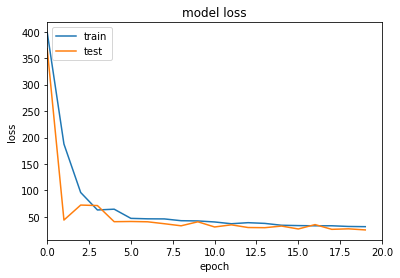

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 32.2252 - root_mean_squared_error: 5.6411 - val_loss: 28.6946 - val_root_mean_squared_error: 5.3196
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 32.1786 - root_mean_squared_error: 5.6379 - val_loss: 36.2826 - val_root_mean_squared_error: 5.9913
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 30.7940 - root_mean_squared_error: 5.5146 - val_loss: 24.6052 - val_root_mean_squared_error: 4.9220
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 31.9588 - root_mean_squared_error: 5.6198 - val_loss: 30.0577 - val_root_mean_squared_error: 5.4484
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 31.6143 - root_mean_squared_error: 5.5897 - val_loss: 31.4352 - val_root_mean_squared_error: 5.5739
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 33.5591 - root_mean_squared_error: 5.7614 - val_loss: 21.1955 - val_

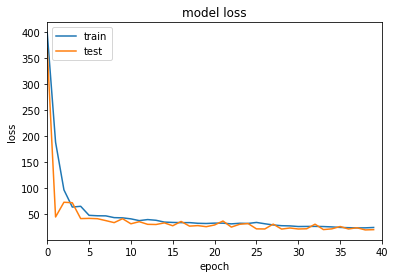

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 22.6278 - root_mean_squared_error: 4.7171 - val_loss: 20.9734 - val_root_mean_squared_error: 4.5383
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 22.2610 - root_mean_squared_error: 4.6780 - val_loss: 22.4556 - val_root_mean_squared_error: 4.6988
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 22.7358 - root_mean_squared_error: 4.7285 - val_loss: 20.2393 - val_root_mean_squared_error: 4.4567
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 22.7754 - root_mean_squared_error: 4.7326 - val_loss: 19.4529 - val_root_mean_squared_error: 4.3675
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 25.5113 - root_mean_squared_error: 5.0133 - val_loss: 20.6124 - val_root_mean_squared_error: 4.4983
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 25.2339 - root_mean_squared_error: 4.9856 - val_loss: 22.5366 - val_

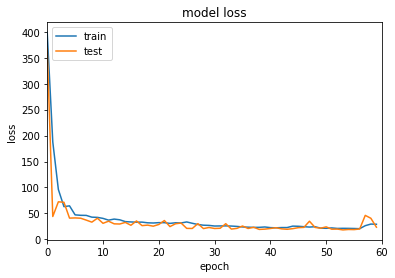

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 1000.0979 - root_mean_squared_error: 31.6102 - val_loss: 207.6187 - val_root_mean_squared_error: 14.3786
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 359.5087 - root_mean_squared_error: 18.9380 - val_loss: 330.7395 - val_root_mean_squared_error: 18.1632
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 145.7682 - root_mean_squared_error: 12.0393 - val_loss: 55.7396 - val_root_mean_squared_error: 7.4119
Epoch 4/20
6/6 [==============================] - 0s 14ms/step - loss: 102.4665 - root_mean_squared_error: 10.0834 - val_loss: 100.8820 - val_root_mean_squared_error: 10.0055
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 87.9867 - root_mean_squared_error: 9.3396 - val_loss: 47.8291 - val_root_mean_squared_error: 6.8622
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 62.3324 - root_mean_squared_error: 7.8488 - val_loss: 74.01

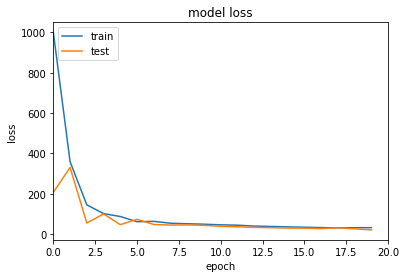

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 31.7346 - root_mean_squared_error: 5.5942 - val_loss: 25.0270 - val_root_mean_squared_error: 4.9591
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 30.4089 - root_mean_squared_error: 5.4752 - val_loss: 32.4102 - val_root_mean_squared_error: 5.6554
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 30.6678 - root_mean_squared_error: 5.4994 - val_loss: 20.1708 - val_root_mean_squared_error: 4.4441
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 29.2235 - root_mean_squared_error: 5.3671 - val_loss: 26.2436 - val_root_mean_squared_error: 5.0822
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 28.7824 - root_mean_squared_error: 5.3263 - val_loss: 25.2392 - val_root_mean_squared_error: 4.9829
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 27.5115 - root_mean_squared_error: 5.2060 - val_loss: 22.7745 - val_roo

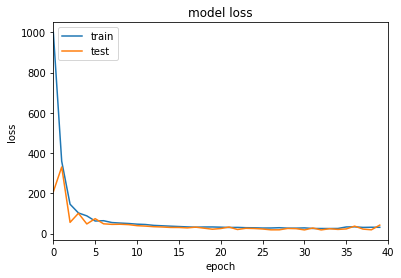

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 28.5094 - root_mean_squared_error: 5.3002 - val_loss: 18.0071 - val_root_mean_squared_error: 4.1941
Epoch 42/60
6/6 [==============================] - 0s 14ms/step - loss: 28.0536 - root_mean_squared_error: 5.2571 - val_loss: 20.1266 - val_root_mean_squared_error: 4.4396
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 25.2010 - root_mean_squared_error: 4.9784 - val_loss: 25.6662 - val_root_mean_squared_error: 5.0249
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 25.2675 - root_mean_squared_error: 4.9851 - val_loss: 17.8768 - val_root_mean_squared_error: 4.1786
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 26.7931 - root_mean_squared_error: 5.1358 - val_loss: 18.8703 - val_root_mean_squared_error: 4.2958
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 24.2580 - root_mean_squared_error: 4.8828 - val_loss: 20.9695 - val_ro

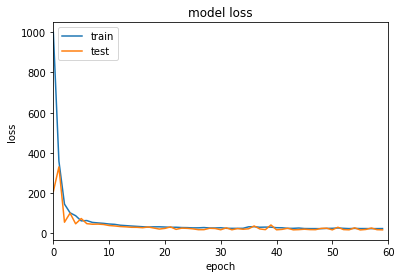

Epoch 1/20
6/6 [==============================] - 1s 60ms/step - loss: 1103.4159 - root_mean_squared_error: 33.2001 - val_loss: 338.0098 - val_root_mean_squared_error: 18.3543
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 447.2620 - root_mean_squared_error: 21.1224 - val_loss: 280.6053 - val_root_mean_squared_error: 16.7194
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 123.5738 - root_mean_squared_error: 11.0694 - val_loss: 137.2053 - val_root_mean_squared_error: 11.6704
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 162.2521 - root_mean_squared_error: 12.6991 - val_loss: 59.7384 - val_root_mean_squared_error: 7.6671
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 66.1952 - root_mean_squared_error: 8.0785 - val_loss: 109.5239 - val_root_mean_squared_error: 10.4221
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 78.2045 - root_mean_squared_error: 8.7931 - val_loss: 46.

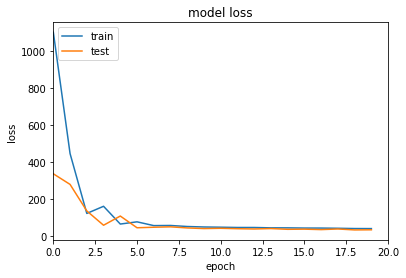

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 40.4939 - root_mean_squared_error: 6.3207 - val_loss: 34.4697 - val_root_mean_squared_error: 5.8251
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 39.7956 - root_mean_squared_error: 6.2659 - val_loss: 34.8075 - val_root_mean_squared_error: 5.8547
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 40.1412 - root_mean_squared_error: 6.2940 - val_loss: 33.6279 - val_root_mean_squared_error: 5.7537
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 39.3882 - root_mean_squared_error: 6.2344 - val_loss: 34.3455 - val_root_mean_squared_error: 5.8163
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 38.1272 - root_mean_squared_error: 6.1329 - val_loss: 30.9512 - val_root_mean_squared_error: 5.5173
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 36.7542 - root_mean_squared_error: 6.0204 - val_loss: 35.1480 - val_r

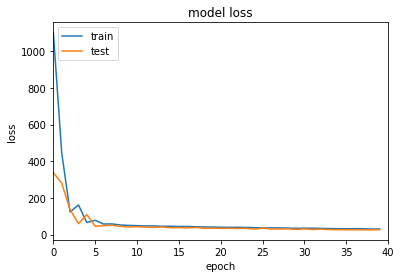

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 31.7264 - root_mean_squared_error: 5.5901 - val_loss: 23.7678 - val_root_mean_squared_error: 4.8261
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 31.6788 - root_mean_squared_error: 5.5859 - val_loss: 27.6707 - val_root_mean_squared_error: 5.2148
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 29.2129 - root_mean_squared_error: 5.3607 - val_loss: 23.0881 - val_root_mean_squared_error: 4.7552
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 29.4396 - root_mean_squared_error: 5.3818 - val_loss: 29.3256 - val_root_mean_squared_error: 5.3712
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 29.7936 - root_mean_squared_error: 5.4146 - val_loss: 23.3463 - val_root_mean_squared_error: 4.7824
Epoch 46/60
6/6 [==============================] - 0s 13ms/step - loss: 28.8291 - root_mean_squared_error: 5.3249 - val_loss: 28.5425 - val_ro

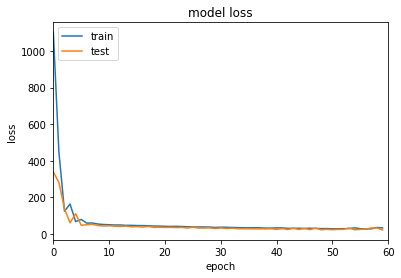

Epoch 1/20
6/6 [==============================] - 1s 130ms/step - loss: 73.7077 - root_mean_squared_error: 8.5739 - val_loss: 52.7319 - val_root_mean_squared_error: 7.2486
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 61.9017 - root_mean_squared_error: 7.8559 - val_loss: 61.8343 - val_root_mean_squared_error: 7.8520
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 54.0897 - root_mean_squared_error: 7.3426 - val_loss: 37.1345 - val_root_mean_squared_error: 6.0797
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 45.1029 - root_mean_squared_error: 6.7033 - val_loss: 40.8901 - val_root_mean_squared_error: 6.3818
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 44.5763 - root_mean_squared_error: 6.6645 - val_loss: 36.8797 - val_root_mean_squared_error: 6.0600
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 40.6735 - root_mean_squared_error: 6.3656 - val_loss: 29.7182 - val_root_mean_

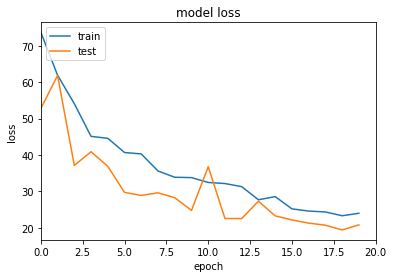

Epoch 21/40
6/6 [==============================] - 0s 21ms/step - loss: 22.2215 - root_mean_squared_error: 4.7035 - val_loss: 26.4910 - val_root_mean_squared_error: 5.1374
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 22.8192 - root_mean_squared_error: 4.7667 - val_loss: 27.9751 - val_root_mean_squared_error: 5.2800
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 22.3116 - root_mean_squared_error: 4.7133 - val_loss: 19.8681 - val_root_mean_squared_error: 4.4467
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 23.8540 - root_mean_squared_error: 4.8743 - val_loss: 17.8653 - val_root_mean_squared_error: 4.2156
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 36.0894 - root_mean_squared_error: 5.9996 - val_loss: 19.7839 - val_root_mean_squared_error: 4.4374
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 33.4701 - root_mean_squared_error: 5.7773 - val_loss: 53.3599 - val_roo

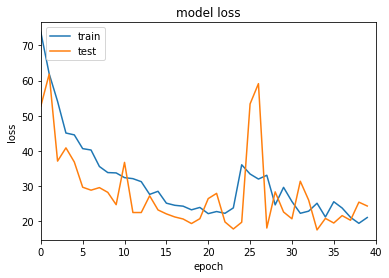

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 20.7284 - root_mean_squared_error: 4.5430 - val_loss: 25.9088 - val_root_mean_squared_error: 5.0812
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 20.7317 - root_mean_squared_error: 4.5433 - val_loss: 20.3718 - val_root_mean_squared_error: 4.5035
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 21.4600 - root_mean_squared_error: 4.6227 - val_loss: 19.8372 - val_root_mean_squared_error: 4.4437
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 21.6857 - root_mean_squared_error: 4.6471 - val_loss: 23.5537 - val_root_mean_squared_error: 4.8439
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 21.9263 - root_mean_squared_error: 4.6729 - val_loss: 39.8101 - val_root_mean_squared_error: 6.3023
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 24.3586 - root_mean_squared_error: 4.9262 - val_loss: 37.0999 - val_

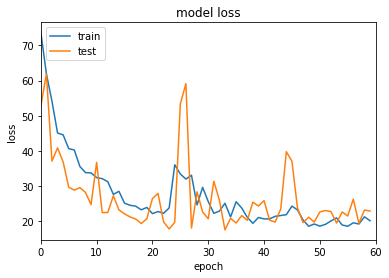

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 92.5885 - root_mean_squared_error: 9.6171 - val_loss: 43.3508 - val_root_mean_squared_error: 6.5767
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 67.3686 - root_mean_squared_error: 8.2020 - val_loss: 35.7925 - val_root_mean_squared_error: 5.9748
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 49.8272 - root_mean_squared_error: 7.0523 - val_loss: 45.0969 - val_root_mean_squared_error: 6.7087
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 48.1352 - root_mean_squared_error: 6.9316 - val_loss: 32.2799 - val_root_mean_squared_error: 5.6739
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 42.3618 - root_mean_squared_error: 6.5021 - val_loss: 48.4202 - val_root_mean_squared_error: 6.9525
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 42.1790 - root_mean_squared_error: 6.4883 - val_loss: 29.5562 - val_root_m

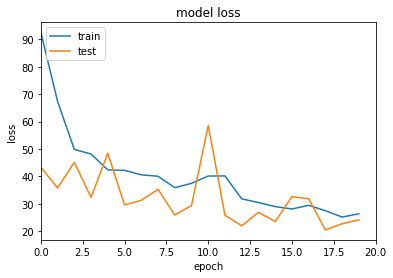

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 29.6343 - root_mean_squared_error: 5.4390 - val_loss: 33.1140 - val_root_mean_squared_error: 5.7500
Epoch 22/40
6/6 [==============================] - 0s 14ms/step - loss: 23.9283 - root_mean_squared_error: 4.8865 - val_loss: 20.9657 - val_root_mean_squared_error: 4.5733
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 23.3613 - root_mean_squared_error: 4.8282 - val_loss: 28.3746 - val_root_mean_squared_error: 5.3221
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 24.8028 - root_mean_squared_error: 4.9753 - val_loss: 27.1069 - val_root_mean_squared_error: 5.2017
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 24.7915 - root_mean_squared_error: 4.9742 - val_loss: 24.7811 - val_root_mean_squared_error: 4.9732
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 22.1376 - root_mean_squared_error: 4.6999 - val_loss: 18.6978 - val_

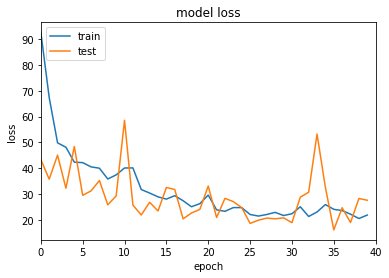

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 21.3020 - root_mean_squared_error: 4.6101 - val_loss: 27.4303 - val_root_mean_squared_error: 5.2327
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 20.6510 - root_mean_squared_error: 4.5389 - val_loss: 18.4808 - val_root_mean_squared_error: 4.2932
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 19.5194 - root_mean_squared_error: 4.4125 - val_loss: 35.2568 - val_root_mean_squared_error: 5.9336
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 22.5738 - root_mean_squared_error: 4.7460 - val_loss: 29.3527 - val_root_mean_squared_error: 5.4133
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 20.1834 - root_mean_squared_error: 4.4871 - val_loss: 21.2727 - val_root_mean_squared_error: 4.6069
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 20.6974 - root_mean_squared_error: 4.5440 - val_loss: 18.2757 - val_

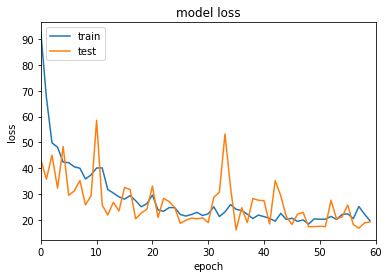

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 219.3158 - root_mean_squared_error: 14.8062 - val_loss: 114.7388 - val_root_mean_squared_error: 10.7075
Epoch 2/20
6/6 [==============================] - 0s 13ms/step - loss: 81.6277 - root_mean_squared_error: 9.0300 - val_loss: 81.3410 - val_root_mean_squared_error: 9.0142
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 66.1639 - root_mean_squared_error: 8.1290 - val_loss: 83.3498 - val_root_mean_squared_error: 9.1252
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 60.2588 - root_mean_squared_error: 7.7575 - val_loss: 41.5881 - val_root_mean_squared_error: 6.4428
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 51.9425 - root_mean_squared_error: 7.2018 - val_loss: 41.3386 - val_root_mean_squared_error: 6.4237
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 42.5477 - root_mean_squared_error: 6.5172 - val_loss: 30.9974 - val_roo

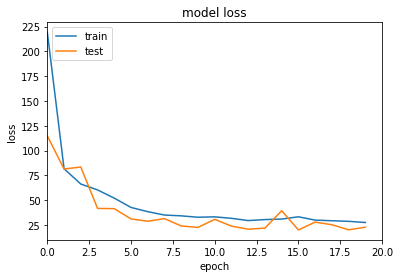

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 26.4844 - root_mean_squared_error: 5.1421 - val_loss: 18.3667 - val_root_mean_squared_error: 4.2806
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 26.1775 - root_mean_squared_error: 5.1122 - val_loss: 36.6340 - val_root_mean_squared_error: 6.0491
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 29.9517 - root_mean_squared_error: 5.4690 - val_loss: 17.8763 - val_root_mean_squared_error: 4.2231
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 26.6305 - root_mean_squared_error: 5.1565 - val_loss: 17.2665 - val_root_mean_squared_error: 4.1504
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 27.4508 - root_mean_squared_error: 5.2355 - val_loss: 27.9960 - val_root_mean_squared_error: 5.2873
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 26.0344 - root_mean_squared_error: 5.0985 - val_loss: 18.5580 - val_r

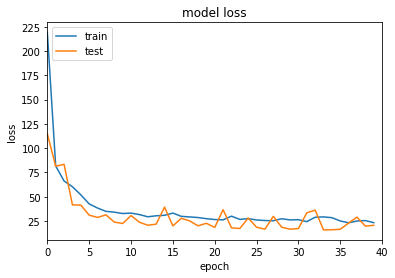

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 25.4427 - root_mean_squared_error: 5.0400 - val_loss: 20.4181 - val_root_mean_squared_error: 4.5141
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 24.8415 - root_mean_squared_error: 4.9800 - val_loss: 20.3767 - val_root_mean_squared_error: 4.5095
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 26.8567 - root_mean_squared_error: 5.1784 - val_loss: 18.6658 - val_root_mean_squared_error: 4.3157
Epoch 44/60
6/6 [==============================] - 0s 13ms/step - loss: 29.3136 - root_mean_squared_error: 5.4104 - val_loss: 21.3473 - val_root_mean_squared_error: 4.6159
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 26.0991 - root_mean_squared_error: 5.1047 - val_loss: 19.0981 - val_root_mean_squared_error: 4.3655
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 22.2631 - root_mean_squared_error: 4.7141 - val_loss: 23.5633 - val_r

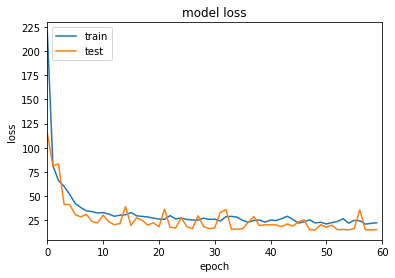

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 101.3083 - root_mean_squared_error: 10.0108 - val_loss: 63.6889 - val_root_mean_squared_error: 7.9144
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 68.6234 - root_mean_squared_error: 8.2217 - val_loss: 53.2895 - val_root_mean_squared_error: 7.2318
Epoch 3/20
6/6 [==============================] - 0s 14ms/step - loss: 59.7822 - root_mean_squared_error: 7.6690 - val_loss: 51.1831 - val_root_mean_squared_error: 7.0886
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 54.0458 - root_mean_squared_error: 7.2891 - val_loss: 42.9631 - val_root_mean_squared_error: 6.4868
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 51.2741 - root_mean_squared_error: 7.0999 - val_loss: 41.8331 - val_root_mean_squared_error: 6.4027
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 43.4335 - root_mean_squared_error: 6.5277 - val_loss: 40.8795 - val_root

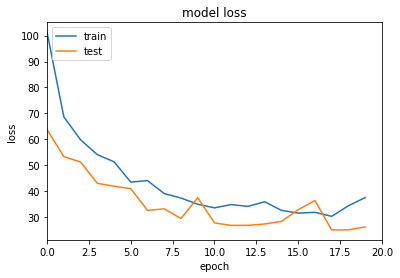

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 45.1025 - root_mean_squared_error: 6.6772 - val_loss: 34.4354 - val_root_mean_squared_error: 5.8244
Epoch 22/40
6/6 [==============================] - 0s 14ms/step - loss: 29.8876 - root_mean_squared_error: 5.4202 - val_loss: 27.3437 - val_root_mean_squared_error: 5.1806
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 28.3114 - root_mean_squared_error: 5.2734 - val_loss: 27.0992 - val_root_mean_squared_error: 5.1575
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 28.0150 - root_mean_squared_error: 5.2458 - val_loss: 26.1844 - val_root_mean_squared_error: 5.0686
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 27.6822 - root_mean_squared_error: 5.2144 - val_loss: 23.5072 - val_root_mean_squared_error: 4.7977
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 26.7729 - root_mean_squared_error: 5.1270 - val_loss: 21.9150 - val_r

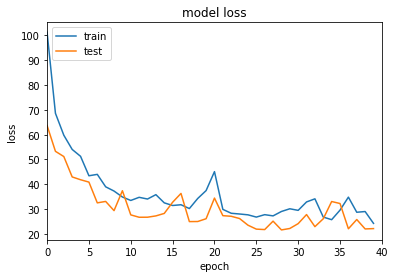

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 24.7971 - root_mean_squared_error: 4.9337 - val_loss: 20.7500 - val_root_mean_squared_error: 4.5049
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 26.4717 - root_mean_squared_error: 5.1006 - val_loss: 26.3725 - val_root_mean_squared_error: 5.0909
Epoch 43/60
6/6 [==============================] - 0s 13ms/step - loss: 32.4639 - root_mean_squared_error: 5.6577 - val_loss: 22.2244 - val_root_mean_squared_error: 4.6659
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 29.0391 - root_mean_squared_error: 5.3465 - val_loss: 22.7244 - val_root_mean_squared_error: 4.7192
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 27.3855 - root_mean_squared_error: 5.1896 - val_loss: 30.2299 - val_root_mean_squared_error: 5.4568
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 24.5596 - root_mean_squared_error: 4.9099 - val_loss: 29.8861 - val_r

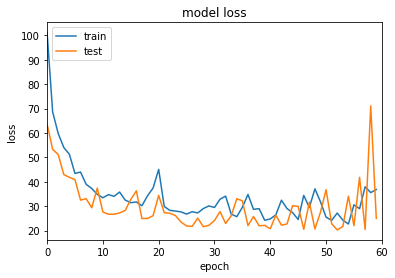

Epoch 1/20
6/6 [==============================] - 1s 55ms/step - loss: 121.2637 - root_mean_squared_error: 11.0067 - val_loss: 50.0540 - val_root_mean_squared_error: 7.0669
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 70.0017 - root_mean_squared_error: 8.3601 - val_loss: 43.5063 - val_root_mean_squared_error: 6.5879
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 63.0288 - root_mean_squared_error: 7.9325 - val_loss: 41.1388 - val_root_mean_squared_error: 6.4061
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 51.5034 - root_mean_squared_error: 7.1697 - val_loss: 42.5627 - val_root_mean_squared_error: 6.5167
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 45.7592 - root_mean_squared_error: 6.7577 - val_loss: 34.1350 - val_root_mean_squared_error: 5.8348
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 42.8533 - root_mean_squared_error: 6.5395 - val_loss: 33.4333 - val_root_mean

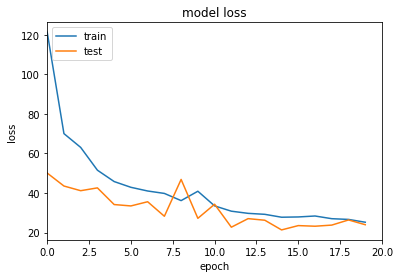

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 26.4590 - root_mean_squared_error: 5.1385 - val_loss: 18.6421 - val_root_mean_squared_error: 4.3113
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 24.1715 - root_mean_squared_error: 4.9109 - val_loss: 20.3700 - val_root_mean_squared_error: 4.5073
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 27.0762 - root_mean_squared_error: 5.1983 - val_loss: 31.9867 - val_root_mean_squared_error: 5.6509
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 24.8811 - root_mean_squared_error: 4.9828 - val_loss: 23.0642 - val_root_mean_squared_error: 4.7970
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 24.1511 - root_mean_squared_error: 4.9090 - val_loss: 29.8908 - val_root_mean_squared_error: 5.4625
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 26.8562 - root_mean_squared_error: 5.1773 - val_loss: 18.2908 - val_root

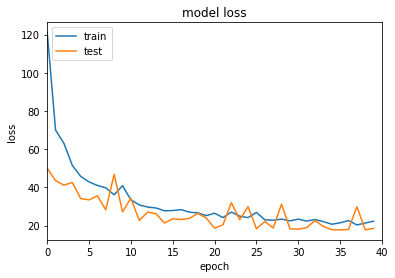

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 21.4979 - root_mean_squared_error: 4.6313 - val_loss: 21.7995 - val_root_mean_squared_error: 4.6637
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 20.0838 - root_mean_squared_error: 4.4760 - val_loss: 23.5909 - val_root_mean_squared_error: 4.8520
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 26.2921 - root_mean_squared_error: 5.1228 - val_loss: 17.7575 - val_root_mean_squared_error: 4.2081
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 22.5519 - root_mean_squared_error: 4.7437 - val_loss: 20.2915 - val_root_mean_squared_error: 4.4991
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 20.6725 - root_mean_squared_error: 4.5413 - val_loss: 31.2412 - val_root_mean_squared_error: 5.5850
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 24.4013 - root_mean_squared_error: 4.9348 - val_loss: 17.6833 - val_ro

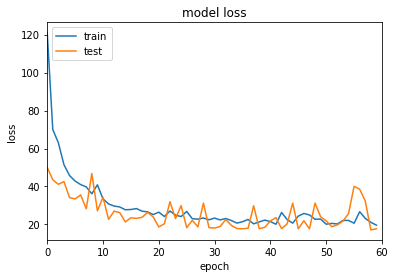

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 1207.9865 - root_mean_squared_error: 34.7558 - val_loss: 97.6907 - val_root_mean_squared_error: 9.8829
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 320.5987 - root_mean_squared_error: 17.9047 - val_loss: 386.5295 - val_root_mean_squared_error: 19.6599
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 178.0142 - root_mean_squared_error: 13.3415 - val_loss: 47.4976 - val_root_mean_squared_error: 6.8906
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 113.0076 - root_mean_squared_error: 10.6297 - val_loss: 101.2044 - val_root_mean_squared_error: 10.0592
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 79.4011 - root_mean_squared_error: 8.9098 - val_loss: 49.8921 - val_root_mean_squared_error: 7.0623
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 62.7775 - root_mean_squared_error: 7.9222 - val_loss: 66.0013 

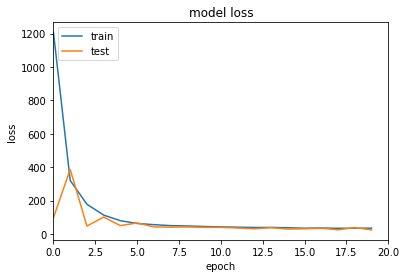

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 33.4759 - root_mean_squared_error: 5.7850 - val_loss: 26.5090 - val_root_mean_squared_error: 5.1477
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 32.6556 - root_mean_squared_error: 5.7136 - val_loss: 28.4130 - val_root_mean_squared_error: 5.3295
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 33.0165 - root_mean_squared_error: 5.7451 - val_loss: 24.3078 - val_root_mean_squared_error: 4.9293
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 31.0506 - root_mean_squared_error: 5.5714 - val_loss: 26.1449 - val_root_mean_squared_error: 5.1123
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 31.0896 - root_mean_squared_error: 5.5749 - val_loss: 24.4595 - val_root_mean_squared_error: 4.9447
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 29.9959 - root_mean_squared_error: 5.4760 - val_loss: 29.7335 - val_

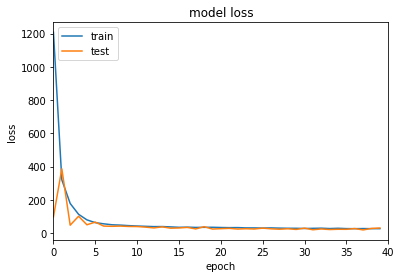

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 27.4772 - root_mean_squared_error: 5.2410 - val_loss: 18.9932 - val_root_mean_squared_error: 4.3571
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 26.3288 - root_mean_squared_error: 5.1302 - val_loss: 18.1946 - val_root_mean_squared_error: 4.2644
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 27.5118 - root_mean_squared_error: 5.2443 - val_loss: 17.8435 - val_root_mean_squared_error: 4.2231
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 24.3672 - root_mean_squared_error: 4.9354 - val_loss: 29.6427 - val_root_mean_squared_error: 5.4436
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 26.5874 - root_mean_squared_error: 5.1554 - val_loss: 25.1686 - val_root_mean_squared_error: 5.0159
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 24.7380 - root_mean_squared_error: 4.9728 - val_loss: 21.8065 - val_ro

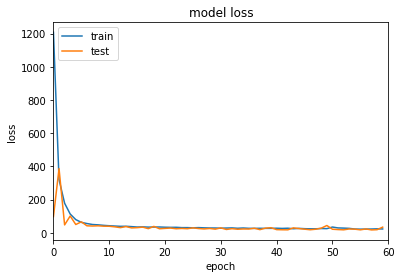

Epoch 1/20
6/6 [==============================] - 1s 138ms/step - loss: 754.4675 - root_mean_squared_error: 27.4674 - val_loss: 191.3652 - val_root_mean_squared_error: 13.8331
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 301.4025 - root_mean_squared_error: 17.3607 - val_loss: 259.5397 - val_root_mean_squared_error: 16.1099
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 114.4386 - root_mean_squared_error: 10.6972 - val_loss: 52.3293 - val_root_mean_squared_error: 7.2333
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 114.4682 - root_mean_squared_error: 10.6986 - val_loss: 90.5464 - val_root_mean_squared_error: 9.5151
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 81.6469 - root_mean_squared_error: 9.0354 - val_loss: 47.9275 - val_root_mean_squared_error: 6.9224
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 68.6223 - root_mean_squared_error: 8.2833 - val_loss: 81.1453 -

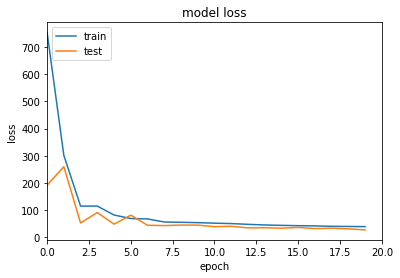

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 41.2098 - root_mean_squared_error: 6.4191 - val_loss: 34.8522 - val_root_mean_squared_error: 5.9031
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 37.1338 - root_mean_squared_error: 6.0933 - val_loss: 26.9799 - val_root_mean_squared_error: 5.1937
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 36.4050 - root_mean_squared_error: 6.0332 - val_loss: 28.5490 - val_root_mean_squared_error: 5.3426
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 35.7221 - root_mean_squared_error: 5.9764 - val_loss: 26.4288 - val_root_mean_squared_error: 5.1404
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 35.5165 - root_mean_squared_error: 5.9591 - val_loss: 25.7708 - val_root_mean_squared_error: 5.0760
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 34.7660 - root_mean_squared_error: 5.8958 - val_loss: 27.2559 - val_roo

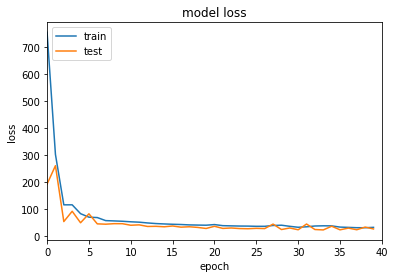

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 30.4735 - root_mean_squared_error: 5.5198 - val_loss: 20.3890 - val_root_mean_squared_error: 4.5148
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 29.5338 - root_mean_squared_error: 5.4340 - val_loss: 30.5783 - val_root_mean_squared_error: 5.5293
Epoch 43/60
6/6 [==============================] - 0s 14ms/step - loss: 30.4551 - root_mean_squared_error: 5.5181 - val_loss: 20.2703 - val_root_mean_squared_error: 4.5017
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 30.2489 - root_mean_squared_error: 5.4994 - val_loss: 22.8426 - val_root_mean_squared_error: 4.7788
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 28.3699 - root_mean_squared_error: 5.3258 - val_loss: 25.5753 - val_root_mean_squared_error: 5.0567
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 28.1613 - root_mean_squared_error: 5.3062 - val_loss: 20.4077 - val_

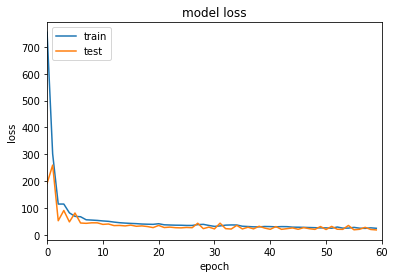

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 461.0457 - root_mean_squared_error: 21.2373 - val_loss: 414.2445 - val_root_mean_squared_error: 20.1104
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 419.0306 - root_mean_squared_error: 20.2320 - val_loss: 374.7239 - val_root_mean_squared_error: 19.1105
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 380.7789 - root_mean_squared_error: 19.2711 - val_loss: 342.1577 - val_root_mean_squared_error: 18.2461
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 350.6833 - root_mean_squared_error: 18.4811 - val_loss: 316.9732 - val_root_mean_squared_error: 17.5497
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 327.7834 - root_mean_squared_error: 17.8577 - val_loss: 296.9279 - val_root_mean_squared_error: 16.9760
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 309.1981 - root_mean_squared_error: 17.3362 - val_loss: 

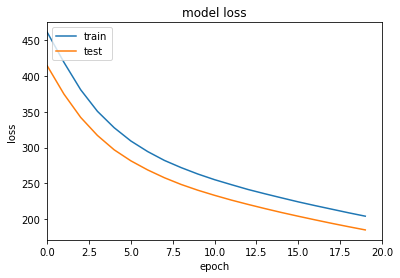

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 199.7641 - root_mean_squared_error: 13.9057 - val_loss: 180.6625 - val_root_mean_squared_error: 13.2024
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 195.3696 - root_mean_squared_error: 13.7487 - val_loss: 176.3665 - val_root_mean_squared_error: 13.0404
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 190.9042 - root_mean_squared_error: 13.5870 - val_loss: 172.2806 - val_root_mean_squared_error: 12.8844
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 186.8561 - root_mean_squared_error: 13.4386 - val_loss: 168.1576 - val_root_mean_squared_error: 12.7246
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 182.6831 - root_mean_squared_error: 13.2834 - val_loss: 164.1389 - val_root_mean_squared_error: 12.5663
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 178.7210 - root_mean_squared_error: 13.1338 - val_lo

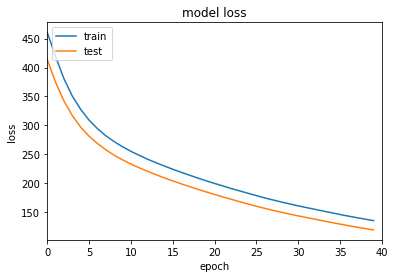

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 133.0490 - root_mean_squared_error: 11.2594 - val_loss: 117.2087 - val_root_mean_squared_error: 10.5333
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 130.8542 - root_mean_squared_error: 11.1627 - val_loss: 115.0321 - val_root_mean_squared_error: 10.4307
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 128.5956 - root_mean_squared_error: 11.0624 - val_loss: 112.9991 - val_root_mean_squared_error: 10.3344
Epoch 44/60
6/6 [==============================] - 0s 13ms/step - loss: 126.5720 - root_mean_squared_error: 10.9719 - val_loss: 110.9996 - val_root_mean_squared_error: 10.2385
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 124.4942 - root_mean_squared_error: 10.8782 - val_loss: 109.1181 - val_root_mean_squared_error: 10.1478
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 122.6556 - root_mean_squared_error: 10.7947 - va

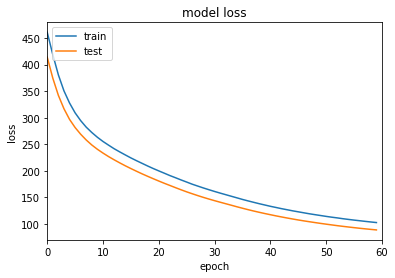

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 456.5537 - root_mean_squared_error: 21.1501 - val_loss: 410.8239 - val_root_mean_squared_error: 20.0440
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 415.7199 - root_mean_squared_error: 20.1683 - val_loss: 374.2215 - val_root_mean_squared_error: 19.1159
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 381.8049 - root_mean_squared_error: 19.3157 - val_loss: 345.5441 - val_root_mean_squared_error: 18.3570
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 355.4690 - root_mean_squared_error: 18.6277 - val_loss: 322.1576 - val_root_mean_squared_error: 17.7149
Epoch 5/20
6/6 [==============================] - 0s 14ms/step - loss: 333.3521 - root_mean_squared_error: 18.0304 - val_loss: 303.4867 - val_root_mean_squared_error: 17.1860
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 315.8646 - root_mean_squared_error: 17.5446 - val_loss

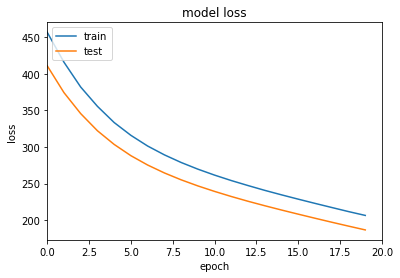

Epoch 21/40
6/6 [==============================] - 0s 27ms/step - loss: 201.3417 - root_mean_squared_error: 13.9713 - val_loss: 181.9330 - val_root_mean_squared_error: 13.2600
Epoch 22/40
6/6 [==============================] - 0s 18ms/step - loss: 196.5155 - root_mean_squared_error: 13.7998 - val_loss: 177.2378 - val_root_mean_squared_error: 13.0840
Epoch 23/40
6/6 [==============================] - 0s 16ms/step - loss: 191.6763 - root_mean_squared_error: 13.6254 - val_loss: 172.8178 - val_root_mean_squared_error: 12.9159
Epoch 24/40
6/6 [==============================] - 0s 17ms/step - loss: 187.1718 - root_mean_squared_error: 13.4607 - val_loss: 168.5737 - val_root_mean_squared_error: 12.7521
Epoch 25/40
6/6 [==============================] - 0s 16ms/step - loss: 183.0839 - root_mean_squared_error: 13.3093 - val_loss: 164.3641 - val_root_mean_squared_error: 12.5870
Epoch 26/40
6/6 [==============================] - 0s 17ms/step - loss: 178.8866 - root_mean_squared_error: 13.1516 - va

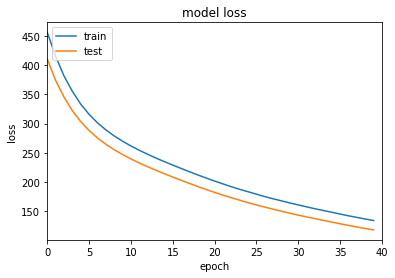

Epoch 41/60
6/6 [==============================] - 0s 27ms/step - loss: 131.2220 - root_mean_squared_error: 11.1965 - val_loss: 115.2614 - val_root_mean_squared_error: 10.4602
Epoch 42/60
6/6 [==============================] - 0s 15ms/step - loss: 128.7795 - root_mean_squared_error: 11.0881 - val_loss: 113.0606 - val_root_mean_squared_error: 10.3557
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 126.5720 - root_mean_squared_error: 10.9892 - val_loss: 110.9440 - val_root_mean_squared_error: 10.2542
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 124.3889 - root_mean_squared_error: 10.8905 - val_loss: 108.8948 - val_root_mean_squared_error: 10.1550
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 122.3644 - root_mean_squared_error: 10.7981 - val_loss: 106.8405 - val_root_mean_squared_error: 10.0542
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 120.1314 - root_mean_squared_error: 10.6952 - va

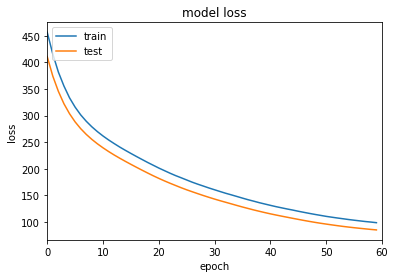

Epoch 1/20
6/6 [==============================] - 1s 55ms/step - loss: 431.9057 - root_mean_squared_error: 20.5638 - val_loss: 385.2480 - val_root_mean_squared_error: 19.4008
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 388.7690 - root_mean_squared_error: 19.4942 - val_loss: 345.4651 - val_root_mean_squared_error: 18.3545
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 350.1283 - root_mean_squared_error: 18.4838 - val_loss: 310.8236 - val_root_mean_squared_error: 17.3926
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 318.2079 - root_mean_squared_error: 17.6063 - val_loss: 283.6709 - val_root_mean_squared_error: 16.6008
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 293.6465 - root_mean_squared_error: 16.9013 - val_loss: 263.1040 - val_root_mean_squared_error: 15.9764
Epoch 6/20
6/6 [==============================] - 0s 13ms/step - loss: 274.2987 - root_mean_squared_error: 16.3256 - val_loss:

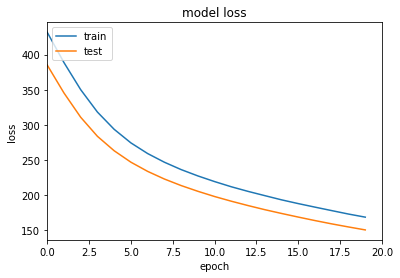

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 164.2680 - root_mean_squared_error: 12.5967 - val_loss: 146.3520 - val_root_mean_squared_error: 11.8659
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 160.2670 - root_mean_squared_error: 12.4394 - val_loss: 142.5166 - val_root_mean_squared_error: 11.7056
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 156.4386 - root_mean_squared_error: 12.2865 - val_loss: 138.8322 - val_root_mean_squared_error: 11.5489
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 152.6523 - root_mean_squared_error: 12.1330 - val_loss: 135.3667 - val_root_mean_squared_error: 11.3992
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 149.0564 - root_mean_squared_error: 11.9851 - val_loss: 132.0998 - val_root_mean_squared_error: 11.2562
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 145.8119 - root_mean_squared_error: 11.8500 - va

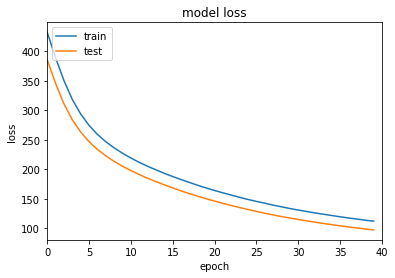

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 110.6503 - root_mean_squared_error: 10.2567 - val_loss: 96.0417 - val_root_mean_squared_error: 9.5186
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 109.0302 - root_mean_squared_error: 10.1785 - val_loss: 94.5971 - val_root_mean_squared_error: 9.4437
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 107.5077 - root_mean_squared_error: 10.1046 - val_loss: 93.1936 - val_root_mean_squared_error: 9.3702
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 106.1440 - root_mean_squared_error: 10.0378 - val_loss: 91.8080 - val_root_mean_squared_error: 9.2971
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 104.6580 - root_mean_squared_error: 9.9648 - val_loss: 90.5536 - val_root_mean_squared_error: 9.2308
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 103.4704 - root_mean_squared_error: 9.9061 - val_loss: 89.2

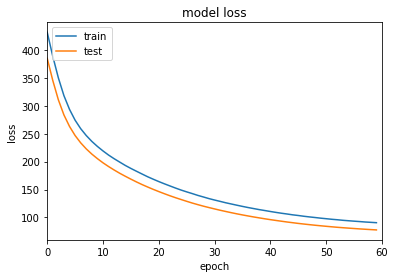

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 471.5755 - root_mean_squared_error: 21.5074 - val_loss: 418.5700 - val_root_mean_squared_error: 20.2416
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 420.0721 - root_mean_squared_error: 20.2811 - val_loss: 373.7480 - val_root_mean_squared_error: 19.1087
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 378.4294 - root_mean_squared_error: 19.2332 - val_loss: 339.3448 - val_root_mean_squared_error: 18.1925
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 346.9049 - root_mean_squared_error: 18.4013 - val_loss: 312.3746 - val_root_mean_squared_error: 17.4415
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 322.0713 - root_mean_squared_error: 17.7195 - val_loss: 290.8528 - val_root_mean_squared_error: 16.8191
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 301.9772 - root_mean_squared_error: 17.1487 - val_loss: 27

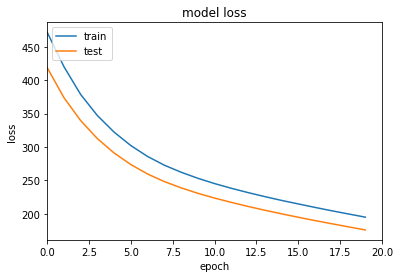

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 190.2455 - root_mean_squared_error: 13.5694 - val_loss: 171.3691 - val_root_mean_squared_error: 12.8559
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 185.7077 - root_mean_squared_error: 13.4024 - val_loss: 166.8753 - val_root_mean_squared_error: 12.6811
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 181.1649 - root_mean_squared_error: 13.2328 - val_loss: 162.4374 - val_root_mean_squared_error: 12.5055
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 176.6006 - root_mean_squared_error: 13.0597 - val_loss: 158.0577 - val_root_mean_squared_error: 12.3297
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 172.0672 - root_mean_squared_error: 12.8854 - val_loss: 153.6599 - val_root_mean_squared_error: 12.1502
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 167.4734 - root_mean_squared_error: 12.7060 - val

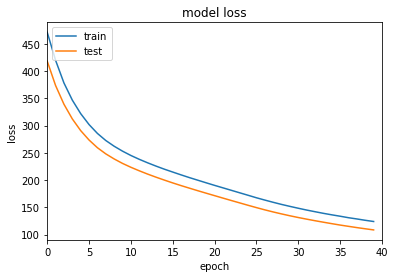

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 121.7513 - root_mean_squared_error: 10.7548 - val_loss: 106.4285 - val_root_mean_squared_error: 10.0178
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 119.7824 - root_mean_squared_error: 10.6639 - val_loss: 104.4988 - val_root_mean_squared_error: 9.9221
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 117.8598 - root_mean_squared_error: 10.5745 - val_loss: 102.6709 - val_root_mean_squared_error: 9.8309
Epoch 44/60
6/6 [==============================] - 0s 13ms/step - loss: 115.9354 - root_mean_squared_error: 10.4844 - val_loss: 100.9753 - val_root_mean_squared_error: 9.7457
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 114.1746 - root_mean_squared_error: 10.4014 - val_loss: 99.3456 - val_root_mean_squared_error: 9.6631
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 112.5072 - root_mean_squared_error: 10.3222 - val_los

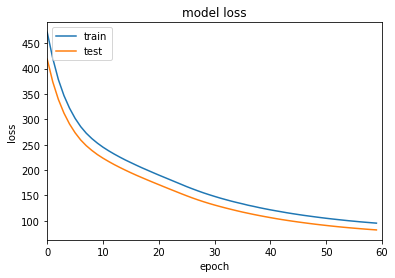

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 459.9931 - root_mean_squared_error: 21.4013 - val_loss: 415.4190 - val_root_mean_squared_error: 20.3344
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 421.1129 - root_mean_squared_error: 20.4745 - val_loss: 379.8110 - val_root_mean_squared_error: 19.4408
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 387.2820 - root_mean_squared_error: 19.6326 - val_loss: 350.0474 - val_root_mean_squared_error: 18.6612
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 359.5331 - root_mean_squared_error: 18.9142 - val_loss: 326.0259 - val_root_mean_squared_error: 18.0075
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 336.9012 - root_mean_squared_error: 18.3074 - val_loss: 306.5874 - val_root_mean_squared_error: 17.4606
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 318.8664 - root_mean_squared_error: 17.8092 - val_loss:

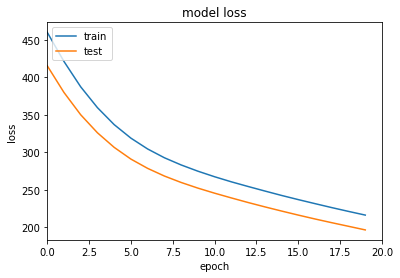

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 211.4890 - root_mean_squared_error: 14.4935 - val_loss: 191.7294 - val_root_mean_squared_error: 13.7951
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 206.4764 - root_mean_squared_error: 14.3196 - val_loss: 186.9973 - val_root_mean_squared_error: 13.6226
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 201.6655 - root_mean_squared_error: 14.1507 - val_loss: 182.3050 - val_root_mean_squared_error: 13.4492
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 196.9426 - root_mean_squared_error: 13.9828 - val_loss: 177.7759 - val_root_mean_squared_error: 13.2797
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 192.3542 - root_mean_squared_error: 13.8177 - val_loss: 173.4040 - val_root_mean_squared_error: 13.1139
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 187.9920 - root_mean_squared_error: 13.6587 - val

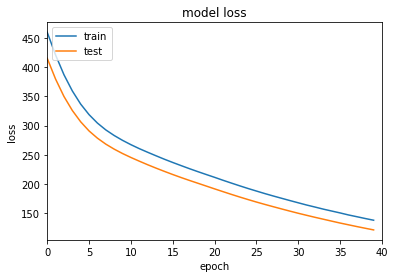

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 135.0615 - root_mean_squared_error: 11.5530 - val_loss: 118.7464 - val_root_mean_squared_error: 10.8236
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 132.4305 - root_mean_squared_error: 11.4382 - val_loss: 116.1299 - val_root_mean_squared_error: 10.7017
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 129.8869 - root_mean_squared_error: 11.3261 - val_loss: 113.6163 - val_root_mean_squared_error: 10.5834
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 127.2270 - root_mean_squared_error: 11.2079 - val_loss: 111.2916 - val_root_mean_squared_error: 10.4729
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 124.8257 - root_mean_squared_error: 11.1003 - val_loss: 109.0588 - val_root_mean_squared_error: 10.3658
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 122.4762 - root_mean_squared_error: 10.9940 - va

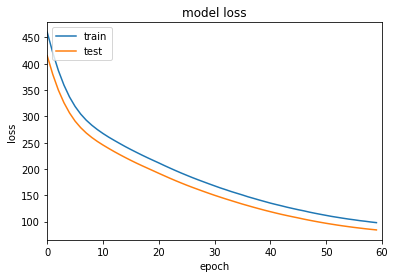

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 421.2664 - root_mean_squared_error: 20.5004 - val_loss: 377.5130 - val_root_mean_squared_error: 19.4045
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 382.4005 - root_mean_squared_error: 19.5303 - val_loss: 341.5463 - val_root_mean_squared_error: 18.4553
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 347.6352 - root_mean_squared_error: 18.6198 - val_loss: 309.2805 - val_root_mean_squared_error: 17.5601
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 318.3624 - root_mean_squared_error: 17.8170 - val_loss: 285.2453 - val_root_mean_squared_error: 16.8625
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 295.8493 - root_mean_squared_error: 17.1743 - val_loss: 267.3662 - val_root_mean_squared_error: 16.3244
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 279.5782 - root_mean_squared_error: 16.6945 - val_loss

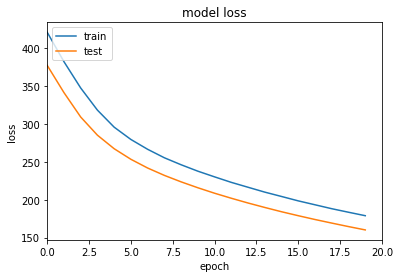

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 174.3511 - root_mean_squared_error: 13.1770 - val_loss: 155.9348 - val_root_mean_squared_error: 12.4586
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 170.1942 - root_mean_squared_error: 13.0183 - val_loss: 151.9367 - val_root_mean_squared_error: 12.2972
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 166.1233 - root_mean_squared_error: 12.8610 - val_loss: 148.0642 - val_root_mean_squared_error: 12.1387
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 162.1803 - root_mean_squared_error: 12.7068 - val_loss: 144.3420 - val_root_mean_squared_error: 11.9842
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 158.5115 - root_mean_squared_error: 12.5614 - val_loss: 140.7376 - val_root_mean_squared_error: 11.8327
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 154.8517 - root_mean_squared_error: 12.4147 - val

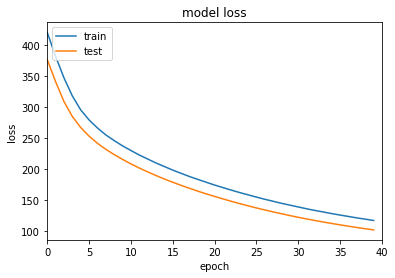

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 115.2516 - root_mean_squared_error: 10.6964 - val_loss: 99.9538 - val_root_mean_squared_error: 9.9556
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 113.3409 - root_mean_squared_error: 10.6067 - val_loss: 98.1905 - val_root_mean_squared_error: 9.8667
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 111.4788 - root_mean_squared_error: 10.5185 - val_loss: 96.5440 - val_root_mean_squared_error: 9.7829
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 109.7522 - root_mean_squared_error: 10.4362 - val_loss: 94.9598 - val_root_mean_squared_error: 9.7017
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 108.1298 - root_mean_squared_error: 10.3582 - val_loss: 93.4338 - val_root_mean_squared_error: 9.6228
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 106.6028 - root_mean_squared_error: 10.2843 - val_loss: 91

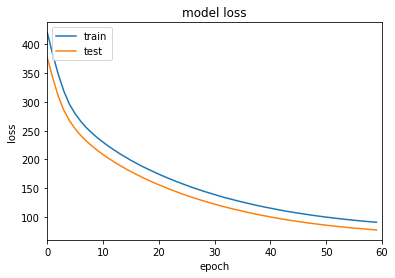

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 445.3913 - root_mean_squared_error: 21.0829 - val_loss: 397.9340 - val_root_mean_squared_error: 19.9261
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 403.4153 - root_mean_squared_error: 20.0634 - val_loss: 361.4988 - val_root_mean_squared_error: 18.9904
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 368.4136 - root_mean_squared_error: 19.1718 - val_loss: 330.4138 - val_root_mean_squared_error: 18.1541
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 338.2982 - root_mean_squared_error: 18.3702 - val_loss: 303.2394 - val_root_mean_squared_error: 17.3901
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 312.7355 - root_mean_squared_error: 17.6612 - val_loss: 281.9189 - val_root_mean_squared_error: 16.7664
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 293.5606 - root_mean_squared_error: 17.1103 - val_loss: 2

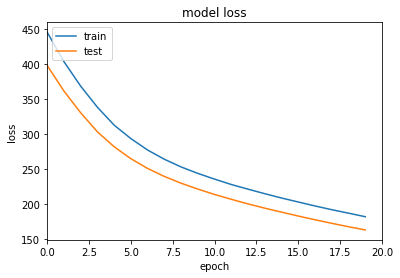

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 177.5159 - root_mean_squared_error: 13.2989 - val_loss: 158.8619 - val_root_mean_squared_error: 12.5781
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 173.0155 - root_mean_squared_error: 13.1287 - val_loss: 154.7485 - val_root_mean_squared_error: 12.4135
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 168.9595 - root_mean_squared_error: 12.9732 - val_loss: 150.7329 - val_root_mean_squared_error: 12.2506
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 164.9452 - root_mean_squared_error: 12.8175 - val_loss: 146.8824 - val_root_mean_squared_error: 12.0923
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 161.0340 - root_mean_squared_error: 12.6639 - val_loss: 143.2264 - val_root_mean_squared_error: 11.9400
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 157.3158 - root_mean_squared_error: 12.5160 - va

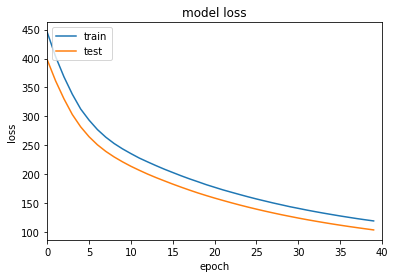

Epoch 41/60
6/6 [==============================] - 0s 22ms/step - loss: 117.2746 - root_mean_squared_error: 10.7931 - val_loss: 102.0282 - val_root_mean_squared_error: 10.0620
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 115.3616 - root_mean_squared_error: 10.7040 - val_loss: 100.3082 - val_root_mean_squared_error: 9.9761
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 113.5933 - root_mean_squared_error: 10.6211 - val_loss: 98.6002 - val_root_mean_squared_error: 9.8901
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 111.9113 - root_mean_squared_error: 10.5416 - val_loss: 96.9167 - val_root_mean_squared_error: 9.8046
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 110.2133 - root_mean_squared_error: 10.4607 - val_loss: 95.3255 - val_root_mean_squared_error: 9.7231
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 108.5690 - root_mean_squared_error: 10.3818 - val_loss: 93.

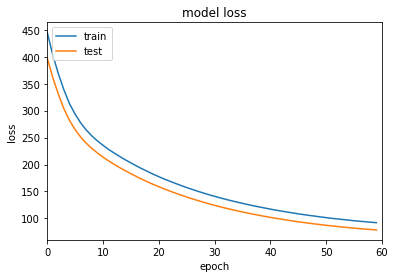

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 425.7384 - root_mean_squared_error: 20.6116 - val_loss: 374.6216 - val_root_mean_squared_error: 19.3323
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 375.2470 - root_mean_squared_error: 19.3487 - val_loss: 331.0656 - val_root_mean_squared_error: 18.1715
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 336.1414 - root_mean_squared_error: 18.3108 - val_loss: 297.6796 - val_root_mean_squared_error: 17.2289
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 305.1480 - root_mean_squared_error: 17.4445 - val_loss: 271.5273 - val_root_mean_squared_error: 16.4530
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 281.4338 - root_mean_squared_error: 16.7515 - val_loss: 251.5213 - val_root_mean_squared_error: 15.8339
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 262.4317 - root_mean_squared_error: 16.1749 - val_loss: 

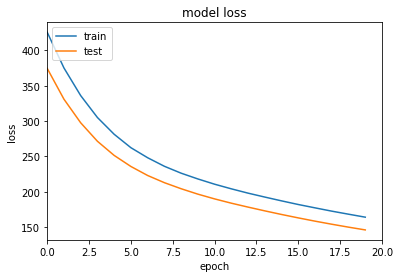

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 160.1729 - root_mean_squared_error: 12.6293 - val_loss: 142.4373 - val_root_mean_squared_error: 11.9065
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 156.4984 - root_mean_squared_error: 12.4830 - val_loss: 138.8586 - val_root_mean_squared_error: 11.7552
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 152.9116 - root_mean_squared_error: 12.3384 - val_loss: 135.4521 - val_root_mean_squared_error: 11.6093
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 149.5103 - root_mean_squared_error: 12.1997 - val_loss: 132.1509 - val_root_mean_squared_error: 11.4661
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 145.9926 - root_mean_squared_error: 12.0545 - val_loss: 129.0820 - val_root_mean_squared_error: 11.3313
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 142.9311 - root_mean_squared_error: 11.9266 - val

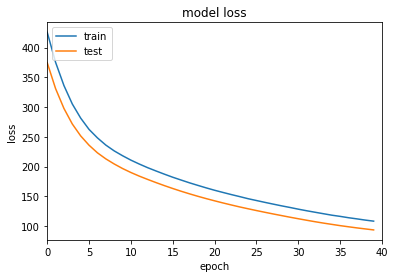

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 106.6258 - root_mean_squared_error: 10.2872 - val_loss: 91.8631 - val_root_mean_squared_error: 9.5427
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 104.9408 - root_mean_squared_error: 10.2049 - val_loss: 90.3150 - val_root_mean_squared_error: 9.4612
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 103.2900 - root_mean_squared_error: 10.1237 - val_loss: 88.8882 - val_root_mean_squared_error: 9.3855
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 101.8678 - root_mean_squared_error: 10.0532 - val_loss: 87.4895 - val_root_mean_squared_error: 9.3106
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 100.4809 - root_mean_squared_error: 9.9839 - val_loss: 86.1573 - val_root_mean_squared_error: 9.2388
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 99.1395 - root_mean_squared_error: 9.9165 - val_loss: 84.9154 

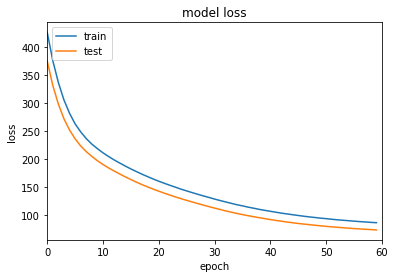

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 511.1176 - root_mean_squared_error: 22.5820 - val_loss: 465.8471 - val_root_mean_squared_error: 21.5572
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 472.3462 - root_mean_squared_error: 21.7078 - val_loss: 428.9110 - val_root_mean_squared_error: 20.6839
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 436.0961 - root_mean_squared_error: 20.8573 - val_loss: 396.6381 - val_root_mean_squared_error: 19.8895
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 405.7935 - root_mean_squared_error: 20.1187 - val_loss: 369.6275 - val_root_mean_squared_error: 19.1995
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 380.0749 - root_mean_squared_error: 19.4700 - val_loss: 347.8722 - val_root_mean_squared_error: 18.6251
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 359.6972 - root_mean_squared_error: 18.9402 - val_loss: 3

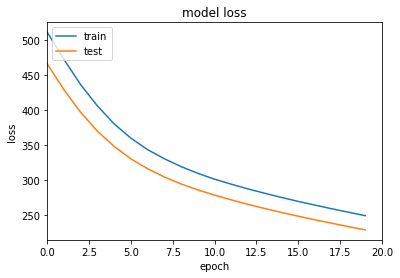

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 244.2330 - root_mean_squared_error: 15.6023 - val_loss: 223.8488 - val_root_mean_squared_error: 14.9348
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 239.5015 - root_mean_squared_error: 15.4499 - val_loss: 219.3658 - val_root_mean_squared_error: 14.7840
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 234.9113 - root_mean_squared_error: 15.3007 - val_loss: 214.9894 - val_root_mean_squared_error: 14.6352
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 230.4488 - root_mean_squared_error: 15.1542 - val_loss: 210.5804 - val_root_mean_squared_error: 14.4838
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 226.0246 - root_mean_squared_error: 15.0075 - val_loss: 206.1473 - val_root_mean_squared_error: 14.3299
Epoch 26/40
6/6 [==============================] - 0s 13ms/step - loss: 221.4653 - root_mean_squared_error: 14.8547 - val

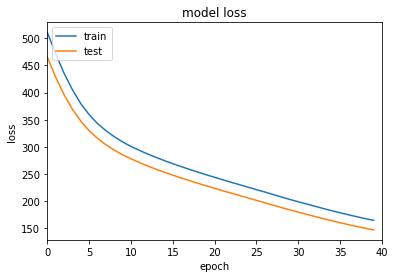

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 161.7923 - root_mean_squared_error: 12.6821 - val_loss: 144.4385 - val_root_mean_squared_error: 11.9782
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 158.8218 - root_mean_squared_error: 12.5642 - val_loss: 141.6079 - val_root_mean_squared_error: 11.8593
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 156.0040 - root_mean_squared_error: 12.4514 - val_loss: 138.8264 - val_root_mean_squared_error: 11.7413
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 153.1187 - root_mean_squared_error: 12.3349 - val_loss: 136.1844 - val_root_mean_squared_error: 11.6282
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 150.4799 - root_mean_squared_error: 12.2274 - val_loss: 133.6010 - val_root_mean_squared_error: 11.5165
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 147.8532 - root_mean_squared_error: 12.1195 - val_

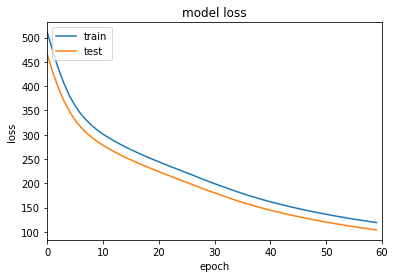

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 419.1370 - root_mean_squared_error: 20.4679 - val_loss: 369.2797 - val_root_mean_squared_error: 19.2115
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 372.1965 - root_mean_squared_error: 19.2873 - val_loss: 327.5190 - val_root_mean_squared_error: 18.0922
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 332.2920 - root_mean_squared_error: 18.2236 - val_loss: 293.8506 - val_root_mean_squared_error: 17.1366
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 301.3798 - root_mean_squared_error: 17.3549 - val_loss: 269.2169 - val_root_mean_squared_error: 16.4022
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 279.4173 - root_mean_squared_error: 16.7103 - val_loss: 250.8342 - val_root_mean_squared_error: 15.8320
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 262.7659 - root_mean_squared_error: 16.2045 - val_loss: 2

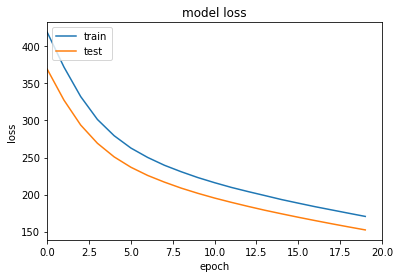

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 166.2557 - root_mean_squared_error: 12.8876 - val_loss: 148.1624 - val_root_mean_squared_error: 12.1654
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 162.2274 - root_mean_squared_error: 12.7303 - val_loss: 144.1584 - val_root_mean_squared_error: 11.9997
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 158.1420 - root_mean_squared_error: 12.5688 - val_loss: 140.3754 - val_root_mean_squared_error: 11.8410
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 154.3418 - root_mean_squared_error: 12.4167 - val_loss: 136.7378 - val_root_mean_squared_error: 11.6863
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 150.6187 - root_mean_squared_error: 12.2658 - val_loss: 133.2338 - val_root_mean_squared_error: 11.5354
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 147.0463 - root_mean_squared_error: 12.1193 - va

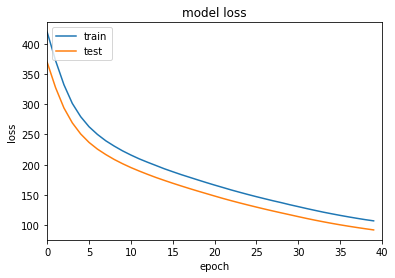

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 105.1680 - root_mean_squared_error: 10.2454 - val_loss: 90.2400 - val_root_mean_squared_error: 9.4888
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 103.1852 - root_mean_squared_error: 10.1480 - val_loss: 88.6235 - val_root_mean_squared_error: 9.4031
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 101.4826 - root_mean_squared_error: 10.0637 - val_loss: 87.1014 - val_root_mean_squared_error: 9.3217
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 99.9812 - root_mean_squared_error: 9.9887 - val_loss: 85.6161 - val_root_mean_squared_error: 9.2416
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 98.3851 - root_mean_squared_error: 9.9084 - val_loss: 84.2408 - val_root_mean_squared_error: 9.1669
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 97.0161 - root_mean_squared_error: 9.8390 - val_loss: 82.9349 -

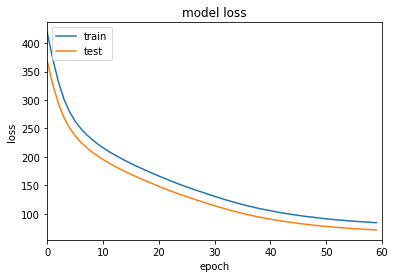

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 428.5896 - root_mean_squared_error: 20.7000 - val_loss: 384.8393 - val_root_mean_squared_error: 19.6148
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 390.2723 - root_mean_squared_error: 19.7528 - val_loss: 348.6460 - val_root_mean_squared_error: 18.6695
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 355.0260 - root_mean_squared_error: 18.8396 - val_loss: 318.2165 - val_root_mean_squared_error: 17.8360
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 327.1364 - root_mean_squared_error: 18.0844 - val_loss: 294.6745 - val_root_mean_squared_error: 17.1634
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 306.0327 - root_mean_squared_error: 17.4912 - val_loss: 277.4225 - val_root_mean_squared_error: 16.6533
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 290.0387 - root_mean_squared_error: 17.0279 - val_loss:

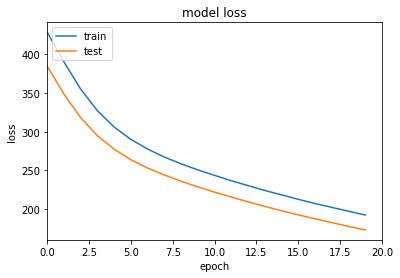

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 187.4498 - root_mean_squared_error: 13.6885 - val_loss: 168.5872 - val_root_mean_squared_error: 12.9812
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 182.9712 - root_mean_squared_error: 13.5239 - val_loss: 164.3211 - val_root_mean_squared_error: 12.8158
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 178.7645 - root_mean_squared_error: 13.3675 - val_loss: 160.1429 - val_root_mean_squared_error: 12.6518
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 174.5934 - root_mean_squared_error: 13.2105 - val_loss: 156.0959 - val_root_mean_squared_error: 12.4908
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 170.4840 - root_mean_squared_error: 13.0540 - val_loss: 152.1338 - val_root_mean_squared_error: 12.3311
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 166.2960 - root_mean_squared_error: 12.8926 - val_

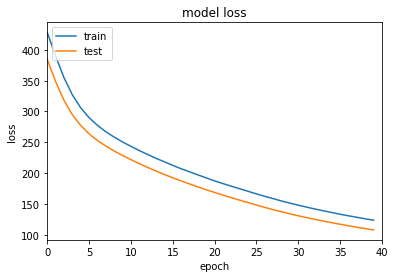

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 121.3696 - root_mean_squared_error: 11.0124 - val_loss: 105.7689 - val_root_mean_squared_error: 10.2797
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 119.2479 - root_mean_squared_error: 10.9156 - val_loss: 103.7984 - val_root_mean_squared_error: 10.1834
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 117.2457 - root_mean_squared_error: 10.8235 - val_loss: 101.8889 - val_root_mean_squared_error: 10.0891
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 115.3581 - root_mean_squared_error: 10.7359 - val_loss: 100.0323 - val_root_mean_squared_error: 9.9967
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 113.3845 - root_mean_squared_error: 10.6436 - val_loss: 98.3093 - val_root_mean_squared_error: 9.9101
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 111.6865 - root_mean_squared_error: 10.5635 - val_los

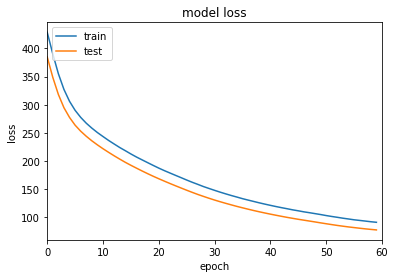

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 420.2586 - root_mean_squared_error: 20.4980 - val_loss: 372.8384 - val_root_mean_squared_error: 19.3067
Epoch 2/20
6/6 [==============================] - 0s 12ms/step - loss: 377.1272 - root_mean_squared_error: 19.4175 - val_loss: 335.0458 - val_root_mean_squared_error: 18.3018
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 342.3646 - root_mean_squared_error: 18.5007 - val_loss: 305.4334 - val_root_mean_squared_error: 17.4742
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 314.5824 - root_mean_squared_error: 17.7341 - val_loss: 282.1777 - val_root_mean_squared_error: 16.7956
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 293.4203 - root_mean_squared_error: 17.1271 - val_loss: 264.1549 - val_root_mean_squared_error: 16.2503
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 276.6977 - root_mean_squared_error: 16.6318 - val_loss:

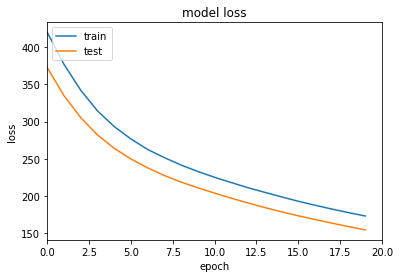

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 168.4534 - root_mean_squared_error: 12.9763 - val_loss: 150.1263 - val_root_mean_squared_error: 12.2498
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 164.2772 - root_mean_squared_error: 12.8144 - val_loss: 146.1388 - val_root_mean_squared_error: 12.0860
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 160.2363 - root_mean_squared_error: 12.6557 - val_loss: 142.3742 - val_root_mean_squared_error: 11.9292
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 156.4203 - root_mean_squared_error: 12.5041 - val_loss: 138.7785 - val_root_mean_squared_error: 11.7775
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 152.8139 - root_mean_squared_error: 12.3590 - val_loss: 135.3186 - val_root_mean_squared_error: 11.6297
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 149.3142 - root_mean_squared_error: 12.2166 - val

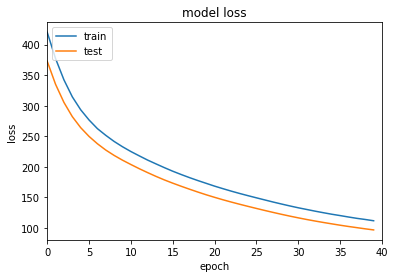

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 110.0164 - root_mean_squared_error: 10.4847 - val_loss: 95.1138 - val_root_mean_squared_error: 9.7481
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 108.3617 - root_mean_squared_error: 10.4054 - val_loss: 93.4140 - val_root_mean_squared_error: 9.6605
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 106.5110 - root_mean_squared_error: 10.3161 - val_loss: 91.8654 - val_root_mean_squared_error: 9.5800
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 104.8883 - root_mean_squared_error: 10.2371 - val_loss: 90.3756 - val_root_mean_squared_error: 9.5019
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 103.4028 - root_mean_squared_error: 10.1643 - val_loss: 88.9110 - val_root_mean_squared_error: 9.4245
Epoch 46/60
6/6 [==============================] - 0s 13ms/step - loss: 101.9446 - root_mean_squared_error: 10.0923 - val_loss: 87

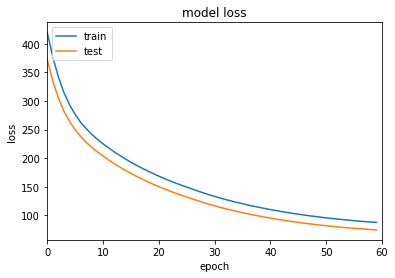

Epoch 1/20
6/6 [==============================] - 1s 58ms/step - loss: 410.5509 - root_mean_squared_error: 20.2351 - val_loss: 361.3852 - val_root_mean_squared_error: 18.9821
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 365.0407 - root_mean_squared_error: 19.0785 - val_loss: 323.6248 - val_root_mean_squared_error: 17.9609
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 330.4868 - root_mean_squared_error: 18.1513 - val_loss: 294.9072 - val_root_mean_squared_error: 17.1437
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 304.3275 - root_mean_squared_error: 17.4166 - val_loss: 272.1716 - val_root_mean_squared_error: 16.4681
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 283.0095 - root_mean_squared_error: 16.7942 - val_loss: 254.5948 - val_root_mean_squared_error: 15.9261
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 267.2548 - root_mean_squared_error: 16.3190 - val_loss

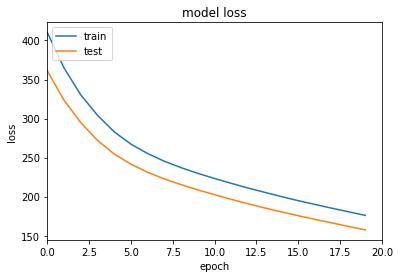

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 171.5622 - root_mean_squared_error: 13.0659 - val_loss: 153.0562 - val_root_mean_squared_error: 12.3374
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 167.1680 - root_mean_squared_error: 12.8966 - val_loss: 149.0258 - val_root_mean_squared_error: 12.1728
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 163.1846 - root_mean_squared_error: 12.7411 - val_loss: 145.1751 - val_root_mean_squared_error: 12.0135
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 159.3023 - root_mean_squared_error: 12.5877 - val_loss: 141.5396 - val_root_mean_squared_error: 11.8610
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 155.6537 - root_mean_squared_error: 12.4417 - val_loss: 138.0808 - val_root_mean_squared_error: 11.7141
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 152.1929 - root_mean_squared_error: 12.3017 - val

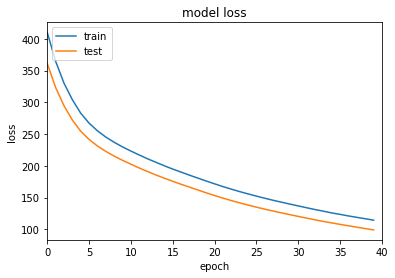

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 112.1276 - root_mean_squared_error: 10.5436 - val_loss: 96.8533 - val_root_mean_squared_error: 9.7922
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 109.9899 - root_mean_squared_error: 10.4413 - val_loss: 94.9243 - val_root_mean_squared_error: 9.6927
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 107.9993 - root_mean_squared_error: 10.3451 - val_loss: 93.0934 - val_root_mean_squared_error: 9.5975
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 106.1117 - root_mean_squared_error: 10.2532 - val_loss: 91.3708 - val_root_mean_squared_error: 9.5071
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 104.3920 - root_mean_squared_error: 10.1688 - val_loss: 89.7192 - val_root_mean_squared_error: 9.4197
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 102.6302 - root_mean_squared_error: 10.0818 - val_loss: 88.195

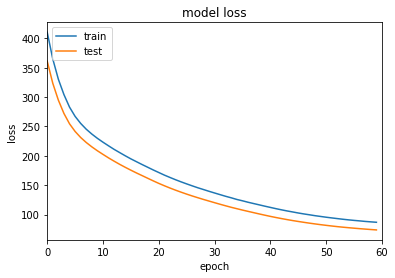

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 437.2793 - root_mean_squared_error: 20.9084 - val_loss: 392.6170 - val_root_mean_squared_error: 19.8117
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 398.6239 - root_mean_squared_error: 19.9627 - val_loss: 357.6219 - val_root_mean_squared_error: 18.9079
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 365.2705 - root_mean_squared_error: 19.1092 - val_loss: 328.2883 - val_root_mean_squared_error: 18.1157
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 337.6973 - root_mean_squared_error: 18.3736 - val_loss: 304.8482 - val_root_mean_squared_error: 17.4569
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 316.4873 - root_mean_squared_error: 17.7871 - val_loss: 287.8105 - val_root_mean_squared_error: 16.9619
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 300.7038 - root_mean_squared_error: 17.3378 - val_loss:

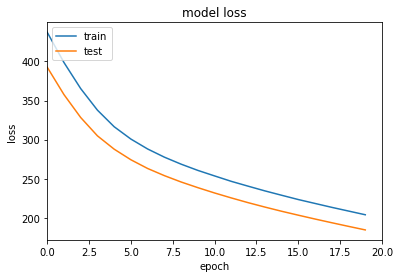

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 199.3344 - root_mean_squared_error: 14.1152 - val_loss: 180.0287 - val_root_mean_squared_error: 13.4139
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 194.7335 - root_mean_squared_error: 13.9512 - val_loss: 175.4903 - val_root_mean_squared_error: 13.2436
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 190.1215 - root_mean_squared_error: 13.7849 - val_loss: 171.0303 - val_root_mean_squared_error: 13.0741
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 185.5340 - root_mean_squared_error: 13.6175 - val_loss: 166.6944 - val_root_mean_squared_error: 12.9072
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 181.1775 - root_mean_squared_error: 13.4566 - val_loss: 162.5015 - val_root_mean_squared_error: 12.7437
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 176.9681 - root_mean_squared_error: 13.2992 - val_

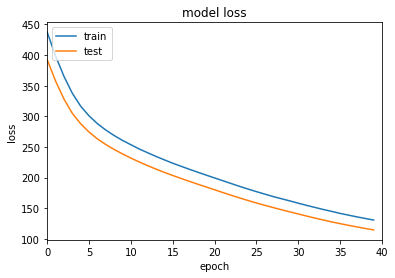

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 128.2011 - root_mean_squared_error: 11.3174 - val_loss: 112.1744 - val_root_mean_squared_error: 10.5856
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 125.8069 - root_mean_squared_error: 11.2110 - val_loss: 109.9934 - val_root_mean_squared_error: 10.4820
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 123.5831 - root_mean_squared_error: 11.1114 - val_loss: 107.8755 - val_root_mean_squared_error: 10.3805
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 121.4125 - root_mean_squared_error: 11.0132 - val_loss: 105.8490 - val_root_mean_squared_error: 10.2823
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 119.3658 - root_mean_squared_error: 10.9198 - val_loss: 103.8979 - val_root_mean_squared_error: 10.1870
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 117.4211 - root_mean_squared_error: 10.8304 - va

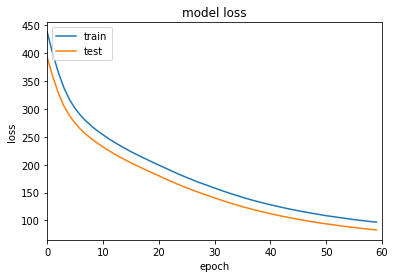

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 448.5135 - root_mean_squared_error: 21.1777 - val_loss: 399.5063 - val_root_mean_squared_error: 19.9872
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 403.1891 - root_mean_squared_error: 20.0791 - val_loss: 360.7112 - val_root_mean_squared_error: 18.9919
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 368.2833 - root_mean_squared_error: 19.1902 - val_loss: 330.0306 - val_root_mean_squared_error: 18.1662
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 339.1972 - root_mean_squared_error: 18.4168 - val_loss: 304.6984 - val_root_mean_squared_error: 17.4551
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 315.2830 - root_mean_squared_error: 17.7557 - val_loss: 285.5425 - val_root_mean_squared_error: 16.8975
Epoch 6/20
6/6 [==============================] - 0s 12ms/step - loss: 298.1993 - root_mean_squared_error: 17.2679 - val_loss: 27

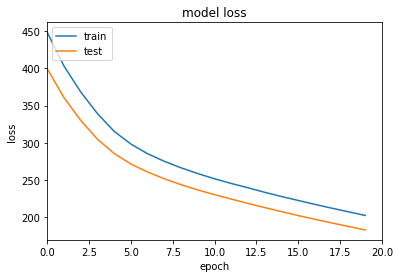

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 197.4657 - root_mean_squared_error: 14.0517 - val_loss: 178.2877 - val_root_mean_squared_error: 13.3518
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 192.9893 - root_mean_squared_error: 13.8915 - val_loss: 173.8259 - val_root_mean_squared_error: 13.1837
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 188.4034 - root_mean_squared_error: 13.7254 - val_loss: 169.6008 - val_root_mean_squared_error: 13.0225
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 184.1490 - root_mean_squared_error: 13.5695 - val_loss: 165.5152 - val_root_mean_squared_error: 12.8646
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 180.0001 - root_mean_squared_error: 13.4158 - val_loss: 161.5534 - val_root_mean_squared_error: 12.7097
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 175.9986 - root_mean_squared_error: 13.2658 - val

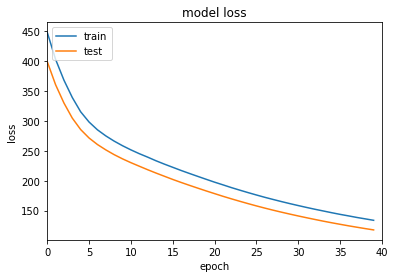

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 131.4305 - root_mean_squared_error: 11.4634 - val_loss: 115.3357 - val_root_mean_squared_error: 10.7385
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 129.1035 - root_mean_squared_error: 11.3615 - val_loss: 113.2663 - val_root_mean_squared_error: 10.6417
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 126.9898 - root_mean_squared_error: 11.2681 - val_loss: 111.2469 - val_root_mean_squared_error: 10.5464
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 124.9779 - root_mean_squared_error: 11.1784 - val_loss: 109.2708 - val_root_mean_squared_error: 10.4523
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 122.9388 - root_mean_squared_error: 11.0868 - val_loss: 107.3597 - val_root_mean_squared_error: 10.3604
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 120.8838 - root_mean_squared_error: 10.9937 - val_l

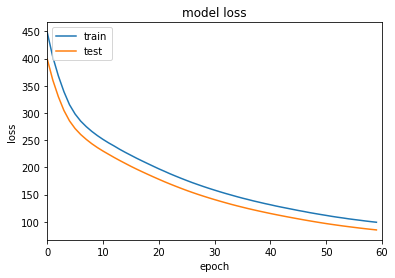

Epoch 1/20
6/6 [==============================] - 1s 64ms/step - loss: 434.7228 - root_mean_squared_error: 20.8498 - val_loss: 390.6810 - val_root_mean_squared_error: 19.7654
Epoch 2/20
6/6 [==============================] - 0s 14ms/step - loss: 397.0256 - root_mean_squared_error: 19.9253 - val_loss: 355.5108 - val_root_mean_squared_error: 18.8547
Epoch 3/20
6/6 [==============================] - 0s 18ms/step - loss: 362.4119 - root_mean_squared_error: 19.0369 - val_loss: 324.8777 - val_root_mean_squared_error: 18.0241
Epoch 4/20
6/6 [==============================] - 0s 16ms/step - loss: 333.8023 - root_mean_squared_error: 18.2700 - val_loss: 300.9156 - val_root_mean_squared_error: 17.3466
Epoch 5/20
6/6 [==============================] - 0s 16ms/step - loss: 311.9652 - root_mean_squared_error: 17.6623 - val_loss: 281.8379 - val_root_mean_squared_error: 16.7878
Epoch 6/20
6/6 [==============================] - 0s 16ms/step - loss: 294.4023 - root_mean_squared_error: 17.1579 - val_loss

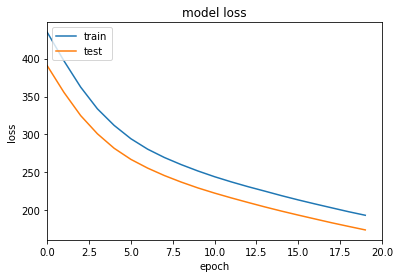

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 188.7603 - root_mean_squared_error: 13.7387 - val_loss: 169.9243 - val_root_mean_squared_error: 13.0352
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 184.4016 - root_mean_squared_error: 13.5792 - val_loss: 165.6918 - val_root_mean_squared_error: 12.8718
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 180.1776 - root_mean_squared_error: 13.4227 - val_loss: 161.5939 - val_root_mean_squared_error: 12.7117
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 175.9843 - root_mean_squared_error: 13.2656 - val_loss: 157.6967 - val_root_mean_squared_error: 12.5574
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 172.0758 - root_mean_squared_error: 13.1175 - val_loss: 153.9173 - val_root_mean_squared_error: 12.4060
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 168.2854 - root_mean_squared_error: 12.9722 - val_

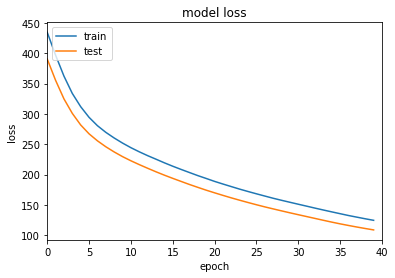

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 122.3007 - root_mean_squared_error: 11.0585 - val_loss: 106.4545 - val_root_mean_squared_error: 10.3172
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 119.9499 - root_mean_squared_error: 10.9517 - val_loss: 104.3188 - val_root_mean_squared_error: 10.2131
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 117.7689 - root_mean_squared_error: 10.8517 - val_loss: 102.2982 - val_root_mean_squared_error: 10.1137
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 115.6211 - root_mean_squared_error: 10.7522 - val_loss: 100.4008 - val_root_mean_squared_error: 10.0195
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 113.6880 - root_mean_squared_error: 10.6620 - val_loss: 98.5448 - val_root_mean_squared_error: 9.9264
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 111.7770 - root_mean_squared_error: 10.5720 - val_lo

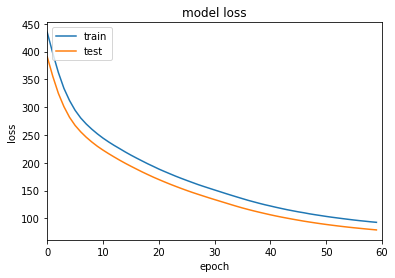

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 1363.1138 - root_mean_squared_error: 36.7807 - val_loss: 1021.4699 - val_root_mean_squared_error: 31.7994
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 887.7948 - root_mean_squared_error: 29.6234 - val_loss: 615.0364 - val_root_mean_squared_error: 24.5929
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 532.4400 - root_mean_squared_error: 22.8524 - val_loss: 332.1449 - val_root_mean_squared_error: 17.9433
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 292.4439 - root_mean_squared_error: 16.8011 - val_loss: 160.0976 - val_root_mean_squared_error: 12.2456
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 148.2187 - root_mean_squared_error: 11.7512 - val_loss: 75.9476 - val_root_mean_squared_error: 8.1145
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 80.0399 - root_mean_squared_error: 8.3638 - val_loss: 4

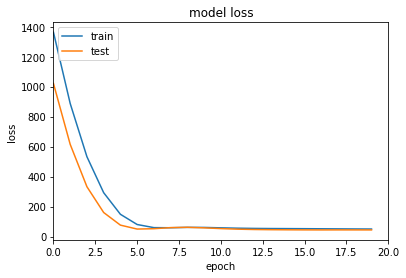

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 49.4381 - root_mean_squared_error: 6.3197 - val_loss: 43.7946 - val_root_mean_squared_error: 5.8581
Epoch 22/40
6/6 [==============================] - 0s 15ms/step - loss: 49.0786 - root_mean_squared_error: 6.2942 - val_loss: 43.1229 - val_root_mean_squared_error: 5.8038
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 48.6693 - root_mean_squared_error: 6.2646 - val_loss: 43.0718 - val_root_mean_squared_error: 5.8026
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 48.3426 - root_mean_squared_error: 6.2414 - val_loss: 42.5499 - val_root_mean_squared_error: 5.7607
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 47.9048 - root_mean_squared_error: 6.2092 - val_loss: 42.4178 - val_root_mean_squared_error: 5.7524
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 47.6290 - root_mean_squared_error: 6.1900 - val_loss: 42.5735 - val_root

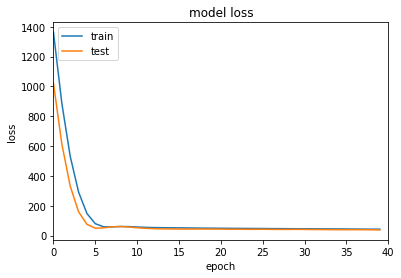

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 42.7584 - root_mean_squared_error: 5.8292 - val_loss: 38.7049 - val_root_mean_squared_error: 5.4724
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 42.4692 - root_mean_squared_error: 5.8073 - val_loss: 39.4506 - val_root_mean_squared_error: 5.5432
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 42.3676 - root_mean_squared_error: 5.8015 - val_loss: 39.4455 - val_root_mean_squared_error: 5.5458
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 42.0153 - root_mean_squared_error: 5.7740 - val_loss: 38.8162 - val_root_mean_squared_error: 5.4918
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 41.7848 - root_mean_squared_error: 5.7569 - val_loss: 38.0510 - val_root_mean_squared_error: 5.4248
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 41.5780 - root_mean_squared_error: 5.7418 - val_loss: 38.1116 - val_ro

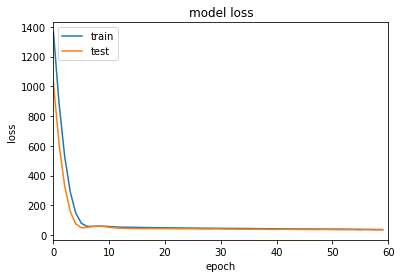

Epoch 1/20
6/6 [==============================] - 1s 129ms/step - loss: 4339.9922 - root_mean_squared_error: 65.8097 - val_loss: 3711.8098 - val_root_mean_squared_error: 60.8503
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 3274.1809 - root_mean_squared_error: 57.1415 - val_loss: 2732.9661 - val_root_mean_squared_error: 52.1915
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 2400.6172 - root_mean_squared_error: 48.9042 - val_loss: 1949.6626 - val_root_mean_squared_error: 44.0532
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 1716.8138 - root_mean_squared_error: 41.3262 - val_loss: 1352.6893 - val_root_mean_squared_error: 36.6572
Epoch 5/20
6/6 [==============================] - 0s 13ms/step - loss: 1193.6958 - root_mean_squared_error: 34.4205 - val_loss: 912.6165 - val_root_mean_squared_error: 30.0618
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 816.0746 - root_mean_squared_error: 28.4110 

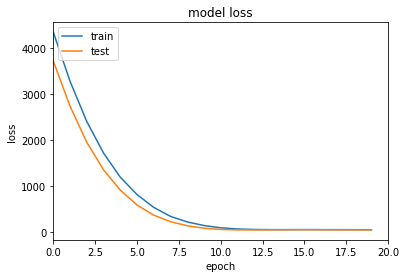

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 52.7837 - root_mean_squared_error: 6.6638 - val_loss: 48.5631 - val_root_mean_squared_error: 6.3408
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 52.5182 - root_mean_squared_error: 6.6464 - val_loss: 48.0250 - val_root_mean_squared_error: 6.3009
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 52.2674 - root_mean_squared_error: 6.6299 - val_loss: 47.7574 - val_root_mean_squared_error: 6.2822
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 52.0234 - root_mean_squared_error: 6.6140 - val_loss: 47.6312 - val_root_mean_squared_error: 6.2747
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 51.9354 - root_mean_squared_error: 6.6098 - val_loss: 47.8235 - val_root_mean_squared_error: 6.2926
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 51.6472 - root_mean_squared_error: 6.5904 - val_loss: 47.1598 - val_r

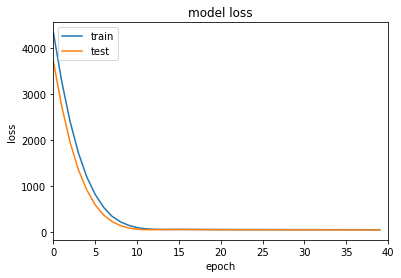

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 47.7768 - root_mean_squared_error: 6.3273 - val_loss: 44.0866 - val_root_mean_squared_error: 6.0301
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 47.5846 - root_mean_squared_error: 6.3144 - val_loss: 43.4611 - val_root_mean_squared_error: 5.9806
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 47.3385 - root_mean_squared_error: 6.2973 - val_loss: 43.6525 - val_root_mean_squared_error: 5.9990
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 47.0375 - root_mean_squared_error: 6.2758 - val_loss: 43.3010 - val_root_mean_squared_error: 5.9722
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 46.8594 - root_mean_squared_error: 6.2640 - val_loss: 43.3441 - val_root_mean_squared_error: 5.9783
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 46.5875 - root_mean_squared_error: 6.2446 - val_loss: 42.8448 - val_r

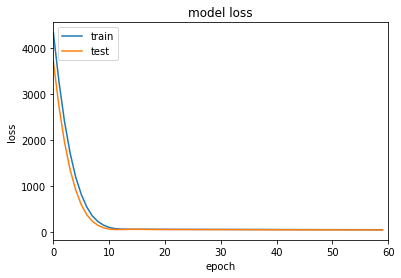

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 891.7784 - root_mean_squared_error: 29.7108 - val_loss: 623.9222 - val_root_mean_squared_error: 24.7972
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 515.2229 - root_mean_squared_error: 22.4993 - val_loss: 327.8746 - val_root_mean_squared_error: 17.8575
Epoch 3/20
6/6 [==============================] - 0s 14ms/step - loss: 279.1567 - root_mean_squared_error: 16.4374 - val_loss: 155.3951 - val_root_mean_squared_error: 12.1016
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 144.4750 - root_mean_squared_error: 11.6424 - val_loss: 83.0178 - val_root_mean_squared_error: 8.6087
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 93.6984 - root_mean_squared_error: 9.2090 - val_loss: 69.9938 - val_root_mean_squared_error: 7.8182
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 81.7441 - root_mean_squared_error: 8.5375 - val_loss: 77.824

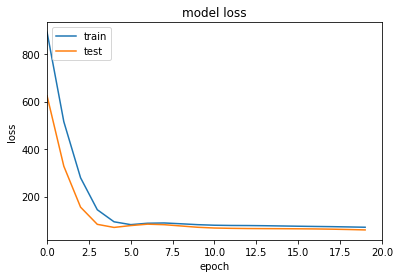

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 70.4041 - root_mean_squared_error: 7.8808 - val_loss: 58.0081 - val_root_mean_squared_error: 7.0521
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 69.1315 - root_mean_squared_error: 7.8019 - val_loss: 57.9624 - val_root_mean_squared_error: 7.0514
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 68.0171 - root_mean_squared_error: 7.7325 - val_loss: 57.7912 - val_root_mean_squared_error: 7.0418
Epoch 24/40
6/6 [==============================] - 0s 14ms/step - loss: 67.1217 - root_mean_squared_error: 7.6766 - val_loss: 57.1846 - val_root_mean_squared_error: 7.0011
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 66.3800 - root_mean_squared_error: 7.6305 - val_loss: 57.2257 - val_root_mean_squared_error: 7.0065
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 65.4518 - root_mean_squared_error: 7.5717 - val_loss: 56.2771 - val_ro

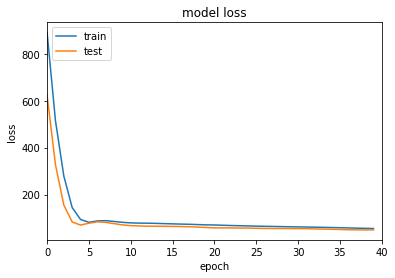

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 54.7874 - root_mean_squared_error: 6.8683 - val_loss: 48.6364 - val_root_mean_squared_error: 6.4065
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 54.1484 - root_mean_squared_error: 6.8240 - val_loss: 47.2311 - val_root_mean_squared_error: 6.2984
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 53.7191 - root_mean_squared_error: 6.7949 - val_loss: 47.1665 - val_root_mean_squared_error: 6.2959
Epoch 44/60
6/6 [==============================] - 0s 13ms/step - loss: 53.2983 - root_mean_squared_error: 6.7663 - val_loss: 47.8309 - val_root_mean_squared_error: 6.3510
Epoch 45/60
6/6 [==============================] - 0s 12ms/step - loss: 52.7779 - root_mean_squared_error: 6.7301 - val_loss: 46.8497 - val_root_mean_squared_error: 6.2758
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 52.2654 - root_mean_squared_error: 6.6943 - val_loss: 47.2646 - val_

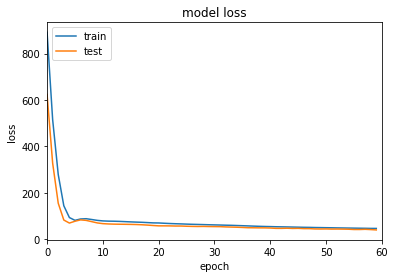

Epoch 1/20
6/6 [==============================] - 1s 52ms/step - loss: 277.6714 - root_mean_squared_error: 16.3909 - val_loss: 104.2960 - val_root_mean_squared_error: 9.7627
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 91.4143 - root_mean_squared_error: 9.0797 - val_loss: 46.7062 - val_root_mean_squared_error: 6.1445
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 55.3334 - root_mean_squared_error: 6.8114 - val_loss: 78.3477 - val_root_mean_squared_error: 8.3325
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 71.0063 - root_mean_squared_error: 7.8806 - val_loss: 83.0129 - val_root_mean_squared_error: 8.6100
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 64.8888 - root_mean_squared_error: 7.4847 - val_loss: 60.1216 - val_root_mean_squared_error: 7.1607
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 53.3124 - root_mean_squared_error: 6.6693 - val_loss: 46.6647 - val_root

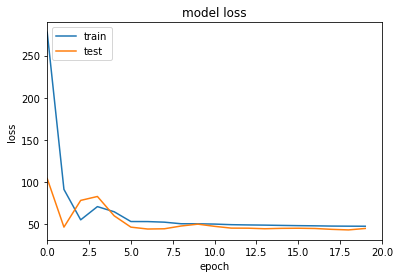

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 47.2166 - root_mean_squared_error: 6.2364 - val_loss: 43.5275 - val_root_mean_squared_error: 5.9349
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 46.8631 - root_mean_squared_error: 6.2106 - val_loss: 43.5403 - val_root_mean_squared_error: 5.9388
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 46.4745 - root_mean_squared_error: 6.1819 - val_loss: 43.2656 - val_root_mean_squared_error: 5.9184
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 46.4569 - root_mean_squared_error: 6.1831 - val_loss: 41.9870 - val_root_mean_squared_error: 5.8121
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 45.9666 - root_mean_squared_error: 6.1460 - val_loss: 42.6473 - val_root_mean_squared_error: 5.8714
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 45.7783 - root_mean_squared_error: 6.1333 - val_loss: 43.4597 - val_r

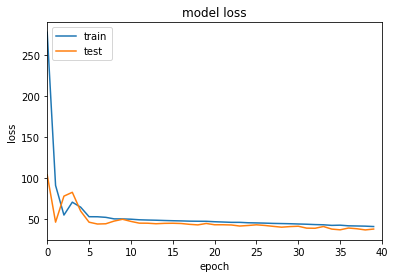

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 41.1903 - root_mean_squared_error: 5.7877 - val_loss: 38.6720 - val_root_mean_squared_error: 5.5675
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 40.9274 - root_mean_squared_error: 5.7675 - val_loss: 36.9733 - val_root_mean_squared_error: 5.4156
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 40.6710 - root_mean_squared_error: 5.7479 - val_loss: 36.7019 - val_root_mean_squared_error: 5.3933
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 40.7001 - root_mean_squared_error: 5.7530 - val_loss: 38.3667 - val_root_mean_squared_error: 5.5481
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 40.3585 - root_mean_squared_error: 5.7258 - val_loss: 36.1856 - val_root_mean_squared_error: 5.3507
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 39.9546 - root_mean_squared_error: 5.6931 - val_loss: 36.8398 - val_

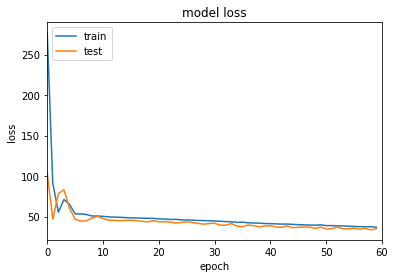

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 896.4988 - root_mean_squared_error: 29.9080 - val_loss: 794.1237 - val_root_mean_squared_error: 28.1447
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 557.1777 - root_mean_squared_error: 23.5623 - val_loss: 482.3635 - val_root_mean_squared_error: 21.9174
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 323.4898 - root_mean_squared_error: 17.9305 - val_loss: 268.4802 - val_root_mean_squared_error: 16.3248
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 174.8995 - root_mean_squared_error: 13.1500 - val_loss: 139.1533 - val_root_mean_squared_error: 11.7125
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 89.4475 - root_mean_squared_error: 9.3532 - val_loss: 72.7132 - val_root_mean_squared_error: 8.4115
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 53.8637 - root_mean_squared_error: 7.2047 - val_loss: 44.5658

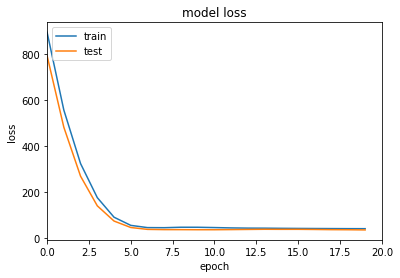

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 39.0473 - root_mean_squared_error: 6.1022 - val_loss: 34.0781 - val_root_mean_squared_error: 5.6809
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 38.8523 - root_mean_squared_error: 6.0869 - val_loss: 34.0311 - val_root_mean_squared_error: 5.6776
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 38.7091 - root_mean_squared_error: 6.0759 - val_loss: 33.6588 - val_root_mean_squared_error: 5.6455
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 38.3672 - root_mean_squared_error: 6.0484 - val_loss: 33.8277 - val_root_mean_squared_error: 5.6612
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 38.2756 - root_mean_squared_error: 6.0416 - val_loss: 33.3340 - val_root_mean_squared_error: 5.6182
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 38.1985 - root_mean_squared_error: 6.0359 - val_loss: 33.9000 - val_roo

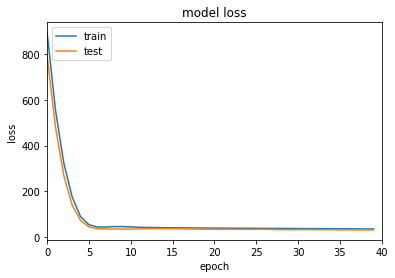

Epoch 41/60
6/6 [==============================] - 0s 23ms/step - loss: 35.1905 - root_mean_squared_error: 5.7920 - val_loss: 30.7382 - val_root_mean_squared_error: 5.3944
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 35.1214 - root_mean_squared_error: 5.7867 - val_loss: 31.3183 - val_root_mean_squared_error: 5.4486
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 34.8231 - root_mean_squared_error: 5.7615 - val_loss: 30.7200 - val_root_mean_squared_error: 5.3941
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 34.5875 - root_mean_squared_error: 5.7417 - val_loss: 30.0381 - val_root_mean_squared_error: 5.3313
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 34.4546 - root_mean_squared_error: 5.7308 - val_loss: 29.8146 - val_root_mean_squared_error: 5.3110
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 34.2887 - root_mean_squared_error: 5.7169 - val_loss: 30.6037 - val_roo

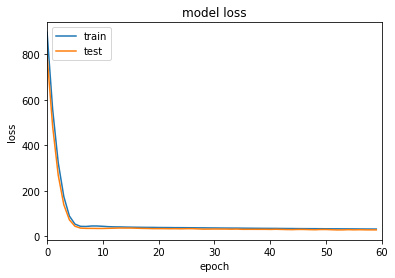

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 84.9126 - root_mean_squared_error: 9.1592 - val_loss: 43.0684 - val_root_mean_squared_error: 6.4845
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 51.8071 - root_mean_squared_error: 7.1266 - val_loss: 58.4149 - val_root_mean_squared_error: 7.5762
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 56.0129 - root_mean_squared_error: 7.4161 - val_loss: 50.1109 - val_root_mean_squared_error: 7.0071
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 49.2182 - root_mean_squared_error: 6.9432 - val_loss: 41.5293 - val_root_mean_squared_error: 6.3657
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 48.4635 - root_mean_squared_error: 6.8890 - val_loss: 39.8179 - val_root_mean_squared_error: 6.2302
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 48.6174 - root_mean_squared_error: 6.9004 - val_loss: 40.2559 - val_root_mean

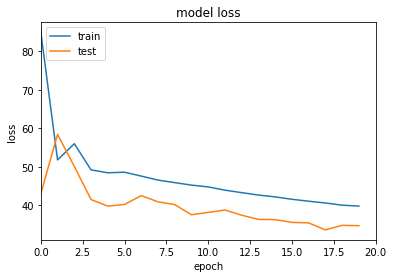

Epoch 21/40
6/6 [==============================] - 0s 20ms/step - loss: 39.4410 - root_mean_squared_error: 6.2047 - val_loss: 33.6667 - val_root_mean_squared_error: 5.7207
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 39.4273 - root_mean_squared_error: 6.2039 - val_loss: 34.3568 - val_root_mean_squared_error: 5.7810
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 38.7264 - root_mean_squared_error: 6.1474 - val_loss: 31.6615 - val_root_mean_squared_error: 5.5433
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 38.6256 - root_mean_squared_error: 6.1395 - val_loss: 32.6347 - val_root_mean_squared_error: 5.6307
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 38.1912 - root_mean_squared_error: 6.1044 - val_loss: 33.0328 - val_root_mean_squared_error: 5.6663
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 37.9134 - root_mean_squared_error: 6.0819 - val_loss: 32.6143 - val_roo

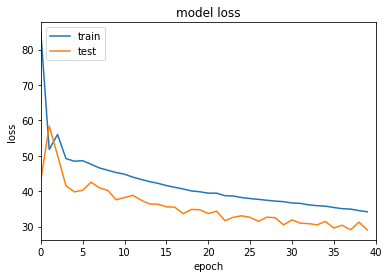

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 34.0222 - root_mean_squared_error: 5.7577 - val_loss: 28.2998 - val_root_mean_squared_error: 5.2374
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 33.7308 - root_mean_squared_error: 5.7326 - val_loss: 29.2930 - val_root_mean_squared_error: 5.3317
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 33.4396 - root_mean_squared_error: 5.7074 - val_loss: 29.9407 - val_root_mean_squared_error: 5.3924
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 33.3914 - root_mean_squared_error: 5.7035 - val_loss: 29.0747 - val_root_mean_squared_error: 5.3118
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 33.0750 - root_mean_squared_error: 5.6760 - val_loss: 29.4971 - val_root_mean_squared_error: 5.3517
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 32.7305 - root_mean_squared_error: 5.6458 - val_loss: 27.7253 - val_r

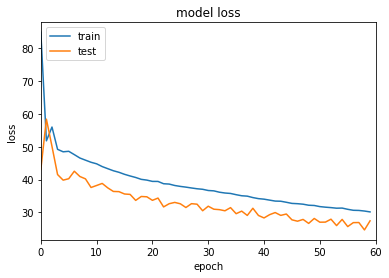

Epoch 1/20
6/6 [==============================] - 1s 44ms/step - loss: 163.1632 - root_mean_squared_error: 12.7374 - val_loss: 98.4529 - val_root_mean_squared_error: 9.8759
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 89.4583 - root_mean_squared_error: 9.4096 - val_loss: 71.7559 - val_root_mean_squared_error: 8.4167
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 83.9540 - root_mean_squared_error: 9.1127 - val_loss: 72.6685 - val_root_mean_squared_error: 8.4710
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 81.3452 - root_mean_squared_error: 8.9686 - val_loss: 65.1987 - val_root_mean_squared_error: 8.0182
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 72.2150 - root_mean_squared_error: 8.4445 - val_loss: 60.1315 - val_root_mean_squared_error: 7.6960
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 67.0360 - root_mean_squared_error: 8.1323 - val_loss: 59.4363 - val_root_mean

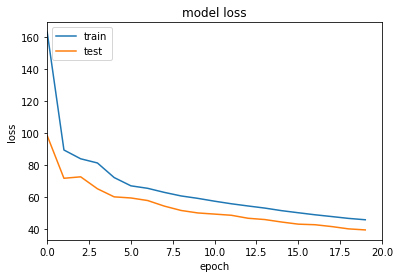

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 44.8155 - root_mean_squared_error: 6.6308 - val_loss: 39.1273 - val_root_mean_squared_error: 6.1873
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 44.0694 - root_mean_squared_error: 6.5746 - val_loss: 38.6047 - val_root_mean_squared_error: 6.1452
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 43.6103 - root_mean_squared_error: 6.5399 - val_loss: 37.2078 - val_root_mean_squared_error: 6.0307
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 42.7744 - root_mean_squared_error: 6.4759 - val_loss: 37.3402 - val_root_mean_squared_error: 6.0420
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 42.9749 - root_mean_squared_error: 6.4916 - val_loss: 39.5992 - val_root_mean_squared_error: 6.2264
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 42.0362 - root_mean_squared_error: 6.4192 - val_loss: 35.8062 - val_r

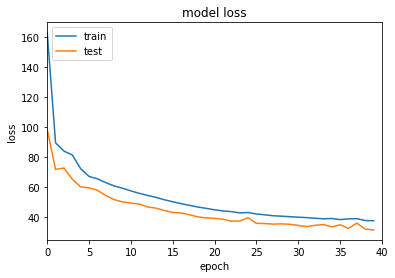

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 37.1468 - root_mean_squared_error: 6.0305 - val_loss: 32.9763 - val_root_mean_squared_error: 5.6744
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 37.3187 - root_mean_squared_error: 6.0450 - val_loss: 34.0046 - val_root_mean_squared_error: 5.7646
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 37.6994 - root_mean_squared_error: 6.0767 - val_loss: 30.6055 - val_root_mean_squared_error: 5.4621
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 36.4854 - root_mean_squared_error: 5.9763 - val_loss: 32.5138 - val_root_mean_squared_error: 5.6344
Epoch 45/60
6/6 [==============================] - 0s 16ms/step - loss: 36.3623 - root_mean_squared_error: 5.9662 - val_loss: 33.2197 - val_root_mean_squared_error: 5.6969
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 36.1478 - root_mean_squared_error: 5.9485 - val_loss: 31.5211 - val_ro

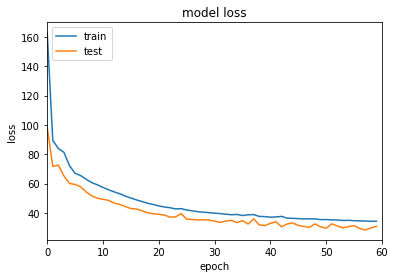

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 63.0777 - root_mean_squared_error: 7.8838 - val_loss: 49.1979 - val_root_mean_squared_error: 6.9481
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 63.2383 - root_mean_squared_error: 7.8942 - val_loss: 48.3881 - val_root_mean_squared_error: 6.8898
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 57.4021 - root_mean_squared_error: 7.5157 - val_loss: 51.5837 - val_root_mean_squared_error: 7.1182
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 55.7249 - root_mean_squared_error: 7.4035 - val_loss: 45.8656 - val_root_mean_squared_error: 6.7048
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 53.9151 - root_mean_squared_error: 7.2804 - val_loss: 44.1638 - val_root_mean_squared_error: 6.5769
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 52.1748 - root_mean_squared_error: 7.1601 - val_loss: 44.0433 - val_root_me

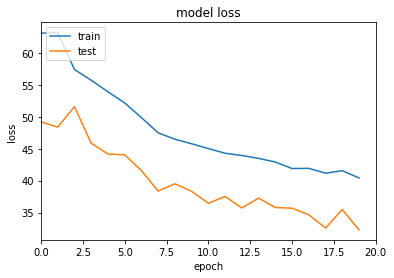

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 39.7945 - root_mean_squared_error: 6.2398 - val_loss: 33.5356 - val_root_mean_squared_error: 5.7164
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 39.5637 - root_mean_squared_error: 6.2215 - val_loss: 32.9775 - val_root_mean_squared_error: 5.6677
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 38.6563 - root_mean_squared_error: 6.1484 - val_loss: 30.7367 - val_root_mean_squared_error: 5.4667
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 38.5904 - root_mean_squared_error: 6.1433 - val_loss: 31.8155 - val_root_mean_squared_error: 5.5648
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 37.6453 - root_mean_squared_error: 6.0661 - val_loss: 32.8456 - val_root_mean_squared_error: 5.6568
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 37.4712 - root_mean_squared_error: 6.0520 - val_loss: 30.6495 - val_root

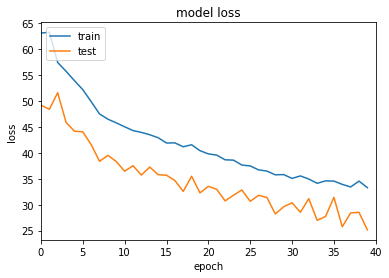

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 33.3801 - root_mean_squared_error: 5.7078 - val_loss: 29.3074 - val_root_mean_squared_error: 5.3393
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 32.1127 - root_mean_squared_error: 5.5959 - val_loss: 25.6594 - val_root_mean_squared_error: 4.9863
Epoch 43/60
6/6 [==============================] - 0s 12ms/step - loss: 32.7929 - root_mean_squared_error: 5.6566 - val_loss: 25.6923 - val_root_mean_squared_error: 4.9898
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 31.7569 - root_mean_squared_error: 5.5646 - val_loss: 30.1672 - val_root_mean_squared_error: 5.4200
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 31.7312 - root_mean_squared_error: 5.5625 - val_loss: 24.8813 - val_root_mean_squared_error: 4.9085
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 31.4982 - root_mean_squared_error: 5.5418 - val_loss: 25.1097 - val_r

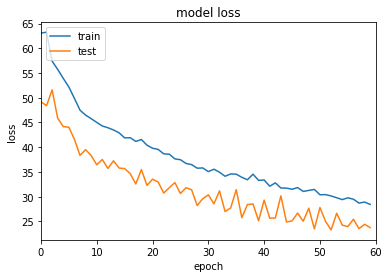

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 136.1530 - root_mean_squared_error: 11.6170 - val_loss: 58.2859 - val_root_mean_squared_error: 7.5560
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 67.4327 - root_mean_squared_error: 8.1389 - val_loss: 79.9990 - val_root_mean_squared_error: 8.8776
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 79.0204 - root_mean_squared_error: 8.8225 - val_loss: 76.6684 - val_root_mean_squared_error: 8.6884
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 68.9927 - root_mean_squared_error: 8.2350 - val_loss: 53.9351 - val_root_mean_squared_error: 7.2637
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 61.2368 - root_mean_squared_error: 7.7502 - val_loss: 51.3419 - val_root_mean_squared_error: 7.0835
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 61.7321 - root_mean_squared_error: 7.7826 - val_loss: 49.9181 - val_root_

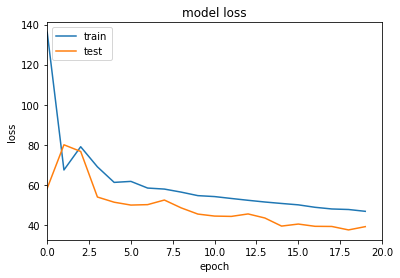

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 46.5456 - root_mean_squared_error: 6.7433 - val_loss: 38.0709 - val_root_mean_squared_error: 6.0828
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 45.8886 - root_mean_squared_error: 6.6948 - val_loss: 35.3102 - val_root_mean_squared_error: 5.8520
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 45.4115 - root_mean_squared_error: 6.6595 - val_loss: 36.7279 - val_root_mean_squared_error: 5.9723
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 45.0231 - root_mean_squared_error: 6.6307 - val_loss: 37.1717 - val_root_mean_squared_error: 6.0098
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 44.4231 - root_mean_squared_error: 6.5857 - val_loss: 35.4703 - val_root_mean_squared_error: 5.8670
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 44.1301 - root_mean_squared_error: 6.5638 - val_loss: 34.5767 - val_r

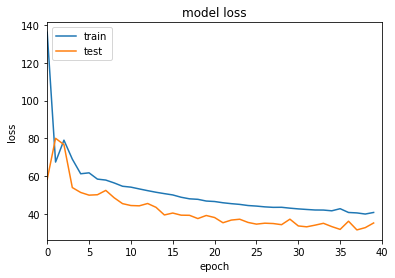

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 39.7604 - root_mean_squared_error: 6.2280 - val_loss: 30.1122 - val_root_mean_squared_error: 5.3983
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 40.1194 - root_mean_squared_error: 6.2571 - val_loss: 33.7003 - val_root_mean_squared_error: 5.7214
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 39.1153 - root_mean_squared_error: 6.1767 - val_loss: 31.0483 - val_root_mean_squared_error: 5.4852
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 39.3841 - root_mean_squared_error: 6.1988 - val_loss: 31.1673 - val_root_mean_squared_error: 5.4964
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 38.6077 - root_mean_squared_error: 6.1362 - val_loss: 34.0590 - val_root_mean_squared_error: 5.7538
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 39.2702 - root_mean_squared_error: 6.1903 - val_loss: 30.7136 - val_r

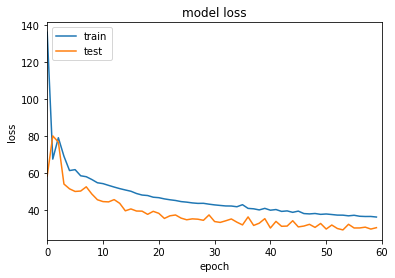

Epoch 1/20
6/6 [==============================] - 1s 58ms/step - loss: 1248.2916 - root_mean_squared_error: 35.3283 - val_loss: 880.3874 - val_root_mean_squared_error: 29.6680
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 770.6388 - root_mean_squared_error: 27.7568 - val_loss: 498.6792 - val_root_mean_squared_error: 22.3267
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 433.0175 - root_mean_squared_error: 20.8043 - val_loss: 249.6317 - val_root_mean_squared_error: 15.7935
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 221.0264 - root_mean_squared_error: 14.8603 - val_loss: 112.1387 - val_root_mean_squared_error: 10.5803
Epoch 5/20
6/6 [==============================] - 0s 14ms/step - loss: 107.2838 - root_mean_squared_error: 10.3483 - val_loss: 56.5258 - val_root_mean_squared_error: 7.5053
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 65.2391 - root_mean_squared_error: 8.0650 - val_loss: 4

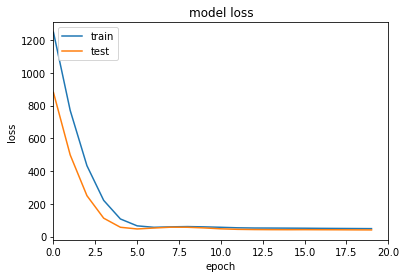

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 47.8416 - root_mean_squared_error: 6.9036 - val_loss: 40.4332 - val_root_mean_squared_error: 6.3444
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 47.2712 - root_mean_squared_error: 6.8622 - val_loss: 39.9717 - val_root_mean_squared_error: 6.3080
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 46.8769 - root_mean_squared_error: 6.8335 - val_loss: 39.7325 - val_root_mean_squared_error: 6.2891
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 46.4171 - root_mean_squared_error: 6.7998 - val_loss: 39.3138 - val_root_mean_squared_error: 6.2558
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 46.0632 - root_mean_squared_error: 6.7738 - val_loss: 39.0683 - val_root_mean_squared_error: 6.2362
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 45.7668 - root_mean_squared_error: 6.7519 - val_loss: 38.8402 - val_r

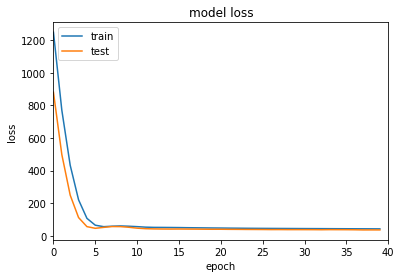

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 42.7441 - root_mean_squared_error: 6.5251 - val_loss: 36.9950 - val_root_mean_squared_error: 6.0687
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 42.4638 - root_mean_squared_error: 6.5037 - val_loss: 36.6399 - val_root_mean_squared_error: 6.0394
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 42.3281 - root_mean_squared_error: 6.4933 - val_loss: 36.0488 - val_root_mean_squared_error: 5.9903
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 42.1876 - root_mean_squared_error: 6.4825 - val_loss: 35.5097 - val_root_mean_squared_error: 5.9452
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 41.7291 - root_mean_squared_error: 6.4471 - val_loss: 36.2079 - val_root_mean_squared_error: 6.0037
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 41.5309 - root_mean_squared_error: 6.4318 - val_loss: 35.0610 - val_

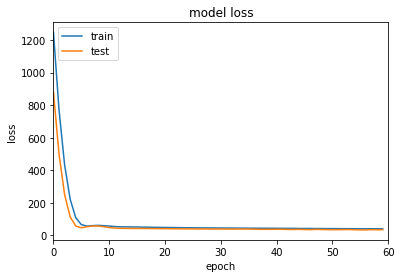

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 3026.4517 - root_mean_squared_error: 55.0123 - val_loss: 2629.8545 - val_root_mean_squared_error: 51.2811
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 2283.2368 - root_mean_squared_error: 47.7822 - val_loss: 1928.9136 - val_root_mean_squared_error: 43.9182
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 1661.4456 - root_mean_squared_error: 40.7596 - val_loss: 1356.4980 - val_root_mean_squared_error: 36.8293
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 1153.9657 - root_mean_squared_error: 33.9686 - val_loss: 912.7973 - val_root_mean_squared_error: 30.2109
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 777.7623 - root_mean_squared_error: 27.8866 - val_loss: 581.7041 - val_root_mean_squared_error: 24.1165
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 495.1141 - root_mean_squared_error: 22.2489 - val_

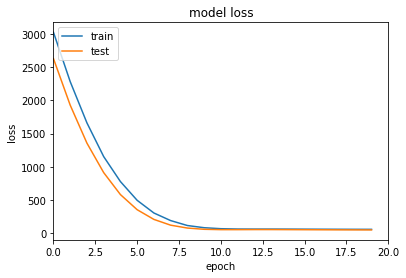

Epoch 21/40
6/6 [==============================] - 0s 24ms/step - loss: 57.2491 - root_mean_squared_error: 7.5602 - val_loss: 48.8925 - val_root_mean_squared_error: 6.9857
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 56.7544 - root_mean_squared_error: 7.5274 - val_loss: 48.5569 - val_root_mean_squared_error: 6.9617
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 56.2375 - root_mean_squared_error: 7.4930 - val_loss: 48.1215 - val_root_mean_squared_error: 6.9304
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 55.7090 - root_mean_squared_error: 7.4577 - val_loss: 47.7590 - val_root_mean_squared_error: 6.9042
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 55.2208 - root_mean_squared_error: 7.4249 - val_loss: 47.3200 - val_root_mean_squared_error: 6.8723
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 54.7154 - root_mean_squared_error: 7.3909 - val_loss: 46.8827 - val_

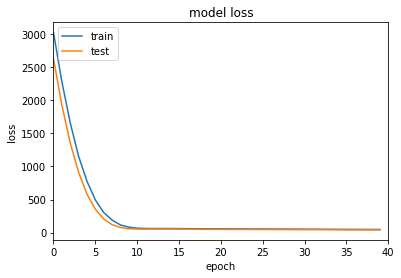

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 46.9349 - root_mean_squared_error: 6.8447 - val_loss: 40.6211 - val_root_mean_squared_error: 6.3668
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 46.6312 - root_mean_squared_error: 6.8225 - val_loss: 40.5587 - val_root_mean_squared_error: 6.3620
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 46.2073 - root_mean_squared_error: 6.7914 - val_loss: 39.7529 - val_root_mean_squared_error: 6.2984
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 45.6916 - root_mean_squared_error: 6.7534 - val_loss: 39.6286 - val_root_mean_squared_error: 6.2885
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 45.3355 - root_mean_squared_error: 6.7270 - val_loss: 39.6460 - val_root_mean_squared_error: 6.2899
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 44.6126 - root_mean_squared_error: 6.6731 - val_loss: 39.1039 - val_

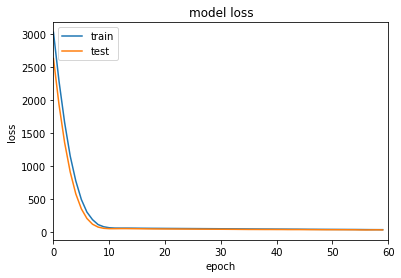

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 1068.2292 - root_mean_squared_error: 32.6824 - val_loss: 739.2897 - val_root_mean_squared_error: 27.1882
Epoch 2/20
6/6 [==============================] - 0s 14ms/step - loss: 616.5022 - root_mean_squared_error: 24.8276 - val_loss: 377.6515 - val_root_mean_squared_error: 19.4309
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 312.5712 - root_mean_squared_error: 17.6771 - val_loss: 162.6678 - val_root_mean_squared_error: 12.7506
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 140.6280 - root_mean_squared_error: 11.8549 - val_loss: 64.4659 - val_root_mean_squared_error: 8.0235
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 68.2699 - root_mean_squared_error: 8.2571 - val_loss: 40.6359 - val_root_mean_squared_error: 6.3676
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 49.2285 - root_mean_squared_error: 7.0099 - val_loss: 47.0563

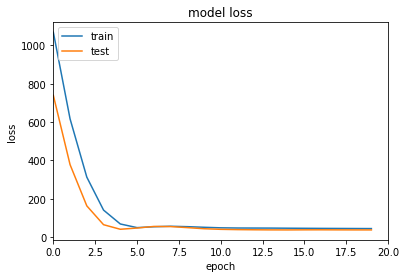

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 43.9018 - root_mean_squared_error: 6.6195 - val_loss: 36.9818 - val_root_mean_squared_error: 6.0743
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 43.5832 - root_mean_squared_error: 6.5954 - val_loss: 36.4206 - val_root_mean_squared_error: 6.0280
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 43.3862 - root_mean_squared_error: 6.5805 - val_loss: 36.2600 - val_root_mean_squared_error: 6.0147
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 43.0819 - root_mean_squared_error: 6.5573 - val_loss: 35.4137 - val_root_mean_squared_error: 5.9439
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 42.7290 - root_mean_squared_error: 6.5304 - val_loss: 35.5412 - val_root_mean_squared_error: 5.9547
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 42.3039 - root_mean_squared_error: 6.4978 - val_loss: 34.9892 - val_r

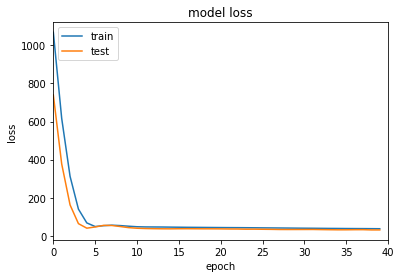

Epoch 41/60
6/6 [==============================] - 0s 22ms/step - loss: 37.5250 - root_mean_squared_error: 6.1194 - val_loss: 31.0419 - val_root_mean_squared_error: 5.5645
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 37.1966 - root_mean_squared_error: 6.0925 - val_loss: 31.2825 - val_root_mean_squared_error: 5.5861
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 36.9007 - root_mean_squared_error: 6.0682 - val_loss: 31.7504 - val_root_mean_squared_error: 5.6279
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 36.7107 - root_mean_squared_error: 6.0526 - val_loss: 31.8866 - val_root_mean_squared_error: 5.6400
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 36.6134 - root_mean_squared_error: 6.0445 - val_loss: 31.9880 - val_root_mean_squared_error: 5.6490
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 36.2507 - root_mean_squared_error: 6.0145 - val_loss: 30.4016 - val_root

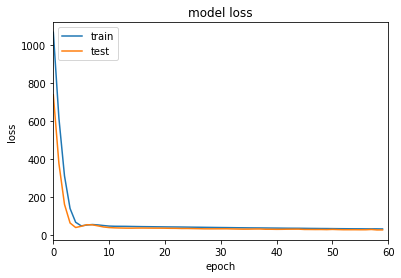

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 798.6952 - root_mean_squared_error: 28.2413 - val_loss: 508.7160 - val_root_mean_squared_error: 22.5298
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 429.5895 - root_mean_squared_error: 20.6995 - val_loss: 242.2427 - val_root_mean_squared_error: 15.5283
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 212.5901 - root_mean_squared_error: 14.5423 - val_loss: 100.1691 - val_root_mean_squared_error: 9.9529
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 95.0701 - root_mean_squared_error: 9.6935 - val_loss: 48.2489 - val_root_mean_squared_error: 6.8664
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 57.0601 - root_mean_squared_error: 7.4807 - val_loss: 43.9126 - val_root_mean_squared_error: 6.5435
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 54.5091 - root_mean_squared_error: 7.3087 - val_loss: 53.8370 - v

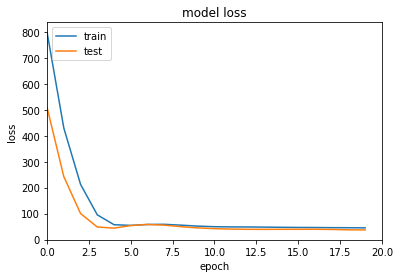

Epoch 21/40
6/6 [==============================] - 0s 23ms/step - loss: 44.6169 - root_mean_squared_error: 6.6043 - val_loss: 37.4075 - val_root_mean_squared_error: 6.0341
Epoch 22/40
6/6 [==============================] - 0s 16ms/step - loss: 44.1799 - root_mean_squared_error: 6.5716 - val_loss: 37.2278 - val_root_mean_squared_error: 6.0197
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 43.8337 - root_mean_squared_error: 6.5456 - val_loss: 36.5158 - val_root_mean_squared_error: 5.9607
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 43.5598 - root_mean_squared_error: 6.5251 - val_loss: 36.8352 - val_root_mean_squared_error: 5.9879
Epoch 25/40
6/6 [==============================] - 0s 18ms/step - loss: 43.0194 - root_mean_squared_error: 6.4839 - val_loss: 35.8999 - val_root_mean_squared_error: 5.9098
Epoch 26/40
6/6 [==============================] - 0s 16ms/step - loss: 42.8980 - root_mean_squared_error: 6.4750 - val_loss: 34.9292 - val_

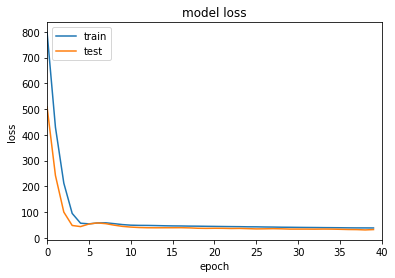

Epoch 41/60
6/6 [==============================] - 0s 33ms/step - loss: 37.9378 - root_mean_squared_error: 6.0862 - val_loss: 31.9960 - val_root_mean_squared_error: 5.5770
Epoch 42/60
6/6 [==============================] - 0s 14ms/step - loss: 37.5895 - root_mean_squared_error: 6.0579 - val_loss: 31.4959 - val_root_mean_squared_error: 5.5324
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 37.3190 - root_mean_squared_error: 6.0359 - val_loss: 30.3059 - val_root_mean_squared_error: 5.4242
Epoch 44/60
6/6 [==============================] - 0s 14ms/step - loss: 36.9343 - root_mean_squared_error: 6.0043 - val_loss: 30.4915 - val_root_mean_squared_error: 5.4417
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 36.7958 - root_mean_squared_error: 5.9932 - val_loss: 31.5739 - val_root_mean_squared_error: 5.5406
Epoch 46/60
6/6 [==============================] - 0s 13ms/step - loss: 36.4940 - root_mean_squared_error: 5.9683 - val_loss: 30.2428 - val_

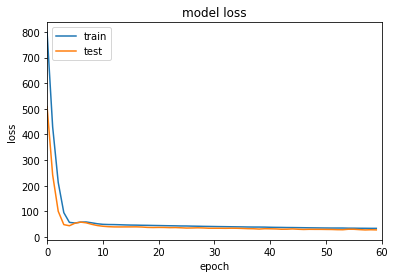

Epoch 1/20
6/6 [==============================] - 1s 129ms/step - loss: 552.1293 - root_mean_squared_error: 23.4949 - val_loss: 359.9485 - val_root_mean_squared_error: 18.9692
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 314.7292 - root_mean_squared_error: 17.7373 - val_loss: 182.0440 - val_root_mean_squared_error: 13.4880
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 164.0230 - root_mean_squared_error: 12.8025 - val_loss: 86.8666 - val_root_mean_squared_error: 9.3139
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 87.8738 - root_mean_squared_error: 9.3679 - val_loss: 50.3548 - val_root_mean_squared_error: 7.0879
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 58.7732 - root_mean_squared_error: 7.6588 - val_loss: 47.1296 - val_root_mean_squared_error: 6.8567
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 54.8384 - root_mean_squared_error: 7.3975 - val_loss: 53.9786 - v

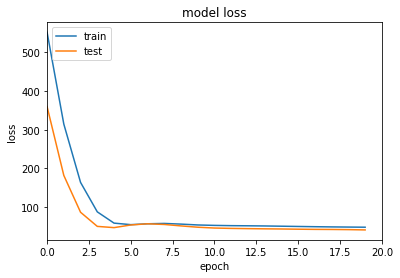

Epoch 21/40
6/6 [==============================] - 0s 21ms/step - loss: 47.7965 - root_mean_squared_error: 6.9058 - val_loss: 40.9646 - val_root_mean_squared_error: 6.3921
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 47.5084 - root_mean_squared_error: 6.8850 - val_loss: 40.5234 - val_root_mean_squared_error: 6.3576
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 47.1493 - root_mean_squared_error: 6.8589 - val_loss: 40.8073 - val_root_mean_squared_error: 6.3799
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 46.7796 - root_mean_squared_error: 6.8320 - val_loss: 40.7676 - val_root_mean_squared_error: 6.3768
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 46.4490 - root_mean_squared_error: 6.8078 - val_loss: 40.0221 - val_root_mean_squared_error: 6.3182
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 46.1182 - root_mean_squared_error: 6.7835 - val_loss: 39.5890 - val_r

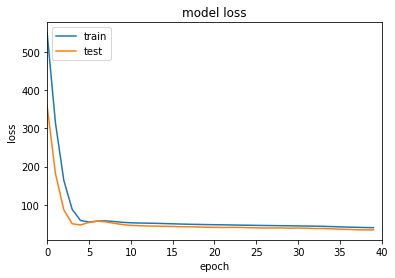

Epoch 41/60
6/6 [==============================] - 0s 23ms/step - loss: 39.7648 - root_mean_squared_error: 6.2984 - val_loss: 34.2714 - val_root_mean_squared_error: 5.8461
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 39.5008 - root_mean_squared_error: 6.2775 - val_loss: 33.8344 - val_root_mean_squared_error: 5.8087
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 39.2897 - root_mean_squared_error: 6.2607 - val_loss: 34.1429 - val_root_mean_squared_error: 5.8352
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 39.0554 - root_mean_squared_error: 6.2420 - val_loss: 33.8129 - val_root_mean_squared_error: 5.8069
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 38.8678 - root_mean_squared_error: 6.2270 - val_loss: 33.0927 - val_root_mean_squared_error: 5.7446
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 38.6735 - root_mean_squared_error: 6.2114 - val_loss: 33.2888 - val_ro

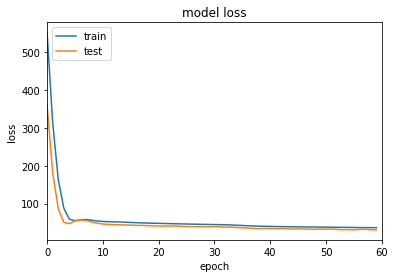

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 836.3633 - root_mean_squared_error: 28.9196 - val_loss: 726.4194 - val_root_mean_squared_error: 26.9518
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 512.1754 - root_mean_squared_error: 22.6309 - val_loss: 423.1625 - val_root_mean_squared_error: 20.5704
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 283.0402 - root_mean_squared_error: 16.8232 - val_loss: 222.4830 - val_root_mean_squared_error: 14.9152
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 142.1186 - root_mean_squared_error: 11.9205 - val_loss: 107.8470 - val_root_mean_squared_error: 10.3840
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 73.6976 - root_mean_squared_error: 8.5836 - val_loss: 56.4221 - val_root_mean_squared_error: 7.5102
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 50.1892 - root_mean_squared_error: 7.0831 - val_loss: 42.77

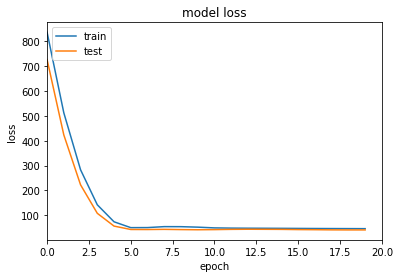

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 45.8646 - root_mean_squared_error: 6.7710 - val_loss: 41.4721 - val_root_mean_squared_error: 6.4385
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 45.6805 - root_mean_squared_error: 6.7574 - val_loss: 41.3928 - val_root_mean_squared_error: 6.4323
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 45.4908 - root_mean_squared_error: 6.7434 - val_loss: 41.1979 - val_root_mean_squared_error: 6.4172
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 45.4107 - root_mean_squared_error: 6.7374 - val_loss: 40.4551 - val_root_mean_squared_error: 6.3590
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 45.2634 - root_mean_squared_error: 6.7265 - val_loss: 40.1180 - val_root_mean_squared_error: 6.3325
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 45.0017 - root_mean_squared_error: 6.7070 - val_loss: 40.6451 - val_roo

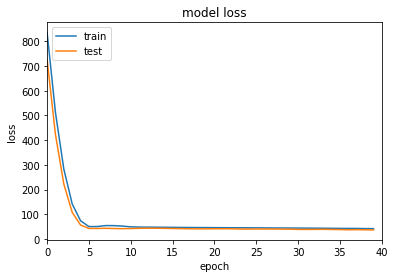

Epoch 41/60
6/6 [==============================] - 0s 21ms/step - loss: 41.5168 - root_mean_squared_error: 6.4421 - val_loss: 36.6448 - val_root_mean_squared_error: 6.0522
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 41.3246 - root_mean_squared_error: 6.4272 - val_loss: 36.8576 - val_root_mean_squared_error: 6.0697
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 40.9996 - root_mean_squared_error: 6.4018 - val_loss: 36.4405 - val_root_mean_squared_error: 6.0353
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 40.7465 - root_mean_squared_error: 6.3821 - val_loss: 36.0883 - val_root_mean_squared_error: 6.0060
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 40.4141 - root_mean_squared_error: 6.3560 - val_loss: 36.1670 - val_root_mean_squared_error: 6.0126
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 40.2722 - root_mean_squared_error: 6.3448 - val_loss: 36.3304 - val_r

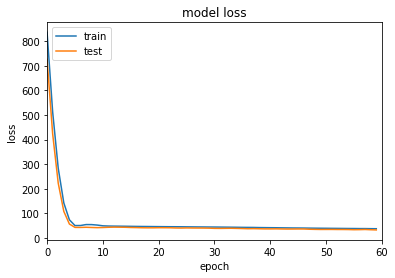

Epoch 1/20
6/6 [==============================] - 1s 46ms/step - loss: 91.3972 - root_mean_squared_error: 9.5597 - val_loss: 47.5139 - val_root_mean_squared_error: 6.8923
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 56.9552 - root_mean_squared_error: 7.5462 - val_loss: 51.3246 - val_root_mean_squared_error: 7.1634
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 55.6493 - root_mean_squared_error: 7.4592 - val_loss: 54.7476 - val_root_mean_squared_error: 7.3985
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 53.3821 - root_mean_squared_error: 7.3056 - val_loss: 46.4627 - val_root_mean_squared_error: 6.8156
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 49.1922 - root_mean_squared_error: 7.0130 - val_loss: 40.8735 - val_root_mean_squared_error: 6.3925
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 47.4263 - root_mean_squared_error: 6.8860 - val_loss: 39.4584 - val_root_m

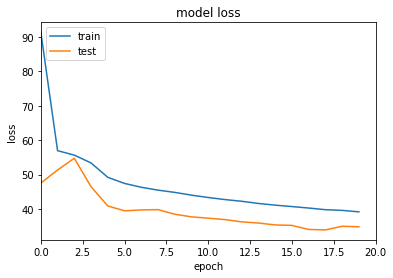

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 38.5150 - root_mean_squared_error: 6.2053 - val_loss: 32.5532 - val_root_mean_squared_error: 5.7047
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 38.5976 - root_mean_squared_error: 6.2120 - val_loss: 31.4127 - val_root_mean_squared_error: 5.6039
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 38.5403 - root_mean_squared_error: 6.2073 - val_loss: 33.7298 - val_root_mean_squared_error: 5.8069
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 37.6276 - root_mean_squared_error: 6.1334 - val_loss: 32.7604 - val_root_mean_squared_error: 5.7229
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 37.4550 - root_mean_squared_error: 6.1193 - val_loss: 31.4610 - val_root_mean_squared_error: 5.6082
Epoch 26/40
6/6 [==============================] - 0s 15ms/step - loss: 37.2773 - root_mean_squared_error: 6.1048 - val_loss: 31.2455 - val_r

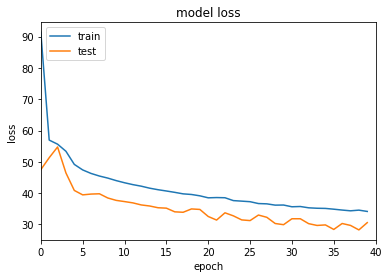

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 34.0398 - root_mean_squared_error: 5.8336 - val_loss: 28.7457 - val_root_mean_squared_error: 5.3607
Epoch 42/60
6/6 [==============================] - 0s 14ms/step - loss: 33.7586 - root_mean_squared_error: 5.8095 - val_loss: 28.3936 - val_root_mean_squared_error: 5.3278
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 34.2126 - root_mean_squared_error: 5.8484 - val_loss: 30.8860 - val_root_mean_squared_error: 5.5567
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 33.5290 - root_mean_squared_error: 5.7897 - val_loss: 27.4248 - val_root_mean_squared_error: 5.2361
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 33.4990 - root_mean_squared_error: 5.7871 - val_loss: 27.3387 - val_root_mean_squared_error: 5.2278
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 33.1519 - root_mean_squared_error: 5.7570 - val_loss: 30.6124 - val_r

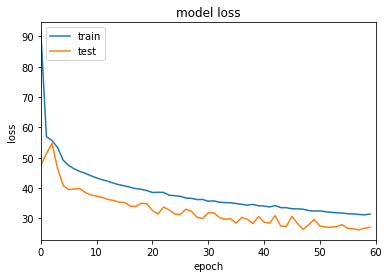

Epoch 1/20
6/6 [==============================] - 1s 47ms/step - loss: 515.6102 - root_mean_squared_error: 22.4829 - val_loss: 491.9332 - val_root_mean_squared_error: 21.9504
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 511.3162 - root_mean_squared_error: 22.3879 - val_loss: 487.7328 - val_root_mean_squared_error: 21.8552
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 506.9985 - root_mean_squared_error: 22.2919 - val_loss: 483.5238 - val_root_mean_squared_error: 21.7594
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 502.7264 - root_mean_squared_error: 22.1965 - val_loss: 479.2575 - val_root_mean_squared_error: 21.6618
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 498.3321 - root_mean_squared_error: 22.0980 - val_loss: 474.9402 - val_root_mean_squared_error: 21.5626
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 493.8415 - root_mean_squared_error: 21.9968 - val_loss: 

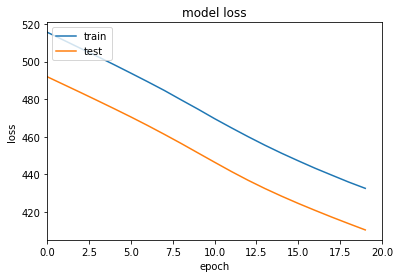

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 429.2554 - root_mean_squared_error: 20.4860 - val_loss: 407.1822 - val_root_mean_squared_error: 19.9404
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 426.0894 - root_mean_squared_error: 20.4092 - val_loss: 404.0681 - val_root_mean_squared_error: 19.8628
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 423.0632 - root_mean_squared_error: 20.3356 - val_loss: 401.1106 - val_root_mean_squared_error: 19.7888
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 420.1168 - root_mean_squared_error: 20.2636 - val_loss: 398.3194 - val_root_mean_squared_error: 19.7188
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 417.3792 - root_mean_squared_error: 20.1966 - val_loss: 395.6202 - val_root_mean_squared_error: 19.6509
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 414.7193 - root_mean_squared_error: 20.1312 - va

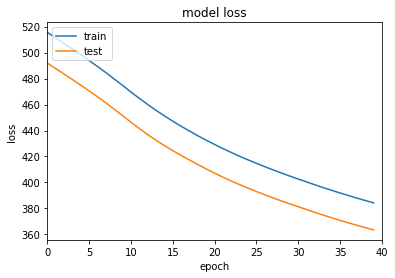

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 382.5315 - root_mean_squared_error: 19.3246 - val_loss: 361.7784 - val_root_mean_squared_error: 18.7803
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 380.7863 - root_mean_squared_error: 19.2800 - val_loss: 360.1058 - val_root_mean_squared_error: 18.7364
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 379.1249 - root_mean_squared_error: 19.2374 - val_loss: 358.4535 - val_root_mean_squared_error: 18.6928
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 377.4325 - root_mean_squared_error: 19.1940 - val_loss: 356.8590 - val_root_mean_squared_error: 18.6508
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 375.8307 - root_mean_squared_error: 19.1528 - val_loss: 355.2763 - val_root_mean_squared_error: 18.6089
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 374.2408 - root_mean_squared_error: 19.1119 - val

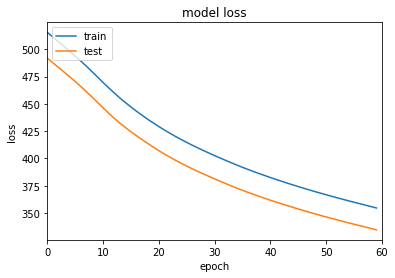

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 472.4380 - root_mean_squared_error: 21.5224 - val_loss: 448.2893 - val_root_mean_squared_error: 20.9542
Epoch 2/20
6/6 [==============================] - 0s 14ms/step - loss: 467.0850 - root_mean_squared_error: 21.3983 - val_loss: 443.0147 - val_root_mean_squared_error: 20.8286
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 461.6978 - root_mean_squared_error: 21.2726 - val_loss: 437.7692 - val_root_mean_squared_error: 20.7030
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 456.3314 - root_mean_squared_error: 21.1468 - val_loss: 432.5334 - val_root_mean_squared_error: 20.5768
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 451.0348 - root_mean_squared_error: 21.0218 - val_loss: 427.2751 - val_root_mean_squared_error: 20.4492
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 445.7565 - root_mean_squared_error: 20.8965 - val_loss:

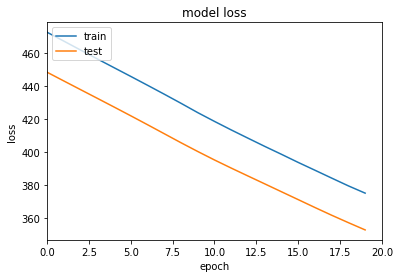

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 370.8372 - root_mean_squared_error: 19.0287 - val_loss: 348.8385 - val_root_mean_squared_error: 18.4419
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 366.5833 - root_mean_squared_error: 18.9171 - val_loss: 344.7076 - val_root_mean_squared_error: 18.3302
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 362.4401 - root_mean_squared_error: 18.8079 - val_loss: 340.6010 - val_root_mean_squared_error: 18.2184
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 358.3853 - root_mean_squared_error: 18.7003 - val_loss: 336.6377 - val_root_mean_squared_error: 18.1099
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 354.4465 - root_mean_squared_error: 18.5953 - val_loss: 332.9084 - val_root_mean_squared_error: 18.0072
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 350.8170 - root_mean_squared_error: 18.4980 - va

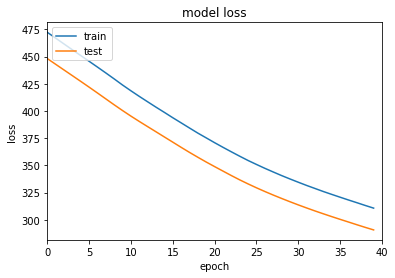

Epoch 41/60
6/6 [==============================] - 0s 18ms/step - loss: 308.2681 - root_mean_squared_error: 17.3185 - val_loss: 288.3340 - val_root_mean_squared_error: 16.7334
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 306.0712 - root_mean_squared_error: 17.2555 - val_loss: 286.1190 - val_root_mean_squared_error: 16.6677
Epoch 43/60
6/6 [==============================] - 0s 16ms/step - loss: 303.8095 - root_mean_squared_error: 17.1904 - val_loss: 284.0163 - val_root_mean_squared_error: 16.6051
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 301.7104 - root_mean_squared_error: 17.1298 - val_loss: 281.9586 - val_root_mean_squared_error: 16.5436
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 299.6115 - root_mean_squared_error: 17.0690 - val_loss: 279.9817 - val_root_mean_squared_error: 16.4843
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 297.6598 - root_mean_squared_error: 17.0123 - val

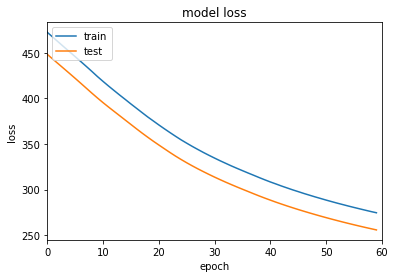

Epoch 1/20
6/6 [==============================] - 1s 45ms/step - loss: 481.2443 - root_mean_squared_error: 21.7289 - val_loss: 456.9470 - val_root_mean_squared_error: 21.1628
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 476.1982 - root_mean_squared_error: 21.6131 - val_loss: 452.0234 - val_root_mean_squared_error: 21.0468
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 471.1407 - root_mean_squared_error: 21.4964 - val_loss: 447.1317 - val_root_mean_squared_error: 20.9309
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 466.2357 - root_mean_squared_error: 21.3826 - val_loss: 442.2331 - val_root_mean_squared_error: 20.8141
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 461.1219 - root_mean_squared_error: 21.2633 - val_loss: 437.4087 - val_root_mean_squared_error: 20.6985
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 456.2252 - root_mean_squared_error: 21.1484 - val_loss: 4

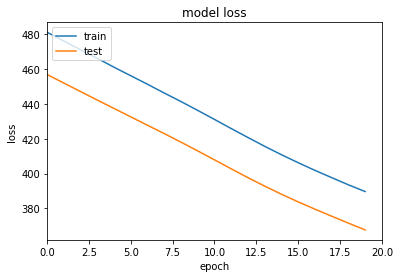

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 385.6604 - root_mean_squared_error: 19.4173 - val_loss: 363.9167 - val_root_mean_squared_error: 18.8494
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 381.9796 - root_mean_squared_error: 19.3228 - val_loss: 360.4115 - val_root_mean_squared_error: 18.7567
Epoch 23/40
6/6 [==============================] - 0s 12ms/step - loss: 378.3836 - root_mean_squared_error: 19.2300 - val_loss: 356.9380 - val_root_mean_squared_error: 18.6644
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 374.7339 - root_mean_squared_error: 19.1354 - val_loss: 353.4427 - val_root_mean_squared_error: 18.5711
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 371.1156 - root_mean_squared_error: 19.0412 - val_loss: 349.9048 - val_root_mean_squared_error: 18.4762
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 367.7384 - root_mean_squared_error: 18.9528 - val_l

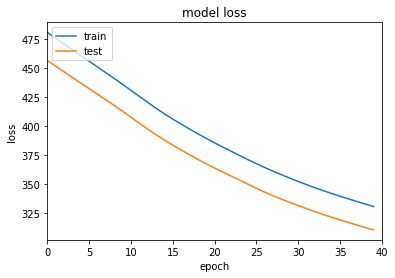

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 328.6083 - root_mean_squared_error: 17.8987 - val_loss: 308.5125 - val_root_mean_squared_error: 17.3286
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 326.6766 - root_mean_squared_error: 17.8452 - val_loss: 306.5777 - val_root_mean_squared_error: 17.2732
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 324.6807 - root_mean_squared_error: 17.7897 - val_loss: 304.6974 - val_root_mean_squared_error: 17.2192
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 322.8013 - root_mean_squared_error: 17.7373 - val_loss: 302.8092 - val_root_mean_squared_error: 17.1648
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 320.9252 - root_mean_squared_error: 17.6848 - val_loss: 300.9595 - val_root_mean_squared_error: 17.1113
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 319.0824 - root_mean_squared_error: 17.6331 - va

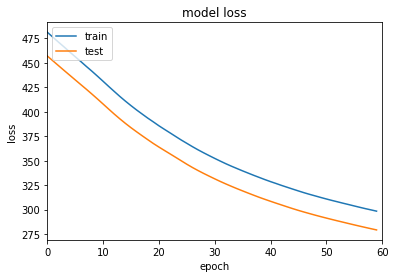

Epoch 1/20
6/6 [==============================] - 1s 56ms/step - loss: 451.0588 - root_mean_squared_error: 21.0208 - val_loss: 427.3491 - val_root_mean_squared_error: 20.4495
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 446.3896 - root_mean_squared_error: 20.9101 - val_loss: 422.7831 - val_root_mean_squared_error: 20.3382
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 441.7497 - root_mean_squared_error: 20.7995 - val_loss: 418.3328 - val_root_mean_squared_error: 20.2292
Epoch 4/20
6/6 [==============================] - 0s 12ms/step - loss: 437.2713 - root_mean_squared_error: 20.6922 - val_loss: 413.9593 - val_root_mean_squared_error: 20.1214
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 432.8833 - root_mean_squared_error: 20.5866 - val_loss: 409.6785 - val_root_mean_squared_error: 20.0154
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 428.4846 - root_mean_squared_error: 20.4801 - val_loss: 4

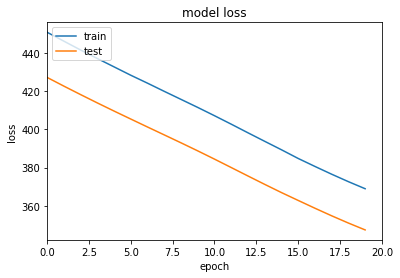

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 365.3217 - root_mean_squared_error: 18.8846 - val_loss: 343.8608 - val_root_mean_squared_error: 18.3079
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 361.9182 - root_mean_squared_error: 18.7948 - val_loss: 340.6299 - val_root_mean_squared_error: 18.2201
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 358.7114 - root_mean_squared_error: 18.7099 - val_loss: 337.5175 - val_root_mean_squared_error: 18.1350
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 355.6721 - root_mean_squared_error: 18.6291 - val_loss: 334.4796 - val_root_mean_squared_error: 18.0517
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 352.5847 - root_mean_squared_error: 18.5466 - val_loss: 331.5834 - val_root_mean_squared_error: 17.9719
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 349.6847 - root_mean_squared_error: 18.4689 - va

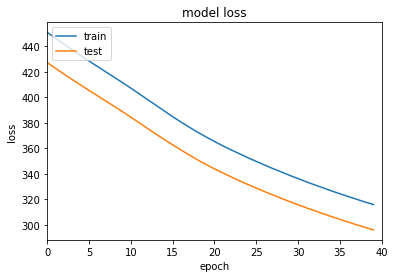

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 313.8152 - root_mean_squared_error: 17.4800 - val_loss: 294.0276 - val_root_mean_squared_error: 16.9049
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 311.8825 - root_mean_squared_error: 17.4252 - val_loss: 292.1367 - val_root_mean_squared_error: 16.8495
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 309.9715 - root_mean_squared_error: 17.3709 - val_loss: 290.2943 - val_root_mean_squared_error: 16.7953
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 308.1364 - root_mean_squared_error: 17.3186 - val_loss: 288.4869 - val_root_mean_squared_error: 16.7420
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 306.2978 - root_mean_squared_error: 17.2660 - val_loss: 286.7414 - val_root_mean_squared_error: 16.6904
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 304.5553 - root_mean_squared_error: 17.2161 - val_los

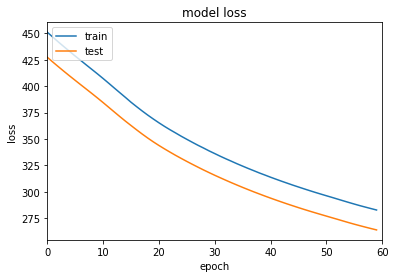

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 473.3923 - root_mean_squared_error: 21.7112 - val_loss: 449.4235 - val_root_mean_squared_error: 21.1521
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 468.5193 - root_mean_squared_error: 21.5989 - val_loss: 444.7118 - val_root_mean_squared_error: 21.0406
Epoch 3/20
6/6 [==============================] - 0s 11ms/step - loss: 463.7346 - root_mean_squared_error: 21.4880 - val_loss: 440.0801 - val_root_mean_squared_error: 20.9305
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 459.0064 - root_mean_squared_error: 21.3779 - val_loss: 435.5179 - val_root_mean_squared_error: 20.8214
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 454.3118 - root_mean_squared_error: 21.2680 - val_loss: 431.0053 - val_root_mean_squared_error: 20.7129
Epoch 6/20
6/6 [==============================] - 0s 14ms/step - loss: 449.6895 - root_mean_squared_error: 21.1592 - val_loss

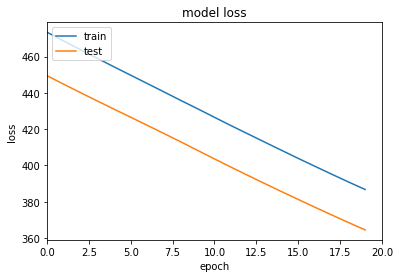

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 382.6731 - root_mean_squared_error: 19.5139 - val_loss: 360.5442 - val_root_mean_squared_error: 18.9385
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 378.8827 - root_mean_squared_error: 19.4167 - val_loss: 356.9185 - val_root_mean_squared_error: 18.8427
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 375.3673 - root_mean_squared_error: 19.3261 - val_loss: 353.5359 - val_root_mean_squared_error: 18.7529
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 371.9924 - root_mean_squared_error: 19.2387 - val_loss: 350.3722 - val_root_mean_squared_error: 18.6685
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 368.8980 - root_mean_squared_error: 19.1583 - val_loss: 347.2894 - val_root_mean_squared_error: 18.5858
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 365.7740 - root_mean_squared_error: 19.0767 - val_

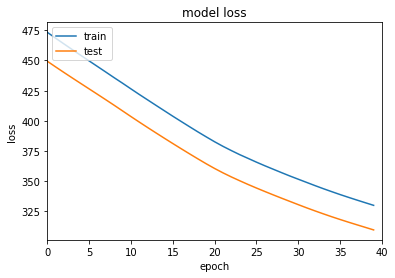

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 327.8231 - root_mean_squared_error: 18.0567 - val_loss: 307.4890 - val_root_mean_squared_error: 17.4846
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 325.6130 - root_mean_squared_error: 17.9955 - val_loss: 305.3562 - val_root_mean_squared_error: 17.4236
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 323.5009 - root_mean_squared_error: 17.9368 - val_loss: 303.2522 - val_root_mean_squared_error: 17.3633
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 321.3881 - root_mean_squared_error: 17.8779 - val_loss: 301.2542 - val_root_mean_squared_error: 17.3058
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 319.3531 - root_mean_squared_error: 17.8211 - val_loss: 299.2987 - val_root_mean_squared_error: 17.2493
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 317.3455 - root_mean_squared_error: 17.7647 - val_lo

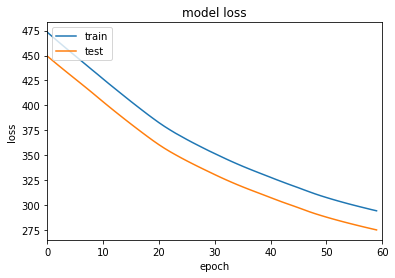

Epoch 1/20
6/6 [==============================] - 1s 48ms/step - loss: 434.8174 - root_mean_squared_error: 20.8280 - val_loss: 410.9584 - val_root_mean_squared_error: 20.2471
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 429.4198 - root_mean_squared_error: 20.6980 - val_loss: 405.6065 - val_root_mean_squared_error: 20.1146
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 424.0567 - root_mean_squared_error: 20.5681 - val_loss: 400.2844 - val_root_mean_squared_error: 19.9819
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 418.7006 - root_mean_squared_error: 20.4376 - val_loss: 395.0581 - val_root_mean_squared_error: 19.8508
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 413.5164 - root_mean_squared_error: 20.3104 - val_loss: 389.9251 - val_root_mean_squared_error: 19.7212
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 408.4753 - root_mean_squared_error: 20.1860 - val_loss:

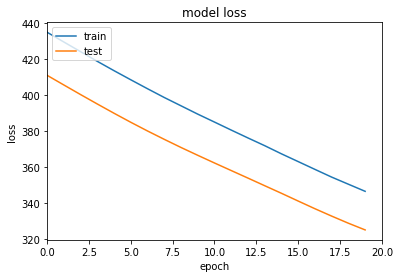

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 342.9761 - root_mean_squared_error: 18.4936 - val_loss: 321.7573 - val_root_mean_squared_error: 17.9107
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 339.5192 - root_mean_squared_error: 18.3999 - val_loss: 318.4218 - val_root_mean_squared_error: 17.8174
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 336.2538 - root_mean_squared_error: 18.3110 - val_loss: 315.2932 - val_root_mean_squared_error: 17.7295
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 333.2216 - root_mean_squared_error: 18.2281 - val_loss: 312.3535 - val_root_mean_squared_error: 17.6464
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 330.3175 - root_mean_squared_error: 18.1483 - val_loss: 309.6144 - val_root_mean_squared_error: 17.5687
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 327.5466 - root_mean_squared_error: 18.0719 - val_

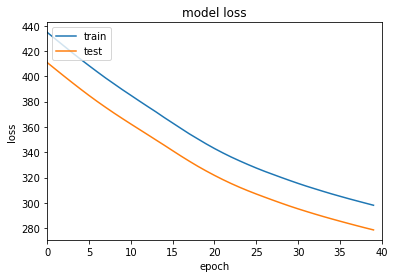

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 296.4817 - root_mean_squared_error: 17.1918 - val_loss: 277.0785 - val_root_mean_squared_error: 16.6179
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 294.9068 - root_mean_squared_error: 17.1460 - val_loss: 275.4949 - val_root_mean_squared_error: 16.5703
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 293.2830 - root_mean_squared_error: 17.0986 - val_loss: 273.9745 - val_root_mean_squared_error: 16.5244
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 291.7728 - root_mean_squared_error: 17.0544 - val_loss: 272.4672 - val_root_mean_squared_error: 16.4788
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 290.2291 - root_mean_squared_error: 17.0092 - val_loss: 271.0119 - val_root_mean_squared_error: 16.4346
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 288.7720 - root_mean_squared_error: 16.9663 - val_lo

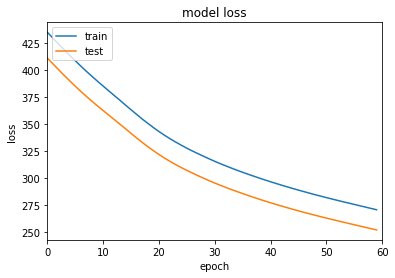

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 400.2487 - root_mean_squared_error: 19.9832 - val_loss: 377.4799 - val_root_mean_squared_error: 19.4052
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 395.6543 - root_mean_squared_error: 19.8680 - val_loss: 372.9639 - val_root_mean_squared_error: 19.2886
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 391.1488 - root_mean_squared_error: 19.7544 - val_loss: 368.5685 - val_root_mean_squared_error: 19.1744
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 386.7226 - root_mean_squared_error: 19.6421 - val_loss: 364.2869 - val_root_mean_squared_error: 19.0625
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 382.4363 - root_mean_squared_error: 19.5327 - val_loss: 360.0906 - val_root_mean_squared_error: 18.9521
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 378.2300 - root_mean_squared_error: 19.4248 - val_loss: 

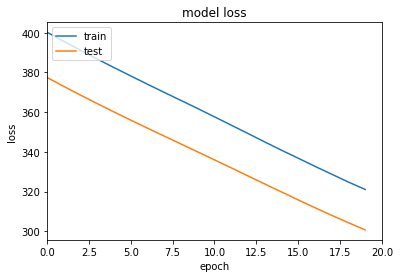

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 317.5859 - root_mean_squared_error: 17.7965 - val_loss: 297.0649 - val_root_mean_squared_error: 17.2104
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 314.0009 - root_mean_squared_error: 17.6956 - val_loss: 293.7063 - val_root_mean_squared_error: 17.1126
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 310.8217 - root_mean_squared_error: 17.6056 - val_loss: 290.4927 - val_root_mean_squared_error: 17.0185
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 307.7875 - root_mean_squared_error: 17.5193 - val_loss: 287.4445 - val_root_mean_squared_error: 16.9288
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 304.8716 - root_mean_squared_error: 17.4359 - val_loss: 284.5663 - val_root_mean_squared_error: 16.8436
Epoch 26/40
6/6 [==============================] - 0s 15ms/step - loss: 302.0353 - root_mean_squared_error: 17.3545 - val

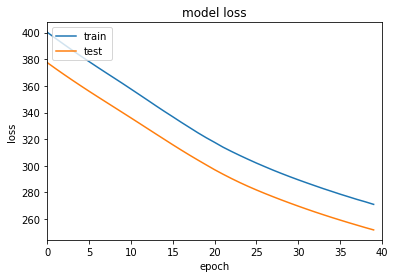

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 269.2828 - root_mean_squared_error: 16.3847 - val_loss: 250.1152 - val_root_mean_squared_error: 15.7890
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 267.5186 - root_mean_squared_error: 16.3308 - val_loss: 248.4096 - val_root_mean_squared_error: 15.7349
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 265.7553 - root_mean_squared_error: 16.2768 - val_loss: 246.7594 - val_root_mean_squared_error: 15.6825
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 264.1272 - root_mean_squared_error: 16.2268 - val_loss: 245.1130 - val_root_mean_squared_error: 15.6300
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 262.4558 - root_mean_squared_error: 16.1753 - val_loss: 243.5231 - val_root_mean_squared_error: 15.5791
Epoch 46/60
6/6 [==============================] - 0s 14ms/step - loss: 260.8714 - root_mean_squared_error: 16.1263 - va

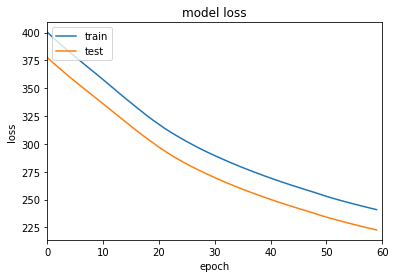

Epoch 1/20
6/6 [==============================] - 1s 58ms/step - loss: 445.8787 - root_mean_squared_error: 21.0943 - val_loss: 423.0692 - val_root_mean_squared_error: 20.5466
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 441.7024 - root_mean_squared_error: 20.9951 - val_loss: 418.8578 - val_root_mean_squared_error: 20.4439
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 437.5066 - root_mean_squared_error: 20.8950 - val_loss: 414.6968 - val_root_mean_squared_error: 20.3419
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 433.4646 - root_mean_squared_error: 20.7982 - val_loss: 410.5419 - val_root_mean_squared_error: 20.2396
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 429.1957 - root_mean_squared_error: 20.6953 - val_loss: 406.4481 - val_root_mean_squared_error: 20.1383
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 425.0039 - root_mean_squared_error: 20.5939 - val_loss

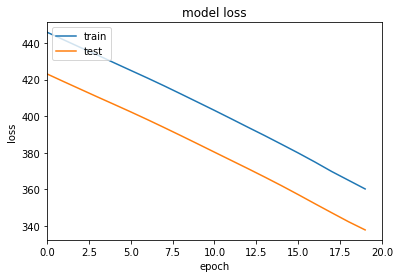

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 355.7799 - root_mean_squared_error: 18.8392 - val_loss: 333.7016 - val_root_mean_squared_error: 18.2439
Epoch 22/40
6/6 [==============================] - 0s 9ms/step - loss: 351.8172 - root_mean_squared_error: 18.7338 - val_loss: 329.9375 - val_root_mean_squared_error: 18.1405
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 348.0326 - root_mean_squared_error: 18.6326 - val_loss: 326.4499 - val_root_mean_squared_error: 18.0442
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 344.5359 - root_mean_squared_error: 18.5386 - val_loss: 323.1241 - val_root_mean_squared_error: 17.9518
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 341.1174 - root_mean_squared_error: 18.4462 - val_loss: 319.9413 - val_root_mean_squared_error: 17.8630
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 337.8425 - root_mean_squared_error: 18.3573 - val_lo

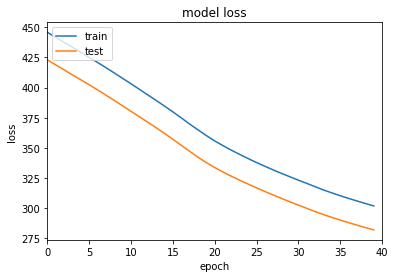

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 299.8868 - root_mean_squared_error: 17.2934 - val_loss: 280.1075 - val_root_mean_squared_error: 16.7118
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 297.9479 - root_mean_squared_error: 17.2373 - val_loss: 278.2790 - val_root_mean_squared_error: 16.6570
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 296.1227 - root_mean_squared_error: 17.1843 - val_loss: 276.4723 - val_root_mean_squared_error: 16.6028
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 294.3349 - root_mean_squared_error: 17.1323 - val_loss: 274.7005 - val_root_mean_squared_error: 16.5494
Epoch 45/60
6/6 [==============================] - 0s 11ms/step - loss: 292.5280 - root_mean_squared_error: 17.0795 - val_loss: 273.0010 - val_root_mean_squared_error: 16.4980
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 290.7971 - root_mean_squared_error: 17.0288 - val

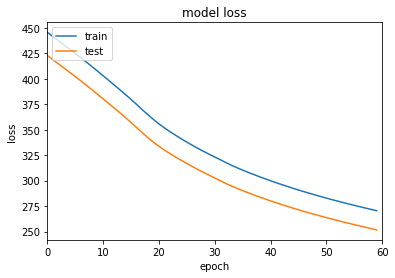

Epoch 1/20
6/6 [==============================] - 1s 54ms/step - loss: 471.4617 - root_mean_squared_error: 21.6857 - val_loss: 448.0786 - val_root_mean_squared_error: 21.1397
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 466.6794 - root_mean_squared_error: 21.5752 - val_loss: 443.2603 - val_root_mean_squared_error: 21.0256
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 461.8258 - root_mean_squared_error: 21.4626 - val_loss: 438.4783 - val_root_mean_squared_error: 20.9117
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 457.0417 - root_mean_squared_error: 21.3510 - val_loss: 433.7084 - val_root_mean_squared_error: 20.7974
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 452.2985 - root_mean_squared_error: 21.2397 - val_loss: 428.9466 - val_root_mean_squared_error: 20.6828
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 447.5749 - root_mean_squared_error: 21.1283 - val_loss: 

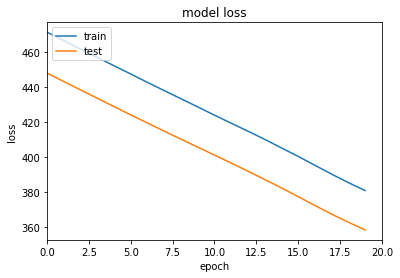

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 376.6115 - root_mean_squared_error: 19.3779 - val_loss: 354.2593 - val_root_mean_squared_error: 18.7924
Epoch 22/40
6/6 [==============================] - 0s 13ms/step - loss: 372.4412 - root_mean_squared_error: 19.2701 - val_loss: 350.3091 - val_root_mean_squared_error: 18.6871
Epoch 23/40
6/6 [==============================] - 0s 9ms/step - loss: 368.5646 - root_mean_squared_error: 19.1694 - val_loss: 346.5151 - val_root_mean_squared_error: 18.5854
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 364.7799 - root_mean_squared_error: 19.0705 - val_loss: 342.9543 - val_root_mean_squared_error: 18.4894
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 361.2021 - root_mean_squared_error: 18.9765 - val_loss: 339.5938 - val_root_mean_squared_error: 18.3984
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 357.8660 - root_mean_squared_error: 18.8885 - val_l

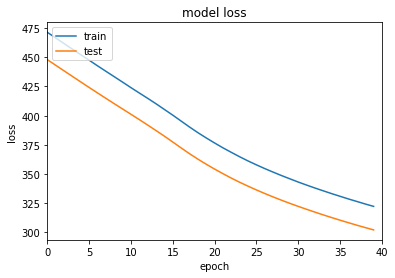

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 320.3184 - root_mean_squared_error: 17.8682 - val_loss: 300.1973 - val_root_mean_squared_error: 17.2960
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 318.3036 - root_mean_squared_error: 17.8118 - val_loss: 298.3310 - val_root_mean_squared_error: 17.2421
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 316.4418 - root_mean_squared_error: 17.7595 - val_loss: 296.4858 - val_root_mean_squared_error: 17.1885
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 314.5952 - root_mean_squared_error: 17.7075 - val_loss: 294.6808 - val_root_mean_squared_error: 17.1360
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 312.8033 - root_mean_squared_error: 17.6569 - val_loss: 292.9229 - val_root_mean_squared_error: 17.0847
Epoch 46/60
6/6 [==============================] - 0s 14ms/step - loss: 310.9686 - root_mean_squared_error: 17.6050 - va

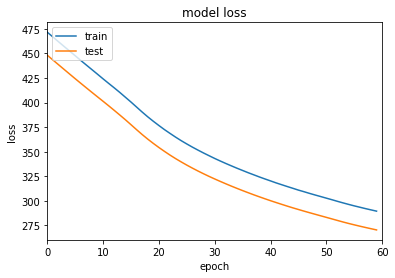

Epoch 1/20
6/6 [==============================] - 1s 53ms/step - loss: 469.0600 - root_mean_squared_error: 21.6531 - val_loss: 444.5192 - val_root_mean_squared_error: 21.0788
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 463.9562 - root_mean_squared_error: 21.5349 - val_loss: 439.5255 - val_root_mean_squared_error: 20.9600
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 458.9584 - root_mean_squared_error: 21.4186 - val_loss: 434.6252 - val_root_mean_squared_error: 20.8428
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 454.0388 - root_mean_squared_error: 21.3035 - val_loss: 429.7825 - val_root_mean_squared_error: 20.7264
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 449.3343 - root_mean_squared_error: 21.1928 - val_loss: 424.9545 - val_root_mean_squared_error: 20.6096
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 444.4674 - root_mean_squared_error: 21.0777 - val_loss

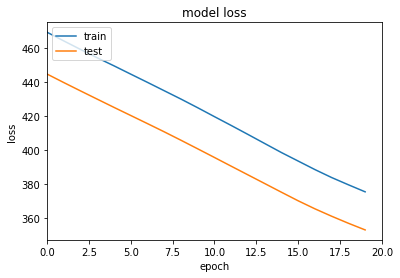

Epoch 21/40
6/6 [==============================] - 0s 17ms/step - loss: 371.4266 - root_mean_squared_error: 19.2674 - val_loss: 349.3473 - val_root_mean_squared_error: 18.6857
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 367.8197 - root_mean_squared_error: 19.1736 - val_loss: 345.7655 - val_root_mean_squared_error: 18.5896
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 364.2822 - root_mean_squared_error: 19.0812 - val_loss: 342.4269 - val_root_mean_squared_error: 18.4996
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 361.0001 - root_mean_squared_error: 18.9950 - val_loss: 339.2271 - val_root_mean_squared_error: 18.4129
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 357.7842 - root_mean_squared_error: 18.9102 - val_loss: 336.0792 - val_root_mean_squared_error: 18.3273
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 354.6244 - root_mean_squared_error: 18.8264 - val

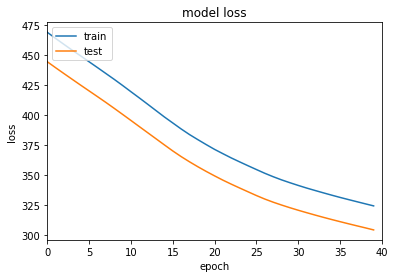

Epoch 41/60
6/6 [==============================] - 0s 20ms/step - loss: 322.5275 - root_mean_squared_error: 17.9539 - val_loss: 302.4856 - val_root_mean_squared_error: 17.3868
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 320.6123 - root_mean_squared_error: 17.9005 - val_loss: 300.5945 - val_root_mean_squared_error: 17.3324
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 318.7067 - root_mean_squared_error: 17.8472 - val_loss: 298.7196 - val_root_mean_squared_error: 17.2782
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 316.8115 - root_mean_squared_error: 17.7940 - val_loss: 296.9123 - val_root_mean_squared_error: 17.2258
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 315.0134 - root_mean_squared_error: 17.7435 - val_loss: 295.2656 - val_root_mean_squared_error: 17.1780
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 313.4033 - root_mean_squared_error: 17.6980 - va

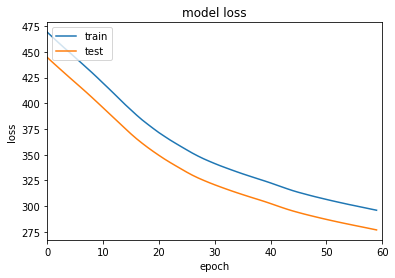

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 450.8365 - root_mean_squared_error: 21.2305 - val_loss: 427.7983 - val_root_mean_squared_error: 20.6808
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 446.1429 - root_mean_squared_error: 21.1197 - val_loss: 423.2513 - val_root_mean_squared_error: 20.5706
Epoch 3/20
6/6 [==============================] - 0s 13ms/step - loss: 441.5761 - root_mean_squared_error: 21.0113 - val_loss: 418.6799 - val_root_mean_squared_error: 20.4592
Epoch 4/20
6/6 [==============================] - 0s 18ms/step - loss: 436.9362 - root_mean_squared_error: 20.9006 - val_loss: 414.1169 - val_root_mean_squared_error: 20.3474
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 432.3463 - root_mean_squared_error: 20.7905 - val_loss: 409.5294 - val_root_mean_squared_error: 20.2344
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 427.7356 - root_mean_squared_error: 20.6793 - val_loss:

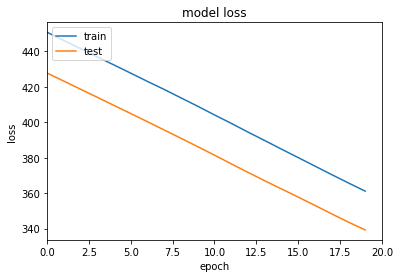

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 356.9150 - root_mean_squared_error: 18.8896 - val_loss: 335.1712 - val_root_mean_squared_error: 18.3051
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 352.9606 - root_mean_squared_error: 18.7847 - val_loss: 331.2617 - val_root_mean_squared_error: 18.1980
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 349.1265 - root_mean_squared_error: 18.6824 - val_loss: 327.5276 - val_root_mean_squared_error: 18.0951
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 345.5723 - root_mean_squared_error: 18.5870 - val_loss: 323.9970 - val_root_mean_squared_error: 17.9973
Epoch 25/40
6/6 [==============================] - 0s 13ms/step - loss: 342.0345 - root_mean_squared_error: 18.4916 - val_loss: 320.8632 - val_root_mean_squared_error: 17.9100
Epoch 26/40
6/6 [==============================] - 0s 16ms/step - loss: 338.9855 - root_mean_squared_error: 18.4090 - va

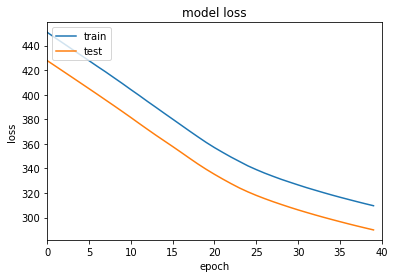

Epoch 41/60
6/6 [==============================] - 0s 29ms/step - loss: 307.9732 - root_mean_squared_error: 17.5466 - val_loss: 288.3512 - val_root_mean_squared_error: 16.9782
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 306.4186 - root_mean_squared_error: 17.5022 - val_loss: 286.8256 - val_root_mean_squared_error: 16.9332
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 304.8540 - root_mean_squared_error: 17.4575 - val_loss: 285.3594 - val_root_mean_squared_error: 16.8899
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 303.3960 - root_mean_squared_error: 17.4157 - val_loss: 283.8996 - val_root_mean_squared_error: 16.8466
Epoch 45/60
6/6 [==============================] - 0s 13ms/step - loss: 301.9146 - root_mean_squared_error: 17.3731 - val_loss: 282.4779 - val_root_mean_squared_error: 16.8044
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 300.4700 - root_mean_squared_error: 17.3315 - val_l

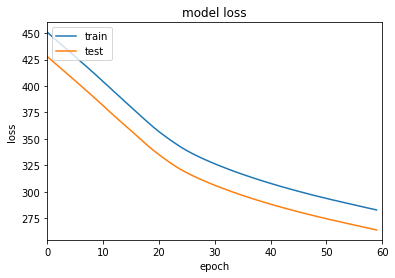

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 440.6190 - root_mean_squared_error: 20.9887 - val_loss: 417.5296 - val_root_mean_squared_error: 20.4313
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 436.1801 - root_mean_squared_error: 20.8827 - val_loss: 413.1945 - val_root_mean_squared_error: 20.3249
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 431.8791 - root_mean_squared_error: 20.7795 - val_loss: 408.9112 - val_root_mean_squared_error: 20.2193
Epoch 4/20
6/6 [==============================] - 0s 13ms/step - loss: 427.5329 - root_mean_squared_error: 20.6746 - val_loss: 404.7008 - val_root_mean_squared_error: 20.1149
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 423.3223 - root_mean_squared_error: 20.5726 - val_loss: 400.4882 - val_root_mean_squared_error: 20.0099
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 419.0829 - root_mean_squared_error: 20.4693 - val_loss: 

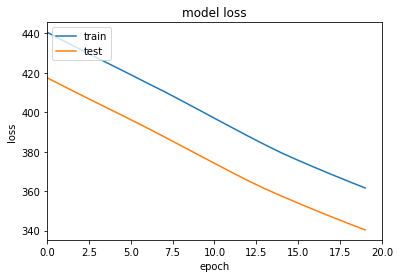

Epoch 21/40
6/6 [==============================] - 0s 21ms/step - loss: 358.2216 - root_mean_squared_error: 18.9244 - val_loss: 337.1275 - val_root_mean_squared_error: 18.3586
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 354.9805 - root_mean_squared_error: 18.8386 - val_loss: 333.8789 - val_root_mean_squared_error: 18.2699
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 351.6705 - root_mean_squared_error: 18.7505 - val_loss: 330.6206 - val_root_mean_squared_error: 18.1806
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 348.3825 - root_mean_squared_error: 18.6627 - val_loss: 327.3984 - val_root_mean_squared_error: 18.0917
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 345.1724 - root_mean_squared_error: 18.5765 - val_loss: 324.2648 - val_root_mean_squared_error: 18.0049
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 342.0515 - root_mean_squared_error: 18.4923 - va

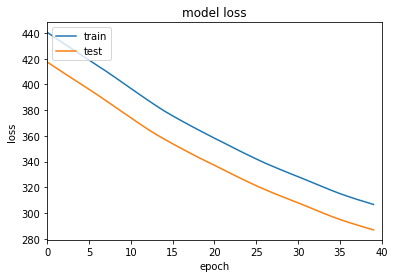

Epoch 41/60
6/6 [==============================] - 0s 23ms/step - loss: 304.7946 - root_mean_squared_error: 17.4559 - val_loss: 285.0242 - val_root_mean_squared_error: 16.8801
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 302.8633 - root_mean_squared_error: 17.4005 - val_loss: 283.1542 - val_root_mean_squared_error: 16.8247
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 300.9807 - root_mean_squared_error: 17.3464 - val_loss: 281.2563 - val_root_mean_squared_error: 16.7682
Epoch 44/60
6/6 [==============================] - 0s 11ms/step - loss: 299.0626 - root_mean_squared_error: 17.2910 - val_loss: 279.3743 - val_root_mean_squared_error: 16.7120
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 297.1968 - root_mean_squared_error: 17.2369 - val_loss: 277.5243 - val_root_mean_squared_error: 16.6565
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 295.3246 - root_mean_squared_error: 17.1826 - val_

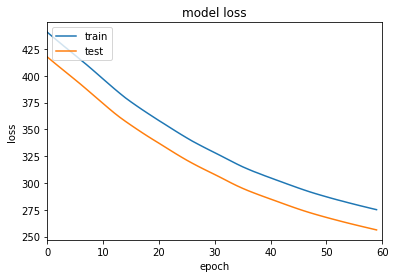

Epoch 1/20
6/6 [==============================] - 1s 52ms/step - loss: 476.8880 - root_mean_squared_error: 21.8125 - val_loss: 453.4445 - val_root_mean_squared_error: 21.2684
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 472.8276 - root_mean_squared_error: 21.7194 - val_loss: 449.3906 - val_root_mean_squared_error: 21.1730
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 468.8192 - root_mean_squared_error: 21.6270 - val_loss: 445.2995 - val_root_mean_squared_error: 21.0763
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 464.7122 - root_mean_squared_error: 21.5320 - val_loss: 441.2426 - val_root_mean_squared_error: 20.9800
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 460.7169 - root_mean_squared_error: 21.4391 - val_loss: 437.2063 - val_root_mean_squared_error: 20.8837
Epoch 6/20
6/6 [==============================] - 0s 10ms/step - loss: 456.7013 - root_mean_squared_error: 21.3454 - val_loss: 

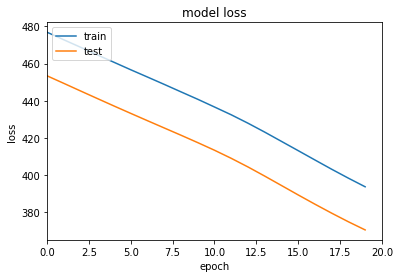

Epoch 21/40
6/6 [==============================] - 0s 19ms/step - loss: 389.2093 - root_mean_squared_error: 19.7028 - val_loss: 366.5144 - val_root_mean_squared_error: 19.1183
Epoch 22/40
6/6 [==============================] - 0s 12ms/step - loss: 385.1357 - root_mean_squared_error: 19.5993 - val_loss: 362.6613 - val_root_mean_squared_error: 19.0173
Epoch 23/40
6/6 [==============================] - 0s 15ms/step - loss: 381.2285 - root_mean_squared_error: 19.4994 - val_loss: 359.0256 - val_root_mean_squared_error: 18.9216
Epoch 24/40
6/6 [==============================] - 0s 9ms/step - loss: 377.5385 - root_mean_squared_error: 19.4047 - val_loss: 355.5770 - val_root_mean_squared_error: 18.8303
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 374.1192 - root_mean_squared_error: 19.3164 - val_loss: 352.3076 - val_root_mean_squared_error: 18.7434
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 370.8304 - root_mean_squared_error: 19.2312 - val

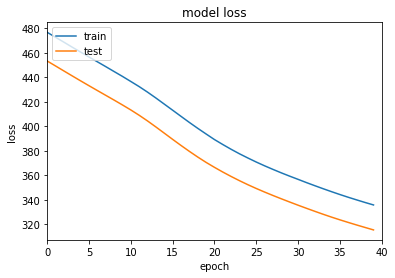

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 333.7989 - root_mean_squared_error: 18.2443 - val_loss: 313.4268 - val_root_mean_squared_error: 17.6772
Epoch 42/60
6/6 [==============================] - 0s 11ms/step - loss: 331.8022 - root_mean_squared_error: 18.1895 - val_loss: 311.4410 - val_root_mean_squared_error: 17.6210
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 329.7986 - root_mean_squared_error: 18.1345 - val_loss: 309.3872 - val_root_mean_squared_error: 17.5627
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 327.7384 - root_mean_squared_error: 18.0776 - val_loss: 307.2521 - val_root_mean_squared_error: 17.5019
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 325.6395 - root_mean_squared_error: 18.0196 - val_loss: 305.2121 - val_root_mean_squared_error: 17.4436
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 323.6050 - root_mean_squared_error: 17.9631 - va

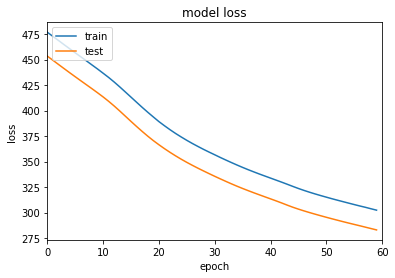

Epoch 1/20
6/6 [==============================] - 1s 50ms/step - loss: 442.1681 - root_mean_squared_error: 21.0250 - val_loss: 418.6985 - val_root_mean_squared_error: 20.4592
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 437.5432 - root_mean_squared_error: 20.9147 - val_loss: 414.2101 - val_root_mean_squared_error: 20.3493
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 432.9194 - root_mean_squared_error: 20.8039 - val_loss: 409.7076 - val_root_mean_squared_error: 20.2383
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 428.2993 - root_mean_squared_error: 20.6926 - val_loss: 405.2233 - val_root_mean_squared_error: 20.1273
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 423.7330 - root_mean_squared_error: 20.5819 - val_loss: 400.7510 - val_root_mean_squared_error: 20.0159
Epoch 6/20
6/6 [==============================] - 0s 15ms/step - loss: 419.2366 - root_mean_squared_error: 20.4724 - val_loss: 39

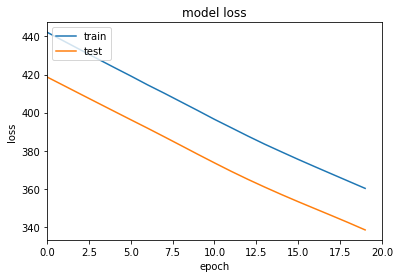

Epoch 21/40
6/6 [==============================] - 0s 18ms/step - loss: 356.3949 - root_mean_squared_error: 18.8755 - val_loss: 334.6270 - val_root_mean_squared_error: 18.2898
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 352.3519 - root_mean_squared_error: 18.7681 - val_loss: 330.7775 - val_root_mean_squared_error: 18.1843
Epoch 23/40
6/6 [==============================] - 0s 16ms/step - loss: 348.4004 - root_mean_squared_error: 18.6625 - val_loss: 326.9923 - val_root_mean_squared_error: 18.0799
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 344.5498 - root_mean_squared_error: 18.5591 - val_loss: 323.3022 - val_root_mean_squared_error: 17.9776
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 340.8113 - root_mean_squared_error: 18.4581 - val_loss: 319.7021 - val_root_mean_squared_error: 17.8772
Epoch 26/40
6/6 [==============================] - 0s 12ms/step - loss: 337.1714 - root_mean_squared_error: 18.3593 - va

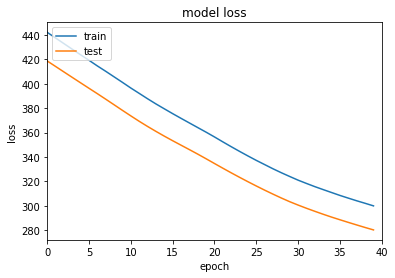

Epoch 41/60
6/6 [==============================] - 0s 16ms/step - loss: 297.9242 - root_mean_squared_error: 17.2575 - val_loss: 278.2839 - val_root_mean_squared_error: 16.6787
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 295.9757 - root_mean_squared_error: 17.2009 - val_loss: 276.3977 - val_root_mean_squared_error: 16.6221
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 294.0733 - root_mean_squared_error: 17.1455 - val_loss: 274.5539 - val_root_mean_squared_error: 16.5665
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 292.2189 - root_mean_squared_error: 17.0914 - val_loss: 272.7524 - val_root_mean_squared_error: 16.5121
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 290.3905 - root_mean_squared_error: 17.0378 - val_loss: 270.9998 - val_root_mean_squared_error: 16.4589
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 288.6096 - root_mean_squared_error: 16.9855 - val_lo

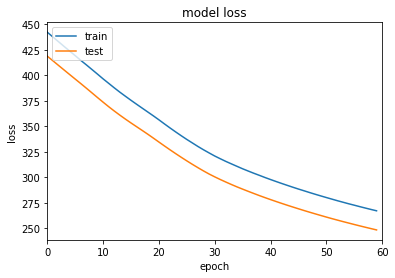

Epoch 1/20
6/6 [==============================] - 1s 51ms/step - loss: 420.7841 - root_mean_squared_error: 20.5125 - val_loss: 397.9037 - val_root_mean_squared_error: 19.9470
Epoch 2/20
6/6 [==============================] - 0s 11ms/step - loss: 416.2984 - root_mean_squared_error: 20.4029 - val_loss: 393.6398 - val_root_mean_squared_error: 19.8399
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 411.9642 - root_mean_squared_error: 20.2964 - val_loss: 389.3750 - val_root_mean_squared_error: 19.7321
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 407.5684 - root_mean_squared_error: 20.1878 - val_loss: 385.1377 - val_root_mean_squared_error: 19.6244
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 403.2376 - root_mean_squared_error: 20.0803 - val_loss: 380.8744 - val_root_mean_squared_error: 19.5155
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 398.9073 - root_mean_squared_error: 19.9722 - val_loss: 3

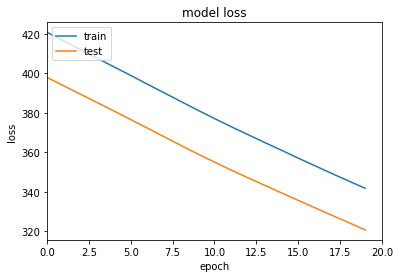

Epoch 21/40
6/6 [==============================] - 0s 16ms/step - loss: 338.0014 - root_mean_squared_error: 18.3843 - val_loss: 317.0022 - val_root_mean_squared_error: 17.8040
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 334.2988 - root_mean_squared_error: 18.2833 - val_loss: 313.3257 - val_root_mean_squared_error: 17.7005
Epoch 23/40
6/6 [==============================] - 0s 13ms/step - loss: 330.6113 - root_mean_squared_error: 18.1822 - val_loss: 309.6611 - val_root_mean_squared_error: 17.5967
Epoch 24/40
6/6 [==============================] - 0s 13ms/step - loss: 326.9821 - root_mean_squared_error: 18.0821 - val_loss: 306.0951 - val_root_mean_squared_error: 17.4950
Epoch 25/40
6/6 [==============================] - 0s 11ms/step - loss: 323.4894 - root_mean_squared_error: 17.9853 - val_loss: 302.6789 - val_root_mean_squared_error: 17.3971
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 320.1378 - root_mean_squared_error: 17.8919 - va

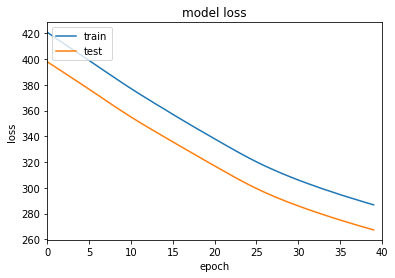

Epoch 41/60
6/6 [==============================] - 0s 19ms/step - loss: 284.8873 - root_mean_squared_error: 16.8781 - val_loss: 265.4526 - val_root_mean_squared_error: 16.2922
Epoch 42/60
6/6 [==============================] - 0s 9ms/step - loss: 283.0557 - root_mean_squared_error: 16.8237 - val_loss: 263.6739 - val_root_mean_squared_error: 16.2375
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 281.2891 - root_mean_squared_error: 16.7711 - val_loss: 261.9284 - val_root_mean_squared_error: 16.1836
Epoch 44/60
6/6 [==============================] - 0s 10ms/step - loss: 279.5258 - root_mean_squared_error: 16.7185 - val_loss: 260.2410 - val_root_mean_squared_error: 16.1314
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 277.8550 - root_mean_squared_error: 16.6684 - val_loss: 258.5790 - val_root_mean_squared_error: 16.0798
Epoch 46/60
6/6 [==============================] - 0s 10ms/step - loss: 276.1767 - root_mean_squared_error: 16.6180 - val_

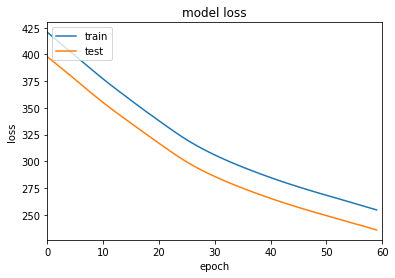

Epoch 1/20
6/6 [==============================] - 1s 49ms/step - loss: 400.6635 - root_mean_squared_error: 20.0163 - val_loss: 378.4126 - val_root_mean_squared_error: 19.4526
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 397.0978 - root_mean_squared_error: 19.9271 - val_loss: 374.9556 - val_root_mean_squared_error: 19.3635
Epoch 3/20
6/6 [==============================] - 0s 10ms/step - loss: 393.5127 - root_mean_squared_error: 19.8369 - val_loss: 371.5211 - val_root_mean_squared_error: 19.2746
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 389.9944 - root_mean_squared_error: 19.7480 - val_loss: 368.0768 - val_root_mean_squared_error: 19.1851
Epoch 5/20
6/6 [==============================] - 0s 9ms/step - loss: 386.4620 - root_mean_squared_error: 19.6584 - val_loss: 364.6075 - val_root_mean_squared_error: 19.0944
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 382.8843 - root_mean_squared_error: 19.5672 - val_loss: 36

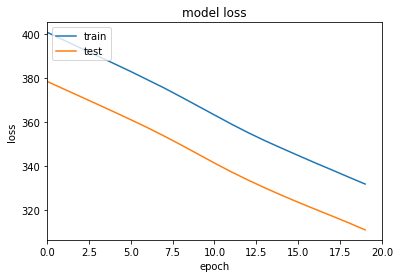

Epoch 21/40
6/6 [==============================] - 0s 23ms/step - loss: 328.5423 - root_mean_squared_error: 18.1255 - val_loss: 307.8188 - val_root_mean_squared_error: 17.5445
Epoch 22/40
6/6 [==============================] - 0s 10ms/step - loss: 325.1675 - root_mean_squared_error: 18.0321 - val_loss: 304.4413 - val_root_mean_squared_error: 17.4480
Epoch 23/40
6/6 [==============================] - 0s 10ms/step - loss: 321.7804 - root_mean_squared_error: 17.9380 - val_loss: 301.1315 - val_root_mean_squared_error: 17.3529
Epoch 24/40
6/6 [==============================] - 0s 10ms/step - loss: 318.5693 - root_mean_squared_error: 17.8482 - val_loss: 297.7896 - val_root_mean_squared_error: 17.2563
Epoch 25/40
6/6 [==============================] - 0s 10ms/step - loss: 315.2141 - root_mean_squared_error: 17.7540 - val_loss: 294.3430 - val_root_mean_squared_error: 17.1561
Epoch 26/40
6/6 [==============================] - 0s 10ms/step - loss: 311.6719 - root_mean_squared_error: 17.6540 - va

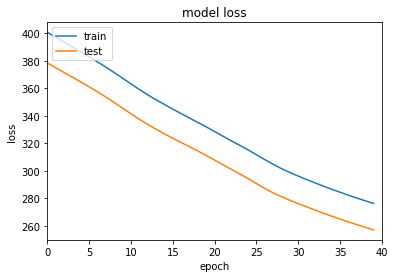

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 274.4103 - root_mean_squared_error: 16.5651 - val_loss: 255.3101 - val_root_mean_squared_error: 15.9781
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 272.5858 - root_mean_squared_error: 16.5099 - val_loss: 253.5515 - val_root_mean_squared_error: 15.9230
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 270.8350 - root_mean_squared_error: 16.4568 - val_loss: 251.8081 - val_root_mean_squared_error: 15.8682
Epoch 44/60
6/6 [==============================] - 0s 13ms/step - loss: 269.0674 - root_mean_squared_error: 16.4030 - val_loss: 250.1147 - val_root_mean_squared_error: 15.8147
Epoch 45/60
6/6 [==============================] - 0s 10ms/step - loss: 267.3855 - root_mean_squared_error: 16.3516 - val_loss: 248.4473 - val_root_mean_squared_error: 15.7619
Epoch 46/60
6/6 [==============================] - 0s 9ms/step - loss: 265.7124 - root_mean_squared_error: 16.3004 - val

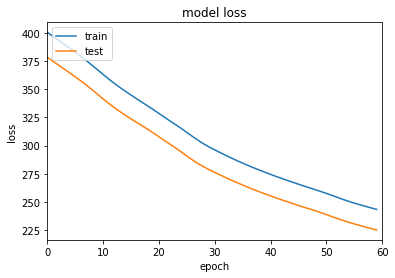

In [ ]:
epochs = [20,40,60]
alphas = [1,1e-1,1e-2,1e-3,1e-4]
activations = ['relu','sigmoid']
L1_params = [1e-2,1e-3,1e-4,1e-5]
L2_params = [1e-2,1e-3,1e-4,1e-5]
model_name = "model_128_64"


for alpha in alphas:
    for activation in activations:
        for l1 in L1_params:
            for l2 in L2_params:

                model_metrics = pd.DataFrame(columns=['loss','root_mean_squared_error','val_loss','val_root_mean_squared_error'])
                model_128_64 = model_architecture_128_64(X_train.shape[1],L1 = l1, L2 = l2, alpha = alpha, activation=activation)
                last_epoch = 0
                            
                for epoch in epochs:

                    temp_model_history = model_128_64.fit(X_train_tensor,
                                y_train_tensor,
                                validation_split=0.15, 
                                epochs = epoch, 
                                initial_epoch = last_epoch
                                )

                    temp_metrics = pd.DataFrame(temp_model_history.history)
                    model_metrics = pd.concat([model_metrics,temp_metrics])
                    model_metrics = model_metrics.reset_index(drop=True)

                    plt.plot(model_metrics['loss'])
                    plt.plot(model_metrics['val_loss'])
                    plt.title('model loss')
                    plt.xlim(0,epoch)
                    plt.ylabel('loss')
                    plt.xlabel('epoch')
                    plt.legend(['train', 'test'], loc='upper left')
                    plt.show()

                    temp_metrics = temp_metrics[temp_metrics['val_root_mean_squared_error'] == temp_metrics['val_root_mean_squared_error'].min()]

                    new_row = [model_name,
                        epoch,
                        activation,
                        alpha,
                        l1,
                        l2,
                        temp_metrics['loss'].values[0],
                        temp_metrics['root_mean_squared_error'].values[0],
                        temp_metrics['val_loss'].values[0],
                        temp_metrics['val_root_mean_squared_error'].values[0]
                    ]

                    last_epoch = epoch

                    model_summaries.loc[model_summaries.shape[0]] = new_row

In [ ]:
model_summaries.tail()

,model_name,epochs,activation,learning_rate,l1,l2,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
969,model_128_64,40,sigmoid,0.0001,0.00001,0.00010,286.757263,16.933372,267.271118,16.347874
970,model_128_64,60,sigmoid,0.0001,0.00001,0.00010,254.624634,15.956414,235.904541,15.358616
971,model_128_64,20,sigmoid,0.0001,0.00001,0.00001,331.944458,18.219076,311.172577,17.639809
972,model_128_64,40,sigmoid,0.0001,0.00001,0.00001,276.320190,16.622601,257.107971,16.034296
973,model_128_64,60,sigmoid,0.0001,0.00001,0.00001,243.337875,15.599003,225.082321,15.002444


In [ ]:
model_128_64_summaries = model_summaries[model_summaries["model_name"]=="model_128_64"]
model_128_64_summaries.head()

,model_name,epochs,activation,learning_rate,l1,l2,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
494,model_128_64,20,relu,1,0.01,0.010,2.002644e+03,9.128671,1977.929565,8.083295
495,model_128_64,40,relu,1,0.01,0.010,1.854826e+03,8.737255,1834.795044,8.081548
496,model_128_64,60,relu,1,0.01,0.010,5.086569e+08,22553.380859,38732.074219,192.088593
497,model_128_64,20,relu,1,0.01,0.001,3.384242e+08,18396.298828,866.057373,22.089922
498,model_128_64,40,relu,1,0.01,0.001,1.062234e+03,22.812672,1039.542114,22.334547


In [ ]:
model_summaries = pd.concat([model_128_summary,model_128_64_summaries])
model_summaries.head()
model_summaries.shape

(1934, 10)

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 1692890038272.0000 - root_mean_squared_error: 1301111.0000 - val_loss: 20005314560.0000 - val_root_mean_squared_error: 141440.1406
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 3210304512.0000 - root_mean_squared_error: 56659.5352 - val_loss: 1975.5677 - val_root_mean_squared_error: 22.5588
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 2221.5823 - root_mean_squared_error: 23.1715 - val_loss: 2496.0137 - val_root_mean_squared_error: 22.8787
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 804922.6250 - root_mean_squared_error: 895.9971 - val_loss: 2993.5398 - val_root_mean_squared_error: 26.4747
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 3190.0974 - root_mean_squared_error: 28.6575 - val_loss: 2631.6211 - val_root_mean_squared_error: 12.9009
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 2772.7502 -

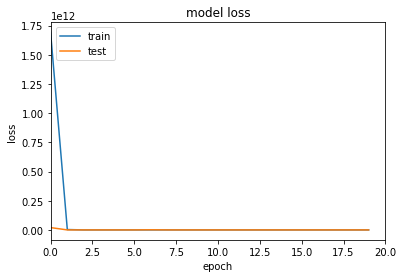

Epoch 21/40
6/6 [==============================] - 0s 12ms/step - loss: 3156.8149 - root_mean_squared_error: 23.7469 - val_loss: 3122.0842 - val_root_mean_squared_error: 23.2790
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 3142.1702 - root_mean_squared_error: 23.7465 - val_loss: 3116.3586 - val_root_mean_squared_error: 23.2785
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 3131.0767 - root_mean_squared_error: 23.7460 - val_loss: 3096.8645 - val_root_mean_squared_error: 23.2781
Epoch 24/40
6/6 [==============================] - 0s 12ms/step - loss: 3117.3091 - root_mean_squared_error: 23.7455 - val_loss: 3092.0386 - val_root_mean_squared_error: 23.2776
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 3107.0574 - root_mean_squared_error: 23.7451 - val_loss: 3073.3284 - val_root_mean_squared_error: 23.2771
Epoch 26/40
6/6 [==============================] - 0s 9ms/step - loss: 3094.0615 - root_mean_squared_error: 23.74

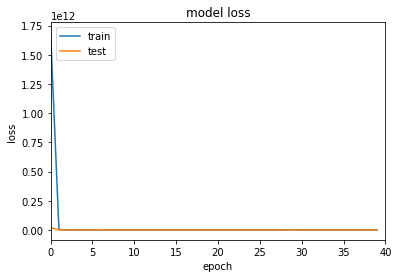

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 3105.9016 - root_mean_squared_error: 24.2446 - val_loss: 3074.3157 - val_root_mean_squared_error: 23.7810
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 3096.8108 - root_mean_squared_error: 24.2443 - val_loss: 3073.9741 - val_root_mean_squared_error: 23.7806
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 3090.9233 - root_mean_squared_error: 24.2438 - val_loss: 3059.4316 - val_root_mean_squared_error: 23.7800
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 3082.0222 - root_mean_squared_error: 24.2432 - val_loss: 3059.3455 - val_root_mean_squared_error: 23.7793
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 3076.3801 - root_mean_squared_error: 24.2426 - val_loss: 3045.0669 - val_root_mean_squared_error: 23.7787
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 3067.7517 - root_mean_squared_error: 24.241

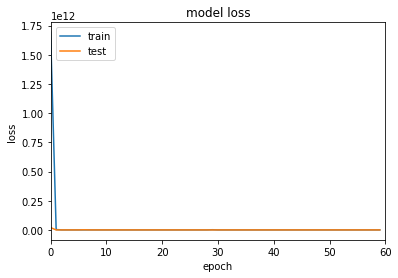

Epoch 1/20
6/6 [==============================] - 1s 40ms/step - loss: 13117313515520.0000 - root_mean_squared_error: 3621783.2500 - val_loss: 611120971776.0000 - val_root_mean_squared_error: 781742.2500
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 137520087040.0000 - root_mean_squared_error: 370837.0000 - val_loss: 986.1469 - val_root_mean_squared_error: 22.2476
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1065.6759 - root_mean_squared_error: 22.8495 - val_loss: 49132852.0000 - val_root_mean_squared_error: 7009.4390
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 34720140.0000 - root_mean_squared_error: 5892.3252 - val_loss: 1197.0448 - val_root_mean_squared_error: 22.6973
Epoch 5/20
6/6 [==============================] - 0s 11ms/step - loss: 1238.8708 - root_mean_squared_error: 23.2099 - val_loss: 1242.4274 - val_root_mean_squared_error: 22.7878
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - lo

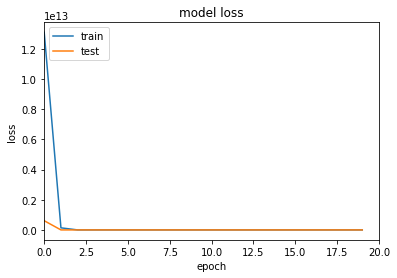

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 1292.2167 - root_mean_squared_error: 23.3763 - val_loss: 1270.0615 - val_root_mean_squared_error: 22.9053
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 1290.0713 - root_mean_squared_error: 23.3762 - val_loss: 1266.5289 - val_root_mean_squared_error: 22.9051
Epoch 23/40
6/6 [==============================] - 0s 11ms/step - loss: 1288.2018 - root_mean_squared_error: 23.3760 - val_loss: 1266.0793 - val_root_mean_squared_error: 22.9050
Epoch 24/40
6/6 [==============================] - 0s 7ms/step - loss: 1286.0931 - root_mean_squared_error: 23.3758 - val_loss: 1262.5820 - val_root_mean_squared_error: 22.9048
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 1284.2683 - root_mean_squared_error: 23.3757 - val_loss: 1262.1899 - val_root_mean_squared_error: 22.9046
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 1282.2122 - root_mean_squared_error: 23.37

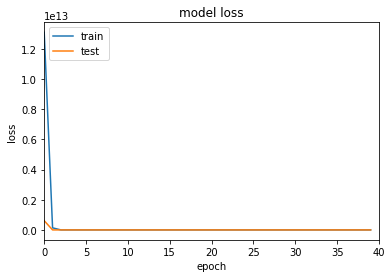

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 1255.6063 - root_mean_squared_error: 23.3724 - val_loss: 1233.6927 - val_root_mean_squared_error: 22.9013
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 1253.8253 - root_mean_squared_error: 23.3722 - val_loss: 1230.5096 - val_root_mean_squared_error: 22.9011
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 1252.3229 - root_mean_squared_error: 23.3719 - val_loss: 1230.4369 - val_root_mean_squared_error: 22.9008
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 1250.5914 - root_mean_squared_error: 23.3717 - val_loss: 3620402.5000 - val_root_mean_squared_error: 1902.5509
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 639967.7500 - root_mean_squared_error: 799.5402 - val_loss: 1228.1676 - val_root_mean_squared_error: 22.9020
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 1248.6644 - root_mean_squared_error

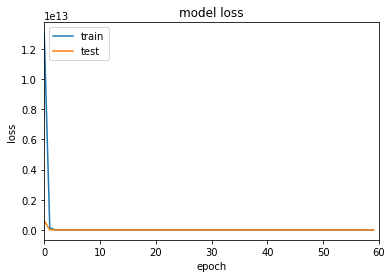

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 4871317618688.0000 - root_mean_squared_error: 2207106.2500 - val_loss: 700.0752 - val_root_mean_squared_error: 21.8452
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 40124.8125 - root_mean_squared_error: 199.6301 - val_loss: 814.2772 - val_root_mean_squared_error: 21.9354
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 869.5100 - root_mean_squared_error: 22.4352 - val_loss: 887.1707 - val_root_mean_squared_error: 21.9830
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 927.4695 - root_mean_squared_error: 22.4741 - val_loss: 928.3825 - val_root_mean_squared_error: 22.0096
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 959.7964 - root_mean_squared_error: 22.4953 - val_loss: 949.9857 - val_root_mean_squared_error: 22.0248
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 977.1766 - root_mean_squared_error: 22.50

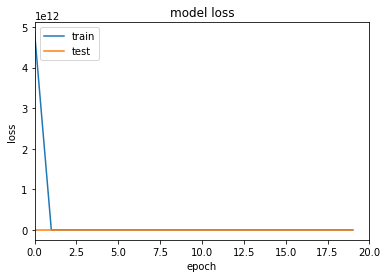

Epoch 21/40
6/6 [==============================] - 0s 14ms/step - loss: 984.5450 - root_mean_squared_error: 22.5207 - val_loss: 962.8150 - val_root_mean_squared_error: 22.0418
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 983.8303 - root_mean_squared_error: 22.5205 - val_loss: 961.8979 - val_root_mean_squared_error: 22.0415
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 982.8514 - root_mean_squared_error: 22.5202 - val_loss: 961.6378 - val_root_mean_squared_error: 22.0413
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 981.7581 - root_mean_squared_error: 22.5200 - val_loss: 959.2632 - val_root_mean_squared_error: 22.0410
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 980.3946 - root_mean_squared_error: 22.5197 - val_loss: 958.7855 - val_root_mean_squared_error: 22.0407
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 979.7458 - root_mean_squared_error: 22.5194 - val_lo

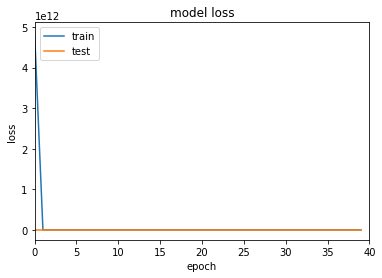

Epoch 41/60
6/6 [==============================] - 0s 12ms/step - loss: 966.7316 - root_mean_squared_error: 22.5146 - val_loss: 945.1068 - val_root_mean_squared_error: 22.0355
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 965.8254 - root_mean_squared_error: 22.5142 - val_loss: 943.7003 - val_root_mean_squared_error: 22.0351
Epoch 43/60
6/6 [==============================] - 0s 7ms/step - loss: 964.8506 - root_mean_squared_error: 22.5138 - val_loss: 943.2589 - val_root_mean_squared_error: 22.0348
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 964.1981 - root_mean_squared_error: 22.5135 - val_loss: 942.6101 - val_root_mean_squared_error: 22.0344
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 963.5408 - root_mean_squared_error: 22.5131 - val_loss: 941.9319 - val_root_mean_squared_error: 22.0340
Epoch 46/60
6/6 [==============================] - 0s 11ms/step - loss: 962.4933 - root_mean_squared_error: 22.5127 - val_lo

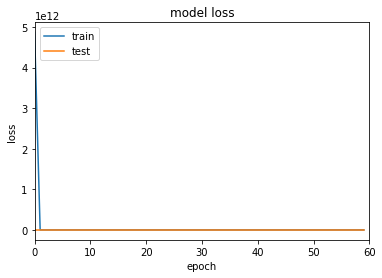

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 7477697445888.0000 - root_mean_squared_error: 2734537.7500 - val_loss: 61961023488.0000 - val_root_mean_squared_error: 248919.7031
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 16417018880.0000 - root_mean_squared_error: 128128.9141 - val_loss: 128252.9844 - val_root_mean_squared_error: 357.6530
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1439668736.0000 - root_mean_squared_error: 37942.9609 - val_loss: 842.0341 - val_root_mean_squared_error: 20.9648
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 874.3104 - root_mean_squared_error: 21.2980 - val_loss: 863.1490 - val_root_mean_squared_error: 20.6020
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 888.1093 - root_mean_squared_error: 21.0062 - val_loss: 871.5314 - val_root_mean_squared_error: 20.3955
Epoch 6/20
6/6 [==============================] - 0s 11ms/step - loss: 894.3

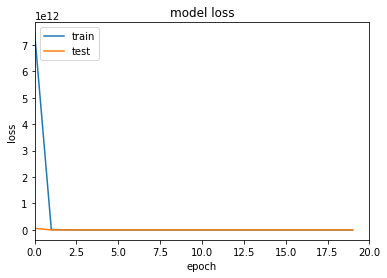

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 858.6168 - root_mean_squared_error: 20.6201 - val_loss: 837.2656 - val_root_mean_squared_error: 20.1216
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 856.5356 - root_mean_squared_error: 20.6199 - val_loss: 834.0973 - val_root_mean_squared_error: 20.1214
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 853.3735 - root_mean_squared_error: 20.6197 - val_loss: 831.7555 - val_root_mean_squared_error: 20.1212
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 851.3223 - root_mean_squared_error: 20.6195 - val_loss: 829.8231 - val_root_mean_squared_error: 20.1210
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 849.2069 - root_mean_squared_error: 20.6193 - val_loss: 826.9184 - val_root_mean_squared_error: 20.1208
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 846.3277 - root_mean_squared_error: 20.6191 - val_lo

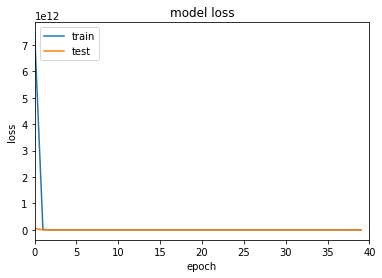

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 817.1059 - root_mean_squared_error: 20.6157 - val_loss: 795.9728 - val_root_mean_squared_error: 20.1171
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 816.0265 - root_mean_squared_error: 20.6154 - val_loss: 795.2823 - val_root_mean_squared_error: 20.1169
Epoch 43/60
6/6 [==============================] - 0s 8ms/step - loss: 814.9385 - root_mean_squared_error: 20.6152 - val_loss: 793.2219 - val_root_mean_squared_error: 20.1166
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 812.6191 - root_mean_squared_error: 20.6149 - val_loss: 791.2998 - val_root_mean_squared_error: 20.1163
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 811.3948 - root_mean_squared_error: 20.6146 - val_loss: 790.4409 - val_root_mean_squared_error: 20.1161
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 810.3346 - root_mean_squared_error: 20.6144 - val_los

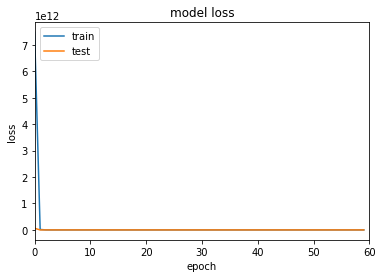

Epoch 1/20
6/6 [==============================] - 1s 37ms/step - loss: 12013559349248.0000 - root_mean_squared_error: 3466058.2500 - val_loss: 963494400.0000 - val_root_mean_squared_error: 31040.1953
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 31368736768.0000 - root_mean_squared_error: 177112.2188 - val_loss: 3867.1089 - val_root_mean_squared_error: 51.3990
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 4430.7705 - root_mean_squared_error: 55.0073 - val_loss: 5108.0952 - val_root_mean_squared_error: 58.9368
Epoch 4/20
6/6 [==============================] - 0s 7ms/step - loss: 25206.2324 - root_mean_squared_error: 153.2062 - val_loss: 5881.5913 - val_root_mean_squared_error: 63.4360
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 6119.7183 - root_mean_squared_error: 64.9112 - val_loss: 6328.3887 - val_root_mean_squared_error: 66.0643
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 6478.8633 - r

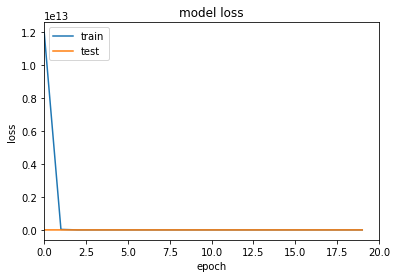

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 6432.4282 - root_mean_squared_error: 68.1597 - val_loss: 6370.2729 - val_root_mean_squared_error: 67.7338
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 6403.6929 - root_mean_squared_error: 67.9986 - val_loss: 6341.7485 - val_root_mean_squared_error: 67.5696
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 6375.1699 - root_mean_squared_error: 67.8328 - val_loss: 6313.5396 - val_root_mean_squared_error: 67.4019
Epoch 24/40
6/6 [==============================] - 0s 11ms/step - loss: 6346.9712 - root_mean_squared_error: 67.6640 - val_loss: 6285.5337 - val_root_mean_squared_error: 67.2307
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 6318.8647 - root_mean_squared_error: 67.4911 - val_loss: 6257.7266 - val_root_mean_squared_error: 67.0565
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 6291.0845 - root_mean_squared_error: 67.31

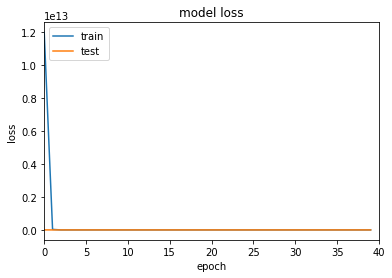

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 5868.1685 - root_mean_squared_error: 64.3251 - val_loss: 5807.8638 - val_root_mean_squared_error: 63.8585
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 5839.1245 - root_mean_squared_error: 64.1048 - val_loss: 5778.9102 - val_root_mean_squared_error: 63.6369
Epoch 43/60
6/6 [==============================] - 0s 11ms/step - loss: 5810.1069 - root_mean_squared_error: 63.8833 - val_loss: 5749.7881 - val_root_mean_squared_error: 63.4127
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 5780.7729 - root_mean_squared_error: 63.6581 - val_loss: 5720.5854 - val_root_mean_squared_error: 63.1865
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 5751.4722 - root_mean_squared_error: 63.4319 - val_loss: 5691.2754 - val_root_mean_squared_error: 62.9583
Epoch 46/60
6/6 [==============================] - 0s 12ms/step - loss: 5721.9082 - root_mean_squared_error: 63.2

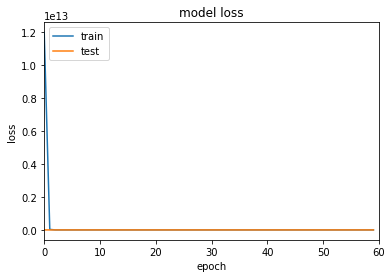

Epoch 1/20
6/6 [==============================] - 1s 40ms/step - loss: 9011457949696.0000 - root_mean_squared_error: 3001909.0000 - val_loss: 107494850560.0000 - val_root_mean_squared_error: 327864.0625
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 17705162752.0000 - root_mean_squared_error: 133060.7500 - val_loss: 10952.9941 - val_root_mean_squared_error: 103.8949
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 8808.7275 - root_mean_squared_error: 92.8733 - val_loss: 3144.3450 - val_root_mean_squared_error: 54.1141
Epoch 4/20
6/6 [==============================] - 0s 11ms/step - loss: 1612.6149 - root_mean_squared_error: 37.1567 - val_loss: 805.7927 - val_root_mean_squared_error: 23.5147
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 839.3358 - root_mean_squared_error: 24.0288 - val_loss: 831.6850 - val_root_mean_squared_error: 23.6248
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 860.6681 - 

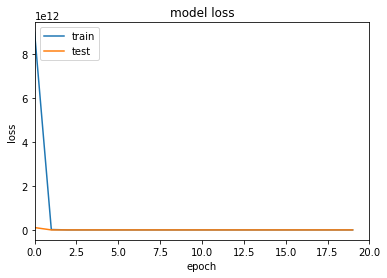

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 870.9208 - root_mean_squared_error: 24.2314 - val_loss: 847.5858 - val_root_mean_squared_error: 23.7677
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 869.6792 - root_mean_squared_error: 24.2312 - val_loss: 847.1068 - val_root_mean_squared_error: 23.7675
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 868.7302 - root_mean_squared_error: 24.2310 - val_loss: 845.4231 - val_root_mean_squared_error: 23.7673
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 867.5356 - root_mean_squared_error: 24.2308 - val_loss: 844.9921 - val_root_mean_squared_error: 23.7671
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 866.6329 - root_mean_squared_error: 24.2306 - val_loss: 843.3522 - val_root_mean_squared_error: 23.7669
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 865.4814 - root_mean_squared_error: 24.2304 - val_los

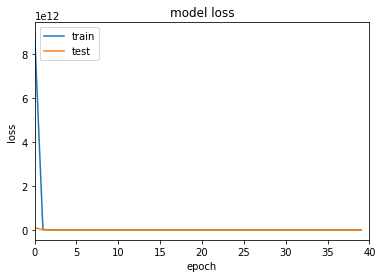

Epoch 41/60
6/6 [==============================] - 0s 14ms/step - loss: 852.4271 - root_mean_squared_error: 24.2265 - val_loss: 829.2974 - val_root_mean_squared_error: 23.7627
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 851.5250 - root_mean_squared_error: 24.2262 - val_loss: 829.1631 - val_root_mean_squared_error: 23.7624
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 850.9075 - root_mean_squared_error: 24.2259 - val_loss: 827.7916 - val_root_mean_squared_error: 23.7621
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 850.0287 - root_mean_squared_error: 24.2256 - val_loss: 827.6812 - val_root_mean_squared_error: 23.7618
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 849.4346 - root_mean_squared_error: 24.2253 - val_loss: 826.3335 - val_root_mean_squared_error: 23.7615
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 848.5786 - root_mean_squared_error: 24.2250 - val_lo

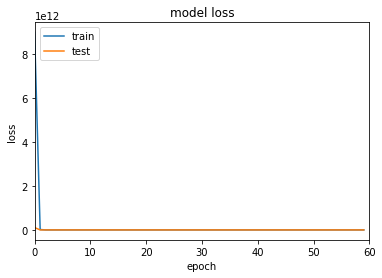

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 10051949428736.0000 - root_mean_squared_error: 3170480.7500 - val_loss: 2728005206016.0000 - val_root_mean_squared_error: 1651667.3750
Epoch 2/20
6/6 [==============================] - 0s 10ms/step - loss: 455132184576.0000 - root_mean_squared_error: 674634.8750 - val_loss: 26941434.0000 - val_root_mean_squared_error: 5190.5093
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 57247188.0000 - root_mean_squared_error: 7566.1841 - val_loss: 80637928.0000 - val_root_mean_squared_error: 8979.8594
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 61519992.0000 - root_mean_squared_error: 7843.4639 - val_loss: 35269796.0000 - val_root_mean_squared_error: 5938.8320
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 19885874.0000 - root_mean_squared_error: 4459.3506 - val_loss: 5125801.0000 - val_root_mean_squared_error: 2264.0076
Epoch 6/20
6/6 [====================

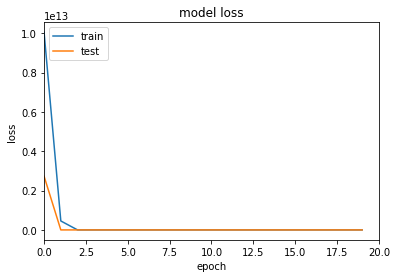

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 8472229.0000 - root_mean_squared_error: 2910.6965 - val_loss: 8531293.0000 - val_root_mean_squared_error: 2920.8247
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 7841955.5000 - root_mean_squared_error: 2800.3359 - val_loss: 7894446.5000 - val_root_mean_squared_error: 2809.6926
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 7254767.0000 - root_mean_squared_error: 2693.4539 - val_loss: 7297695.0000 - val_root_mean_squared_error: 2701.4109
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 6701464.0000 - root_mean_squared_error: 2588.7043 - val_loss: 6741451.5000 - val_root_mean_squared_error: 2596.4165
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 6189394.5000 - root_mean_squared_error: 2487.8347 - val_loss: 6220759.0000 - val_root_mean_squared_error: 2494.1301
Epoch 26/40
6/6 [==============================] - 0s 12ms/step 

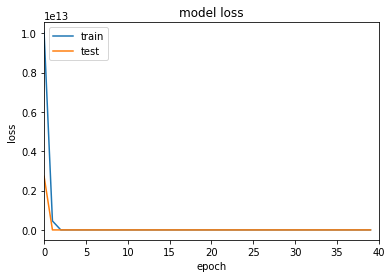

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 1546318.3750 - root_mean_squared_error: 1243.4816 - val_loss: 1542900.7500 - val_root_mean_squared_error: 1242.1066
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 1407540.6250 - root_mean_squared_error: 1186.3678 - val_loss: 1404197.5000 - val_root_mean_squared_error: 1184.9581
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 1280878.2500 - root_mean_squared_error: 1131.7272 - val_loss: 1276547.0000 - val_root_mean_squared_error: 1129.8120
Epoch 44/60
6/6 [==============================] - 0s 8ms/step - loss: 1163379.8750 - root_mean_squared_error: 1078.5676 - val_loss: 1159786.1250 - val_root_mean_squared_error: 1076.9004
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 1056923.7500 - root_mean_squared_error: 1028.0331 - val_loss: 1052154.3750 - val_root_mean_squared_error: 1025.7107
Epoch 46/60
6/6 [==============================] - 0s 8ms/step -

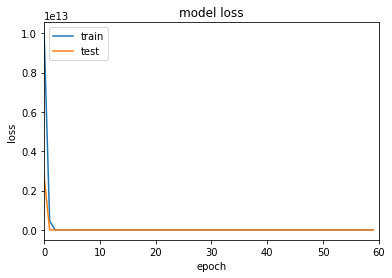

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 22507216175104.0000 - root_mean_squared_error: 4744177.0000 - val_loss: 106512834560.0000 - val_root_mean_squared_error: 326363.0312
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 33169201152.0000 - root_mean_squared_error: 182124.1406 - val_loss: 4276463360.0000 - val_root_mean_squared_error: 65394.6719
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1304148736.0000 - root_mean_squared_error: 36113.0000 - val_loss: 1472149.8750 - val_root_mean_squared_error: 1213.3036
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 175809.0625 - root_mean_squared_error: 419.2407 - val_loss: 207.0050 - val_root_mean_squared_error: 12.5802
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 226.4268 - root_mean_squared_error: 13.2889 - val_loss: 136.7590 - val_root_mean_squared_error: 9.2537
Epoch 6/20
6/6 [==============================] - 0s 8ms/st

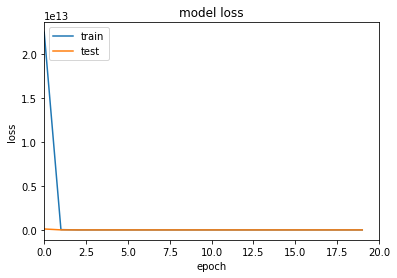

Epoch 21/40
6/6 [==============================] - 0s 13ms/step - loss: 137.1928 - root_mean_squared_error: 9.1486 - val_loss: 120.0276 - val_root_mean_squared_error: 8.1577
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 133.4366 - root_mean_squared_error: 8.9430 - val_loss: 121.8927 - val_root_mean_squared_error: 8.2745
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 133.5105 - root_mean_squared_error: 8.9505 - val_loss: 119.0543 - val_root_mean_squared_error: 8.1018
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 133.1750 - root_mean_squared_error: 8.9359 - val_loss: 123.4345 - val_root_mean_squared_error: 8.3775
Epoch 25/40
6/6 [==============================] - 0s 8ms/step - loss: 134.0228 - root_mean_squared_error: 8.9878 - val_loss: 122.6786 - val_root_mean_squared_error: 8.3335
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 129.8152 - root_mean_squared_error: 8.7524 - val_loss: 123.8236

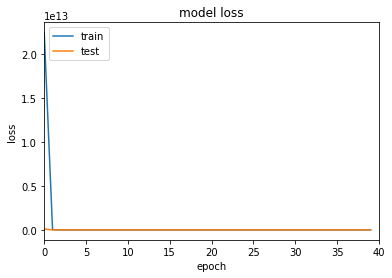

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 133.3207 - root_mean_squared_error: 8.9927 - val_loss: 117.7240 - val_root_mean_squared_error: 8.0801
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 130.3426 - root_mean_squared_error: 8.8288 - val_loss: 125.0765 - val_root_mean_squared_error: 8.5282
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 133.0531 - root_mean_squared_error: 8.9842 - val_loss: 118.9148 - val_root_mean_squared_error: 8.1600
Epoch 44/60
6/6 [==============================] - 0s 12ms/step - loss: 134.5559 - root_mean_squared_error: 9.0692 - val_loss: 123.0460 - val_root_mean_squared_error: 8.4114
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 134.0306 - root_mean_squared_error: 9.0423 - val_loss: 121.3431 - val_root_mean_squared_error: 8.3119
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 131.4029 - root_mean_squared_error: 8.8995 - val_loss: 119.578

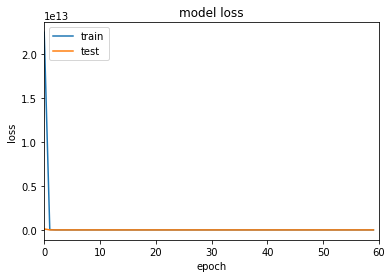

Epoch 1/20
6/6 [==============================] - 1s 39ms/step - loss: 10653484974080.0000 - root_mean_squared_error: 3263967.7500 - val_loss: 33499254784.0000 - val_root_mean_squared_error: 183028.0156
Epoch 2/20
6/6 [==============================] - 0s 9ms/step - loss: 5267147776.0000 - root_mean_squared_error: 72575.1016 - val_loss: 34269.3789 - val_root_mean_squared_error: 181.8305
Epoch 3/20
6/6 [==============================] - 0s 12ms/step - loss: 43558.2539 - root_mean_squared_error: 205.2956 - val_loss: 56404.2031 - val_root_mean_squared_error: 233.9272
Epoch 4/20
6/6 [==============================] - 0s 8ms/step - loss: 62791.4258 - root_mean_squared_error: 246.9474 - val_loss: 70844.2109 - val_root_mean_squared_error: 262.4398
Epoch 5/20
6/6 [==============================] - 0s 8ms/step - loss: 74626.9062 - root_mean_squared_error: 269.4203 - val_loss: 79059.3750 - val_root_mean_squared_error: 277.3674
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss:

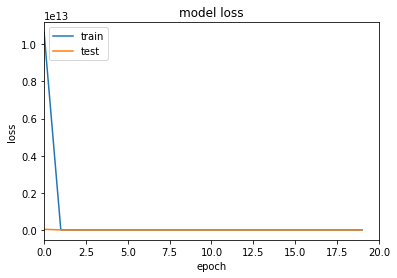

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 55532.1367 - root_mean_squared_error: 231.2420 - val_loss: 54060.9062 - val_root_mean_squared_error: 228.0549
Epoch 22/40
6/6 [==============================] - 0s 8ms/step - loss: 53331.0039 - root_mean_squared_error: 226.4592 - val_loss: 51889.3125 - val_root_mean_squared_error: 223.2693
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 51174.7852 - root_mean_squared_error: 221.6733 - val_loss: 49760.0078 - val_root_mean_squared_error: 218.4742
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 49060.3047 - root_mean_squared_error: 216.8766 - val_loss: 47675.4375 - val_root_mean_squared_error: 213.6750
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 46987.9375 - root_mean_squared_error: 212.0695 - val_loss: 45638.8359 - val_root_mean_squared_error: 208.8790
Epoch 26/40
6/6 [==============================] - 0s 8ms/step - loss: 44969.7773 - root_mean_

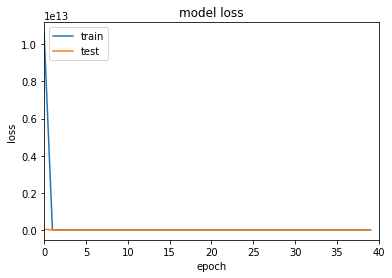

Epoch 41/60
6/6 [==============================] - 0s 13ms/step - loss: 21180.9219 - root_mean_squared_error: 138.8506 - val_loss: 20398.5312 - val_root_mean_squared_error: 136.0148
Epoch 42/60
6/6 [==============================] - 0s 10ms/step - loss: 20040.7910 - root_mean_squared_error: 134.7001 - val_loss: 19294.0137 - val_root_mean_squared_error: 131.9096
Epoch 43/60
6/6 [==============================] - 0s 9ms/step - loss: 18953.0508 - root_mean_squared_error: 130.6175 - val_loss: 18241.1855 - val_root_mean_squared_error: 127.8740
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 17917.4531 - root_mean_squared_error: 126.6085 - val_loss: 17238.4609 - val_root_mean_squared_error: 123.9084
Epoch 45/60
6/6 [==============================] - 0s 9ms/step - loss: 16932.3555 - root_mean_squared_error: 122.6735 - val_loss: 16283.6367 - val_root_mean_squared_error: 120.0106
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 15992.7441 - root_mean

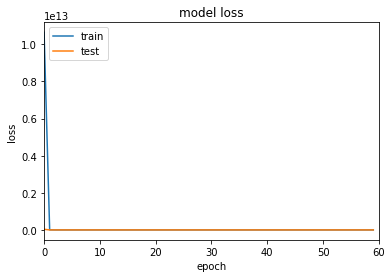

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 2815556583424.0000 - root_mean_squared_error: 1677962.0000 - val_loss: 44669149184.0000 - val_root_mean_squared_error: 211350.7656
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 7825472000.0000 - root_mean_squared_error: 88461.6953 - val_loss: 3699.5115 - val_root_mean_squared_error: 59.7647
Epoch 3/20
6/6 [==============================] - 0s 8ms/step - loss: 1446.7692 - root_mean_squared_error: 36.0270 - val_loss: 701.1842 - val_root_mean_squared_error: 22.8984
Epoch 4/20
6/6 [==============================] - 0s 10ms/step - loss: 739.3332 - root_mean_squared_error: 23.4363 - val_loss: 738.9031 - val_root_mean_squared_error: 23.0570
Epoch 5/20
6/6 [==============================] - 0s 12ms/step - loss: 770.2281 - root_mean_squared_error: 23.5653 - val_loss: 760.4739 - val_root_mean_squared_error: 23.1475
Epoch 6/20
6/6 [==============================] - 0s 9ms/step - loss: 787.5571 - root_me

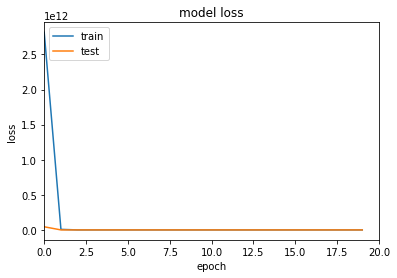

Epoch 21/40
6/6 [==============================] - 0s 15ms/step - loss: 309.0121 - root_mean_squared_error: 8.7814 - val_loss: 298.3339 - val_root_mean_squared_error: 8.1943
Epoch 22/40
6/6 [==============================] - 0s 11ms/step - loss: 310.3046 - root_mean_squared_error: 8.9197 - val_loss: 301.0519 - val_root_mean_squared_error: 8.4260
Epoch 23/40
6/6 [==============================] - 0s 8ms/step - loss: 310.5864 - root_mean_squared_error: 8.9979 - val_loss: 298.7276 - val_root_mean_squared_error: 8.3528
Epoch 24/40
6/6 [==============================] - 0s 8ms/step - loss: 307.5427 - root_mean_squared_error: 8.8883 - val_loss: 294.7086 - val_root_mean_squared_error: 8.1739
Epoch 25/40
6/6 [==============================] - 0s 9ms/step - loss: 305.1502 - root_mean_squared_error: 8.8121 - val_loss: 292.3894 - val_root_mean_squared_error: 8.0852
Epoch 26/40
6/6 [==============================] - 0s 11ms/step - loss: 303.3394 - root_mean_squared_error: 8.7339 - val_loss: 292.47

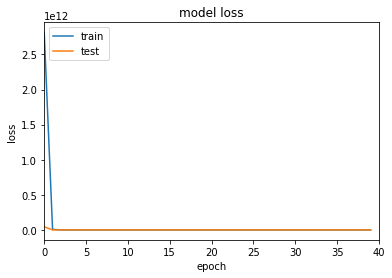

Epoch 41/60
6/6 [==============================] - 0s 17ms/step - loss: 293.8294 - root_mean_squared_error: 8.7389 - val_loss: 282.3151 - val_root_mean_squared_error: 8.0808
Epoch 42/60
6/6 [==============================] - 0s 8ms/step - loss: 293.1123 - root_mean_squared_error: 8.7393 - val_loss: 281.6910 - val_root_mean_squared_error: 8.0864
Epoch 43/60
6/6 [==============================] - 0s 10ms/step - loss: 292.4816 - root_mean_squared_error: 8.7437 - val_loss: 281.0356 - val_root_mean_squared_error: 8.0890
Epoch 44/60
6/6 [==============================] - 0s 9ms/step - loss: 291.8700 - root_mean_squared_error: 8.7483 - val_loss: 280.5051 - val_root_mean_squared_error: 8.0983
Epoch 45/60
6/6 [==============================] - 0s 8ms/step - loss: 291.3820 - root_mean_squared_error: 8.7590 - val_loss: 279.5645 - val_root_mean_squared_error: 8.0814
Epoch 46/60
6/6 [==============================] - 0s 8ms/step - loss: 290.4179 - root_mean_squared_error: 8.7417 - val_loss: 278.891

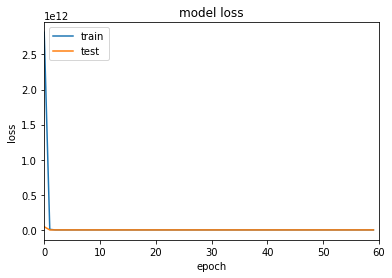

Epoch 1/20
6/6 [==============================] - 1s 41ms/step - loss: 4399089319936.0000 - root_mean_squared_error: 2097400.5000 - val_loss: 1034188352.0000 - val_root_mean_squared_error: 32158.7988
Epoch 2/20
6/6 [==============================] - 0s 8ms/step - loss: 185770560.0000 - root_mean_squared_error: 13629.7666 - val_loss: 154.2180 - val_root_mean_squared_error: 11.7584
Epoch 3/20
6/6 [==============================] - 0s 9ms/step - loss: 115.0396 - root_mean_squared_error: 9.8330 - val_loss: 115.9620 - val_root_mean_squared_error: 9.7153
Epoch 4/20
6/6 [==============================] - 0s 9ms/step - loss: 161.9895 - root_mean_squared_error: 11.7824 - val_loss: 177.5444 - val_root_mean_squared_error: 12.3405
Epoch 5/20
6/6 [==============================] - 0s 10ms/step - loss: 167.3594 - root_mean_squared_error: 11.8818 - val_loss: 126.7945 - val_root_mean_squared_error: 9.9707
Epoch 6/20
6/6 [==============================] - 0s 8ms/step - loss: 122.8726 - root_mean_square

KeyboardInterrupt: ignored

In [ ]:
epochs = [20,40,60]
alphas = [1,1e-1,1e-2,1e-3,1e-4]
activations = ['relu','sigmoid']
L1_params = [1e-2,1e-3,1e-4,1e-5]
L2_params = [1e-2,1e-3,1e-4,1e-5]
model_name = "model_128_64_32"


for alpha in alphas:
    for activation in activations:
        for l1 in L1_params:
            for l2 in L2_params:

                model_metrics = pd.DataFrame(columns=['loss','root_mean_squared_error','val_loss','val_root_mean_squared_error'])
                model_128_64_32 = model_architecture_128_64_32(X_train.shape[1],L1 = l1, L2 = l2, alpha = alpha, activation=activation)
                last_epoch = 0
                            
                for epoch in epochs:

                    temp_model_history = model_128_64_32.fit(X_train_tensor,
                                y_train_tensor,
                                validation_split=0.15, 
                                epochs = epoch, 
                                initial_epoch = last_epoch
                                )

                    temp_metrics = pd.DataFrame(temp_model_history.history)
                    model_metrics = pd.concat([model_metrics,temp_metrics])
                    model_metrics = model_metrics.reset_index(drop=True)

                    plt.plot(model_metrics['loss'])
                    plt.plot(model_metrics['val_loss'])
                    plt.title('model loss')
                    plt.xlim(0,epoch)
                    plt.ylabel('loss')
                    plt.xlabel('epoch')
                    plt.legend(['train', 'test'], loc='upper left')
                    plt.show()

                    temp_metrics = temp_metrics[temp_metrics['val_root_mean_squared_error'] == temp_metrics['val_root_mean_squared_error'].min()]

                    new_row = [model_name,
                        epoch,
                        activation,
                        alpha,
                        l1,
                        l2,
                        temp_metrics['loss'].values[0],
                        temp_metrics['root_mean_squared_error'].values[0],
                        temp_metrics['val_loss'].values[0],
                        temp_metrics['val_root_mean_squared_error'].values[0]
                    ]

                    last_epoch = epoch

                    model_summaries.loc[model_summaries.shape[0]] = new_row

In [ ]:
model_summaries.head()

,model_name,epochs,activation,learning_rate,l1,l2,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
0,model_128,20,relu,1,0.1,0.10,4.489924e+03,25.001253,4045.571533,11.679570
1,model_128,40,relu,1,0.1,0.10,6.751934e+06,2597.690674,4663.652832,26.045444
2,model_128,60,relu,1,0.1,0.10,8.556084e+03,47.938065,8540.330078,47.605896
3,model_128,20,relu,1,0.1,0.01,1.521798e+03,21.526697,1493.997070,21.015265
4,model_128,40,relu,1,0.1,0.01,1.408607e+03,20.583412,1384.392090,20.052526


In [ ]:
model_summaries = model_summaries.sort_values(by=['val_root_mean_squared_error'])
model_summaries.head(50)

,model_name,epochs,activation,learning_rate,l1,l2,loss,root_mean_squared_error,val_loss,val_root_mean_squared_error
817,model_128_64,60,relu,0.001,0.00010,0.00001,22.135796,4.700563,15.201769,3.893745
721,model_128_64,60,relu,0.01,0.00010,0.00001,28.247307,5.309946,15.527020,3.933857
816,model_128_64,40,relu,0.001,0.00010,0.00001,29.181700,5.398310,15.794837,3.969212
787,model_128_64,60,relu,0.001,0.01000,0.00100,22.898640,4.419651,19.292711,3.991112
1264,model_128,60,relu,0.001,0.01000,0.01000,26.364904,4.653097,20.737648,4.003717
813,model_128_64,40,relu,0.001,0.00010,0.00010,24.136570,4.907957,16.172066,4.015397
727,model_128_64,60,relu,0.01,0.00001,0.00100,22.198595,4.703660,16.244749,4.021251
1303,model_128,60,relu,0.001,0.00001,0.00100,21.473801,4.626609,16.263145,4.024281
1273,model_128,60,relu,0.001,0.01000,0.00001,26.394192,4.662027,20.932589,4.034587
1192,model_128,60,relu,0.01,0.00010,0.01000,24.777246,4.897433,17.116074,4.040298


In [ ]:
"total_models = model_summaries.shape[0]
total_models

1454

In [ ]:
top_models = model_summaries.head(100)

In [ ]:
top_models['activation'].value_counts()

relu    100
Name: activation, dtype: int64

([<matplotlib.patches.Wedge at 0x7fcd98309990>],
 [Text(-1.1, 1.3471114790620887e-16, 'relu')])

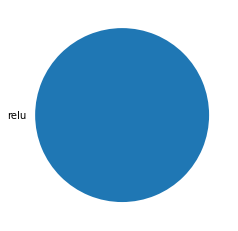

In [ ]:
plt.pie(x=top_models['activation'].value_counts(),labels=['relu'])

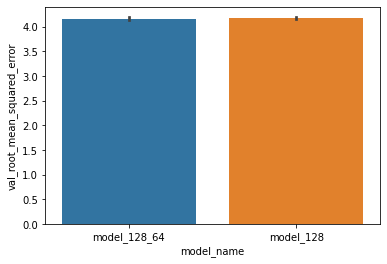

In [ ]:
sns.barplot(x="model_name", y="val_root_mean_squared_error", data=top_models)